In [1]:
# from google.colab import drive
# drive.mount('/content/drive/')

In [2]:

#!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
# !add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
# !apt-get update -qq 2>&1 > /dev/null
# !apt-get -y install -qq google-drive-ocamlfuse fuse
# from google.colab import auth
# auth.authenticate_user()
# from oauth2client.client import GoogleCredentials
# creds = GoogleCredentials.get_application_default()
# import getpass
# !google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
# vcode = getpass.getpass()
# !echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}

In [3]:
# !mkdir -p drive
# !google-drive-ocamlfuse drive

In [4]:
# !cp "/content/drive/My Drive/Colab Notebooks/attention_keras/src/layers/attention.py" .

In [2]:
from attention_keras.src.layers.attention import AttentionLayer

C:\ProgramData\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:541: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:542: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.py:543: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\ProgramData\Anaconda3\lib\site-packages\tensorboard\compat\tensorflow_stub\dtypes.

AttentionLayer was taken from here https://github.com/thushv89/attention_keras

In [3]:
import numpy as np
import pandas as pd 
import re
from bs4 import BeautifulSoup
from keras.preprocessing.text import Tokenizer 
from keras.preprocessing.sequence import pad_sequences
from nltk.corpus import stopwords
from tensorflow.keras.layers import Input, LSTM, Embedding, Dense, Concatenate, TimeDistributed
from tensorflow.keras.models import Model
from tensorflow.keras.callbacks import EarlyStopping
import warnings
pd.set_option("display.max_colwidth", 200)
warnings.filterwarnings("ignore")
from os import listdir

In [4]:
import tensorflow as tf
tf.__version__

'2.2.0'

#Read the dataset

CNN daily mail dataset consists of long news articles(an average of ~800 words). It consists of both articles and summaries of those articles.

In [5]:
import zipfile
import os

In [6]:


# zpfile = '/content/drive/My Drive/Colab Notebooks/cnn_stories.zip'
# z = zipfile.ZipFile(zpfile, 'r')
# z.extractall()

In [7]:
#print(os.listdir())

In [9]:
# load doc into memory
def load_doc(filename):
	# open the file as read only

	file = open(filename, encoding='utf-8')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text
 
# split a document into news story and highlights
def split_story(doc):
	# find first highlight
	index = doc.find('@highlight')
	# split into story and highlights
	story, highlights = doc[:index], doc[index:].split('@highlight')
	# strip extra white space around each highlight
	highlights = [h.strip() for h in highlights if len(h) > 0]
	return story, highlights
 
# load all stories in a directory
def load_stories(directory):
	stories = list()
	for name in listdir(directory):
		filename = directory + '/' + name
		# load document
		doc = load_doc(filename)
		# split into story and highlights
		story, highlights = split_story(doc)
		# store
		stories.append({'story':story, 'highlights':highlights})
	return stories
 
# load stories
directory = '../bpe_dropout/How-to-build-own-text-summarizer-using-deep-learning-master/cnn_stories/cnn/stories/'
stories = load_stories(directory)
print('Loaded Stories %d' % len(stories))

Loaded Stories 92579


In [11]:
import string


# clean a list of lines
def clean_lines(lines):
	cleaned = list()
	# prepare a translation table to remove punctuation
	table = str.maketrans('', '', string.punctuation)
	for line in lines:
		# strip source cnn office if it exists
		index = line.find('(CNN) -- ')
		if index > -1:
			line = line[index+len('(CNN)'):]
		# tokenize on white space
		line = line.split()
		# convert to lower case
		line = [word.lower() for word in line]
		# remove punctuation from each token
		line = [w.translate(table) for w in line]
		# remove tokens with numbers in them
		line = [word for word in line if word.isalpha()]
		# store as string
		cleaned.append(' '.join(line))
	# remove empty strings
	cleaned = [c for c in cleaned if len(c) > 0]
	return cleaned

# clean stories
for example in stories:
	example['story'] = clean_lines(example['story'].split('\n'))
	example['highlights'] = clean_lines(example['highlights'])

In [12]:
data = pd.DataFrame(stories)

In [13]:
data.head()

,story,highlights
0,"[its official us president barack obama wants lawmakers to weigh in on whether to use military force in syria, obama sent a letter to the heads of the house and senate on saturday night hours afte...","[syrian official obama climbed to the top of the tree doesnt know how to get down, obama sends a letter to the heads of the house and senate, obama to seek congressional approval on military actio..."
1,"[usain bolt rounded off the world championships sunday by claiming his third gold in moscow as he anchored jamaica to victory in the mens relay, the fastest man in the world charged clear of unite...","[usain bolt wins third gold of world championship, anchors jamaica to relay victory, eighth gold at the championships for bolt, jamaica double up in womens relay]"
2,[the general services administration already under investigation for lavish spending allowed an employee to telecommute from hawaii even though he is based at the gsas kansas city missouri office ...,"[the employee in agencys kansas city office is among hundreds of virtual workers, the employees travel to and from the mainland us last year cost more than, the telecommuting program like all gsa ..."
3,[a medical doctor in vancouver british columbia said thursday that california arson suspect harry burkhart suffered from severe mental illness in when she examined him as part of a team of doctors...,"[new a canadian doctor says she was part of a team examining harry burkhart in, new diagnosis autism severe anxiety posttraumatic stress disorder and depression, burkhart is also suspected in a ge..."
4,"[police arrested another teen thursday the sixth suspect jailed in connection with the gang rape of a girl on a northern california high school campus, jose carlos montano was arrested on charges ...","[another arrest made in gang rape outside california school, investigators say up to people took part or stood and watched the assault, four suspects appeared in court thursday three wore bulletpr..."


In [14]:
data.rename(columns={"highlights": "Summary", "story": "Text"}, inplace=True)

In [17]:
data['Text'] = data['Text'].apply(lambda x: ' '.join(x) )

In [18]:
data['Summary'] = data['Summary'].apply(lambda x: ' '.join(x) )

In [19]:
data.head()

,Text,Summary
0,its official us president barack obama wants lawmakers to weigh in on whether to use military force in syria obama sent a letter to the heads of the house and senate on saturday night hours after ...,syrian official obama climbed to the top of the tree doesnt know how to get down obama sends a letter to the heads of the house and senate obama to seek congressional approval on military action a...
1,usain bolt rounded off the world championships sunday by claiming his third gold in moscow as he anchored jamaica to victory in the mens relay the fastest man in the world charged clear of united ...,usain bolt wins third gold of world championship anchors jamaica to relay victory eighth gold at the championships for bolt jamaica double up in womens relay
2,the general services administration already under investigation for lavish spending allowed an employee to telecommute from hawaii even though he is based at the gsas kansas city missouri office a...,the employee in agencys kansas city office is among hundreds of virtual workers the employees travel to and from the mainland us last year cost more than the telecommuting program like all gsa pra...
3,a medical doctor in vancouver british columbia said thursday that california arson suspect harry burkhart suffered from severe mental illness in when she examined him as part of a team of doctors ...,new a canadian doctor says she was part of a team examining harry burkhart in new diagnosis autism severe anxiety posttraumatic stress disorder and depression burkhart is also suspected in a germa...
4,police arrested another teen thursday the sixth suspect jailed in connection with the gang rape of a girl on a northern california high school campus jose carlos montano was arrested on charges of...,another arrest made in gang rape outside california school investigators say up to people took part or stood and watched the assault four suspects appeared in court thursday three wore bulletproof...


### Drop Duplicates and NA values

In [20]:
data.drop_duplicates(subset=['Text'],inplace=True)#dropping duplicates
data.dropna(axis=0,inplace=True)#dropping na

### Information about dataset


In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89363 entries, 0 to 92578
Data columns (total 2 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   Text     89363 non-null  object
 1   Summary  89363 non-null  object
dtypes: object(2)
memory usage: 2.0+ MB


### Preprocessing

In [22]:
contraction_mapping = {"ain't": "is not", "aren't": "are not","can't": "cannot", "'cause": "because", "could've": "could have", "couldn't": "could not",
                           "didn't": "did not",  "doesn't": "does not", "don't": "do not", "hadn't": "had not", "hasn't": "has not", "haven't": "have not",
                           "he'd": "he would","he'll": "he will", "he's": "he is", "how'd": "how did", "how'd'y": "how do you", "how'll": "how will", "how's": "how is",
                           "I'd": "I would", "I'd've": "I would have", "I'll": "I will", "I'll've": "I will have","I'm": "I am", "I've": "I have", "i'd": "i would",
                           "i'd've": "i would have", "i'll": "i will",  "i'll've": "i will have","i'm": "i am", "i've": "i have", "isn't": "is not", "it'd": "it would",
                           "it'd've": "it would have", "it'll": "it will", "it'll've": "it will have","it's": "it is", "let's": "let us", "ma'am": "madam",
                           "mayn't": "may not", "might've": "might have","mightn't": "might not","mightn't've": "might not have", "must've": "must have",
                           "mustn't": "must not", "mustn't've": "must not have", "needn't": "need not", "needn't've": "need not have","o'clock": "of the clock",
                           "oughtn't": "ought not", "oughtn't've": "ought not have", "shan't": "shall not", "sha'n't": "shall not", "shan't've": "shall not have",
                           "she'd": "she would", "she'd've": "she would have", "she'll": "she will", "she'll've": "she will have", "she's": "she is",
                           "should've": "should have", "shouldn't": "should not", "shouldn't've": "should not have", "so've": "so have","so's": "so as",
                           "this's": "this is","that'd": "that would", "that'd've": "that would have", "that's": "that is", "there'd": "there would",
                           "there'd've": "there would have", "there's": "there is", "here's": "here is","they'd": "they would", "they'd've": "they would have",
                           "they'll": "they will", "they'll've": "they will have", "they're": "they are", "they've": "they have", "to've": "to have",
                           "wasn't": "was not", "we'd": "we would", "we'd've": "we would have", "we'll": "we will", "we'll've": "we will have", "we're": "we are",
                           "we've": "we have", "weren't": "were not", "what'll": "what will", "what'll've": "what will have", "what're": "what are",
                           "what's": "what is", "what've": "what have", "when's": "when is", "when've": "when have", "where'd": "where did", "where's": "where is",
                           "where've": "where have", "who'll": "who will", "who'll've": "who will have", "who's": "who is", "who've": "who have",
                           "why's": "why is", "why've": "why have", "will've": "will have", "won't": "will not", "won't've": "will not have",
                           "would've": "would have", "wouldn't": "would not", "wouldn't've": "would not have", "y'all": "you all",
                           "y'all'd": "you all would","y'all'd've": "you all would have","y'all're": "you all are","y'all've": "you all have",
                           "you'd": "you would", "you'd've": "you would have", "you'll": "you will", "you'll've": "you will have",
                           "you're": "you are", "you've": "you have"}

We will perform the below preprocessing tasks for our data:

1.Convert everything to lowercase

2.Remove HTML tags

3.Contraction mapping

4.Remove (‘s)

5.Remove any text inside the parenthesis ( )

6.Eliminate (устраним) punctuations and special characters

7.Remove stopwords

8.Remove short words

Let’s define the function:

In [23]:
import nltk
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\Margarita\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [24]:
stop_words = set(stopwords.words('english')) 

In [25]:
def text_cleaner(text,num):
    newString = text.lower()
    newString = BeautifulSoup(newString, "lxml").text
    newString = re.sub(r'\([^)]*\)', '', newString)
    newString = re.sub('"','', newString)
    newString = ' '.join([contraction_mapping[t] if t in contraction_mapping else t for t in newString.split(" ")])    
    newString = re.sub(r"'s\b","",newString)
    newString = re.sub("[^a-zA-Z]", " ", newString) 
    newString = re.sub('[m]{2,}', 'mm', newString)
    if(num==0):
        tokens = [w for w in newString.split() if not w in stop_words]
    else:
        tokens=newString.split()
    long_words=[]
    for i in tokens:
        if len(i)>1:                                                 #removing short word
            long_words.append(i)   
    return (" ".join(long_words)).strip()

In [26]:
cleaned_text = []
for t in data['Text']:
    cleaned_text.append(text_cleaner(t,0)) 

Let us look at the first five preprocessed reviews

In [28]:
cleaned_summary = []
for t in data['Summary']:
    cleaned_summary.append(text_cleaner(t,1))

Let us look at the first 10 preprocessed summaries

In [29]:
cleaned_summary[:10]

['syrian official obama climbed to the top of the tree doesnt know how to get down obama sends letter to the heads of the house and senate obama to seek congressional approval on military action against syria aim is to determine whether cw were used not by whom says un spokesman',
 'usain bolt wins third gold of world championship anchors jamaica to relay victory eighth gold at the championships for bolt jamaica double up in womens relay',
 'the employee in agencys kansas city office is among hundreds of virtual workers the employees travel to and from the mainland us last year cost more than the telecommuting program like all gsa practices is under review',
 'new canadian doctor says she was part of team examining harry burkhart in new diagnosis autism severe anxiety posttraumatic stress disorder and depression burkhart is also suspected in german arson probe officials say prosecutors believe the german national set string of fires in los angeles',
 'another arrest made in gang rape o

In [30]:
data['cleaned_text']=cleaned_text
data['cleaned_summary']=cleaned_summary

#Drop empty rows

In [31]:
data.replace('', np.nan, inplace=True)
data.dropna(axis=0,inplace=True)

### Understanding the distribution of the sequences

Here is an analysis of the length of the reviews and the summary to get an overall idea about the distribution of length of the text. This will help to fix the maximum length of the sequence:

In [33]:
import matplotlib.pyplot as plt

text_word_count = []
summary_word_count = []

# populate the lists with sentence lengths
for i in data['cleaned_text']:
      text_word_count.append(len(i.split()))

for i in data['cleaned_summary']:
      summary_word_count.append(len(i.split()))

length_df = pd.DataFrame({'text':text_word_count, 'summary':summary_word_count})

In [34]:
length_df.head()

,text,summary
0,899,51
1,309,26
2,556,37
3,531,45
4,166,32


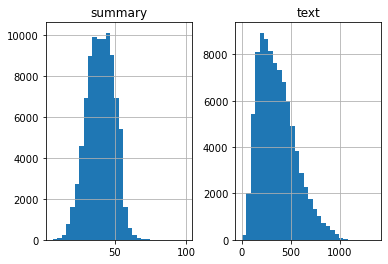

In [35]:


length_df.hist(bins = 30)
plt.show()

We can fix the maximum length of the summary to 8 since that seems to be the majority summary length.

Let us understand the proportion of the length of summaries below 8

In [36]:
cnt=0
for i in data['cleaned_summary']:
    if(len(i.split())<=50):
        cnt=cnt+1
print(cnt/len(data['cleaned_summary']))

0.862089031131801


In [37]:
cnt=0
for i in data['cleaned_text']:
    if(len(i.split())<=500):
        cnt=cnt+1
print(cnt/len(data['cleaned_text']))

0.777534074886417


Let us fix the maximum length of review to 30 and length of summary to 8.

In [38]:
max_text_len=30 #60
max_summary_len=8 #10

Let us select the reviews and summaries whose length falls below or equal to **max_text_len** and **max_summary_len**

In [39]:
cleaned_text =np.array(data['cleaned_text'])
cleaned_summary=np.array(data['cleaned_summary'])


In [41]:
len(cleaned_text)

89362

In [42]:
max_text_len

30

In [43]:
short_text=[]
short_summary=[]

for i in range(len(cleaned_text)):
    if (len(cleaned_summary[i].split())>max_summary_len):
        short_summary.append(" ".join(cleaned_summary[i].split()[:8]))
    else:
        short_summary.append(cleaned_summary[i])
    
    if(len(cleaned_text[i].split())>max_text_len):
        short_text.append(" ".join(cleaned_text[i].split()[:30]))
    else:
        short_text.append(cleaned_text[i])
       
#     if(len(cleaned_summary[i].split())<=max_summary_len and len(cleaned_text[i].split())<=max_text_len):
#         short_text.append(cleaned_text[i])
#         short_summary.append(cleaned_summary[i])
        
df=pd.DataFrame({'text':short_text,'summary':short_summary})

adding the **START** and **END** special tokens at the beginning and end of the summary.

In [47]:
df['summary'] = df['summary'].apply(lambda x : 'xl '+ x + ' xy')

We’ll use 90% of the dataset as the training data and evaluate the performance on the remaining 10% (holdout set):

In [48]:
from sklearn.model_selection import train_test_split
x_tr1,x_val,y_tr1,y_val=train_test_split(np.array(df['text']),np.array(df['summary']),test_size=0.1,random_state=0,shuffle=False) 

In [49]:
df['text'][0]

'official us president barack obama wants lawmakers weigh whether use military force syria obama sent letter heads house senate saturday night hours announcing believes military action syrian targets right step'

### Preparing the Tokenizer

A tokenizer builds the vocabulary and converts a word sequence to an integer sequence. Go ahead and build tokenizers for text and summary:

### Text Tokenizer

In [53]:
pip install tokenizers

Note: you may need to restart the kernel to use updated packages.


In [54]:
from pathlib import Path

from tokenizers import ByteLevelBPETokenizer

In [55]:
bpe_tokeniser_from_files = ByteLevelBPETokenizer(
    vocab_file='C:/Users/Margarita/Documents/bpe_dropout/english/vocab.json',
    merges_file='C:/Users/Margarita/Documents/bpe_dropout/english/merges.txt',
    dropout=0.1,
)
#example
print('dropout =', bpe_tokeniser_from_files._parameters['dropout'])
for _ in range(5):
    print(bpe_tokeniser_from_files.encode('There are a lot of apples in the garden').tokens)

dropout = 0.1
['There', 'Ġare', 'Ġa', 'Ġlot', 'Ġof', 'Ġapples', 'Ġin', 'Ġth', 'e', 'Ġgarden']
['There', 'Ġar', 'e', 'Ġa', 'Ġlot', 'Ġo', 'f', 'Ġapples', 'Ġi', 'n', 'Ġthe', 'Ġgard', 'en']
['There', 'Ġare', 'Ġ', 'a', 'Ġlot', 'Ġ', 'of', 'Ġapple', 's', 'Ġin', 'Ġthe', 'Ġgarden']
['There', 'Ġare', 'Ġa', 'Ġlot', 'Ġof', 'Ġapples', 'Ġin', 'Ġthe', 'Ġgarden']
['There', 'Ġare', 'Ġa', 'Ġlot', 'Ġof', 'Ġapples', 'Ġin', 'Ġthe', 'Ġgarden']


In [56]:
#x_tokenizer=load("/content/drive/My Drive/my-bpe.tokenizer.json")

In [57]:
x_tokenizer = ByteLevelBPETokenizer(
    vocab_file='C:/Users/Margarita/Documents/bpe_dropout/english/vocab.json',
    merges_file='C:/Users/Margarita/Documents/bpe_dropout/english/merges.txt',
    dropout=0.1,
)

In [58]:
print(bpe_tokeniser_from_files.encode(x_tr1[0]).tokens)

['official', 'Ġus', 'Ġpresident', 'Ġbar', 'ack', 'Ġob', 'ama', 'Ġwants', 'Ġlawmakers', 'Ġweigh', 'Ġwhether', 'Ġu', 'se', 'Ġm', 'ilitary', 'Ġforce', 'Ġsy', 'ria', 'Ġob', 'ama', 'Ġsent', 'Ġl', 'etter', 'Ġheads', 'Ġhouse', 'Ġs', 'en', 'ate', 'Ġs', 'aturday', 'Ġnight', 'Ġhours', 'Ġannouncing', 'Ġbelieves', 'Ġmilitary', 'Ġaction', 'Ġsy', 'rian', 'Ġtargets', 'Ġright', 'Ġstep']


In [59]:
#x_tokenizer.save("/content/drive/My Drive/my-bpe.tokenizer.json")

In [60]:
x_token = x_tokenizer.encode_batch(list(x_tr1))            

In [64]:
len(x_token[1].tokens)

55

remove word with big length (they are rare)

In [65]:
max=0
for x in x_token:
    if len(x)>max:
        max=len(x)
        
print(max) 
max_text_len=max

80




Let us define the tokenizer 

In [68]:
#convert text sequences into integer sequences
x_tr_seq    =   x_tokenizer.encode_batch(list(x_tr1))
x_val_seq   =   x_tokenizer.encode_batch(list(x_val))

In [69]:
#padding zero upto maximum length
x_tr    =   pad_sequences([x.ids for x in x_tr_seq],  maxlen=max_text_len, padding='post')
x_val   =   pad_sequences([x.ids for x in x_val_seq], maxlen=max_text_len, padding='post')

In [70]:
dic={}
for x in x_tr:
    
    for word in x:
        if word in dic:
            dic[word]+=1
        else:
            dic[word]=1
            
for x in x_val:
    
    for word in x:
        if word in dic:
            dic[word]+=1
        else:
            dic[word]=1           

In [71]:
len(dic)

23685

define max integer representation of tokens

In [72]:
max=0
for x in x_tr:
    
    for word in x:
        
        if (word > max):
            max = word
for x in x_val:
    
    for word in x:
        
        if (word > max):
            max = word            
print(max)        

51998


In [73]:
#size of vocabulary ( +1 for padding token)
x_voc   =  max + 1

### Summary Tokenizer

Let us define the tokenizer with top most common words for summary.

In [74]:
#prepare a tokenizer for reviews on training data
y_tokenizer = ByteLevelBPETokenizer(
    vocab_file='C:/Users/Margarita/Documents/bpe_dropout/english/vocab.json',
    merges_file='C:/Users/Margarita/Documents/bpe_dropout/english/merges.txt',
    dropout=0.1,
)

In [75]:
#y_tokenizer.save("/content/drive/My Drive/my-bpe.y_tokenizer.json")

In [76]:
#convert text sequences into integer sequences
y_tr_seq    =   y_tokenizer.encode_batch(list(y_tr1))
y_val_seq   =   y_tokenizer.encode_batch(list(y_val))

In [77]:
max=0
for x in y_tr_seq:
    if len(x)>max:
        max=len(x)
print(max) 
max_summary_len=max

30


In [79]:
#padding zero upto maximum length
y_tr    =   pad_sequences([y.ids for y in y_tr_seq],  maxlen=max_summary_len, padding='post')
y_val   =   pad_sequences([y.ids for y in y_val_seq], maxlen=max_summary_len, padding='post')

In [80]:
dicy={}
for y in y_tr_seq:
    
    for word in y.tokens:
        if word in dicy:
            dicy[word]+=1
        else:
            dicy[word]=1

for y in y_val_seq:
    
    for word in y.tokens:
        if word in dicy:
            dicy[word]+=1
        else:
            dicy[word]=1            

In [81]:

len(dicy)

19739

In [82]:
max=0
for x in y_tr:
    
    for word in x:
        
        if (word > max):
            max = word
for x in y_val:
    
    for word in x:
        
        if (word > max):
            max = word            
print(max)       

51997


In [83]:
#size of vocabulary
y_voc  =   max +1

In [84]:
y_voc

51998

Here, I am deleting the rows that contain only **START** and **END** tokens

In [85]:
ind=[]
for i in range(len(y_tr)):
    cnt=0
    for j in y_tr[i]:
        if j!=0:
            cnt=cnt+1
    if(cnt==2):
        ind.append(i)

y_tr=np.delete(y_tr,ind, axis=0)
x_tr=np.delete(x_tr,ind, axis=0)

In [86]:
ind=[]
for i in range(len(y_val)):
    cnt=0
    for j in y_val[i]:
        if j!=0:
            cnt=cnt+1
    if(cnt==2):
        ind.append(i)

y_val=np.delete(y_val,ind, axis=0)
x_val=np.delete(x_val,ind, axis=0)

# Model building

We are finally at the model building part. But before we do that, we need to familiarize ourselves with a few terms which are required prior to building the model.

**Return Sequences = True**: When the return sequences parameter is set to True, LSTM produces the hidden state and cell state for every timestep

**Return State = True**: When return state = True, LSTM produces the hidden state and cell state of the last timestep only

**Initial State**: This is used to initialize the internal states of the LSTM for the first timestep

**Stacked LSTM**: Stacked LSTM has multiple layers of LSTM stacked on top of each other. 
This leads to a better representation of the sequence. I encourage you to experiment with the multiple layers of the LSTM stacked on top of each other (it’s a great way to learn this)

Here, we are building a 3 stacked LSTM for the encoder:

In [87]:
from keras import backend as K 
K.clear_session()

latent_dim = 300
embedding_dim=100

# Encoder
encoder_inputs = Input(shape=(max_text_len,))

#embedding layer
enc_emb =  Embedding(x_voc, embedding_dim,trainable=True)(encoder_inputs)

#encoder lstm 1
encoder_lstm1 = LSTM(latent_dim,return_sequences=True,return_state=True,dropout=0.4,recurrent_dropout=0.4)
encoder_output1, state_h1, state_c1 = encoder_lstm1(enc_emb)

#encoder lstm 2
encoder_lstm2 = LSTM(latent_dim,return_sequences=True,return_state=True,dropout=0.4,recurrent_dropout=0.4)
encoder_output2, state_h2, state_c2 = encoder_lstm2(encoder_output1)

#encoder lstm 3
encoder_lstm3=LSTM(latent_dim, return_state=True, return_sequences=True,dropout=0.4,recurrent_dropout=0.4)
encoder_outputs, state_h, state_c= encoder_lstm3(encoder_output2)

# Set up the decoder, using `encoder_states` as initial state.
decoder_inputs = Input(shape=(None,))

#embedding layer
dec_emb_layer = Embedding(y_voc, embedding_dim,trainable=True)
dec_emb = dec_emb_layer(decoder_inputs)

decoder_lstm = LSTM(latent_dim, return_sequences=True, return_state=True,dropout=0.4,recurrent_dropout=0.2)
decoder_outputs,decoder_fwd_state, decoder_back_state = decoder_lstm(dec_emb,initial_state=[state_h, state_c])

# Attention layer
attn_layer = AttentionLayer(name='attention_layer')
attn_out, attn_states = attn_layer([encoder_outputs, decoder_outputs])

# Concat attention input and decoder LSTM output
decoder_concat_input = Concatenate(axis=-1, name='concat_layer')([decoder_outputs, attn_out])

#dense layer
decoder_dense =  TimeDistributed(Dense(y_voc, activation='softmax'))
decoder_outputs = decoder_dense(decoder_concat_input)

# Define the model 
model = Model([encoder_inputs, decoder_inputs], decoder_outputs)

model.summary() 

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 76)]         0                                            
__________________________________________________________________________________________________
embedding (Embedding)           (None, 76, 100)      5199900     input_1[0][0]                    
__________________________________________________________________________________________________
lstm (LSTM)                     [(None, 76, 300), (N 481200      embedding[0][0]                  
__________________________________________________________________________________________________
input_2 (InputLayer)            [(None, None)]       0                                            
______________________________________________________________________________________________

I am using sparse categorical cross-entropy as the loss function since it converts the integer sequence to a one-hot vector on the fly. This overcomes any memory issues.

In [88]:
model.compile(optimizer='rmsprop', loss='sparse_categorical_crossentropy')

The concept of early stopping is used to stop training the neural network at the right time by monitoring a user-specified metric. Here, I am monitoring the validation loss (val_loss). Our model will stop training once the validation loss increases:


In [90]:
es = EarlyStopping(monitor='val_loss', mode='min', verbose=1,patience=2)

In [91]:
checkpoint_path = "training_1/cp.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

In [92]:
# Создаем коллбек сохраняющий веса модели
cp_callback = tf.keras.callbacks.ModelCheckpoint(filepath=checkpoint_path,
                                                 save_weights_only=True,
                                                 verbose=1)

We’ll train the model on a batch size of 128 and validate it on the holdout set (which is 10% of our dataset):

In [94]:
#history = model.fit([x_tr,y_tr[:,:-1]], y_tr.reshape(y_tr.shape[0],y_tr.shape[1], 1)[:,1:] ,epochs=5,callbacks=[es, cp_callback],batch_size=128, validation_data=([x_val,y_val[:,:-1]], y_val.reshape(y_val.shape[0],y_val.shape[1], 1)[:,1:]))

In [95]:
#model.save_weights("bpe_model_short_30.h5")

In [96]:
# from google.colab import files
# files.download( "/content/bpe_model_short_30.h5" )

Load weights of already trained model

In [89]:
model.load_weights("bpe_model_short_30.h5")

#Diagnostic plot


In [97]:
# from matplotlib import pyplot
# pyplot.plot(history.history['loss'], label='train')
# pyplot.plot(history.history['val_loss'], label='test')
# pyplot.legend()
# pyplot.show()

Next, let’s build the dictionary to convert the index to word for target and source vocabulary:

In [180]:
dic={}

for i,v in zip(y_tr_seq, y_tr_seq):
    for x,y in zip(i.ids,v.tokens):
       if x not in dic:
          dic[x] = y

for i,v in zip(y_val_seq, y_val_seq):
    for x,y in zip(i.ids,v.tokens):
       if x not in dic:
          dic[x] = y

In [175]:
reverse_target_word_index={}
list_keys = list(dic.keys())
list_keys.sort()
for i in list_keys:
  reverse_target_word_index[i]=dic[i]

In [176]:
dicx={}

for i,v in zip(x_tr_seq, x_tr_seq):
    for x,y in zip(i.ids,v.tokens):
       if x not in dicx:
          dicx[x] = y

for i,v in zip(x_val_seq, x_val_seq):
    for x,y in zip(i.ids,v.tokens):
       if x not in dicx:
          dicx[x] = y

In [177]:
reverse_source_word_index={}
list_keys = list(dicx.keys())
list_keys.sort()
for i in list_keys:
  reverse_source_word_index[i]=dicx[i]


In [178]:
dic={}

for i,v in zip(y_tr_seq, y_tr_seq):
    for x,y in zip(i.ids,v.tokens):
       if y not in dic:
          dic[y] = x

for i,v in zip(y_val_seq, y_val_seq):
    for x,y in zip(i.ids,v.tokens):
       if y not in dic:
          dic[y] = x

In [179]:
target_word_index={}
list_d = list(dic.items())
list_d.sort(key=lambda i: i[1])

for i in list_d:
      target_word_index[i[0]]=i[1]


# Inference

Set up the inference for the encoder and decoder:

In [104]:
# Encode the input sequence to get the feature vector
encoder_model = Model(inputs=encoder_inputs,outputs=[encoder_outputs, state_h, state_c])

# Decoder setup
# Below tensors will hold the states of the previous time step
decoder_state_input_h = Input(shape=(latent_dim,))
decoder_state_input_c = Input(shape=(latent_dim,))
decoder_hidden_state_input = Input(shape=(max_text_len,latent_dim))

# Get the embeddings of the decoder sequence
dec_emb2= dec_emb_layer(decoder_inputs) 
# To predict the next word in the sequence, set the initial states to the states from the previous time step
decoder_outputs2, state_h2, state_c2 = decoder_lstm(dec_emb2, initial_state=[decoder_state_input_h, decoder_state_input_c])

#attention inference
attn_out_inf, attn_states_inf = attn_layer([decoder_hidden_state_input, decoder_outputs2])
decoder_inf_concat = Concatenate(axis=-1, name='concat')([decoder_outputs2, attn_out_inf])

# A dense softmax layer to generate prob dist. over the target vocabulary
decoder_outputs2 = decoder_dense(decoder_inf_concat) 

# Final decoder model
decoder_model = Model(
    [decoder_inputs] + [decoder_hidden_state_input,decoder_state_input_h, decoder_state_input_c],
    [decoder_outputs2] + [state_h2, state_c2])

We are defining a function below which is the implementation of the inference process:

In [120]:
def decode_sequence(input_seq):
    # Encode the input as state vectors.
    e_out, e_h, e_c = encoder_model.predict(input_seq)
    
    # Generate empty target sequence of length 1.
    target_seq = np.zeros((1,1))
    test=[]
    # Populate the first word of target sequence with the start word.
    #target_seq[0, 0] = target_word_index['x']

    stop_condition = False
    decoded_sentence = ''
    decoded_sentence_test = ''
    while not stop_condition:
      
        output_tokens, h, c = decoder_model.predict([target_seq] + [e_out, e_h, e_c])
        
        # Sample a token
        sampled_token_index = np.argmax(output_tokens[0, -1, :])
        
        test.append(sampled_token_index)
        
        sampled_token = reverse_target_word_index[sampled_token_index]
        #print(sampled_token)
        if(sampled_token!='y') or (sampled_token!='Ġx'):
            decoded_sentence += sampled_token + ' '
        
        # Exit condition: either hit max length or find stop word.
        if (sampled_token == 'Ġx' or sampled_token == 'xy' or sampled_token == '' or len(decoded_sentence.split()) >= (max_summary_len-1)):
            stop_condition = True

        # Update the target sequence (of length 1).
        target_seq = np.zeros((1,1))
        target_seq[0, 0] = sampled_token_index

        # Update internal states
        e_h, e_c = h, c
      
    decoded_sentence_test = y_tokenizer.decode(test[1:len(test)-1]) 
    return decoded_sentence_test

Let us define the functions to convert an integer sequence to a word sequence for summary as well as the reviews:

In [108]:
def seq2summary(input_seq):
#    return y_tokenizer.decode(input_seq)[2:len(input_seq)-1] 
     return y_tokenizer.decode(input_seq)[2:len(input_seq)+1]  

def seq2text(input_seq):
    return x_tokenizer.decode(input_seq) 

Here are a few summaries generated by the model:

In [109]:
reverse_target_word_index[0]=''

In [121]:
for i in range(0,10):
    print("Review:",seq2text(x_tr[i]))
    print("Original summary:",seq2summary(y_tr[i]))
    print("Predicted summary:",decode_sequence(x_tr[i].reshape(1,max_text_len)))
    print("\n")

Review: official us president barack obama wants lawmakers weigh whether use military force syria obama sent letter heads house senate saturday night hours announcing believes military action syrian targets right step<s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s>
Original summary:  syrian official obama clim
Predicted summary:  obama says he will not be the


Review: usain bolt rounded world championships sunday claiming third gold moscow anchored jamaica victory mens relay fastest man world charged clear united states rival justin gatlin jamaican quartet nesta carter kemar<s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s><s>
Original summary:  usain bolt wins third gold
Predicted summary:  usain bolt wins the world cup final


Review: general services administration already investigation lavish spending allowed employee telecommute hawaii even though based gsas kansas city missouri office cnn investigation found cost busin

### Preparation for using metric Rouge

Make the dataframe with original and predicted summaries

In [127]:
original_summary = []
predicted_summary = []

In [128]:
for i in range(len(y_tr)):
    original_summary.append(seq2summary(y_tr[i]))

In [136]:
for i in range(len(original_summary)):
    original_summary[i] = re.sub('<s>','', original_summary[i])
    original_summary[i] = re.sub('<s','', original_summary[i])
    original_summary[i] = re.sub('xy','', original_summary[i])
    original_summary[i] = re.sub('<','', original_summary[i])
    original_summary[i] = original_summary[i].strip()

In [181]:
original_summary[:5]

['syrian official obama clim',
 'usain bolt wins third gold',
 'the employee in agencys ka',
 'new canadian doctor says s',
 'another arrest made in gan']

In [170]:
for i in range(len(y_tr)):
    predicted_summary.append(decode_sequence(x_tr[i].reshape(1,max_text_len)))

In [134]:
for i in range(len(predicted_summary)):
    predicted_summary[i] = re.sub('<s>','', predicted_summary[i])
    predicted_summary[i] = re.sub('<s','', predicted_summary[i])
    predicted_summary[i] = re.sub('xy','', predicted_summary[i])
    predicted_summary[i] = re.sub('<','', predicted_summary[i])
    predicted_summary[i] = predicted_summary[i].strip()

In [182]:
predicted_summary[:5]

['obama says he will not be the',
 'usain bolt wins the world cup final',
 'new york city council says the country',
 'john avlon jr was found dead in',
 'new police say they are arrested in']

In [138]:
dataframe = pd.DataFrame({'original_summary': original_summary, 'predicted_summary':predicted_summary})

Delete empty predictions

In [143]:
np.where(dataframe['predicted_summary']=='')

(array([    5,     9,    12, ..., 80413, 80421, 80422], dtype=int64),)

In [140]:
np.where(dataframe['original_summary']=='')

(array([], dtype=int64),)

In [149]:
dataframe = dataframe.drop(np.where(dataframe['predicted_summary']=='')[0])

In [150]:
dataframe = dataframe.reset_index(drop=True)

In [151]:
dataframe.shape

(57726, 2)

In [152]:
dataframe.to_csv('predictions_cnn_without_empty.csv')

Create two folders with txt original and predicted summaries

In [153]:
for i in range(len(dataframe)):
    
    f = open('original_cnn/original_summary' + str(i) + '.txt', 'w', encoding="utf-8")
    f.write(dataframe['original_summary'][i])

In [163]:
for i in range(len(dataframe)):
    
    f = open('predicted_cnn/predicted_summary' + str(i) + '.txt', 'w', encoding="utf-8")
    f.write(dataframe['predicted_summary'][i])

Import pyrouge

In [155]:
from pyrouge import Rouge155

In [156]:
r = Rouge155('C:/Users/Margarita/pyrouge/rouge/tools/ROUGE-1.5.5')

2020-08-11 04:52:30,522 [MainThread  ] [INFO ]  Set ROUGE home directory to C:/Users/Margarita/pyrouge/rouge/tools/ROUGE-1.5.5.


In [157]:
r.system_dir = 'C:/Users/Margarita/Documents/bpe_dropout/How-to-build-own-text-summarizer-using-deep-learning-master/original_cnn' # Summaries to score against.
r.model_dir = 'C:/Users/Margarita/Documents/bpe_dropout/How-to-build-own-text-summarizer-using-deep-learning-master/predicted_cnn'  # Summaries generated by the model

In [158]:
r.system_filename_pattern = 'original_summary(\d+).txt'
r.model_filename_pattern = 'predicted_summary#ID#.txt'

In [174]:
output = r.convert_and_evaluate()

2020-08-11 05:03:30,073 [MainThread  ] [INFO ]  Writing summaries.
2020-08-11 05:03:30,078 [MainThread  ] [INFO ]  Processing summaries. Saving system files to C:\Users\MARGAR~1\AppData\Local\Temp\tmpqa6ba7ri\system and model files to C:\Users\MARGAR~1\AppData\Local\Temp\tmpqa6ba7ri\model.
2020-08-11 05:03:30,080 [MainThread  ] [INFO ]  Processing files in C:/Users/Margarita/Documents/bpe_dropout/How-to-build-own-text-summarizer-using-deep-learning-master/original_cnn.
2020-08-11 05:03:30,239 [MainThread  ] [INFO ]  Processing original_summary0.txt.
2020-08-11 05:03:30,244 [MainThread  ] [INFO ]  Processing original_summary1.txt.
2020-08-11 05:03:30,246 [MainThread  ] [INFO ]  Processing original_summary10.txt.
2020-08-11 05:03:30,250 [MainThread  ] [INFO ]  Processing original_summary100.txt.
2020-08-11 05:03:30,254 [MainThread  ] [INFO ]  Processing original_summary1000.txt.
2020-08-11 05:03:30,257 [MainThread  ] [INFO ]  Processing original_summary10000.txt.
2020-08-11 05:03:30,261 

2020-08-11 05:03:30,509 [MainThread  ] [INFO ]  Processing original_summary10078.txt.
2020-08-11 05:03:30,512 [MainThread  ] [INFO ]  Processing original_summary10079.txt.
2020-08-11 05:03:30,514 [MainThread  ] [INFO ]  Processing original_summary1008.txt.
2020-08-11 05:03:30,516 [MainThread  ] [INFO ]  Processing original_summary10080.txt.
2020-08-11 05:03:30,520 [MainThread  ] [INFO ]  Processing original_summary10081.txt.
2020-08-11 05:03:30,523 [MainThread  ] [INFO ]  Processing original_summary10082.txt.
2020-08-11 05:03:30,526 [MainThread  ] [INFO ]  Processing original_summary10083.txt.
2020-08-11 05:03:30,529 [MainThread  ] [INFO ]  Processing original_summary10084.txt.
2020-08-11 05:03:30,532 [MainThread  ] [INFO ]  Processing original_summary10085.txt.
2020-08-11 05:03:30,536 [MainThread  ] [INFO ]  Processing original_summary10086.txt.
2020-08-11 05:03:30,542 [MainThread  ] [INFO ]  Processing original_summary10087.txt.
2020-08-11 05:03:30,547 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:30,864 [MainThread  ] [INFO ]  Processing original_summary10164.txt.
2020-08-11 05:03:30,867 [MainThread  ] [INFO ]  Processing original_summary10165.txt.
2020-08-11 05:03:30,874 [MainThread  ] [INFO ]  Processing original_summary10166.txt.
2020-08-11 05:03:30,879 [MainThread  ] [INFO ]  Processing original_summary10167.txt.
2020-08-11 05:03:30,883 [MainThread  ] [INFO ]  Processing original_summary10168.txt.
2020-08-11 05:03:30,889 [MainThread  ] [INFO ]  Processing original_summary10169.txt.
2020-08-11 05:03:30,893 [MainThread  ] [INFO ]  Processing original_summary1017.txt.
2020-08-11 05:03:30,897 [MainThread  ] [INFO ]  Processing original_summary10170.txt.
2020-08-11 05:03:30,901 [MainThread  ] [INFO ]  Processing original_summary10171.txt.
2020-08-11 05:03:30,907 [MainThread  ] [INFO ]  Processing original_summary10172.txt.
2020-08-11 05:03:30,912 [MainThread  ] [INFO ]  Processing original_summary10173.txt.
2020-08-11 05:03:30,915 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:31,251 [MainThread  ] [INFO ]  Processing original_summary10250.txt.
2020-08-11 05:03:31,255 [MainThread  ] [INFO ]  Processing original_summary10251.txt.
2020-08-11 05:03:31,258 [MainThread  ] [INFO ]  Processing original_summary10252.txt.
2020-08-11 05:03:31,262 [MainThread  ] [INFO ]  Processing original_summary10253.txt.
2020-08-11 05:03:31,266 [MainThread  ] [INFO ]  Processing original_summary10254.txt.
2020-08-11 05:03:31,270 [MainThread  ] [INFO ]  Processing original_summary10255.txt.
2020-08-11 05:03:31,275 [MainThread  ] [INFO ]  Processing original_summary10256.txt.
2020-08-11 05:03:31,278 [MainThread  ] [INFO ]  Processing original_summary10257.txt.
2020-08-11 05:03:31,281 [MainThread  ] [INFO ]  Processing original_summary10258.txt.
2020-08-11 05:03:31,285 [MainThread  ] [INFO ]  Processing original_summary10259.txt.
2020-08-11 05:03:31,289 [MainThread  ] [INFO ]  Processing original_summary1026.txt.
2020-08-11 05:03:31,292 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:31,611 [MainThread  ] [INFO ]  Processing original_summary10337.txt.
2020-08-11 05:03:31,614 [MainThread  ] [INFO ]  Processing original_summary10338.txt.
2020-08-11 05:03:31,618 [MainThread  ] [INFO ]  Processing original_summary10339.txt.
2020-08-11 05:03:31,623 [MainThread  ] [INFO ]  Processing original_summary1034.txt.
2020-08-11 05:03:31,626 [MainThread  ] [INFO ]  Processing original_summary10340.txt.
2020-08-11 05:03:31,629 [MainThread  ] [INFO ]  Processing original_summary10341.txt.
2020-08-11 05:03:31,631 [MainThread  ] [INFO ]  Processing original_summary10342.txt.
2020-08-11 05:03:31,635 [MainThread  ] [INFO ]  Processing original_summary10343.txt.
2020-08-11 05:03:31,641 [MainThread  ] [INFO ]  Processing original_summary10344.txt.
2020-08-11 05:03:31,645 [MainThread  ] [INFO ]  Processing original_summary10345.txt.
2020-08-11 05:03:31,650 [MainThread  ] [INFO ]  Processing original_summary10346.txt.
2020-08-11 05:03:31,654 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:32,061 [MainThread  ] [INFO ]  Processing original_summary10423.txt.
2020-08-11 05:03:32,066 [MainThread  ] [INFO ]  Processing original_summary10424.txt.
2020-08-11 05:03:32,070 [MainThread  ] [INFO ]  Processing original_summary10425.txt.
2020-08-11 05:03:32,074 [MainThread  ] [INFO ]  Processing original_summary10426.txt.
2020-08-11 05:03:32,081 [MainThread  ] [INFO ]  Processing original_summary10427.txt.
2020-08-11 05:03:32,084 [MainThread  ] [INFO ]  Processing original_summary10428.txt.
2020-08-11 05:03:32,088 [MainThread  ] [INFO ]  Processing original_summary10429.txt.
2020-08-11 05:03:32,092 [MainThread  ] [INFO ]  Processing original_summary1043.txt.
2020-08-11 05:03:32,095 [MainThread  ] [INFO ]  Processing original_summary10430.txt.
2020-08-11 05:03:32,099 [MainThread  ] [INFO ]  Processing original_summary10431.txt.
2020-08-11 05:03:32,103 [MainThread  ] [INFO ]  Processing original_summary10432.txt.
2020-08-11 05:03:32,106 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:32,441 [MainThread  ] [INFO ]  Processing original_summary1051.txt.
2020-08-11 05:03:32,444 [MainThread  ] [INFO ]  Processing original_summary10510.txt.
2020-08-11 05:03:32,447 [MainThread  ] [INFO ]  Processing original_summary10511.txt.
2020-08-11 05:03:32,451 [MainThread  ] [INFO ]  Processing original_summary10512.txt.
2020-08-11 05:03:32,456 [MainThread  ] [INFO ]  Processing original_summary10513.txt.
2020-08-11 05:03:32,460 [MainThread  ] [INFO ]  Processing original_summary10514.txt.
2020-08-11 05:03:32,463 [MainThread  ] [INFO ]  Processing original_summary10515.txt.
2020-08-11 05:03:32,466 [MainThread  ] [INFO ]  Processing original_summary10516.txt.
2020-08-11 05:03:32,472 [MainThread  ] [INFO ]  Processing original_summary10517.txt.
2020-08-11 05:03:32,475 [MainThread  ] [INFO ]  Processing original_summary10518.txt.
2020-08-11 05:03:32,479 [MainThread  ] [INFO ]  Processing original_summary10519.txt.
2020-08-11 05:03:32,482 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:32,827 [MainThread  ] [INFO ]  Processing original_summary10597.txt.
2020-08-11 05:03:32,831 [MainThread  ] [INFO ]  Processing original_summary10598.txt.
2020-08-11 05:03:32,835 [MainThread  ] [INFO ]  Processing original_summary10599.txt.
2020-08-11 05:03:32,840 [MainThread  ] [INFO ]  Processing original_summary106.txt.
2020-08-11 05:03:32,846 [MainThread  ] [INFO ]  Processing original_summary1060.txt.
2020-08-11 05:03:32,852 [MainThread  ] [INFO ]  Processing original_summary10600.txt.
2020-08-11 05:03:32,857 [MainThread  ] [INFO ]  Processing original_summary10601.txt.
2020-08-11 05:03:32,865 [MainThread  ] [INFO ]  Processing original_summary10602.txt.
2020-08-11 05:03:32,871 [MainThread  ] [INFO ]  Processing original_summary10603.txt.
2020-08-11 05:03:32,876 [MainThread  ] [INFO ]  Processing original_summary10604.txt.
2020-08-11 05:03:32,881 [MainThread  ] [INFO ]  Processing original_summary10605.txt.
2020-08-11 05:03:32,887 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:33,248 [MainThread  ] [INFO ]  Processing original_summary10683.txt.
2020-08-11 05:03:33,253 [MainThread  ] [INFO ]  Processing original_summary10684.txt.
2020-08-11 05:03:33,258 [MainThread  ] [INFO ]  Processing original_summary10685.txt.
2020-08-11 05:03:33,263 [MainThread  ] [INFO ]  Processing original_summary10686.txt.
2020-08-11 05:03:33,268 [MainThread  ] [INFO ]  Processing original_summary10687.txt.
2020-08-11 05:03:33,272 [MainThread  ] [INFO ]  Processing original_summary10688.txt.
2020-08-11 05:03:33,277 [MainThread  ] [INFO ]  Processing original_summary10689.txt.
2020-08-11 05:03:33,281 [MainThread  ] [INFO ]  Processing original_summary1069.txt.
2020-08-11 05:03:33,285 [MainThread  ] [INFO ]  Processing original_summary10690.txt.
2020-08-11 05:03:33,289 [MainThread  ] [INFO ]  Processing original_summary10691.txt.
2020-08-11 05:03:33,293 [MainThread  ] [INFO ]  Processing original_summary10692.txt.
2020-08-11 05:03:33,299 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:33,650 [MainThread  ] [INFO ]  Processing original_summary1077.txt.
2020-08-11 05:03:33,655 [MainThread  ] [INFO ]  Processing original_summary10770.txt.
2020-08-11 05:03:33,660 [MainThread  ] [INFO ]  Processing original_summary10771.txt.
2020-08-11 05:03:33,663 [MainThread  ] [INFO ]  Processing original_summary10772.txt.
2020-08-11 05:03:33,666 [MainThread  ] [INFO ]  Processing original_summary10773.txt.
2020-08-11 05:03:33,672 [MainThread  ] [INFO ]  Processing original_summary10774.txt.
2020-08-11 05:03:33,676 [MainThread  ] [INFO ]  Processing original_summary10775.txt.
2020-08-11 05:03:33,680 [MainThread  ] [INFO ]  Processing original_summary10776.txt.
2020-08-11 05:03:33,684 [MainThread  ] [INFO ]  Processing original_summary10777.txt.
2020-08-11 05:03:33,690 [MainThread  ] [INFO ]  Processing original_summary10778.txt.
2020-08-11 05:03:33,694 [MainThread  ] [INFO ]  Processing original_summary10779.txt.
2020-08-11 05:03:33,698 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:34,086 [MainThread  ] [INFO ]  Processing original_summary10856.txt.
2020-08-11 05:03:34,090 [MainThread  ] [INFO ]  Processing original_summary10857.txt.
2020-08-11 05:03:34,093 [MainThread  ] [INFO ]  Processing original_summary10858.txt.
2020-08-11 05:03:34,096 [MainThread  ] [INFO ]  Processing original_summary10859.txt.
2020-08-11 05:03:34,099 [MainThread  ] [INFO ]  Processing original_summary1086.txt.
2020-08-11 05:03:34,103 [MainThread  ] [INFO ]  Processing original_summary10860.txt.
2020-08-11 05:03:34,107 [MainThread  ] [INFO ]  Processing original_summary10861.txt.
2020-08-11 05:03:34,111 [MainThread  ] [INFO ]  Processing original_summary10862.txt.
2020-08-11 05:03:34,114 [MainThread  ] [INFO ]  Processing original_summary10863.txt.
2020-08-11 05:03:34,118 [MainThread  ] [INFO ]  Processing original_summary10864.txt.
2020-08-11 05:03:34,122 [MainThread  ] [INFO ]  Processing original_summary10865.txt.
2020-08-11 05:03:34,127 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:34,438 [MainThread  ] [INFO ]  Processing original_summary10942.txt.
2020-08-11 05:03:34,443 [MainThread  ] [INFO ]  Processing original_summary10943.txt.
2020-08-11 05:03:34,446 [MainThread  ] [INFO ]  Processing original_summary10944.txt.
2020-08-11 05:03:34,449 [MainThread  ] [INFO ]  Processing original_summary10945.txt.
2020-08-11 05:03:34,452 [MainThread  ] [INFO ]  Processing original_summary10946.txt.
2020-08-11 05:03:34,455 [MainThread  ] [INFO ]  Processing original_summary10947.txt.
2020-08-11 05:03:34,459 [MainThread  ] [INFO ]  Processing original_summary10948.txt.
2020-08-11 05:03:34,463 [MainThread  ] [INFO ]  Processing original_summary10949.txt.
2020-08-11 05:03:34,470 [MainThread  ] [INFO ]  Processing original_summary1095.txt.
2020-08-11 05:03:34,474 [MainThread  ] [INFO ]  Processing original_summary10950.txt.
2020-08-11 05:03:34,477 [MainThread  ] [INFO ]  Processing original_summary10951.txt.
2020-08-11 05:03:34,481 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:34,829 [MainThread  ] [INFO ]  Processing original_summary11028.txt.
2020-08-11 05:03:34,834 [MainThread  ] [INFO ]  Processing original_summary11029.txt.
2020-08-11 05:03:34,842 [MainThread  ] [INFO ]  Processing original_summary1103.txt.
2020-08-11 05:03:34,846 [MainThread  ] [INFO ]  Processing original_summary11030.txt.
2020-08-11 05:03:34,850 [MainThread  ] [INFO ]  Processing original_summary11031.txt.
2020-08-11 05:03:34,854 [MainThread  ] [INFO ]  Processing original_summary11032.txt.
2020-08-11 05:03:34,860 [MainThread  ] [INFO ]  Processing original_summary11033.txt.
2020-08-11 05:03:34,864 [MainThread  ] [INFO ]  Processing original_summary11034.txt.
2020-08-11 05:03:34,869 [MainThread  ] [INFO ]  Processing original_summary11035.txt.
2020-08-11 05:03:34,875 [MainThread  ] [INFO ]  Processing original_summary11036.txt.
2020-08-11 05:03:34,879 [MainThread  ] [INFO ]  Processing original_summary11037.txt.
2020-08-11 05:03:34,884 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:35,264 [MainThread  ] [INFO ]  Processing original_summary11114.txt.
2020-08-11 05:03:35,269 [MainThread  ] [INFO ]  Processing original_summary11115.txt.
2020-08-11 05:03:35,273 [MainThread  ] [INFO ]  Processing original_summary11116.txt.
2020-08-11 05:03:35,277 [MainThread  ] [INFO ]  Processing original_summary11117.txt.
2020-08-11 05:03:35,280 [MainThread  ] [INFO ]  Processing original_summary11118.txt.
2020-08-11 05:03:35,283 [MainThread  ] [INFO ]  Processing original_summary11119.txt.
2020-08-11 05:03:35,288 [MainThread  ] [INFO ]  Processing original_summary1112.txt.
2020-08-11 05:03:35,292 [MainThread  ] [INFO ]  Processing original_summary11120.txt.
2020-08-11 05:03:35,295 [MainThread  ] [INFO ]  Processing original_summary11121.txt.
2020-08-11 05:03:35,298 [MainThread  ] [INFO ]  Processing original_summary11122.txt.
2020-08-11 05:03:35,303 [MainThread  ] [INFO ]  Processing original_summary11123.txt.
2020-08-11 05:03:35,307 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:35,630 [MainThread  ] [INFO ]  Processing original_summary11200.txt.
2020-08-11 05:03:35,632 [MainThread  ] [INFO ]  Processing original_summary11201.txt.
2020-08-11 05:03:35,637 [MainThread  ] [INFO ]  Processing original_summary11202.txt.
2020-08-11 05:03:35,642 [MainThread  ] [INFO ]  Processing original_summary11203.txt.
2020-08-11 05:03:35,646 [MainThread  ] [INFO ]  Processing original_summary11204.txt.
2020-08-11 05:03:35,649 [MainThread  ] [INFO ]  Processing original_summary11205.txt.
2020-08-11 05:03:35,652 [MainThread  ] [INFO ]  Processing original_summary11206.txt.
2020-08-11 05:03:35,657 [MainThread  ] [INFO ]  Processing original_summary11207.txt.
2020-08-11 05:03:35,660 [MainThread  ] [INFO ]  Processing original_summary11208.txt.
2020-08-11 05:03:35,662 [MainThread  ] [INFO ]  Processing original_summary11209.txt.
2020-08-11 05:03:35,665 [MainThread  ] [INFO ]  Processing original_summary1121.txt.
2020-08-11 05:03:35,669 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:36,046 [MainThread  ] [INFO ]  Processing original_summary11288.txt.
2020-08-11 05:03:36,050 [MainThread  ] [INFO ]  Processing original_summary11289.txt.
2020-08-11 05:03:36,055 [MainThread  ] [INFO ]  Processing original_summary1129.txt.
2020-08-11 05:03:36,059 [MainThread  ] [INFO ]  Processing original_summary11290.txt.
2020-08-11 05:03:36,065 [MainThread  ] [INFO ]  Processing original_summary11291.txt.
2020-08-11 05:03:36,069 [MainThread  ] [INFO ]  Processing original_summary11292.txt.
2020-08-11 05:03:36,072 [MainThread  ] [INFO ]  Processing original_summary11293.txt.
2020-08-11 05:03:36,076 [MainThread  ] [INFO ]  Processing original_summary11294.txt.
2020-08-11 05:03:36,082 [MainThread  ] [INFO ]  Processing original_summary11295.txt.
2020-08-11 05:03:36,087 [MainThread  ] [INFO ]  Processing original_summary11296.txt.
2020-08-11 05:03:36,091 [MainThread  ] [INFO ]  Processing original_summary11297.txt.
2020-08-11 05:03:36,095 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:36,410 [MainThread  ] [INFO ]  Processing original_summary11374.txt.
2020-08-11 05:03:36,413 [MainThread  ] [INFO ]  Processing original_summary11375.txt.
2020-08-11 05:03:36,416 [MainThread  ] [INFO ]  Processing original_summary11376.txt.
2020-08-11 05:03:36,421 [MainThread  ] [INFO ]  Processing original_summary11377.txt.
2020-08-11 05:03:36,426 [MainThread  ] [INFO ]  Processing original_summary11378.txt.
2020-08-11 05:03:36,429 [MainThread  ] [INFO ]  Processing original_summary11379.txt.
2020-08-11 05:03:36,431 [MainThread  ] [INFO ]  Processing original_summary1138.txt.
2020-08-11 05:03:36,437 [MainThread  ] [INFO ]  Processing original_summary11380.txt.
2020-08-11 05:03:36,440 [MainThread  ] [INFO ]  Processing original_summary11381.txt.
2020-08-11 05:03:36,444 [MainThread  ] [INFO ]  Processing original_summary11382.txt.
2020-08-11 05:03:36,447 [MainThread  ] [INFO ]  Processing original_summary11383.txt.
2020-08-11 05:03:36,449 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:36,780 [MainThread  ] [INFO ]  Processing original_summary11460.txt.
2020-08-11 05:03:36,782 [MainThread  ] [INFO ]  Processing original_summary11461.txt.
2020-08-11 05:03:36,788 [MainThread  ] [INFO ]  Processing original_summary11462.txt.
2020-08-11 05:03:36,794 [MainThread  ] [INFO ]  Processing original_summary11463.txt.
2020-08-11 05:03:36,799 [MainThread  ] [INFO ]  Processing original_summary11464.txt.
2020-08-11 05:03:36,804 [MainThread  ] [INFO ]  Processing original_summary11465.txt.
2020-08-11 05:03:36,809 [MainThread  ] [INFO ]  Processing original_summary11466.txt.
2020-08-11 05:03:36,813 [MainThread  ] [INFO ]  Processing original_summary11467.txt.
2020-08-11 05:03:36,818 [MainThread  ] [INFO ]  Processing original_summary11468.txt.
2020-08-11 05:03:36,823 [MainThread  ] [INFO ]  Processing original_summary11469.txt.
2020-08-11 05:03:36,827 [MainThread  ] [INFO ]  Processing original_summary1147.txt.
2020-08-11 05:03:36,831 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:37,238 [MainThread  ] [INFO ]  Processing original_summary11547.txt.
2020-08-11 05:03:37,244 [MainThread  ] [INFO ]  Processing original_summary11548.txt.
2020-08-11 05:03:37,251 [MainThread  ] [INFO ]  Processing original_summary11549.txt.
2020-08-11 05:03:37,254 [MainThread  ] [INFO ]  Processing original_summary1155.txt.
2020-08-11 05:03:37,258 [MainThread  ] [INFO ]  Processing original_summary11550.txt.
2020-08-11 05:03:37,262 [MainThread  ] [INFO ]  Processing original_summary11551.txt.
2020-08-11 05:03:37,267 [MainThread  ] [INFO ]  Processing original_summary11552.txt.
2020-08-11 05:03:37,271 [MainThread  ] [INFO ]  Processing original_summary11553.txt.
2020-08-11 05:03:37,274 [MainThread  ] [INFO ]  Processing original_summary11554.txt.
2020-08-11 05:03:37,280 [MainThread  ] [INFO ]  Processing original_summary11555.txt.
2020-08-11 05:03:37,285 [MainThread  ] [INFO ]  Processing original_summary11556.txt.
2020-08-11 05:03:37,289 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:37,671 [MainThread  ] [INFO ]  Processing original_summary11633.txt.
2020-08-11 05:03:37,675 [MainThread  ] [INFO ]  Processing original_summary11634.txt.
2020-08-11 05:03:37,681 [MainThread  ] [INFO ]  Processing original_summary11635.txt.
2020-08-11 05:03:37,684 [MainThread  ] [INFO ]  Processing original_summary11636.txt.
2020-08-11 05:03:37,688 [MainThread  ] [INFO ]  Processing original_summary11637.txt.
2020-08-11 05:03:37,691 [MainThread  ] [INFO ]  Processing original_summary11638.txt.
2020-08-11 05:03:37,696 [MainThread  ] [INFO ]  Processing original_summary11639.txt.
2020-08-11 05:03:37,700 [MainThread  ] [INFO ]  Processing original_summary1164.txt.
2020-08-11 05:03:37,705 [MainThread  ] [INFO ]  Processing original_summary11640.txt.
2020-08-11 05:03:37,711 [MainThread  ] [INFO ]  Processing original_summary11641.txt.
2020-08-11 05:03:37,715 [MainThread  ] [INFO ]  Processing original_summary11642.txt.
2020-08-11 05:03:37,720 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:38,106 [MainThread  ] [INFO ]  Processing original_summary1172.txt.
2020-08-11 05:03:38,112 [MainThread  ] [INFO ]  Processing original_summary11720.txt.
2020-08-11 05:03:38,115 [MainThread  ] [INFO ]  Processing original_summary11721.txt.
2020-08-11 05:03:38,119 [MainThread  ] [INFO ]  Processing original_summary11722.txt.
2020-08-11 05:03:38,123 [MainThread  ] [INFO ]  Processing original_summary11723.txt.
2020-08-11 05:03:38,127 [MainThread  ] [INFO ]  Processing original_summary11724.txt.
2020-08-11 05:03:38,131 [MainThread  ] [INFO ]  Processing original_summary11725.txt.
2020-08-11 05:03:38,135 [MainThread  ] [INFO ]  Processing original_summary11726.txt.
2020-08-11 05:03:38,140 [MainThread  ] [INFO ]  Processing original_summary11727.txt.
2020-08-11 05:03:38,145 [MainThread  ] [INFO ]  Processing original_summary11728.txt.
2020-08-11 05:03:38,149 [MainThread  ] [INFO ]  Processing original_summary11729.txt.
2020-08-11 05:03:38,153 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:38,506 [MainThread  ] [INFO ]  Processing original_summary11806.txt.
2020-08-11 05:03:38,511 [MainThread  ] [INFO ]  Processing original_summary11807.txt.
2020-08-11 05:03:38,514 [MainThread  ] [INFO ]  Processing original_summary11808.txt.
2020-08-11 05:03:38,518 [MainThread  ] [INFO ]  Processing original_summary11809.txt.
2020-08-11 05:03:38,522 [MainThread  ] [INFO ]  Processing original_summary1181.txt.
2020-08-11 05:03:38,526 [MainThread  ] [INFO ]  Processing original_summary11810.txt.
2020-08-11 05:03:38,531 [MainThread  ] [INFO ]  Processing original_summary11811.txt.
2020-08-11 05:03:38,536 [MainThread  ] [INFO ]  Processing original_summary11812.txt.
2020-08-11 05:03:38,541 [MainThread  ] [INFO ]  Processing original_summary11813.txt.
2020-08-11 05:03:38,546 [MainThread  ] [INFO ]  Processing original_summary11814.txt.
2020-08-11 05:03:38,549 [MainThread  ] [INFO ]  Processing original_summary11815.txt.
2020-08-11 05:03:38,554 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:38,930 [MainThread  ] [INFO ]  Processing original_summary11893.txt.
2020-08-11 05:03:38,934 [MainThread  ] [INFO ]  Processing original_summary11894.txt.
2020-08-11 05:03:38,939 [MainThread  ] [INFO ]  Processing original_summary11895.txt.
2020-08-11 05:03:38,942 [MainThread  ] [INFO ]  Processing original_summary11896.txt.
2020-08-11 05:03:38,946 [MainThread  ] [INFO ]  Processing original_summary11897.txt.
2020-08-11 05:03:38,949 [MainThread  ] [INFO ]  Processing original_summary11898.txt.
2020-08-11 05:03:38,952 [MainThread  ] [INFO ]  Processing original_summary11899.txt.
2020-08-11 05:03:38,956 [MainThread  ] [INFO ]  Processing original_summary119.txt.
2020-08-11 05:03:38,959 [MainThread  ] [INFO ]  Processing original_summary1190.txt.
2020-08-11 05:03:38,962 [MainThread  ] [INFO ]  Processing original_summary11900.txt.
2020-08-11 05:03:38,965 [MainThread  ] [INFO ]  Processing original_summary11901.txt.
2020-08-11 05:03:38,968 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:39,271 [MainThread  ] [INFO ]  Processing original_summary1198.txt.
2020-08-11 05:03:39,275 [MainThread  ] [INFO ]  Processing original_summary11980.txt.
2020-08-11 05:03:39,278 [MainThread  ] [INFO ]  Processing original_summary11981.txt.
2020-08-11 05:03:39,281 [MainThread  ] [INFO ]  Processing original_summary11982.txt.
2020-08-11 05:03:39,283 [MainThread  ] [INFO ]  Processing original_summary11983.txt.
2020-08-11 05:03:39,287 [MainThread  ] [INFO ]  Processing original_summary11984.txt.
2020-08-11 05:03:39,290 [MainThread  ] [INFO ]  Processing original_summary11985.txt.
2020-08-11 05:03:39,293 [MainThread  ] [INFO ]  Processing original_summary11986.txt.
2020-08-11 05:03:39,295 [MainThread  ] [INFO ]  Processing original_summary11987.txt.
2020-08-11 05:03:39,300 [MainThread  ] [INFO ]  Processing original_summary11988.txt.
2020-08-11 05:03:39,304 [MainThread  ] [INFO ]  Processing original_summary11989.txt.
2020-08-11 05:03:39,309 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:39,674 [MainThread  ] [INFO ]  Processing original_summary12065.txt.
2020-08-11 05:03:39,677 [MainThread  ] [INFO ]  Processing original_summary12066.txt.
2020-08-11 05:03:39,681 [MainThread  ] [INFO ]  Processing original_summary12067.txt.
2020-08-11 05:03:39,685 [MainThread  ] [INFO ]  Processing original_summary12068.txt.
2020-08-11 05:03:39,691 [MainThread  ] [INFO ]  Processing original_summary12069.txt.
2020-08-11 05:03:39,695 [MainThread  ] [INFO ]  Processing original_summary1207.txt.
2020-08-11 05:03:39,698 [MainThread  ] [INFO ]  Processing original_summary12070.txt.
2020-08-11 05:03:39,702 [MainThread  ] [INFO ]  Processing original_summary12071.txt.
2020-08-11 05:03:39,707 [MainThread  ] [INFO ]  Processing original_summary12072.txt.
2020-08-11 05:03:39,710 [MainThread  ] [INFO ]  Processing original_summary12073.txt.
2020-08-11 05:03:39,713 [MainThread  ] [INFO ]  Processing original_summary12074.txt.
2020-08-11 05:03:39,716 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:40,047 [MainThread  ] [INFO ]  Processing original_summary12151.txt.
2020-08-11 05:03:40,050 [MainThread  ] [INFO ]  Processing original_summary12152.txt.
2020-08-11 05:03:40,054 [MainThread  ] [INFO ]  Processing original_summary12153.txt.
2020-08-11 05:03:40,058 [MainThread  ] [INFO ]  Processing original_summary12154.txt.
2020-08-11 05:03:40,061 [MainThread  ] [INFO ]  Processing original_summary12155.txt.
2020-08-11 05:03:40,064 [MainThread  ] [INFO ]  Processing original_summary12156.txt.
2020-08-11 05:03:40,067 [MainThread  ] [INFO ]  Processing original_summary12157.txt.
2020-08-11 05:03:40,072 [MainThread  ] [INFO ]  Processing original_summary12158.txt.
2020-08-11 05:03:40,076 [MainThread  ] [INFO ]  Processing original_summary12159.txt.
2020-08-11 05:03:40,079 [MainThread  ] [INFO ]  Processing original_summary1216.txt.
2020-08-11 05:03:40,082 [MainThread  ] [INFO ]  Processing original_summary12160.txt.
2020-08-11 05:03:40,086 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:40,416 [MainThread  ] [INFO ]  Processing original_summary12238.txt.
2020-08-11 05:03:40,422 [MainThread  ] [INFO ]  Processing original_summary12239.txt.
2020-08-11 05:03:40,426 [MainThread  ] [INFO ]  Processing original_summary1224.txt.
2020-08-11 05:03:40,430 [MainThread  ] [INFO ]  Processing original_summary12240.txt.
2020-08-11 05:03:40,435 [MainThread  ] [INFO ]  Processing original_summary12241.txt.
2020-08-11 05:03:40,443 [MainThread  ] [INFO ]  Processing original_summary12242.txt.
2020-08-11 05:03:40,446 [MainThread  ] [INFO ]  Processing original_summary12243.txt.
2020-08-11 05:03:40,450 [MainThread  ] [INFO ]  Processing original_summary12244.txt.
2020-08-11 05:03:40,456 [MainThread  ] [INFO ]  Processing original_summary12245.txt.
2020-08-11 05:03:40,459 [MainThread  ] [INFO ]  Processing original_summary12246.txt.
2020-08-11 05:03:40,463 [MainThread  ] [INFO ]  Processing original_summary12247.txt.
2020-08-11 05:03:40,467 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:40,855 [MainThread  ] [INFO ]  Processing original_summary12324.txt.
2020-08-11 05:03:40,860 [MainThread  ] [INFO ]  Processing original_summary12325.txt.
2020-08-11 05:03:40,865 [MainThread  ] [INFO ]  Processing original_summary12326.txt.
2020-08-11 05:03:40,871 [MainThread  ] [INFO ]  Processing original_summary12327.txt.
2020-08-11 05:03:40,878 [MainThread  ] [INFO ]  Processing original_summary12328.txt.
2020-08-11 05:03:40,883 [MainThread  ] [INFO ]  Processing original_summary12329.txt.
2020-08-11 05:03:40,888 [MainThread  ] [INFO ]  Processing original_summary1233.txt.
2020-08-11 05:03:40,893 [MainThread  ] [INFO ]  Processing original_summary12330.txt.
2020-08-11 05:03:40,897 [MainThread  ] [INFO ]  Processing original_summary12331.txt.
2020-08-11 05:03:40,901 [MainThread  ] [INFO ]  Processing original_summary12332.txt.
2020-08-11 05:03:40,906 [MainThread  ] [INFO ]  Processing original_summary12333.txt.
2020-08-11 05:03:40,912 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:41,323 [MainThread  ] [INFO ]  Processing original_summary12410.txt.
2020-08-11 05:03:41,329 [MainThread  ] [INFO ]  Processing original_summary12411.txt.
2020-08-11 05:03:41,333 [MainThread  ] [INFO ]  Processing original_summary12412.txt.
2020-08-11 05:03:41,336 [MainThread  ] [INFO ]  Processing original_summary12413.txt.
2020-08-11 05:03:41,339 [MainThread  ] [INFO ]  Processing original_summary12414.txt.
2020-08-11 05:03:41,342 [MainThread  ] [INFO ]  Processing original_summary12415.txt.
2020-08-11 05:03:41,345 [MainThread  ] [INFO ]  Processing original_summary12416.txt.
2020-08-11 05:03:41,348 [MainThread  ] [INFO ]  Processing original_summary12417.txt.
2020-08-11 05:03:41,353 [MainThread  ] [INFO ]  Processing original_summary12418.txt.
2020-08-11 05:03:41,357 [MainThread  ] [INFO ]  Processing original_summary12419.txt.
2020-08-11 05:03:41,360 [MainThread  ] [INFO ]  Processing original_summary1242.txt.
2020-08-11 05:03:41,365 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:41,762 [MainThread  ] [INFO ]  Processing original_summary12498.txt.
2020-08-11 05:03:41,766 [MainThread  ] [INFO ]  Processing original_summary12499.txt.
2020-08-11 05:03:41,771 [MainThread  ] [INFO ]  Processing original_summary125.txt.
2020-08-11 05:03:41,775 [MainThread  ] [INFO ]  Processing original_summary1250.txt.
2020-08-11 05:03:41,778 [MainThread  ] [INFO ]  Processing original_summary12500.txt.
2020-08-11 05:03:41,781 [MainThread  ] [INFO ]  Processing original_summary12501.txt.
2020-08-11 05:03:41,785 [MainThread  ] [INFO ]  Processing original_summary12502.txt.
2020-08-11 05:03:41,790 [MainThread  ] [INFO ]  Processing original_summary12503.txt.
2020-08-11 05:03:41,793 [MainThread  ] [INFO ]  Processing original_summary12504.txt.
2020-08-11 05:03:41,797 [MainThread  ] [INFO ]  Processing original_summary12505.txt.
2020-08-11 05:03:41,799 [MainThread  ] [INFO ]  Processing original_summary12506.txt.
2020-08-11 05:03:41,803 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:42,122 [MainThread  ] [INFO ]  Processing original_summary12584.txt.
2020-08-11 05:03:42,126 [MainThread  ] [INFO ]  Processing original_summary12585.txt.
2020-08-11 05:03:42,129 [MainThread  ] [INFO ]  Processing original_summary12586.txt.
2020-08-11 05:03:42,132 [MainThread  ] [INFO ]  Processing original_summary12587.txt.
2020-08-11 05:03:42,136 [MainThread  ] [INFO ]  Processing original_summary12588.txt.
2020-08-11 05:03:42,140 [MainThread  ] [INFO ]  Processing original_summary12589.txt.
2020-08-11 05:03:42,143 [MainThread  ] [INFO ]  Processing original_summary1259.txt.
2020-08-11 05:03:42,146 [MainThread  ] [INFO ]  Processing original_summary12590.txt.
2020-08-11 05:03:42,149 [MainThread  ] [INFO ]  Processing original_summary12591.txt.
2020-08-11 05:03:42,155 [MainThread  ] [INFO ]  Processing original_summary12592.txt.
2020-08-11 05:03:42,158 [MainThread  ] [INFO ]  Processing original_summary12593.txt.
2020-08-11 05:03:42,162 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:42,526 [MainThread  ] [INFO ]  Processing original_summary12670.txt.
2020-08-11 05:03:42,529 [MainThread  ] [INFO ]  Processing original_summary12671.txt.
2020-08-11 05:03:42,534 [MainThread  ] [INFO ]  Processing original_summary12672.txt.
2020-08-11 05:03:42,541 [MainThread  ] [INFO ]  Processing original_summary12673.txt.
2020-08-11 05:03:42,547 [MainThread  ] [INFO ]  Processing original_summary12674.txt.
2020-08-11 05:03:42,553 [MainThread  ] [INFO ]  Processing original_summary12675.txt.
2020-08-11 05:03:42,558 [MainThread  ] [INFO ]  Processing original_summary12676.txt.
2020-08-11 05:03:42,563 [MainThread  ] [INFO ]  Processing original_summary12677.txt.
2020-08-11 05:03:42,567 [MainThread  ] [INFO ]  Processing original_summary12678.txt.
2020-08-11 05:03:42,572 [MainThread  ] [INFO ]  Processing original_summary12679.txt.
2020-08-11 05:03:42,577 [MainThread  ] [INFO ]  Processing original_summary1268.txt.
2020-08-11 05:03:42,581 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:42,931 [MainThread  ] [INFO ]  Processing original_summary12757.txt.
2020-08-11 05:03:42,935 [MainThread  ] [INFO ]  Processing original_summary12758.txt.
2020-08-11 05:03:42,939 [MainThread  ] [INFO ]  Processing original_summary12759.txt.
2020-08-11 05:03:42,943 [MainThread  ] [INFO ]  Processing original_summary1276.txt.
2020-08-11 05:03:42,947 [MainThread  ] [INFO ]  Processing original_summary12760.txt.
2020-08-11 05:03:42,953 [MainThread  ] [INFO ]  Processing original_summary12761.txt.
2020-08-11 05:03:42,956 [MainThread  ] [INFO ]  Processing original_summary12762.txt.
2020-08-11 05:03:42,960 [MainThread  ] [INFO ]  Processing original_summary12763.txt.
2020-08-11 05:03:42,963 [MainThread  ] [INFO ]  Processing original_summary12764.txt.
2020-08-11 05:03:42,966 [MainThread  ] [INFO ]  Processing original_summary12765.txt.
2020-08-11 05:03:42,971 [MainThread  ] [INFO ]  Processing original_summary12766.txt.
2020-08-11 05:03:42,975 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:43,311 [MainThread  ] [INFO ]  Processing original_summary12843.txt.
2020-08-11 05:03:43,314 [MainThread  ] [INFO ]  Processing original_summary12844.txt.
2020-08-11 05:03:43,319 [MainThread  ] [INFO ]  Processing original_summary12845.txt.
2020-08-11 05:03:43,322 [MainThread  ] [INFO ]  Processing original_summary12846.txt.
2020-08-11 05:03:43,325 [MainThread  ] [INFO ]  Processing original_summary12847.txt.
2020-08-11 05:03:43,328 [MainThread  ] [INFO ]  Processing original_summary12848.txt.
2020-08-11 05:03:43,331 [MainThread  ] [INFO ]  Processing original_summary12849.txt.
2020-08-11 05:03:43,335 [MainThread  ] [INFO ]  Processing original_summary1285.txt.
2020-08-11 05:03:43,339 [MainThread  ] [INFO ]  Processing original_summary12850.txt.
2020-08-11 05:03:43,344 [MainThread  ] [INFO ]  Processing original_summary12851.txt.
2020-08-11 05:03:43,347 [MainThread  ] [INFO ]  Processing original_summary12852.txt.
2020-08-11 05:03:43,350 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:43,727 [MainThread  ] [INFO ]  Processing original_summary1293.txt.
2020-08-11 05:03:43,731 [MainThread  ] [INFO ]  Processing original_summary12930.txt.
2020-08-11 05:03:43,734 [MainThread  ] [INFO ]  Processing original_summary12931.txt.
2020-08-11 05:03:43,738 [MainThread  ] [INFO ]  Processing original_summary12932.txt.
2020-08-11 05:03:43,741 [MainThread  ] [INFO ]  Processing original_summary12933.txt.
2020-08-11 05:03:43,745 [MainThread  ] [INFO ]  Processing original_summary12934.txt.
2020-08-11 05:03:43,748 [MainThread  ] [INFO ]  Processing original_summary12935.txt.
2020-08-11 05:03:43,752 [MainThread  ] [INFO ]  Processing original_summary12936.txt.
2020-08-11 05:03:43,756 [MainThread  ] [INFO ]  Processing original_summary12937.txt.
2020-08-11 05:03:43,761 [MainThread  ] [INFO ]  Processing original_summary12938.txt.
2020-08-11 05:03:43,764 [MainThread  ] [INFO ]  Processing original_summary12939.txt.
2020-08-11 05:03:43,767 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:44,084 [MainThread  ] [INFO ]  Processing original_summary13015.txt.
2020-08-11 05:03:44,088 [MainThread  ] [INFO ]  Processing original_summary13016.txt.
2020-08-11 05:03:44,092 [MainThread  ] [INFO ]  Processing original_summary13017.txt.
2020-08-11 05:03:44,096 [MainThread  ] [INFO ]  Processing original_summary13018.txt.
2020-08-11 05:03:44,098 [MainThread  ] [INFO ]  Processing original_summary13019.txt.
2020-08-11 05:03:44,102 [MainThread  ] [INFO ]  Processing original_summary1302.txt.
2020-08-11 05:03:44,105 [MainThread  ] [INFO ]  Processing original_summary13020.txt.
2020-08-11 05:03:44,109 [MainThread  ] [INFO ]  Processing original_summary13021.txt.
2020-08-11 05:03:44,111 [MainThread  ] [INFO ]  Processing original_summary13022.txt.
2020-08-11 05:03:44,115 [MainThread  ] [INFO ]  Processing original_summary13023.txt.
2020-08-11 05:03:44,119 [MainThread  ] [INFO ]  Processing original_summary13024.txt.
2020-08-11 05:03:44,122 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:44,436 [MainThread  ] [INFO ]  Processing original_summary13101.txt.
2020-08-11 05:03:44,440 [MainThread  ] [INFO ]  Processing original_summary13102.txt.
2020-08-11 05:03:44,444 [MainThread  ] [INFO ]  Processing original_summary13103.txt.
2020-08-11 05:03:44,449 [MainThread  ] [INFO ]  Processing original_summary13104.txt.
2020-08-11 05:03:44,453 [MainThread  ] [INFO ]  Processing original_summary13105.txt.
2020-08-11 05:03:44,458 [MainThread  ] [INFO ]  Processing original_summary13106.txt.
2020-08-11 05:03:44,462 [MainThread  ] [INFO ]  Processing original_summary13107.txt.
2020-08-11 05:03:44,467 [MainThread  ] [INFO ]  Processing original_summary13108.txt.
2020-08-11 05:03:44,472 [MainThread  ] [INFO ]  Processing original_summary13109.txt.
2020-08-11 05:03:44,476 [MainThread  ] [INFO ]  Processing original_summary1311.txt.
2020-08-11 05:03:44,480 [MainThread  ] [INFO ]  Processing original_summary13110.txt.
2020-08-11 05:03:44,486 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:44,792 [MainThread  ] [INFO ]  Processing original_summary13189.txt.
2020-08-11 05:03:44,795 [MainThread  ] [INFO ]  Processing original_summary1319.txt.
2020-08-11 05:03:44,798 [MainThread  ] [INFO ]  Processing original_summary13190.txt.
2020-08-11 05:03:44,802 [MainThread  ] [INFO ]  Processing original_summary13191.txt.
2020-08-11 05:03:44,805 [MainThread  ] [INFO ]  Processing original_summary13192.txt.
2020-08-11 05:03:44,808 [MainThread  ] [INFO ]  Processing original_summary13193.txt.
2020-08-11 05:03:44,813 [MainThread  ] [INFO ]  Processing original_summary13194.txt.
2020-08-11 05:03:44,816 [MainThread  ] [INFO ]  Processing original_summary13195.txt.
2020-08-11 05:03:44,820 [MainThread  ] [INFO ]  Processing original_summary13196.txt.
2020-08-11 05:03:44,824 [MainThread  ] [INFO ]  Processing original_summary13197.txt.
2020-08-11 05:03:44,827 [MainThread  ] [INFO ]  Processing original_summary13198.txt.
2020-08-11 05:03:44,830 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:45,129 [MainThread  ] [INFO ]  Processing original_summary13275.txt.
2020-08-11 05:03:45,132 [MainThread  ] [INFO ]  Processing original_summary13276.txt.
2020-08-11 05:03:45,138 [MainThread  ] [INFO ]  Processing original_summary13277.txt.
2020-08-11 05:03:45,141 [MainThread  ] [INFO ]  Processing original_summary13278.txt.
2020-08-11 05:03:45,144 [MainThread  ] [INFO ]  Processing original_summary13279.txt.
2020-08-11 05:03:45,147 [MainThread  ] [INFO ]  Processing original_summary1328.txt.
2020-08-11 05:03:45,150 [MainThread  ] [INFO ]  Processing original_summary13280.txt.
2020-08-11 05:03:45,154 [MainThread  ] [INFO ]  Processing original_summary13281.txt.
2020-08-11 05:03:45,157 [MainThread  ] [INFO ]  Processing original_summary13282.txt.
2020-08-11 05:03:45,160 [MainThread  ] [INFO ]  Processing original_summary13283.txt.
2020-08-11 05:03:45,163 [MainThread  ] [INFO ]  Processing original_summary13284.txt.
2020-08-11 05:03:45,168 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:45,473 [MainThread  ] [INFO ]  Processing original_summary13361.txt.
2020-08-11 05:03:45,476 [MainThread  ] [INFO ]  Processing original_summary13362.txt.
2020-08-11 05:03:45,479 [MainThread  ] [INFO ]  Processing original_summary13363.txt.
2020-08-11 05:03:45,482 [MainThread  ] [INFO ]  Processing original_summary13364.txt.
2020-08-11 05:03:45,487 [MainThread  ] [INFO ]  Processing original_summary13365.txt.
2020-08-11 05:03:45,489 [MainThread  ] [INFO ]  Processing original_summary13366.txt.
2020-08-11 05:03:45,493 [MainThread  ] [INFO ]  Processing original_summary13367.txt.
2020-08-11 05:03:45,497 [MainThread  ] [INFO ]  Processing original_summary13368.txt.
2020-08-11 05:03:45,501 [MainThread  ] [INFO ]  Processing original_summary13369.txt.
2020-08-11 05:03:45,505 [MainThread  ] [INFO ]  Processing original_summary1337.txt.
2020-08-11 05:03:45,508 [MainThread  ] [INFO ]  Processing original_summary13370.txt.
2020-08-11 05:03:45,511 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:45,844 [MainThread  ] [INFO ]  Processing original_summary13448.txt.
2020-08-11 05:03:45,847 [MainThread  ] [INFO ]  Processing original_summary13449.txt.
2020-08-11 05:03:45,851 [MainThread  ] [INFO ]  Processing original_summary1345.txt.
2020-08-11 05:03:45,856 [MainThread  ] [INFO ]  Processing original_summary13450.txt.
2020-08-11 05:03:45,860 [MainThread  ] [INFO ]  Processing original_summary13451.txt.
2020-08-11 05:03:45,863 [MainThread  ] [INFO ]  Processing original_summary13452.txt.
2020-08-11 05:03:45,867 [MainThread  ] [INFO ]  Processing original_summary13453.txt.
2020-08-11 05:03:45,872 [MainThread  ] [INFO ]  Processing original_summary13454.txt.
2020-08-11 05:03:45,876 [MainThread  ] [INFO ]  Processing original_summary13455.txt.
2020-08-11 05:03:45,879 [MainThread  ] [INFO ]  Processing original_summary13456.txt.
2020-08-11 05:03:45,882 [MainThread  ] [INFO ]  Processing original_summary13457.txt.
2020-08-11 05:03:45,885 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:46,262 [MainThread  ] [INFO ]  Processing original_summary13534.txt.
2020-08-11 05:03:46,264 [MainThread  ] [INFO ]  Processing original_summary13535.txt.
2020-08-11 05:03:46,268 [MainThread  ] [INFO ]  Processing original_summary13536.txt.
2020-08-11 05:03:46,272 [MainThread  ] [INFO ]  Processing original_summary13537.txt.
2020-08-11 05:03:46,275 [MainThread  ] [INFO ]  Processing original_summary13538.txt.
2020-08-11 05:03:46,278 [MainThread  ] [INFO ]  Processing original_summary13539.txt.
2020-08-11 05:03:46,280 [MainThread  ] [INFO ]  Processing original_summary1354.txt.
2020-08-11 05:03:46,285 [MainThread  ] [INFO ]  Processing original_summary13540.txt.
2020-08-11 05:03:46,289 [MainThread  ] [INFO ]  Processing original_summary13541.txt.
2020-08-11 05:03:46,293 [MainThread  ] [INFO ]  Processing original_summary13542.txt.
2020-08-11 05:03:46,296 [MainThread  ] [INFO ]  Processing original_summary13543.txt.
2020-08-11 05:03:46,299 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:46,624 [MainThread  ] [INFO ]  Processing original_summary13620.txt.
2020-08-11 05:03:46,627 [MainThread  ] [INFO ]  Processing original_summary13621.txt.
2020-08-11 05:03:46,630 [MainThread  ] [INFO ]  Processing original_summary13622.txt.
2020-08-11 05:03:46,633 [MainThread  ] [INFO ]  Processing original_summary13623.txt.
2020-08-11 05:03:46,637 [MainThread  ] [INFO ]  Processing original_summary13624.txt.
2020-08-11 05:03:46,641 [MainThread  ] [INFO ]  Processing original_summary13625.txt.
2020-08-11 05:03:46,643 [MainThread  ] [INFO ]  Processing original_summary13626.txt.
2020-08-11 05:03:46,647 [MainThread  ] [INFO ]  Processing original_summary13627.txt.
2020-08-11 05:03:46,653 [MainThread  ] [INFO ]  Processing original_summary13628.txt.
2020-08-11 05:03:46,657 [MainThread  ] [INFO ]  Processing original_summary13629.txt.
2020-08-11 05:03:46,660 [MainThread  ] [INFO ]  Processing original_summary1363.txt.
2020-08-11 05:03:46,663 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:46,993 [MainThread  ] [INFO ]  Processing original_summary13707.txt.
2020-08-11 05:03:46,996 [MainThread  ] [INFO ]  Processing original_summary13708.txt.
2020-08-11 05:03:46,998 [MainThread  ] [INFO ]  Processing original_summary13709.txt.
2020-08-11 05:03:47,003 [MainThread  ] [INFO ]  Processing original_summary1371.txt.
2020-08-11 05:03:47,007 [MainThread  ] [INFO ]  Processing original_summary13710.txt.
2020-08-11 05:03:47,011 [MainThread  ] [INFO ]  Processing original_summary13711.txt.
2020-08-11 05:03:47,015 [MainThread  ] [INFO ]  Processing original_summary13712.txt.
2020-08-11 05:03:47,021 [MainThread  ] [INFO ]  Processing original_summary13713.txt.
2020-08-11 05:03:47,025 [MainThread  ] [INFO ]  Processing original_summary13714.txt.
2020-08-11 05:03:47,029 [MainThread  ] [INFO ]  Processing original_summary13715.txt.
2020-08-11 05:03:47,032 [MainThread  ] [INFO ]  Processing original_summary13716.txt.
2020-08-11 05:03:47,036 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:47,356 [MainThread  ] [INFO ]  Processing original_summary13794.txt.
2020-08-11 05:03:47,360 [MainThread  ] [INFO ]  Processing original_summary13795.txt.
2020-08-11 05:03:47,364 [MainThread  ] [INFO ]  Processing original_summary13796.txt.
2020-08-11 05:03:47,367 [MainThread  ] [INFO ]  Processing original_summary13797.txt.
2020-08-11 05:03:47,371 [MainThread  ] [INFO ]  Processing original_summary13798.txt.
2020-08-11 05:03:47,375 [MainThread  ] [INFO ]  Processing original_summary13799.txt.
2020-08-11 05:03:47,378 [MainThread  ] [INFO ]  Processing original_summary138.txt.
2020-08-11 05:03:47,381 [MainThread  ] [INFO ]  Processing original_summary1380.txt.
2020-08-11 05:03:47,385 [MainThread  ] [INFO ]  Processing original_summary13800.txt.
2020-08-11 05:03:47,389 [MainThread  ] [INFO ]  Processing original_summary13801.txt.
2020-08-11 05:03:47,393 [MainThread  ] [INFO ]  Processing original_summary13802.txt.
2020-08-11 05:03:47,397 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:47,705 [MainThread  ] [INFO ]  Processing original_summary13880.txt.
2020-08-11 05:03:47,709 [MainThread  ] [INFO ]  Processing original_summary13881.txt.
2020-08-11 05:03:47,711 [MainThread  ] [INFO ]  Processing original_summary13882.txt.
2020-08-11 05:03:47,714 [MainThread  ] [INFO ]  Processing original_summary13883.txt.
2020-08-11 05:03:47,720 [MainThread  ] [INFO ]  Processing original_summary13884.txt.
2020-08-11 05:03:47,724 [MainThread  ] [INFO ]  Processing original_summary13885.txt.
2020-08-11 05:03:47,727 [MainThread  ] [INFO ]  Processing original_summary13886.txt.
2020-08-11 05:03:47,730 [MainThread  ] [INFO ]  Processing original_summary13887.txt.
2020-08-11 05:03:47,734 [MainThread  ] [INFO ]  Processing original_summary13888.txt.
2020-08-11 05:03:47,738 [MainThread  ] [INFO ]  Processing original_summary13889.txt.
2020-08-11 05:03:47,742 [MainThread  ] [INFO ]  Processing original_summary1389.txt.
2020-08-11 05:03:47,745 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:48,061 [MainThread  ] [INFO ]  Processing original_summary13967.txt.
2020-08-11 05:03:48,065 [MainThread  ] [INFO ]  Processing original_summary13968.txt.
2020-08-11 05:03:48,071 [MainThread  ] [INFO ]  Processing original_summary13969.txt.
2020-08-11 05:03:48,074 [MainThread  ] [INFO ]  Processing original_summary1397.txt.
2020-08-11 05:03:48,077 [MainThread  ] [INFO ]  Processing original_summary13970.txt.
2020-08-11 05:03:48,080 [MainThread  ] [INFO ]  Processing original_summary13971.txt.
2020-08-11 05:03:48,083 [MainThread  ] [INFO ]  Processing original_summary13972.txt.
2020-08-11 05:03:48,087 [MainThread  ] [INFO ]  Processing original_summary13973.txt.
2020-08-11 05:03:48,090 [MainThread  ] [INFO ]  Processing original_summary13974.txt.
2020-08-11 05:03:48,093 [MainThread  ] [INFO ]  Processing original_summary13975.txt.
2020-08-11 05:03:48,095 [MainThread  ] [INFO ]  Processing original_summary13976.txt.
2020-08-11 05:03:48,099 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:48,403 [MainThread  ] [INFO ]  Processing original_summary14052.txt.
2020-08-11 05:03:48,409 [MainThread  ] [INFO ]  Processing original_summary14053.txt.
2020-08-11 05:03:48,415 [MainThread  ] [INFO ]  Processing original_summary14054.txt.
2020-08-11 05:03:48,421 [MainThread  ] [INFO ]  Processing original_summary14055.txt.
2020-08-11 05:03:48,426 [MainThread  ] [INFO ]  Processing original_summary14056.txt.
2020-08-11 05:03:48,430 [MainThread  ] [INFO ]  Processing original_summary14057.txt.
2020-08-11 05:03:48,435 [MainThread  ] [INFO ]  Processing original_summary14058.txt.
2020-08-11 05:03:48,440 [MainThread  ] [INFO ]  Processing original_summary14059.txt.
2020-08-11 05:03:48,444 [MainThread  ] [INFO ]  Processing original_summary1406.txt.
2020-08-11 05:03:48,447 [MainThread  ] [INFO ]  Processing original_summary14060.txt.
2020-08-11 05:03:48,452 [MainThread  ] [INFO ]  Processing original_summary14061.txt.
2020-08-11 05:03:48,457 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:48,830 [MainThread  ] [INFO ]  Processing original_summary14139.txt.
2020-08-11 05:03:48,834 [MainThread  ] [INFO ]  Processing original_summary1414.txt.
2020-08-11 05:03:48,838 [MainThread  ] [INFO ]  Processing original_summary14140.txt.
2020-08-11 05:03:48,842 [MainThread  ] [INFO ]  Processing original_summary14141.txt.
2020-08-11 05:03:48,845 [MainThread  ] [INFO ]  Processing original_summary14142.txt.
2020-08-11 05:03:48,848 [MainThread  ] [INFO ]  Processing original_summary14143.txt.
2020-08-11 05:03:48,853 [MainThread  ] [INFO ]  Processing original_summary14144.txt.
2020-08-11 05:03:48,857 [MainThread  ] [INFO ]  Processing original_summary14145.txt.
2020-08-11 05:03:48,860 [MainThread  ] [INFO ]  Processing original_summary14146.txt.
2020-08-11 05:03:48,864 [MainThread  ] [INFO ]  Processing original_summary14147.txt.
2020-08-11 05:03:48,870 [MainThread  ] [INFO ]  Processing original_summary14148.txt.
2020-08-11 05:03:48,874 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:49,198 [MainThread  ] [INFO ]  Processing original_summary14225.txt.
2020-08-11 05:03:49,205 [MainThread  ] [INFO ]  Processing original_summary14226.txt.
2020-08-11 05:03:49,211 [MainThread  ] [INFO ]  Processing original_summary14227.txt.
2020-08-11 05:03:49,218 [MainThread  ] [INFO ]  Processing original_summary14228.txt.
2020-08-11 05:03:49,222 [MainThread  ] [INFO ]  Processing original_summary14229.txt.
2020-08-11 05:03:49,225 [MainThread  ] [INFO ]  Processing original_summary1423.txt.
2020-08-11 05:03:49,228 [MainThread  ] [INFO ]  Processing original_summary14230.txt.
2020-08-11 05:03:49,230 [MainThread  ] [INFO ]  Processing original_summary14231.txt.
2020-08-11 05:03:49,233 [MainThread  ] [INFO ]  Processing original_summary14232.txt.
2020-08-11 05:03:49,237 [MainThread  ] [INFO ]  Processing original_summary14233.txt.
2020-08-11 05:03:49,241 [MainThread  ] [INFO ]  Processing original_summary14234.txt.
2020-08-11 05:03:49,245 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:49,581 [MainThread  ] [INFO ]  Processing original_summary14311.txt.
2020-08-11 05:03:49,585 [MainThread  ] [INFO ]  Processing original_summary14312.txt.
2020-08-11 05:03:49,590 [MainThread  ] [INFO ]  Processing original_summary14313.txt.
2020-08-11 05:03:49,593 [MainThread  ] [INFO ]  Processing original_summary14314.txt.
2020-08-11 05:03:49,596 [MainThread  ] [INFO ]  Processing original_summary14315.txt.
2020-08-11 05:03:49,599 [MainThread  ] [INFO ]  Processing original_summary14316.txt.
2020-08-11 05:03:49,603 [MainThread  ] [INFO ]  Processing original_summary14317.txt.
2020-08-11 05:03:49,608 [MainThread  ] [INFO ]  Processing original_summary14318.txt.
2020-08-11 05:03:49,612 [MainThread  ] [INFO ]  Processing original_summary14319.txt.
2020-08-11 05:03:49,615 [MainThread  ] [INFO ]  Processing original_summary1432.txt.
2020-08-11 05:03:49,620 [MainThread  ] [INFO ]  Processing original_summary14320.txt.
2020-08-11 05:03:49,623 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:49,941 [MainThread  ] [INFO ]  Processing original_summary14399.txt.
2020-08-11 05:03:49,944 [MainThread  ] [INFO ]  Processing original_summary144.txt.
2020-08-11 05:03:49,947 [MainThread  ] [INFO ]  Processing original_summary1440.txt.
2020-08-11 05:03:49,951 [MainThread  ] [INFO ]  Processing original_summary14400.txt.
2020-08-11 05:03:49,955 [MainThread  ] [INFO ]  Processing original_summary14401.txt.
2020-08-11 05:03:49,958 [MainThread  ] [INFO ]  Processing original_summary14402.txt.
2020-08-11 05:03:49,961 [MainThread  ] [INFO ]  Processing original_summary14403.txt.
2020-08-11 05:03:49,964 [MainThread  ] [INFO ]  Processing original_summary14404.txt.
2020-08-11 05:03:49,968 [MainThread  ] [INFO ]  Processing original_summary14405.txt.
2020-08-11 05:03:49,973 [MainThread  ] [INFO ]  Processing original_summary14406.txt.
2020-08-11 05:03:49,977 [MainThread  ] [INFO ]  Processing original_summary14407.txt.
2020-08-11 05:03:49,980 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:50,298 [MainThread  ] [INFO ]  Processing original_summary14485.txt.
2020-08-11 05:03:50,302 [MainThread  ] [INFO ]  Processing original_summary14486.txt.
2020-08-11 05:03:50,306 [MainThread  ] [INFO ]  Processing original_summary14487.txt.
2020-08-11 05:03:50,310 [MainThread  ] [INFO ]  Processing original_summary14488.txt.
2020-08-11 05:03:50,313 [MainThread  ] [INFO ]  Processing original_summary14489.txt.
2020-08-11 05:03:50,318 [MainThread  ] [INFO ]  Processing original_summary1449.txt.
2020-08-11 05:03:50,321 [MainThread  ] [INFO ]  Processing original_summary14490.txt.
2020-08-11 05:03:50,325 [MainThread  ] [INFO ]  Processing original_summary14491.txt.
2020-08-11 05:03:50,329 [MainThread  ] [INFO ]  Processing original_summary14492.txt.
2020-08-11 05:03:50,332 [MainThread  ] [INFO ]  Processing original_summary14493.txt.
2020-08-11 05:03:50,337 [MainThread  ] [INFO ]  Processing original_summary14494.txt.
2020-08-11 05:03:50,342 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:50,684 [MainThread  ] [INFO ]  Processing original_summary14571.txt.
2020-08-11 05:03:50,691 [MainThread  ] [INFO ]  Processing original_summary14572.txt.
2020-08-11 05:03:50,697 [MainThread  ] [INFO ]  Processing original_summary14573.txt.
2020-08-11 05:03:50,700 [MainThread  ] [INFO ]  Processing original_summary14574.txt.
2020-08-11 05:03:50,705 [MainThread  ] [INFO ]  Processing original_summary14575.txt.
2020-08-11 05:03:50,709 [MainThread  ] [INFO ]  Processing original_summary14576.txt.
2020-08-11 05:03:50,713 [MainThread  ] [INFO ]  Processing original_summary14577.txt.
2020-08-11 05:03:50,716 [MainThread  ] [INFO ]  Processing original_summary14578.txt.
2020-08-11 05:03:50,721 [MainThread  ] [INFO ]  Processing original_summary14579.txt.
2020-08-11 05:03:50,723 [MainThread  ] [INFO ]  Processing original_summary1458.txt.
2020-08-11 05:03:50,727 [MainThread  ] [INFO ]  Processing original_summary14580.txt.
2020-08-11 05:03:50,732 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:51,141 [MainThread  ] [INFO ]  Processing original_summary14658.txt.
2020-08-11 05:03:51,144 [MainThread  ] [INFO ]  Processing original_summary14659.txt.
2020-08-11 05:03:51,147 [MainThread  ] [INFO ]  Processing original_summary1466.txt.
2020-08-11 05:03:51,154 [MainThread  ] [INFO ]  Processing original_summary14660.txt.
2020-08-11 05:03:51,159 [MainThread  ] [INFO ]  Processing original_summary14661.txt.
2020-08-11 05:03:51,162 [MainThread  ] [INFO ]  Processing original_summary14662.txt.
2020-08-11 05:03:51,165 [MainThread  ] [INFO ]  Processing original_summary14663.txt.
2020-08-11 05:03:51,171 [MainThread  ] [INFO ]  Processing original_summary14664.txt.
2020-08-11 05:03:51,175 [MainThread  ] [INFO ]  Processing original_summary14665.txt.
2020-08-11 05:03:51,179 [MainThread  ] [INFO ]  Processing original_summary14666.txt.
2020-08-11 05:03:51,182 [MainThread  ] [INFO ]  Processing original_summary14667.txt.
2020-08-11 05:03:51,185 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:51,506 [MainThread  ] [INFO ]  Processing original_summary14744.txt.
2020-08-11 05:03:51,510 [MainThread  ] [INFO ]  Processing original_summary14745.txt.
2020-08-11 05:03:51,514 [MainThread  ] [INFO ]  Processing original_summary14746.txt.
2020-08-11 05:03:51,519 [MainThread  ] [INFO ]  Processing original_summary14747.txt.
2020-08-11 05:03:51,523 [MainThread  ] [INFO ]  Processing original_summary14748.txt.
2020-08-11 05:03:51,527 [MainThread  ] [INFO ]  Processing original_summary14749.txt.
2020-08-11 05:03:51,530 [MainThread  ] [INFO ]  Processing original_summary1475.txt.
2020-08-11 05:03:51,534 [MainThread  ] [INFO ]  Processing original_summary14750.txt.
2020-08-11 05:03:51,539 [MainThread  ] [INFO ]  Processing original_summary14751.txt.
2020-08-11 05:03:51,543 [MainThread  ] [INFO ]  Processing original_summary14752.txt.
2020-08-11 05:03:51,548 [MainThread  ] [INFO ]  Processing original_summary14753.txt.
2020-08-11 05:03:51,553 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:51,865 [MainThread  ] [INFO ]  Processing original_summary14830.txt.
2020-08-11 05:03:51,871 [MainThread  ] [INFO ]  Processing original_summary14831.txt.
2020-08-11 05:03:51,877 [MainThread  ] [INFO ]  Processing original_summary14832.txt.
2020-08-11 05:03:51,882 [MainThread  ] [INFO ]  Processing original_summary14833.txt.
2020-08-11 05:03:51,887 [MainThread  ] [INFO ]  Processing original_summary14834.txt.
2020-08-11 05:03:51,892 [MainThread  ] [INFO ]  Processing original_summary14835.txt.
2020-08-11 05:03:51,896 [MainThread  ] [INFO ]  Processing original_summary14836.txt.
2020-08-11 05:03:51,901 [MainThread  ] [INFO ]  Processing original_summary14837.txt.
2020-08-11 05:03:51,906 [MainThread  ] [INFO ]  Processing original_summary14838.txt.
2020-08-11 05:03:51,910 [MainThread  ] [INFO ]  Processing original_summary14839.txt.
2020-08-11 05:03:51,914 [MainThread  ] [INFO ]  Processing original_summary1484.txt.
2020-08-11 05:03:51,920 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:52,241 [MainThread  ] [INFO ]  Processing original_summary14917.txt.
2020-08-11 05:03:52,244 [MainThread  ] [INFO ]  Processing original_summary14918.txt.
2020-08-11 05:03:52,248 [MainThread  ] [INFO ]  Processing original_summary14919.txt.
2020-08-11 05:03:52,254 [MainThread  ] [INFO ]  Processing original_summary1492.txt.
2020-08-11 05:03:52,257 [MainThread  ] [INFO ]  Processing original_summary14920.txt.
2020-08-11 05:03:52,260 [MainThread  ] [INFO ]  Processing original_summary14921.txt.
2020-08-11 05:03:52,263 [MainThread  ] [INFO ]  Processing original_summary14922.txt.
2020-08-11 05:03:52,267 [MainThread  ] [INFO ]  Processing original_summary14923.txt.
2020-08-11 05:03:52,271 [MainThread  ] [INFO ]  Processing original_summary14924.txt.
2020-08-11 05:03:52,274 [MainThread  ] [INFO ]  Processing original_summary14925.txt.
2020-08-11 05:03:52,279 [MainThread  ] [INFO ]  Processing original_summary14926.txt.
2020-08-11 05:03:52,284 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:52,606 [MainThread  ] [INFO ]  Processing original_summary15002.txt.
2020-08-11 05:03:52,609 [MainThread  ] [INFO ]  Processing original_summary15003.txt.
2020-08-11 05:03:52,612 [MainThread  ] [INFO ]  Processing original_summary15004.txt.
2020-08-11 05:03:52,616 [MainThread  ] [INFO ]  Processing original_summary15005.txt.
2020-08-11 05:03:52,621 [MainThread  ] [INFO ]  Processing original_summary15006.txt.
2020-08-11 05:03:52,625 [MainThread  ] [INFO ]  Processing original_summary15007.txt.
2020-08-11 05:03:52,628 [MainThread  ] [INFO ]  Processing original_summary15008.txt.
2020-08-11 05:03:52,633 [MainThread  ] [INFO ]  Processing original_summary15009.txt.
2020-08-11 05:03:52,639 [MainThread  ] [INFO ]  Processing original_summary1501.txt.
2020-08-11 05:03:52,643 [MainThread  ] [INFO ]  Processing original_summary15010.txt.
2020-08-11 05:03:52,647 [MainThread  ] [INFO ]  Processing original_summary15011.txt.
2020-08-11 05:03:52,651 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:52,995 [MainThread  ] [INFO ]  Processing original_summary1509.txt.
2020-08-11 05:03:52,999 [MainThread  ] [INFO ]  Processing original_summary15090.txt.
2020-08-11 05:03:53,003 [MainThread  ] [INFO ]  Processing original_summary15091.txt.
2020-08-11 05:03:53,006 [MainThread  ] [INFO ]  Processing original_summary15092.txt.
2020-08-11 05:03:53,009 [MainThread  ] [INFO ]  Processing original_summary15093.txt.
2020-08-11 05:03:53,012 [MainThread  ] [INFO ]  Processing original_summary15094.txt.
2020-08-11 05:03:53,016 [MainThread  ] [INFO ]  Processing original_summary15095.txt.
2020-08-11 05:03:53,021 [MainThread  ] [INFO ]  Processing original_summary15096.txt.
2020-08-11 05:03:53,024 [MainThread  ] [INFO ]  Processing original_summary15097.txt.
2020-08-11 05:03:53,028 [MainThread  ] [INFO ]  Processing original_summary15098.txt.
2020-08-11 05:03:53,030 [MainThread  ] [INFO ]  Processing original_summary15099.txt.
2020-08-11 05:03:53,034 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:53,365 [MainThread  ] [INFO ]  Processing original_summary15176.txt.
2020-08-11 05:03:53,369 [MainThread  ] [INFO ]  Processing original_summary15177.txt.
2020-08-11 05:03:53,373 [MainThread  ] [INFO ]  Processing original_summary15178.txt.
2020-08-11 05:03:53,377 [MainThread  ] [INFO ]  Processing original_summary15179.txt.
2020-08-11 05:03:53,382 [MainThread  ] [INFO ]  Processing original_summary1518.txt.
2020-08-11 05:03:53,388 [MainThread  ] [INFO ]  Processing original_summary15180.txt.
2020-08-11 05:03:53,393 [MainThread  ] [INFO ]  Processing original_summary15181.txt.
2020-08-11 05:03:53,396 [MainThread  ] [INFO ]  Processing original_summary15182.txt.
2020-08-11 05:03:53,400 [MainThread  ] [INFO ]  Processing original_summary15183.txt.
2020-08-11 05:03:53,407 [MainThread  ] [INFO ]  Processing original_summary15184.txt.
2020-08-11 05:03:53,411 [MainThread  ] [INFO ]  Processing original_summary15185.txt.
2020-08-11 05:03:53,415 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:53,792 [MainThread  ] [INFO ]  Processing original_summary15262.txt.
2020-08-11 05:03:53,794 [MainThread  ] [INFO ]  Processing original_summary15263.txt.
2020-08-11 05:03:53,800 [MainThread  ] [INFO ]  Processing original_summary15264.txt.
2020-08-11 05:03:53,805 [MainThread  ] [INFO ]  Processing original_summary15265.txt.
2020-08-11 05:03:53,808 [MainThread  ] [INFO ]  Processing original_summary15266.txt.
2020-08-11 05:03:53,811 [MainThread  ] [INFO ]  Processing original_summary15267.txt.
2020-08-11 05:03:53,814 [MainThread  ] [INFO ]  Processing original_summary15268.txt.
2020-08-11 05:03:53,818 [MainThread  ] [INFO ]  Processing original_summary15269.txt.
2020-08-11 05:03:53,822 [MainThread  ] [INFO ]  Processing original_summary1527.txt.
2020-08-11 05:03:53,825 [MainThread  ] [INFO ]  Processing original_summary15270.txt.
2020-08-11 05:03:53,828 [MainThread  ] [INFO ]  Processing original_summary15271.txt.
2020-08-11 05:03:53,832 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:54,172 [MainThread  ] [INFO ]  Processing original_summary15349.txt.
2020-08-11 05:03:54,176 [MainThread  ] [INFO ]  Processing original_summary1535.txt.
2020-08-11 05:03:54,179 [MainThread  ] [INFO ]  Processing original_summary15350.txt.
2020-08-11 05:03:54,184 [MainThread  ] [INFO ]  Processing original_summary15351.txt.
2020-08-11 05:03:54,189 [MainThread  ] [INFO ]  Processing original_summary15352.txt.
2020-08-11 05:03:54,192 [MainThread  ] [INFO ]  Processing original_summary15353.txt.
2020-08-11 05:03:54,195 [MainThread  ] [INFO ]  Processing original_summary15354.txt.
2020-08-11 05:03:54,198 [MainThread  ] [INFO ]  Processing original_summary15355.txt.
2020-08-11 05:03:54,202 [MainThread  ] [INFO ]  Processing original_summary15356.txt.
2020-08-11 05:03:54,205 [MainThread  ] [INFO ]  Processing original_summary15357.txt.
2020-08-11 05:03:54,208 [MainThread  ] [INFO ]  Processing original_summary15358.txt.
2020-08-11 05:03:54,211 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:54,610 [MainThread  ] [INFO ]  Processing original_summary15435.txt.
2020-08-11 05:03:54,614 [MainThread  ] [INFO ]  Processing original_summary15436.txt.
2020-08-11 05:03:54,618 [MainThread  ] [INFO ]  Processing original_summary15437.txt.
2020-08-11 05:03:54,621 [MainThread  ] [INFO ]  Processing original_summary15438.txt.
2020-08-11 05:03:54,624 [MainThread  ] [INFO ]  Processing original_summary15439.txt.
2020-08-11 05:03:54,628 [MainThread  ] [INFO ]  Processing original_summary1544.txt.
2020-08-11 05:03:54,633 [MainThread  ] [INFO ]  Processing original_summary15440.txt.
2020-08-11 05:03:54,636 [MainThread  ] [INFO ]  Processing original_summary15441.txt.
2020-08-11 05:03:54,639 [MainThread  ] [INFO ]  Processing original_summary15442.txt.
2020-08-11 05:03:54,643 [MainThread  ] [INFO ]  Processing original_summary15443.txt.
2020-08-11 05:03:54,647 [MainThread  ] [INFO ]  Processing original_summary15444.txt.
2020-08-11 05:03:54,652 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:54,975 [MainThread  ] [INFO ]  Processing original_summary15521.txt.
2020-08-11 05:03:54,978 [MainThread  ] [INFO ]  Processing original_summary15522.txt.
2020-08-11 05:03:54,981 [MainThread  ] [INFO ]  Processing original_summary15523.txt.
2020-08-11 05:03:54,984 [MainThread  ] [INFO ]  Processing original_summary15524.txt.
2020-08-11 05:03:54,988 [MainThread  ] [INFO ]  Processing original_summary15525.txt.
2020-08-11 05:03:54,991 [MainThread  ] [INFO ]  Processing original_summary15526.txt.
2020-08-11 05:03:54,994 [MainThread  ] [INFO ]  Processing original_summary15527.txt.
2020-08-11 05:03:54,997 [MainThread  ] [INFO ]  Processing original_summary15528.txt.
2020-08-11 05:03:54,999 [MainThread  ] [INFO ]  Processing original_summary15529.txt.
2020-08-11 05:03:55,003 [MainThread  ] [INFO ]  Processing original_summary1553.txt.
2020-08-11 05:03:55,006 [MainThread  ] [INFO ]  Processing original_summary15530.txt.
2020-08-11 05:03:55,011 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:55,312 [MainThread  ] [INFO ]  Processing original_summary15608.txt.
2020-08-11 05:03:55,314 [MainThread  ] [INFO ]  Processing original_summary15609.txt.
2020-08-11 05:03:55,318 [MainThread  ] [INFO ]  Processing original_summary1561.txt.
2020-08-11 05:03:55,321 [MainThread  ] [INFO ]  Processing original_summary15610.txt.
2020-08-11 05:03:55,324 [MainThread  ] [INFO ]  Processing original_summary15611.txt.
2020-08-11 05:03:55,327 [MainThread  ] [INFO ]  Processing original_summary15612.txt.
2020-08-11 05:03:55,330 [MainThread  ] [INFO ]  Processing original_summary15613.txt.
2020-08-11 05:03:55,333 [MainThread  ] [INFO ]  Processing original_summary15614.txt.
2020-08-11 05:03:55,338 [MainThread  ] [INFO ]  Processing original_summary15615.txt.
2020-08-11 05:03:55,341 [MainThread  ] [INFO ]  Processing original_summary15616.txt.
2020-08-11 05:03:55,344 [MainThread  ] [INFO ]  Processing original_summary15617.txt.
2020-08-11 05:03:55,347 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:55,666 [MainThread  ] [INFO ]  Processing original_summary15695.txt.
2020-08-11 05:03:55,670 [MainThread  ] [INFO ]  Processing original_summary15696.txt.
2020-08-11 05:03:55,673 [MainThread  ] [INFO ]  Processing original_summary15697.txt.
2020-08-11 05:03:55,676 [MainThread  ] [INFO ]  Processing original_summary15698.txt.
2020-08-11 05:03:55,679 [MainThread  ] [INFO ]  Processing original_summary15699.txt.
2020-08-11 05:03:55,681 [MainThread  ] [INFO ]  Processing original_summary157.txt.
2020-08-11 05:03:55,687 [MainThread  ] [INFO ]  Processing original_summary1570.txt.
2020-08-11 05:03:55,691 [MainThread  ] [INFO ]  Processing original_summary15700.txt.
2020-08-11 05:03:55,694 [MainThread  ] [INFO ]  Processing original_summary15701.txt.
2020-08-11 05:03:55,697 [MainThread  ] [INFO ]  Processing original_summary15702.txt.
2020-08-11 05:03:55,702 [MainThread  ] [INFO ]  Processing original_summary15703.txt.
2020-08-11 05:03:55,706 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:56,047 [MainThread  ] [INFO ]  Processing original_summary15781.txt.
2020-08-11 05:03:56,052 [MainThread  ] [INFO ]  Processing original_summary15782.txt.
2020-08-11 05:03:56,056 [MainThread  ] [INFO ]  Processing original_summary15783.txt.
2020-08-11 05:03:56,059 [MainThread  ] [INFO ]  Processing original_summary15784.txt.
2020-08-11 05:03:56,063 [MainThread  ] [INFO ]  Processing original_summary15785.txt.
2020-08-11 05:03:56,067 [MainThread  ] [INFO ]  Processing original_summary15786.txt.
2020-08-11 05:03:56,072 [MainThread  ] [INFO ]  Processing original_summary15787.txt.
2020-08-11 05:03:56,076 [MainThread  ] [INFO ]  Processing original_summary15788.txt.
2020-08-11 05:03:56,081 [MainThread  ] [INFO ]  Processing original_summary15789.txt.
2020-08-11 05:03:56,085 [MainThread  ] [INFO ]  Processing original_summary1579.txt.
2020-08-11 05:03:56,090 [MainThread  ] [INFO ]  Processing original_summary15790.txt.
2020-08-11 05:03:56,094 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:56,403 [MainThread  ] [INFO ]  Processing original_summary15868.txt.
2020-08-11 05:03:56,406 [MainThread  ] [INFO ]  Processing original_summary15869.txt.
2020-08-11 05:03:56,410 [MainThread  ] [INFO ]  Processing original_summary1587.txt.
2020-08-11 05:03:56,414 [MainThread  ] [INFO ]  Processing original_summary15870.txt.
2020-08-11 05:03:56,419 [MainThread  ] [INFO ]  Processing original_summary15871.txt.
2020-08-11 05:03:56,423 [MainThread  ] [INFO ]  Processing original_summary15872.txt.
2020-08-11 05:03:56,426 [MainThread  ] [INFO ]  Processing original_summary15873.txt.
2020-08-11 05:03:56,429 [MainThread  ] [INFO ]  Processing original_summary15874.txt.
2020-08-11 05:03:56,432 [MainThread  ] [INFO ]  Processing original_summary15875.txt.
2020-08-11 05:03:56,436 [MainThread  ] [INFO ]  Processing original_summary15876.txt.
2020-08-11 05:03:56,439 [MainThread  ] [INFO ]  Processing original_summary15877.txt.
2020-08-11 05:03:56,442 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:56,755 [MainThread  ] [INFO ]  Processing original_summary15954.txt.
2020-08-11 05:03:56,759 [MainThread  ] [INFO ]  Processing original_summary15955.txt.
2020-08-11 05:03:56,763 [MainThread  ] [INFO ]  Processing original_summary15956.txt.
2020-08-11 05:03:56,767 [MainThread  ] [INFO ]  Processing original_summary15957.txt.
2020-08-11 05:03:56,772 [MainThread  ] [INFO ]  Processing original_summary15958.txt.
2020-08-11 05:03:56,777 [MainThread  ] [INFO ]  Processing original_summary15959.txt.
2020-08-11 05:03:56,780 [MainThread  ] [INFO ]  Processing original_summary1596.txt.
2020-08-11 05:03:56,784 [MainThread  ] [INFO ]  Processing original_summary15960.txt.
2020-08-11 05:03:56,788 [MainThread  ] [INFO ]  Processing original_summary15961.txt.
2020-08-11 05:03:56,791 [MainThread  ] [INFO ]  Processing original_summary15962.txt.
2020-08-11 05:03:56,795 [MainThread  ] [INFO ]  Processing original_summary15963.txt.
2020-08-11 05:03:56,798 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:57,165 [MainThread  ] [INFO ]  Processing original_summary1604.txt.
2020-08-11 05:03:57,170 [MainThread  ] [INFO ]  Processing original_summary16040.txt.
2020-08-11 05:03:57,173 [MainThread  ] [INFO ]  Processing original_summary16041.txt.
2020-08-11 05:03:57,177 [MainThread  ] [INFO ]  Processing original_summary16042.txt.
2020-08-11 05:03:57,180 [MainThread  ] [INFO ]  Processing original_summary16043.txt.
2020-08-11 05:03:57,184 [MainThread  ] [INFO ]  Processing original_summary16044.txt.
2020-08-11 05:03:57,188 [MainThread  ] [INFO ]  Processing original_summary16045.txt.
2020-08-11 05:03:57,192 [MainThread  ] [INFO ]  Processing original_summary16046.txt.
2020-08-11 05:03:57,195 [MainThread  ] [INFO ]  Processing original_summary16047.txt.
2020-08-11 05:03:57,199 [MainThread  ] [INFO ]  Processing original_summary16048.txt.
2020-08-11 05:03:57,205 [MainThread  ] [INFO ]  Processing original_summary16049.txt.
2020-08-11 05:03:57,208 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:57,596 [MainThread  ] [INFO ]  Processing original_summary16126.txt.
2020-08-11 05:03:57,600 [MainThread  ] [INFO ]  Processing original_summary16127.txt.
2020-08-11 05:03:57,604 [MainThread  ] [INFO ]  Processing original_summary16128.txt.
2020-08-11 05:03:57,608 [MainThread  ] [INFO ]  Processing original_summary16129.txt.
2020-08-11 05:03:57,614 [MainThread  ] [INFO ]  Processing original_summary1613.txt.
2020-08-11 05:03:57,619 [MainThread  ] [INFO ]  Processing original_summary16130.txt.
2020-08-11 05:03:57,624 [MainThread  ] [INFO ]  Processing original_summary16131.txt.
2020-08-11 05:03:57,628 [MainThread  ] [INFO ]  Processing original_summary16132.txt.
2020-08-11 05:03:57,632 [MainThread  ] [INFO ]  Processing original_summary16133.txt.
2020-08-11 05:03:57,635 [MainThread  ] [INFO ]  Processing original_summary16134.txt.
2020-08-11 05:03:57,639 [MainThread  ] [INFO ]  Processing original_summary16135.txt.
2020-08-11 05:03:57,643 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:58,010 [MainThread  ] [INFO ]  Processing original_summary16212.txt.
2020-08-11 05:03:58,014 [MainThread  ] [INFO ]  Processing original_summary16213.txt.
2020-08-11 05:03:58,020 [MainThread  ] [INFO ]  Processing original_summary16214.txt.
2020-08-11 05:03:58,023 [MainThread  ] [INFO ]  Processing original_summary16215.txt.
2020-08-11 05:03:58,026 [MainThread  ] [INFO ]  Processing original_summary16216.txt.
2020-08-11 05:03:58,031 [MainThread  ] [INFO ]  Processing original_summary16217.txt.
2020-08-11 05:03:58,035 [MainThread  ] [INFO ]  Processing original_summary16218.txt.
2020-08-11 05:03:58,039 [MainThread  ] [INFO ]  Processing original_summary16219.txt.
2020-08-11 05:03:58,042 [MainThread  ] [INFO ]  Processing original_summary1622.txt.
2020-08-11 05:03:58,045 [MainThread  ] [INFO ]  Processing original_summary16220.txt.
2020-08-11 05:03:58,048 [MainThread  ] [INFO ]  Processing original_summary16221.txt.
2020-08-11 05:03:58,053 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:58,355 [MainThread  ] [INFO ]  Processing original_summary163.txt.
2020-08-11 05:03:58,359 [MainThread  ] [INFO ]  Processing original_summary1630.txt.
2020-08-11 05:03:58,363 [MainThread  ] [INFO ]  Processing original_summary16300.txt.
2020-08-11 05:03:58,367 [MainThread  ] [INFO ]  Processing original_summary16301.txt.
2020-08-11 05:03:58,372 [MainThread  ] [INFO ]  Processing original_summary16302.txt.
2020-08-11 05:03:58,376 [MainThread  ] [INFO ]  Processing original_summary16303.txt.
2020-08-11 05:03:58,380 [MainThread  ] [INFO ]  Processing original_summary16304.txt.
2020-08-11 05:03:58,384 [MainThread  ] [INFO ]  Processing original_summary16305.txt.
2020-08-11 05:03:58,388 [MainThread  ] [INFO ]  Processing original_summary16306.txt.
2020-08-11 05:03:58,394 [MainThread  ] [INFO ]  Processing original_summary16307.txt.
2020-08-11 05:03:58,398 [MainThread  ] [INFO ]  Processing original_summary16308.txt.
2020-08-11 05:03:58,403 [MainThread  ] [INFO ]  Processin

2020-08-11 05:03:58,763 [MainThread  ] [INFO ]  Processing original_summary16386.txt.
2020-08-11 05:03:58,767 [MainThread  ] [INFO ]  Processing original_summary16387.txt.
2020-08-11 05:03:58,772 [MainThread  ] [INFO ]  Processing original_summary16388.txt.
2020-08-11 05:03:58,776 [MainThread  ] [INFO ]  Processing original_summary16389.txt.
2020-08-11 05:03:58,780 [MainThread  ] [INFO ]  Processing original_summary1639.txt.
2020-08-11 05:03:58,784 [MainThread  ] [INFO ]  Processing original_summary16390.txt.
2020-08-11 05:03:58,787 [MainThread  ] [INFO ]  Processing original_summary16391.txt.
2020-08-11 05:03:58,790 [MainThread  ] [INFO ]  Processing original_summary16392.txt.
2020-08-11 05:03:58,793 [MainThread  ] [INFO ]  Processing original_summary16393.txt.
2020-08-11 05:03:58,796 [MainThread  ] [INFO ]  Processing original_summary16394.txt.
2020-08-11 05:03:58,799 [MainThread  ] [INFO ]  Processing original_summary16395.txt.
2020-08-11 05:03:58,803 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:59,112 [MainThread  ] [INFO ]  Processing original_summary16472.txt.
2020-08-11 05:03:59,114 [MainThread  ] [INFO ]  Processing original_summary16473.txt.
2020-08-11 05:03:59,119 [MainThread  ] [INFO ]  Processing original_summary16474.txt.
2020-08-11 05:03:59,122 [MainThread  ] [INFO ]  Processing original_summary16475.txt.
2020-08-11 05:03:59,126 [MainThread  ] [INFO ]  Processing original_summary16476.txt.
2020-08-11 05:03:59,129 [MainThread  ] [INFO ]  Processing original_summary16477.txt.
2020-08-11 05:03:59,132 [MainThread  ] [INFO ]  Processing original_summary16478.txt.
2020-08-11 05:03:59,136 [MainThread  ] [INFO ]  Processing original_summary16479.txt.
2020-08-11 05:03:59,139 [MainThread  ] [INFO ]  Processing original_summary1648.txt.
2020-08-11 05:03:59,143 [MainThread  ] [INFO ]  Processing original_summary16480.txt.
2020-08-11 05:03:59,145 [MainThread  ] [INFO ]  Processing original_summary16481.txt.
2020-08-11 05:03:59,148 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:59,484 [MainThread  ] [INFO ]  Processing original_summary16559.txt.
2020-08-11 05:03:59,489 [MainThread  ] [INFO ]  Processing original_summary1656.txt.
2020-08-11 05:03:59,493 [MainThread  ] [INFO ]  Processing original_summary16560.txt.
2020-08-11 05:03:59,496 [MainThread  ] [INFO ]  Processing original_summary16561.txt.
2020-08-11 05:03:59,499 [MainThread  ] [INFO ]  Processing original_summary16562.txt.
2020-08-11 05:03:59,503 [MainThread  ] [INFO ]  Processing original_summary16563.txt.
2020-08-11 05:03:59,507 [MainThread  ] [INFO ]  Processing original_summary16564.txt.
2020-08-11 05:03:59,510 [MainThread  ] [INFO ]  Processing original_summary16565.txt.
2020-08-11 05:03:59,513 [MainThread  ] [INFO ]  Processing original_summary16566.txt.
2020-08-11 05:03:59,519 [MainThread  ] [INFO ]  Processing original_summary16567.txt.
2020-08-11 05:03:59,523 [MainThread  ] [INFO ]  Processing original_summary16568.txt.
2020-08-11 05:03:59,526 [MainThread  ] [INFO ]  Process

2020-08-11 05:03:59,834 [MainThread  ] [INFO ]  Processing original_summary16645.txt.
2020-08-11 05:03:59,837 [MainThread  ] [INFO ]  Processing original_summary16646.txt.
2020-08-11 05:03:59,841 [MainThread  ] [INFO ]  Processing original_summary16647.txt.
2020-08-11 05:03:59,844 [MainThread  ] [INFO ]  Processing original_summary16648.txt.
2020-08-11 05:03:59,846 [MainThread  ] [INFO ]  Processing original_summary16649.txt.
2020-08-11 05:03:59,850 [MainThread  ] [INFO ]  Processing original_summary1665.txt.
2020-08-11 05:03:59,855 [MainThread  ] [INFO ]  Processing original_summary16650.txt.
2020-08-11 05:03:59,859 [MainThread  ] [INFO ]  Processing original_summary16651.txt.
2020-08-11 05:03:59,862 [MainThread  ] [INFO ]  Processing original_summary16652.txt.
2020-08-11 05:03:59,866 [MainThread  ] [INFO ]  Processing original_summary16653.txt.
2020-08-11 05:03:59,870 [MainThread  ] [INFO ]  Processing original_summary16654.txt.
2020-08-11 05:03:59,873 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:00,188 [MainThread  ] [INFO ]  Processing original_summary16731.txt.
2020-08-11 05:04:00,193 [MainThread  ] [INFO ]  Processing original_summary16732.txt.
2020-08-11 05:04:00,197 [MainThread  ] [INFO ]  Processing original_summary16733.txt.
2020-08-11 05:04:00,201 [MainThread  ] [INFO ]  Processing original_summary16734.txt.
2020-08-11 05:04:00,204 [MainThread  ] [INFO ]  Processing original_summary16735.txt.
2020-08-11 05:04:00,207 [MainThread  ] [INFO ]  Processing original_summary16736.txt.
2020-08-11 05:04:00,211 [MainThread  ] [INFO ]  Processing original_summary16737.txt.
2020-08-11 05:04:00,213 [MainThread  ] [INFO ]  Processing original_summary16738.txt.
2020-08-11 05:04:00,217 [MainThread  ] [INFO ]  Processing original_summary16739.txt.
2020-08-11 05:04:00,221 [MainThread  ] [INFO ]  Processing original_summary1674.txt.
2020-08-11 05:04:00,224 [MainThread  ] [INFO ]  Processing original_summary16740.txt.
2020-08-11 05:04:00,227 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:00,539 [MainThread  ] [INFO ]  Processing original_summary16818.txt.
2020-08-11 05:04:00,542 [MainThread  ] [INFO ]  Processing original_summary16819.txt.
2020-08-11 05:04:00,544 [MainThread  ] [INFO ]  Processing original_summary1682.txt.
2020-08-11 05:04:00,547 [MainThread  ] [INFO ]  Processing original_summary16820.txt.
2020-08-11 05:04:00,551 [MainThread  ] [INFO ]  Processing original_summary16821.txt.
2020-08-11 05:04:00,554 [MainThread  ] [INFO ]  Processing original_summary16822.txt.
2020-08-11 05:04:00,558 [MainThread  ] [INFO ]  Processing original_summary16823.txt.
2020-08-11 05:04:00,562 [MainThread  ] [INFO ]  Processing original_summary16824.txt.
2020-08-11 05:04:00,564 [MainThread  ] [INFO ]  Processing original_summary16825.txt.
2020-08-11 05:04:00,568 [MainThread  ] [INFO ]  Processing original_summary16826.txt.
2020-08-11 05:04:00,571 [MainThread  ] [INFO ]  Processing original_summary16827.txt.
2020-08-11 05:04:00,574 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:00,881 [MainThread  ] [INFO ]  Processing original_summary16904.txt.
2020-08-11 05:04:00,886 [MainThread  ] [INFO ]  Processing original_summary16905.txt.
2020-08-11 05:04:00,891 [MainThread  ] [INFO ]  Processing original_summary16906.txt.
2020-08-11 05:04:00,894 [MainThread  ] [INFO ]  Processing original_summary16907.txt.
2020-08-11 05:04:00,898 [MainThread  ] [INFO ]  Processing original_summary16908.txt.
2020-08-11 05:04:00,903 [MainThread  ] [INFO ]  Processing original_summary16909.txt.
2020-08-11 05:04:00,907 [MainThread  ] [INFO ]  Processing original_summary1691.txt.
2020-08-11 05:04:00,911 [MainThread  ] [INFO ]  Processing original_summary16910.txt.
2020-08-11 05:04:00,914 [MainThread  ] [INFO ]  Processing original_summary16911.txt.
2020-08-11 05:04:00,919 [MainThread  ] [INFO ]  Processing original_summary16912.txt.
2020-08-11 05:04:00,923 [MainThread  ] [INFO ]  Processing original_summary16913.txt.
2020-08-11 05:04:00,927 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:01,281 [MainThread  ] [INFO ]  Processing original_summary16991.txt.
2020-08-11 05:04:01,286 [MainThread  ] [INFO ]  Processing original_summary16992.txt.
2020-08-11 05:04:01,290 [MainThread  ] [INFO ]  Processing original_summary16993.txt.
2020-08-11 05:04:01,293 [MainThread  ] [INFO ]  Processing original_summary16994.txt.
2020-08-11 05:04:01,296 [MainThread  ] [INFO ]  Processing original_summary16995.txt.
2020-08-11 05:04:01,298 [MainThread  ] [INFO ]  Processing original_summary16996.txt.
2020-08-11 05:04:01,302 [MainThread  ] [INFO ]  Processing original_summary16997.txt.
2020-08-11 05:04:01,305 [MainThread  ] [INFO ]  Processing original_summary16998.txt.
2020-08-11 05:04:01,308 [MainThread  ] [INFO ]  Processing original_summary16999.txt.
2020-08-11 05:04:01,312 [MainThread  ] [INFO ]  Processing original_summary17.txt.
2020-08-11 05:04:01,316 [MainThread  ] [INFO ]  Processing original_summary170.txt.
2020-08-11 05:04:01,320 [MainThread  ] [INFO ]  Processing 

2020-08-11 05:04:01,657 [MainThread  ] [INFO ]  Processing original_summary17077.txt.
2020-08-11 05:04:01,660 [MainThread  ] [INFO ]  Processing original_summary17078.txt.
2020-08-11 05:04:01,662 [MainThread  ] [INFO ]  Processing original_summary17079.txt.
2020-08-11 05:04:01,665 [MainThread  ] [INFO ]  Processing original_summary1708.txt.
2020-08-11 05:04:01,672 [MainThread  ] [INFO ]  Processing original_summary17080.txt.
2020-08-11 05:04:01,676 [MainThread  ] [INFO ]  Processing original_summary17081.txt.
2020-08-11 05:04:01,681 [MainThread  ] [INFO ]  Processing original_summary17082.txt.
2020-08-11 05:04:01,687 [MainThread  ] [INFO ]  Processing original_summary17083.txt.
2020-08-11 05:04:01,692 [MainThread  ] [INFO ]  Processing original_summary17084.txt.
2020-08-11 05:04:01,695 [MainThread  ] [INFO ]  Processing original_summary17085.txt.
2020-08-11 05:04:01,700 [MainThread  ] [INFO ]  Processing original_summary17086.txt.
2020-08-11 05:04:01,704 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:02,035 [MainThread  ] [INFO ]  Processing original_summary17163.txt.
2020-08-11 05:04:02,039 [MainThread  ] [INFO ]  Processing original_summary17164.txt.
2020-08-11 05:04:02,042 [MainThread  ] [INFO ]  Processing original_summary17165.txt.
2020-08-11 05:04:02,045 [MainThread  ] [INFO ]  Processing original_summary17166.txt.
2020-08-11 05:04:02,048 [MainThread  ] [INFO ]  Processing original_summary17167.txt.
2020-08-11 05:04:02,052 [MainThread  ] [INFO ]  Processing original_summary17168.txt.
2020-08-11 05:04:02,055 [MainThread  ] [INFO ]  Processing original_summary17169.txt.
2020-08-11 05:04:02,059 [MainThread  ] [INFO ]  Processing original_summary1717.txt.
2020-08-11 05:04:02,062 [MainThread  ] [INFO ]  Processing original_summary17170.txt.
2020-08-11 05:04:02,066 [MainThread  ] [INFO ]  Processing original_summary17171.txt.
2020-08-11 05:04:02,071 [MainThread  ] [INFO ]  Processing original_summary17172.txt.
2020-08-11 05:04:02,074 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:02,389 [MainThread  ] [INFO ]  Processing original_summary1725.txt.
2020-08-11 05:04:02,391 [MainThread  ] [INFO ]  Processing original_summary17250.txt.
2020-08-11 05:04:02,394 [MainThread  ] [INFO ]  Processing original_summary17251.txt.
2020-08-11 05:04:02,396 [MainThread  ] [INFO ]  Processing original_summary17252.txt.
2020-08-11 05:04:02,401 [MainThread  ] [INFO ]  Processing original_summary17253.txt.
2020-08-11 05:04:02,405 [MainThread  ] [INFO ]  Processing original_summary17254.txt.
2020-08-11 05:04:02,408 [MainThread  ] [INFO ]  Processing original_summary17255.txt.
2020-08-11 05:04:02,411 [MainThread  ] [INFO ]  Processing original_summary17256.txt.
2020-08-11 05:04:02,414 [MainThread  ] [INFO ]  Processing original_summary17257.txt.
2020-08-11 05:04:02,418 [MainThread  ] [INFO ]  Processing original_summary17258.txt.
2020-08-11 05:04:02,421 [MainThread  ] [INFO ]  Processing original_summary17259.txt.
2020-08-11 05:04:02,424 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:02,727 [MainThread  ] [INFO ]  Processing original_summary17336.txt.
2020-08-11 05:04:02,730 [MainThread  ] [INFO ]  Processing original_summary17337.txt.
2020-08-11 05:04:02,732 [MainThread  ] [INFO ]  Processing original_summary17338.txt.
2020-08-11 05:04:02,737 [MainThread  ] [INFO ]  Processing original_summary17339.txt.
2020-08-11 05:04:02,742 [MainThread  ] [INFO ]  Processing original_summary1734.txt.
2020-08-11 05:04:02,746 [MainThread  ] [INFO ]  Processing original_summary17340.txt.
2020-08-11 05:04:02,750 [MainThread  ] [INFO ]  Processing original_summary17341.txt.
2020-08-11 05:04:02,754 [MainThread  ] [INFO ]  Processing original_summary17342.txt.
2020-08-11 05:04:02,757 [MainThread  ] [INFO ]  Processing original_summary17343.txt.
2020-08-11 05:04:02,760 [MainThread  ] [INFO ]  Processing original_summary17344.txt.
2020-08-11 05:04:02,763 [MainThread  ] [INFO ]  Processing original_summary17345.txt.
2020-08-11 05:04:02,765 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:03,101 [MainThread  ] [INFO ]  Processing original_summary17422.txt.
2020-08-11 05:04:03,105 [MainThread  ] [INFO ]  Processing original_summary17423.txt.
2020-08-11 05:04:03,109 [MainThread  ] [INFO ]  Processing original_summary17424.txt.
2020-08-11 05:04:03,111 [MainThread  ] [INFO ]  Processing original_summary17425.txt.
2020-08-11 05:04:03,114 [MainThread  ] [INFO ]  Processing original_summary17426.txt.
2020-08-11 05:04:03,118 [MainThread  ] [INFO ]  Processing original_summary17427.txt.
2020-08-11 05:04:03,122 [MainThread  ] [INFO ]  Processing original_summary17428.txt.
2020-08-11 05:04:03,126 [MainThread  ] [INFO ]  Processing original_summary17429.txt.
2020-08-11 05:04:03,128 [MainThread  ] [INFO ]  Processing original_summary1743.txt.
2020-08-11 05:04:03,131 [MainThread  ] [INFO ]  Processing original_summary17430.txt.
2020-08-11 05:04:03,134 [MainThread  ] [INFO ]  Processing original_summary17431.txt.
2020-08-11 05:04:03,137 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:03,453 [MainThread  ] [INFO ]  Processing original_summary17509.txt.
2020-08-11 05:04:03,458 [MainThread  ] [INFO ]  Processing original_summary1751.txt.
2020-08-11 05:04:03,462 [MainThread  ] [INFO ]  Processing original_summary17510.txt.
2020-08-11 05:04:03,465 [MainThread  ] [INFO ]  Processing original_summary17511.txt.
2020-08-11 05:04:03,470 [MainThread  ] [INFO ]  Processing original_summary17512.txt.
2020-08-11 05:04:03,473 [MainThread  ] [INFO ]  Processing original_summary17513.txt.
2020-08-11 05:04:03,480 [MainThread  ] [INFO ]  Processing original_summary17514.txt.
2020-08-11 05:04:03,485 [MainThread  ] [INFO ]  Processing original_summary17515.txt.
2020-08-11 05:04:03,489 [MainThread  ] [INFO ]  Processing original_summary17516.txt.
2020-08-11 05:04:03,494 [MainThread  ] [INFO ]  Processing original_summary17517.txt.
2020-08-11 05:04:03,498 [MainThread  ] [INFO ]  Processing original_summary17518.txt.
2020-08-11 05:04:03,504 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:03,862 [MainThread  ] [INFO ]  Processing original_summary17596.txt.
2020-08-11 05:04:03,865 [MainThread  ] [INFO ]  Processing original_summary17597.txt.
2020-08-11 05:04:03,868 [MainThread  ] [INFO ]  Processing original_summary17598.txt.
2020-08-11 05:04:03,872 [MainThread  ] [INFO ]  Processing original_summary17599.txt.
2020-08-11 05:04:03,877 [MainThread  ] [INFO ]  Processing original_summary176.txt.
2020-08-11 05:04:03,880 [MainThread  ] [INFO ]  Processing original_summary1760.txt.
2020-08-11 05:04:03,885 [MainThread  ] [INFO ]  Processing original_summary17600.txt.
2020-08-11 05:04:03,888 [MainThread  ] [INFO ]  Processing original_summary17601.txt.
2020-08-11 05:04:03,892 [MainThread  ] [INFO ]  Processing original_summary17602.txt.
2020-08-11 05:04:03,894 [MainThread  ] [INFO ]  Processing original_summary17603.txt.
2020-08-11 05:04:03,896 [MainThread  ] [INFO ]  Processing original_summary17604.txt.
2020-08-11 05:04:03,901 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:04,221 [MainThread  ] [INFO ]  Processing original_summary17682.txt.
2020-08-11 05:04:04,224 [MainThread  ] [INFO ]  Processing original_summary17683.txt.
2020-08-11 05:04:04,228 [MainThread  ] [INFO ]  Processing original_summary17684.txt.
2020-08-11 05:04:04,231 [MainThread  ] [INFO ]  Processing original_summary17685.txt.
2020-08-11 05:04:04,236 [MainThread  ] [INFO ]  Processing original_summary17686.txt.
2020-08-11 05:04:04,240 [MainThread  ] [INFO ]  Processing original_summary17687.txt.
2020-08-11 05:04:04,243 [MainThread  ] [INFO ]  Processing original_summary17688.txt.
2020-08-11 05:04:04,246 [MainThread  ] [INFO ]  Processing original_summary17689.txt.
2020-08-11 05:04:04,251 [MainThread  ] [INFO ]  Processing original_summary1769.txt.
2020-08-11 05:04:04,256 [MainThread  ] [INFO ]  Processing original_summary17690.txt.
2020-08-11 05:04:04,258 [MainThread  ] [INFO ]  Processing original_summary17691.txt.
2020-08-11 05:04:04,262 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:04,605 [MainThread  ] [INFO ]  Processing original_summary17769.txt.
2020-08-11 05:04:04,611 [MainThread  ] [INFO ]  Processing original_summary1777.txt.
2020-08-11 05:04:04,614 [MainThread  ] [INFO ]  Processing original_summary17770.txt.
2020-08-11 05:04:04,617 [MainThread  ] [INFO ]  Processing original_summary17771.txt.
2020-08-11 05:04:04,621 [MainThread  ] [INFO ]  Processing original_summary17772.txt.
2020-08-11 05:04:04,626 [MainThread  ] [INFO ]  Processing original_summary17773.txt.
2020-08-11 05:04:04,629 [MainThread  ] [INFO ]  Processing original_summary17774.txt.
2020-08-11 05:04:04,632 [MainThread  ] [INFO ]  Processing original_summary17775.txt.
2020-08-11 05:04:04,635 [MainThread  ] [INFO ]  Processing original_summary17776.txt.
2020-08-11 05:04:04,639 [MainThread  ] [INFO ]  Processing original_summary17777.txt.
2020-08-11 05:04:04,642 [MainThread  ] [INFO ]  Processing original_summary17778.txt.
2020-08-11 05:04:04,645 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:04,956 [MainThread  ] [INFO ]  Processing original_summary17855.txt.
2020-08-11 05:04:04,960 [MainThread  ] [INFO ]  Processing original_summary17856.txt.
2020-08-11 05:04:04,963 [MainThread  ] [INFO ]  Processing original_summary17857.txt.
2020-08-11 05:04:04,965 [MainThread  ] [INFO ]  Processing original_summary17858.txt.
2020-08-11 05:04:04,969 [MainThread  ] [INFO ]  Processing original_summary17859.txt.
2020-08-11 05:04:04,972 [MainThread  ] [INFO ]  Processing original_summary1786.txt.
2020-08-11 05:04:04,975 [MainThread  ] [INFO ]  Processing original_summary17860.txt.
2020-08-11 05:04:04,979 [MainThread  ] [INFO ]  Processing original_summary17861.txt.
2020-08-11 05:04:04,982 [MainThread  ] [INFO ]  Processing original_summary17862.txt.
2020-08-11 05:04:04,989 [MainThread  ] [INFO ]  Processing original_summary17863.txt.
2020-08-11 05:04:04,992 [MainThread  ] [INFO ]  Processing original_summary17864.txt.
2020-08-11 05:04:04,996 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:05,299 [MainThread  ] [INFO ]  Processing original_summary17941.txt.
2020-08-11 05:04:05,303 [MainThread  ] [INFO ]  Processing original_summary17942.txt.
2020-08-11 05:04:05,306 [MainThread  ] [INFO ]  Processing original_summary17943.txt.
2020-08-11 05:04:05,310 [MainThread  ] [INFO ]  Processing original_summary17944.txt.
2020-08-11 05:04:05,312 [MainThread  ] [INFO ]  Processing original_summary17945.txt.
2020-08-11 05:04:05,314 [MainThread  ] [INFO ]  Processing original_summary17946.txt.
2020-08-11 05:04:05,318 [MainThread  ] [INFO ]  Processing original_summary17947.txt.
2020-08-11 05:04:05,323 [MainThread  ] [INFO ]  Processing original_summary17948.txt.
2020-08-11 05:04:05,327 [MainThread  ] [INFO ]  Processing original_summary17949.txt.
2020-08-11 05:04:05,331 [MainThread  ] [INFO ]  Processing original_summary1795.txt.
2020-08-11 05:04:05,335 [MainThread  ] [INFO ]  Processing original_summary17950.txt.
2020-08-11 05:04:05,341 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:05,656 [MainThread  ] [INFO ]  Processing original_summary18027.txt.
2020-08-11 05:04:05,660 [MainThread  ] [INFO ]  Processing original_summary18028.txt.
2020-08-11 05:04:05,663 [MainThread  ] [INFO ]  Processing original_summary18029.txt.
2020-08-11 05:04:05,666 [MainThread  ] [INFO ]  Processing original_summary1803.txt.
2020-08-11 05:04:05,671 [MainThread  ] [INFO ]  Processing original_summary18030.txt.
2020-08-11 05:04:05,674 [MainThread  ] [INFO ]  Processing original_summary18031.txt.
2020-08-11 05:04:05,677 [MainThread  ] [INFO ]  Processing original_summary18032.txt.
2020-08-11 05:04:05,680 [MainThread  ] [INFO ]  Processing original_summary18033.txt.
2020-08-11 05:04:05,682 [MainThread  ] [INFO ]  Processing original_summary18034.txt.
2020-08-11 05:04:05,686 [MainThread  ] [INFO ]  Processing original_summary18035.txt.
2020-08-11 05:04:05,690 [MainThread  ] [INFO ]  Processing original_summary18036.txt.
2020-08-11 05:04:05,693 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:06,031 [MainThread  ] [INFO ]  Processing original_summary18113.txt.
2020-08-11 05:04:06,036 [MainThread  ] [INFO ]  Processing original_summary18114.txt.
2020-08-11 05:04:06,040 [MainThread  ] [INFO ]  Processing original_summary18115.txt.
2020-08-11 05:04:06,043 [MainThread  ] [INFO ]  Processing original_summary18116.txt.
2020-08-11 05:04:06,047 [MainThread  ] [INFO ]  Processing original_summary18117.txt.
2020-08-11 05:04:06,051 [MainThread  ] [INFO ]  Processing original_summary18118.txt.
2020-08-11 05:04:06,056 [MainThread  ] [INFO ]  Processing original_summary18119.txt.
2020-08-11 05:04:06,060 [MainThread  ] [INFO ]  Processing original_summary1812.txt.
2020-08-11 05:04:06,063 [MainThread  ] [INFO ]  Processing original_summary18120.txt.
2020-08-11 05:04:06,069 [MainThread  ] [INFO ]  Processing original_summary18121.txt.
2020-08-11 05:04:06,074 [MainThread  ] [INFO ]  Processing original_summary18122.txt.
2020-08-11 05:04:06,080 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:06,412 [MainThread  ] [INFO ]  Processing original_summary1820.txt.
2020-08-11 05:04:06,419 [MainThread  ] [INFO ]  Processing original_summary18200.txt.
2020-08-11 05:04:06,422 [MainThread  ] [INFO ]  Processing original_summary18201.txt.
2020-08-11 05:04:06,426 [MainThread  ] [INFO ]  Processing original_summary18202.txt.
2020-08-11 05:04:06,430 [MainThread  ] [INFO ]  Processing original_summary18203.txt.
2020-08-11 05:04:06,434 [MainThread  ] [INFO ]  Processing original_summary18204.txt.
2020-08-11 05:04:06,438 [MainThread  ] [INFO ]  Processing original_summary18205.txt.
2020-08-11 05:04:06,441 [MainThread  ] [INFO ]  Processing original_summary18206.txt.
2020-08-11 05:04:06,445 [MainThread  ] [INFO ]  Processing original_summary18207.txt.
2020-08-11 05:04:06,447 [MainThread  ] [INFO ]  Processing original_summary18208.txt.
2020-08-11 05:04:06,450 [MainThread  ] [INFO ]  Processing original_summary18209.txt.
2020-08-11 05:04:06,455 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:06,762 [MainThread  ] [INFO ]  Processing original_summary18287.txt.
2020-08-11 05:04:06,765 [MainThread  ] [INFO ]  Processing original_summary18288.txt.
2020-08-11 05:04:06,770 [MainThread  ] [INFO ]  Processing original_summary18289.txt.
2020-08-11 05:04:06,774 [MainThread  ] [INFO ]  Processing original_summary1829.txt.
2020-08-11 05:04:06,777 [MainThread  ] [INFO ]  Processing original_summary18290.txt.
2020-08-11 05:04:06,781 [MainThread  ] [INFO ]  Processing original_summary18291.txt.
2020-08-11 05:04:06,785 [MainThread  ] [INFO ]  Processing original_summary18292.txt.
2020-08-11 05:04:06,788 [MainThread  ] [INFO ]  Processing original_summary18293.txt.
2020-08-11 05:04:06,793 [MainThread  ] [INFO ]  Processing original_summary18294.txt.
2020-08-11 05:04:06,796 [MainThread  ] [INFO ]  Processing original_summary18295.txt.
2020-08-11 05:04:06,799 [MainThread  ] [INFO ]  Processing original_summary18296.txt.
2020-08-11 05:04:06,803 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:07,131 [MainThread  ] [INFO ]  Processing original_summary18373.txt.
2020-08-11 05:04:07,136 [MainThread  ] [INFO ]  Processing original_summary18374.txt.
2020-08-11 05:04:07,140 [MainThread  ] [INFO ]  Processing original_summary18375.txt.
2020-08-11 05:04:07,144 [MainThread  ] [INFO ]  Processing original_summary18376.txt.
2020-08-11 05:04:07,147 [MainThread  ] [INFO ]  Processing original_summary18377.txt.
2020-08-11 05:04:07,152 [MainThread  ] [INFO ]  Processing original_summary18378.txt.
2020-08-11 05:04:07,156 [MainThread  ] [INFO ]  Processing original_summary18379.txt.
2020-08-11 05:04:07,159 [MainThread  ] [INFO ]  Processing original_summary1838.txt.
2020-08-11 05:04:07,162 [MainThread  ] [INFO ]  Processing original_summary18380.txt.
2020-08-11 05:04:07,165 [MainThread  ] [INFO ]  Processing original_summary18381.txt.
2020-08-11 05:04:07,168 [MainThread  ] [INFO ]  Processing original_summary18382.txt.
2020-08-11 05:04:07,173 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:07,485 [MainThread  ] [INFO ]  Processing original_summary1846.txt.
2020-08-11 05:04:07,489 [MainThread  ] [INFO ]  Processing original_summary18460.txt.
2020-08-11 05:04:07,493 [MainThread  ] [INFO ]  Processing original_summary18461.txt.
2020-08-11 05:04:07,496 [MainThread  ] [INFO ]  Processing original_summary18462.txt.
2020-08-11 05:04:07,499 [MainThread  ] [INFO ]  Processing original_summary18463.txt.
2020-08-11 05:04:07,503 [MainThread  ] [INFO ]  Processing original_summary18464.txt.
2020-08-11 05:04:07,506 [MainThread  ] [INFO ]  Processing original_summary18465.txt.
2020-08-11 05:04:07,510 [MainThread  ] [INFO ]  Processing original_summary18466.txt.
2020-08-11 05:04:07,515 [MainThread  ] [INFO ]  Processing original_summary18467.txt.
2020-08-11 05:04:07,520 [MainThread  ] [INFO ]  Processing original_summary18468.txt.
2020-08-11 05:04:07,523 [MainThread  ] [INFO ]  Processing original_summary18469.txt.
2020-08-11 05:04:07,526 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:07,869 [MainThread  ] [INFO ]  Processing original_summary18546.txt.
2020-08-11 05:04:07,872 [MainThread  ] [INFO ]  Processing original_summary18547.txt.
2020-08-11 05:04:07,876 [MainThread  ] [INFO ]  Processing original_summary18548.txt.
2020-08-11 05:04:07,879 [MainThread  ] [INFO ]  Processing original_summary18549.txt.
2020-08-11 05:04:07,882 [MainThread  ] [INFO ]  Processing original_summary1855.txt.
2020-08-11 05:04:07,886 [MainThread  ] [INFO ]  Processing original_summary18550.txt.
2020-08-11 05:04:07,891 [MainThread  ] [INFO ]  Processing original_summary18551.txt.
2020-08-11 05:04:07,894 [MainThread  ] [INFO ]  Processing original_summary18552.txt.
2020-08-11 05:04:07,897 [MainThread  ] [INFO ]  Processing original_summary18553.txt.
2020-08-11 05:04:07,900 [MainThread  ] [INFO ]  Processing original_summary18554.txt.
2020-08-11 05:04:07,903 [MainThread  ] [INFO ]  Processing original_summary18555.txt.
2020-08-11 05:04:07,906 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:08,199 [MainThread  ] [INFO ]  Processing original_summary18632.txt.
2020-08-11 05:04:08,203 [MainThread  ] [INFO ]  Processing original_summary18633.txt.
2020-08-11 05:04:08,207 [MainThread  ] [INFO ]  Processing original_summary18634.txt.
2020-08-11 05:04:08,212 [MainThread  ] [INFO ]  Processing original_summary18635.txt.
2020-08-11 05:04:08,215 [MainThread  ] [INFO ]  Processing original_summary18636.txt.
2020-08-11 05:04:08,219 [MainThread  ] [INFO ]  Processing original_summary18637.txt.
2020-08-11 05:04:08,220 [MainThread  ] [INFO ]  Processing original_summary18638.txt.
2020-08-11 05:04:08,224 [MainThread  ] [INFO ]  Processing original_summary18639.txt.
2020-08-11 05:04:08,227 [MainThread  ] [INFO ]  Processing original_summary1864.txt.
2020-08-11 05:04:08,230 [MainThread  ] [INFO ]  Processing original_summary18640.txt.
2020-08-11 05:04:08,235 [MainThread  ] [INFO ]  Processing original_summary18641.txt.
2020-08-11 05:04:08,238 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:08,571 [MainThread  ] [INFO ]  Processing original_summary18719.txt.
2020-08-11 05:04:08,576 [MainThread  ] [INFO ]  Processing original_summary1872.txt.
2020-08-11 05:04:08,580 [MainThread  ] [INFO ]  Processing original_summary18720.txt.
2020-08-11 05:04:08,584 [MainThread  ] [INFO ]  Processing original_summary18721.txt.
2020-08-11 05:04:08,588 [MainThread  ] [INFO ]  Processing original_summary18722.txt.
2020-08-11 05:04:08,593 [MainThread  ] [INFO ]  Processing original_summary18723.txt.
2020-08-11 05:04:08,596 [MainThread  ] [INFO ]  Processing original_summary18724.txt.
2020-08-11 05:04:08,601 [MainThread  ] [INFO ]  Processing original_summary18725.txt.
2020-08-11 05:04:08,605 [MainThread  ] [INFO ]  Processing original_summary18726.txt.
2020-08-11 05:04:08,611 [MainThread  ] [INFO ]  Processing original_summary18727.txt.
2020-08-11 05:04:08,615 [MainThread  ] [INFO ]  Processing original_summary18728.txt.
2020-08-11 05:04:08,619 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:09,008 [MainThread  ] [INFO ]  Processing original_summary18805.txt.
2020-08-11 05:04:09,012 [MainThread  ] [INFO ]  Processing original_summary18806.txt.
2020-08-11 05:04:09,015 [MainThread  ] [INFO ]  Processing original_summary18807.txt.
2020-08-11 05:04:09,021 [MainThread  ] [INFO ]  Processing original_summary18808.txt.
2020-08-11 05:04:09,025 [MainThread  ] [INFO ]  Processing original_summary18809.txt.
2020-08-11 05:04:09,029 [MainThread  ] [INFO ]  Processing original_summary1881.txt.
2020-08-11 05:04:09,035 [MainThread  ] [INFO ]  Processing original_summary18810.txt.
2020-08-11 05:04:09,041 [MainThread  ] [INFO ]  Processing original_summary18811.txt.
2020-08-11 05:04:09,045 [MainThread  ] [INFO ]  Processing original_summary18812.txt.
2020-08-11 05:04:09,049 [MainThread  ] [INFO ]  Processing original_summary18813.txt.
2020-08-11 05:04:09,054 [MainThread  ] [INFO ]  Processing original_summary18814.txt.
2020-08-11 05:04:09,058 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:09,410 [MainThread  ] [INFO ]  Processing original_summary18892.txt.
2020-08-11 05:04:09,413 [MainThread  ] [INFO ]  Processing original_summary18893.txt.
2020-08-11 05:04:09,417 [MainThread  ] [INFO ]  Processing original_summary18894.txt.
2020-08-11 05:04:09,421 [MainThread  ] [INFO ]  Processing original_summary18895.txt.
2020-08-11 05:04:09,429 [MainThread  ] [INFO ]  Processing original_summary18896.txt.
2020-08-11 05:04:09,433 [MainThread  ] [INFO ]  Processing original_summary18897.txt.
2020-08-11 05:04:09,438 [MainThread  ] [INFO ]  Processing original_summary18898.txt.
2020-08-11 05:04:09,442 [MainThread  ] [INFO ]  Processing original_summary18899.txt.
2020-08-11 05:04:09,445 [MainThread  ] [INFO ]  Processing original_summary189.txt.
2020-08-11 05:04:09,450 [MainThread  ] [INFO ]  Processing original_summary1890.txt.
2020-08-11 05:04:09,457 [MainThread  ] [INFO ]  Processing original_summary18900.txt.
2020-08-11 05:04:09,460 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:09,827 [MainThread  ] [INFO ]  Processing original_summary18979.txt.
2020-08-11 05:04:09,830 [MainThread  ] [INFO ]  Processing original_summary1898.txt.
2020-08-11 05:04:09,835 [MainThread  ] [INFO ]  Processing original_summary18980.txt.
2020-08-11 05:04:09,839 [MainThread  ] [INFO ]  Processing original_summary18981.txt.
2020-08-11 05:04:09,843 [MainThread  ] [INFO ]  Processing original_summary18982.txt.
2020-08-11 05:04:09,846 [MainThread  ] [INFO ]  Processing original_summary18983.txt.
2020-08-11 05:04:09,849 [MainThread  ] [INFO ]  Processing original_summary18984.txt.
2020-08-11 05:04:09,854 [MainThread  ] [INFO ]  Processing original_summary18985.txt.
2020-08-11 05:04:09,858 [MainThread  ] [INFO ]  Processing original_summary18986.txt.
2020-08-11 05:04:09,861 [MainThread  ] [INFO ]  Processing original_summary18987.txt.
2020-08-11 05:04:09,866 [MainThread  ] [INFO ]  Processing original_summary18988.txt.
2020-08-11 05:04:09,871 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:10,213 [MainThread  ] [INFO ]  Processing original_summary19064.txt.
2020-08-11 05:04:10,216 [MainThread  ] [INFO ]  Processing original_summary19065.txt.
2020-08-11 05:04:10,222 [MainThread  ] [INFO ]  Processing original_summary19066.txt.
2020-08-11 05:04:10,226 [MainThread  ] [INFO ]  Processing original_summary19067.txt.
2020-08-11 05:04:10,231 [MainThread  ] [INFO ]  Processing original_summary19068.txt.
2020-08-11 05:04:10,238 [MainThread  ] [INFO ]  Processing original_summary19069.txt.
2020-08-11 05:04:10,241 [MainThread  ] [INFO ]  Processing original_summary1907.txt.
2020-08-11 05:04:10,244 [MainThread  ] [INFO ]  Processing original_summary19070.txt.
2020-08-11 05:04:10,248 [MainThread  ] [INFO ]  Processing original_summary19071.txt.
2020-08-11 05:04:10,253 [MainThread  ] [INFO ]  Processing original_summary19072.txt.
2020-08-11 05:04:10,257 [MainThread  ] [INFO ]  Processing original_summary19073.txt.
2020-08-11 05:04:10,260 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:10,644 [MainThread  ] [INFO ]  Processing original_summary19150.txt.
2020-08-11 05:04:10,649 [MainThread  ] [INFO ]  Processing original_summary19151.txt.
2020-08-11 05:04:10,653 [MainThread  ] [INFO ]  Processing original_summary19152.txt.
2020-08-11 05:04:10,660 [MainThread  ] [INFO ]  Processing original_summary19153.txt.
2020-08-11 05:04:10,664 [MainThread  ] [INFO ]  Processing original_summary19154.txt.
2020-08-11 05:04:10,670 [MainThread  ] [INFO ]  Processing original_summary19155.txt.
2020-08-11 05:04:10,675 [MainThread  ] [INFO ]  Processing original_summary19156.txt.
2020-08-11 05:04:10,679 [MainThread  ] [INFO ]  Processing original_summary19157.txt.
2020-08-11 05:04:10,683 [MainThread  ] [INFO ]  Processing original_summary19158.txt.
2020-08-11 05:04:10,688 [MainThread  ] [INFO ]  Processing original_summary19159.txt.
2020-08-11 05:04:10,692 [MainThread  ] [INFO ]  Processing original_summary1916.txt.
2020-08-11 05:04:10,701 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:11,015 [MainThread  ] [INFO ]  Processing original_summary19237.txt.
2020-08-11 05:04:11,021 [MainThread  ] [INFO ]  Processing original_summary19238.txt.
2020-08-11 05:04:11,024 [MainThread  ] [INFO ]  Processing original_summary19239.txt.
2020-08-11 05:04:11,029 [MainThread  ] [INFO ]  Processing original_summary1924.txt.
2020-08-11 05:04:11,034 [MainThread  ] [INFO ]  Processing original_summary19240.txt.
2020-08-11 05:04:11,039 [MainThread  ] [INFO ]  Processing original_summary19241.txt.
2020-08-11 05:04:11,043 [MainThread  ] [INFO ]  Processing original_summary19242.txt.
2020-08-11 05:04:11,048 [MainThread  ] [INFO ]  Processing original_summary19243.txt.
2020-08-11 05:04:11,054 [MainThread  ] [INFO ]  Processing original_summary19244.txt.
2020-08-11 05:04:11,059 [MainThread  ] [INFO ]  Processing original_summary19245.txt.
2020-08-11 05:04:11,063 [MainThread  ] [INFO ]  Processing original_summary19246.txt.
2020-08-11 05:04:11,068 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:11,425 [MainThread  ] [INFO ]  Processing original_summary19323.txt.
2020-08-11 05:04:11,428 [MainThread  ] [INFO ]  Processing original_summary19324.txt.
2020-08-11 05:04:11,431 [MainThread  ] [INFO ]  Processing original_summary19325.txt.
2020-08-11 05:04:11,435 [MainThread  ] [INFO ]  Processing original_summary19326.txt.
2020-08-11 05:04:11,439 [MainThread  ] [INFO ]  Processing original_summary19327.txt.
2020-08-11 05:04:11,442 [MainThread  ] [INFO ]  Processing original_summary19328.txt.
2020-08-11 05:04:11,445 [MainThread  ] [INFO ]  Processing original_summary19329.txt.
2020-08-11 05:04:11,449 [MainThread  ] [INFO ]  Processing original_summary1933.txt.
2020-08-11 05:04:11,453 [MainThread  ] [INFO ]  Processing original_summary19330.txt.
2020-08-11 05:04:11,457 [MainThread  ] [INFO ]  Processing original_summary19331.txt.
2020-08-11 05:04:11,462 [MainThread  ] [INFO ]  Processing original_summary19332.txt.
2020-08-11 05:04:11,466 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:11,775 [MainThread  ] [INFO ]  Processing original_summary1941.txt.
2020-08-11 05:04:11,779 [MainThread  ] [INFO ]  Processing original_summary19410.txt.
2020-08-11 05:04:11,783 [MainThread  ] [INFO ]  Processing original_summary19411.txt.
2020-08-11 05:04:11,786 [MainThread  ] [INFO ]  Processing original_summary19412.txt.
2020-08-11 05:04:11,790 [MainThread  ] [INFO ]  Processing original_summary19413.txt.
2020-08-11 05:04:11,793 [MainThread  ] [INFO ]  Processing original_summary19414.txt.
2020-08-11 05:04:11,795 [MainThread  ] [INFO ]  Processing original_summary19415.txt.
2020-08-11 05:04:11,799 [MainThread  ] [INFO ]  Processing original_summary19416.txt.
2020-08-11 05:04:11,804 [MainThread  ] [INFO ]  Processing original_summary19417.txt.
2020-08-11 05:04:11,808 [MainThread  ] [INFO ]  Processing original_summary19418.txt.
2020-08-11 05:04:11,811 [MainThread  ] [INFO ]  Processing original_summary19419.txt.
2020-08-11 05:04:11,814 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:12,141 [MainThread  ] [INFO ]  Processing original_summary19497.txt.
2020-08-11 05:04:12,144 [MainThread  ] [INFO ]  Processing original_summary19498.txt.
2020-08-11 05:04:12,147 [MainThread  ] [INFO ]  Processing original_summary19499.txt.
2020-08-11 05:04:12,151 [MainThread  ] [INFO ]  Processing original_summary195.txt.
2020-08-11 05:04:12,155 [MainThread  ] [INFO ]  Processing original_summary1950.txt.
2020-08-11 05:04:12,158 [MainThread  ] [INFO ]  Processing original_summary19500.txt.
2020-08-11 05:04:12,162 [MainThread  ] [INFO ]  Processing original_summary19501.txt.
2020-08-11 05:04:12,165 [MainThread  ] [INFO ]  Processing original_summary19502.txt.
2020-08-11 05:04:12,169 [MainThread  ] [INFO ]  Processing original_summary19503.txt.
2020-08-11 05:04:12,172 [MainThread  ] [INFO ]  Processing original_summary19504.txt.
2020-08-11 05:04:12,176 [MainThread  ] [INFO ]  Processing original_summary19505.txt.
2020-08-11 05:04:12,179 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:12,485 [MainThread  ] [INFO ]  Processing original_summary19583.txt.
2020-08-11 05:04:12,489 [MainThread  ] [INFO ]  Processing original_summary19584.txt.
2020-08-11 05:04:12,493 [MainThread  ] [INFO ]  Processing original_summary19585.txt.
2020-08-11 05:04:12,496 [MainThread  ] [INFO ]  Processing original_summary19586.txt.
2020-08-11 05:04:12,499 [MainThread  ] [INFO ]  Processing original_summary19587.txt.
2020-08-11 05:04:12,503 [MainThread  ] [INFO ]  Processing original_summary19588.txt.
2020-08-11 05:04:12,506 [MainThread  ] [INFO ]  Processing original_summary19589.txt.
2020-08-11 05:04:12,509 [MainThread  ] [INFO ]  Processing original_summary1959.txt.
2020-08-11 05:04:12,512 [MainThread  ] [INFO ]  Processing original_summary19590.txt.
2020-08-11 05:04:12,517 [MainThread  ] [INFO ]  Processing original_summary19591.txt.
2020-08-11 05:04:12,521 [MainThread  ] [INFO ]  Processing original_summary19592.txt.
2020-08-11 05:04:12,526 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:12,867 [MainThread  ] [INFO ]  Processing original_summary1967.txt.
2020-08-11 05:04:12,872 [MainThread  ] [INFO ]  Processing original_summary19670.txt.
2020-08-11 05:04:12,876 [MainThread  ] [INFO ]  Processing original_summary19671.txt.
2020-08-11 05:04:12,879 [MainThread  ] [INFO ]  Processing original_summary19672.txt.
2020-08-11 05:04:12,882 [MainThread  ] [INFO ]  Processing original_summary19673.txt.
2020-08-11 05:04:12,886 [MainThread  ] [INFO ]  Processing original_summary19674.txt.
2020-08-11 05:04:12,890 [MainThread  ] [INFO ]  Processing original_summary19675.txt.
2020-08-11 05:04:12,893 [MainThread  ] [INFO ]  Processing original_summary19676.txt.
2020-08-11 05:04:12,896 [MainThread  ] [INFO ]  Processing original_summary19677.txt.
2020-08-11 05:04:12,900 [MainThread  ] [INFO ]  Processing original_summary19678.txt.
2020-08-11 05:04:12,903 [MainThread  ] [INFO ]  Processing original_summary19679.txt.
2020-08-11 05:04:12,907 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:13,220 [MainThread  ] [INFO ]  Processing original_summary19756.txt.
2020-08-11 05:04:13,223 [MainThread  ] [INFO ]  Processing original_summary19757.txt.
2020-08-11 05:04:13,226 [MainThread  ] [INFO ]  Processing original_summary19758.txt.
2020-08-11 05:04:13,230 [MainThread  ] [INFO ]  Processing original_summary19759.txt.
2020-08-11 05:04:13,232 [MainThread  ] [INFO ]  Processing original_summary1976.txt.
2020-08-11 05:04:13,237 [MainThread  ] [INFO ]  Processing original_summary19760.txt.
2020-08-11 05:04:13,240 [MainThread  ] [INFO ]  Processing original_summary19761.txt.
2020-08-11 05:04:13,243 [MainThread  ] [INFO ]  Processing original_summary19762.txt.
2020-08-11 05:04:13,247 [MainThread  ] [INFO ]  Processing original_summary19763.txt.
2020-08-11 05:04:13,253 [MainThread  ] [INFO ]  Processing original_summary19764.txt.
2020-08-11 05:04:13,257 [MainThread  ] [INFO ]  Processing original_summary19765.txt.
2020-08-11 05:04:13,261 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:13,605 [MainThread  ] [INFO ]  Processing original_summary19842.txt.
2020-08-11 05:04:13,610 [MainThread  ] [INFO ]  Processing original_summary19843.txt.
2020-08-11 05:04:13,613 [MainThread  ] [INFO ]  Processing original_summary19844.txt.
2020-08-11 05:04:13,620 [MainThread  ] [INFO ]  Processing original_summary19845.txt.
2020-08-11 05:04:13,624 [MainThread  ] [INFO ]  Processing original_summary19846.txt.
2020-08-11 05:04:13,629 [MainThread  ] [INFO ]  Processing original_summary19847.txt.
2020-08-11 05:04:13,633 [MainThread  ] [INFO ]  Processing original_summary19848.txt.
2020-08-11 05:04:13,637 [MainThread  ] [INFO ]  Processing original_summary19849.txt.
2020-08-11 05:04:13,641 [MainThread  ] [INFO ]  Processing original_summary1985.txt.
2020-08-11 05:04:13,646 [MainThread  ] [INFO ]  Processing original_summary19850.txt.
2020-08-11 05:04:13,652 [MainThread  ] [INFO ]  Processing original_summary19851.txt.
2020-08-11 05:04:13,657 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:13,979 [MainThread  ] [INFO ]  Processing original_summary19929.txt.
2020-08-11 05:04:13,982 [MainThread  ] [INFO ]  Processing original_summary1993.txt.
2020-08-11 05:04:13,986 [MainThread  ] [INFO ]  Processing original_summary19930.txt.
2020-08-11 05:04:13,990 [MainThread  ] [INFO ]  Processing original_summary19931.txt.
2020-08-11 05:04:13,994 [MainThread  ] [INFO ]  Processing original_summary19932.txt.
2020-08-11 05:04:13,998 [MainThread  ] [INFO ]  Processing original_summary19933.txt.
2020-08-11 05:04:14,002 [MainThread  ] [INFO ]  Processing original_summary19934.txt.
2020-08-11 05:04:14,005 [MainThread  ] [INFO ]  Processing original_summary19935.txt.
2020-08-11 05:04:14,009 [MainThread  ] [INFO ]  Processing original_summary19936.txt.
2020-08-11 05:04:14,012 [MainThread  ] [INFO ]  Processing original_summary19937.txt.
2020-08-11 05:04:14,014 [MainThread  ] [INFO ]  Processing original_summary19938.txt.
2020-08-11 05:04:14,020 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:14,338 [MainThread  ] [INFO ]  Processing original_summary20013.txt.
2020-08-11 05:04:14,342 [MainThread  ] [INFO ]  Processing original_summary20014.txt.
2020-08-11 05:04:14,346 [MainThread  ] [INFO ]  Processing original_summary20015.txt.
2020-08-11 05:04:14,349 [MainThread  ] [INFO ]  Processing original_summary20016.txt.
2020-08-11 05:04:14,351 [MainThread  ] [INFO ]  Processing original_summary20017.txt.
2020-08-11 05:04:14,356 [MainThread  ] [INFO ]  Processing original_summary20018.txt.
2020-08-11 05:04:14,359 [MainThread  ] [INFO ]  Processing original_summary20019.txt.
2020-08-11 05:04:14,363 [MainThread  ] [INFO ]  Processing original_summary2002.txt.
2020-08-11 05:04:14,366 [MainThread  ] [INFO ]  Processing original_summary20020.txt.
2020-08-11 05:04:14,372 [MainThread  ] [INFO ]  Processing original_summary20021.txt.
2020-08-11 05:04:14,376 [MainThread  ] [INFO ]  Processing original_summary20022.txt.
2020-08-11 05:04:14,379 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:14,707 [MainThread  ] [INFO ]  Processing original_summary2010.txt.
2020-08-11 05:04:14,710 [MainThread  ] [INFO ]  Processing original_summary20100.txt.
2020-08-11 05:04:14,713 [MainThread  ] [INFO ]  Processing original_summary20101.txt.
2020-08-11 05:04:14,716 [MainThread  ] [INFO ]  Processing original_summary20102.txt.
2020-08-11 05:04:14,722 [MainThread  ] [INFO ]  Processing original_summary20103.txt.
2020-08-11 05:04:14,725 [MainThread  ] [INFO ]  Processing original_summary20104.txt.
2020-08-11 05:04:14,728 [MainThread  ] [INFO ]  Processing original_summary20105.txt.
2020-08-11 05:04:14,732 [MainThread  ] [INFO ]  Processing original_summary20106.txt.
2020-08-11 05:04:14,736 [MainThread  ] [INFO ]  Processing original_summary20107.txt.
2020-08-11 05:04:14,739 [MainThread  ] [INFO ]  Processing original_summary20108.txt.
2020-08-11 05:04:14,743 [MainThread  ] [INFO ]  Processing original_summary20109.txt.
2020-08-11 05:04:14,746 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:15,061 [MainThread  ] [INFO ]  Processing original_summary20187.txt.
2020-08-11 05:04:15,064 [MainThread  ] [INFO ]  Processing original_summary20188.txt.
2020-08-11 05:04:15,067 [MainThread  ] [INFO ]  Processing original_summary20189.txt.
2020-08-11 05:04:15,072 [MainThread  ] [INFO ]  Processing original_summary2019.txt.
2020-08-11 05:04:15,075 [MainThread  ] [INFO ]  Processing original_summary20190.txt.
2020-08-11 05:04:15,078 [MainThread  ] [INFO ]  Processing original_summary20191.txt.
2020-08-11 05:04:15,081 [MainThread  ] [INFO ]  Processing original_summary20192.txt.
2020-08-11 05:04:15,085 [MainThread  ] [INFO ]  Processing original_summary20193.txt.
2020-08-11 05:04:15,090 [MainThread  ] [INFO ]  Processing original_summary20194.txt.
2020-08-11 05:04:15,094 [MainThread  ] [INFO ]  Processing original_summary20195.txt.
2020-08-11 05:04:15,097 [MainThread  ] [INFO ]  Processing original_summary20196.txt.
2020-08-11 05:04:15,100 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:15,436 [MainThread  ] [INFO ]  Processing original_summary20273.txt.
2020-08-11 05:04:15,440 [MainThread  ] [INFO ]  Processing original_summary20274.txt.
2020-08-11 05:04:15,443 [MainThread  ] [INFO ]  Processing original_summary20275.txt.
2020-08-11 05:04:15,447 [MainThread  ] [INFO ]  Processing original_summary20276.txt.
2020-08-11 05:04:15,449 [MainThread  ] [INFO ]  Processing original_summary20277.txt.
2020-08-11 05:04:15,454 [MainThread  ] [INFO ]  Processing original_summary20278.txt.
2020-08-11 05:04:15,457 [MainThread  ] [INFO ]  Processing original_summary20279.txt.
2020-08-11 05:04:15,460 [MainThread  ] [INFO ]  Processing original_summary2028.txt.
2020-08-11 05:04:15,464 [MainThread  ] [INFO ]  Processing original_summary20280.txt.
2020-08-11 05:04:15,470 [MainThread  ] [INFO ]  Processing original_summary20281.txt.
2020-08-11 05:04:15,473 [MainThread  ] [INFO ]  Processing original_summary20282.txt.
2020-08-11 05:04:15,476 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:15,777 [MainThread  ] [INFO ]  Processing original_summary2036.txt.
2020-08-11 05:04:15,780 [MainThread  ] [INFO ]  Processing original_summary20360.txt.
2020-08-11 05:04:15,785 [MainThread  ] [INFO ]  Processing original_summary20361.txt.
2020-08-11 05:04:15,789 [MainThread  ] [INFO ]  Processing original_summary20362.txt.
2020-08-11 05:04:15,793 [MainThread  ] [INFO ]  Processing original_summary20363.txt.
2020-08-11 05:04:15,796 [MainThread  ] [INFO ]  Processing original_summary20364.txt.
2020-08-11 05:04:15,799 [MainThread  ] [INFO ]  Processing original_summary20365.txt.
2020-08-11 05:04:15,803 [MainThread  ] [INFO ]  Processing original_summary20366.txt.
2020-08-11 05:04:15,807 [MainThread  ] [INFO ]  Processing original_summary20367.txt.
2020-08-11 05:04:15,810 [MainThread  ] [INFO ]  Processing original_summary20368.txt.
2020-08-11 05:04:15,814 [MainThread  ] [INFO ]  Processing original_summary20369.txt.
2020-08-11 05:04:15,817 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:16,184 [MainThread  ] [INFO ]  Processing original_summary20446.txt.
2020-08-11 05:04:16,189 [MainThread  ] [INFO ]  Processing original_summary20447.txt.
2020-08-11 05:04:16,192 [MainThread  ] [INFO ]  Processing original_summary20448.txt.
2020-08-11 05:04:16,196 [MainThread  ] [INFO ]  Processing original_summary20449.txt.
2020-08-11 05:04:16,200 [MainThread  ] [INFO ]  Processing original_summary2045.txt.
2020-08-11 05:04:16,204 [MainThread  ] [INFO ]  Processing original_summary20450.txt.
2020-08-11 05:04:16,208 [MainThread  ] [INFO ]  Processing original_summary20451.txt.
2020-08-11 05:04:16,213 [MainThread  ] [INFO ]  Processing original_summary20452.txt.
2020-08-11 05:04:16,218 [MainThread  ] [INFO ]  Processing original_summary20453.txt.
2020-08-11 05:04:16,222 [MainThread  ] [INFO ]  Processing original_summary20454.txt.
2020-08-11 05:04:16,226 [MainThread  ] [INFO ]  Processing original_summary20455.txt.
2020-08-11 05:04:16,230 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:16,553 [MainThread  ] [INFO ]  Processing original_summary20532.txt.
2020-08-11 05:04:16,556 [MainThread  ] [INFO ]  Processing original_summary20533.txt.
2020-08-11 05:04:16,559 [MainThread  ] [INFO ]  Processing original_summary20534.txt.
2020-08-11 05:04:16,562 [MainThread  ] [INFO ]  Processing original_summary20535.txt.
2020-08-11 05:04:16,564 [MainThread  ] [INFO ]  Processing original_summary20536.txt.
2020-08-11 05:04:16,568 [MainThread  ] [INFO ]  Processing original_summary20537.txt.
2020-08-11 05:04:16,572 [MainThread  ] [INFO ]  Processing original_summary20538.txt.
2020-08-11 05:04:16,576 [MainThread  ] [INFO ]  Processing original_summary20539.txt.
2020-08-11 05:04:16,579 [MainThread  ] [INFO ]  Processing original_summary2054.txt.
2020-08-11 05:04:16,582 [MainThread  ] [INFO ]  Processing original_summary20540.txt.
2020-08-11 05:04:16,587 [MainThread  ] [INFO ]  Processing original_summary20541.txt.
2020-08-11 05:04:16,591 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:16,906 [MainThread  ] [INFO ]  Processing original_summary20619.txt.
2020-08-11 05:04:16,909 [MainThread  ] [INFO ]  Processing original_summary2062.txt.
2020-08-11 05:04:16,912 [MainThread  ] [INFO ]  Processing original_summary20620.txt.
2020-08-11 05:04:16,914 [MainThread  ] [INFO ]  Processing original_summary20621.txt.
2020-08-11 05:04:16,917 [MainThread  ] [INFO ]  Processing original_summary20622.txt.
2020-08-11 05:04:16,921 [MainThread  ] [INFO ]  Processing original_summary20623.txt.
2020-08-11 05:04:16,926 [MainThread  ] [INFO ]  Processing original_summary20624.txt.
2020-08-11 05:04:16,930 [MainThread  ] [INFO ]  Processing original_summary20625.txt.
2020-08-11 05:04:16,934 [MainThread  ] [INFO ]  Processing original_summary20626.txt.
2020-08-11 05:04:16,940 [MainThread  ] [INFO ]  Processing original_summary20627.txt.
2020-08-11 05:04:16,943 [MainThread  ] [INFO ]  Processing original_summary20628.txt.
2020-08-11 05:04:16,946 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:17,278 [MainThread  ] [INFO ]  Processing original_summary20705.txt.
2020-08-11 05:04:17,280 [MainThread  ] [INFO ]  Processing original_summary20706.txt.
2020-08-11 05:04:17,284 [MainThread  ] [INFO ]  Processing original_summary20707.txt.
2020-08-11 05:04:17,287 [MainThread  ] [INFO ]  Processing original_summary20708.txt.
2020-08-11 05:04:17,291 [MainThread  ] [INFO ]  Processing original_summary20709.txt.
2020-08-11 05:04:17,295 [MainThread  ] [INFO ]  Processing original_summary2071.txt.
2020-08-11 05:04:17,298 [MainThread  ] [INFO ]  Processing original_summary20710.txt.
2020-08-11 05:04:17,301 [MainThread  ] [INFO ]  Processing original_summary20711.txt.
2020-08-11 05:04:17,304 [MainThread  ] [INFO ]  Processing original_summary20712.txt.
2020-08-11 05:04:17,307 [MainThread  ] [INFO ]  Processing original_summary20713.txt.
2020-08-11 05:04:17,310 [MainThread  ] [INFO ]  Processing original_summary20714.txt.
2020-08-11 05:04:17,313 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:17,630 [MainThread  ] [INFO ]  Processing original_summary20792.txt.
2020-08-11 05:04:17,634 [MainThread  ] [INFO ]  Processing original_summary20793.txt.
2020-08-11 05:04:17,638 [MainThread  ] [INFO ]  Processing original_summary20794.txt.
2020-08-11 05:04:17,642 [MainThread  ] [INFO ]  Processing original_summary20795.txt.
2020-08-11 05:04:17,645 [MainThread  ] [INFO ]  Processing original_summary20796.txt.
2020-08-11 05:04:17,648 [MainThread  ] [INFO ]  Processing original_summary20797.txt.
2020-08-11 05:04:17,652 [MainThread  ] [INFO ]  Processing original_summary20798.txt.
2020-08-11 05:04:17,658 [MainThread  ] [INFO ]  Processing original_summary20799.txt.
2020-08-11 05:04:17,661 [MainThread  ] [INFO ]  Processing original_summary208.txt.
2020-08-11 05:04:17,664 [MainThread  ] [INFO ]  Processing original_summary2080.txt.
2020-08-11 05:04:17,668 [MainThread  ] [INFO ]  Processing original_summary20800.txt.
2020-08-11 05:04:17,672 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:17,987 [MainThread  ] [INFO ]  Processing original_summary20879.txt.
2020-08-11 05:04:17,990 [MainThread  ] [INFO ]  Processing original_summary2088.txt.
2020-08-11 05:04:17,993 [MainThread  ] [INFO ]  Processing original_summary20880.txt.
2020-08-11 05:04:17,996 [MainThread  ] [INFO ]  Processing original_summary20881.txt.
2020-08-11 05:04:18,000 [MainThread  ] [INFO ]  Processing original_summary20882.txt.
2020-08-11 05:04:18,003 [MainThread  ] [INFO ]  Processing original_summary20883.txt.
2020-08-11 05:04:18,008 [MainThread  ] [INFO ]  Processing original_summary20884.txt.
2020-08-11 05:04:18,012 [MainThread  ] [INFO ]  Processing original_summary20885.txt.
2020-08-11 05:04:18,015 [MainThread  ] [INFO ]  Processing original_summary20886.txt.
2020-08-11 05:04:18,020 [MainThread  ] [INFO ]  Processing original_summary20887.txt.
2020-08-11 05:04:18,023 [MainThread  ] [INFO ]  Processing original_summary20888.txt.
2020-08-11 05:04:18,027 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:18,336 [MainThread  ] [INFO ]  Processing original_summary20965.txt.
2020-08-11 05:04:18,339 [MainThread  ] [INFO ]  Processing original_summary20966.txt.
2020-08-11 05:04:18,343 [MainThread  ] [INFO ]  Processing original_summary20967.txt.
2020-08-11 05:04:18,346 [MainThread  ] [INFO ]  Processing original_summary20968.txt.
2020-08-11 05:04:18,349 [MainThread  ] [INFO ]  Processing original_summary20969.txt.
2020-08-11 05:04:18,353 [MainThread  ] [INFO ]  Processing original_summary2097.txt.
2020-08-11 05:04:18,356 [MainThread  ] [INFO ]  Processing original_summary20970.txt.
2020-08-11 05:04:18,360 [MainThread  ] [INFO ]  Processing original_summary20971.txt.
2020-08-11 05:04:18,364 [MainThread  ] [INFO ]  Processing original_summary20972.txt.
2020-08-11 05:04:18,368 [MainThread  ] [INFO ]  Processing original_summary20973.txt.
2020-08-11 05:04:18,371 [MainThread  ] [INFO ]  Processing original_summary20974.txt.
2020-08-11 05:04:18,374 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:18,720 [MainThread  ] [INFO ]  Processing original_summary21050.txt.
2020-08-11 05:04:18,725 [MainThread  ] [INFO ]  Processing original_summary21051.txt.
2020-08-11 05:04:18,730 [MainThread  ] [INFO ]  Processing original_summary21052.txt.
2020-08-11 05:04:18,735 [MainThread  ] [INFO ]  Processing original_summary21053.txt.
2020-08-11 05:04:18,739 [MainThread  ] [INFO ]  Processing original_summary21054.txt.
2020-08-11 05:04:18,743 [MainThread  ] [INFO ]  Processing original_summary21055.txt.
2020-08-11 05:04:18,747 [MainThread  ] [INFO ]  Processing original_summary21056.txt.
2020-08-11 05:04:18,751 [MainThread  ] [INFO ]  Processing original_summary21057.txt.
2020-08-11 05:04:18,756 [MainThread  ] [INFO ]  Processing original_summary21058.txt.
2020-08-11 05:04:18,760 [MainThread  ] [INFO ]  Processing original_summary21059.txt.
2020-08-11 05:04:18,764 [MainThread  ] [INFO ]  Processing original_summary2106.txt.
2020-08-11 05:04:18,769 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:19,078 [MainThread  ] [INFO ]  Processing original_summary21137.txt.
2020-08-11 05:04:19,081 [MainThread  ] [INFO ]  Processing original_summary21138.txt.
2020-08-11 05:04:19,084 [MainThread  ] [INFO ]  Processing original_summary21139.txt.
2020-08-11 05:04:19,087 [MainThread  ] [INFO ]  Processing original_summary2114.txt.
2020-08-11 05:04:19,092 [MainThread  ] [INFO ]  Processing original_summary21140.txt.
2020-08-11 05:04:19,096 [MainThread  ] [INFO ]  Processing original_summary21141.txt.
2020-08-11 05:04:19,100 [MainThread  ] [INFO ]  Processing original_summary21142.txt.
2020-08-11 05:04:19,104 [MainThread  ] [INFO ]  Processing original_summary21143.txt.
2020-08-11 05:04:19,107 [MainThread  ] [INFO ]  Processing original_summary21144.txt.
2020-08-11 05:04:19,110 [MainThread  ] [INFO ]  Processing original_summary21145.txt.
2020-08-11 05:04:19,113 [MainThread  ] [INFO ]  Processing original_summary21146.txt.
2020-08-11 05:04:19,117 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:19,434 [MainThread  ] [INFO ]  Processing original_summary21223.txt.
2020-08-11 05:04:19,438 [MainThread  ] [INFO ]  Processing original_summary21224.txt.
2020-08-11 05:04:19,441 [MainThread  ] [INFO ]  Processing original_summary21225.txt.
2020-08-11 05:04:19,445 [MainThread  ] [INFO ]  Processing original_summary21226.txt.
2020-08-11 05:04:19,448 [MainThread  ] [INFO ]  Processing original_summary21227.txt.
2020-08-11 05:04:19,452 [MainThread  ] [INFO ]  Processing original_summary21228.txt.
2020-08-11 05:04:19,455 [MainThread  ] [INFO ]  Processing original_summary21229.txt.
2020-08-11 05:04:19,460 [MainThread  ] [INFO ]  Processing original_summary2123.txt.
2020-08-11 05:04:19,463 [MainThread  ] [INFO ]  Processing original_summary21230.txt.
2020-08-11 05:04:19,467 [MainThread  ] [INFO ]  Processing original_summary21231.txt.
2020-08-11 05:04:19,471 [MainThread  ] [INFO ]  Processing original_summary21232.txt.
2020-08-11 05:04:19,474 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:19,796 [MainThread  ] [INFO ]  Processing original_summary2131.txt.
2020-08-11 05:04:19,799 [MainThread  ] [INFO ]  Processing original_summary21310.txt.
2020-08-11 05:04:19,802 [MainThread  ] [INFO ]  Processing original_summary21311.txt.
2020-08-11 05:04:19,806 [MainThread  ] [INFO ]  Processing original_summary21312.txt.
2020-08-11 05:04:19,811 [MainThread  ] [INFO ]  Processing original_summary21313.txt.
2020-08-11 05:04:19,814 [MainThread  ] [INFO ]  Processing original_summary21314.txt.
2020-08-11 05:04:19,818 [MainThread  ] [INFO ]  Processing original_summary21315.txt.
2020-08-11 05:04:19,821 [MainThread  ] [INFO ]  Processing original_summary21316.txt.
2020-08-11 05:04:19,824 [MainThread  ] [INFO ]  Processing original_summary21317.txt.
2020-08-11 05:04:19,827 [MainThread  ] [INFO ]  Processing original_summary21318.txt.
2020-08-11 05:04:19,830 [MainThread  ] [INFO ]  Processing original_summary21319.txt.
2020-08-11 05:04:19,833 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:20,162 [MainThread  ] [INFO ]  Processing original_summary21397.txt.
2020-08-11 05:04:20,164 [MainThread  ] [INFO ]  Processing original_summary21398.txt.
2020-08-11 05:04:20,168 [MainThread  ] [INFO ]  Processing original_summary21399.txt.
2020-08-11 05:04:20,171 [MainThread  ] [INFO ]  Processing original_summary214.txt.
2020-08-11 05:04:20,176 [MainThread  ] [INFO ]  Processing original_summary2140.txt.
2020-08-11 05:04:20,179 [MainThread  ] [INFO ]  Processing original_summary21400.txt.
2020-08-11 05:04:20,183 [MainThread  ] [INFO ]  Processing original_summary21401.txt.
2020-08-11 05:04:20,187 [MainThread  ] [INFO ]  Processing original_summary21402.txt.
2020-08-11 05:04:20,190 [MainThread  ] [INFO ]  Processing original_summary21403.txt.
2020-08-11 05:04:20,195 [MainThread  ] [INFO ]  Processing original_summary21404.txt.
2020-08-11 05:04:20,199 [MainThread  ] [INFO ]  Processing original_summary21405.txt.
2020-08-11 05:04:20,203 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:20,511 [MainThread  ] [INFO ]  Processing original_summary21483.txt.
2020-08-11 05:04:20,514 [MainThread  ] [INFO ]  Processing original_summary21484.txt.
2020-08-11 05:04:20,519 [MainThread  ] [INFO ]  Processing original_summary21485.txt.
2020-08-11 05:04:20,523 [MainThread  ] [INFO ]  Processing original_summary21486.txt.
2020-08-11 05:04:20,527 [MainThread  ] [INFO ]  Processing original_summary21487.txt.
2020-08-11 05:04:20,531 [MainThread  ] [INFO ]  Processing original_summary21488.txt.
2020-08-11 05:04:20,535 [MainThread  ] [INFO ]  Processing original_summary21489.txt.
2020-08-11 05:04:20,540 [MainThread  ] [INFO ]  Processing original_summary2149.txt.
2020-08-11 05:04:20,543 [MainThread  ] [INFO ]  Processing original_summary21490.txt.
2020-08-11 05:04:20,547 [MainThread  ] [INFO ]  Processing original_summary21491.txt.
2020-08-11 05:04:20,551 [MainThread  ] [INFO ]  Processing original_summary21492.txt.
2020-08-11 05:04:20,555 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:20,875 [MainThread  ] [INFO ]  Processing original_summary2157.txt.
2020-08-11 05:04:20,879 [MainThread  ] [INFO ]  Processing original_summary21570.txt.
2020-08-11 05:04:20,883 [MainThread  ] [INFO ]  Processing original_summary21571.txt.
2020-08-11 05:04:20,887 [MainThread  ] [INFO ]  Processing original_summary21572.txt.
2020-08-11 05:04:20,891 [MainThread  ] [INFO ]  Processing original_summary21573.txt.
2020-08-11 05:04:20,895 [MainThread  ] [INFO ]  Processing original_summary21574.txt.
2020-08-11 05:04:20,898 [MainThread  ] [INFO ]  Processing original_summary21575.txt.
2020-08-11 05:04:20,902 [MainThread  ] [INFO ]  Processing original_summary21576.txt.
2020-08-11 05:04:20,905 [MainThread  ] [INFO ]  Processing original_summary21577.txt.
2020-08-11 05:04:20,908 [MainThread  ] [INFO ]  Processing original_summary21578.txt.
2020-08-11 05:04:20,911 [MainThread  ] [INFO ]  Processing original_summary21579.txt.
2020-08-11 05:04:20,915 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:21,278 [MainThread  ] [INFO ]  Processing original_summary21656.txt.
2020-08-11 05:04:21,283 [MainThread  ] [INFO ]  Processing original_summary21657.txt.
2020-08-11 05:04:21,287 [MainThread  ] [INFO ]  Processing original_summary21658.txt.
2020-08-11 05:04:21,291 [MainThread  ] [INFO ]  Processing original_summary21659.txt.
2020-08-11 05:04:21,296 [MainThread  ] [INFO ]  Processing original_summary2166.txt.
2020-08-11 05:04:21,300 [MainThread  ] [INFO ]  Processing original_summary21660.txt.
2020-08-11 05:04:21,303 [MainThread  ] [INFO ]  Processing original_summary21661.txt.
2020-08-11 05:04:21,307 [MainThread  ] [INFO ]  Processing original_summary21662.txt.
2020-08-11 05:04:21,311 [MainThread  ] [INFO ]  Processing original_summary21663.txt.
2020-08-11 05:04:21,314 [MainThread  ] [INFO ]  Processing original_summary21664.txt.
2020-08-11 05:04:21,320 [MainThread  ] [INFO ]  Processing original_summary21665.txt.
2020-08-11 05:04:21,323 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:21,628 [MainThread  ] [INFO ]  Processing original_summary21742.txt.
2020-08-11 05:04:21,631 [MainThread  ] [INFO ]  Processing original_summary21743.txt.
2020-08-11 05:04:21,635 [MainThread  ] [INFO ]  Processing original_summary21744.txt.
2020-08-11 05:04:21,638 [MainThread  ] [INFO ]  Processing original_summary21745.txt.
2020-08-11 05:04:21,642 [MainThread  ] [INFO ]  Processing original_summary21746.txt.
2020-08-11 05:04:21,646 [MainThread  ] [INFO ]  Processing original_summary21747.txt.
2020-08-11 05:04:21,651 [MainThread  ] [INFO ]  Processing original_summary21748.txt.
2020-08-11 05:04:21,654 [MainThread  ] [INFO ]  Processing original_summary21749.txt.
2020-08-11 05:04:21,658 [MainThread  ] [INFO ]  Processing original_summary2175.txt.
2020-08-11 05:04:21,663 [MainThread  ] [INFO ]  Processing original_summary21750.txt.
2020-08-11 05:04:21,667 [MainThread  ] [INFO ]  Processing original_summary21751.txt.
2020-08-11 05:04:21,670 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:21,976 [MainThread  ] [INFO ]  Processing original_summary21829.txt.
2020-08-11 05:04:21,979 [MainThread  ] [INFO ]  Processing original_summary2183.txt.
2020-08-11 05:04:21,982 [MainThread  ] [INFO ]  Processing original_summary21830.txt.
2020-08-11 05:04:21,988 [MainThread  ] [INFO ]  Processing original_summary21831.txt.
2020-08-11 05:04:21,992 [MainThread  ] [INFO ]  Processing original_summary21832.txt.
2020-08-11 05:04:21,995 [MainThread  ] [INFO ]  Processing original_summary21833.txt.
2020-08-11 05:04:21,998 [MainThread  ] [INFO ]  Processing original_summary21834.txt.
2020-08-11 05:04:22,003 [MainThread  ] [INFO ]  Processing original_summary21835.txt.
2020-08-11 05:04:22,007 [MainThread  ] [INFO ]  Processing original_summary21836.txt.
2020-08-11 05:04:22,011 [MainThread  ] [INFO ]  Processing original_summary21837.txt.
2020-08-11 05:04:22,017 [MainThread  ] [INFO ]  Processing original_summary21838.txt.
2020-08-11 05:04:22,021 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:22,345 [MainThread  ] [INFO ]  Processing original_summary21915.txt.
2020-08-11 05:04:22,348 [MainThread  ] [INFO ]  Processing original_summary21916.txt.
2020-08-11 05:04:22,352 [MainThread  ] [INFO ]  Processing original_summary21917.txt.
2020-08-11 05:04:22,355 [MainThread  ] [INFO ]  Processing original_summary21918.txt.
2020-08-11 05:04:22,358 [MainThread  ] [INFO ]  Processing original_summary21919.txt.
2020-08-11 05:04:22,361 [MainThread  ] [INFO ]  Processing original_summary2192.txt.
2020-08-11 05:04:22,365 [MainThread  ] [INFO ]  Processing original_summary21920.txt.
2020-08-11 05:04:22,370 [MainThread  ] [INFO ]  Processing original_summary21921.txt.
2020-08-11 05:04:22,373 [MainThread  ] [INFO ]  Processing original_summary21922.txt.
2020-08-11 05:04:22,377 [MainThread  ] [INFO ]  Processing original_summary21923.txt.
2020-08-11 05:04:22,381 [MainThread  ] [INFO ]  Processing original_summary21924.txt.
2020-08-11 05:04:22,385 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:22,689 [MainThread  ] [INFO ]  Processing original_summary22000.txt.
2020-08-11 05:04:22,692 [MainThread  ] [INFO ]  Processing original_summary22001.txt.
2020-08-11 05:04:22,695 [MainThread  ] [INFO ]  Processing original_summary22002.txt.
2020-08-11 05:04:22,698 [MainThread  ] [INFO ]  Processing original_summary22003.txt.
2020-08-11 05:04:22,702 [MainThread  ] [INFO ]  Processing original_summary22004.txt.
2020-08-11 05:04:22,705 [MainThread  ] [INFO ]  Processing original_summary22005.txt.
2020-08-11 05:04:22,708 [MainThread  ] [INFO ]  Processing original_summary22006.txt.
2020-08-11 05:04:22,711 [MainThread  ] [INFO ]  Processing original_summary22007.txt.
2020-08-11 05:04:22,715 [MainThread  ] [INFO ]  Processing original_summary22008.txt.
2020-08-11 05:04:22,719 [MainThread  ] [INFO ]  Processing original_summary22009.txt.
2020-08-11 05:04:22,722 [MainThread  ] [INFO ]  Processing original_summary2201.txt.
2020-08-11 05:04:22,725 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:23,055 [MainThread  ] [INFO ]  Processing original_summary22088.txt.
2020-08-11 05:04:23,058 [MainThread  ] [INFO ]  Processing original_summary22089.txt.
2020-08-11 05:04:23,061 [MainThread  ] [INFO ]  Processing original_summary2209.txt.
2020-08-11 05:04:23,065 [MainThread  ] [INFO ]  Processing original_summary22090.txt.
2020-08-11 05:04:23,070 [MainThread  ] [INFO ]  Processing original_summary22091.txt.
2020-08-11 05:04:23,074 [MainThread  ] [INFO ]  Processing original_summary22092.txt.
2020-08-11 05:04:23,077 [MainThread  ] [INFO ]  Processing original_summary22093.txt.
2020-08-11 05:04:23,079 [MainThread  ] [INFO ]  Processing original_summary22094.txt.
2020-08-11 05:04:23,083 [MainThread  ] [INFO ]  Processing original_summary22095.txt.
2020-08-11 05:04:23,089 [MainThread  ] [INFO ]  Processing original_summary22096.txt.
2020-08-11 05:04:23,092 [MainThread  ] [INFO ]  Processing original_summary22097.txt.
2020-08-11 05:04:23,095 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:23,400 [MainThread  ] [INFO ]  Processing original_summary22174.txt.
2020-08-11 05:04:23,405 [MainThread  ] [INFO ]  Processing original_summary22175.txt.
2020-08-11 05:04:23,408 [MainThread  ] [INFO ]  Processing original_summary22176.txt.
2020-08-11 05:04:23,411 [MainThread  ] [INFO ]  Processing original_summary22177.txt.
2020-08-11 05:04:23,414 [MainThread  ] [INFO ]  Processing original_summary22178.txt.
2020-08-11 05:04:23,418 [MainThread  ] [INFO ]  Processing original_summary22179.txt.
2020-08-11 05:04:23,421 [MainThread  ] [INFO ]  Processing original_summary2218.txt.
2020-08-11 05:04:23,424 [MainThread  ] [INFO ]  Processing original_summary22180.txt.
2020-08-11 05:04:23,426 [MainThread  ] [INFO ]  Processing original_summary22181.txt.
2020-08-11 05:04:23,429 [MainThread  ] [INFO ]  Processing original_summary22182.txt.
2020-08-11 05:04:23,432 [MainThread  ] [INFO ]  Processing original_summary22183.txt.
2020-08-11 05:04:23,436 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:23,797 [MainThread  ] [INFO ]  Processing original_summary22260.txt.
2020-08-11 05:04:23,802 [MainThread  ] [INFO ]  Processing original_summary22261.txt.
2020-08-11 05:04:23,805 [MainThread  ] [INFO ]  Processing original_summary22262.txt.
2020-08-11 05:04:23,810 [MainThread  ] [INFO ]  Processing original_summary22263.txt.
2020-08-11 05:04:23,816 [MainThread  ] [INFO ]  Processing original_summary22264.txt.
2020-08-11 05:04:23,820 [MainThread  ] [INFO ]  Processing original_summary22265.txt.
2020-08-11 05:04:23,823 [MainThread  ] [INFO ]  Processing original_summary22266.txt.
2020-08-11 05:04:23,826 [MainThread  ] [INFO ]  Processing original_summary22267.txt.
2020-08-11 05:04:23,829 [MainThread  ] [INFO ]  Processing original_summary22268.txt.
2020-08-11 05:04:23,832 [MainThread  ] [INFO ]  Processing original_summary22269.txt.
2020-08-11 05:04:23,836 [MainThread  ] [INFO ]  Processing original_summary2227.txt.
2020-08-11 05:04:23,839 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:24,138 [MainThread  ] [INFO ]  Processing original_summary22347.txt.
2020-08-11 05:04:24,143 [MainThread  ] [INFO ]  Processing original_summary22348.txt.
2020-08-11 05:04:24,146 [MainThread  ] [INFO ]  Processing original_summary22349.txt.
2020-08-11 05:04:24,151 [MainThread  ] [INFO ]  Processing original_summary2235.txt.
2020-08-11 05:04:24,156 [MainThread  ] [INFO ]  Processing original_summary22350.txt.
2020-08-11 05:04:24,159 [MainThread  ] [INFO ]  Processing original_summary22351.txt.
2020-08-11 05:04:24,162 [MainThread  ] [INFO ]  Processing original_summary22352.txt.
2020-08-11 05:04:24,164 [MainThread  ] [INFO ]  Processing original_summary22353.txt.
2020-08-11 05:04:24,169 [MainThread  ] [INFO ]  Processing original_summary22354.txt.
2020-08-11 05:04:24,172 [MainThread  ] [INFO ]  Processing original_summary22355.txt.
2020-08-11 05:04:24,176 [MainThread  ] [INFO ]  Processing original_summary22356.txt.
2020-08-11 05:04:24,180 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:24,477 [MainThread  ] [INFO ]  Processing original_summary22433.txt.
2020-08-11 05:04:24,480 [MainThread  ] [INFO ]  Processing original_summary22434.txt.
2020-08-11 05:04:24,487 [MainThread  ] [INFO ]  Processing original_summary22435.txt.
2020-08-11 05:04:24,489 [MainThread  ] [INFO ]  Processing original_summary22436.txt.
2020-08-11 05:04:24,492 [MainThread  ] [INFO ]  Processing original_summary22437.txt.
2020-08-11 05:04:24,495 [MainThread  ] [INFO ]  Processing original_summary22438.txt.
2020-08-11 05:04:24,498 [MainThread  ] [INFO ]  Processing original_summary22439.txt.
2020-08-11 05:04:24,502 [MainThread  ] [INFO ]  Processing original_summary2244.txt.
2020-08-11 05:04:24,507 [MainThread  ] [INFO ]  Processing original_summary22440.txt.
2020-08-11 05:04:24,511 [MainThread  ] [INFO ]  Processing original_summary22441.txt.
2020-08-11 05:04:24,513 [MainThread  ] [INFO ]  Processing original_summary22442.txt.
2020-08-11 05:04:24,517 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:24,861 [MainThread  ] [INFO ]  Processing original_summary2252.txt.
2020-08-11 05:04:24,888 [MainThread  ] [INFO ]  Processing original_summary22520.txt.
2020-08-11 05:04:24,892 [MainThread  ] [INFO ]  Processing original_summary22521.txt.
2020-08-11 05:04:24,897 [MainThread  ] [INFO ]  Processing original_summary22522.txt.
2020-08-11 05:04:24,901 [MainThread  ] [INFO ]  Processing original_summary22523.txt.
2020-08-11 05:04:24,905 [MainThread  ] [INFO ]  Processing original_summary22524.txt.
2020-08-11 05:04:24,909 [MainThread  ] [INFO ]  Processing original_summary22525.txt.
2020-08-11 05:04:24,912 [MainThread  ] [INFO ]  Processing original_summary22526.txt.
2020-08-11 05:04:24,915 [MainThread  ] [INFO ]  Processing original_summary22527.txt.
2020-08-11 05:04:24,922 [MainThread  ] [INFO ]  Processing original_summary22528.txt.
2020-08-11 05:04:24,925 [MainThread  ] [INFO ]  Processing original_summary22529.txt.
2020-08-11 05:04:24,928 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:25,271 [MainThread  ] [INFO ]  Processing original_summary22606.txt.
2020-08-11 05:04:25,275 [MainThread  ] [INFO ]  Processing original_summary22607.txt.
2020-08-11 05:04:25,279 [MainThread  ] [INFO ]  Processing original_summary22608.txt.
2020-08-11 05:04:25,283 [MainThread  ] [INFO ]  Processing original_summary22609.txt.
2020-08-11 05:04:25,287 [MainThread  ] [INFO ]  Processing original_summary2261.txt.
2020-08-11 05:04:25,291 [MainThread  ] [INFO ]  Processing original_summary22610.txt.
2020-08-11 05:04:25,294 [MainThread  ] [INFO ]  Processing original_summary22611.txt.
2020-08-11 05:04:25,297 [MainThread  ] [INFO ]  Processing original_summary22612.txt.
2020-08-11 05:04:25,302 [MainThread  ] [INFO ]  Processing original_summary22613.txt.
2020-08-11 05:04:25,305 [MainThread  ] [INFO ]  Processing original_summary22614.txt.
2020-08-11 05:04:25,311 [MainThread  ] [INFO ]  Processing original_summary22615.txt.
2020-08-11 05:04:25,317 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:25,660 [MainThread  ] [INFO ]  Processing original_summary22693.txt.
2020-08-11 05:04:25,665 [MainThread  ] [INFO ]  Processing original_summary22694.txt.
2020-08-11 05:04:25,669 [MainThread  ] [INFO ]  Processing original_summary22695.txt.
2020-08-11 05:04:25,673 [MainThread  ] [INFO ]  Processing original_summary22696.txt.
2020-08-11 05:04:25,676 [MainThread  ] [INFO ]  Processing original_summary22697.txt.
2020-08-11 05:04:25,679 [MainThread  ] [INFO ]  Processing original_summary22698.txt.
2020-08-11 05:04:25,683 [MainThread  ] [INFO ]  Processing original_summary22699.txt.
2020-08-11 05:04:25,688 [MainThread  ] [INFO ]  Processing original_summary227.txt.
2020-08-11 05:04:25,691 [MainThread  ] [INFO ]  Processing original_summary2270.txt.
2020-08-11 05:04:25,695 [MainThread  ] [INFO ]  Processing original_summary22700.txt.
2020-08-11 05:04:25,699 [MainThread  ] [INFO ]  Processing original_summary22701.txt.
2020-08-11 05:04:25,703 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:26,063 [MainThread  ] [INFO ]  Processing original_summary2278.txt.
2020-08-11 05:04:26,068 [MainThread  ] [INFO ]  Processing original_summary22780.txt.
2020-08-11 05:04:26,072 [MainThread  ] [INFO ]  Processing original_summary22781.txt.
2020-08-11 05:04:26,080 [MainThread  ] [INFO ]  Processing original_summary22782.txt.
2020-08-11 05:04:26,084 [MainThread  ] [INFO ]  Processing original_summary22783.txt.
2020-08-11 05:04:26,089 [MainThread  ] [INFO ]  Processing original_summary22784.txt.
2020-08-11 05:04:26,093 [MainThread  ] [INFO ]  Processing original_summary22785.txt.
2020-08-11 05:04:26,099 [MainThread  ] [INFO ]  Processing original_summary22786.txt.
2020-08-11 05:04:26,103 [MainThread  ] [INFO ]  Processing original_summary22787.txt.
2020-08-11 05:04:26,108 [MainThread  ] [INFO ]  Processing original_summary22788.txt.
2020-08-11 05:04:26,112 [MainThread  ] [INFO ]  Processing original_summary22789.txt.
2020-08-11 05:04:26,117 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:26,506 [MainThread  ] [INFO ]  Processing original_summary22866.txt.
2020-08-11 05:04:26,510 [MainThread  ] [INFO ]  Processing original_summary22867.txt.
2020-08-11 05:04:26,515 [MainThread  ] [INFO ]  Processing original_summary22868.txt.
2020-08-11 05:04:26,519 [MainThread  ] [INFO ]  Processing original_summary22869.txt.
2020-08-11 05:04:26,523 [MainThread  ] [INFO ]  Processing original_summary2287.txt.
2020-08-11 05:04:26,528 [MainThread  ] [INFO ]  Processing original_summary22870.txt.
2020-08-11 05:04:26,534 [MainThread  ] [INFO ]  Processing original_summary22871.txt.
2020-08-11 05:04:26,541 [MainThread  ] [INFO ]  Processing original_summary22872.txt.
2020-08-11 05:04:26,545 [MainThread  ] [INFO ]  Processing original_summary22873.txt.
2020-08-11 05:04:26,549 [MainThread  ] [INFO ]  Processing original_summary22874.txt.
2020-08-11 05:04:26,554 [MainThread  ] [INFO ]  Processing original_summary22875.txt.
2020-08-11 05:04:26,559 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:26,886 [MainThread  ] [INFO ]  Processing original_summary22952.txt.
2020-08-11 05:04:26,890 [MainThread  ] [INFO ]  Processing original_summary22953.txt.
2020-08-11 05:04:26,893 [MainThread  ] [INFO ]  Processing original_summary22954.txt.
2020-08-11 05:04:26,899 [MainThread  ] [INFO ]  Processing original_summary22955.txt.
2020-08-11 05:04:26,903 [MainThread  ] [INFO ]  Processing original_summary22956.txt.
2020-08-11 05:04:26,907 [MainThread  ] [INFO ]  Processing original_summary22957.txt.
2020-08-11 05:04:26,911 [MainThread  ] [INFO ]  Processing original_summary22958.txt.
2020-08-11 05:04:26,915 [MainThread  ] [INFO ]  Processing original_summary22959.txt.
2020-08-11 05:04:26,919 [MainThread  ] [INFO ]  Processing original_summary2296.txt.
2020-08-11 05:04:26,923 [MainThread  ] [INFO ]  Processing original_summary22960.txt.
2020-08-11 05:04:26,927 [MainThread  ] [INFO ]  Processing original_summary22961.txt.
2020-08-11 05:04:26,931 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:27,256 [MainThread  ] [INFO ]  Processing original_summary23038.txt.
2020-08-11 05:04:27,260 [MainThread  ] [INFO ]  Processing original_summary23039.txt.
2020-08-11 05:04:27,265 [MainThread  ] [INFO ]  Processing original_summary2304.txt.
2020-08-11 05:04:27,269 [MainThread  ] [INFO ]  Processing original_summary23040.txt.
2020-08-11 05:04:27,272 [MainThread  ] [INFO ]  Processing original_summary23041.txt.
2020-08-11 05:04:27,275 [MainThread  ] [INFO ]  Processing original_summary23042.txt.
2020-08-11 05:04:27,278 [MainThread  ] [INFO ]  Processing original_summary23043.txt.
2020-08-11 05:04:27,282 [MainThread  ] [INFO ]  Processing original_summary23044.txt.
2020-08-11 05:04:27,286 [MainThread  ] [INFO ]  Processing original_summary23045.txt.
2020-08-11 05:04:27,289 [MainThread  ] [INFO ]  Processing original_summary23046.txt.
2020-08-11 05:04:27,292 [MainThread  ] [INFO ]  Processing original_summary23047.txt.
2020-08-11 05:04:27,296 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:27,607 [MainThread  ] [INFO ]  Processing original_summary23124.txt.
2020-08-11 05:04:27,611 [MainThread  ] [INFO ]  Processing original_summary23125.txt.
2020-08-11 05:04:27,616 [MainThread  ] [INFO ]  Processing original_summary23126.txt.
2020-08-11 05:04:27,620 [MainThread  ] [INFO ]  Processing original_summary23127.txt.
2020-08-11 05:04:27,624 [MainThread  ] [INFO ]  Processing original_summary23128.txt.
2020-08-11 05:04:27,627 [MainThread  ] [INFO ]  Processing original_summary23129.txt.
2020-08-11 05:04:27,629 [MainThread  ] [INFO ]  Processing original_summary2313.txt.
2020-08-11 05:04:27,633 [MainThread  ] [INFO ]  Processing original_summary23130.txt.
2020-08-11 05:04:27,636 [MainThread  ] [INFO ]  Processing original_summary23131.txt.
2020-08-11 05:04:27,639 [MainThread  ] [INFO ]  Processing original_summary23132.txt.
2020-08-11 05:04:27,642 [MainThread  ] [INFO ]  Processing original_summary23133.txt.
2020-08-11 05:04:27,645 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:27,958 [MainThread  ] [INFO ]  Processing original_summary23210.txt.
2020-08-11 05:04:27,961 [MainThread  ] [INFO ]  Processing original_summary23211.txt.
2020-08-11 05:04:27,964 [MainThread  ] [INFO ]  Processing original_summary23212.txt.
2020-08-11 05:04:27,968 [MainThread  ] [INFO ]  Processing original_summary23213.txt.
2020-08-11 05:04:27,971 [MainThread  ] [INFO ]  Processing original_summary23214.txt.
2020-08-11 05:04:27,976 [MainThread  ] [INFO ]  Processing original_summary23215.txt.
2020-08-11 05:04:27,983 [MainThread  ] [INFO ]  Processing original_summary23216.txt.
2020-08-11 05:04:27,986 [MainThread  ] [INFO ]  Processing original_summary23217.txt.
2020-08-11 05:04:27,989 [MainThread  ] [INFO ]  Processing original_summary23218.txt.
2020-08-11 05:04:27,992 [MainThread  ] [INFO ]  Processing original_summary23219.txt.
2020-08-11 05:04:27,995 [MainThread  ] [INFO ]  Processing original_summary2322.txt.
2020-08-11 05:04:28,000 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:28,380 [MainThread  ] [INFO ]  Processing original_summary23298.txt.
2020-08-11 05:04:28,383 [MainThread  ] [INFO ]  Processing original_summary23299.txt.
2020-08-11 05:04:28,388 [MainThread  ] [INFO ]  Processing original_summary233.txt.
2020-08-11 05:04:28,392 [MainThread  ] [INFO ]  Processing original_summary2330.txt.
2020-08-11 05:04:28,396 [MainThread  ] [INFO ]  Processing original_summary23300.txt.
2020-08-11 05:04:28,402 [MainThread  ] [INFO ]  Processing original_summary23301.txt.
2020-08-11 05:04:28,406 [MainThread  ] [INFO ]  Processing original_summary23302.txt.
2020-08-11 05:04:28,410 [MainThread  ] [INFO ]  Processing original_summary23303.txt.
2020-08-11 05:04:28,414 [MainThread  ] [INFO ]  Processing original_summary23304.txt.
2020-08-11 05:04:28,418 [MainThread  ] [INFO ]  Processing original_summary23305.txt.
2020-08-11 05:04:28,422 [MainThread  ] [INFO ]  Processing original_summary23306.txt.
2020-08-11 05:04:28,428 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:28,856 [MainThread  ] [INFO ]  Processing original_summary23384.txt.
2020-08-11 05:04:28,860 [MainThread  ] [INFO ]  Processing original_summary23385.txt.
2020-08-11 05:04:28,863 [MainThread  ] [INFO ]  Processing original_summary23386.txt.
2020-08-11 05:04:28,866 [MainThread  ] [INFO ]  Processing original_summary23387.txt.
2020-08-11 05:04:28,871 [MainThread  ] [INFO ]  Processing original_summary23388.txt.
2020-08-11 05:04:28,876 [MainThread  ] [INFO ]  Processing original_summary23389.txt.
2020-08-11 05:04:28,878 [MainThread  ] [INFO ]  Processing original_summary2339.txt.
2020-08-11 05:04:28,882 [MainThread  ] [INFO ]  Processing original_summary23390.txt.
2020-08-11 05:04:28,887 [MainThread  ] [INFO ]  Processing original_summary23391.txt.
2020-08-11 05:04:28,892 [MainThread  ] [INFO ]  Processing original_summary23392.txt.
2020-08-11 05:04:28,895 [MainThread  ] [INFO ]  Processing original_summary23393.txt.
2020-08-11 05:04:28,899 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:29,226 [MainThread  ] [INFO ]  Processing original_summary23470.txt.
2020-08-11 05:04:29,229 [MainThread  ] [INFO ]  Processing original_summary23471.txt.
2020-08-11 05:04:29,232 [MainThread  ] [INFO ]  Processing original_summary23472.txt.
2020-08-11 05:04:29,236 [MainThread  ] [INFO ]  Processing original_summary23473.txt.
2020-08-11 05:04:29,240 [MainThread  ] [INFO ]  Processing original_summary23474.txt.
2020-08-11 05:04:29,244 [MainThread  ] [INFO ]  Processing original_summary23475.txt.
2020-08-11 05:04:29,247 [MainThread  ] [INFO ]  Processing original_summary23476.txt.
2020-08-11 05:04:29,252 [MainThread  ] [INFO ]  Processing original_summary23477.txt.
2020-08-11 05:04:29,255 [MainThread  ] [INFO ]  Processing original_summary23478.txt.
2020-08-11 05:04:29,258 [MainThread  ] [INFO ]  Processing original_summary23479.txt.
2020-08-11 05:04:29,261 [MainThread  ] [INFO ]  Processing original_summary2348.txt.
2020-08-11 05:04:29,264 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:29,600 [MainThread  ] [INFO ]  Processing original_summary23557.txt.
2020-08-11 05:04:29,605 [MainThread  ] [INFO ]  Processing original_summary23558.txt.
2020-08-11 05:04:29,610 [MainThread  ] [INFO ]  Processing original_summary23559.txt.
2020-08-11 05:04:29,614 [MainThread  ] [INFO ]  Processing original_summary2356.txt.
2020-08-11 05:04:29,619 [MainThread  ] [INFO ]  Processing original_summary23560.txt.
2020-08-11 05:04:29,623 [MainThread  ] [INFO ]  Processing original_summary23561.txt.
2020-08-11 05:04:29,628 [MainThread  ] [INFO ]  Processing original_summary23562.txt.
2020-08-11 05:04:29,631 [MainThread  ] [INFO ]  Processing original_summary23563.txt.
2020-08-11 05:04:29,637 [MainThread  ] [INFO ]  Processing original_summary23564.txt.
2020-08-11 05:04:29,642 [MainThread  ] [INFO ]  Processing original_summary23565.txt.
2020-08-11 05:04:29,646 [MainThread  ] [INFO ]  Processing original_summary23566.txt.
2020-08-11 05:04:29,651 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:29,959 [MainThread  ] [INFO ]  Processing original_summary23643.txt.
2020-08-11 05:04:29,962 [MainThread  ] [INFO ]  Processing original_summary23644.txt.
2020-08-11 05:04:29,965 [MainThread  ] [INFO ]  Processing original_summary23645.txt.
2020-08-11 05:04:29,970 [MainThread  ] [INFO ]  Processing original_summary23646.txt.
2020-08-11 05:04:29,974 [MainThread  ] [INFO ]  Processing original_summary23647.txt.
2020-08-11 05:04:29,979 [MainThread  ] [INFO ]  Processing original_summary23648.txt.
2020-08-11 05:04:29,982 [MainThread  ] [INFO ]  Processing original_summary23649.txt.
2020-08-11 05:04:29,986 [MainThread  ] [INFO ]  Processing original_summary2365.txt.
2020-08-11 05:04:29,989 [MainThread  ] [INFO ]  Processing original_summary23650.txt.
2020-08-11 05:04:29,993 [MainThread  ] [INFO ]  Processing original_summary23651.txt.
2020-08-11 05:04:29,996 [MainThread  ] [INFO ]  Processing original_summary23652.txt.
2020-08-11 05:04:29,999 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:30,308 [MainThread  ] [INFO ]  Processing original_summary2373.txt.
2020-08-11 05:04:30,312 [MainThread  ] [INFO ]  Processing original_summary23730.txt.
2020-08-11 05:04:30,316 [MainThread  ] [INFO ]  Processing original_summary23731.txt.
2020-08-11 05:04:30,320 [MainThread  ] [INFO ]  Processing original_summary23732.txt.
2020-08-11 05:04:30,323 [MainThread  ] [INFO ]  Processing original_summary23733.txt.
2020-08-11 05:04:30,327 [MainThread  ] [INFO ]  Processing original_summary23734.txt.
2020-08-11 05:04:30,331 [MainThread  ] [INFO ]  Processing original_summary23735.txt.
2020-08-11 05:04:30,335 [MainThread  ] [INFO ]  Processing original_summary23736.txt.
2020-08-11 05:04:30,339 [MainThread  ] [INFO ]  Processing original_summary23737.txt.
2020-08-11 05:04:30,343 [MainThread  ] [INFO ]  Processing original_summary23738.txt.
2020-08-11 05:04:30,345 [MainThread  ] [INFO ]  Processing original_summary23739.txt.
2020-08-11 05:04:30,349 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:30,671 [MainThread  ] [INFO ]  Processing original_summary23816.txt.
2020-08-11 05:04:30,674 [MainThread  ] [INFO ]  Processing original_summary23817.txt.
2020-08-11 05:04:30,677 [MainThread  ] [INFO ]  Processing original_summary23818.txt.
2020-08-11 05:04:30,680 [MainThread  ] [INFO ]  Processing original_summary23819.txt.
2020-08-11 05:04:30,684 [MainThread  ] [INFO ]  Processing original_summary2382.txt.
2020-08-11 05:04:30,688 [MainThread  ] [INFO ]  Processing original_summary23820.txt.
2020-08-11 05:04:30,691 [MainThread  ] [INFO ]  Processing original_summary23821.txt.
2020-08-11 05:04:30,694 [MainThread  ] [INFO ]  Processing original_summary23822.txt.
2020-08-11 05:04:30,697 [MainThread  ] [INFO ]  Processing original_summary23823.txt.
2020-08-11 05:04:30,701 [MainThread  ] [INFO ]  Processing original_summary23824.txt.
2020-08-11 05:04:30,705 [MainThread  ] [INFO ]  Processing original_summary23825.txt.
2020-08-11 05:04:30,708 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:31,008 [MainThread  ] [INFO ]  Processing original_summary23902.txt.
2020-08-11 05:04:31,011 [MainThread  ] [INFO ]  Processing original_summary23903.txt.
2020-08-11 05:04:31,016 [MainThread  ] [INFO ]  Processing original_summary23904.txt.
2020-08-11 05:04:31,020 [MainThread  ] [INFO ]  Processing original_summary23905.txt.
2020-08-11 05:04:31,023 [MainThread  ] [INFO ]  Processing original_summary23906.txt.
2020-08-11 05:04:31,026 [MainThread  ] [INFO ]  Processing original_summary23907.txt.
2020-08-11 05:04:31,029 [MainThread  ] [INFO ]  Processing original_summary23908.txt.
2020-08-11 05:04:31,032 [MainThread  ] [INFO ]  Processing original_summary23909.txt.
2020-08-11 05:04:31,036 [MainThread  ] [INFO ]  Processing original_summary2391.txt.
2020-08-11 05:04:31,040 [MainThread  ] [INFO ]  Processing original_summary23910.txt.
2020-08-11 05:04:31,043 [MainThread  ] [INFO ]  Processing original_summary23911.txt.
2020-08-11 05:04:31,046 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:31,403 [MainThread  ] [INFO ]  Processing original_summary2399.txt.
2020-08-11 05:04:31,407 [MainThread  ] [INFO ]  Processing original_summary23990.txt.
2020-08-11 05:04:31,410 [MainThread  ] [INFO ]  Processing original_summary23991.txt.
2020-08-11 05:04:31,414 [MainThread  ] [INFO ]  Processing original_summary23992.txt.
2020-08-11 05:04:31,418 [MainThread  ] [INFO ]  Processing original_summary23993.txt.
2020-08-11 05:04:31,421 [MainThread  ] [INFO ]  Processing original_summary23994.txt.
2020-08-11 05:04:31,425 [MainThread  ] [INFO ]  Processing original_summary23995.txt.
2020-08-11 05:04:31,430 [MainThread  ] [INFO ]  Processing original_summary23996.txt.
2020-08-11 05:04:31,435 [MainThread  ] [INFO ]  Processing original_summary23997.txt.
2020-08-11 05:04:31,439 [MainThread  ] [INFO ]  Processing original_summary23998.txt.
2020-08-11 05:04:31,442 [MainThread  ] [INFO ]  Processing original_summary23999.txt.
2020-08-11 05:04:31,445 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:31,760 [MainThread  ] [INFO ]  Processing original_summary24075.txt.
2020-08-11 05:04:31,762 [MainThread  ] [INFO ]  Processing original_summary24076.txt.
2020-08-11 05:04:31,768 [MainThread  ] [INFO ]  Processing original_summary24077.txt.
2020-08-11 05:04:31,771 [MainThread  ] [INFO ]  Processing original_summary24078.txt.
2020-08-11 05:04:31,774 [MainThread  ] [INFO ]  Processing original_summary24079.txt.
2020-08-11 05:04:31,778 [MainThread  ] [INFO ]  Processing original_summary2408.txt.
2020-08-11 05:04:31,781 [MainThread  ] [INFO ]  Processing original_summary24080.txt.
2020-08-11 05:04:31,786 [MainThread  ] [INFO ]  Processing original_summary24081.txt.
2020-08-11 05:04:31,789 [MainThread  ] [INFO ]  Processing original_summary24082.txt.
2020-08-11 05:04:31,792 [MainThread  ] [INFO ]  Processing original_summary24083.txt.
2020-08-11 05:04:31,796 [MainThread  ] [INFO ]  Processing original_summary24084.txt.
2020-08-11 05:04:31,800 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:32,106 [MainThread  ] [INFO ]  Processing original_summary24161.txt.
2020-08-11 05:04:32,110 [MainThread  ] [INFO ]  Processing original_summary24162.txt.
2020-08-11 05:04:32,113 [MainThread  ] [INFO ]  Processing original_summary24163.txt.
2020-08-11 05:04:32,119 [MainThread  ] [INFO ]  Processing original_summary24164.txt.
2020-08-11 05:04:32,122 [MainThread  ] [INFO ]  Processing original_summary24165.txt.
2020-08-11 05:04:32,126 [MainThread  ] [INFO ]  Processing original_summary24166.txt.
2020-08-11 05:04:32,131 [MainThread  ] [INFO ]  Processing original_summary24167.txt.
2020-08-11 05:04:32,136 [MainThread  ] [INFO ]  Processing original_summary24168.txt.
2020-08-11 05:04:32,141 [MainThread  ] [INFO ]  Processing original_summary24169.txt.
2020-08-11 05:04:32,147 [MainThread  ] [INFO ]  Processing original_summary2417.txt.
2020-08-11 05:04:32,153 [MainThread  ] [INFO ]  Processing original_summary24170.txt.
2020-08-11 05:04:32,156 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:32,469 [MainThread  ] [INFO ]  Processing original_summary24248.txt.
2020-08-11 05:04:32,472 [MainThread  ] [INFO ]  Processing original_summary24249.txt.
2020-08-11 05:04:32,475 [MainThread  ] [INFO ]  Processing original_summary2425.txt.
2020-08-11 05:04:32,478 [MainThread  ] [INFO ]  Processing original_summary24250.txt.
2020-08-11 05:04:32,482 [MainThread  ] [INFO ]  Processing original_summary24251.txt.
2020-08-11 05:04:32,485 [MainThread  ] [INFO ]  Processing original_summary24252.txt.
2020-08-11 05:04:32,488 [MainThread  ] [INFO ]  Processing original_summary24253.txt.
2020-08-11 05:04:32,493 [MainThread  ] [INFO ]  Processing original_summary24254.txt.
2020-08-11 05:04:32,497 [MainThread  ] [INFO ]  Processing original_summary24255.txt.
2020-08-11 05:04:32,502 [MainThread  ] [INFO ]  Processing original_summary24256.txt.
2020-08-11 05:04:32,505 [MainThread  ] [INFO ]  Processing original_summary24257.txt.
2020-08-11 05:04:32,508 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:32,837 [MainThread  ] [INFO ]  Processing original_summary24334.txt.
2020-08-11 05:04:32,840 [MainThread  ] [INFO ]  Processing original_summary24335.txt.
2020-08-11 05:04:32,843 [MainThread  ] [INFO ]  Processing original_summary24336.txt.
2020-08-11 05:04:32,846 [MainThread  ] [INFO ]  Processing original_summary24337.txt.
2020-08-11 05:04:32,851 [MainThread  ] [INFO ]  Processing original_summary24338.txt.
2020-08-11 05:04:32,855 [MainThread  ] [INFO ]  Processing original_summary24339.txt.
2020-08-11 05:04:32,858 [MainThread  ] [INFO ]  Processing original_summary2434.txt.
2020-08-11 05:04:32,861 [MainThread  ] [INFO ]  Processing original_summary24340.txt.
2020-08-11 05:04:32,865 [MainThread  ] [INFO ]  Processing original_summary24341.txt.
2020-08-11 05:04:32,870 [MainThread  ] [INFO ]  Processing original_summary24342.txt.
2020-08-11 05:04:32,874 [MainThread  ] [INFO ]  Processing original_summary24343.txt.
2020-08-11 05:04:32,878 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:33,192 [MainThread  ] [INFO ]  Processing original_summary24420.txt.
2020-08-11 05:04:33,196 [MainThread  ] [INFO ]  Processing original_summary24421.txt.
2020-08-11 05:04:33,200 [MainThread  ] [INFO ]  Processing original_summary24422.txt.
2020-08-11 05:04:33,204 [MainThread  ] [INFO ]  Processing original_summary24423.txt.
2020-08-11 05:04:33,208 [MainThread  ] [INFO ]  Processing original_summary24424.txt.
2020-08-11 05:04:33,210 [MainThread  ] [INFO ]  Processing original_summary24425.txt.
2020-08-11 05:04:33,213 [MainThread  ] [INFO ]  Processing original_summary24426.txt.
2020-08-11 05:04:33,217 [MainThread  ] [INFO ]  Processing original_summary24427.txt.
2020-08-11 05:04:33,221 [MainThread  ] [INFO ]  Processing original_summary24428.txt.
2020-08-11 05:04:33,224 [MainThread  ] [INFO ]  Processing original_summary24429.txt.
2020-08-11 05:04:33,227 [MainThread  ] [INFO ]  Processing original_summary2443.txt.
2020-08-11 05:04:33,230 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:33,535 [MainThread  ] [INFO ]  Processing original_summary24507.txt.
2020-08-11 05:04:33,539 [MainThread  ] [INFO ]  Processing original_summary24508.txt.
2020-08-11 05:04:33,542 [MainThread  ] [INFO ]  Processing original_summary24509.txt.
2020-08-11 05:04:33,545 [MainThread  ] [INFO ]  Processing original_summary2451.txt.
2020-08-11 05:04:33,550 [MainThread  ] [INFO ]  Processing original_summary24510.txt.
2020-08-11 05:04:33,554 [MainThread  ] [INFO ]  Processing original_summary24511.txt.
2020-08-11 05:04:33,557 [MainThread  ] [INFO ]  Processing original_summary24512.txt.
2020-08-11 05:04:33,561 [MainThread  ] [INFO ]  Processing original_summary24513.txt.
2020-08-11 05:04:33,565 [MainThread  ] [INFO ]  Processing original_summary24514.txt.
2020-08-11 05:04:33,571 [MainThread  ] [INFO ]  Processing original_summary24515.txt.
2020-08-11 05:04:33,575 [MainThread  ] [INFO ]  Processing original_summary24516.txt.
2020-08-11 05:04:33,579 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:33,939 [MainThread  ] [INFO ]  Processing original_summary24594.txt.
2020-08-11 05:04:33,943 [MainThread  ] [INFO ]  Processing original_summary24595.txt.
2020-08-11 05:04:33,945 [MainThread  ] [INFO ]  Processing original_summary24596.txt.
2020-08-11 05:04:33,950 [MainThread  ] [INFO ]  Processing original_summary24597.txt.
2020-08-11 05:04:33,953 [MainThread  ] [INFO ]  Processing original_summary24598.txt.
2020-08-11 05:04:33,957 [MainThread  ] [INFO ]  Processing original_summary24599.txt.
2020-08-11 05:04:33,961 [MainThread  ] [INFO ]  Processing original_summary246.txt.
2020-08-11 05:04:33,967 [MainThread  ] [INFO ]  Processing original_summary2460.txt.
2020-08-11 05:04:33,970 [MainThread  ] [INFO ]  Processing original_summary24600.txt.
2020-08-11 05:04:33,974 [MainThread  ] [INFO ]  Processing original_summary24601.txt.
2020-08-11 05:04:33,977 [MainThread  ] [INFO ]  Processing original_summary24602.txt.
2020-08-11 05:04:33,980 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:34,282 [MainThread  ] [INFO ]  Processing original_summary24680.txt.
2020-08-11 05:04:34,287 [MainThread  ] [INFO ]  Processing original_summary24681.txt.
2020-08-11 05:04:34,290 [MainThread  ] [INFO ]  Processing original_summary24682.txt.
2020-08-11 05:04:34,294 [MainThread  ] [INFO ]  Processing original_summary24683.txt.
2020-08-11 05:04:34,299 [MainThread  ] [INFO ]  Processing original_summary24684.txt.
2020-08-11 05:04:34,304 [MainThread  ] [INFO ]  Processing original_summary24685.txt.
2020-08-11 05:04:34,307 [MainThread  ] [INFO ]  Processing original_summary24686.txt.
2020-08-11 05:04:34,310 [MainThread  ] [INFO ]  Processing original_summary24687.txt.
2020-08-11 05:04:34,313 [MainThread  ] [INFO ]  Processing original_summary24688.txt.
2020-08-11 05:04:34,318 [MainThread  ] [INFO ]  Processing original_summary24689.txt.
2020-08-11 05:04:34,321 [MainThread  ] [INFO ]  Processing original_summary2469.txt.
2020-08-11 05:04:34,324 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:34,644 [MainThread  ] [INFO ]  Processing original_summary24767.txt.
2020-08-11 05:04:34,648 [MainThread  ] [INFO ]  Processing original_summary24768.txt.
2020-08-11 05:04:34,652 [MainThread  ] [INFO ]  Processing original_summary24769.txt.
2020-08-11 05:04:34,656 [MainThread  ] [INFO ]  Processing original_summary2477.txt.
2020-08-11 05:04:34,660 [MainThread  ] [INFO ]  Processing original_summary24770.txt.
2020-08-11 05:04:34,664 [MainThread  ] [INFO ]  Processing original_summary24771.txt.
2020-08-11 05:04:34,670 [MainThread  ] [INFO ]  Processing original_summary24772.txt.
2020-08-11 05:04:34,673 [MainThread  ] [INFO ]  Processing original_summary24773.txt.
2020-08-11 05:04:34,677 [MainThread  ] [INFO ]  Processing original_summary24774.txt.
2020-08-11 05:04:34,680 [MainThread  ] [INFO ]  Processing original_summary24775.txt.
2020-08-11 05:04:34,685 [MainThread  ] [INFO ]  Processing original_summary24776.txt.
2020-08-11 05:04:34,690 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:34,997 [MainThread  ] [INFO ]  Processing original_summary24853.txt.
2020-08-11 05:04:35,000 [MainThread  ] [INFO ]  Processing original_summary24854.txt.
2020-08-11 05:04:35,004 [MainThread  ] [INFO ]  Processing original_summary24855.txt.
2020-08-11 05:04:35,008 [MainThread  ] [INFO ]  Processing original_summary24856.txt.
2020-08-11 05:04:35,011 [MainThread  ] [INFO ]  Processing original_summary24857.txt.
2020-08-11 05:04:35,014 [MainThread  ] [INFO ]  Processing original_summary24858.txt.
2020-08-11 05:04:35,018 [MainThread  ] [INFO ]  Processing original_summary24859.txt.
2020-08-11 05:04:35,022 [MainThread  ] [INFO ]  Processing original_summary2486.txt.
2020-08-11 05:04:35,025 [MainThread  ] [INFO ]  Processing original_summary24860.txt.
2020-08-11 05:04:35,028 [MainThread  ] [INFO ]  Processing original_summary24861.txt.
2020-08-11 05:04:35,031 [MainThread  ] [INFO ]  Processing original_summary24862.txt.
2020-08-11 05:04:35,035 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:35,342 [MainThread  ] [INFO ]  Processing original_summary2494.txt.
2020-08-11 05:04:35,345 [MainThread  ] [INFO ]  Processing original_summary24940.txt.
2020-08-11 05:04:35,349 [MainThread  ] [INFO ]  Processing original_summary24941.txt.
2020-08-11 05:04:35,353 [MainThread  ] [INFO ]  Processing original_summary24942.txt.
2020-08-11 05:04:35,356 [MainThread  ] [INFO ]  Processing original_summary24943.txt.
2020-08-11 05:04:35,359 [MainThread  ] [INFO ]  Processing original_summary24944.txt.
2020-08-11 05:04:35,362 [MainThread  ] [INFO ]  Processing original_summary24945.txt.
2020-08-11 05:04:35,366 [MainThread  ] [INFO ]  Processing original_summary24946.txt.
2020-08-11 05:04:35,371 [MainThread  ] [INFO ]  Processing original_summary24947.txt.
2020-08-11 05:04:35,374 [MainThread  ] [INFO ]  Processing original_summary24948.txt.
2020-08-11 05:04:35,377 [MainThread  ] [INFO ]  Processing original_summary24949.txt.
2020-08-11 05:04:35,380 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:35,680 [MainThread  ] [INFO ]  Processing original_summary25025.txt.
2020-08-11 05:04:35,684 [MainThread  ] [INFO ]  Processing original_summary25026.txt.
2020-08-11 05:04:35,689 [MainThread  ] [INFO ]  Processing original_summary25027.txt.
2020-08-11 05:04:35,693 [MainThread  ] [INFO ]  Processing original_summary25028.txt.
2020-08-11 05:04:35,696 [MainThread  ] [INFO ]  Processing original_summary25029.txt.
2020-08-11 05:04:35,700 [MainThread  ] [INFO ]  Processing original_summary2503.txt.
2020-08-11 05:04:35,705 [MainThread  ] [INFO ]  Processing original_summary25030.txt.
2020-08-11 05:04:35,708 [MainThread  ] [INFO ]  Processing original_summary25031.txt.
2020-08-11 05:04:35,710 [MainThread  ] [INFO ]  Processing original_summary25032.txt.
2020-08-11 05:04:35,713 [MainThread  ] [INFO ]  Processing original_summary25033.txt.
2020-08-11 05:04:35,716 [MainThread  ] [INFO ]  Processing original_summary25034.txt.
2020-08-11 05:04:35,720 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:36,027 [MainThread  ] [INFO ]  Processing original_summary25111.txt.
2020-08-11 05:04:36,030 [MainThread  ] [INFO ]  Processing original_summary25112.txt.
2020-08-11 05:04:36,033 [MainThread  ] [INFO ]  Processing original_summary25113.txt.
2020-08-11 05:04:36,037 [MainThread  ] [INFO ]  Processing original_summary25114.txt.
2020-08-11 05:04:36,040 [MainThread  ] [INFO ]  Processing original_summary25115.txt.
2020-08-11 05:04:36,043 [MainThread  ] [INFO ]  Processing original_summary25116.txt.
2020-08-11 05:04:36,046 [MainThread  ] [INFO ]  Processing original_summary25117.txt.
2020-08-11 05:04:36,049 [MainThread  ] [INFO ]  Processing original_summary25118.txt.
2020-08-11 05:04:36,052 [MainThread  ] [INFO ]  Processing original_summary25119.txt.
2020-08-11 05:04:36,055 [MainThread  ] [INFO ]  Processing original_summary2512.txt.
2020-08-11 05:04:36,060 [MainThread  ] [INFO ]  Processing original_summary25120.txt.
2020-08-11 05:04:36,063 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:36,415 [MainThread  ] [INFO ]  Processing original_summary25199.txt.
2020-08-11 05:04:36,419 [MainThread  ] [INFO ]  Processing original_summary252.txt.
2020-08-11 05:04:36,423 [MainThread  ] [INFO ]  Processing original_summary2520.txt.
2020-08-11 05:04:36,427 [MainThread  ] [INFO ]  Processing original_summary25200.txt.
2020-08-11 05:04:36,431 [MainThread  ] [INFO ]  Processing original_summary25201.txt.
2020-08-11 05:04:36,435 [MainThread  ] [INFO ]  Processing original_summary25202.txt.
2020-08-11 05:04:36,441 [MainThread  ] [INFO ]  Processing original_summary25203.txt.
2020-08-11 05:04:36,444 [MainThread  ] [INFO ]  Processing original_summary25204.txt.
2020-08-11 05:04:36,446 [MainThread  ] [INFO ]  Processing original_summary25205.txt.
2020-08-11 05:04:36,450 [MainThread  ] [INFO ]  Processing original_summary25206.txt.
2020-08-11 05:04:36,454 [MainThread  ] [INFO ]  Processing original_summary25207.txt.
2020-08-11 05:04:36,459 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:36,767 [MainThread  ] [INFO ]  Processing original_summary25285.txt.
2020-08-11 05:04:36,770 [MainThread  ] [INFO ]  Processing original_summary25286.txt.
2020-08-11 05:04:36,774 [MainThread  ] [INFO ]  Processing original_summary25287.txt.
2020-08-11 05:04:36,777 [MainThread  ] [INFO ]  Processing original_summary25288.txt.
2020-08-11 05:04:36,778 [MainThread  ] [INFO ]  Processing original_summary25289.txt.
2020-08-11 05:04:36,783 [MainThread  ] [INFO ]  Processing original_summary2529.txt.
2020-08-11 05:04:36,786 [MainThread  ] [INFO ]  Processing original_summary25290.txt.
2020-08-11 05:04:36,790 [MainThread  ] [INFO ]  Processing original_summary25291.txt.
2020-08-11 05:04:36,793 [MainThread  ] [INFO ]  Processing original_summary25292.txt.
2020-08-11 05:04:36,797 [MainThread  ] [INFO ]  Processing original_summary25293.txt.
2020-08-11 05:04:36,801 [MainThread  ] [INFO ]  Processing original_summary25294.txt.
2020-08-11 05:04:36,805 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:37,112 [MainThread  ] [INFO ]  Processing original_summary25371.txt.
2020-08-11 05:04:37,116 [MainThread  ] [INFO ]  Processing original_summary25372.txt.
2020-08-11 05:04:37,121 [MainThread  ] [INFO ]  Processing original_summary25373.txt.
2020-08-11 05:04:37,125 [MainThread  ] [INFO ]  Processing original_summary25374.txt.
2020-08-11 05:04:37,128 [MainThread  ] [INFO ]  Processing original_summary25375.txt.
2020-08-11 05:04:37,134 [MainThread  ] [INFO ]  Processing original_summary25376.txt.
2020-08-11 05:04:37,140 [MainThread  ] [INFO ]  Processing original_summary25377.txt.
2020-08-11 05:04:37,145 [MainThread  ] [INFO ]  Processing original_summary25378.txt.
2020-08-11 05:04:37,149 [MainThread  ] [INFO ]  Processing original_summary25379.txt.
2020-08-11 05:04:37,153 [MainThread  ] [INFO ]  Processing original_summary2538.txt.
2020-08-11 05:04:37,159 [MainThread  ] [INFO ]  Processing original_summary25380.txt.
2020-08-11 05:04:37,162 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:37,494 [MainThread  ] [INFO ]  Processing original_summary25458.txt.
2020-08-11 05:04:37,497 [MainThread  ] [INFO ]  Processing original_summary25459.txt.
2020-08-11 05:04:37,501 [MainThread  ] [INFO ]  Processing original_summary2546.txt.
2020-08-11 05:04:37,504 [MainThread  ] [INFO ]  Processing original_summary25460.txt.
2020-08-11 05:04:37,508 [MainThread  ] [INFO ]  Processing original_summary25461.txt.
2020-08-11 05:04:37,511 [MainThread  ] [INFO ]  Processing original_summary25462.txt.
2020-08-11 05:04:37,515 [MainThread  ] [INFO ]  Processing original_summary25463.txt.
2020-08-11 05:04:37,519 [MainThread  ] [INFO ]  Processing original_summary25464.txt.
2020-08-11 05:04:37,523 [MainThread  ] [INFO ]  Processing original_summary25465.txt.
2020-08-11 05:04:37,526 [MainThread  ] [INFO ]  Processing original_summary25466.txt.
2020-08-11 05:04:37,528 [MainThread  ] [INFO ]  Processing original_summary25467.txt.
2020-08-11 05:04:37,532 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:37,842 [MainThread  ] [INFO ]  Processing original_summary25544.txt.
2020-08-11 05:04:37,846 [MainThread  ] [INFO ]  Processing original_summary25545.txt.
2020-08-11 05:04:37,850 [MainThread  ] [INFO ]  Processing original_summary25546.txt.
2020-08-11 05:04:37,853 [MainThread  ] [INFO ]  Processing original_summary25547.txt.
2020-08-11 05:04:37,856 [MainThread  ] [INFO ]  Processing original_summary25548.txt.
2020-08-11 05:04:37,861 [MainThread  ] [INFO ]  Processing original_summary25549.txt.
2020-08-11 05:04:37,863 [MainThread  ] [INFO ]  Processing original_summary2555.txt.
2020-08-11 05:04:37,867 [MainThread  ] [INFO ]  Processing original_summary25550.txt.
2020-08-11 05:04:37,871 [MainThread  ] [INFO ]  Processing original_summary25551.txt.
2020-08-11 05:04:37,874 [MainThread  ] [INFO ]  Processing original_summary25552.txt.
2020-08-11 05:04:37,877 [MainThread  ] [INFO ]  Processing original_summary25553.txt.
2020-08-11 05:04:37,880 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:38,181 [MainThread  ] [INFO ]  Processing original_summary25630.txt.
2020-08-11 05:04:38,185 [MainThread  ] [INFO ]  Processing original_summary25631.txt.
2020-08-11 05:04:38,189 [MainThread  ] [INFO ]  Processing original_summary25632.txt.
2020-08-11 05:04:38,193 [MainThread  ] [INFO ]  Processing original_summary25633.txt.
2020-08-11 05:04:38,196 [MainThread  ] [INFO ]  Processing original_summary25634.txt.
2020-08-11 05:04:38,201 [MainThread  ] [INFO ]  Processing original_summary25635.txt.
2020-08-11 05:04:38,205 [MainThread  ] [INFO ]  Processing original_summary25636.txt.
2020-08-11 05:04:38,208 [MainThread  ] [INFO ]  Processing original_summary25637.txt.
2020-08-11 05:04:38,211 [MainThread  ] [INFO ]  Processing original_summary25638.txt.
2020-08-11 05:04:38,215 [MainThread  ] [INFO ]  Processing original_summary25639.txt.
2020-08-11 05:04:38,219 [MainThread  ] [INFO ]  Processing original_summary2564.txt.
2020-08-11 05:04:38,222 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:38,542 [MainThread  ] [INFO ]  Processing original_summary25717.txt.
2020-08-11 05:04:38,547 [MainThread  ] [INFO ]  Processing original_summary25718.txt.
2020-08-11 05:04:38,551 [MainThread  ] [INFO ]  Processing original_summary25719.txt.
2020-08-11 05:04:38,555 [MainThread  ] [INFO ]  Processing original_summary2572.txt.
2020-08-11 05:04:38,559 [MainThread  ] [INFO ]  Processing original_summary25720.txt.
2020-08-11 05:04:38,563 [MainThread  ] [INFO ]  Processing original_summary25721.txt.
2020-08-11 05:04:38,568 [MainThread  ] [INFO ]  Processing original_summary25722.txt.
2020-08-11 05:04:38,571 [MainThread  ] [INFO ]  Processing original_summary25723.txt.
2020-08-11 05:04:38,574 [MainThread  ] [INFO ]  Processing original_summary25724.txt.
2020-08-11 05:04:38,578 [MainThread  ] [INFO ]  Processing original_summary25725.txt.
2020-08-11 05:04:38,581 [MainThread  ] [INFO ]  Processing original_summary25726.txt.
2020-08-11 05:04:38,586 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:38,953 [MainThread  ] [INFO ]  Processing original_summary25803.txt.
2020-08-11 05:04:38,956 [MainThread  ] [INFO ]  Processing original_summary25804.txt.
2020-08-11 05:04:38,961 [MainThread  ] [INFO ]  Processing original_summary25805.txt.
2020-08-11 05:04:38,964 [MainThread  ] [INFO ]  Processing original_summary25806.txt.
2020-08-11 05:04:38,968 [MainThread  ] [INFO ]  Processing original_summary25807.txt.
2020-08-11 05:04:38,972 [MainThread  ] [INFO ]  Processing original_summary25808.txt.
2020-08-11 05:04:38,976 [MainThread  ] [INFO ]  Processing original_summary25809.txt.
2020-08-11 05:04:38,981 [MainThread  ] [INFO ]  Processing original_summary2581.txt.
2020-08-11 05:04:38,986 [MainThread  ] [INFO ]  Processing original_summary25810.txt.
2020-08-11 05:04:38,989 [MainThread  ] [INFO ]  Processing original_summary25811.txt.
2020-08-11 05:04:38,993 [MainThread  ] [INFO ]  Processing original_summary25812.txt.
2020-08-11 05:04:38,996 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:39,304 [MainThread  ] [INFO ]  Processing original_summary25890.txt.
2020-08-11 05:04:39,307 [MainThread  ] [INFO ]  Processing original_summary25891.txt.
2020-08-11 05:04:39,311 [MainThread  ] [INFO ]  Processing original_summary25892.txt.
2020-08-11 05:04:39,315 [MainThread  ] [INFO ]  Processing original_summary25893.txt.
2020-08-11 05:04:39,318 [MainThread  ] [INFO ]  Processing original_summary25894.txt.
2020-08-11 05:04:39,322 [MainThread  ] [INFO ]  Processing original_summary25895.txt.
2020-08-11 05:04:39,327 [MainThread  ] [INFO ]  Processing original_summary25896.txt.
2020-08-11 05:04:39,331 [MainThread  ] [INFO ]  Processing original_summary25897.txt.
2020-08-11 05:04:39,334 [MainThread  ] [INFO ]  Processing original_summary25898.txt.
2020-08-11 05:04:39,337 [MainThread  ] [INFO ]  Processing original_summary25899.txt.
2020-08-11 05:04:39,341 [MainThread  ] [INFO ]  Processing original_summary259.txt.
2020-08-11 05:04:39,344 [MainThread  ] [INFO ]  Processi

2020-08-11 05:04:39,642 [MainThread  ] [INFO ]  Processing original_summary25977.txt.
2020-08-11 05:04:39,647 [MainThread  ] [INFO ]  Processing original_summary25978.txt.
2020-08-11 05:04:39,651 [MainThread  ] [INFO ]  Processing original_summary25979.txt.
2020-08-11 05:04:39,655 [MainThread  ] [INFO ]  Processing original_summary2598.txt.
2020-08-11 05:04:39,658 [MainThread  ] [INFO ]  Processing original_summary25980.txt.
2020-08-11 05:04:39,661 [MainThread  ] [INFO ]  Processing original_summary25981.txt.
2020-08-11 05:04:39,664 [MainThread  ] [INFO ]  Processing original_summary25982.txt.
2020-08-11 05:04:39,669 [MainThread  ] [INFO ]  Processing original_summary25983.txt.
2020-08-11 05:04:39,672 [MainThread  ] [INFO ]  Processing original_summary25984.txt.
2020-08-11 05:04:39,675 [MainThread  ] [INFO ]  Processing original_summary25985.txt.
2020-08-11 05:04:39,679 [MainThread  ] [INFO ]  Processing original_summary25986.txt.
2020-08-11 05:04:39,682 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:40,008 [MainThread  ] [INFO ]  Processing original_summary26062.txt.
2020-08-11 05:04:40,012 [MainThread  ] [INFO ]  Processing original_summary26063.txt.
2020-08-11 05:04:40,016 [MainThread  ] [INFO ]  Processing original_summary26064.txt.
2020-08-11 05:04:40,020 [MainThread  ] [INFO ]  Processing original_summary26065.txt.
2020-08-11 05:04:40,024 [MainThread  ] [INFO ]  Processing original_summary26066.txt.
2020-08-11 05:04:40,029 [MainThread  ] [INFO ]  Processing original_summary26067.txt.
2020-08-11 05:04:40,033 [MainThread  ] [INFO ]  Processing original_summary26068.txt.
2020-08-11 05:04:40,037 [MainThread  ] [INFO ]  Processing original_summary26069.txt.
2020-08-11 05:04:40,040 [MainThread  ] [INFO ]  Processing original_summary2607.txt.
2020-08-11 05:04:40,043 [MainThread  ] [INFO ]  Processing original_summary26070.txt.
2020-08-11 05:04:40,045 [MainThread  ] [INFO ]  Processing original_summary26071.txt.
2020-08-11 05:04:40,049 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:40,341 [MainThread  ] [INFO ]  Processing original_summary26149.txt.
2020-08-11 05:04:40,343 [MainThread  ] [INFO ]  Processing original_summary2615.txt.
2020-08-11 05:04:40,345 [MainThread  ] [INFO ]  Processing original_summary26150.txt.
2020-08-11 05:04:40,350 [MainThread  ] [INFO ]  Processing original_summary26151.txt.
2020-08-11 05:04:40,353 [MainThread  ] [INFO ]  Processing original_summary26152.txt.
2020-08-11 05:04:40,356 [MainThread  ] [INFO ]  Processing original_summary26153.txt.
2020-08-11 05:04:40,361 [MainThread  ] [INFO ]  Processing original_summary26154.txt.
2020-08-11 05:04:40,366 [MainThread  ] [INFO ]  Processing original_summary26155.txt.
2020-08-11 05:04:40,369 [MainThread  ] [INFO ]  Processing original_summary26156.txt.
2020-08-11 05:04:40,372 [MainThread  ] [INFO ]  Processing original_summary26157.txt.
2020-08-11 05:04:40,376 [MainThread  ] [INFO ]  Processing original_summary26158.txt.
2020-08-11 05:04:40,379 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:40,689 [MainThread  ] [INFO ]  Processing original_summary26235.txt.
2020-08-11 05:04:40,692 [MainThread  ] [INFO ]  Processing original_summary26236.txt.
2020-08-11 05:04:40,695 [MainThread  ] [INFO ]  Processing original_summary26237.txt.
2020-08-11 05:04:40,698 [MainThread  ] [INFO ]  Processing original_summary26238.txt.
2020-08-11 05:04:40,703 [MainThread  ] [INFO ]  Processing original_summary26239.txt.
2020-08-11 05:04:40,706 [MainThread  ] [INFO ]  Processing original_summary2624.txt.
2020-08-11 05:04:40,709 [MainThread  ] [INFO ]  Processing original_summary26240.txt.
2020-08-11 05:04:40,713 [MainThread  ] [INFO ]  Processing original_summary26241.txt.
2020-08-11 05:04:40,718 [MainThread  ] [INFO ]  Processing original_summary26242.txt.
2020-08-11 05:04:40,722 [MainThread  ] [INFO ]  Processing original_summary26243.txt.
2020-08-11 05:04:40,725 [MainThread  ] [INFO ]  Processing original_summary26244.txt.
2020-08-11 05:04:40,730 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:41,090 [MainThread  ] [INFO ]  Processing original_summary26321.txt.
2020-08-11 05:04:41,093 [MainThread  ] [INFO ]  Processing original_summary26322.txt.
2020-08-11 05:04:41,096 [MainThread  ] [INFO ]  Processing original_summary26323.txt.
2020-08-11 05:04:41,101 [MainThread  ] [INFO ]  Processing original_summary26324.txt.
2020-08-11 05:04:41,105 [MainThread  ] [INFO ]  Processing original_summary26325.txt.
2020-08-11 05:04:41,109 [MainThread  ] [INFO ]  Processing original_summary26326.txt.
2020-08-11 05:04:41,111 [MainThread  ] [INFO ]  Processing original_summary26327.txt.
2020-08-11 05:04:41,115 [MainThread  ] [INFO ]  Processing original_summary26328.txt.
2020-08-11 05:04:41,119 [MainThread  ] [INFO ]  Processing original_summary26329.txt.
2020-08-11 05:04:41,123 [MainThread  ] [INFO ]  Processing original_summary2633.txt.
2020-08-11 05:04:41,128 [MainThread  ] [INFO ]  Processing original_summary26330.txt.
2020-08-11 05:04:41,132 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:41,549 [MainThread  ] [INFO ]  Processing original_summary26408.txt.
2020-08-11 05:04:41,554 [MainThread  ] [INFO ]  Processing original_summary26409.txt.
2020-08-11 05:04:41,558 [MainThread  ] [INFO ]  Processing original_summary2641.txt.
2020-08-11 05:04:41,562 [MainThread  ] [INFO ]  Processing original_summary26410.txt.
2020-08-11 05:04:41,566 [MainThread  ] [INFO ]  Processing original_summary26411.txt.
2020-08-11 05:04:41,569 [MainThread  ] [INFO ]  Processing original_summary26412.txt.
2020-08-11 05:04:41,573 [MainThread  ] [INFO ]  Processing original_summary26413.txt.
2020-08-11 05:04:41,579 [MainThread  ] [INFO ]  Processing original_summary26414.txt.
2020-08-11 05:04:41,582 [MainThread  ] [INFO ]  Processing original_summary26415.txt.
2020-08-11 05:04:41,586 [MainThread  ] [INFO ]  Processing original_summary26416.txt.
2020-08-11 05:04:41,591 [MainThread  ] [INFO ]  Processing original_summary26417.txt.
2020-08-11 05:04:41,595 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:41,949 [MainThread  ] [INFO ]  Processing original_summary26495.txt.
2020-08-11 05:04:41,954 [MainThread  ] [INFO ]  Processing original_summary26496.txt.
2020-08-11 05:04:41,960 [MainThread  ] [INFO ]  Processing original_summary26497.txt.
2020-08-11 05:04:41,965 [MainThread  ] [INFO ]  Processing original_summary26498.txt.
2020-08-11 05:04:41,969 [MainThread  ] [INFO ]  Processing original_summary26499.txt.
2020-08-11 05:04:41,973 [MainThread  ] [INFO ]  Processing original_summary265.txt.
2020-08-11 05:04:41,977 [MainThread  ] [INFO ]  Processing original_summary2650.txt.
2020-08-11 05:04:41,982 [MainThread  ] [INFO ]  Processing original_summary26500.txt.
2020-08-11 05:04:41,987 [MainThread  ] [INFO ]  Processing original_summary26501.txt.
2020-08-11 05:04:41,992 [MainThread  ] [INFO ]  Processing original_summary26502.txt.
2020-08-11 05:04:41,996 [MainThread  ] [INFO ]  Processing original_summary26503.txt.
2020-08-11 05:04:42,000 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:42,358 [MainThread  ] [INFO ]  Processing original_summary26581.txt.
2020-08-11 05:04:42,362 [MainThread  ] [INFO ]  Processing original_summary26582.txt.
2020-08-11 05:04:42,367 [MainThread  ] [INFO ]  Processing original_summary26583.txt.
2020-08-11 05:04:42,370 [MainThread  ] [INFO ]  Processing original_summary26584.txt.
2020-08-11 05:04:42,375 [MainThread  ] [INFO ]  Processing original_summary26585.txt.
2020-08-11 05:04:42,379 [MainThread  ] [INFO ]  Processing original_summary26586.txt.
2020-08-11 05:04:42,382 [MainThread  ] [INFO ]  Processing original_summary26587.txt.
2020-08-11 05:04:42,387 [MainThread  ] [INFO ]  Processing original_summary26588.txt.
2020-08-11 05:04:42,391 [MainThread  ] [INFO ]  Processing original_summary26589.txt.
2020-08-11 05:04:42,394 [MainThread  ] [INFO ]  Processing original_summary2659.txt.
2020-08-11 05:04:42,397 [MainThread  ] [INFO ]  Processing original_summary26590.txt.
2020-08-11 05:04:42,402 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:42,774 [MainThread  ] [INFO ]  Processing original_summary26668.txt.
2020-08-11 05:04:42,776 [MainThread  ] [INFO ]  Processing original_summary26669.txt.
2020-08-11 05:04:42,779 [MainThread  ] [INFO ]  Processing original_summary2667.txt.
2020-08-11 05:04:42,783 [MainThread  ] [INFO ]  Processing original_summary26670.txt.
2020-08-11 05:04:42,786 [MainThread  ] [INFO ]  Processing original_summary26671.txt.
2020-08-11 05:04:42,790 [MainThread  ] [INFO ]  Processing original_summary26672.txt.
2020-08-11 05:04:42,793 [MainThread  ] [INFO ]  Processing original_summary26673.txt.
2020-08-11 05:04:42,796 [MainThread  ] [INFO ]  Processing original_summary26674.txt.
2020-08-11 05:04:42,799 [MainThread  ] [INFO ]  Processing original_summary26675.txt.
2020-08-11 05:04:42,802 [MainThread  ] [INFO ]  Processing original_summary26676.txt.
2020-08-11 05:04:42,805 [MainThread  ] [INFO ]  Processing original_summary26677.txt.
2020-08-11 05:04:42,810 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:43,121 [MainThread  ] [INFO ]  Processing original_summary26754.txt.
2020-08-11 05:04:43,126 [MainThread  ] [INFO ]  Processing original_summary26755.txt.
2020-08-11 05:04:43,129 [MainThread  ] [INFO ]  Processing original_summary26756.txt.
2020-08-11 05:04:43,133 [MainThread  ] [INFO ]  Processing original_summary26757.txt.
2020-08-11 05:04:43,136 [MainThread  ] [INFO ]  Processing original_summary26758.txt.
2020-08-11 05:04:43,139 [MainThread  ] [INFO ]  Processing original_summary26759.txt.
2020-08-11 05:04:43,142 [MainThread  ] [INFO ]  Processing original_summary2676.txt.
2020-08-11 05:04:43,145 [MainThread  ] [INFO ]  Processing original_summary26760.txt.
2020-08-11 05:04:43,147 [MainThread  ] [INFO ]  Processing original_summary26761.txt.
2020-08-11 05:04:43,151 [MainThread  ] [INFO ]  Processing original_summary26762.txt.
2020-08-11 05:04:43,154 [MainThread  ] [INFO ]  Processing original_summary26763.txt.
2020-08-11 05:04:43,157 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:43,456 [MainThread  ] [INFO ]  Processing original_summary26840.txt.
2020-08-11 05:04:43,460 [MainThread  ] [INFO ]  Processing original_summary26841.txt.
2020-08-11 05:04:43,463 [MainThread  ] [INFO ]  Processing original_summary26842.txt.
2020-08-11 05:04:43,468 [MainThread  ] [INFO ]  Processing original_summary26843.txt.
2020-08-11 05:04:43,473 [MainThread  ] [INFO ]  Processing original_summary26844.txt.
2020-08-11 05:04:43,480 [MainThread  ] [INFO ]  Processing original_summary26845.txt.
2020-08-11 05:04:43,487 [MainThread  ] [INFO ]  Processing original_summary26846.txt.
2020-08-11 05:04:43,492 [MainThread  ] [INFO ]  Processing original_summary26847.txt.
2020-08-11 05:04:43,495 [MainThread  ] [INFO ]  Processing original_summary26848.txt.
2020-08-11 05:04:43,500 [MainThread  ] [INFO ]  Processing original_summary26849.txt.
2020-08-11 05:04:43,503 [MainThread  ] [INFO ]  Processing original_summary2685.txt.
2020-08-11 05:04:43,508 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:43,831 [MainThread  ] [INFO ]  Processing original_summary26927.txt.
2020-08-11 05:04:43,836 [MainThread  ] [INFO ]  Processing original_summary26928.txt.
2020-08-11 05:04:43,840 [MainThread  ] [INFO ]  Processing original_summary26929.txt.
2020-08-11 05:04:43,845 [MainThread  ] [INFO ]  Processing original_summary2693.txt.
2020-08-11 05:04:43,850 [MainThread  ] [INFO ]  Processing original_summary26930.txt.
2020-08-11 05:04:43,854 [MainThread  ] [INFO ]  Processing original_summary26931.txt.
2020-08-11 05:04:43,858 [MainThread  ] [INFO ]  Processing original_summary26932.txt.
2020-08-11 05:04:43,862 [MainThread  ] [INFO ]  Processing original_summary26933.txt.
2020-08-11 05:04:43,866 [MainThread  ] [INFO ]  Processing original_summary26934.txt.
2020-08-11 05:04:43,871 [MainThread  ] [INFO ]  Processing original_summary26935.txt.
2020-08-11 05:04:43,876 [MainThread  ] [INFO ]  Processing original_summary26936.txt.
2020-08-11 05:04:43,880 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:44,210 [MainThread  ] [INFO ]  Processing original_summary27012.txt.
2020-08-11 05:04:44,213 [MainThread  ] [INFO ]  Processing original_summary27013.txt.
2020-08-11 05:04:44,217 [MainThread  ] [INFO ]  Processing original_summary27014.txt.
2020-08-11 05:04:44,220 [MainThread  ] [INFO ]  Processing original_summary27015.txt.
2020-08-11 05:04:44,223 [MainThread  ] [INFO ]  Processing original_summary27016.txt.
2020-08-11 05:04:44,227 [MainThread  ] [INFO ]  Processing original_summary27017.txt.
2020-08-11 05:04:44,231 [MainThread  ] [INFO ]  Processing original_summary27018.txt.
2020-08-11 05:04:44,234 [MainThread  ] [INFO ]  Processing original_summary27019.txt.
2020-08-11 05:04:44,239 [MainThread  ] [INFO ]  Processing original_summary2702.txt.
2020-08-11 05:04:44,243 [MainThread  ] [INFO ]  Processing original_summary27020.txt.
2020-08-11 05:04:44,246 [MainThread  ] [INFO ]  Processing original_summary27021.txt.
2020-08-11 05:04:44,250 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:44,577 [MainThread  ] [INFO ]  Processing original_summary271.txt.
2020-08-11 05:04:44,580 [MainThread  ] [INFO ]  Processing original_summary2710.txt.
2020-08-11 05:04:44,584 [MainThread  ] [INFO ]  Processing original_summary27100.txt.
2020-08-11 05:04:44,588 [MainThread  ] [INFO ]  Processing original_summary27101.txt.
2020-08-11 05:04:44,592 [MainThread  ] [INFO ]  Processing original_summary27102.txt.
2020-08-11 05:04:44,595 [MainThread  ] [INFO ]  Processing original_summary27103.txt.
2020-08-11 05:04:44,599 [MainThread  ] [INFO ]  Processing original_summary27104.txt.
2020-08-11 05:04:44,602 [MainThread  ] [INFO ]  Processing original_summary27105.txt.
2020-08-11 05:04:44,605 [MainThread  ] [INFO ]  Processing original_summary27106.txt.
2020-08-11 05:04:44,609 [MainThread  ] [INFO ]  Processing original_summary27107.txt.
2020-08-11 05:04:44,611 [MainThread  ] [INFO ]  Processing original_summary27108.txt.
2020-08-11 05:04:44,615 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:44,943 [MainThread  ] [INFO ]  Processing original_summary27186.txt.
2020-08-11 05:04:44,945 [MainThread  ] [INFO ]  Processing original_summary27187.txt.
2020-08-11 05:04:44,949 [MainThread  ] [INFO ]  Processing original_summary27188.txt.
2020-08-11 05:04:44,952 [MainThread  ] [INFO ]  Processing original_summary27189.txt.
2020-08-11 05:04:44,955 [MainThread  ] [INFO ]  Processing original_summary2719.txt.
2020-08-11 05:04:44,960 [MainThread  ] [INFO ]  Processing original_summary27190.txt.
2020-08-11 05:04:44,963 [MainThread  ] [INFO ]  Processing original_summary27191.txt.
2020-08-11 05:04:44,970 [MainThread  ] [INFO ]  Processing original_summary27192.txt.
2020-08-11 05:04:44,973 [MainThread  ] [INFO ]  Processing original_summary27193.txt.
2020-08-11 05:04:44,976 [MainThread  ] [INFO ]  Processing original_summary27194.txt.
2020-08-11 05:04:44,979 [MainThread  ] [INFO ]  Processing original_summary27195.txt.
2020-08-11 05:04:44,983 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:45,293 [MainThread  ] [INFO ]  Processing original_summary27272.txt.
2020-08-11 05:04:45,296 [MainThread  ] [INFO ]  Processing original_summary27273.txt.
2020-08-11 05:04:45,302 [MainThread  ] [INFO ]  Processing original_summary27274.txt.
2020-08-11 05:04:45,305 [MainThread  ] [INFO ]  Processing original_summary27275.txt.
2020-08-11 05:04:45,309 [MainThread  ] [INFO ]  Processing original_summary27276.txt.
2020-08-11 05:04:45,314 [MainThread  ] [INFO ]  Processing original_summary27277.txt.
2020-08-11 05:04:45,319 [MainThread  ] [INFO ]  Processing original_summary27278.txt.
2020-08-11 05:04:45,322 [MainThread  ] [INFO ]  Processing original_summary27279.txt.
2020-08-11 05:04:45,326 [MainThread  ] [INFO ]  Processing original_summary2728.txt.
2020-08-11 05:04:45,329 [MainThread  ] [INFO ]  Processing original_summary27280.txt.
2020-08-11 05:04:45,333 [MainThread  ] [INFO ]  Processing original_summary27281.txt.
2020-08-11 05:04:45,337 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:45,645 [MainThread  ] [INFO ]  Processing original_summary27359.txt.
2020-08-11 05:04:45,651 [MainThread  ] [INFO ]  Processing original_summary2736.txt.
2020-08-11 05:04:45,656 [MainThread  ] [INFO ]  Processing original_summary27360.txt.
2020-08-11 05:04:45,659 [MainThread  ] [INFO ]  Processing original_summary27361.txt.
2020-08-11 05:04:45,662 [MainThread  ] [INFO ]  Processing original_summary27362.txt.
2020-08-11 05:04:45,666 [MainThread  ] [INFO ]  Processing original_summary27363.txt.
2020-08-11 05:04:45,670 [MainThread  ] [INFO ]  Processing original_summary27364.txt.
2020-08-11 05:04:45,674 [MainThread  ] [INFO ]  Processing original_summary27365.txt.
2020-08-11 05:04:45,678 [MainThread  ] [INFO ]  Processing original_summary27366.txt.
2020-08-11 05:04:45,681 [MainThread  ] [INFO ]  Processing original_summary27367.txt.
2020-08-11 05:04:45,684 [MainThread  ] [INFO ]  Processing original_summary27368.txt.
2020-08-11 05:04:45,688 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:45,984 [MainThread  ] [INFO ]  Processing original_summary27445.txt.
2020-08-11 05:04:45,987 [MainThread  ] [INFO ]  Processing original_summary27446.txt.
2020-08-11 05:04:45,990 [MainThread  ] [INFO ]  Processing original_summary27447.txt.
2020-08-11 05:04:45,993 [MainThread  ] [INFO ]  Processing original_summary27448.txt.
2020-08-11 05:04:45,996 [MainThread  ] [INFO ]  Processing original_summary27449.txt.
2020-08-11 05:04:46,001 [MainThread  ] [INFO ]  Processing original_summary2745.txt.
2020-08-11 05:04:46,005 [MainThread  ] [INFO ]  Processing original_summary27450.txt.
2020-08-11 05:04:46,009 [MainThread  ] [INFO ]  Processing original_summary27451.txt.
2020-08-11 05:04:46,014 [MainThread  ] [INFO ]  Processing original_summary27452.txt.
2020-08-11 05:04:46,019 [MainThread  ] [INFO ]  Processing original_summary27453.txt.
2020-08-11 05:04:46,023 [MainThread  ] [INFO ]  Processing original_summary27454.txt.
2020-08-11 05:04:46,026 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:46,401 [MainThread  ] [INFO ]  Processing original_summary27531.txt.
2020-08-11 05:04:46,406 [MainThread  ] [INFO ]  Processing original_summary27532.txt.
2020-08-11 05:04:46,410 [MainThread  ] [INFO ]  Processing original_summary27533.txt.
2020-08-11 05:04:46,414 [MainThread  ] [INFO ]  Processing original_summary27534.txt.
2020-08-11 05:04:46,420 [MainThread  ] [INFO ]  Processing original_summary27535.txt.
2020-08-11 05:04:46,424 [MainThread  ] [INFO ]  Processing original_summary27536.txt.
2020-08-11 05:04:46,429 [MainThread  ] [INFO ]  Processing original_summary27537.txt.
2020-08-11 05:04:46,436 [MainThread  ] [INFO ]  Processing original_summary27538.txt.
2020-08-11 05:04:46,441 [MainThread  ] [INFO ]  Processing original_summary27539.txt.
2020-08-11 05:04:46,446 [MainThread  ] [INFO ]  Processing original_summary2754.txt.
2020-08-11 05:04:46,452 [MainThread  ] [INFO ]  Processing original_summary27540.txt.
2020-08-11 05:04:46,456 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:46,809 [MainThread  ] [INFO ]  Processing original_summary27618.txt.
2020-08-11 05:04:46,812 [MainThread  ] [INFO ]  Processing original_summary27619.txt.
2020-08-11 05:04:46,816 [MainThread  ] [INFO ]  Processing original_summary2762.txt.
2020-08-11 05:04:46,820 [MainThread  ] [INFO ]  Processing original_summary27620.txt.
2020-08-11 05:04:46,823 [MainThread  ] [INFO ]  Processing original_summary27621.txt.
2020-08-11 05:04:46,827 [MainThread  ] [INFO ]  Processing original_summary27622.txt.
2020-08-11 05:04:46,829 [MainThread  ] [INFO ]  Processing original_summary27623.txt.
2020-08-11 05:04:46,833 [MainThread  ] [INFO ]  Processing original_summary27624.txt.
2020-08-11 05:04:46,836 [MainThread  ] [INFO ]  Processing original_summary27625.txt.
2020-08-11 05:04:46,840 [MainThread  ] [INFO ]  Processing original_summary27626.txt.
2020-08-11 05:04:46,844 [MainThread  ] [INFO ]  Processing original_summary27627.txt.
2020-08-11 05:04:46,847 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:47,150 [MainThread  ] [INFO ]  Processing original_summary27704.txt.
2020-08-11 05:04:47,153 [MainThread  ] [INFO ]  Processing original_summary27705.txt.
2020-08-11 05:04:47,157 [MainThread  ] [INFO ]  Processing original_summary27706.txt.
2020-08-11 05:04:47,159 [MainThread  ] [INFO ]  Processing original_summary27707.txt.
2020-08-11 05:04:47,162 [MainThread  ] [INFO ]  Processing original_summary27708.txt.
2020-08-11 05:04:47,166 [MainThread  ] [INFO ]  Processing original_summary27709.txt.
2020-08-11 05:04:47,169 [MainThread  ] [INFO ]  Processing original_summary2771.txt.
2020-08-11 05:04:47,172 [MainThread  ] [INFO ]  Processing original_summary27710.txt.
2020-08-11 05:04:47,175 [MainThread  ] [INFO ]  Processing original_summary27711.txt.
2020-08-11 05:04:47,179 [MainThread  ] [INFO ]  Processing original_summary27712.txt.
2020-08-11 05:04:47,183 [MainThread  ] [INFO ]  Processing original_summary27713.txt.
2020-08-11 05:04:47,187 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:47,508 [MainThread  ] [INFO ]  Processing original_summary27791.txt.
2020-08-11 05:04:47,511 [MainThread  ] [INFO ]  Processing original_summary27792.txt.
2020-08-11 05:04:47,514 [MainThread  ] [INFO ]  Processing original_summary27793.txt.
2020-08-11 05:04:47,518 [MainThread  ] [INFO ]  Processing original_summary27794.txt.
2020-08-11 05:04:47,523 [MainThread  ] [INFO ]  Processing original_summary27795.txt.
2020-08-11 05:04:47,527 [MainThread  ] [INFO ]  Processing original_summary27796.txt.
2020-08-11 05:04:47,530 [MainThread  ] [INFO ]  Processing original_summary27797.txt.
2020-08-11 05:04:47,536 [MainThread  ] [INFO ]  Processing original_summary27798.txt.
2020-08-11 05:04:47,540 [MainThread  ] [INFO ]  Processing original_summary27799.txt.
2020-08-11 05:04:47,544 [MainThread  ] [INFO ]  Processing original_summary278.txt.
2020-08-11 05:04:47,548 [MainThread  ] [INFO ]  Processing original_summary2780.txt.
2020-08-11 05:04:47,552 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:47,851 [MainThread  ] [INFO ]  Processing original_summary27878.txt.
2020-08-11 05:04:47,855 [MainThread  ] [INFO ]  Processing original_summary27879.txt.
2020-08-11 05:04:47,858 [MainThread  ] [INFO ]  Processing original_summary2788.txt.
2020-08-11 05:04:47,861 [MainThread  ] [INFO ]  Processing original_summary27880.txt.
2020-08-11 05:04:47,865 [MainThread  ] [INFO ]  Processing original_summary27881.txt.
2020-08-11 05:04:47,868 [MainThread  ] [INFO ]  Processing original_summary27882.txt.
2020-08-11 05:04:47,871 [MainThread  ] [INFO ]  Processing original_summary27883.txt.
2020-08-11 05:04:47,874 [MainThread  ] [INFO ]  Processing original_summary27884.txt.
2020-08-11 05:04:47,876 [MainThread  ] [INFO ]  Processing original_summary27885.txt.
2020-08-11 05:04:47,881 [MainThread  ] [INFO ]  Processing original_summary27886.txt.
2020-08-11 05:04:47,885 [MainThread  ] [INFO ]  Processing original_summary27887.txt.
2020-08-11 05:04:47,888 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:48,194 [MainThread  ] [INFO ]  Processing original_summary27964.txt.
2020-08-11 05:04:48,200 [MainThread  ] [INFO ]  Processing original_summary27965.txt.
2020-08-11 05:04:48,204 [MainThread  ] [INFO ]  Processing original_summary27966.txt.
2020-08-11 05:04:48,208 [MainThread  ] [INFO ]  Processing original_summary27967.txt.
2020-08-11 05:04:48,211 [MainThread  ] [INFO ]  Processing original_summary27968.txt.
2020-08-11 05:04:48,214 [MainThread  ] [INFO ]  Processing original_summary27969.txt.
2020-08-11 05:04:48,218 [MainThread  ] [INFO ]  Processing original_summary2797.txt.
2020-08-11 05:04:48,220 [MainThread  ] [INFO ]  Processing original_summary27970.txt.
2020-08-11 05:04:48,224 [MainThread  ] [INFO ]  Processing original_summary27971.txt.
2020-08-11 05:04:48,227 [MainThread  ] [INFO ]  Processing original_summary27972.txt.
2020-08-11 05:04:48,230 [MainThread  ] [INFO ]  Processing original_summary27973.txt.
2020-08-11 05:04:48,235 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:48,542 [MainThread  ] [INFO ]  Processing original_summary2805.txt.
2020-08-11 05:04:48,545 [MainThread  ] [INFO ]  Processing original_summary28050.txt.
2020-08-11 05:04:48,547 [MainThread  ] [INFO ]  Processing original_summary28051.txt.
2020-08-11 05:04:48,551 [MainThread  ] [INFO ]  Processing original_summary28052.txt.
2020-08-11 05:04:48,554 [MainThread  ] [INFO ]  Processing original_summary28053.txt.
2020-08-11 05:04:48,558 [MainThread  ] [INFO ]  Processing original_summary28054.txt.
2020-08-11 05:04:48,561 [MainThread  ] [INFO ]  Processing original_summary28055.txt.
2020-08-11 05:04:48,564 [MainThread  ] [INFO ]  Processing original_summary28056.txt.
2020-08-11 05:04:48,568 [MainThread  ] [INFO ]  Processing original_summary28057.txt.
2020-08-11 05:04:48,571 [MainThread  ] [INFO ]  Processing original_summary28058.txt.
2020-08-11 05:04:48,574 [MainThread  ] [INFO ]  Processing original_summary28059.txt.
2020-08-11 05:04:48,577 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:48,904 [MainThread  ] [INFO ]  Processing original_summary28136.txt.
2020-08-11 05:04:48,909 [MainThread  ] [INFO ]  Processing original_summary28137.txt.
2020-08-11 05:04:48,913 [MainThread  ] [INFO ]  Processing original_summary28138.txt.
2020-08-11 05:04:48,918 [MainThread  ] [INFO ]  Processing original_summary28139.txt.
2020-08-11 05:04:48,922 [MainThread  ] [INFO ]  Processing original_summary2814.txt.
2020-08-11 05:04:48,925 [MainThread  ] [INFO ]  Processing original_summary28140.txt.
2020-08-11 05:04:48,929 [MainThread  ] [INFO ]  Processing original_summary28141.txt.
2020-08-11 05:04:48,932 [MainThread  ] [INFO ]  Processing original_summary28142.txt.
2020-08-11 05:04:48,939 [MainThread  ] [INFO ]  Processing original_summary28143.txt.
2020-08-11 05:04:48,943 [MainThread  ] [INFO ]  Processing original_summary28144.txt.
2020-08-11 05:04:48,947 [MainThread  ] [INFO ]  Processing original_summary28145.txt.
2020-08-11 05:04:48,952 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:49,286 [MainThread  ] [INFO ]  Processing original_summary28222.txt.
2020-08-11 05:04:49,290 [MainThread  ] [INFO ]  Processing original_summary28223.txt.
2020-08-11 05:04:49,294 [MainThread  ] [INFO ]  Processing original_summary28224.txt.
2020-08-11 05:04:49,297 [MainThread  ] [INFO ]  Processing original_summary28225.txt.
2020-08-11 05:04:49,303 [MainThread  ] [INFO ]  Processing original_summary28226.txt.
2020-08-11 05:04:49,305 [MainThread  ] [INFO ]  Processing original_summary28227.txt.
2020-08-11 05:04:49,309 [MainThread  ] [INFO ]  Processing original_summary28228.txt.
2020-08-11 05:04:49,311 [MainThread  ] [INFO ]  Processing original_summary28229.txt.
2020-08-11 05:04:49,316 [MainThread  ] [INFO ]  Processing original_summary2823.txt.
2020-08-11 05:04:49,319 [MainThread  ] [INFO ]  Processing original_summary28230.txt.
2020-08-11 05:04:49,322 [MainThread  ] [INFO ]  Processing original_summary28231.txt.
2020-08-11 05:04:49,326 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:49,653 [MainThread  ] [INFO ]  Processing original_summary28309.txt.
2020-08-11 05:04:49,656 [MainThread  ] [INFO ]  Processing original_summary2831.txt.
2020-08-11 05:04:49,660 [MainThread  ] [INFO ]  Processing original_summary28310.txt.
2020-08-11 05:04:49,663 [MainThread  ] [INFO ]  Processing original_summary28311.txt.
2020-08-11 05:04:49,667 [MainThread  ] [INFO ]  Processing original_summary28312.txt.
2020-08-11 05:04:49,672 [MainThread  ] [INFO ]  Processing original_summary28313.txt.
2020-08-11 05:04:49,676 [MainThread  ] [INFO ]  Processing original_summary28314.txt.
2020-08-11 05:04:49,678 [MainThread  ] [INFO ]  Processing original_summary28315.txt.
2020-08-11 05:04:49,680 [MainThread  ] [INFO ]  Processing original_summary28316.txt.
2020-08-11 05:04:49,684 [MainThread  ] [INFO ]  Processing original_summary28317.txt.
2020-08-11 05:04:49,687 [MainThread  ] [INFO ]  Processing original_summary28318.txt.
2020-08-11 05:04:49,690 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:50,036 [MainThread  ] [INFO ]  Processing original_summary28396.txt.
2020-08-11 05:04:50,040 [MainThread  ] [INFO ]  Processing original_summary28397.txt.
2020-08-11 05:04:50,046 [MainThread  ] [INFO ]  Processing original_summary28398.txt.
2020-08-11 05:04:50,052 [MainThread  ] [INFO ]  Processing original_summary28399.txt.
2020-08-11 05:04:50,055 [MainThread  ] [INFO ]  Processing original_summary284.txt.
2020-08-11 05:04:50,059 [MainThread  ] [INFO ]  Processing original_summary2840.txt.
2020-08-11 05:04:50,063 [MainThread  ] [INFO ]  Processing original_summary28400.txt.
2020-08-11 05:04:50,067 [MainThread  ] [INFO ]  Processing original_summary28401.txt.
2020-08-11 05:04:50,070 [MainThread  ] [INFO ]  Processing original_summary28402.txt.
2020-08-11 05:04:50,073 [MainThread  ] [INFO ]  Processing original_summary28403.txt.
2020-08-11 05:04:50,076 [MainThread  ] [INFO ]  Processing original_summary28404.txt.
2020-08-11 05:04:50,079 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:50,375 [MainThread  ] [INFO ]  Processing original_summary28482.txt.
2020-08-11 05:04:50,378 [MainThread  ] [INFO ]  Processing original_summary28483.txt.
2020-08-11 05:04:50,383 [MainThread  ] [INFO ]  Processing original_summary28484.txt.
2020-08-11 05:04:50,391 [MainThread  ] [INFO ]  Processing original_summary28485.txt.
2020-08-11 05:04:50,394 [MainThread  ] [INFO ]  Processing original_summary28486.txt.
2020-08-11 05:04:50,397 [MainThread  ] [INFO ]  Processing original_summary28487.txt.
2020-08-11 05:04:50,402 [MainThread  ] [INFO ]  Processing original_summary28488.txt.
2020-08-11 05:04:50,405 [MainThread  ] [INFO ]  Processing original_summary28489.txt.
2020-08-11 05:04:50,408 [MainThread  ] [INFO ]  Processing original_summary2849.txt.
2020-08-11 05:04:50,411 [MainThread  ] [INFO ]  Processing original_summary28490.txt.
2020-08-11 05:04:50,414 [MainThread  ] [INFO ]  Processing original_summary28491.txt.
2020-08-11 05:04:50,418 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:50,720 [MainThread  ] [INFO ]  Processing original_summary28569.txt.
2020-08-11 05:04:50,724 [MainThread  ] [INFO ]  Processing original_summary2857.txt.
2020-08-11 05:04:50,727 [MainThread  ] [INFO ]  Processing original_summary28570.txt.
2020-08-11 05:04:50,729 [MainThread  ] [INFO ]  Processing original_summary28571.txt.
2020-08-11 05:04:50,733 [MainThread  ] [INFO ]  Processing original_summary28572.txt.
2020-08-11 05:04:50,737 [MainThread  ] [INFO ]  Processing original_summary28573.txt.
2020-08-11 05:04:50,742 [MainThread  ] [INFO ]  Processing original_summary28574.txt.
2020-08-11 05:04:50,746 [MainThread  ] [INFO ]  Processing original_summary28575.txt.
2020-08-11 05:04:50,751 [MainThread  ] [INFO ]  Processing original_summary28576.txt.
2020-08-11 05:04:50,754 [MainThread  ] [INFO ]  Processing original_summary28577.txt.
2020-08-11 05:04:50,759 [MainThread  ] [INFO ]  Processing original_summary28578.txt.
2020-08-11 05:04:50,762 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:51,104 [MainThread  ] [INFO ]  Processing original_summary28655.txt.
2020-08-11 05:04:51,108 [MainThread  ] [INFO ]  Processing original_summary28656.txt.
2020-08-11 05:04:51,111 [MainThread  ] [INFO ]  Processing original_summary28657.txt.
2020-08-11 05:04:51,118 [MainThread  ] [INFO ]  Processing original_summary28658.txt.
2020-08-11 05:04:51,122 [MainThread  ] [INFO ]  Processing original_summary28659.txt.
2020-08-11 05:04:51,125 [MainThread  ] [INFO ]  Processing original_summary2866.txt.
2020-08-11 05:04:51,128 [MainThread  ] [INFO ]  Processing original_summary28660.txt.
2020-08-11 05:04:51,130 [MainThread  ] [INFO ]  Processing original_summary28661.txt.
2020-08-11 05:04:51,136 [MainThread  ] [INFO ]  Processing original_summary28662.txt.
2020-08-11 05:04:51,139 [MainThread  ] [INFO ]  Processing original_summary28663.txt.
2020-08-11 05:04:51,142 [MainThread  ] [INFO ]  Processing original_summary28664.txt.
2020-08-11 05:04:51,146 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:51,440 [MainThread  ] [INFO ]  Processing original_summary28741.txt.
2020-08-11 05:04:51,443 [MainThread  ] [INFO ]  Processing original_summary28742.txt.
2020-08-11 05:04:51,447 [MainThread  ] [INFO ]  Processing original_summary28743.txt.
2020-08-11 05:04:51,452 [MainThread  ] [INFO ]  Processing original_summary28744.txt.
2020-08-11 05:04:51,456 [MainThread  ] [INFO ]  Processing original_summary28745.txt.
2020-08-11 05:04:51,459 [MainThread  ] [INFO ]  Processing original_summary28746.txt.
2020-08-11 05:04:51,462 [MainThread  ] [INFO ]  Processing original_summary28747.txt.
2020-08-11 05:04:51,467 [MainThread  ] [INFO ]  Processing original_summary28748.txt.
2020-08-11 05:04:51,471 [MainThread  ] [INFO ]  Processing original_summary28749.txt.
2020-08-11 05:04:51,474 [MainThread  ] [INFO ]  Processing original_summary2875.txt.
2020-08-11 05:04:51,477 [MainThread  ] [INFO ]  Processing original_summary28750.txt.
2020-08-11 05:04:51,480 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:51,807 [MainThread  ] [INFO ]  Processing original_summary28828.txt.
2020-08-11 05:04:51,810 [MainThread  ] [INFO ]  Processing original_summary28829.txt.
2020-08-11 05:04:51,813 [MainThread  ] [INFO ]  Processing original_summary2883.txt.
2020-08-11 05:04:51,817 [MainThread  ] [INFO ]  Processing original_summary28830.txt.
2020-08-11 05:04:51,822 [MainThread  ] [INFO ]  Processing original_summary28831.txt.
2020-08-11 05:04:51,826 [MainThread  ] [INFO ]  Processing original_summary28832.txt.
2020-08-11 05:04:51,829 [MainThread  ] [INFO ]  Processing original_summary28833.txt.
2020-08-11 05:04:51,834 [MainThread  ] [INFO ]  Processing original_summary28834.txt.
2020-08-11 05:04:51,838 [MainThread  ] [INFO ]  Processing original_summary28835.txt.
2020-08-11 05:04:51,841 [MainThread  ] [INFO ]  Processing original_summary28836.txt.
2020-08-11 05:04:51,844 [MainThread  ] [INFO ]  Processing original_summary28837.txt.
2020-08-11 05:04:51,847 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:52,146 [MainThread  ] [INFO ]  Processing original_summary28914.txt.
2020-08-11 05:04:52,150 [MainThread  ] [INFO ]  Processing original_summary28915.txt.
2020-08-11 05:04:52,153 [MainThread  ] [INFO ]  Processing original_summary28916.txt.
2020-08-11 05:04:52,156 [MainThread  ] [INFO ]  Processing original_summary28917.txt.
2020-08-11 05:04:52,159 [MainThread  ] [INFO ]  Processing original_summary28918.txt.
2020-08-11 05:04:52,161 [MainThread  ] [INFO ]  Processing original_summary28919.txt.
2020-08-11 05:04:52,165 [MainThread  ] [INFO ]  Processing original_summary2892.txt.
2020-08-11 05:04:52,170 [MainThread  ] [INFO ]  Processing original_summary28920.txt.
2020-08-11 05:04:52,174 [MainThread  ] [INFO ]  Processing original_summary28921.txt.
2020-08-11 05:04:52,177 [MainThread  ] [INFO ]  Processing original_summary28922.txt.
2020-08-11 05:04:52,180 [MainThread  ] [INFO ]  Processing original_summary28923.txt.
2020-08-11 05:04:52,184 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:52,513 [MainThread  ] [INFO ]  Processing original_summary2900.txt.
2020-08-11 05:04:52,517 [MainThread  ] [INFO ]  Processing original_summary29000.txt.
2020-08-11 05:04:52,521 [MainThread  ] [INFO ]  Processing original_summary29001.txt.
2020-08-11 05:04:52,526 [MainThread  ] [INFO ]  Processing original_summary29002.txt.
2020-08-11 05:04:52,529 [MainThread  ] [INFO ]  Processing original_summary29003.txt.
2020-08-11 05:04:52,535 [MainThread  ] [INFO ]  Processing original_summary29004.txt.
2020-08-11 05:04:52,540 [MainThread  ] [INFO ]  Processing original_summary29005.txt.
2020-08-11 05:04:52,544 [MainThread  ] [INFO ]  Processing original_summary29006.txt.
2020-08-11 05:04:52,551 [MainThread  ] [INFO ]  Processing original_summary29007.txt.
2020-08-11 05:04:52,555 [MainThread  ] [INFO ]  Processing original_summary29008.txt.
2020-08-11 05:04:52,559 [MainThread  ] [INFO ]  Processing original_summary29009.txt.
2020-08-11 05:04:52,563 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:52,887 [MainThread  ] [INFO ]  Processing original_summary29087.txt.
2020-08-11 05:04:52,890 [MainThread  ] [INFO ]  Processing original_summary29088.txt.
2020-08-11 05:04:52,893 [MainThread  ] [INFO ]  Processing original_summary29089.txt.
2020-08-11 05:04:52,896 [MainThread  ] [INFO ]  Processing original_summary2909.txt.
2020-08-11 05:04:52,901 [MainThread  ] [INFO ]  Processing original_summary29090.txt.
2020-08-11 05:04:52,904 [MainThread  ] [INFO ]  Processing original_summary29091.txt.
2020-08-11 05:04:52,909 [MainThread  ] [INFO ]  Processing original_summary29092.txt.
2020-08-11 05:04:52,912 [MainThread  ] [INFO ]  Processing original_summary29093.txt.
2020-08-11 05:04:52,916 [MainThread  ] [INFO ]  Processing original_summary29094.txt.
2020-08-11 05:04:52,919 [MainThread  ] [INFO ]  Processing original_summary29095.txt.
2020-08-11 05:04:52,923 [MainThread  ] [INFO ]  Processing original_summary29096.txt.
2020-08-11 05:04:52,927 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:53,251 [MainThread  ] [INFO ]  Processing original_summary29173.txt.
2020-08-11 05:04:53,255 [MainThread  ] [INFO ]  Processing original_summary29174.txt.
2020-08-11 05:04:53,259 [MainThread  ] [INFO ]  Processing original_summary29175.txt.
2020-08-11 05:04:53,261 [MainThread  ] [INFO ]  Processing original_summary29176.txt.
2020-08-11 05:04:53,265 [MainThread  ] [INFO ]  Processing original_summary29177.txt.
2020-08-11 05:04:53,269 [MainThread  ] [INFO ]  Processing original_summary29178.txt.
2020-08-11 05:04:53,272 [MainThread  ] [INFO ]  Processing original_summary29179.txt.
2020-08-11 05:04:53,277 [MainThread  ] [INFO ]  Processing original_summary2918.txt.
2020-08-11 05:04:53,280 [MainThread  ] [INFO ]  Processing original_summary29180.txt.
2020-08-11 05:04:53,284 [MainThread  ] [INFO ]  Processing original_summary29181.txt.
2020-08-11 05:04:53,287 [MainThread  ] [INFO ]  Processing original_summary29182.txt.
2020-08-11 05:04:53,292 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:53,622 [MainThread  ] [INFO ]  Processing original_summary2926.txt.
2020-08-11 05:04:53,626 [MainThread  ] [INFO ]  Processing original_summary29260.txt.
2020-08-11 05:04:53,629 [MainThread  ] [INFO ]  Processing original_summary29261.txt.
2020-08-11 05:04:53,633 [MainThread  ] [INFO ]  Processing original_summary29262.txt.
2020-08-11 05:04:53,636 [MainThread  ] [INFO ]  Processing original_summary29263.txt.
2020-08-11 05:04:53,640 [MainThread  ] [INFO ]  Processing original_summary29264.txt.
2020-08-11 05:04:53,644 [MainThread  ] [INFO ]  Processing original_summary29265.txt.
2020-08-11 05:04:53,647 [MainThread  ] [INFO ]  Processing original_summary29266.txt.
2020-08-11 05:04:53,652 [MainThread  ] [INFO ]  Processing original_summary29267.txt.
2020-08-11 05:04:53,655 [MainThread  ] [INFO ]  Processing original_summary29268.txt.
2020-08-11 05:04:53,659 [MainThread  ] [INFO ]  Processing original_summary29269.txt.
2020-08-11 05:04:53,662 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:53,969 [MainThread  ] [INFO ]  Processing original_summary29346.txt.
2020-08-11 05:04:53,973 [MainThread  ] [INFO ]  Processing original_summary29347.txt.
2020-08-11 05:04:53,977 [MainThread  ] [INFO ]  Processing original_summary29348.txt.
2020-08-11 05:04:53,980 [MainThread  ] [INFO ]  Processing original_summary29349.txt.
2020-08-11 05:04:53,984 [MainThread  ] [INFO ]  Processing original_summary2935.txt.
2020-08-11 05:04:53,988 [MainThread  ] [INFO ]  Processing original_summary29350.txt.
2020-08-11 05:04:53,992 [MainThread  ] [INFO ]  Processing original_summary29351.txt.
2020-08-11 05:04:53,994 [MainThread  ] [INFO ]  Processing original_summary29352.txt.
2020-08-11 05:04:53,998 [MainThread  ] [INFO ]  Processing original_summary29353.txt.
2020-08-11 05:04:54,001 [MainThread  ] [INFO ]  Processing original_summary29354.txt.
2020-08-11 05:04:54,008 [MainThread  ] [INFO ]  Processing original_summary29355.txt.
2020-08-11 05:04:54,012 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:54,311 [MainThread  ] [INFO ]  Processing original_summary29432.txt.
2020-08-11 05:04:54,314 [MainThread  ] [INFO ]  Processing original_summary29433.txt.
2020-08-11 05:04:54,319 [MainThread  ] [INFO ]  Processing original_summary29434.txt.
2020-08-11 05:04:54,323 [MainThread  ] [INFO ]  Processing original_summary29435.txt.
2020-08-11 05:04:54,326 [MainThread  ] [INFO ]  Processing original_summary29436.txt.
2020-08-11 05:04:54,329 [MainThread  ] [INFO ]  Processing original_summary29437.txt.
2020-08-11 05:04:54,333 [MainThread  ] [INFO ]  Processing original_summary29438.txt.
2020-08-11 05:04:54,336 [MainThread  ] [INFO ]  Processing original_summary29439.txt.
2020-08-11 05:04:54,340 [MainThread  ] [INFO ]  Processing original_summary2944.txt.
2020-08-11 05:04:54,344 [MainThread  ] [INFO ]  Processing original_summary29440.txt.
2020-08-11 05:04:54,346 [MainThread  ] [INFO ]  Processing original_summary29441.txt.
2020-08-11 05:04:54,349 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:54,654 [MainThread  ] [INFO ]  Processing original_summary29519.txt.
2020-08-11 05:04:54,658 [MainThread  ] [INFO ]  Processing original_summary2952.txt.
2020-08-11 05:04:54,661 [MainThread  ] [INFO ]  Processing original_summary29520.txt.
2020-08-11 05:04:54,665 [MainThread  ] [INFO ]  Processing original_summary29521.txt.
2020-08-11 05:04:54,668 [MainThread  ] [INFO ]  Processing original_summary29522.txt.
2020-08-11 05:04:54,672 [MainThread  ] [INFO ]  Processing original_summary29523.txt.
2020-08-11 05:04:54,675 [MainThread  ] [INFO ]  Processing original_summary29524.txt.
2020-08-11 05:04:54,678 [MainThread  ] [INFO ]  Processing original_summary29525.txt.
2020-08-11 05:04:54,683 [MainThread  ] [INFO ]  Processing original_summary29526.txt.
2020-08-11 05:04:54,686 [MainThread  ] [INFO ]  Processing original_summary29527.txt.
2020-08-11 05:04:54,689 [MainThread  ] [INFO ]  Processing original_summary29528.txt.
2020-08-11 05:04:54,692 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:55,025 [MainThread  ] [INFO ]  Processing original_summary29605.txt.
2020-08-11 05:04:55,030 [MainThread  ] [INFO ]  Processing original_summary29606.txt.
2020-08-11 05:04:55,034 [MainThread  ] [INFO ]  Processing original_summary29607.txt.
2020-08-11 05:04:55,038 [MainThread  ] [INFO ]  Processing original_summary29608.txt.
2020-08-11 05:04:55,041 [MainThread  ] [INFO ]  Processing original_summary29609.txt.
2020-08-11 05:04:55,046 [MainThread  ] [INFO ]  Processing original_summary2961.txt.
2020-08-11 05:04:55,051 [MainThread  ] [INFO ]  Processing original_summary29610.txt.
2020-08-11 05:04:55,055 [MainThread  ] [INFO ]  Processing original_summary29611.txt.
2020-08-11 05:04:55,060 [MainThread  ] [INFO ]  Processing original_summary29612.txt.
2020-08-11 05:04:55,063 [MainThread  ] [INFO ]  Processing original_summary29613.txt.
2020-08-11 05:04:55,070 [MainThread  ] [INFO ]  Processing original_summary29614.txt.
2020-08-11 05:04:55,074 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:55,407 [MainThread  ] [INFO ]  Processing original_summary29692.txt.
2020-08-11 05:04:55,410 [MainThread  ] [INFO ]  Processing original_summary29693.txt.
2020-08-11 05:04:55,415 [MainThread  ] [INFO ]  Processing original_summary29694.txt.
2020-08-11 05:04:55,418 [MainThread  ] [INFO ]  Processing original_summary29695.txt.
2020-08-11 05:04:55,422 [MainThread  ] [INFO ]  Processing original_summary29696.txt.
2020-08-11 05:04:55,425 [MainThread  ] [INFO ]  Processing original_summary29697.txt.
2020-08-11 05:04:55,428 [MainThread  ] [INFO ]  Processing original_summary29698.txt.
2020-08-11 05:04:55,432 [MainThread  ] [INFO ]  Processing original_summary29699.txt.
2020-08-11 05:04:55,435 [MainThread  ] [INFO ]  Processing original_summary297.txt.
2020-08-11 05:04:55,440 [MainThread  ] [INFO ]  Processing original_summary2970.txt.
2020-08-11 05:04:55,443 [MainThread  ] [INFO ]  Processing original_summary29700.txt.
2020-08-11 05:04:55,447 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:55,761 [MainThread  ] [INFO ]  Processing original_summary29779.txt.
2020-08-11 05:04:55,765 [MainThread  ] [INFO ]  Processing original_summary2978.txt.
2020-08-11 05:04:55,769 [MainThread  ] [INFO ]  Processing original_summary29780.txt.
2020-08-11 05:04:55,773 [MainThread  ] [INFO ]  Processing original_summary29781.txt.
2020-08-11 05:04:55,777 [MainThread  ] [INFO ]  Processing original_summary29782.txt.
2020-08-11 05:04:55,781 [MainThread  ] [INFO ]  Processing original_summary29783.txt.
2020-08-11 05:04:55,786 [MainThread  ] [INFO ]  Processing original_summary29784.txt.
2020-08-11 05:04:55,790 [MainThread  ] [INFO ]  Processing original_summary29785.txt.
2020-08-11 05:04:55,793 [MainThread  ] [INFO ]  Processing original_summary29786.txt.
2020-08-11 05:04:55,797 [MainThread  ] [INFO ]  Processing original_summary29787.txt.
2020-08-11 05:04:55,801 [MainThread  ] [INFO ]  Processing original_summary29788.txt.
2020-08-11 05:04:55,804 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:56,127 [MainThread  ] [INFO ]  Processing original_summary29865.txt.
2020-08-11 05:04:56,130 [MainThread  ] [INFO ]  Processing original_summary29866.txt.
2020-08-11 05:04:56,134 [MainThread  ] [INFO ]  Processing original_summary29867.txt.
2020-08-11 05:04:56,138 [MainThread  ] [INFO ]  Processing original_summary29868.txt.
2020-08-11 05:04:56,141 [MainThread  ] [INFO ]  Processing original_summary29869.txt.
2020-08-11 05:04:56,144 [MainThread  ] [INFO ]  Processing original_summary2987.txt.
2020-08-11 05:04:56,148 [MainThread  ] [INFO ]  Processing original_summary29870.txt.
2020-08-11 05:04:56,151 [MainThread  ] [INFO ]  Processing original_summary29871.txt.
2020-08-11 05:04:56,154 [MainThread  ] [INFO ]  Processing original_summary29872.txt.
2020-08-11 05:04:56,157 [MainThread  ] [INFO ]  Processing original_summary29873.txt.
2020-08-11 05:04:56,160 [MainThread  ] [INFO ]  Processing original_summary29874.txt.
2020-08-11 05:04:56,164 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:56,492 [MainThread  ] [INFO ]  Processing original_summary29951.txt.
2020-08-11 05:04:56,496 [MainThread  ] [INFO ]  Processing original_summary29952.txt.
2020-08-11 05:04:56,502 [MainThread  ] [INFO ]  Processing original_summary29953.txt.
2020-08-11 05:04:56,505 [MainThread  ] [INFO ]  Processing original_summary29954.txt.
2020-08-11 05:04:56,509 [MainThread  ] [INFO ]  Processing original_summary29955.txt.
2020-08-11 05:04:56,513 [MainThread  ] [INFO ]  Processing original_summary29956.txt.
2020-08-11 05:04:56,518 [MainThread  ] [INFO ]  Processing original_summary29957.txt.
2020-08-11 05:04:56,521 [MainThread  ] [INFO ]  Processing original_summary29958.txt.
2020-08-11 05:04:56,525 [MainThread  ] [INFO ]  Processing original_summary29959.txt.
2020-08-11 05:04:56,528 [MainThread  ] [INFO ]  Processing original_summary2996.txt.
2020-08-11 05:04:56,533 [MainThread  ] [INFO ]  Processing original_summary29960.txt.
2020-08-11 05:04:56,537 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:56,937 [MainThread  ] [INFO ]  Processing original_summary30036.txt.
2020-08-11 05:04:56,941 [MainThread  ] [INFO ]  Processing original_summary30037.txt.
2020-08-11 05:04:56,945 [MainThread  ] [INFO ]  Processing original_summary30038.txt.
2020-08-11 05:04:56,949 [MainThread  ] [INFO ]  Processing original_summary30039.txt.
2020-08-11 05:04:56,954 [MainThread  ] [INFO ]  Processing original_summary3004.txt.
2020-08-11 05:04:56,958 [MainThread  ] [INFO ]  Processing original_summary30040.txt.
2020-08-11 05:04:56,962 [MainThread  ] [INFO ]  Processing original_summary30041.txt.
2020-08-11 05:04:56,966 [MainThread  ] [INFO ]  Processing original_summary30042.txt.
2020-08-11 05:04:56,971 [MainThread  ] [INFO ]  Processing original_summary30043.txt.
2020-08-11 05:04:56,975 [MainThread  ] [INFO ]  Processing original_summary30044.txt.
2020-08-11 05:04:56,979 [MainThread  ] [INFO ]  Processing original_summary30045.txt.
2020-08-11 05:04:56,983 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:57,342 [MainThread  ] [INFO ]  Processing original_summary30122.txt.
2020-08-11 05:04:57,345 [MainThread  ] [INFO ]  Processing original_summary30123.txt.
2020-08-11 05:04:57,351 [MainThread  ] [INFO ]  Processing original_summary30124.txt.
2020-08-11 05:04:57,354 [MainThread  ] [INFO ]  Processing original_summary30125.txt.
2020-08-11 05:04:57,358 [MainThread  ] [INFO ]  Processing original_summary30126.txt.
2020-08-11 05:04:57,362 [MainThread  ] [INFO ]  Processing original_summary30127.txt.
2020-08-11 05:04:57,367 [MainThread  ] [INFO ]  Processing original_summary30128.txt.
2020-08-11 05:04:57,371 [MainThread  ] [INFO ]  Processing original_summary30129.txt.
2020-08-11 05:04:57,376 [MainThread  ] [INFO ]  Processing original_summary3013.txt.
2020-08-11 05:04:57,380 [MainThread  ] [INFO ]  Processing original_summary30130.txt.
2020-08-11 05:04:57,384 [MainThread  ] [INFO ]  Processing original_summary30131.txt.
2020-08-11 05:04:57,388 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:57,820 [MainThread  ] [INFO ]  Processing original_summary30209.txt.
2020-08-11 05:04:57,823 [MainThread  ] [INFO ]  Processing original_summary3021.txt.
2020-08-11 05:04:57,828 [MainThread  ] [INFO ]  Processing original_summary30210.txt.
2020-08-11 05:04:57,832 [MainThread  ] [INFO ]  Processing original_summary30211.txt.
2020-08-11 05:04:57,836 [MainThread  ] [INFO ]  Processing original_summary30212.txt.
2020-08-11 05:04:57,840 [MainThread  ] [INFO ]  Processing original_summary30213.txt.
2020-08-11 05:04:57,844 [MainThread  ] [INFO ]  Processing original_summary30214.txt.
2020-08-11 05:04:57,848 [MainThread  ] [INFO ]  Processing original_summary30215.txt.
2020-08-11 05:04:57,852 [MainThread  ] [INFO ]  Processing original_summary30216.txt.
2020-08-11 05:04:57,857 [MainThread  ] [INFO ]  Processing original_summary30217.txt.
2020-08-11 05:04:57,860 [MainThread  ] [INFO ]  Processing original_summary30218.txt.
2020-08-11 05:04:57,864 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:58,207 [MainThread  ] [INFO ]  Processing original_summary30296.txt.
2020-08-11 05:04:58,211 [MainThread  ] [INFO ]  Processing original_summary30297.txt.
2020-08-11 05:04:58,217 [MainThread  ] [INFO ]  Processing original_summary30298.txt.
2020-08-11 05:04:58,223 [MainThread  ] [INFO ]  Processing original_summary30299.txt.
2020-08-11 05:04:58,228 [MainThread  ] [INFO ]  Processing original_summary303.txt.
2020-08-11 05:04:58,232 [MainThread  ] [INFO ]  Processing original_summary3030.txt.
2020-08-11 05:04:58,238 [MainThread  ] [INFO ]  Processing original_summary30300.txt.
2020-08-11 05:04:58,243 [MainThread  ] [INFO ]  Processing original_summary30301.txt.
2020-08-11 05:04:58,248 [MainThread  ] [INFO ]  Processing original_summary30302.txt.
2020-08-11 05:04:58,252 [MainThread  ] [INFO ]  Processing original_summary30303.txt.
2020-08-11 05:04:58,258 [MainThread  ] [INFO ]  Processing original_summary30304.txt.
2020-08-11 05:04:58,262 [MainThread  ] [INFO ]  Processin

2020-08-11 05:04:58,628 [MainThread  ] [INFO ]  Processing original_summary30382.txt.
2020-08-11 05:04:58,632 [MainThread  ] [INFO ]  Processing original_summary30383.txt.
2020-08-11 05:04:58,636 [MainThread  ] [INFO ]  Processing original_summary30384.txt.
2020-08-11 05:04:58,641 [MainThread  ] [INFO ]  Processing original_summary30385.txt.
2020-08-11 05:04:58,645 [MainThread  ] [INFO ]  Processing original_summary30386.txt.
2020-08-11 05:04:58,651 [MainThread  ] [INFO ]  Processing original_summary30387.txt.
2020-08-11 05:04:58,656 [MainThread  ] [INFO ]  Processing original_summary30388.txt.
2020-08-11 05:04:58,660 [MainThread  ] [INFO ]  Processing original_summary30389.txt.
2020-08-11 05:04:58,665 [MainThread  ] [INFO ]  Processing original_summary3039.txt.
2020-08-11 05:04:58,670 [MainThread  ] [INFO ]  Processing original_summary30390.txt.
2020-08-11 05:04:58,674 [MainThread  ] [INFO ]  Processing original_summary30391.txt.
2020-08-11 05:04:58,678 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:59,016 [MainThread  ] [INFO ]  Processing original_summary30469.txt.
2020-08-11 05:04:59,021 [MainThread  ] [INFO ]  Processing original_summary3047.txt.
2020-08-11 05:04:59,024 [MainThread  ] [INFO ]  Processing original_summary30470.txt.
2020-08-11 05:04:59,027 [MainThread  ] [INFO ]  Processing original_summary30471.txt.
2020-08-11 05:04:59,030 [MainThread  ] [INFO ]  Processing original_summary30472.txt.
2020-08-11 05:04:59,035 [MainThread  ] [INFO ]  Processing original_summary30473.txt.
2020-08-11 05:04:59,038 [MainThread  ] [INFO ]  Processing original_summary30474.txt.
2020-08-11 05:04:59,045 [MainThread  ] [INFO ]  Processing original_summary30475.txt.
2020-08-11 05:04:59,052 [MainThread  ] [INFO ]  Processing original_summary30476.txt.
2020-08-11 05:04:59,057 [MainThread  ] [INFO ]  Processing original_summary30477.txt.
2020-08-11 05:04:59,061 [MainThread  ] [INFO ]  Processing original_summary30478.txt.
2020-08-11 05:04:59,068 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:59,437 [MainThread  ] [INFO ]  Processing original_summary30555.txt.
2020-08-11 05:04:59,440 [MainThread  ] [INFO ]  Processing original_summary30556.txt.
2020-08-11 05:04:59,444 [MainThread  ] [INFO ]  Processing original_summary30557.txt.
2020-08-11 05:04:59,449 [MainThread  ] [INFO ]  Processing original_summary30558.txt.
2020-08-11 05:04:59,454 [MainThread  ] [INFO ]  Processing original_summary30559.txt.
2020-08-11 05:04:59,458 [MainThread  ] [INFO ]  Processing original_summary3056.txt.
2020-08-11 05:04:59,462 [MainThread  ] [INFO ]  Processing original_summary30560.txt.
2020-08-11 05:04:59,468 [MainThread  ] [INFO ]  Processing original_summary30561.txt.
2020-08-11 05:04:59,473 [MainThread  ] [INFO ]  Processing original_summary30562.txt.
2020-08-11 05:04:59,477 [MainThread  ] [INFO ]  Processing original_summary30563.txt.
2020-08-11 05:04:59,482 [MainThread  ] [INFO ]  Processing original_summary30564.txt.
2020-08-11 05:04:59,487 [MainThread  ] [INFO ]  Process

2020-08-11 05:04:59,866 [MainThread  ] [INFO ]  Processing original_summary30641.txt.
2020-08-11 05:04:59,870 [MainThread  ] [INFO ]  Processing original_summary30642.txt.
2020-08-11 05:04:59,874 [MainThread  ] [INFO ]  Processing original_summary30643.txt.
2020-08-11 05:04:59,876 [MainThread  ] [INFO ]  Processing original_summary30644.txt.
2020-08-11 05:04:59,881 [MainThread  ] [INFO ]  Processing original_summary30645.txt.
2020-08-11 05:04:59,884 [MainThread  ] [INFO ]  Processing original_summary30646.txt.
2020-08-11 05:04:59,888 [MainThread  ] [INFO ]  Processing original_summary30647.txt.
2020-08-11 05:04:59,891 [MainThread  ] [INFO ]  Processing original_summary30648.txt.
2020-08-11 05:04:59,894 [MainThread  ] [INFO ]  Processing original_summary30649.txt.
2020-08-11 05:04:59,897 [MainThread  ] [INFO ]  Processing original_summary3065.txt.
2020-08-11 05:04:59,900 [MainThread  ] [INFO ]  Processing original_summary30650.txt.
2020-08-11 05:04:59,903 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:00,278 [MainThread  ] [INFO ]  Processing original_summary30728.txt.
2020-08-11 05:05:00,281 [MainThread  ] [INFO ]  Processing original_summary30729.txt.
2020-08-11 05:05:00,286 [MainThread  ] [INFO ]  Processing original_summary3073.txt.
2020-08-11 05:05:00,291 [MainThread  ] [INFO ]  Processing original_summary30730.txt.
2020-08-11 05:05:00,294 [MainThread  ] [INFO ]  Processing original_summary30731.txt.
2020-08-11 05:05:00,299 [MainThread  ] [INFO ]  Processing original_summary30732.txt.
2020-08-11 05:05:00,303 [MainThread  ] [INFO ]  Processing original_summary30733.txt.
2020-08-11 05:05:00,307 [MainThread  ] [INFO ]  Processing original_summary30734.txt.
2020-08-11 05:05:00,311 [MainThread  ] [INFO ]  Processing original_summary30735.txt.
2020-08-11 05:05:00,315 [MainThread  ] [INFO ]  Processing original_summary30736.txt.
2020-08-11 05:05:00,318 [MainThread  ] [INFO ]  Processing original_summary30737.txt.
2020-08-11 05:05:00,322 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:00,625 [MainThread  ] [INFO ]  Processing original_summary30814.txt.
2020-08-11 05:05:00,628 [MainThread  ] [INFO ]  Processing original_summary30815.txt.
2020-08-11 05:05:00,631 [MainThread  ] [INFO ]  Processing original_summary30816.txt.
2020-08-11 05:05:00,636 [MainThread  ] [INFO ]  Processing original_summary30817.txt.
2020-08-11 05:05:00,640 [MainThread  ] [INFO ]  Processing original_summary30818.txt.
2020-08-11 05:05:00,643 [MainThread  ] [INFO ]  Processing original_summary30819.txt.
2020-08-11 05:05:00,647 [MainThread  ] [INFO ]  Processing original_summary3082.txt.
2020-08-11 05:05:00,652 [MainThread  ] [INFO ]  Processing original_summary30820.txt.
2020-08-11 05:05:00,655 [MainThread  ] [INFO ]  Processing original_summary30821.txt.
2020-08-11 05:05:00,658 [MainThread  ] [INFO ]  Processing original_summary30822.txt.
2020-08-11 05:05:00,662 [MainThread  ] [INFO ]  Processing original_summary30823.txt.
2020-08-11 05:05:00,665 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:00,978 [MainThread  ] [INFO ]  Processing original_summary30900.txt.
2020-08-11 05:05:00,983 [MainThread  ] [INFO ]  Processing original_summary30901.txt.
2020-08-11 05:05:00,987 [MainThread  ] [INFO ]  Processing original_summary30902.txt.
2020-08-11 05:05:00,991 [MainThread  ] [INFO ]  Processing original_summary30903.txt.
2020-08-11 05:05:00,994 [MainThread  ] [INFO ]  Processing original_summary30904.txt.
2020-08-11 05:05:01,000 [MainThread  ] [INFO ]  Processing original_summary30905.txt.
2020-08-11 05:05:01,004 [MainThread  ] [INFO ]  Processing original_summary30906.txt.
2020-08-11 05:05:01,007 [MainThread  ] [INFO ]  Processing original_summary30907.txt.
2020-08-11 05:05:01,011 [MainThread  ] [INFO ]  Processing original_summary30908.txt.
2020-08-11 05:05:01,017 [MainThread  ] [INFO ]  Processing original_summary30909.txt.
2020-08-11 05:05:01,021 [MainThread  ] [INFO ]  Processing original_summary3091.txt.
2020-08-11 05:05:01,025 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:01,330 [MainThread  ] [INFO ]  Processing original_summary30988.txt.
2020-08-11 05:05:01,334 [MainThread  ] [INFO ]  Processing original_summary30989.txt.
2020-08-11 05:05:01,338 [MainThread  ] [INFO ]  Processing original_summary3099.txt.
2020-08-11 05:05:01,342 [MainThread  ] [INFO ]  Processing original_summary30990.txt.
2020-08-11 05:05:01,345 [MainThread  ] [INFO ]  Processing original_summary30991.txt.
2020-08-11 05:05:01,349 [MainThread  ] [INFO ]  Processing original_summary30992.txt.
2020-08-11 05:05:01,352 [MainThread  ] [INFO ]  Processing original_summary30993.txt.
2020-08-11 05:05:01,355 [MainThread  ] [INFO ]  Processing original_summary30994.txt.
2020-08-11 05:05:01,358 [MainThread  ] [INFO ]  Processing original_summary30995.txt.
2020-08-11 05:05:01,360 [MainThread  ] [INFO ]  Processing original_summary30996.txt.
2020-08-11 05:05:01,366 [MainThread  ] [INFO ]  Processing original_summary30997.txt.
2020-08-11 05:05:01,370 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:01,686 [MainThread  ] [INFO ]  Processing original_summary31073.txt.
2020-08-11 05:05:01,690 [MainThread  ] [INFO ]  Processing original_summary31074.txt.
2020-08-11 05:05:01,693 [MainThread  ] [INFO ]  Processing original_summary31075.txt.
2020-08-11 05:05:01,696 [MainThread  ] [INFO ]  Processing original_summary31076.txt.
2020-08-11 05:05:01,701 [MainThread  ] [INFO ]  Processing original_summary31077.txt.
2020-08-11 05:05:01,706 [MainThread  ] [INFO ]  Processing original_summary31078.txt.
2020-08-11 05:05:01,710 [MainThread  ] [INFO ]  Processing original_summary31079.txt.
2020-08-11 05:05:01,714 [MainThread  ] [INFO ]  Processing original_summary3108.txt.
2020-08-11 05:05:01,718 [MainThread  ] [INFO ]  Processing original_summary31080.txt.
2020-08-11 05:05:01,722 [MainThread  ] [INFO ]  Processing original_summary31081.txt.
2020-08-11 05:05:01,725 [MainThread  ] [INFO ]  Processing original_summary31082.txt.
2020-08-11 05:05:01,726 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:02,039 [MainThread  ] [INFO ]  Processing original_summary3116.txt.
2020-08-11 05:05:02,042 [MainThread  ] [INFO ]  Processing original_summary31160.txt.
2020-08-11 05:05:02,045 [MainThread  ] [INFO ]  Processing original_summary31161.txt.
2020-08-11 05:05:02,051 [MainThread  ] [INFO ]  Processing original_summary31162.txt.
2020-08-11 05:05:02,054 [MainThread  ] [INFO ]  Processing original_summary31163.txt.
2020-08-11 05:05:02,057 [MainThread  ] [INFO ]  Processing original_summary31164.txt.
2020-08-11 05:05:02,060 [MainThread  ] [INFO ]  Processing original_summary31165.txt.
2020-08-11 05:05:02,063 [MainThread  ] [INFO ]  Processing original_summary31166.txt.
2020-08-11 05:05:02,067 [MainThread  ] [INFO ]  Processing original_summary31167.txt.
2020-08-11 05:05:02,070 [MainThread  ] [INFO ]  Processing original_summary31168.txt.
2020-08-11 05:05:02,074 [MainThread  ] [INFO ]  Processing original_summary31169.txt.
2020-08-11 05:05:02,078 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:02,394 [MainThread  ] [INFO ]  Processing original_summary31246.txt.
2020-08-11 05:05:02,397 [MainThread  ] [INFO ]  Processing original_summary31247.txt.
2020-08-11 05:05:02,402 [MainThread  ] [INFO ]  Processing original_summary31248.txt.
2020-08-11 05:05:02,406 [MainThread  ] [INFO ]  Processing original_summary31249.txt.
2020-08-11 05:05:02,410 [MainThread  ] [INFO ]  Processing original_summary3125.txt.
2020-08-11 05:05:02,413 [MainThread  ] [INFO ]  Processing original_summary31250.txt.
2020-08-11 05:05:02,417 [MainThread  ] [INFO ]  Processing original_summary31251.txt.
2020-08-11 05:05:02,421 [MainThread  ] [INFO ]  Processing original_summary31252.txt.
2020-08-11 05:05:02,424 [MainThread  ] [INFO ]  Processing original_summary31253.txt.
2020-08-11 05:05:02,427 [MainThread  ] [INFO ]  Processing original_summary31254.txt.
2020-08-11 05:05:02,431 [MainThread  ] [INFO ]  Processing original_summary31255.txt.
2020-08-11 05:05:02,439 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:02,802 [MainThread  ] [INFO ]  Processing original_summary31332.txt.
2020-08-11 05:05:02,805 [MainThread  ] [INFO ]  Processing original_summary31333.txt.
2020-08-11 05:05:02,808 [MainThread  ] [INFO ]  Processing original_summary31334.txt.
2020-08-11 05:05:02,811 [MainThread  ] [INFO ]  Processing original_summary31335.txt.
2020-08-11 05:05:02,814 [MainThread  ] [INFO ]  Processing original_summary31336.txt.
2020-08-11 05:05:02,820 [MainThread  ] [INFO ]  Processing original_summary31337.txt.
2020-08-11 05:05:02,823 [MainThread  ] [INFO ]  Processing original_summary31338.txt.
2020-08-11 05:05:02,827 [MainThread  ] [INFO ]  Processing original_summary31339.txt.
2020-08-11 05:05:02,830 [MainThread  ] [INFO ]  Processing original_summary3134.txt.
2020-08-11 05:05:02,835 [MainThread  ] [INFO ]  Processing original_summary31340.txt.
2020-08-11 05:05:02,838 [MainThread  ] [INFO ]  Processing original_summary31341.txt.
2020-08-11 05:05:02,842 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:03,143 [MainThread  ] [INFO ]  Processing original_summary31419.txt.
2020-08-11 05:05:03,145 [MainThread  ] [INFO ]  Processing original_summary3142.txt.
2020-08-11 05:05:03,149 [MainThread  ] [INFO ]  Processing original_summary31420.txt.
2020-08-11 05:05:03,152 [MainThread  ] [INFO ]  Processing original_summary31421.txt.
2020-08-11 05:05:03,156 [MainThread  ] [INFO ]  Processing original_summary31422.txt.
2020-08-11 05:05:03,160 [MainThread  ] [INFO ]  Processing original_summary31423.txt.
2020-08-11 05:05:03,163 [MainThread  ] [INFO ]  Processing original_summary31424.txt.
2020-08-11 05:05:03,168 [MainThread  ] [INFO ]  Processing original_summary31425.txt.
2020-08-11 05:05:03,171 [MainThread  ] [INFO ]  Processing original_summary31426.txt.
2020-08-11 05:05:03,174 [MainThread  ] [INFO ]  Processing original_summary31427.txt.
2020-08-11 05:05:03,177 [MainThread  ] [INFO ]  Processing original_summary31428.txt.
2020-08-11 05:05:03,180 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:03,481 [MainThread  ] [INFO ]  Processing original_summary31505.txt.
2020-08-11 05:05:03,486 [MainThread  ] [INFO ]  Processing original_summary31506.txt.
2020-08-11 05:05:03,490 [MainThread  ] [INFO ]  Processing original_summary31507.txt.
2020-08-11 05:05:03,494 [MainThread  ] [INFO ]  Processing original_summary31508.txt.
2020-08-11 05:05:03,498 [MainThread  ] [INFO ]  Processing original_summary31509.txt.
2020-08-11 05:05:03,502 [MainThread  ] [INFO ]  Processing original_summary3151.txt.
2020-08-11 05:05:03,506 [MainThread  ] [INFO ]  Processing original_summary31510.txt.
2020-08-11 05:05:03,510 [MainThread  ] [INFO ]  Processing original_summary31511.txt.
2020-08-11 05:05:03,513 [MainThread  ] [INFO ]  Processing original_summary31512.txt.
2020-08-11 05:05:03,520 [MainThread  ] [INFO ]  Processing original_summary31513.txt.
2020-08-11 05:05:03,524 [MainThread  ] [INFO ]  Processing original_summary31514.txt.
2020-08-11 05:05:03,528 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:03,853 [MainThread  ] [INFO ]  Processing original_summary31592.txt.
2020-08-11 05:05:03,856 [MainThread  ] [INFO ]  Processing original_summary31593.txt.
2020-08-11 05:05:03,859 [MainThread  ] [INFO ]  Processing original_summary31594.txt.
2020-08-11 05:05:03,861 [MainThread  ] [INFO ]  Processing original_summary31595.txt.
2020-08-11 05:05:03,866 [MainThread  ] [INFO ]  Processing original_summary31596.txt.
2020-08-11 05:05:03,870 [MainThread  ] [INFO ]  Processing original_summary31597.txt.
2020-08-11 05:05:03,873 [MainThread  ] [INFO ]  Processing original_summary31598.txt.
2020-08-11 05:05:03,876 [MainThread  ] [INFO ]  Processing original_summary31599.txt.
2020-08-11 05:05:03,879 [MainThread  ] [INFO ]  Processing original_summary316.txt.
2020-08-11 05:05:03,884 [MainThread  ] [INFO ]  Processing original_summary3160.txt.
2020-08-11 05:05:03,889 [MainThread  ] [INFO ]  Processing original_summary31600.txt.
2020-08-11 05:05:03,892 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:04,194 [MainThread  ] [INFO ]  Processing original_summary31679.txt.
2020-08-11 05:05:04,197 [MainThread  ] [INFO ]  Processing original_summary3168.txt.
2020-08-11 05:05:04,201 [MainThread  ] [INFO ]  Processing original_summary31680.txt.
2020-08-11 05:05:04,205 [MainThread  ] [INFO ]  Processing original_summary31681.txt.
2020-08-11 05:05:04,208 [MainThread  ] [INFO ]  Processing original_summary31682.txt.
2020-08-11 05:05:04,211 [MainThread  ] [INFO ]  Processing original_summary31683.txt.
2020-08-11 05:05:04,214 [MainThread  ] [INFO ]  Processing original_summary31684.txt.
2020-08-11 05:05:04,218 [MainThread  ] [INFO ]  Processing original_summary31685.txt.
2020-08-11 05:05:04,223 [MainThread  ] [INFO ]  Processing original_summary31686.txt.
2020-08-11 05:05:04,230 [MainThread  ] [INFO ]  Processing original_summary31687.txt.
2020-08-11 05:05:04,235 [MainThread  ] [INFO ]  Processing original_summary31688.txt.
2020-08-11 05:05:04,238 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:04,552 [MainThread  ] [INFO ]  Processing original_summary31765.txt.
2020-08-11 05:05:04,555 [MainThread  ] [INFO ]  Processing original_summary31766.txt.
2020-08-11 05:05:04,558 [MainThread  ] [INFO ]  Processing original_summary31767.txt.
2020-08-11 05:05:04,561 [MainThread  ] [INFO ]  Processing original_summary31768.txt.
2020-08-11 05:05:04,565 [MainThread  ] [INFO ]  Processing original_summary31769.txt.
2020-08-11 05:05:04,568 [MainThread  ] [INFO ]  Processing original_summary3177.txt.
2020-08-11 05:05:04,571 [MainThread  ] [INFO ]  Processing original_summary31770.txt.
2020-08-11 05:05:04,574 [MainThread  ] [INFO ]  Processing original_summary31771.txt.
2020-08-11 05:05:04,579 [MainThread  ] [INFO ]  Processing original_summary31772.txt.
2020-08-11 05:05:04,583 [MainThread  ] [INFO ]  Processing original_summary31773.txt.
2020-08-11 05:05:04,586 [MainThread  ] [INFO ]  Processing original_summary31774.txt.
2020-08-11 05:05:04,589 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:04,893 [MainThread  ] [INFO ]  Processing original_summary31851.txt.
2020-08-11 05:05:04,897 [MainThread  ] [INFO ]  Processing original_summary31852.txt.
2020-08-11 05:05:04,902 [MainThread  ] [INFO ]  Processing original_summary31853.txt.
2020-08-11 05:05:04,905 [MainThread  ] [INFO ]  Processing original_summary31854.txt.
2020-08-11 05:05:04,908 [MainThread  ] [INFO ]  Processing original_summary31855.txt.
2020-08-11 05:05:04,911 [MainThread  ] [INFO ]  Processing original_summary31856.txt.
2020-08-11 05:05:04,915 [MainThread  ] [INFO ]  Processing original_summary31857.txt.
2020-08-11 05:05:04,918 [MainThread  ] [INFO ]  Processing original_summary31858.txt.
2020-08-11 05:05:04,922 [MainThread  ] [INFO ]  Processing original_summary31859.txt.
2020-08-11 05:05:04,925 [MainThread  ] [INFO ]  Processing original_summary3186.txt.
2020-08-11 05:05:04,928 [MainThread  ] [INFO ]  Processing original_summary31860.txt.
2020-08-11 05:05:04,932 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:05,235 [MainThread  ] [INFO ]  Processing original_summary31938.txt.
2020-08-11 05:05:05,238 [MainThread  ] [INFO ]  Processing original_summary31939.txt.
2020-08-11 05:05:05,241 [MainThread  ] [INFO ]  Processing original_summary3194.txt.
2020-08-11 05:05:05,244 [MainThread  ] [INFO ]  Processing original_summary31940.txt.
2020-08-11 05:05:05,247 [MainThread  ] [INFO ]  Processing original_summary31941.txt.
2020-08-11 05:05:05,252 [MainThread  ] [INFO ]  Processing original_summary31942.txt.
2020-08-11 05:05:05,255 [MainThread  ] [INFO ]  Processing original_summary31943.txt.
2020-08-11 05:05:05,259 [MainThread  ] [INFO ]  Processing original_summary31944.txt.
2020-08-11 05:05:05,261 [MainThread  ] [INFO ]  Processing original_summary31945.txt.
2020-08-11 05:05:05,265 [MainThread  ] [INFO ]  Processing original_summary31946.txt.
2020-08-11 05:05:05,269 [MainThread  ] [INFO ]  Processing original_summary31947.txt.
2020-08-11 05:05:05,273 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:05,583 [MainThread  ] [INFO ]  Processing original_summary32023.txt.
2020-08-11 05:05:05,587 [MainThread  ] [INFO ]  Processing original_summary32024.txt.
2020-08-11 05:05:05,590 [MainThread  ] [INFO ]  Processing original_summary32025.txt.
2020-08-11 05:05:05,593 [MainThread  ] [INFO ]  Processing original_summary32026.txt.
2020-08-11 05:05:05,595 [MainThread  ] [INFO ]  Processing original_summary32027.txt.
2020-08-11 05:05:05,599 [MainThread  ] [INFO ]  Processing original_summary32028.txt.
2020-08-11 05:05:05,602 [MainThread  ] [INFO ]  Processing original_summary32029.txt.
2020-08-11 05:05:05,606 [MainThread  ] [INFO ]  Processing original_summary3203.txt.
2020-08-11 05:05:05,609 [MainThread  ] [INFO ]  Processing original_summary32030.txt.
2020-08-11 05:05:05,612 [MainThread  ] [INFO ]  Processing original_summary32031.txt.
2020-08-11 05:05:05,617 [MainThread  ] [INFO ]  Processing original_summary32032.txt.
2020-08-11 05:05:05,620 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:05,984 [MainThread  ] [INFO ]  Processing original_summary3211.txt.
2020-08-11 05:05:05,989 [MainThread  ] [INFO ]  Processing original_summary32110.txt.
2020-08-11 05:05:05,993 [MainThread  ] [INFO ]  Processing original_summary32111.txt.
2020-08-11 05:05:05,997 [MainThread  ] [INFO ]  Processing original_summary32112.txt.
2020-08-11 05:05:06,002 [MainThread  ] [INFO ]  Processing original_summary32113.txt.
2020-08-11 05:05:06,006 [MainThread  ] [INFO ]  Processing original_summary32114.txt.
2020-08-11 05:05:06,010 [MainThread  ] [INFO ]  Processing original_summary32115.txt.
2020-08-11 05:05:06,013 [MainThread  ] [INFO ]  Processing original_summary32116.txt.
2020-08-11 05:05:06,019 [MainThread  ] [INFO ]  Processing original_summary32117.txt.
2020-08-11 05:05:06,022 [MainThread  ] [INFO ]  Processing original_summary32118.txt.
2020-08-11 05:05:06,027 [MainThread  ] [INFO ]  Processing original_summary32119.txt.
2020-08-11 05:05:06,030 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:06,407 [MainThread  ] [INFO ]  Processing original_summary32197.txt.
2020-08-11 05:05:06,411 [MainThread  ] [INFO ]  Processing original_summary32198.txt.
2020-08-11 05:05:06,416 [MainThread  ] [INFO ]  Processing original_summary32199.txt.
2020-08-11 05:05:06,420 [MainThread  ] [INFO ]  Processing original_summary322.txt.
2020-08-11 05:05:06,424 [MainThread  ] [INFO ]  Processing original_summary3220.txt.
2020-08-11 05:05:06,429 [MainThread  ] [INFO ]  Processing original_summary32200.txt.
2020-08-11 05:05:06,434 [MainThread  ] [INFO ]  Processing original_summary32201.txt.
2020-08-11 05:05:06,439 [MainThread  ] [INFO ]  Processing original_summary32202.txt.
2020-08-11 05:05:06,442 [MainThread  ] [INFO ]  Processing original_summary32203.txt.
2020-08-11 05:05:06,444 [MainThread  ] [INFO ]  Processing original_summary32204.txt.
2020-08-11 05:05:06,447 [MainThread  ] [INFO ]  Processing original_summary32205.txt.
2020-08-11 05:05:06,451 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:06,753 [MainThread  ] [INFO ]  Processing original_summary32283.txt.
2020-08-11 05:05:06,756 [MainThread  ] [INFO ]  Processing original_summary32284.txt.
2020-08-11 05:05:06,759 [MainThread  ] [INFO ]  Processing original_summary32285.txt.
2020-08-11 05:05:06,763 [MainThread  ] [INFO ]  Processing original_summary32286.txt.
2020-08-11 05:05:06,768 [MainThread  ] [INFO ]  Processing original_summary32287.txt.
2020-08-11 05:05:06,771 [MainThread  ] [INFO ]  Processing original_summary32288.txt.
2020-08-11 05:05:06,774 [MainThread  ] [INFO ]  Processing original_summary32289.txt.
2020-08-11 05:05:06,777 [MainThread  ] [INFO ]  Processing original_summary3229.txt.
2020-08-11 05:05:06,779 [MainThread  ] [INFO ]  Processing original_summary32290.txt.
2020-08-11 05:05:06,783 [MainThread  ] [INFO ]  Processing original_summary32291.txt.
2020-08-11 05:05:06,786 [MainThread  ] [INFO ]  Processing original_summary32292.txt.
2020-08-11 05:05:06,790 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:07,095 [MainThread  ] [INFO ]  Processing original_summary3237.txt.
2020-08-11 05:05:07,098 [MainThread  ] [INFO ]  Processing original_summary32370.txt.
2020-08-11 05:05:07,101 [MainThread  ] [INFO ]  Processing original_summary32371.txt.
2020-08-11 05:05:07,107 [MainThread  ] [INFO ]  Processing original_summary32372.txt.
2020-08-11 05:05:07,111 [MainThread  ] [INFO ]  Processing original_summary32373.txt.
2020-08-11 05:05:07,115 [MainThread  ] [INFO ]  Processing original_summary32374.txt.
2020-08-11 05:05:07,121 [MainThread  ] [INFO ]  Processing original_summary32375.txt.
2020-08-11 05:05:07,124 [MainThread  ] [INFO ]  Processing original_summary32376.txt.
2020-08-11 05:05:07,127 [MainThread  ] [INFO ]  Processing original_summary32377.txt.
2020-08-11 05:05:07,131 [MainThread  ] [INFO ]  Processing original_summary32378.txt.
2020-08-11 05:05:07,135 [MainThread  ] [INFO ]  Processing original_summary32379.txt.
2020-08-11 05:05:07,138 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:07,443 [MainThread  ] [INFO ]  Processing original_summary32456.txt.
2020-08-11 05:05:07,446 [MainThread  ] [INFO ]  Processing original_summary32457.txt.
2020-08-11 05:05:07,452 [MainThread  ] [INFO ]  Processing original_summary32458.txt.
2020-08-11 05:05:07,455 [MainThread  ] [INFO ]  Processing original_summary32459.txt.
2020-08-11 05:05:07,459 [MainThread  ] [INFO ]  Processing original_summary3246.txt.
2020-08-11 05:05:07,461 [MainThread  ] [INFO ]  Processing original_summary32460.txt.
2020-08-11 05:05:07,465 [MainThread  ] [INFO ]  Processing original_summary32461.txt.
2020-08-11 05:05:07,468 [MainThread  ] [INFO ]  Processing original_summary32462.txt.
2020-08-11 05:05:07,471 [MainThread  ] [INFO ]  Processing original_summary32463.txt.
2020-08-11 05:05:07,474 [MainThread  ] [INFO ]  Processing original_summary32464.txt.
2020-08-11 05:05:07,478 [MainThread  ] [INFO ]  Processing original_summary32465.txt.
2020-08-11 05:05:07,481 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:07,784 [MainThread  ] [INFO ]  Processing original_summary32542.txt.
2020-08-11 05:05:07,787 [MainThread  ] [INFO ]  Processing original_summary32543.txt.
2020-08-11 05:05:07,791 [MainThread  ] [INFO ]  Processing original_summary32544.txt.
2020-08-11 05:05:07,795 [MainThread  ] [INFO ]  Processing original_summary32545.txt.
2020-08-11 05:05:07,800 [MainThread  ] [INFO ]  Processing original_summary32546.txt.
2020-08-11 05:05:07,803 [MainThread  ] [INFO ]  Processing original_summary32547.txt.
2020-08-11 05:05:07,806 [MainThread  ] [INFO ]  Processing original_summary32548.txt.
2020-08-11 05:05:07,809 [MainThread  ] [INFO ]  Processing original_summary32549.txt.
2020-08-11 05:05:07,813 [MainThread  ] [INFO ]  Processing original_summary3255.txt.
2020-08-11 05:05:07,816 [MainThread  ] [INFO ]  Processing original_summary32550.txt.
2020-08-11 05:05:07,819 [MainThread  ] [INFO ]  Processing original_summary32551.txt.
2020-08-11 05:05:07,822 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:08,150 [MainThread  ] [INFO ]  Processing original_summary32629.txt.
2020-08-11 05:05:08,153 [MainThread  ] [INFO ]  Processing original_summary3263.txt.
2020-08-11 05:05:08,158 [MainThread  ] [INFO ]  Processing original_summary32630.txt.
2020-08-11 05:05:08,162 [MainThread  ] [INFO ]  Processing original_summary32631.txt.
2020-08-11 05:05:08,167 [MainThread  ] [INFO ]  Processing original_summary32632.txt.
2020-08-11 05:05:08,171 [MainThread  ] [INFO ]  Processing original_summary32633.txt.
2020-08-11 05:05:08,175 [MainThread  ] [INFO ]  Processing original_summary32634.txt.
2020-08-11 05:05:08,179 [MainThread  ] [INFO ]  Processing original_summary32635.txt.
2020-08-11 05:05:08,186 [MainThread  ] [INFO ]  Processing original_summary32636.txt.
2020-08-11 05:05:08,191 [MainThread  ] [INFO ]  Processing original_summary32637.txt.
2020-08-11 05:05:08,194 [MainThread  ] [INFO ]  Processing original_summary32638.txt.
2020-08-11 05:05:08,199 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:08,572 [MainThread  ] [INFO ]  Processing original_summary32715.txt.
2020-08-11 05:05:08,576 [MainThread  ] [INFO ]  Processing original_summary32716.txt.
2020-08-11 05:05:08,579 [MainThread  ] [INFO ]  Processing original_summary32717.txt.
2020-08-11 05:05:08,583 [MainThread  ] [INFO ]  Processing original_summary32718.txt.
2020-08-11 05:05:08,586 [MainThread  ] [INFO ]  Processing original_summary32719.txt.
2020-08-11 05:05:08,589 [MainThread  ] [INFO ]  Processing original_summary3272.txt.
2020-08-11 05:05:08,593 [MainThread  ] [INFO ]  Processing original_summary32720.txt.
2020-08-11 05:05:08,595 [MainThread  ] [INFO ]  Processing original_summary32721.txt.
2020-08-11 05:05:08,599 [MainThread  ] [INFO ]  Processing original_summary32722.txt.
2020-08-11 05:05:08,602 [MainThread  ] [INFO ]  Processing original_summary32723.txt.
2020-08-11 05:05:08,606 [MainThread  ] [INFO ]  Processing original_summary32724.txt.
2020-08-11 05:05:08,609 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:08,941 [MainThread  ] [INFO ]  Processing original_summary32801.txt.
2020-08-11 05:05:08,945 [MainThread  ] [INFO ]  Processing original_summary32802.txt.
2020-08-11 05:05:08,949 [MainThread  ] [INFO ]  Processing original_summary32803.txt.
2020-08-11 05:05:08,952 [MainThread  ] [INFO ]  Processing original_summary32804.txt.
2020-08-11 05:05:08,955 [MainThread  ] [INFO ]  Processing original_summary32805.txt.
2020-08-11 05:05:08,959 [MainThread  ] [INFO ]  Processing original_summary32806.txt.
2020-08-11 05:05:08,962 [MainThread  ] [INFO ]  Processing original_summary32807.txt.
2020-08-11 05:05:08,967 [MainThread  ] [INFO ]  Processing original_summary32808.txt.
2020-08-11 05:05:08,970 [MainThread  ] [INFO ]  Processing original_summary32809.txt.
2020-08-11 05:05:08,974 [MainThread  ] [INFO ]  Processing original_summary3281.txt.
2020-08-11 05:05:08,978 [MainThread  ] [INFO ]  Processing original_summary32810.txt.
2020-08-11 05:05:08,982 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:09,289 [MainThread  ] [INFO ]  Processing original_summary32889.txt.
2020-08-11 05:05:09,292 [MainThread  ] [INFO ]  Processing original_summary3289.txt.
2020-08-11 05:05:09,296 [MainThread  ] [INFO ]  Processing original_summary32890.txt.
2020-08-11 05:05:09,300 [MainThread  ] [INFO ]  Processing original_summary32891.txt.
2020-08-11 05:05:09,303 [MainThread  ] [INFO ]  Processing original_summary32892.txt.
2020-08-11 05:05:09,307 [MainThread  ] [INFO ]  Processing original_summary32893.txt.
2020-08-11 05:05:09,311 [MainThread  ] [INFO ]  Processing original_summary32894.txt.
2020-08-11 05:05:09,315 [MainThread  ] [INFO ]  Processing original_summary32895.txt.
2020-08-11 05:05:09,319 [MainThread  ] [INFO ]  Processing original_summary32896.txt.
2020-08-11 05:05:09,322 [MainThread  ] [INFO ]  Processing original_summary32897.txt.
2020-08-11 05:05:09,324 [MainThread  ] [INFO ]  Processing original_summary32898.txt.
2020-08-11 05:05:09,327 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:09,653 [MainThread  ] [INFO ]  Processing original_summary32975.txt.
2020-08-11 05:05:09,657 [MainThread  ] [INFO ]  Processing original_summary32976.txt.
2020-08-11 05:05:09,661 [MainThread  ] [INFO ]  Processing original_summary32977.txt.
2020-08-11 05:05:09,664 [MainThread  ] [INFO ]  Processing original_summary32978.txt.
2020-08-11 05:05:09,668 [MainThread  ] [INFO ]  Processing original_summary32979.txt.
2020-08-11 05:05:09,673 [MainThread  ] [INFO ]  Processing original_summary3298.txt.
2020-08-11 05:05:09,677 [MainThread  ] [INFO ]  Processing original_summary32980.txt.
2020-08-11 05:05:09,681 [MainThread  ] [INFO ]  Processing original_summary32981.txt.
2020-08-11 05:05:09,687 [MainThread  ] [INFO ]  Processing original_summary32982.txt.
2020-08-11 05:05:09,691 [MainThread  ] [INFO ]  Processing original_summary32983.txt.
2020-08-11 05:05:09,695 [MainThread  ] [INFO ]  Processing original_summary32984.txt.
2020-08-11 05:05:09,700 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:10,013 [MainThread  ] [INFO ]  Processing original_summary33060.txt.
2020-08-11 05:05:10,017 [MainThread  ] [INFO ]  Processing original_summary33061.txt.
2020-08-11 05:05:10,020 [MainThread  ] [INFO ]  Processing original_summary33062.txt.
2020-08-11 05:05:10,024 [MainThread  ] [INFO ]  Processing original_summary33063.txt.
2020-08-11 05:05:10,028 [MainThread  ] [INFO ]  Processing original_summary33064.txt.
2020-08-11 05:05:10,032 [MainThread  ] [INFO ]  Processing original_summary33065.txt.
2020-08-11 05:05:10,035 [MainThread  ] [INFO ]  Processing original_summary33066.txt.
2020-08-11 05:05:10,039 [MainThread  ] [INFO ]  Processing original_summary33067.txt.
2020-08-11 05:05:10,042 [MainThread  ] [INFO ]  Processing original_summary33068.txt.
2020-08-11 05:05:10,044 [MainThread  ] [INFO ]  Processing original_summary33069.txt.
2020-08-11 05:05:10,048 [MainThread  ] [INFO ]  Processing original_summary3307.txt.
2020-08-11 05:05:10,052 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:10,422 [MainThread  ] [INFO ]  Processing original_summary33147.txt.
2020-08-11 05:05:10,425 [MainThread  ] [INFO ]  Processing original_summary33148.txt.
2020-08-11 05:05:10,429 [MainThread  ] [INFO ]  Processing original_summary33149.txt.
2020-08-11 05:05:10,434 [MainThread  ] [INFO ]  Processing original_summary3315.txt.
2020-08-11 05:05:10,438 [MainThread  ] [INFO ]  Processing original_summary33150.txt.
2020-08-11 05:05:10,441 [MainThread  ] [INFO ]  Processing original_summary33151.txt.
2020-08-11 05:05:10,446 [MainThread  ] [INFO ]  Processing original_summary33152.txt.
2020-08-11 05:05:10,451 [MainThread  ] [INFO ]  Processing original_summary33153.txt.
2020-08-11 05:05:10,456 [MainThread  ] [INFO ]  Processing original_summary33154.txt.
2020-08-11 05:05:10,461 [MainThread  ] [INFO ]  Processing original_summary33155.txt.
2020-08-11 05:05:10,466 [MainThread  ] [INFO ]  Processing original_summary33156.txt.
2020-08-11 05:05:10,470 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:10,818 [MainThread  ] [INFO ]  Processing original_summary33233.txt.
2020-08-11 05:05:10,822 [MainThread  ] [INFO ]  Processing original_summary33234.txt.
2020-08-11 05:05:10,825 [MainThread  ] [INFO ]  Processing original_summary33235.txt.
2020-08-11 05:05:10,828 [MainThread  ] [INFO ]  Processing original_summary33236.txt.
2020-08-11 05:05:10,832 [MainThread  ] [INFO ]  Processing original_summary33237.txt.
2020-08-11 05:05:10,835 [MainThread  ] [INFO ]  Processing original_summary33238.txt.
2020-08-11 05:05:10,839 [MainThread  ] [INFO ]  Processing original_summary33239.txt.
2020-08-11 05:05:10,843 [MainThread  ] [INFO ]  Processing original_summary3324.txt.
2020-08-11 05:05:10,848 [MainThread  ] [INFO ]  Processing original_summary33240.txt.
2020-08-11 05:05:10,851 [MainThread  ] [INFO ]  Processing original_summary33241.txt.
2020-08-11 05:05:10,854 [MainThread  ] [INFO ]  Processing original_summary33242.txt.
2020-08-11 05:05:10,858 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:11,159 [MainThread  ] [INFO ]  Processing original_summary3332.txt.
2020-08-11 05:05:11,163 [MainThread  ] [INFO ]  Processing original_summary33320.txt.
2020-08-11 05:05:11,166 [MainThread  ] [INFO ]  Processing original_summary33321.txt.
2020-08-11 05:05:11,169 [MainThread  ] [INFO ]  Processing original_summary33322.txt.
2020-08-11 05:05:11,173 [MainThread  ] [INFO ]  Processing original_summary33323.txt.
2020-08-11 05:05:11,177 [MainThread  ] [INFO ]  Processing original_summary33324.txt.
2020-08-11 05:05:11,182 [MainThread  ] [INFO ]  Processing original_summary33325.txt.
2020-08-11 05:05:11,186 [MainThread  ] [INFO ]  Processing original_summary33326.txt.
2020-08-11 05:05:11,189 [MainThread  ] [INFO ]  Processing original_summary33327.txt.
2020-08-11 05:05:11,192 [MainThread  ] [INFO ]  Processing original_summary33328.txt.
2020-08-11 05:05:11,197 [MainThread  ] [INFO ]  Processing original_summary33329.txt.
2020-08-11 05:05:11,201 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:11,505 [MainThread  ] [INFO ]  Processing original_summary33406.txt.
2020-08-11 05:05:11,508 [MainThread  ] [INFO ]  Processing original_summary33407.txt.
2020-08-11 05:05:11,512 [MainThread  ] [INFO ]  Processing original_summary33408.txt.
2020-08-11 05:05:11,518 [MainThread  ] [INFO ]  Processing original_summary33409.txt.
2020-08-11 05:05:11,521 [MainThread  ] [INFO ]  Processing original_summary3341.txt.
2020-08-11 05:05:11,524 [MainThread  ] [INFO ]  Processing original_summary33410.txt.
2020-08-11 05:05:11,527 [MainThread  ] [INFO ]  Processing original_summary33411.txt.
2020-08-11 05:05:11,531 [MainThread  ] [INFO ]  Processing original_summary33412.txt.
2020-08-11 05:05:11,535 [MainThread  ] [INFO ]  Processing original_summary33413.txt.
2020-08-11 05:05:11,538 [MainThread  ] [INFO ]  Processing original_summary33414.txt.
2020-08-11 05:05:11,542 [MainThread  ] [INFO ]  Processing original_summary33415.txt.
2020-08-11 05:05:11,546 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:11,841 [MainThread  ] [INFO ]  Processing original_summary33493.txt.
2020-08-11 05:05:11,844 [MainThread  ] [INFO ]  Processing original_summary33494.txt.
2020-08-11 05:05:11,848 [MainThread  ] [INFO ]  Processing original_summary33495.txt.
2020-08-11 05:05:11,851 [MainThread  ] [INFO ]  Processing original_summary33496.txt.
2020-08-11 05:05:11,855 [MainThread  ] [INFO ]  Processing original_summary33497.txt.
2020-08-11 05:05:11,858 [MainThread  ] [INFO ]  Processing original_summary33498.txt.
2020-08-11 05:05:11,862 [MainThread  ] [INFO ]  Processing original_summary33499.txt.
2020-08-11 05:05:11,867 [MainThread  ] [INFO ]  Processing original_summary335.txt.
2020-08-11 05:05:11,871 [MainThread  ] [INFO ]  Processing original_summary3350.txt.
2020-08-11 05:05:11,875 [MainThread  ] [INFO ]  Processing original_summary33500.txt.
2020-08-11 05:05:11,877 [MainThread  ] [INFO ]  Processing original_summary33501.txt.
2020-08-11 05:05:11,882 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:12,178 [MainThread  ] [INFO ]  Processing original_summary3358.txt.
2020-08-11 05:05:12,184 [MainThread  ] [INFO ]  Processing original_summary33580.txt.
2020-08-11 05:05:12,188 [MainThread  ] [INFO ]  Processing original_summary33581.txt.
2020-08-11 05:05:12,192 [MainThread  ] [INFO ]  Processing original_summary33582.txt.
2020-08-11 05:05:12,194 [MainThread  ] [INFO ]  Processing original_summary33583.txt.
2020-08-11 05:05:12,199 [MainThread  ] [INFO ]  Processing original_summary33584.txt.
2020-08-11 05:05:12,205 [MainThread  ] [INFO ]  Processing original_summary33585.txt.
2020-08-11 05:05:12,210 [MainThread  ] [INFO ]  Processing original_summary33586.txt.
2020-08-11 05:05:12,214 [MainThread  ] [INFO ]  Processing original_summary33587.txt.
2020-08-11 05:05:12,219 [MainThread  ] [INFO ]  Processing original_summary33588.txt.
2020-08-11 05:05:12,222 [MainThread  ] [INFO ]  Processing original_summary33589.txt.
2020-08-11 05:05:12,226 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:12,593 [MainThread  ] [INFO ]  Processing original_summary33666.txt.
2020-08-11 05:05:12,598 [MainThread  ] [INFO ]  Processing original_summary33667.txt.
2020-08-11 05:05:12,602 [MainThread  ] [INFO ]  Processing original_summary33668.txt.
2020-08-11 05:05:12,606 [MainThread  ] [INFO ]  Processing original_summary33669.txt.
2020-08-11 05:05:12,611 [MainThread  ] [INFO ]  Processing original_summary3367.txt.
2020-08-11 05:05:12,617 [MainThread  ] [INFO ]  Processing original_summary33670.txt.
2020-08-11 05:05:12,621 [MainThread  ] [INFO ]  Processing original_summary33671.txt.
2020-08-11 05:05:12,626 [MainThread  ] [INFO ]  Processing original_summary33672.txt.
2020-08-11 05:05:12,630 [MainThread  ] [INFO ]  Processing original_summary33673.txt.
2020-08-11 05:05:12,634 [MainThread  ] [INFO ]  Processing original_summary33674.txt.
2020-08-11 05:05:12,639 [MainThread  ] [INFO ]  Processing original_summary33675.txt.
2020-08-11 05:05:12,642 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:13,031 [MainThread  ] [INFO ]  Processing original_summary33752.txt.
2020-08-11 05:05:13,036 [MainThread  ] [INFO ]  Processing original_summary33753.txt.
2020-08-11 05:05:13,040 [MainThread  ] [INFO ]  Processing original_summary33754.txt.
2020-08-11 05:05:13,044 [MainThread  ] [INFO ]  Processing original_summary33755.txt.
2020-08-11 05:05:13,049 [MainThread  ] [INFO ]  Processing original_summary33756.txt.
2020-08-11 05:05:13,053 [MainThread  ] [INFO ]  Processing original_summary33757.txt.
2020-08-11 05:05:13,059 [MainThread  ] [INFO ]  Processing original_summary33758.txt.
2020-08-11 05:05:13,064 [MainThread  ] [INFO ]  Processing original_summary33759.txt.
2020-08-11 05:05:13,068 [MainThread  ] [INFO ]  Processing original_summary3376.txt.
2020-08-11 05:05:13,072 [MainThread  ] [INFO ]  Processing original_summary33760.txt.
2020-08-11 05:05:13,075 [MainThread  ] [INFO ]  Processing original_summary33761.txt.
2020-08-11 05:05:13,079 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:13,429 [MainThread  ] [INFO ]  Processing original_summary33839.txt.
2020-08-11 05:05:13,434 [MainThread  ] [INFO ]  Processing original_summary3384.txt.
2020-08-11 05:05:13,437 [MainThread  ] [INFO ]  Processing original_summary33840.txt.
2020-08-11 05:05:13,441 [MainThread  ] [INFO ]  Processing original_summary33841.txt.
2020-08-11 05:05:13,445 [MainThread  ] [INFO ]  Processing original_summary33842.txt.
2020-08-11 05:05:13,449 [MainThread  ] [INFO ]  Processing original_summary33843.txt.
2020-08-11 05:05:13,453 [MainThread  ] [INFO ]  Processing original_summary33844.txt.
2020-08-11 05:05:13,457 [MainThread  ] [INFO ]  Processing original_summary33845.txt.
2020-08-11 05:05:13,460 [MainThread  ] [INFO ]  Processing original_summary33846.txt.
2020-08-11 05:05:13,464 [MainThread  ] [INFO ]  Processing original_summary33847.txt.
2020-08-11 05:05:13,468 [MainThread  ] [INFO ]  Processing original_summary33848.txt.
2020-08-11 05:05:13,473 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:13,821 [MainThread  ] [INFO ]  Processing original_summary33925.txt.
2020-08-11 05:05:13,825 [MainThread  ] [INFO ]  Processing original_summary33926.txt.
2020-08-11 05:05:13,829 [MainThread  ] [INFO ]  Processing original_summary33927.txt.
2020-08-11 05:05:13,834 [MainThread  ] [INFO ]  Processing original_summary33928.txt.
2020-08-11 05:05:13,837 [MainThread  ] [INFO ]  Processing original_summary33929.txt.
2020-08-11 05:05:13,841 [MainThread  ] [INFO ]  Processing original_summary3393.txt.
2020-08-11 05:05:13,846 [MainThread  ] [INFO ]  Processing original_summary33930.txt.
2020-08-11 05:05:13,849 [MainThread  ] [INFO ]  Processing original_summary33931.txt.
2020-08-11 05:05:13,852 [MainThread  ] [INFO ]  Processing original_summary33932.txt.
2020-08-11 05:05:13,855 [MainThread  ] [INFO ]  Processing original_summary33933.txt.
2020-08-11 05:05:13,859 [MainThread  ] [INFO ]  Processing original_summary33934.txt.
2020-08-11 05:05:13,862 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:14,253 [MainThread  ] [INFO ]  Processing original_summary34010.txt.
2020-08-11 05:05:14,258 [MainThread  ] [INFO ]  Processing original_summary34011.txt.
2020-08-11 05:05:14,261 [MainThread  ] [INFO ]  Processing original_summary34012.txt.
2020-08-11 05:05:14,266 [MainThread  ] [INFO ]  Processing original_summary34013.txt.
2020-08-11 05:05:14,269 [MainThread  ] [INFO ]  Processing original_summary34014.txt.
2020-08-11 05:05:14,272 [MainThread  ] [INFO ]  Processing original_summary34015.txt.
2020-08-11 05:05:14,275 [MainThread  ] [INFO ]  Processing original_summary34016.txt.
2020-08-11 05:05:14,278 [MainThread  ] [INFO ]  Processing original_summary34017.txt.
2020-08-11 05:05:14,282 [MainThread  ] [INFO ]  Processing original_summary34018.txt.
2020-08-11 05:05:14,285 [MainThread  ] [INFO ]  Processing original_summary34019.txt.
2020-08-11 05:05:14,293 [MainThread  ] [INFO ]  Processing original_summary3402.txt.
2020-08-11 05:05:14,296 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:14,731 [MainThread  ] [INFO ]  Processing original_summary34098.txt.
2020-08-11 05:05:14,737 [MainThread  ] [INFO ]  Processing original_summary34099.txt.
2020-08-11 05:05:14,742 [MainThread  ] [INFO ]  Processing original_summary341.txt.
2020-08-11 05:05:14,748 [MainThread  ] [INFO ]  Processing original_summary3410.txt.
2020-08-11 05:05:14,753 [MainThread  ] [INFO ]  Processing original_summary34100.txt.
2020-08-11 05:05:14,759 [MainThread  ] [INFO ]  Processing original_summary34101.txt.
2020-08-11 05:05:14,764 [MainThread  ] [INFO ]  Processing original_summary34102.txt.
2020-08-11 05:05:14,770 [MainThread  ] [INFO ]  Processing original_summary34103.txt.
2020-08-11 05:05:14,774 [MainThread  ] [INFO ]  Processing original_summary34104.txt.
2020-08-11 05:05:14,779 [MainThread  ] [INFO ]  Processing original_summary34105.txt.
2020-08-11 05:05:14,787 [MainThread  ] [INFO ]  Processing original_summary34106.txt.
2020-08-11 05:05:14,792 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:15,113 [MainThread  ] [INFO ]  Processing original_summary34184.txt.
2020-08-11 05:05:15,117 [MainThread  ] [INFO ]  Processing original_summary34185.txt.
2020-08-11 05:05:15,120 [MainThread  ] [INFO ]  Processing original_summary34186.txt.
2020-08-11 05:05:15,123 [MainThread  ] [INFO ]  Processing original_summary34187.txt.
2020-08-11 05:05:15,127 [MainThread  ] [INFO ]  Processing original_summary34188.txt.
2020-08-11 05:05:15,131 [MainThread  ] [INFO ]  Processing original_summary34189.txt.
2020-08-11 05:05:15,135 [MainThread  ] [INFO ]  Processing original_summary3419.txt.
2020-08-11 05:05:15,139 [MainThread  ] [INFO ]  Processing original_summary34190.txt.
2020-08-11 05:05:15,141 [MainThread  ] [INFO ]  Processing original_summary34191.txt.
2020-08-11 05:05:15,144 [MainThread  ] [INFO ]  Processing original_summary34192.txt.
2020-08-11 05:05:15,148 [MainThread  ] [INFO ]  Processing original_summary34193.txt.
2020-08-11 05:05:15,151 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:15,455 [MainThread  ] [INFO ]  Processing original_summary34270.txt.
2020-08-11 05:05:15,458 [MainThread  ] [INFO ]  Processing original_summary34271.txt.
2020-08-11 05:05:15,461 [MainThread  ] [INFO ]  Processing original_summary34272.txt.
2020-08-11 05:05:15,465 [MainThread  ] [INFO ]  Processing original_summary34273.txt.
2020-08-11 05:05:15,470 [MainThread  ] [INFO ]  Processing original_summary34274.txt.
2020-08-11 05:05:15,474 [MainThread  ] [INFO ]  Processing original_summary34275.txt.
2020-08-11 05:05:15,477 [MainThread  ] [INFO ]  Processing original_summary34276.txt.
2020-08-11 05:05:15,481 [MainThread  ] [INFO ]  Processing original_summary34277.txt.
2020-08-11 05:05:15,484 [MainThread  ] [INFO ]  Processing original_summary34278.txt.
2020-08-11 05:05:15,488 [MainThread  ] [INFO ]  Processing original_summary34279.txt.
2020-08-11 05:05:15,491 [MainThread  ] [INFO ]  Processing original_summary3428.txt.
2020-08-11 05:05:15,493 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:15,802 [MainThread  ] [INFO ]  Processing original_summary34357.txt.
2020-08-11 05:05:15,806 [MainThread  ] [INFO ]  Processing original_summary34358.txt.
2020-08-11 05:05:15,811 [MainThread  ] [INFO ]  Processing original_summary34359.txt.
2020-08-11 05:05:15,815 [MainThread  ] [INFO ]  Processing original_summary3436.txt.
2020-08-11 05:05:15,819 [MainThread  ] [INFO ]  Processing original_summary34360.txt.
2020-08-11 05:05:15,822 [MainThread  ] [INFO ]  Processing original_summary34361.txt.
2020-08-11 05:05:15,825 [MainThread  ] [INFO ]  Processing original_summary34362.txt.
2020-08-11 05:05:15,827 [MainThread  ] [INFO ]  Processing original_summary34363.txt.
2020-08-11 05:05:15,830 [MainThread  ] [INFO ]  Processing original_summary34364.txt.
2020-08-11 05:05:15,834 [MainThread  ] [INFO ]  Processing original_summary34365.txt.
2020-08-11 05:05:15,839 [MainThread  ] [INFO ]  Processing original_summary34366.txt.
2020-08-11 05:05:15,842 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:16,147 [MainThread  ] [INFO ]  Processing original_summary34443.txt.
2020-08-11 05:05:16,151 [MainThread  ] [INFO ]  Processing original_summary34444.txt.
2020-08-11 05:05:16,155 [MainThread  ] [INFO ]  Processing original_summary34445.txt.
2020-08-11 05:05:16,158 [MainThread  ] [INFO ]  Processing original_summary34446.txt.
2020-08-11 05:05:16,161 [MainThread  ] [INFO ]  Processing original_summary34447.txt.
2020-08-11 05:05:16,165 [MainThread  ] [INFO ]  Processing original_summary34448.txt.
2020-08-11 05:05:16,170 [MainThread  ] [INFO ]  Processing original_summary34449.txt.
2020-08-11 05:05:16,174 [MainThread  ] [INFO ]  Processing original_summary3445.txt.
2020-08-11 05:05:16,177 [MainThread  ] [INFO ]  Processing original_summary34450.txt.
2020-08-11 05:05:16,181 [MainThread  ] [INFO ]  Processing original_summary34451.txt.
2020-08-11 05:05:16,184 [MainThread  ] [INFO ]  Processing original_summary34452.txt.
2020-08-11 05:05:16,189 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:16,519 [MainThread  ] [INFO ]  Processing original_summary3453.txt.
2020-08-11 05:05:16,522 [MainThread  ] [INFO ]  Processing original_summary34530.txt.
2020-08-11 05:05:16,526 [MainThread  ] [INFO ]  Processing original_summary34531.txt.
2020-08-11 05:05:16,531 [MainThread  ] [INFO ]  Processing original_summary34532.txt.
2020-08-11 05:05:16,536 [MainThread  ] [INFO ]  Processing original_summary34533.txt.
2020-08-11 05:05:16,540 [MainThread  ] [INFO ]  Processing original_summary34534.txt.
2020-08-11 05:05:16,544 [MainThread  ] [INFO ]  Processing original_summary34535.txt.
2020-08-11 05:05:16,549 [MainThread  ] [INFO ]  Processing original_summary34536.txt.
2020-08-11 05:05:16,555 [MainThread  ] [INFO ]  Processing original_summary34537.txt.
2020-08-11 05:05:16,559 [MainThread  ] [INFO ]  Processing original_summary34538.txt.
2020-08-11 05:05:16,563 [MainThread  ] [INFO ]  Processing original_summary34539.txt.
2020-08-11 05:05:16,568 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:16,941 [MainThread  ] [INFO ]  Processing original_summary34616.txt.
2020-08-11 05:05:16,944 [MainThread  ] [INFO ]  Processing original_summary34617.txt.
2020-08-11 05:05:16,951 [MainThread  ] [INFO ]  Processing original_summary34618.txt.
2020-08-11 05:05:16,955 [MainThread  ] [INFO ]  Processing original_summary34619.txt.
2020-08-11 05:05:16,960 [MainThread  ] [INFO ]  Processing original_summary3462.txt.
2020-08-11 05:05:16,964 [MainThread  ] [INFO ]  Processing original_summary34620.txt.
2020-08-11 05:05:16,968 [MainThread  ] [INFO ]  Processing original_summary34621.txt.
2020-08-11 05:05:16,973 [MainThread  ] [INFO ]  Processing original_summary34622.txt.
2020-08-11 05:05:16,977 [MainThread  ] [INFO ]  Processing original_summary34623.txt.
2020-08-11 05:05:16,980 [MainThread  ] [INFO ]  Processing original_summary34624.txt.
2020-08-11 05:05:16,985 [MainThread  ] [INFO ]  Processing original_summary34625.txt.
2020-08-11 05:05:16,989 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:17,289 [MainThread  ] [INFO ]  Processing original_summary34702.txt.
2020-08-11 05:05:17,293 [MainThread  ] [INFO ]  Processing original_summary34703.txt.
2020-08-11 05:05:17,297 [MainThread  ] [INFO ]  Processing original_summary34704.txt.
2020-08-11 05:05:17,300 [MainThread  ] [INFO ]  Processing original_summary34705.txt.
2020-08-11 05:05:17,303 [MainThread  ] [INFO ]  Processing original_summary34706.txt.
2020-08-11 05:05:17,306 [MainThread  ] [INFO ]  Processing original_summary34707.txt.
2020-08-11 05:05:17,309 [MainThread  ] [INFO ]  Processing original_summary34708.txt.
2020-08-11 05:05:17,313 [MainThread  ] [INFO ]  Processing original_summary34709.txt.
2020-08-11 05:05:17,318 [MainThread  ] [INFO ]  Processing original_summary3471.txt.
2020-08-11 05:05:17,322 [MainThread  ] [INFO ]  Processing original_summary34710.txt.
2020-08-11 05:05:17,325 [MainThread  ] [INFO ]  Processing original_summary34711.txt.
2020-08-11 05:05:17,328 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:17,636 [MainThread  ] [INFO ]  Processing original_summary3479.txt.
2020-08-11 05:05:17,639 [MainThread  ] [INFO ]  Processing original_summary34790.txt.
2020-08-11 05:05:17,643 [MainThread  ] [INFO ]  Processing original_summary34791.txt.
2020-08-11 05:05:17,645 [MainThread  ] [INFO ]  Processing original_summary34792.txt.
2020-08-11 05:05:17,649 [MainThread  ] [INFO ]  Processing original_summary34793.txt.
2020-08-11 05:05:17,652 [MainThread  ] [INFO ]  Processing original_summary34794.txt.
2020-08-11 05:05:17,655 [MainThread  ] [INFO ]  Processing original_summary34795.txt.
2020-08-11 05:05:17,659 [MainThread  ] [INFO ]  Processing original_summary34796.txt.
2020-08-11 05:05:17,662 [MainThread  ] [INFO ]  Processing original_summary34797.txt.
2020-08-11 05:05:17,666 [MainThread  ] [INFO ]  Processing original_summary34798.txt.
2020-08-11 05:05:17,669 [MainThread  ] [INFO ]  Processing original_summary34799.txt.
2020-08-11 05:05:17,672 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:17,971 [MainThread  ] [INFO ]  Processing original_summary34876.txt.
2020-08-11 05:05:17,974 [MainThread  ] [INFO ]  Processing original_summary34877.txt.
2020-08-11 05:05:17,977 [MainThread  ] [INFO ]  Processing original_summary34878.txt.
2020-08-11 05:05:17,981 [MainThread  ] [INFO ]  Processing original_summary34879.txt.
2020-08-11 05:05:17,985 [MainThread  ] [INFO ]  Processing original_summary3488.txt.
2020-08-11 05:05:17,989 [MainThread  ] [INFO ]  Processing original_summary34880.txt.
2020-08-11 05:05:17,992 [MainThread  ] [INFO ]  Processing original_summary34881.txt.
2020-08-11 05:05:17,995 [MainThread  ] [INFO ]  Processing original_summary34882.txt.
2020-08-11 05:05:17,999 [MainThread  ] [INFO ]  Processing original_summary34883.txt.
2020-08-11 05:05:18,002 [MainThread  ] [INFO ]  Processing original_summary34884.txt.
2020-08-11 05:05:18,006 [MainThread  ] [INFO ]  Processing original_summary34885.txt.
2020-08-11 05:05:18,010 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:18,326 [MainThread  ] [INFO ]  Processing original_summary34962.txt.
2020-08-11 05:05:18,330 [MainThread  ] [INFO ]  Processing original_summary34963.txt.
2020-08-11 05:05:18,333 [MainThread  ] [INFO ]  Processing original_summary34964.txt.
2020-08-11 05:05:18,336 [MainThread  ] [INFO ]  Processing original_summary34965.txt.
2020-08-11 05:05:18,339 [MainThread  ] [INFO ]  Processing original_summary34966.txt.
2020-08-11 05:05:18,342 [MainThread  ] [INFO ]  Processing original_summary34967.txt.
2020-08-11 05:05:18,346 [MainThread  ] [INFO ]  Processing original_summary34968.txt.
2020-08-11 05:05:18,349 [MainThread  ] [INFO ]  Processing original_summary34969.txt.
2020-08-11 05:05:18,353 [MainThread  ] [INFO ]  Processing original_summary3497.txt.
2020-08-11 05:05:18,357 [MainThread  ] [INFO ]  Processing original_summary34970.txt.
2020-08-11 05:05:18,360 [MainThread  ] [INFO ]  Processing original_summary34971.txt.
2020-08-11 05:05:18,363 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:18,689 [MainThread  ] [INFO ]  Processing original_summary35048.txt.
2020-08-11 05:05:18,693 [MainThread  ] [INFO ]  Processing original_summary35049.txt.
2020-08-11 05:05:18,697 [MainThread  ] [INFO ]  Processing original_summary3505.txt.
2020-08-11 05:05:18,704 [MainThread  ] [INFO ]  Processing original_summary35050.txt.
2020-08-11 05:05:18,708 [MainThread  ] [INFO ]  Processing original_summary35051.txt.
2020-08-11 05:05:18,713 [MainThread  ] [INFO ]  Processing original_summary35052.txt.
2020-08-11 05:05:18,717 [MainThread  ] [INFO ]  Processing original_summary35053.txt.
2020-08-11 05:05:18,721 [MainThread  ] [INFO ]  Processing original_summary35054.txt.
2020-08-11 05:05:18,726 [MainThread  ] [INFO ]  Processing original_summary35055.txt.
2020-08-11 05:05:18,731 [MainThread  ] [INFO ]  Processing original_summary35056.txt.
2020-08-11 05:05:18,735 [MainThread  ] [INFO ]  Processing original_summary35057.txt.
2020-08-11 05:05:18,739 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:19,110 [MainThread  ] [INFO ]  Processing original_summary35134.txt.
2020-08-11 05:05:19,114 [MainThread  ] [INFO ]  Processing original_summary35135.txt.
2020-08-11 05:05:19,118 [MainThread  ] [INFO ]  Processing original_summary35136.txt.
2020-08-11 05:05:19,121 [MainThread  ] [INFO ]  Processing original_summary35137.txt.
2020-08-11 05:05:19,126 [MainThread  ] [INFO ]  Processing original_summary35138.txt.
2020-08-11 05:05:19,129 [MainThread  ] [INFO ]  Processing original_summary35139.txt.
2020-08-11 05:05:19,133 [MainThread  ] [INFO ]  Processing original_summary3514.txt.
2020-08-11 05:05:19,136 [MainThread  ] [INFO ]  Processing original_summary35140.txt.
2020-08-11 05:05:19,140 [MainThread  ] [INFO ]  Processing original_summary35141.txt.
2020-08-11 05:05:19,142 [MainThread  ] [INFO ]  Processing original_summary35142.txt.
2020-08-11 05:05:19,145 [MainThread  ] [INFO ]  Processing original_summary35143.txt.
2020-08-11 05:05:19,150 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:19,471 [MainThread  ] [INFO ]  Processing original_summary35220.txt.
2020-08-11 05:05:19,474 [MainThread  ] [INFO ]  Processing original_summary35221.txt.
2020-08-11 05:05:19,477 [MainThread  ] [INFO ]  Processing original_summary35222.txt.
2020-08-11 05:05:19,482 [MainThread  ] [INFO ]  Processing original_summary35223.txt.
2020-08-11 05:05:19,486 [MainThread  ] [INFO ]  Processing original_summary35224.txt.
2020-08-11 05:05:19,490 [MainThread  ] [INFO ]  Processing original_summary35225.txt.
2020-08-11 05:05:19,493 [MainThread  ] [INFO ]  Processing original_summary35226.txt.
2020-08-11 05:05:19,496 [MainThread  ] [INFO ]  Processing original_summary35227.txt.
2020-08-11 05:05:19,500 [MainThread  ] [INFO ]  Processing original_summary35228.txt.
2020-08-11 05:05:19,503 [MainThread  ] [INFO ]  Processing original_summary35229.txt.
2020-08-11 05:05:19,508 [MainThread  ] [INFO ]  Processing original_summary3523.txt.
2020-08-11 05:05:19,510 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:19,824 [MainThread  ] [INFO ]  Processing original_summary35307.txt.
2020-08-11 05:05:19,826 [MainThread  ] [INFO ]  Processing original_summary35308.txt.
2020-08-11 05:05:19,830 [MainThread  ] [INFO ]  Processing original_summary35309.txt.
2020-08-11 05:05:19,836 [MainThread  ] [INFO ]  Processing original_summary3531.txt.
2020-08-11 05:05:19,839 [MainThread  ] [INFO ]  Processing original_summary35310.txt.
2020-08-11 05:05:19,841 [MainThread  ] [INFO ]  Processing original_summary35311.txt.
2020-08-11 05:05:19,844 [MainThread  ] [INFO ]  Processing original_summary35312.txt.
2020-08-11 05:05:19,849 [MainThread  ] [INFO ]  Processing original_summary35313.txt.
2020-08-11 05:05:19,852 [MainThread  ] [INFO ]  Processing original_summary35314.txt.
2020-08-11 05:05:19,856 [MainThread  ] [INFO ]  Processing original_summary35315.txt.
2020-08-11 05:05:19,860 [MainThread  ] [INFO ]  Processing original_summary35316.txt.
2020-08-11 05:05:19,863 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:20,166 [MainThread  ] [INFO ]  Processing original_summary35394.txt.
2020-08-11 05:05:20,170 [MainThread  ] [INFO ]  Processing original_summary35395.txt.
2020-08-11 05:05:20,173 [MainThread  ] [INFO ]  Processing original_summary35396.txt.
2020-08-11 05:05:20,176 [MainThread  ] [INFO ]  Processing original_summary35397.txt.
2020-08-11 05:05:20,179 [MainThread  ] [INFO ]  Processing original_summary35398.txt.
2020-08-11 05:05:20,183 [MainThread  ] [INFO ]  Processing original_summary35399.txt.
2020-08-11 05:05:20,188 [MainThread  ] [INFO ]  Processing original_summary354.txt.
2020-08-11 05:05:20,191 [MainThread  ] [INFO ]  Processing original_summary3540.txt.
2020-08-11 05:05:20,194 [MainThread  ] [INFO ]  Processing original_summary35400.txt.
2020-08-11 05:05:20,198 [MainThread  ] [INFO ]  Processing original_summary35401.txt.
2020-08-11 05:05:20,201 [MainThread  ] [INFO ]  Processing original_summary35402.txt.
2020-08-11 05:05:20,205 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:20,521 [MainThread  ] [INFO ]  Processing original_summary35480.txt.
2020-08-11 05:05:20,524 [MainThread  ] [INFO ]  Processing original_summary35481.txt.
2020-08-11 05:05:20,527 [MainThread  ] [INFO ]  Processing original_summary35482.txt.
2020-08-11 05:05:20,530 [MainThread  ] [INFO ]  Processing original_summary35483.txt.
2020-08-11 05:05:20,535 [MainThread  ] [INFO ]  Processing original_summary35484.txt.
2020-08-11 05:05:20,540 [MainThread  ] [INFO ]  Processing original_summary35485.txt.
2020-08-11 05:05:20,544 [MainThread  ] [INFO ]  Processing original_summary35486.txt.
2020-08-11 05:05:20,549 [MainThread  ] [INFO ]  Processing original_summary35487.txt.
2020-08-11 05:05:20,553 [MainThread  ] [INFO ]  Processing original_summary35488.txt.
2020-08-11 05:05:20,556 [MainThread  ] [INFO ]  Processing original_summary35489.txt.
2020-08-11 05:05:20,560 [MainThread  ] [INFO ]  Processing original_summary3549.txt.
2020-08-11 05:05:20,563 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:20,916 [MainThread  ] [INFO ]  Processing original_summary35567.txt.
2020-08-11 05:05:20,920 [MainThread  ] [INFO ]  Processing original_summary35568.txt.
2020-08-11 05:05:20,924 [MainThread  ] [INFO ]  Processing original_summary35569.txt.
2020-08-11 05:05:20,929 [MainThread  ] [INFO ]  Processing original_summary3557.txt.
2020-08-11 05:05:20,935 [MainThread  ] [INFO ]  Processing original_summary35570.txt.
2020-08-11 05:05:20,940 [MainThread  ] [INFO ]  Processing original_summary35571.txt.
2020-08-11 05:05:20,944 [MainThread  ] [INFO ]  Processing original_summary35572.txt.
2020-08-11 05:05:20,949 [MainThread  ] [INFO ]  Processing original_summary35573.txt.
2020-08-11 05:05:20,953 [MainThread  ] [INFO ]  Processing original_summary35574.txt.
2020-08-11 05:05:20,958 [MainThread  ] [INFO ]  Processing original_summary35575.txt.
2020-08-11 05:05:20,963 [MainThread  ] [INFO ]  Processing original_summary35576.txt.
2020-08-11 05:05:20,968 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:21,322 [MainThread  ] [INFO ]  Processing original_summary35653.txt.
2020-08-11 05:05:21,325 [MainThread  ] [INFO ]  Processing original_summary35654.txt.
2020-08-11 05:05:21,328 [MainThread  ] [INFO ]  Processing original_summary35655.txt.
2020-08-11 05:05:21,332 [MainThread  ] [INFO ]  Processing original_summary35656.txt.
2020-08-11 05:05:21,335 [MainThread  ] [INFO ]  Processing original_summary35657.txt.
2020-08-11 05:05:21,339 [MainThread  ] [INFO ]  Processing original_summary35658.txt.
2020-08-11 05:05:21,342 [MainThread  ] [INFO ]  Processing original_summary35659.txt.
2020-08-11 05:05:21,346 [MainThread  ] [INFO ]  Processing original_summary3566.txt.
2020-08-11 05:05:21,350 [MainThread  ] [INFO ]  Processing original_summary35660.txt.
2020-08-11 05:05:21,353 [MainThread  ] [INFO ]  Processing original_summary35661.txt.
2020-08-11 05:05:21,357 [MainThread  ] [INFO ]  Processing original_summary35662.txt.
2020-08-11 05:05:21,361 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:21,673 [MainThread  ] [INFO ]  Processing original_summary3574.txt.
2020-08-11 05:05:21,676 [MainThread  ] [INFO ]  Processing original_summary35740.txt.
2020-08-11 05:05:21,679 [MainThread  ] [INFO ]  Processing original_summary35741.txt.
2020-08-11 05:05:21,684 [MainThread  ] [INFO ]  Processing original_summary35742.txt.
2020-08-11 05:05:21,687 [MainThread  ] [INFO ]  Processing original_summary35743.txt.
2020-08-11 05:05:21,690 [MainThread  ] [INFO ]  Processing original_summary35744.txt.
2020-08-11 05:05:21,693 [MainThread  ] [INFO ]  Processing original_summary35745.txt.
2020-08-11 05:05:21,698 [MainThread  ] [INFO ]  Processing original_summary35746.txt.
2020-08-11 05:05:21,702 [MainThread  ] [INFO ]  Processing original_summary35747.txt.
2020-08-11 05:05:21,705 [MainThread  ] [INFO ]  Processing original_summary35748.txt.
2020-08-11 05:05:21,708 [MainThread  ] [INFO ]  Processing original_summary35749.txt.
2020-08-11 05:05:21,711 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:22,008 [MainThread  ] [INFO ]  Processing original_summary35826.txt.
2020-08-11 05:05:22,011 [MainThread  ] [INFO ]  Processing original_summary35827.txt.
2020-08-11 05:05:22,015 [MainThread  ] [INFO ]  Processing original_summary35828.txt.
2020-08-11 05:05:22,018 [MainThread  ] [INFO ]  Processing original_summary35829.txt.
2020-08-11 05:05:22,022 [MainThread  ] [INFO ]  Processing original_summary3583.txt.
2020-08-11 05:05:22,026 [MainThread  ] [INFO ]  Processing original_summary35830.txt.
2020-08-11 05:05:22,029 [MainThread  ] [INFO ]  Processing original_summary35831.txt.
2020-08-11 05:05:22,033 [MainThread  ] [INFO ]  Processing original_summary35832.txt.
2020-08-11 05:05:22,036 [MainThread  ] [INFO ]  Processing original_summary35833.txt.
2020-08-11 05:05:22,040 [MainThread  ] [INFO ]  Processing original_summary35834.txt.
2020-08-11 05:05:22,042 [MainThread  ] [INFO ]  Processing original_summary35835.txt.
2020-08-11 05:05:22,046 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:22,392 [MainThread  ] [INFO ]  Processing original_summary35912.txt.
2020-08-11 05:05:22,395 [MainThread  ] [INFO ]  Processing original_summary35913.txt.
2020-08-11 05:05:22,400 [MainThread  ] [INFO ]  Processing original_summary35914.txt.
2020-08-11 05:05:22,404 [MainThread  ] [INFO ]  Processing original_summary35915.txt.
2020-08-11 05:05:22,407 [MainThread  ] [INFO ]  Processing original_summary35916.txt.
2020-08-11 05:05:22,410 [MainThread  ] [INFO ]  Processing original_summary35917.txt.
2020-08-11 05:05:22,413 [MainThread  ] [INFO ]  Processing original_summary35918.txt.
2020-08-11 05:05:22,417 [MainThread  ] [INFO ]  Processing original_summary35919.txt.
2020-08-11 05:05:22,422 [MainThread  ] [INFO ]  Processing original_summary3592.txt.
2020-08-11 05:05:22,425 [MainThread  ] [INFO ]  Processing original_summary35920.txt.
2020-08-11 05:05:22,429 [MainThread  ] [INFO ]  Processing original_summary35921.txt.
2020-08-11 05:05:22,433 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:22,743 [MainThread  ] [INFO ]  Processing original_summary36.txt.
2020-08-11 05:05:22,748 [MainThread  ] [INFO ]  Processing original_summary360.txt.
2020-08-11 05:05:22,752 [MainThread  ] [INFO ]  Processing original_summary3600.txt.
2020-08-11 05:05:22,756 [MainThread  ] [INFO ]  Processing original_summary36000.txt.
2020-08-11 05:05:22,761 [MainThread  ] [INFO ]  Processing original_summary36001.txt.
2020-08-11 05:05:22,767 [MainThread  ] [INFO ]  Processing original_summary36002.txt.
2020-08-11 05:05:22,770 [MainThread  ] [INFO ]  Processing original_summary36003.txt.
2020-08-11 05:05:22,775 [MainThread  ] [INFO ]  Processing original_summary36004.txt.
2020-08-11 05:05:22,779 [MainThread  ] [INFO ]  Processing original_summary36005.txt.
2020-08-11 05:05:22,783 [MainThread  ] [INFO ]  Processing original_summary36006.txt.
2020-08-11 05:05:22,788 [MainThread  ] [INFO ]  Processing original_summary36007.txt.
2020-08-11 05:05:22,791 [MainThread  ] [INFO ]  Processing o

2020-08-11 05:05:23,163 [MainThread  ] [INFO ]  Processing original_summary36085.txt.
2020-08-11 05:05:23,167 [MainThread  ] [INFO ]  Processing original_summary36086.txt.
2020-08-11 05:05:23,171 [MainThread  ] [INFO ]  Processing original_summary36087.txt.
2020-08-11 05:05:23,174 [MainThread  ] [INFO ]  Processing original_summary36088.txt.
2020-08-11 05:05:23,179 [MainThread  ] [INFO ]  Processing original_summary36089.txt.
2020-08-11 05:05:23,183 [MainThread  ] [INFO ]  Processing original_summary3609.txt.
2020-08-11 05:05:23,187 [MainThread  ] [INFO ]  Processing original_summary36090.txt.
2020-08-11 05:05:23,191 [MainThread  ] [INFO ]  Processing original_summary36091.txt.
2020-08-11 05:05:23,194 [MainThread  ] [INFO ]  Processing original_summary36092.txt.
2020-08-11 05:05:23,200 [MainThread  ] [INFO ]  Processing original_summary36093.txt.
2020-08-11 05:05:23,205 [MainThread  ] [INFO ]  Processing original_summary36094.txt.
2020-08-11 05:05:23,210 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:23,585 [MainThread  ] [INFO ]  Processing original_summary36171.txt.
2020-08-11 05:05:23,589 [MainThread  ] [INFO ]  Processing original_summary36172.txt.
2020-08-11 05:05:23,592 [MainThread  ] [INFO ]  Processing original_summary36173.txt.
2020-08-11 05:05:23,595 [MainThread  ] [INFO ]  Processing original_summary36174.txt.
2020-08-11 05:05:23,599 [MainThread  ] [INFO ]  Processing original_summary36175.txt.
2020-08-11 05:05:23,602 [MainThread  ] [INFO ]  Processing original_summary36176.txt.
2020-08-11 05:05:23,605 [MainThread  ] [INFO ]  Processing original_summary36177.txt.
2020-08-11 05:05:23,608 [MainThread  ] [INFO ]  Processing original_summary36178.txt.
2020-08-11 05:05:23,611 [MainThread  ] [INFO ]  Processing original_summary36179.txt.
2020-08-11 05:05:23,615 [MainThread  ] [INFO ]  Processing original_summary3618.txt.
2020-08-11 05:05:23,618 [MainThread  ] [INFO ]  Processing original_summary36180.txt.
2020-08-11 05:05:23,622 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:23,918 [MainThread  ] [INFO ]  Processing original_summary36258.txt.
2020-08-11 05:05:23,922 [MainThread  ] [INFO ]  Processing original_summary36259.txt.
2020-08-11 05:05:23,925 [MainThread  ] [INFO ]  Processing original_summary3626.txt.
2020-08-11 05:05:23,928 [MainThread  ] [INFO ]  Processing original_summary36260.txt.
2020-08-11 05:05:23,932 [MainThread  ] [INFO ]  Processing original_summary36261.txt.
2020-08-11 05:05:23,935 [MainThread  ] [INFO ]  Processing original_summary36262.txt.
2020-08-11 05:05:23,939 [MainThread  ] [INFO ]  Processing original_summary36263.txt.
2020-08-11 05:05:23,942 [MainThread  ] [INFO ]  Processing original_summary36264.txt.
2020-08-11 05:05:23,944 [MainThread  ] [INFO ]  Processing original_summary36265.txt.
2020-08-11 05:05:23,948 [MainThread  ] [INFO ]  Processing original_summary36266.txt.
2020-08-11 05:05:23,951 [MainThread  ] [INFO ]  Processing original_summary36267.txt.
2020-08-11 05:05:23,954 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:24,259 [MainThread  ] [INFO ]  Processing original_summary36344.txt.
2020-08-11 05:05:24,262 [MainThread  ] [INFO ]  Processing original_summary36345.txt.
2020-08-11 05:05:24,267 [MainThread  ] [INFO ]  Processing original_summary36346.txt.
2020-08-11 05:05:24,270 [MainThread  ] [INFO ]  Processing original_summary36347.txt.
2020-08-11 05:05:24,273 [MainThread  ] [INFO ]  Processing original_summary36348.txt.
2020-08-11 05:05:24,277 [MainThread  ] [INFO ]  Processing original_summary36349.txt.
2020-08-11 05:05:24,281 [MainThread  ] [INFO ]  Processing original_summary3635.txt.
2020-08-11 05:05:24,284 [MainThread  ] [INFO ]  Processing original_summary36350.txt.
2020-08-11 05:05:24,288 [MainThread  ] [INFO ]  Processing original_summary36351.txt.
2020-08-11 05:05:24,291 [MainThread  ] [INFO ]  Processing original_summary36352.txt.
2020-08-11 05:05:24,294 [MainThread  ] [INFO ]  Processing original_summary36353.txt.
2020-08-11 05:05:24,297 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:24,646 [MainThread  ] [INFO ]  Processing original_summary36430.txt.
2020-08-11 05:05:24,651 [MainThread  ] [INFO ]  Processing original_summary36431.txt.
2020-08-11 05:05:24,656 [MainThread  ] [INFO ]  Processing original_summary36432.txt.
2020-08-11 05:05:24,660 [MainThread  ] [INFO ]  Processing original_summary36433.txt.
2020-08-11 05:05:24,664 [MainThread  ] [INFO ]  Processing original_summary36434.txt.
2020-08-11 05:05:24,668 [MainThread  ] [INFO ]  Processing original_summary36435.txt.
2020-08-11 05:05:24,672 [MainThread  ] [INFO ]  Processing original_summary36436.txt.
2020-08-11 05:05:24,676 [MainThread  ] [INFO ]  Processing original_summary36437.txt.
2020-08-11 05:05:24,680 [MainThread  ] [INFO ]  Processing original_summary36438.txt.
2020-08-11 05:05:24,685 [MainThread  ] [INFO ]  Processing original_summary36439.txt.
2020-08-11 05:05:24,689 [MainThread  ] [INFO ]  Processing original_summary3644.txt.
2020-08-11 05:05:24,693 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:25,010 [MainThread  ] [INFO ]  Processing original_summary36517.txt.
2020-08-11 05:05:25,013 [MainThread  ] [INFO ]  Processing original_summary36518.txt.
2020-08-11 05:05:25,018 [MainThread  ] [INFO ]  Processing original_summary36519.txt.
2020-08-11 05:05:25,021 [MainThread  ] [INFO ]  Processing original_summary3652.txt.
2020-08-11 05:05:25,024 [MainThread  ] [INFO ]  Processing original_summary36520.txt.
2020-08-11 05:05:25,027 [MainThread  ] [INFO ]  Processing original_summary36521.txt.
2020-08-11 05:05:25,031 [MainThread  ] [INFO ]  Processing original_summary36522.txt.
2020-08-11 05:05:25,034 [MainThread  ] [INFO ]  Processing original_summary36523.txt.
2020-08-11 05:05:25,039 [MainThread  ] [INFO ]  Processing original_summary36524.txt.
2020-08-11 05:05:25,042 [MainThread  ] [INFO ]  Processing original_summary36525.txt.
2020-08-11 05:05:25,044 [MainThread  ] [INFO ]  Processing original_summary36526.txt.
2020-08-11 05:05:25,049 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:25,354 [MainThread  ] [INFO ]  Processing original_summary36603.txt.
2020-08-11 05:05:25,356 [MainThread  ] [INFO ]  Processing original_summary36604.txt.
2020-08-11 05:05:25,359 [MainThread  ] [INFO ]  Processing original_summary36605.txt.
2020-08-11 05:05:25,362 [MainThread  ] [INFO ]  Processing original_summary36606.txt.
2020-08-11 05:05:25,367 [MainThread  ] [INFO ]  Processing original_summary36607.txt.
2020-08-11 05:05:25,370 [MainThread  ] [INFO ]  Processing original_summary36608.txt.
2020-08-11 05:05:25,374 [MainThread  ] [INFO ]  Processing original_summary36609.txt.
2020-08-11 05:05:25,376 [MainThread  ] [INFO ]  Processing original_summary3661.txt.
2020-08-11 05:05:25,380 [MainThread  ] [INFO ]  Processing original_summary36610.txt.
2020-08-11 05:05:25,384 [MainThread  ] [INFO ]  Processing original_summary36611.txt.
2020-08-11 05:05:25,387 [MainThread  ] [INFO ]  Processing original_summary36612.txt.
2020-08-11 05:05:25,391 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:25,747 [MainThread  ] [INFO ]  Processing original_summary36690.txt.
2020-08-11 05:05:25,751 [MainThread  ] [INFO ]  Processing original_summary36691.txt.
2020-08-11 05:05:25,755 [MainThread  ] [INFO ]  Processing original_summary36692.txt.
2020-08-11 05:05:25,759 [MainThread  ] [INFO ]  Processing original_summary36693.txt.
2020-08-11 05:05:25,764 [MainThread  ] [INFO ]  Processing original_summary36694.txt.
2020-08-11 05:05:25,768 [MainThread  ] [INFO ]  Processing original_summary36695.txt.
2020-08-11 05:05:25,772 [MainThread  ] [INFO ]  Processing original_summary36696.txt.
2020-08-11 05:05:25,775 [MainThread  ] [INFO ]  Processing original_summary36697.txt.
2020-08-11 05:05:25,778 [MainThread  ] [INFO ]  Processing original_summary36698.txt.
2020-08-11 05:05:25,783 [MainThread  ] [INFO ]  Processing original_summary36699.txt.
2020-08-11 05:05:25,786 [MainThread  ] [INFO ]  Processing original_summary367.txt.
2020-08-11 05:05:25,790 [MainThread  ] [INFO ]  Processi

2020-08-11 05:05:26,090 [MainThread  ] [INFO ]  Processing original_summary36777.txt.
2020-08-11 05:05:26,093 [MainThread  ] [INFO ]  Processing original_summary36778.txt.
2020-08-11 05:05:26,096 [MainThread  ] [INFO ]  Processing original_summary36779.txt.
2020-08-11 05:05:26,101 [MainThread  ] [INFO ]  Processing original_summary3678.txt.
2020-08-11 05:05:26,104 [MainThread  ] [INFO ]  Processing original_summary36780.txt.
2020-08-11 05:05:26,108 [MainThread  ] [INFO ]  Processing original_summary36781.txt.
2020-08-11 05:05:26,110 [MainThread  ] [INFO ]  Processing original_summary36782.txt.
2020-08-11 05:05:26,116 [MainThread  ] [INFO ]  Processing original_summary36783.txt.
2020-08-11 05:05:26,120 [MainThread  ] [INFO ]  Processing original_summary36784.txt.
2020-08-11 05:05:26,123 [MainThread  ] [INFO ]  Processing original_summary36785.txt.
2020-08-11 05:05:26,125 [MainThread  ] [INFO ]  Processing original_summary36786.txt.
2020-08-11 05:05:26,129 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:26,433 [MainThread  ] [INFO ]  Processing original_summary36863.txt.
2020-08-11 05:05:26,437 [MainThread  ] [INFO ]  Processing original_summary36864.txt.
2020-08-11 05:05:26,440 [MainThread  ] [INFO ]  Processing original_summary36865.txt.
2020-08-11 05:05:26,443 [MainThread  ] [INFO ]  Processing original_summary36866.txt.
2020-08-11 05:05:26,446 [MainThread  ] [INFO ]  Processing original_summary36867.txt.
2020-08-11 05:05:26,451 [MainThread  ] [INFO ]  Processing original_summary36868.txt.
2020-08-11 05:05:26,455 [MainThread  ] [INFO ]  Processing original_summary36869.txt.
2020-08-11 05:05:26,459 [MainThread  ] [INFO ]  Processing original_summary3687.txt.
2020-08-11 05:05:26,464 [MainThread  ] [INFO ]  Processing original_summary36870.txt.
2020-08-11 05:05:26,469 [MainThread  ] [INFO ]  Processing original_summary36871.txt.
2020-08-11 05:05:26,473 [MainThread  ] [INFO ]  Processing original_summary36872.txt.
2020-08-11 05:05:26,476 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:26,849 [MainThread  ] [INFO ]  Processing original_summary3695.txt.
2020-08-11 05:05:26,853 [MainThread  ] [INFO ]  Processing original_summary36950.txt.
2020-08-11 05:05:26,857 [MainThread  ] [INFO ]  Processing original_summary36951.txt.
2020-08-11 05:05:26,861 [MainThread  ] [INFO ]  Processing original_summary36952.txt.
2020-08-11 05:05:26,867 [MainThread  ] [INFO ]  Processing original_summary36953.txt.
2020-08-11 05:05:26,870 [MainThread  ] [INFO ]  Processing original_summary36954.txt.
2020-08-11 05:05:26,874 [MainThread  ] [INFO ]  Processing original_summary36955.txt.
2020-08-11 05:05:26,878 [MainThread  ] [INFO ]  Processing original_summary36956.txt.
2020-08-11 05:05:26,883 [MainThread  ] [INFO ]  Processing original_summary36957.txt.
2020-08-11 05:05:26,887 [MainThread  ] [INFO ]  Processing original_summary36958.txt.
2020-08-11 05:05:26,892 [MainThread  ] [INFO ]  Processing original_summary36959.txt.
2020-08-11 05:05:26,895 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:27,279 [MainThread  ] [INFO ]  Processing original_summary37035.txt.
2020-08-11 05:05:27,284 [MainThread  ] [INFO ]  Processing original_summary37036.txt.
2020-08-11 05:05:27,288 [MainThread  ] [INFO ]  Processing original_summary37037.txt.
2020-08-11 05:05:27,292 [MainThread  ] [INFO ]  Processing original_summary37038.txt.
2020-08-11 05:05:27,298 [MainThread  ] [INFO ]  Processing original_summary37039.txt.
2020-08-11 05:05:27,302 [MainThread  ] [INFO ]  Processing original_summary3704.txt.
2020-08-11 05:05:27,306 [MainThread  ] [INFO ]  Processing original_summary37040.txt.
2020-08-11 05:05:27,309 [MainThread  ] [INFO ]  Processing original_summary37041.txt.
2020-08-11 05:05:27,314 [MainThread  ] [INFO ]  Processing original_summary37042.txt.
2020-08-11 05:05:27,318 [MainThread  ] [INFO ]  Processing original_summary37043.txt.
2020-08-11 05:05:27,322 [MainThread  ] [INFO ]  Processing original_summary37044.txt.
2020-08-11 05:05:27,326 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:27,661 [MainThread  ] [INFO ]  Processing original_summary37121.txt.
2020-08-11 05:05:27,664 [MainThread  ] [INFO ]  Processing original_summary37122.txt.
2020-08-11 05:05:27,668 [MainThread  ] [INFO ]  Processing original_summary37123.txt.
2020-08-11 05:05:27,671 [MainThread  ] [INFO ]  Processing original_summary37124.txt.
2020-08-11 05:05:27,674 [MainThread  ] [INFO ]  Processing original_summary37125.txt.
2020-08-11 05:05:27,677 [MainThread  ] [INFO ]  Processing original_summary37126.txt.
2020-08-11 05:05:27,681 [MainThread  ] [INFO ]  Processing original_summary37127.txt.
2020-08-11 05:05:27,685 [MainThread  ] [INFO ]  Processing original_summary37128.txt.
2020-08-11 05:05:27,689 [MainThread  ] [INFO ]  Processing original_summary37129.txt.
2020-08-11 05:05:27,693 [MainThread  ] [INFO ]  Processing original_summary3713.txt.
2020-08-11 05:05:27,696 [MainThread  ] [INFO ]  Processing original_summary37130.txt.
2020-08-11 05:05:27,700 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:28,009 [MainThread  ] [INFO ]  Processing original_summary37208.txt.
2020-08-11 05:05:28,013 [MainThread  ] [INFO ]  Processing original_summary37209.txt.
2020-08-11 05:05:28,017 [MainThread  ] [INFO ]  Processing original_summary3721.txt.
2020-08-11 05:05:28,020 [MainThread  ] [INFO ]  Processing original_summary37210.txt.
2020-08-11 05:05:28,022 [MainThread  ] [INFO ]  Processing original_summary37211.txt.
2020-08-11 05:05:28,025 [MainThread  ] [INFO ]  Processing original_summary37212.txt.
2020-08-11 05:05:28,028 [MainThread  ] [INFO ]  Processing original_summary37213.txt.
2020-08-11 05:05:28,032 [MainThread  ] [INFO ]  Processing original_summary37214.txt.
2020-08-11 05:05:28,035 [MainThread  ] [INFO ]  Processing original_summary37215.txt.
2020-08-11 05:05:28,040 [MainThread  ] [INFO ]  Processing original_summary37216.txt.
2020-08-11 05:05:28,043 [MainThread  ] [INFO ]  Processing original_summary37217.txt.
2020-08-11 05:05:28,048 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:28,400 [MainThread  ] [INFO ]  Processing original_summary37295.txt.
2020-08-11 05:05:28,404 [MainThread  ] [INFO ]  Processing original_summary37296.txt.
2020-08-11 05:05:28,408 [MainThread  ] [INFO ]  Processing original_summary37297.txt.
2020-08-11 05:05:28,411 [MainThread  ] [INFO ]  Processing original_summary37298.txt.
2020-08-11 05:05:28,416 [MainThread  ] [INFO ]  Processing original_summary37299.txt.
2020-08-11 05:05:28,419 [MainThread  ] [INFO ]  Processing original_summary373.txt.
2020-08-11 05:05:28,423 [MainThread  ] [INFO ]  Processing original_summary3730.txt.
2020-08-11 05:05:28,427 [MainThread  ] [INFO ]  Processing original_summary37300.txt.
2020-08-11 05:05:28,434 [MainThread  ] [INFO ]  Processing original_summary37301.txt.
2020-08-11 05:05:28,439 [MainThread  ] [INFO ]  Processing original_summary37302.txt.
2020-08-11 05:05:28,443 [MainThread  ] [INFO ]  Processing original_summary37303.txt.
2020-08-11 05:05:28,447 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:28,761 [MainThread  ] [INFO ]  Processing original_summary37381.txt.
2020-08-11 05:05:28,766 [MainThread  ] [INFO ]  Processing original_summary37382.txt.
2020-08-11 05:05:28,771 [MainThread  ] [INFO ]  Processing original_summary37383.txt.
2020-08-11 05:05:28,774 [MainThread  ] [INFO ]  Processing original_summary37384.txt.
2020-08-11 05:05:28,778 [MainThread  ] [INFO ]  Processing original_summary37385.txt.
2020-08-11 05:05:28,782 [MainThread  ] [INFO ]  Processing original_summary37386.txt.
2020-08-11 05:05:28,786 [MainThread  ] [INFO ]  Processing original_summary37387.txt.
2020-08-11 05:05:28,789 [MainThread  ] [INFO ]  Processing original_summary37388.txt.
2020-08-11 05:05:28,793 [MainThread  ] [INFO ]  Processing original_summary37389.txt.
2020-08-11 05:05:28,797 [MainThread  ] [INFO ]  Processing original_summary3739.txt.
2020-08-11 05:05:28,801 [MainThread  ] [INFO ]  Processing original_summary37390.txt.
2020-08-11 05:05:28,805 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:29,153 [MainThread  ] [INFO ]  Processing original_summary37468.txt.
2020-08-11 05:05:29,156 [MainThread  ] [INFO ]  Processing original_summary37469.txt.
2020-08-11 05:05:29,160 [MainThread  ] [INFO ]  Processing original_summary3747.txt.
2020-08-11 05:05:29,168 [MainThread  ] [INFO ]  Processing original_summary37470.txt.
2020-08-11 05:05:29,172 [MainThread  ] [INFO ]  Processing original_summary37471.txt.
2020-08-11 05:05:29,176 [MainThread  ] [INFO ]  Processing original_summary37472.txt.
2020-08-11 05:05:29,181 [MainThread  ] [INFO ]  Processing original_summary37473.txt.
2020-08-11 05:05:29,185 [MainThread  ] [INFO ]  Processing original_summary37474.txt.
2020-08-11 05:05:29,190 [MainThread  ] [INFO ]  Processing original_summary37475.txt.
2020-08-11 05:05:29,193 [MainThread  ] [INFO ]  Processing original_summary37476.txt.
2020-08-11 05:05:29,199 [MainThread  ] [INFO ]  Processing original_summary37477.txt.
2020-08-11 05:05:29,205 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:29,596 [MainThread  ] [INFO ]  Processing original_summary37554.txt.
2020-08-11 05:05:29,600 [MainThread  ] [INFO ]  Processing original_summary37555.txt.
2020-08-11 05:05:29,603 [MainThread  ] [INFO ]  Processing original_summary37556.txt.
2020-08-11 05:05:29,607 [MainThread  ] [INFO ]  Processing original_summary37557.txt.
2020-08-11 05:05:29,610 [MainThread  ] [INFO ]  Processing original_summary37558.txt.
2020-08-11 05:05:29,615 [MainThread  ] [INFO ]  Processing original_summary37559.txt.
2020-08-11 05:05:29,619 [MainThread  ] [INFO ]  Processing original_summary3756.txt.
2020-08-11 05:05:29,623 [MainThread  ] [INFO ]  Processing original_summary37560.txt.
2020-08-11 05:05:29,627 [MainThread  ] [INFO ]  Processing original_summary37561.txt.
2020-08-11 05:05:29,632 [MainThread  ] [INFO ]  Processing original_summary37562.txt.
2020-08-11 05:05:29,635 [MainThread  ] [INFO ]  Processing original_summary37563.txt.
2020-08-11 05:05:29,638 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:29,972 [MainThread  ] [INFO ]  Processing original_summary37640.txt.
2020-08-11 05:05:29,975 [MainThread  ] [INFO ]  Processing original_summary37641.txt.
2020-08-11 05:05:29,981 [MainThread  ] [INFO ]  Processing original_summary37642.txt.
2020-08-11 05:05:29,986 [MainThread  ] [INFO ]  Processing original_summary37643.txt.
2020-08-11 05:05:29,990 [MainThread  ] [INFO ]  Processing original_summary37644.txt.
2020-08-11 05:05:29,994 [MainThread  ] [INFO ]  Processing original_summary37645.txt.
2020-08-11 05:05:29,999 [MainThread  ] [INFO ]  Processing original_summary37646.txt.
2020-08-11 05:05:30,003 [MainThread  ] [INFO ]  Processing original_summary37647.txt.
2020-08-11 05:05:30,008 [MainThread  ] [INFO ]  Processing original_summary37648.txt.
2020-08-11 05:05:30,011 [MainThread  ] [INFO ]  Processing original_summary37649.txt.
2020-08-11 05:05:30,015 [MainThread  ] [INFO ]  Processing original_summary3765.txt.
2020-08-11 05:05:30,019 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:30,497 [MainThread  ] [INFO ]  Processing original_summary37727.txt.
2020-08-11 05:05:30,500 [MainThread  ] [INFO ]  Processing original_summary37728.txt.
2020-08-11 05:05:30,504 [MainThread  ] [INFO ]  Processing original_summary37729.txt.
2020-08-11 05:05:30,511 [MainThread  ] [INFO ]  Processing original_summary3773.txt.
2020-08-11 05:05:30,516 [MainThread  ] [INFO ]  Processing original_summary37730.txt.
2020-08-11 05:05:30,520 [MainThread  ] [INFO ]  Processing original_summary37731.txt.
2020-08-11 05:05:30,525 [MainThread  ] [INFO ]  Processing original_summary37732.txt.
2020-08-11 05:05:30,530 [MainThread  ] [INFO ]  Processing original_summary37733.txt.
2020-08-11 05:05:30,534 [MainThread  ] [INFO ]  Processing original_summary37734.txt.
2020-08-11 05:05:30,541 [MainThread  ] [INFO ]  Processing original_summary37735.txt.
2020-08-11 05:05:30,547 [MainThread  ] [INFO ]  Processing original_summary37736.txt.
2020-08-11 05:05:30,552 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:30,965 [MainThread  ] [INFO ]  Processing original_summary37813.txt.
2020-08-11 05:05:30,969 [MainThread  ] [INFO ]  Processing original_summary37814.txt.
2020-08-11 05:05:30,972 [MainThread  ] [INFO ]  Processing original_summary37815.txt.
2020-08-11 05:05:30,975 [MainThread  ] [INFO ]  Processing original_summary37816.txt.
2020-08-11 05:05:30,978 [MainThread  ] [INFO ]  Processing original_summary37817.txt.
2020-08-11 05:05:30,981 [MainThread  ] [INFO ]  Processing original_summary37818.txt.
2020-08-11 05:05:30,986 [MainThread  ] [INFO ]  Processing original_summary37819.txt.
2020-08-11 05:05:30,990 [MainThread  ] [INFO ]  Processing original_summary3782.txt.
2020-08-11 05:05:30,993 [MainThread  ] [INFO ]  Processing original_summary37820.txt.
2020-08-11 05:05:30,996 [MainThread  ] [INFO ]  Processing original_summary37821.txt.
2020-08-11 05:05:31,001 [MainThread  ] [INFO ]  Processing original_summary37822.txt.
2020-08-11 05:05:31,004 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:31,346 [MainThread  ] [INFO ]  Processing original_summary3790.txt.
2020-08-11 05:05:31,352 [MainThread  ] [INFO ]  Processing original_summary37900.txt.
2020-08-11 05:05:31,358 [MainThread  ] [INFO ]  Processing original_summary37901.txt.
2020-08-11 05:05:31,362 [MainThread  ] [INFO ]  Processing original_summary37902.txt.
2020-08-11 05:05:31,367 [MainThread  ] [INFO ]  Processing original_summary37903.txt.
2020-08-11 05:05:31,371 [MainThread  ] [INFO ]  Processing original_summary37904.txt.
2020-08-11 05:05:31,375 [MainThread  ] [INFO ]  Processing original_summary37905.txt.
2020-08-11 05:05:31,379 [MainThread  ] [INFO ]  Processing original_summary37906.txt.
2020-08-11 05:05:31,384 [MainThread  ] [INFO ]  Processing original_summary37907.txt.
2020-08-11 05:05:31,388 [MainThread  ] [INFO ]  Processing original_summary37908.txt.
2020-08-11 05:05:31,392 [MainThread  ] [INFO ]  Processing original_summary37909.txt.
2020-08-11 05:05:31,395 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:31,734 [MainThread  ] [INFO ]  Processing original_summary37987.txt.
2020-08-11 05:05:31,738 [MainThread  ] [INFO ]  Processing original_summary37988.txt.
2020-08-11 05:05:31,743 [MainThread  ] [INFO ]  Processing original_summary37989.txt.
2020-08-11 05:05:31,748 [MainThread  ] [INFO ]  Processing original_summary3799.txt.
2020-08-11 05:05:31,753 [MainThread  ] [INFO ]  Processing original_summary37990.txt.
2020-08-11 05:05:31,758 [MainThread  ] [INFO ]  Processing original_summary37991.txt.
2020-08-11 05:05:31,762 [MainThread  ] [INFO ]  Processing original_summary37992.txt.
2020-08-11 05:05:31,768 [MainThread  ] [INFO ]  Processing original_summary37993.txt.
2020-08-11 05:05:31,772 [MainThread  ] [INFO ]  Processing original_summary37994.txt.
2020-08-11 05:05:31,776 [MainThread  ] [INFO ]  Processing original_summary37995.txt.
2020-08-11 05:05:31,781 [MainThread  ] [INFO ]  Processing original_summary37996.txt.
2020-08-11 05:05:31,787 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:32,193 [MainThread  ] [INFO ]  Processing original_summary38072.txt.
2020-08-11 05:05:32,198 [MainThread  ] [INFO ]  Processing original_summary38073.txt.
2020-08-11 05:05:32,203 [MainThread  ] [INFO ]  Processing original_summary38074.txt.
2020-08-11 05:05:32,206 [MainThread  ] [INFO ]  Processing original_summary38075.txt.
2020-08-11 05:05:32,211 [MainThread  ] [INFO ]  Processing original_summary38076.txt.
2020-08-11 05:05:32,216 [MainThread  ] [INFO ]  Processing original_summary38077.txt.
2020-08-11 05:05:32,221 [MainThread  ] [INFO ]  Processing original_summary38078.txt.
2020-08-11 05:05:32,225 [MainThread  ] [INFO ]  Processing original_summary38079.txt.
2020-08-11 05:05:32,230 [MainThread  ] [INFO ]  Processing original_summary3808.txt.
2020-08-11 05:05:32,234 [MainThread  ] [INFO ]  Processing original_summary38080.txt.
2020-08-11 05:05:32,238 [MainThread  ] [INFO ]  Processing original_summary38081.txt.
2020-08-11 05:05:32,242 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:32,616 [MainThread  ] [INFO ]  Processing original_summary38159.txt.
2020-08-11 05:05:32,621 [MainThread  ] [INFO ]  Processing original_summary3816.txt.
2020-08-11 05:05:32,625 [MainThread  ] [INFO ]  Processing original_summary38160.txt.
2020-08-11 05:05:32,629 [MainThread  ] [INFO ]  Processing original_summary38161.txt.
2020-08-11 05:05:32,635 [MainThread  ] [INFO ]  Processing original_summary38162.txt.
2020-08-11 05:05:32,639 [MainThread  ] [INFO ]  Processing original_summary38163.txt.
2020-08-11 05:05:32,643 [MainThread  ] [INFO ]  Processing original_summary38164.txt.
2020-08-11 05:05:32,648 [MainThread  ] [INFO ]  Processing original_summary38165.txt.
2020-08-11 05:05:32,652 [MainThread  ] [INFO ]  Processing original_summary38166.txt.
2020-08-11 05:05:32,656 [MainThread  ] [INFO ]  Processing original_summary38167.txt.
2020-08-11 05:05:32,660 [MainThread  ] [INFO ]  Processing original_summary38168.txt.
2020-08-11 05:05:32,665 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:33,034 [MainThread  ] [INFO ]  Processing original_summary38245.txt.
2020-08-11 05:05:33,038 [MainThread  ] [INFO ]  Processing original_summary38246.txt.
2020-08-11 05:05:33,042 [MainThread  ] [INFO ]  Processing original_summary38247.txt.
2020-08-11 05:05:33,045 [MainThread  ] [INFO ]  Processing original_summary38248.txt.
2020-08-11 05:05:33,051 [MainThread  ] [INFO ]  Processing original_summary38249.txt.
2020-08-11 05:05:33,056 [MainThread  ] [INFO ]  Processing original_summary3825.txt.
2020-08-11 05:05:33,060 [MainThread  ] [INFO ]  Processing original_summary38250.txt.
2020-08-11 05:05:33,066 [MainThread  ] [INFO ]  Processing original_summary38251.txt.
2020-08-11 05:05:33,070 [MainThread  ] [INFO ]  Processing original_summary38252.txt.
2020-08-11 05:05:33,076 [MainThread  ] [INFO ]  Processing original_summary38253.txt.
2020-08-11 05:05:33,081 [MainThread  ] [INFO ]  Processing original_summary38254.txt.
2020-08-11 05:05:33,085 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:33,390 [MainThread  ] [INFO ]  Processing original_summary38331.txt.
2020-08-11 05:05:33,393 [MainThread  ] [INFO ]  Processing original_summary38332.txt.
2020-08-11 05:05:33,397 [MainThread  ] [INFO ]  Processing original_summary38333.txt.
2020-08-11 05:05:33,400 [MainThread  ] [INFO ]  Processing original_summary38334.txt.
2020-08-11 05:05:33,404 [MainThread  ] [INFO ]  Processing original_summary38335.txt.
2020-08-11 05:05:33,409 [MainThread  ] [INFO ]  Processing original_summary38336.txt.
2020-08-11 05:05:33,411 [MainThread  ] [INFO ]  Processing original_summary38337.txt.
2020-08-11 05:05:33,415 [MainThread  ] [INFO ]  Processing original_summary38338.txt.
2020-08-11 05:05:33,418 [MainThread  ] [INFO ]  Processing original_summary38339.txt.
2020-08-11 05:05:33,421 [MainThread  ] [INFO ]  Processing original_summary3834.txt.
2020-08-11 05:05:33,425 [MainThread  ] [INFO ]  Processing original_summary38340.txt.
2020-08-11 05:05:33,429 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:33,780 [MainThread  ] [INFO ]  Processing original_summary38418.txt.
2020-08-11 05:05:33,784 [MainThread  ] [INFO ]  Processing original_summary38419.txt.
2020-08-11 05:05:33,789 [MainThread  ] [INFO ]  Processing original_summary3842.txt.
2020-08-11 05:05:33,793 [MainThread  ] [INFO ]  Processing original_summary38420.txt.
2020-08-11 05:05:33,799 [MainThread  ] [INFO ]  Processing original_summary38421.txt.
2020-08-11 05:05:33,803 [MainThread  ] [INFO ]  Processing original_summary38422.txt.
2020-08-11 05:05:33,807 [MainThread  ] [INFO ]  Processing original_summary38423.txt.
2020-08-11 05:05:33,811 [MainThread  ] [INFO ]  Processing original_summary38424.txt.
2020-08-11 05:05:33,816 [MainThread  ] [INFO ]  Processing original_summary38425.txt.
2020-08-11 05:05:33,820 [MainThread  ] [INFO ]  Processing original_summary38426.txt.
2020-08-11 05:05:33,823 [MainThread  ] [INFO ]  Processing original_summary38427.txt.
2020-08-11 05:05:33,827 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:34,186 [MainThread  ] [INFO ]  Processing original_summary38504.txt.
2020-08-11 05:05:34,190 [MainThread  ] [INFO ]  Processing original_summary38505.txt.
2020-08-11 05:05:34,193 [MainThread  ] [INFO ]  Processing original_summary38506.txt.
2020-08-11 05:05:34,196 [MainThread  ] [INFO ]  Processing original_summary38507.txt.
2020-08-11 05:05:34,200 [MainThread  ] [INFO ]  Processing original_summary38508.txt.
2020-08-11 05:05:34,204 [MainThread  ] [INFO ]  Processing original_summary38509.txt.
2020-08-11 05:05:34,207 [MainThread  ] [INFO ]  Processing original_summary3851.txt.
2020-08-11 05:05:34,210 [MainThread  ] [INFO ]  Processing original_summary38510.txt.
2020-08-11 05:05:34,213 [MainThread  ] [INFO ]  Processing original_summary38511.txt.
2020-08-11 05:05:34,217 [MainThread  ] [INFO ]  Processing original_summary38512.txt.
2020-08-11 05:05:34,221 [MainThread  ] [INFO ]  Processing original_summary38513.txt.
2020-08-11 05:05:34,225 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:34,538 [MainThread  ] [INFO ]  Processing original_summary38591.txt.
2020-08-11 05:05:34,542 [MainThread  ] [INFO ]  Processing original_summary38592.txt.
2020-08-11 05:05:34,546 [MainThread  ] [INFO ]  Processing original_summary38593.txt.
2020-08-11 05:05:34,551 [MainThread  ] [INFO ]  Processing original_summary38594.txt.
2020-08-11 05:05:34,555 [MainThread  ] [INFO ]  Processing original_summary38595.txt.
2020-08-11 05:05:34,560 [MainThread  ] [INFO ]  Processing original_summary38596.txt.
2020-08-11 05:05:34,565 [MainThread  ] [INFO ]  Processing original_summary38597.txt.
2020-08-11 05:05:34,569 [MainThread  ] [INFO ]  Processing original_summary38598.txt.
2020-08-11 05:05:34,573 [MainThread  ] [INFO ]  Processing original_summary38599.txt.
2020-08-11 05:05:34,576 [MainThread  ] [INFO ]  Processing original_summary386.txt.
2020-08-11 05:05:34,580 [MainThread  ] [INFO ]  Processing original_summary3860.txt.
2020-08-11 05:05:34,588 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:34,955 [MainThread  ] [INFO ]  Processing original_summary38678.txt.
2020-08-11 05:05:34,959 [MainThread  ] [INFO ]  Processing original_summary38679.txt.
2020-08-11 05:05:34,963 [MainThread  ] [INFO ]  Processing original_summary3868.txt.
2020-08-11 05:05:34,967 [MainThread  ] [INFO ]  Processing original_summary38680.txt.
2020-08-11 05:05:34,970 [MainThread  ] [INFO ]  Processing original_summary38681.txt.
2020-08-11 05:05:34,975 [MainThread  ] [INFO ]  Processing original_summary38682.txt.
2020-08-11 05:05:34,979 [MainThread  ] [INFO ]  Processing original_summary38683.txt.
2020-08-11 05:05:34,984 [MainThread  ] [INFO ]  Processing original_summary38684.txt.
2020-08-11 05:05:34,989 [MainThread  ] [INFO ]  Processing original_summary38685.txt.
2020-08-11 05:05:34,992 [MainThread  ] [INFO ]  Processing original_summary38686.txt.
2020-08-11 05:05:34,995 [MainThread  ] [INFO ]  Processing original_summary38687.txt.
2020-08-11 05:05:35,000 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:35,369 [MainThread  ] [INFO ]  Processing original_summary38764.txt.
2020-08-11 05:05:35,374 [MainThread  ] [INFO ]  Processing original_summary38765.txt.
2020-08-11 05:05:35,378 [MainThread  ] [INFO ]  Processing original_summary38766.txt.
2020-08-11 05:05:35,383 [MainThread  ] [INFO ]  Processing original_summary38767.txt.
2020-08-11 05:05:35,388 [MainThread  ] [INFO ]  Processing original_summary38768.txt.
2020-08-11 05:05:35,393 [MainThread  ] [INFO ]  Processing original_summary38769.txt.
2020-08-11 05:05:35,399 [MainThread  ] [INFO ]  Processing original_summary3877.txt.
2020-08-11 05:05:35,404 [MainThread  ] [INFO ]  Processing original_summary38770.txt.
2020-08-11 05:05:35,408 [MainThread  ] [INFO ]  Processing original_summary38771.txt.
2020-08-11 05:05:35,411 [MainThread  ] [INFO ]  Processing original_summary38772.txt.
2020-08-11 05:05:35,416 [MainThread  ] [INFO ]  Processing original_summary38773.txt.
2020-08-11 05:05:35,420 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:35,743 [MainThread  ] [INFO ]  Processing original_summary38850.txt.
2020-08-11 05:05:35,748 [MainThread  ] [INFO ]  Processing original_summary38851.txt.
2020-08-11 05:05:35,752 [MainThread  ] [INFO ]  Processing original_summary38852.txt.
2020-08-11 05:05:35,756 [MainThread  ] [INFO ]  Processing original_summary38853.txt.
2020-08-11 05:05:35,760 [MainThread  ] [INFO ]  Processing original_summary38854.txt.
2020-08-11 05:05:35,764 [MainThread  ] [INFO ]  Processing original_summary38855.txt.
2020-08-11 05:05:35,767 [MainThread  ] [INFO ]  Processing original_summary38856.txt.
2020-08-11 05:05:35,772 [MainThread  ] [INFO ]  Processing original_summary38857.txt.
2020-08-11 05:05:35,774 [MainThread  ] [INFO ]  Processing original_summary38858.txt.
2020-08-11 05:05:35,777 [MainThread  ] [INFO ]  Processing original_summary38859.txt.
2020-08-11 05:05:35,780 [MainThread  ] [INFO ]  Processing original_summary3886.txt.
2020-08-11 05:05:35,784 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:36,137 [MainThread  ] [INFO ]  Processing original_summary38937.txt.
2020-08-11 05:05:36,142 [MainThread  ] [INFO ]  Processing original_summary38938.txt.
2020-08-11 05:05:36,146 [MainThread  ] [INFO ]  Processing original_summary38939.txt.
2020-08-11 05:05:36,151 [MainThread  ] [INFO ]  Processing original_summary3894.txt.
2020-08-11 05:05:36,155 [MainThread  ] [INFO ]  Processing original_summary38940.txt.
2020-08-11 05:05:36,161 [MainThread  ] [INFO ]  Processing original_summary38941.txt.
2020-08-11 05:05:36,165 [MainThread  ] [INFO ]  Processing original_summary38942.txt.
2020-08-11 05:05:36,170 [MainThread  ] [INFO ]  Processing original_summary38943.txt.
2020-08-11 05:05:36,177 [MainThread  ] [INFO ]  Processing original_summary38944.txt.
2020-08-11 05:05:36,183 [MainThread  ] [INFO ]  Processing original_summary38945.txt.
2020-08-11 05:05:36,188 [MainThread  ] [INFO ]  Processing original_summary38946.txt.
2020-08-11 05:05:36,192 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:36,602 [MainThread  ] [INFO ]  Processing original_summary39022.txt.
2020-08-11 05:05:36,606 [MainThread  ] [INFO ]  Processing original_summary39023.txt.
2020-08-11 05:05:36,610 [MainThread  ] [INFO ]  Processing original_summary39024.txt.
2020-08-11 05:05:36,615 [MainThread  ] [INFO ]  Processing original_summary39025.txt.
2020-08-11 05:05:36,620 [MainThread  ] [INFO ]  Processing original_summary39026.txt.
2020-08-11 05:05:36,625 [MainThread  ] [INFO ]  Processing original_summary39027.txt.
2020-08-11 05:05:36,631 [MainThread  ] [INFO ]  Processing original_summary39028.txt.
2020-08-11 05:05:36,634 [MainThread  ] [INFO ]  Processing original_summary39029.txt.
2020-08-11 05:05:36,638 [MainThread  ] [INFO ]  Processing original_summary3903.txt.
2020-08-11 05:05:36,643 [MainThread  ] [INFO ]  Processing original_summary39030.txt.
2020-08-11 05:05:36,648 [MainThread  ] [INFO ]  Processing original_summary39031.txt.
2020-08-11 05:05:36,653 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:37,026 [MainThread  ] [INFO ]  Processing original_summary39109.txt.
2020-08-11 05:05:37,031 [MainThread  ] [INFO ]  Processing original_summary3911.txt.
2020-08-11 05:05:37,036 [MainThread  ] [INFO ]  Processing original_summary39110.txt.
2020-08-11 05:05:37,040 [MainThread  ] [INFO ]  Processing original_summary39111.txt.
2020-08-11 05:05:37,042 [MainThread  ] [INFO ]  Processing original_summary39112.txt.
2020-08-11 05:05:37,048 [MainThread  ] [INFO ]  Processing original_summary39113.txt.
2020-08-11 05:05:37,051 [MainThread  ] [INFO ]  Processing original_summary39114.txt.
2020-08-11 05:05:37,054 [MainThread  ] [INFO ]  Processing original_summary39115.txt.
2020-08-11 05:05:37,058 [MainThread  ] [INFO ]  Processing original_summary39116.txt.
2020-08-11 05:05:37,060 [MainThread  ] [INFO ]  Processing original_summary39117.txt.
2020-08-11 05:05:37,064 [MainThread  ] [INFO ]  Processing original_summary39118.txt.
2020-08-11 05:05:37,068 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:37,389 [MainThread  ] [INFO ]  Processing original_summary39196.txt.
2020-08-11 05:05:37,393 [MainThread  ] [INFO ]  Processing original_summary39197.txt.
2020-08-11 05:05:37,397 [MainThread  ] [INFO ]  Processing original_summary39198.txt.
2020-08-11 05:05:37,401 [MainThread  ] [INFO ]  Processing original_summary39199.txt.
2020-08-11 05:05:37,405 [MainThread  ] [INFO ]  Processing original_summary392.txt.
2020-08-11 05:05:37,410 [MainThread  ] [INFO ]  Processing original_summary3920.txt.
2020-08-11 05:05:37,415 [MainThread  ] [INFO ]  Processing original_summary39200.txt.
2020-08-11 05:05:37,420 [MainThread  ] [INFO ]  Processing original_summary39201.txt.
2020-08-11 05:05:37,424 [MainThread  ] [INFO ]  Processing original_summary39202.txt.
2020-08-11 05:05:37,427 [MainThread  ] [INFO ]  Processing original_summary39203.txt.
2020-08-11 05:05:37,435 [MainThread  ] [INFO ]  Processing original_summary39204.txt.
2020-08-11 05:05:37,439 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:37,813 [MainThread  ] [INFO ]  Processing original_summary39282.txt.
2020-08-11 05:05:37,817 [MainThread  ] [INFO ]  Processing original_summary39283.txt.
2020-08-11 05:05:37,821 [MainThread  ] [INFO ]  Processing original_summary39284.txt.
2020-08-11 05:05:37,825 [MainThread  ] [INFO ]  Processing original_summary39285.txt.
2020-08-11 05:05:37,829 [MainThread  ] [INFO ]  Processing original_summary39286.txt.
2020-08-11 05:05:37,833 [MainThread  ] [INFO ]  Processing original_summary39287.txt.
2020-08-11 05:05:37,837 [MainThread  ] [INFO ]  Processing original_summary39288.txt.
2020-08-11 05:05:37,843 [MainThread  ] [INFO ]  Processing original_summary39289.txt.
2020-08-11 05:05:37,848 [MainThread  ] [INFO ]  Processing original_summary3929.txt.
2020-08-11 05:05:37,852 [MainThread  ] [INFO ]  Processing original_summary39290.txt.
2020-08-11 05:05:37,856 [MainThread  ] [INFO ]  Processing original_summary39291.txt.
2020-08-11 05:05:37,861 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:38,173 [MainThread  ] [INFO ]  Processing original_summary39369.txt.
2020-08-11 05:05:38,176 [MainThread  ] [INFO ]  Processing original_summary3937.txt.
2020-08-11 05:05:38,180 [MainThread  ] [INFO ]  Processing original_summary39370.txt.
2020-08-11 05:05:38,184 [MainThread  ] [INFO ]  Processing original_summary39371.txt.
2020-08-11 05:05:38,188 [MainThread  ] [INFO ]  Processing original_summary39372.txt.
2020-08-11 05:05:38,192 [MainThread  ] [INFO ]  Processing original_summary39373.txt.
2020-08-11 05:05:38,195 [MainThread  ] [INFO ]  Processing original_summary39374.txt.
2020-08-11 05:05:38,199 [MainThread  ] [INFO ]  Processing original_summary39375.txt.
2020-08-11 05:05:38,203 [MainThread  ] [INFO ]  Processing original_summary39376.txt.
2020-08-11 05:05:38,206 [MainThread  ] [INFO ]  Processing original_summary39377.txt.
2020-08-11 05:05:38,208 [MainThread  ] [INFO ]  Processing original_summary39378.txt.
2020-08-11 05:05:38,212 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:38,622 [MainThread  ] [INFO ]  Processing original_summary39455.txt.
2020-08-11 05:05:38,628 [MainThread  ] [INFO ]  Processing original_summary39456.txt.
2020-08-11 05:05:38,632 [MainThread  ] [INFO ]  Processing original_summary39457.txt.
2020-08-11 05:05:38,637 [MainThread  ] [INFO ]  Processing original_summary39458.txt.
2020-08-11 05:05:38,641 [MainThread  ] [INFO ]  Processing original_summary39459.txt.
2020-08-11 05:05:38,646 [MainThread  ] [INFO ]  Processing original_summary3946.txt.
2020-08-11 05:05:38,651 [MainThread  ] [INFO ]  Processing original_summary39460.txt.
2020-08-11 05:05:38,656 [MainThread  ] [INFO ]  Processing original_summary39461.txt.
2020-08-11 05:05:38,661 [MainThread  ] [INFO ]  Processing original_summary39462.txt.
2020-08-11 05:05:38,665 [MainThread  ] [INFO ]  Processing original_summary39463.txt.
2020-08-11 05:05:38,670 [MainThread  ] [INFO ]  Processing original_summary39464.txt.
2020-08-11 05:05:38,674 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:39,054 [MainThread  ] [INFO ]  Processing original_summary39541.txt.
2020-08-11 05:05:39,059 [MainThread  ] [INFO ]  Processing original_summary39542.txt.
2020-08-11 05:05:39,063 [MainThread  ] [INFO ]  Processing original_summary39543.txt.
2020-08-11 05:05:39,067 [MainThread  ] [INFO ]  Processing original_summary39544.txt.
2020-08-11 05:05:39,071 [MainThread  ] [INFO ]  Processing original_summary39545.txt.
2020-08-11 05:05:39,076 [MainThread  ] [INFO ]  Processing original_summary39546.txt.
2020-08-11 05:05:39,081 [MainThread  ] [INFO ]  Processing original_summary39547.txt.
2020-08-11 05:05:39,085 [MainThread  ] [INFO ]  Processing original_summary39548.txt.
2020-08-11 05:05:39,089 [MainThread  ] [INFO ]  Processing original_summary39549.txt.
2020-08-11 05:05:39,092 [MainThread  ] [INFO ]  Processing original_summary3955.txt.
2020-08-11 05:05:39,096 [MainThread  ] [INFO ]  Processing original_summary39550.txt.
2020-08-11 05:05:39,101 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:39,448 [MainThread  ] [INFO ]  Processing original_summary39628.txt.
2020-08-11 05:05:39,451 [MainThread  ] [INFO ]  Processing original_summary39629.txt.
2020-08-11 05:05:39,455 [MainThread  ] [INFO ]  Processing original_summary3963.txt.
2020-08-11 05:05:39,458 [MainThread  ] [INFO ]  Processing original_summary39630.txt.
2020-08-11 05:05:39,460 [MainThread  ] [INFO ]  Processing original_summary39631.txt.
2020-08-11 05:05:39,464 [MainThread  ] [INFO ]  Processing original_summary39632.txt.
2020-08-11 05:05:39,469 [MainThread  ] [INFO ]  Processing original_summary39633.txt.
2020-08-11 05:05:39,473 [MainThread  ] [INFO ]  Processing original_summary39634.txt.
2020-08-11 05:05:39,475 [MainThread  ] [INFO ]  Processing original_summary39635.txt.
2020-08-11 05:05:39,478 [MainThread  ] [INFO ]  Processing original_summary39636.txt.
2020-08-11 05:05:39,482 [MainThread  ] [INFO ]  Processing original_summary39637.txt.
2020-08-11 05:05:39,486 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:39,804 [MainThread  ] [INFO ]  Processing original_summary39714.txt.
2020-08-11 05:05:39,808 [MainThread  ] [INFO ]  Processing original_summary39715.txt.
2020-08-11 05:05:39,811 [MainThread  ] [INFO ]  Processing original_summary39716.txt.
2020-08-11 05:05:39,816 [MainThread  ] [INFO ]  Processing original_summary39717.txt.
2020-08-11 05:05:39,820 [MainThread  ] [INFO ]  Processing original_summary39718.txt.
2020-08-11 05:05:39,824 [MainThread  ] [INFO ]  Processing original_summary39719.txt.
2020-08-11 05:05:39,830 [MainThread  ] [INFO ]  Processing original_summary3972.txt.
2020-08-11 05:05:39,836 [MainThread  ] [INFO ]  Processing original_summary39720.txt.
2020-08-11 05:05:39,840 [MainThread  ] [INFO ]  Processing original_summary39721.txt.
2020-08-11 05:05:39,844 [MainThread  ] [INFO ]  Processing original_summary39722.txt.
2020-08-11 05:05:39,849 [MainThread  ] [INFO ]  Processing original_summary39723.txt.
2020-08-11 05:05:39,853 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:40,227 [MainThread  ] [INFO ]  Processing original_summary39800.txt.
2020-08-11 05:05:40,233 [MainThread  ] [INFO ]  Processing original_summary39801.txt.
2020-08-11 05:05:40,237 [MainThread  ] [INFO ]  Processing original_summary39802.txt.
2020-08-11 05:05:40,241 [MainThread  ] [INFO ]  Processing original_summary39803.txt.
2020-08-11 05:05:40,244 [MainThread  ] [INFO ]  Processing original_summary39804.txt.
2020-08-11 05:05:40,249 [MainThread  ] [INFO ]  Processing original_summary39805.txt.
2020-08-11 05:05:40,254 [MainThread  ] [INFO ]  Processing original_summary39806.txt.
2020-08-11 05:05:40,258 [MainThread  ] [INFO ]  Processing original_summary39807.txt.
2020-08-11 05:05:40,263 [MainThread  ] [INFO ]  Processing original_summary39808.txt.
2020-08-11 05:05:40,267 [MainThread  ] [INFO ]  Processing original_summary39809.txt.
2020-08-11 05:05:40,272 [MainThread  ] [INFO ]  Processing original_summary3981.txt.
2020-08-11 05:05:40,275 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:40,656 [MainThread  ] [INFO ]  Processing original_summary39888.txt.
2020-08-11 05:05:40,660 [MainThread  ] [INFO ]  Processing original_summary39889.txt.
2020-08-11 05:05:40,664 [MainThread  ] [INFO ]  Processing original_summary3989.txt.
2020-08-11 05:05:40,669 [MainThread  ] [INFO ]  Processing original_summary39890.txt.
2020-08-11 05:05:40,673 [MainThread  ] [INFO ]  Processing original_summary39891.txt.
2020-08-11 05:05:40,676 [MainThread  ] [INFO ]  Processing original_summary39892.txt.
2020-08-11 05:05:40,681 [MainThread  ] [INFO ]  Processing original_summary39893.txt.
2020-08-11 05:05:40,685 [MainThread  ] [INFO ]  Processing original_summary39894.txt.
2020-08-11 05:05:40,690 [MainThread  ] [INFO ]  Processing original_summary39895.txt.
2020-08-11 05:05:40,694 [MainThread  ] [INFO ]  Processing original_summary39896.txt.
2020-08-11 05:05:40,700 [MainThread  ] [INFO ]  Processing original_summary39897.txt.
2020-08-11 05:05:40,704 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:41,015 [MainThread  ] [INFO ]  Processing original_summary39974.txt.
2020-08-11 05:05:41,018 [MainThread  ] [INFO ]  Processing original_summary39975.txt.
2020-08-11 05:05:41,021 [MainThread  ] [INFO ]  Processing original_summary39976.txt.
2020-08-11 05:05:41,025 [MainThread  ] [INFO ]  Processing original_summary39977.txt.
2020-08-11 05:05:41,029 [MainThread  ] [INFO ]  Processing original_summary39978.txt.
2020-08-11 05:05:41,033 [MainThread  ] [INFO ]  Processing original_summary39979.txt.
2020-08-11 05:05:41,037 [MainThread  ] [INFO ]  Processing original_summary3998.txt.
2020-08-11 05:05:41,040 [MainThread  ] [INFO ]  Processing original_summary39980.txt.
2020-08-11 05:05:41,043 [MainThread  ] [INFO ]  Processing original_summary39981.txt.
2020-08-11 05:05:41,049 [MainThread  ] [INFO ]  Processing original_summary39982.txt.
2020-08-11 05:05:41,052 [MainThread  ] [INFO ]  Processing original_summary39983.txt.
2020-08-11 05:05:41,056 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:41,414 [MainThread  ] [INFO ]  Processing original_summary40059.txt.
2020-08-11 05:05:41,420 [MainThread  ] [INFO ]  Processing original_summary4006.txt.
2020-08-11 05:05:41,424 [MainThread  ] [INFO ]  Processing original_summary40060.txt.
2020-08-11 05:05:41,429 [MainThread  ] [INFO ]  Processing original_summary40061.txt.
2020-08-11 05:05:41,435 [MainThread  ] [INFO ]  Processing original_summary40062.txt.
2020-08-11 05:05:41,439 [MainThread  ] [INFO ]  Processing original_summary40063.txt.
2020-08-11 05:05:41,443 [MainThread  ] [INFO ]  Processing original_summary40064.txt.
2020-08-11 05:05:41,446 [MainThread  ] [INFO ]  Processing original_summary40065.txt.
2020-08-11 05:05:41,452 [MainThread  ] [INFO ]  Processing original_summary40066.txt.
2020-08-11 05:05:41,456 [MainThread  ] [INFO ]  Processing original_summary40067.txt.
2020-08-11 05:05:41,460 [MainThread  ] [INFO ]  Processing original_summary40068.txt.
2020-08-11 05:05:41,465 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:41,846 [MainThread  ] [INFO ]  Processing original_summary40145.txt.
2020-08-11 05:05:41,853 [MainThread  ] [INFO ]  Processing original_summary40146.txt.
2020-08-11 05:05:41,857 [MainThread  ] [INFO ]  Processing original_summary40147.txt.
2020-08-11 05:05:41,862 [MainThread  ] [INFO ]  Processing original_summary40148.txt.
2020-08-11 05:05:41,865 [MainThread  ] [INFO ]  Processing original_summary40149.txt.
2020-08-11 05:05:41,869 [MainThread  ] [INFO ]  Processing original_summary4015.txt.
2020-08-11 05:05:41,873 [MainThread  ] [INFO ]  Processing original_summary40150.txt.
2020-08-11 05:05:41,878 [MainThread  ] [INFO ]  Processing original_summary40151.txt.
2020-08-11 05:05:41,885 [MainThread  ] [INFO ]  Processing original_summary40152.txt.
2020-08-11 05:05:41,889 [MainThread  ] [INFO ]  Processing original_summary40153.txt.
2020-08-11 05:05:41,893 [MainThread  ] [INFO ]  Processing original_summary40154.txt.
2020-08-11 05:05:41,899 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:42,253 [MainThread  ] [INFO ]  Processing original_summary40231.txt.
2020-08-11 05:05:42,256 [MainThread  ] [INFO ]  Processing original_summary40232.txt.
2020-08-11 05:05:42,259 [MainThread  ] [INFO ]  Processing original_summary40233.txt.
2020-08-11 05:05:42,264 [MainThread  ] [INFO ]  Processing original_summary40234.txt.
2020-08-11 05:05:42,267 [MainThread  ] [INFO ]  Processing original_summary40235.txt.
2020-08-11 05:05:42,270 [MainThread  ] [INFO ]  Processing original_summary40236.txt.
2020-08-11 05:05:42,273 [MainThread  ] [INFO ]  Processing original_summary40237.txt.
2020-08-11 05:05:42,276 [MainThread  ] [INFO ]  Processing original_summary40238.txt.
2020-08-11 05:05:42,280 [MainThread  ] [INFO ]  Processing original_summary40239.txt.
2020-08-11 05:05:42,283 [MainThread  ] [INFO ]  Processing original_summary4024.txt.
2020-08-11 05:05:42,286 [MainThread  ] [INFO ]  Processing original_summary40240.txt.
2020-08-11 05:05:42,289 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:42,599 [MainThread  ] [INFO ]  Processing original_summary40318.txt.
2020-08-11 05:05:42,603 [MainThread  ] [INFO ]  Processing original_summary40319.txt.
2020-08-11 05:05:42,607 [MainThread  ] [INFO ]  Processing original_summary4032.txt.
2020-08-11 05:05:42,611 [MainThread  ] [INFO ]  Processing original_summary40320.txt.
2020-08-11 05:05:42,615 [MainThread  ] [INFO ]  Processing original_summary40321.txt.
2020-08-11 05:05:42,620 [MainThread  ] [INFO ]  Processing original_summary40322.txt.
2020-08-11 05:05:42,624 [MainThread  ] [INFO ]  Processing original_summary40323.txt.
2020-08-11 05:05:42,627 [MainThread  ] [INFO ]  Processing original_summary40324.txt.
2020-08-11 05:05:42,632 [MainThread  ] [INFO ]  Processing original_summary40325.txt.
2020-08-11 05:05:42,636 [MainThread  ] [INFO ]  Processing original_summary40326.txt.
2020-08-11 05:05:42,639 [MainThread  ] [INFO ]  Processing original_summary40327.txt.
2020-08-11 05:05:42,643 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:43,006 [MainThread  ] [INFO ]  Processing original_summary40404.txt.
2020-08-11 05:05:43,010 [MainThread  ] [INFO ]  Processing original_summary40405.txt.
2020-08-11 05:05:43,016 [MainThread  ] [INFO ]  Processing original_summary40406.txt.
2020-08-11 05:05:43,020 [MainThread  ] [INFO ]  Processing original_summary40407.txt.
2020-08-11 05:05:43,024 [MainThread  ] [INFO ]  Processing original_summary40408.txt.
2020-08-11 05:05:43,030 [MainThread  ] [INFO ]  Processing original_summary40409.txt.
2020-08-11 05:05:43,033 [MainThread  ] [INFO ]  Processing original_summary4041.txt.
2020-08-11 05:05:43,038 [MainThread  ] [INFO ]  Processing original_summary40410.txt.
2020-08-11 05:05:43,042 [MainThread  ] [INFO ]  Processing original_summary40411.txt.
2020-08-11 05:05:43,047 [MainThread  ] [INFO ]  Processing original_summary40412.txt.
2020-08-11 05:05:43,052 [MainThread  ] [INFO ]  Processing original_summary40413.txt.
2020-08-11 05:05:43,057 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:43,387 [MainThread  ] [INFO ]  Processing original_summary40491.txt.
2020-08-11 05:05:43,391 [MainThread  ] [INFO ]  Processing original_summary40492.txt.
2020-08-11 05:05:43,394 [MainThread  ] [INFO ]  Processing original_summary40493.txt.
2020-08-11 05:05:43,398 [MainThread  ] [INFO ]  Processing original_summary40494.txt.
2020-08-11 05:05:43,404 [MainThread  ] [INFO ]  Processing original_summary40495.txt.
2020-08-11 05:05:43,407 [MainThread  ] [INFO ]  Processing original_summary40496.txt.
2020-08-11 05:05:43,410 [MainThread  ] [INFO ]  Processing original_summary40497.txt.
2020-08-11 05:05:43,414 [MainThread  ] [INFO ]  Processing original_summary40498.txt.
2020-08-11 05:05:43,418 [MainThread  ] [INFO ]  Processing original_summary40499.txt.
2020-08-11 05:05:43,422 [MainThread  ] [INFO ]  Processing original_summary405.txt.
2020-08-11 05:05:43,424 [MainThread  ] [INFO ]  Processing original_summary4050.txt.
2020-08-11 05:05:43,427 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:43,771 [MainThread  ] [INFO ]  Processing original_summary40578.txt.
2020-08-11 05:05:43,776 [MainThread  ] [INFO ]  Processing original_summary40579.txt.
2020-08-11 05:05:43,781 [MainThread  ] [INFO ]  Processing original_summary4058.txt.
2020-08-11 05:05:43,786 [MainThread  ] [INFO ]  Processing original_summary40580.txt.
2020-08-11 05:05:43,790 [MainThread  ] [INFO ]  Processing original_summary40581.txt.
2020-08-11 05:05:43,793 [MainThread  ] [INFO ]  Processing original_summary40582.txt.
2020-08-11 05:05:43,800 [MainThread  ] [INFO ]  Processing original_summary40583.txt.
2020-08-11 05:05:43,804 [MainThread  ] [INFO ]  Processing original_summary40584.txt.
2020-08-11 05:05:43,808 [MainThread  ] [INFO ]  Processing original_summary40585.txt.
2020-08-11 05:05:43,812 [MainThread  ] [INFO ]  Processing original_summary40586.txt.
2020-08-11 05:05:43,817 [MainThread  ] [INFO ]  Processing original_summary40587.txt.
2020-08-11 05:05:43,821 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:44,189 [MainThread  ] [INFO ]  Processing original_summary40664.txt.
2020-08-11 05:05:44,193 [MainThread  ] [INFO ]  Processing original_summary40665.txt.
2020-08-11 05:05:44,197 [MainThread  ] [INFO ]  Processing original_summary40666.txt.
2020-08-11 05:05:44,200 [MainThread  ] [INFO ]  Processing original_summary40667.txt.
2020-08-11 05:05:44,204 [MainThread  ] [INFO ]  Processing original_summary40668.txt.
2020-08-11 05:05:44,207 [MainThread  ] [INFO ]  Processing original_summary40669.txt.
2020-08-11 05:05:44,209 [MainThread  ] [INFO ]  Processing original_summary4067.txt.
2020-08-11 05:05:44,213 [MainThread  ] [INFO ]  Processing original_summary40670.txt.
2020-08-11 05:05:44,217 [MainThread  ] [INFO ]  Processing original_summary40671.txt.
2020-08-11 05:05:44,220 [MainThread  ] [INFO ]  Processing original_summary40672.txt.
2020-08-11 05:05:44,223 [MainThread  ] [INFO ]  Processing original_summary40673.txt.
2020-08-11 05:05:44,226 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:44,539 [MainThread  ] [INFO ]  Processing original_summary40750.txt.
2020-08-11 05:05:44,542 [MainThread  ] [INFO ]  Processing original_summary40751.txt.
2020-08-11 05:05:44,545 [MainThread  ] [INFO ]  Processing original_summary40752.txt.
2020-08-11 05:05:44,550 [MainThread  ] [INFO ]  Processing original_summary40753.txt.
2020-08-11 05:05:44,555 [MainThread  ] [INFO ]  Processing original_summary40754.txt.
2020-08-11 05:05:44,559 [MainThread  ] [INFO ]  Processing original_summary40755.txt.
2020-08-11 05:05:44,565 [MainThread  ] [INFO ]  Processing original_summary40756.txt.
2020-08-11 05:05:44,569 [MainThread  ] [INFO ]  Processing original_summary40757.txt.
2020-08-11 05:05:44,574 [MainThread  ] [INFO ]  Processing original_summary40758.txt.
2020-08-11 05:05:44,577 [MainThread  ] [INFO ]  Processing original_summary40759.txt.
2020-08-11 05:05:44,582 [MainThread  ] [INFO ]  Processing original_summary4076.txt.
2020-08-11 05:05:44,585 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:44,986 [MainThread  ] [INFO ]  Processing original_summary40837.txt.
2020-08-11 05:05:44,992 [MainThread  ] [INFO ]  Processing original_summary40838.txt.
2020-08-11 05:05:44,997 [MainThread  ] [INFO ]  Processing original_summary40839.txt.
2020-08-11 05:05:45,001 [MainThread  ] [INFO ]  Processing original_summary4084.txt.
2020-08-11 05:05:45,007 [MainThread  ] [INFO ]  Processing original_summary40840.txt.
2020-08-11 05:05:45,012 [MainThread  ] [INFO ]  Processing original_summary40841.txt.
2020-08-11 05:05:45,017 [MainThread  ] [INFO ]  Processing original_summary40842.txt.
2020-08-11 05:05:45,022 [MainThread  ] [INFO ]  Processing original_summary40843.txt.
2020-08-11 05:05:45,026 [MainThread  ] [INFO ]  Processing original_summary40844.txt.
2020-08-11 05:05:45,031 [MainThread  ] [INFO ]  Processing original_summary40845.txt.
2020-08-11 05:05:45,035 [MainThread  ] [INFO ]  Processing original_summary40846.txt.
2020-08-11 05:05:45,039 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:45,448 [MainThread  ] [INFO ]  Processing original_summary40923.txt.
2020-08-11 05:05:45,452 [MainThread  ] [INFO ]  Processing original_summary40924.txt.
2020-08-11 05:05:45,456 [MainThread  ] [INFO ]  Processing original_summary40925.txt.
2020-08-11 05:05:45,461 [MainThread  ] [INFO ]  Processing original_summary40926.txt.
2020-08-11 05:05:45,468 [MainThread  ] [INFO ]  Processing original_summary40927.txt.
2020-08-11 05:05:45,473 [MainThread  ] [INFO ]  Processing original_summary40928.txt.
2020-08-11 05:05:45,477 [MainThread  ] [INFO ]  Processing original_summary40929.txt.
2020-08-11 05:05:45,482 [MainThread  ] [INFO ]  Processing original_summary4093.txt.
2020-08-11 05:05:45,487 [MainThread  ] [INFO ]  Processing original_summary40930.txt.
2020-08-11 05:05:45,492 [MainThread  ] [INFO ]  Processing original_summary40931.txt.
2020-08-11 05:05:45,497 [MainThread  ] [INFO ]  Processing original_summary40932.txt.
2020-08-11 05:05:45,502 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:45,859 [MainThread  ] [INFO ]  Processing original_summary41009.txt.
2020-08-11 05:05:45,864 [MainThread  ] [INFO ]  Processing original_summary4101.txt.
2020-08-11 05:05:45,869 [MainThread  ] [INFO ]  Processing original_summary41010.txt.
2020-08-11 05:05:45,874 [MainThread  ] [INFO ]  Processing original_summary41011.txt.
2020-08-11 05:05:45,877 [MainThread  ] [INFO ]  Processing original_summary41012.txt.
2020-08-11 05:05:45,882 [MainThread  ] [INFO ]  Processing original_summary41013.txt.
2020-08-11 05:05:45,891 [MainThread  ] [INFO ]  Processing original_summary41014.txt.
2020-08-11 05:05:45,894 [MainThread  ] [INFO ]  Processing original_summary41015.txt.
2020-08-11 05:05:45,898 [MainThread  ] [INFO ]  Processing original_summary41016.txt.
2020-08-11 05:05:45,901 [MainThread  ] [INFO ]  Processing original_summary41017.txt.
2020-08-11 05:05:45,905 [MainThread  ] [INFO ]  Processing original_summary41018.txt.
2020-08-11 05:05:45,910 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:46,309 [MainThread  ] [INFO ]  Processing original_summary41096.txt.
2020-08-11 05:05:46,314 [MainThread  ] [INFO ]  Processing original_summary41097.txt.
2020-08-11 05:05:46,318 [MainThread  ] [INFO ]  Processing original_summary41098.txt.
2020-08-11 05:05:46,323 [MainThread  ] [INFO ]  Processing original_summary41099.txt.
2020-08-11 05:05:46,329 [MainThread  ] [INFO ]  Processing original_summary411.txt.
2020-08-11 05:05:46,334 [MainThread  ] [INFO ]  Processing original_summary4110.txt.
2020-08-11 05:05:46,338 [MainThread  ] [INFO ]  Processing original_summary41100.txt.
2020-08-11 05:05:46,344 [MainThread  ] [INFO ]  Processing original_summary41101.txt.
2020-08-11 05:05:46,348 [MainThread  ] [INFO ]  Processing original_summary41102.txt.
2020-08-11 05:05:46,354 [MainThread  ] [INFO ]  Processing original_summary41103.txt.
2020-08-11 05:05:46,359 [MainThread  ] [INFO ]  Processing original_summary41104.txt.
2020-08-11 05:05:46,364 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:46,803 [MainThread  ] [INFO ]  Processing original_summary41182.txt.
2020-08-11 05:05:46,808 [MainThread  ] [INFO ]  Processing original_summary41183.txt.
2020-08-11 05:05:46,812 [MainThread  ] [INFO ]  Processing original_summary41184.txt.
2020-08-11 05:05:46,817 [MainThread  ] [INFO ]  Processing original_summary41185.txt.
2020-08-11 05:05:46,821 [MainThread  ] [INFO ]  Processing original_summary41186.txt.
2020-08-11 05:05:46,825 [MainThread  ] [INFO ]  Processing original_summary41187.txt.
2020-08-11 05:05:46,831 [MainThread  ] [INFO ]  Processing original_summary41188.txt.
2020-08-11 05:05:46,836 [MainThread  ] [INFO ]  Processing original_summary41189.txt.
2020-08-11 05:05:46,841 [MainThread  ] [INFO ]  Processing original_summary4119.txt.
2020-08-11 05:05:46,845 [MainThread  ] [INFO ]  Processing original_summary41190.txt.
2020-08-11 05:05:46,850 [MainThread  ] [INFO ]  Processing original_summary41191.txt.
2020-08-11 05:05:46,854 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:47,201 [MainThread  ] [INFO ]  Processing original_summary41269.txt.
2020-08-11 05:05:47,205 [MainThread  ] [INFO ]  Processing original_summary4127.txt.
2020-08-11 05:05:47,209 [MainThread  ] [INFO ]  Processing original_summary41270.txt.
2020-08-11 05:05:47,214 [MainThread  ] [INFO ]  Processing original_summary41271.txt.
2020-08-11 05:05:47,218 [MainThread  ] [INFO ]  Processing original_summary41272.txt.
2020-08-11 05:05:47,222 [MainThread  ] [INFO ]  Processing original_summary41273.txt.
2020-08-11 05:05:47,225 [MainThread  ] [INFO ]  Processing original_summary41274.txt.
2020-08-11 05:05:47,229 [MainThread  ] [INFO ]  Processing original_summary41275.txt.
2020-08-11 05:05:47,233 [MainThread  ] [INFO ]  Processing original_summary41276.txt.
2020-08-11 05:05:47,237 [MainThread  ] [INFO ]  Processing original_summary41277.txt.
2020-08-11 05:05:47,242 [MainThread  ] [INFO ]  Processing original_summary41278.txt.
2020-08-11 05:05:47,247 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:47,624 [MainThread  ] [INFO ]  Processing original_summary41355.txt.
2020-08-11 05:05:47,627 [MainThread  ] [INFO ]  Processing original_summary41356.txt.
2020-08-11 05:05:47,633 [MainThread  ] [INFO ]  Processing original_summary41357.txt.
2020-08-11 05:05:47,638 [MainThread  ] [INFO ]  Processing original_summary41358.txt.
2020-08-11 05:05:47,643 [MainThread  ] [INFO ]  Processing original_summary41359.txt.
2020-08-11 05:05:47,647 [MainThread  ] [INFO ]  Processing original_summary4136.txt.
2020-08-11 05:05:47,652 [MainThread  ] [INFO ]  Processing original_summary41360.txt.
2020-08-11 05:05:47,656 [MainThread  ] [INFO ]  Processing original_summary41361.txt.
2020-08-11 05:05:47,661 [MainThread  ] [INFO ]  Processing original_summary41362.txt.
2020-08-11 05:05:47,666 [MainThread  ] [INFO ]  Processing original_summary41363.txt.
2020-08-11 05:05:47,670 [MainThread  ] [INFO ]  Processing original_summary41364.txt.
2020-08-11 05:05:47,674 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:48,037 [MainThread  ] [INFO ]  Processing original_summary41441.txt.
2020-08-11 05:05:48,041 [MainThread  ] [INFO ]  Processing original_summary41442.txt.
2020-08-11 05:05:48,044 [MainThread  ] [INFO ]  Processing original_summary41443.txt.
2020-08-11 05:05:48,048 [MainThread  ] [INFO ]  Processing original_summary41444.txt.
2020-08-11 05:05:48,050 [MainThread  ] [INFO ]  Processing original_summary41445.txt.
2020-08-11 05:05:48,054 [MainThread  ] [INFO ]  Processing original_summary41446.txt.
2020-08-11 05:05:48,058 [MainThread  ] [INFO ]  Processing original_summary41447.txt.
2020-08-11 05:05:48,063 [MainThread  ] [INFO ]  Processing original_summary41448.txt.
2020-08-11 05:05:48,066 [MainThread  ] [INFO ]  Processing original_summary41449.txt.
2020-08-11 05:05:48,069 [MainThread  ] [INFO ]  Processing original_summary4145.txt.
2020-08-11 05:05:48,072 [MainThread  ] [INFO ]  Processing original_summary41450.txt.
2020-08-11 05:05:48,075 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:48,382 [MainThread  ] [INFO ]  Processing original_summary41528.txt.
2020-08-11 05:05:48,386 [MainThread  ] [INFO ]  Processing original_summary41529.txt.
2020-08-11 05:05:48,391 [MainThread  ] [INFO ]  Processing original_summary4153.txt.
2020-08-11 05:05:48,395 [MainThread  ] [INFO ]  Processing original_summary41530.txt.
2020-08-11 05:05:48,400 [MainThread  ] [INFO ]  Processing original_summary41531.txt.
2020-08-11 05:05:48,404 [MainThread  ] [INFO ]  Processing original_summary41532.txt.
2020-08-11 05:05:48,409 [MainThread  ] [INFO ]  Processing original_summary41533.txt.
2020-08-11 05:05:48,412 [MainThread  ] [INFO ]  Processing original_summary41534.txt.
2020-08-11 05:05:48,417 [MainThread  ] [INFO ]  Processing original_summary41535.txt.
2020-08-11 05:05:48,420 [MainThread  ] [INFO ]  Processing original_summary41536.txt.
2020-08-11 05:05:48,423 [MainThread  ] [INFO ]  Processing original_summary41537.txt.
2020-08-11 05:05:48,428 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:48,810 [MainThread  ] [INFO ]  Processing original_summary41614.txt.
2020-08-11 05:05:48,815 [MainThread  ] [INFO ]  Processing original_summary41615.txt.
2020-08-11 05:05:48,820 [MainThread  ] [INFO ]  Processing original_summary41616.txt.
2020-08-11 05:05:48,827 [MainThread  ] [INFO ]  Processing original_summary41617.txt.
2020-08-11 05:05:48,831 [MainThread  ] [INFO ]  Processing original_summary41618.txt.
2020-08-11 05:05:48,835 [MainThread  ] [INFO ]  Processing original_summary41619.txt.
2020-08-11 05:05:48,839 [MainThread  ] [INFO ]  Processing original_summary4162.txt.
2020-08-11 05:05:48,844 [MainThread  ] [INFO ]  Processing original_summary41620.txt.
2020-08-11 05:05:48,849 [MainThread  ] [INFO ]  Processing original_summary41621.txt.
2020-08-11 05:05:48,853 [MainThread  ] [INFO ]  Processing original_summary41622.txt.
2020-08-11 05:05:48,858 [MainThread  ] [INFO ]  Processing original_summary41623.txt.
2020-08-11 05:05:48,861 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:49,233 [MainThread  ] [INFO ]  Processing original_summary41700.txt.
2020-08-11 05:05:49,239 [MainThread  ] [INFO ]  Processing original_summary41701.txt.
2020-08-11 05:05:49,244 [MainThread  ] [INFO ]  Processing original_summary41702.txt.
2020-08-11 05:05:49,248 [MainThread  ] [INFO ]  Processing original_summary41703.txt.
2020-08-11 05:05:49,252 [MainThread  ] [INFO ]  Processing original_summary41704.txt.
2020-08-11 05:05:49,257 [MainThread  ] [INFO ]  Processing original_summary41705.txt.
2020-08-11 05:05:49,261 [MainThread  ] [INFO ]  Processing original_summary41706.txt.
2020-08-11 05:05:49,266 [MainThread  ] [INFO ]  Processing original_summary41707.txt.
2020-08-11 05:05:49,270 [MainThread  ] [INFO ]  Processing original_summary41708.txt.
2020-08-11 05:05:49,274 [MainThread  ] [INFO ]  Processing original_summary41709.txt.
2020-08-11 05:05:49,277 [MainThread  ] [INFO ]  Processing original_summary4171.txt.
2020-08-11 05:05:49,282 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:49,611 [MainThread  ] [INFO ]  Processing original_summary41788.txt.
2020-08-11 05:05:49,615 [MainThread  ] [INFO ]  Processing original_summary41789.txt.
2020-08-11 05:05:49,619 [MainThread  ] [INFO ]  Processing original_summary4179.txt.
2020-08-11 05:05:49,623 [MainThread  ] [INFO ]  Processing original_summary41790.txt.
2020-08-11 05:05:49,627 [MainThread  ] [INFO ]  Processing original_summary41791.txt.
2020-08-11 05:05:49,632 [MainThread  ] [INFO ]  Processing original_summary41792.txt.
2020-08-11 05:05:49,635 [MainThread  ] [INFO ]  Processing original_summary41793.txt.
2020-08-11 05:05:49,639 [MainThread  ] [INFO ]  Processing original_summary41794.txt.
2020-08-11 05:05:49,642 [MainThread  ] [INFO ]  Processing original_summary41795.txt.
2020-08-11 05:05:49,646 [MainThread  ] [INFO ]  Processing original_summary41796.txt.
2020-08-11 05:05:49,649 [MainThread  ] [INFO ]  Processing original_summary41797.txt.
2020-08-11 05:05:49,653 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:50,003 [MainThread  ] [INFO ]  Processing original_summary41874.txt.
2020-08-11 05:05:50,007 [MainThread  ] [INFO ]  Processing original_summary41875.txt.
2020-08-11 05:05:50,011 [MainThread  ] [INFO ]  Processing original_summary41876.txt.
2020-08-11 05:05:50,016 [MainThread  ] [INFO ]  Processing original_summary41877.txt.
2020-08-11 05:05:50,020 [MainThread  ] [INFO ]  Processing original_summary41878.txt.
2020-08-11 05:05:50,024 [MainThread  ] [INFO ]  Processing original_summary41879.txt.
2020-08-11 05:05:50,027 [MainThread  ] [INFO ]  Processing original_summary4188.txt.
2020-08-11 05:05:50,035 [MainThread  ] [INFO ]  Processing original_summary41880.txt.
2020-08-11 05:05:50,040 [MainThread  ] [INFO ]  Processing original_summary41881.txt.
2020-08-11 05:05:50,043 [MainThread  ] [INFO ]  Processing original_summary41882.txt.
2020-08-11 05:05:50,049 [MainThread  ] [INFO ]  Processing original_summary41883.txt.
2020-08-11 05:05:50,052 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:50,409 [MainThread  ] [INFO ]  Processing original_summary41960.txt.
2020-08-11 05:05:50,414 [MainThread  ] [INFO ]  Processing original_summary41961.txt.
2020-08-11 05:05:50,418 [MainThread  ] [INFO ]  Processing original_summary41962.txt.
2020-08-11 05:05:50,422 [MainThread  ] [INFO ]  Processing original_summary41963.txt.
2020-08-11 05:05:50,424 [MainThread  ] [INFO ]  Processing original_summary41964.txt.
2020-08-11 05:05:50,427 [MainThread  ] [INFO ]  Processing original_summary41965.txt.
2020-08-11 05:05:50,432 [MainThread  ] [INFO ]  Processing original_summary41966.txt.
2020-08-11 05:05:50,435 [MainThread  ] [INFO ]  Processing original_summary41967.txt.
2020-08-11 05:05:50,440 [MainThread  ] [INFO ]  Processing original_summary41968.txt.
2020-08-11 05:05:50,442 [MainThread  ] [INFO ]  Processing original_summary41969.txt.
2020-08-11 05:05:50,446 [MainThread  ] [INFO ]  Processing original_summary4197.txt.
2020-08-11 05:05:50,450 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:50,760 [MainThread  ] [INFO ]  Processing original_summary42046.txt.
2020-08-11 05:05:50,764 [MainThread  ] [INFO ]  Processing original_summary42047.txt.
2020-08-11 05:05:50,768 [MainThread  ] [INFO ]  Processing original_summary42048.txt.
2020-08-11 05:05:50,771 [MainThread  ] [INFO ]  Processing original_summary42049.txt.
2020-08-11 05:05:50,775 [MainThread  ] [INFO ]  Processing original_summary4205.txt.
2020-08-11 05:05:50,779 [MainThread  ] [INFO ]  Processing original_summary42050.txt.
2020-08-11 05:05:50,784 [MainThread  ] [INFO ]  Processing original_summary42051.txt.
2020-08-11 05:05:50,787 [MainThread  ] [INFO ]  Processing original_summary42052.txt.
2020-08-11 05:05:50,791 [MainThread  ] [INFO ]  Processing original_summary42053.txt.
2020-08-11 05:05:50,794 [MainThread  ] [INFO ]  Processing original_summary42054.txt.
2020-08-11 05:05:50,800 [MainThread  ] [INFO ]  Processing original_summary42055.txt.
2020-08-11 05:05:50,806 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:51,178 [MainThread  ] [INFO ]  Processing original_summary42132.txt.
2020-08-11 05:05:51,184 [MainThread  ] [INFO ]  Processing original_summary42133.txt.
2020-08-11 05:05:51,188 [MainThread  ] [INFO ]  Processing original_summary42134.txt.
2020-08-11 05:05:51,192 [MainThread  ] [INFO ]  Processing original_summary42135.txt.
2020-08-11 05:05:51,196 [MainThread  ] [INFO ]  Processing original_summary42136.txt.
2020-08-11 05:05:51,202 [MainThread  ] [INFO ]  Processing original_summary42137.txt.
2020-08-11 05:05:51,206 [MainThread  ] [INFO ]  Processing original_summary42138.txt.
2020-08-11 05:05:51,211 [MainThread  ] [INFO ]  Processing original_summary42139.txt.
2020-08-11 05:05:51,216 [MainThread  ] [INFO ]  Processing original_summary4214.txt.
2020-08-11 05:05:51,220 [MainThread  ] [INFO ]  Processing original_summary42140.txt.
2020-08-11 05:05:51,224 [MainThread  ] [INFO ]  Processing original_summary42141.txt.
2020-08-11 05:05:51,228 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:51,550 [MainThread  ] [INFO ]  Processing original_summary42219.txt.
2020-08-11 05:05:51,554 [MainThread  ] [INFO ]  Processing original_summary4222.txt.
2020-08-11 05:05:51,556 [MainThread  ] [INFO ]  Processing original_summary42220.txt.
2020-08-11 05:05:51,559 [MainThread  ] [INFO ]  Processing original_summary42221.txt.
2020-08-11 05:05:51,563 [MainThread  ] [INFO ]  Processing original_summary42222.txt.
2020-08-11 05:05:51,567 [MainThread  ] [INFO ]  Processing original_summary42223.txt.
2020-08-11 05:05:51,571 [MainThread  ] [INFO ]  Processing original_summary42224.txt.
2020-08-11 05:05:51,574 [MainThread  ] [INFO ]  Processing original_summary42225.txt.
2020-08-11 05:05:51,577 [MainThread  ] [INFO ]  Processing original_summary42226.txt.
2020-08-11 05:05:51,582 [MainThread  ] [INFO ]  Processing original_summary42227.txt.
2020-08-11 05:05:51,585 [MainThread  ] [INFO ]  Processing original_summary42228.txt.
2020-08-11 05:05:51,589 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:51,912 [MainThread  ] [INFO ]  Processing original_summary42305.txt.
2020-08-11 05:05:51,917 [MainThread  ] [INFO ]  Processing original_summary42306.txt.
2020-08-11 05:05:51,922 [MainThread  ] [INFO ]  Processing original_summary42307.txt.
2020-08-11 05:05:51,926 [MainThread  ] [INFO ]  Processing original_summary42308.txt.
2020-08-11 05:05:51,930 [MainThread  ] [INFO ]  Processing original_summary42309.txt.
2020-08-11 05:05:51,935 [MainThread  ] [INFO ]  Processing original_summary4231.txt.
2020-08-11 05:05:51,939 [MainThread  ] [INFO ]  Processing original_summary42310.txt.
2020-08-11 05:05:51,943 [MainThread  ] [INFO ]  Processing original_summary42311.txt.
2020-08-11 05:05:51,947 [MainThread  ] [INFO ]  Processing original_summary42312.txt.
2020-08-11 05:05:51,951 [MainThread  ] [INFO ]  Processing original_summary42313.txt.
2020-08-11 05:05:51,956 [MainThread  ] [INFO ]  Processing original_summary42314.txt.
2020-08-11 05:05:51,961 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:52,342 [MainThread  ] [INFO ]  Processing original_summary42392.txt.
2020-08-11 05:05:52,347 [MainThread  ] [INFO ]  Processing original_summary42393.txt.
2020-08-11 05:05:52,352 [MainThread  ] [INFO ]  Processing original_summary42394.txt.
2020-08-11 05:05:52,356 [MainThread  ] [INFO ]  Processing original_summary42395.txt.
2020-08-11 05:05:52,360 [MainThread  ] [INFO ]  Processing original_summary42396.txt.
2020-08-11 05:05:52,365 [MainThread  ] [INFO ]  Processing original_summary42397.txt.
2020-08-11 05:05:52,370 [MainThread  ] [INFO ]  Processing original_summary42398.txt.
2020-08-11 05:05:52,374 [MainThread  ] [INFO ]  Processing original_summary42399.txt.
2020-08-11 05:05:52,378 [MainThread  ] [INFO ]  Processing original_summary424.txt.
2020-08-11 05:05:52,382 [MainThread  ] [INFO ]  Processing original_summary4240.txt.
2020-08-11 05:05:52,387 [MainThread  ] [INFO ]  Processing original_summary42400.txt.
2020-08-11 05:05:52,390 [MainThread  ] [INFO ]  Processin

2020-08-11 05:05:52,773 [MainThread  ] [INFO ]  Processing original_summary42479.txt.
2020-08-11 05:05:52,776 [MainThread  ] [INFO ]  Processing original_summary4248.txt.
2020-08-11 05:05:52,779 [MainThread  ] [INFO ]  Processing original_summary42480.txt.
2020-08-11 05:05:52,783 [MainThread  ] [INFO ]  Processing original_summary42481.txt.
2020-08-11 05:05:52,786 [MainThread  ] [INFO ]  Processing original_summary42482.txt.
2020-08-11 05:05:52,789 [MainThread  ] [INFO ]  Processing original_summary42483.txt.
2020-08-11 05:05:52,792 [MainThread  ] [INFO ]  Processing original_summary42484.txt.
2020-08-11 05:05:52,798 [MainThread  ] [INFO ]  Processing original_summary42485.txt.
2020-08-11 05:05:52,802 [MainThread  ] [INFO ]  Processing original_summary42486.txt.
2020-08-11 05:05:52,806 [MainThread  ] [INFO ]  Processing original_summary42487.txt.
2020-08-11 05:05:52,809 [MainThread  ] [INFO ]  Processing original_summary42488.txt.
2020-08-11 05:05:52,814 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:53,121 [MainThread  ] [INFO ]  Processing original_summary42565.txt.
2020-08-11 05:05:53,124 [MainThread  ] [INFO ]  Processing original_summary42566.txt.
2020-08-11 05:05:53,126 [MainThread  ] [INFO ]  Processing original_summary42567.txt.
2020-08-11 05:05:53,131 [MainThread  ] [INFO ]  Processing original_summary42568.txt.
2020-08-11 05:05:53,135 [MainThread  ] [INFO ]  Processing original_summary42569.txt.
2020-08-11 05:05:53,139 [MainThread  ] [INFO ]  Processing original_summary4257.txt.
2020-08-11 05:05:53,142 [MainThread  ] [INFO ]  Processing original_summary42570.txt.
2020-08-11 05:05:53,147 [MainThread  ] [INFO ]  Processing original_summary42571.txt.
2020-08-11 05:05:53,151 [MainThread  ] [INFO ]  Processing original_summary42572.txt.
2020-08-11 05:05:53,154 [MainThread  ] [INFO ]  Processing original_summary42573.txt.
2020-08-11 05:05:53,157 [MainThread  ] [INFO ]  Processing original_summary42574.txt.
2020-08-11 05:05:53,160 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:53,529 [MainThread  ] [INFO ]  Processing original_summary42651.txt.
2020-08-11 05:05:53,534 [MainThread  ] [INFO ]  Processing original_summary42652.txt.
2020-08-11 05:05:53,540 [MainThread  ] [INFO ]  Processing original_summary42653.txt.
2020-08-11 05:05:53,544 [MainThread  ] [INFO ]  Processing original_summary42654.txt.
2020-08-11 05:05:53,550 [MainThread  ] [INFO ]  Processing original_summary42655.txt.
2020-08-11 05:05:53,554 [MainThread  ] [INFO ]  Processing original_summary42656.txt.
2020-08-11 05:05:53,558 [MainThread  ] [INFO ]  Processing original_summary42657.txt.
2020-08-11 05:05:53,562 [MainThread  ] [INFO ]  Processing original_summary42658.txt.
2020-08-11 05:05:53,568 [MainThread  ] [INFO ]  Processing original_summary42659.txt.
2020-08-11 05:05:53,573 [MainThread  ] [INFO ]  Processing original_summary4266.txt.
2020-08-11 05:05:53,578 [MainThread  ] [INFO ]  Processing original_summary42660.txt.
2020-08-11 05:05:53,583 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:53,957 [MainThread  ] [INFO ]  Processing original_summary42738.txt.
2020-08-11 05:05:53,961 [MainThread  ] [INFO ]  Processing original_summary42739.txt.
2020-08-11 05:05:53,967 [MainThread  ] [INFO ]  Processing original_summary4274.txt.
2020-08-11 05:05:53,970 [MainThread  ] [INFO ]  Processing original_summary42740.txt.
2020-08-11 05:05:53,975 [MainThread  ] [INFO ]  Processing original_summary42741.txt.
2020-08-11 05:05:53,980 [MainThread  ] [INFO ]  Processing original_summary42742.txt.
2020-08-11 05:05:53,984 [MainThread  ] [INFO ]  Processing original_summary42743.txt.
2020-08-11 05:05:53,988 [MainThread  ] [INFO ]  Processing original_summary42744.txt.
2020-08-11 05:05:53,993 [MainThread  ] [INFO ]  Processing original_summary42745.txt.
2020-08-11 05:05:53,996 [MainThread  ] [INFO ]  Processing original_summary42746.txt.
2020-08-11 05:05:54,000 [MainThread  ] [INFO ]  Processing original_summary42747.txt.
2020-08-11 05:05:54,004 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:54,346 [MainThread  ] [INFO ]  Processing original_summary42824.txt.
2020-08-11 05:05:54,350 [MainThread  ] [INFO ]  Processing original_summary42825.txt.
2020-08-11 05:05:54,354 [MainThread  ] [INFO ]  Processing original_summary42826.txt.
2020-08-11 05:05:54,358 [MainThread  ] [INFO ]  Processing original_summary42827.txt.
2020-08-11 05:05:54,363 [MainThread  ] [INFO ]  Processing original_summary42828.txt.
2020-08-11 05:05:54,368 [MainThread  ] [INFO ]  Processing original_summary42829.txt.
2020-08-11 05:05:54,373 [MainThread  ] [INFO ]  Processing original_summary4283.txt.
2020-08-11 05:05:54,378 [MainThread  ] [INFO ]  Processing original_summary42830.txt.
2020-08-11 05:05:54,383 [MainThread  ] [INFO ]  Processing original_summary42831.txt.
2020-08-11 05:05:54,387 [MainThread  ] [INFO ]  Processing original_summary42832.txt.
2020-08-11 05:05:54,391 [MainThread  ] [INFO ]  Processing original_summary42833.txt.
2020-08-11 05:05:54,396 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:54,783 [MainThread  ] [INFO ]  Processing original_summary42910.txt.
2020-08-11 05:05:54,787 [MainThread  ] [INFO ]  Processing original_summary42911.txt.
2020-08-11 05:05:54,791 [MainThread  ] [INFO ]  Processing original_summary42912.txt.
2020-08-11 05:05:54,799 [MainThread  ] [INFO ]  Processing original_summary42913.txt.
2020-08-11 05:05:54,803 [MainThread  ] [INFO ]  Processing original_summary42914.txt.
2020-08-11 05:05:54,808 [MainThread  ] [INFO ]  Processing original_summary42915.txt.
2020-08-11 05:05:54,813 [MainThread  ] [INFO ]  Processing original_summary42916.txt.
2020-08-11 05:05:54,820 [MainThread  ] [INFO ]  Processing original_summary42917.txt.
2020-08-11 05:05:54,824 [MainThread  ] [INFO ]  Processing original_summary42918.txt.
2020-08-11 05:05:54,829 [MainThread  ] [INFO ]  Processing original_summary42919.txt.
2020-08-11 05:05:54,834 [MainThread  ] [INFO ]  Processing original_summary4292.txt.
2020-08-11 05:05:54,889 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:55,242 [MainThread  ] [INFO ]  Processing original_summary42998.txt.
2020-08-11 05:05:55,244 [MainThread  ] [INFO ]  Processing original_summary42999.txt.
2020-08-11 05:05:55,249 [MainThread  ] [INFO ]  Processing original_summary43.txt.
2020-08-11 05:05:55,253 [MainThread  ] [INFO ]  Processing original_summary430.txt.
2020-08-11 05:05:55,256 [MainThread  ] [INFO ]  Processing original_summary4300.txt.
2020-08-11 05:05:55,260 [MainThread  ] [INFO ]  Processing original_summary43000.txt.
2020-08-11 05:05:55,264 [MainThread  ] [INFO ]  Processing original_summary43001.txt.
2020-08-11 05:05:55,267 [MainThread  ] [INFO ]  Processing original_summary43002.txt.
2020-08-11 05:05:55,270 [MainThread  ] [INFO ]  Processing original_summary43003.txt.
2020-08-11 05:05:55,274 [MainThread  ] [INFO ]  Processing original_summary43004.txt.
2020-08-11 05:05:55,277 [MainThread  ] [INFO ]  Processing original_summary43005.txt.
2020-08-11 05:05:55,282 [MainThread  ] [INFO ]  Processing o

2020-08-11 05:05:55,592 [MainThread  ] [INFO ]  Processing original_summary43083.txt.
2020-08-11 05:05:55,596 [MainThread  ] [INFO ]  Processing original_summary43084.txt.
2020-08-11 05:05:55,601 [MainThread  ] [INFO ]  Processing original_summary43085.txt.
2020-08-11 05:05:55,605 [MainThread  ] [INFO ]  Processing original_summary43086.txt.
2020-08-11 05:05:55,609 [MainThread  ] [INFO ]  Processing original_summary43087.txt.
2020-08-11 05:05:55,612 [MainThread  ] [INFO ]  Processing original_summary43088.txt.
2020-08-11 05:05:55,617 [MainThread  ] [INFO ]  Processing original_summary43089.txt.
2020-08-11 05:05:55,621 [MainThread  ] [INFO ]  Processing original_summary4309.txt.
2020-08-11 05:05:55,625 [MainThread  ] [INFO ]  Processing original_summary43090.txt.
2020-08-11 05:05:55,629 [MainThread  ] [INFO ]  Processing original_summary43091.txt.
2020-08-11 05:05:55,634 [MainThread  ] [INFO ]  Processing original_summary43092.txt.
2020-08-11 05:05:55,638 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:56,009 [MainThread  ] [INFO ]  Processing original_summary4317.txt.
2020-08-11 05:05:56,013 [MainThread  ] [INFO ]  Processing original_summary43170.txt.
2020-08-11 05:05:56,018 [MainThread  ] [INFO ]  Processing original_summary43171.txt.
2020-08-11 05:05:56,024 [MainThread  ] [INFO ]  Processing original_summary43172.txt.
2020-08-11 05:05:56,027 [MainThread  ] [INFO ]  Processing original_summary43173.txt.
2020-08-11 05:05:56,032 [MainThread  ] [INFO ]  Processing original_summary43174.txt.
2020-08-11 05:05:56,036 [MainThread  ] [INFO ]  Processing original_summary43175.txt.
2020-08-11 05:05:56,041 [MainThread  ] [INFO ]  Processing original_summary43176.txt.
2020-08-11 05:05:56,046 [MainThread  ] [INFO ]  Processing original_summary43177.txt.
2020-08-11 05:05:56,050 [MainThread  ] [INFO ]  Processing original_summary43178.txt.
2020-08-11 05:05:56,057 [MainThread  ] [INFO ]  Processing original_summary43179.txt.
2020-08-11 05:05:56,062 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:56,395 [MainThread  ] [INFO ]  Processing original_summary43256.txt.
2020-08-11 05:05:56,399 [MainThread  ] [INFO ]  Processing original_summary43257.txt.
2020-08-11 05:05:56,402 [MainThread  ] [INFO ]  Processing original_summary43258.txt.
2020-08-11 05:05:56,407 [MainThread  ] [INFO ]  Processing original_summary43259.txt.
2020-08-11 05:05:56,409 [MainThread  ] [INFO ]  Processing original_summary4326.txt.
2020-08-11 05:05:56,412 [MainThread  ] [INFO ]  Processing original_summary43260.txt.
2020-08-11 05:05:56,416 [MainThread  ] [INFO ]  Processing original_summary43261.txt.
2020-08-11 05:05:56,419 [MainThread  ] [INFO ]  Processing original_summary43262.txt.
2020-08-11 05:05:56,422 [MainThread  ] [INFO ]  Processing original_summary43263.txt.
2020-08-11 05:05:56,425 [MainThread  ] [INFO ]  Processing original_summary43264.txt.
2020-08-11 05:05:56,429 [MainThread  ] [INFO ]  Processing original_summary43265.txt.
2020-08-11 05:05:56,434 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:56,782 [MainThread  ] [INFO ]  Processing original_summary43342.txt.
2020-08-11 05:05:56,786 [MainThread  ] [INFO ]  Processing original_summary43343.txt.
2020-08-11 05:05:56,791 [MainThread  ] [INFO ]  Processing original_summary43344.txt.
2020-08-11 05:05:56,794 [MainThread  ] [INFO ]  Processing original_summary43345.txt.
2020-08-11 05:05:56,799 [MainThread  ] [INFO ]  Processing original_summary43346.txt.
2020-08-11 05:05:56,803 [MainThread  ] [INFO ]  Processing original_summary43347.txt.
2020-08-11 05:05:56,809 [MainThread  ] [INFO ]  Processing original_summary43348.txt.
2020-08-11 05:05:56,813 [MainThread  ] [INFO ]  Processing original_summary43349.txt.
2020-08-11 05:05:56,817 [MainThread  ] [INFO ]  Processing original_summary4335.txt.
2020-08-11 05:05:56,821 [MainThread  ] [INFO ]  Processing original_summary43350.txt.
2020-08-11 05:05:56,825 [MainThread  ] [INFO ]  Processing original_summary43351.txt.
2020-08-11 05:05:56,830 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:57,209 [MainThread  ] [INFO ]  Processing original_summary43429.txt.
2020-08-11 05:05:57,213 [MainThread  ] [INFO ]  Processing original_summary4343.txt.
2020-08-11 05:05:57,217 [MainThread  ] [INFO ]  Processing original_summary43430.txt.
2020-08-11 05:05:57,222 [MainThread  ] [INFO ]  Processing original_summary43431.txt.
2020-08-11 05:05:57,226 [MainThread  ] [INFO ]  Processing original_summary43432.txt.
2020-08-11 05:05:57,231 [MainThread  ] [INFO ]  Processing original_summary43433.txt.
2020-08-11 05:05:57,237 [MainThread  ] [INFO ]  Processing original_summary43434.txt.
2020-08-11 05:05:57,242 [MainThread  ] [INFO ]  Processing original_summary43435.txt.
2020-08-11 05:05:57,246 [MainThread  ] [INFO ]  Processing original_summary43436.txt.
2020-08-11 05:05:57,251 [MainThread  ] [INFO ]  Processing original_summary43437.txt.
2020-08-11 05:05:57,255 [MainThread  ] [INFO ]  Processing original_summary43438.txt.
2020-08-11 05:05:57,258 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:57,635 [MainThread  ] [INFO ]  Processing original_summary43515.txt.
2020-08-11 05:05:57,638 [MainThread  ] [INFO ]  Processing original_summary43516.txt.
2020-08-11 05:05:57,641 [MainThread  ] [INFO ]  Processing original_summary43517.txt.
2020-08-11 05:05:57,644 [MainThread  ] [INFO ]  Processing original_summary43518.txt.
2020-08-11 05:05:57,648 [MainThread  ] [INFO ]  Processing original_summary43519.txt.
2020-08-11 05:05:57,651 [MainThread  ] [INFO ]  Processing original_summary4352.txt.
2020-08-11 05:05:57,654 [MainThread  ] [INFO ]  Processing original_summary43520.txt.
2020-08-11 05:05:57,657 [MainThread  ] [INFO ]  Processing original_summary43521.txt.
2020-08-11 05:05:57,660 [MainThread  ] [INFO ]  Processing original_summary43522.txt.
2020-08-11 05:05:57,665 [MainThread  ] [INFO ]  Processing original_summary43523.txt.
2020-08-11 05:05:57,668 [MainThread  ] [INFO ]  Processing original_summary43524.txt.
2020-08-11 05:05:57,672 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:57,972 [MainThread  ] [INFO ]  Processing original_summary43601.txt.
2020-08-11 05:05:57,975 [MainThread  ] [INFO ]  Processing original_summary43602.txt.
2020-08-11 05:05:57,979 [MainThread  ] [INFO ]  Processing original_summary43603.txt.
2020-08-11 05:05:57,982 [MainThread  ] [INFO ]  Processing original_summary43604.txt.
2020-08-11 05:05:57,986 [MainThread  ] [INFO ]  Processing original_summary43605.txt.
2020-08-11 05:05:57,988 [MainThread  ] [INFO ]  Processing original_summary43606.txt.
2020-08-11 05:05:57,991 [MainThread  ] [INFO ]  Processing original_summary43607.txt.
2020-08-11 05:05:57,994 [MainThread  ] [INFO ]  Processing original_summary43608.txt.
2020-08-11 05:05:57,997 [MainThread  ] [INFO ]  Processing original_summary43609.txt.
2020-08-11 05:05:58,001 [MainThread  ] [INFO ]  Processing original_summary4361.txt.
2020-08-11 05:05:58,006 [MainThread  ] [INFO ]  Processing original_summary43610.txt.
2020-08-11 05:05:58,009 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:58,379 [MainThread  ] [INFO ]  Processing original_summary43689.txt.
2020-08-11 05:05:58,383 [MainThread  ] [INFO ]  Processing original_summary4369.txt.
2020-08-11 05:05:58,387 [MainThread  ] [INFO ]  Processing original_summary43690.txt.
2020-08-11 05:05:58,391 [MainThread  ] [INFO ]  Processing original_summary43691.txt.
2020-08-11 05:05:58,395 [MainThread  ] [INFO ]  Processing original_summary43692.txt.
2020-08-11 05:05:58,400 [MainThread  ] [INFO ]  Processing original_summary43693.txt.
2020-08-11 05:05:58,404 [MainThread  ] [INFO ]  Processing original_summary43694.txt.
2020-08-11 05:05:58,409 [MainThread  ] [INFO ]  Processing original_summary43695.txt.
2020-08-11 05:05:58,413 [MainThread  ] [INFO ]  Processing original_summary43696.txt.
2020-08-11 05:05:58,418 [MainThread  ] [INFO ]  Processing original_summary43697.txt.
2020-08-11 05:05:58,424 [MainThread  ] [INFO ]  Processing original_summary43698.txt.
2020-08-11 05:05:58,428 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:58,769 [MainThread  ] [INFO ]  Processing original_summary43775.txt.
2020-08-11 05:05:58,772 [MainThread  ] [INFO ]  Processing original_summary43776.txt.
2020-08-11 05:05:58,775 [MainThread  ] [INFO ]  Processing original_summary43777.txt.
2020-08-11 05:05:58,778 [MainThread  ] [INFO ]  Processing original_summary43778.txt.
2020-08-11 05:05:58,783 [MainThread  ] [INFO ]  Processing original_summary43779.txt.
2020-08-11 05:05:58,786 [MainThread  ] [INFO ]  Processing original_summary4378.txt.
2020-08-11 05:05:58,789 [MainThread  ] [INFO ]  Processing original_summary43780.txt.
2020-08-11 05:05:58,792 [MainThread  ] [INFO ]  Processing original_summary43781.txt.
2020-08-11 05:05:58,795 [MainThread  ] [INFO ]  Processing original_summary43782.txt.
2020-08-11 05:05:58,799 [MainThread  ] [INFO ]  Processing original_summary43783.txt.
2020-08-11 05:05:58,802 [MainThread  ] [INFO ]  Processing original_summary43784.txt.
2020-08-11 05:05:58,805 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:59,135 [MainThread  ] [INFO ]  Processing original_summary43861.txt.
2020-08-11 05:05:59,140 [MainThread  ] [INFO ]  Processing original_summary43862.txt.
2020-08-11 05:05:59,143 [MainThread  ] [INFO ]  Processing original_summary43863.txt.
2020-08-11 05:05:59,149 [MainThread  ] [INFO ]  Processing original_summary43864.txt.
2020-08-11 05:05:59,153 [MainThread  ] [INFO ]  Processing original_summary43865.txt.
2020-08-11 05:05:59,157 [MainThread  ] [INFO ]  Processing original_summary43866.txt.
2020-08-11 05:05:59,161 [MainThread  ] [INFO ]  Processing original_summary43867.txt.
2020-08-11 05:05:59,167 [MainThread  ] [INFO ]  Processing original_summary43868.txt.
2020-08-11 05:05:59,172 [MainThread  ] [INFO ]  Processing original_summary43869.txt.
2020-08-11 05:05:59,178 [MainThread  ] [INFO ]  Processing original_summary4387.txt.
2020-08-11 05:05:59,183 [MainThread  ] [INFO ]  Processing original_summary43870.txt.
2020-08-11 05:05:59,188 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:59,561 [MainThread  ] [INFO ]  Processing original_summary43948.txt.
2020-08-11 05:05:59,566 [MainThread  ] [INFO ]  Processing original_summary43949.txt.
2020-08-11 05:05:59,569 [MainThread  ] [INFO ]  Processing original_summary4395.txt.
2020-08-11 05:05:59,574 [MainThread  ] [INFO ]  Processing original_summary43950.txt.
2020-08-11 05:05:59,577 [MainThread  ] [INFO ]  Processing original_summary43951.txt.
2020-08-11 05:05:59,582 [MainThread  ] [INFO ]  Processing original_summary43952.txt.
2020-08-11 05:05:59,586 [MainThread  ] [INFO ]  Processing original_summary43953.txt.
2020-08-11 05:05:59,590 [MainThread  ] [INFO ]  Processing original_summary43954.txt.
2020-08-11 05:05:59,595 [MainThread  ] [INFO ]  Processing original_summary43955.txt.
2020-08-11 05:05:59,600 [MainThread  ] [INFO ]  Processing original_summary43956.txt.
2020-08-11 05:05:59,604 [MainThread  ] [INFO ]  Processing original_summary43957.txt.
2020-08-11 05:05:59,608 [MainThread  ] [INFO ]  Process

2020-08-11 05:05:59,912 [MainThread  ] [INFO ]  Processing original_summary44033.txt.
2020-08-11 05:05:59,916 [MainThread  ] [INFO ]  Processing original_summary44034.txt.
2020-08-11 05:05:59,919 [MainThread  ] [INFO ]  Processing original_summary44035.txt.
2020-08-11 05:05:59,922 [MainThread  ] [INFO ]  Processing original_summary44036.txt.
2020-08-11 05:05:59,925 [MainThread  ] [INFO ]  Processing original_summary44037.txt.
2020-08-11 05:05:59,928 [MainThread  ] [INFO ]  Processing original_summary44038.txt.
2020-08-11 05:05:59,932 [MainThread  ] [INFO ]  Processing original_summary44039.txt.
2020-08-11 05:05:59,935 [MainThread  ] [INFO ]  Processing original_summary4404.txt.
2020-08-11 05:05:59,940 [MainThread  ] [INFO ]  Processing original_summary44040.txt.
2020-08-11 05:05:59,944 [MainThread  ] [INFO ]  Processing original_summary44041.txt.
2020-08-11 05:05:59,948 [MainThread  ] [INFO ]  Processing original_summary44042.txt.
2020-08-11 05:05:59,952 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:00,328 [MainThread  ] [INFO ]  Processing original_summary4412.txt.
2020-08-11 05:06:00,334 [MainThread  ] [INFO ]  Processing original_summary44120.txt.
2020-08-11 05:06:00,338 [MainThread  ] [INFO ]  Processing original_summary44121.txt.
2020-08-11 05:06:00,342 [MainThread  ] [INFO ]  Processing original_summary44122.txt.
2020-08-11 05:06:00,346 [MainThread  ] [INFO ]  Processing original_summary44123.txt.
2020-08-11 05:06:00,351 [MainThread  ] [INFO ]  Processing original_summary44124.txt.
2020-08-11 05:06:00,355 [MainThread  ] [INFO ]  Processing original_summary44125.txt.
2020-08-11 05:06:00,359 [MainThread  ] [INFO ]  Processing original_summary44126.txt.
2020-08-11 05:06:00,364 [MainThread  ] [INFO ]  Processing original_summary44127.txt.
2020-08-11 05:06:00,368 [MainThread  ] [INFO ]  Processing original_summary44128.txt.
2020-08-11 05:06:00,372 [MainThread  ] [INFO ]  Processing original_summary44129.txt.
2020-08-11 05:06:00,375 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:00,764 [MainThread  ] [INFO ]  Processing original_summary44206.txt.
2020-08-11 05:06:00,769 [MainThread  ] [INFO ]  Processing original_summary44207.txt.
2020-08-11 05:06:00,774 [MainThread  ] [INFO ]  Processing original_summary44208.txt.
2020-08-11 05:06:00,778 [MainThread  ] [INFO ]  Processing original_summary44209.txt.
2020-08-11 05:06:00,783 [MainThread  ] [INFO ]  Processing original_summary4421.txt.
2020-08-11 05:06:00,787 [MainThread  ] [INFO ]  Processing original_summary44210.txt.
2020-08-11 05:06:00,791 [MainThread  ] [INFO ]  Processing original_summary44211.txt.
2020-08-11 05:06:00,795 [MainThread  ] [INFO ]  Processing original_summary44212.txt.
2020-08-11 05:06:00,800 [MainThread  ] [INFO ]  Processing original_summary44213.txt.
2020-08-11 05:06:00,806 [MainThread  ] [INFO ]  Processing original_summary44214.txt.
2020-08-11 05:06:00,811 [MainThread  ] [INFO ]  Processing original_summary44215.txt.
2020-08-11 05:06:00,817 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:01,193 [MainThread  ] [INFO ]  Processing original_summary44293.txt.
2020-08-11 05:06:01,197 [MainThread  ] [INFO ]  Processing original_summary44294.txt.
2020-08-11 05:06:01,201 [MainThread  ] [INFO ]  Processing original_summary44295.txt.
2020-08-11 05:06:01,204 [MainThread  ] [INFO ]  Processing original_summary44296.txt.
2020-08-11 05:06:01,208 [MainThread  ] [INFO ]  Processing original_summary44297.txt.
2020-08-11 05:06:01,213 [MainThread  ] [INFO ]  Processing original_summary44298.txt.
2020-08-11 05:06:01,216 [MainThread  ] [INFO ]  Processing original_summary44299.txt.
2020-08-11 05:06:01,220 [MainThread  ] [INFO ]  Processing original_summary443.txt.
2020-08-11 05:06:01,223 [MainThread  ] [INFO ]  Processing original_summary4430.txt.
2020-08-11 05:06:01,227 [MainThread  ] [INFO ]  Processing original_summary44300.txt.
2020-08-11 05:06:01,231 [MainThread  ] [INFO ]  Processing original_summary44301.txt.
2020-08-11 05:06:01,235 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:01,628 [MainThread  ] [INFO ]  Processing original_summary4438.txt.
2020-08-11 05:06:01,634 [MainThread  ] [INFO ]  Processing original_summary44380.txt.
2020-08-11 05:06:01,640 [MainThread  ] [INFO ]  Processing original_summary44381.txt.
2020-08-11 05:06:01,645 [MainThread  ] [INFO ]  Processing original_summary44382.txt.
2020-08-11 05:06:01,650 [MainThread  ] [INFO ]  Processing original_summary44383.txt.
2020-08-11 05:06:01,656 [MainThread  ] [INFO ]  Processing original_summary44384.txt.
2020-08-11 05:06:01,661 [MainThread  ] [INFO ]  Processing original_summary44385.txt.
2020-08-11 05:06:01,666 [MainThread  ] [INFO ]  Processing original_summary44386.txt.
2020-08-11 05:06:01,671 [MainThread  ] [INFO ]  Processing original_summary44387.txt.
2020-08-11 05:06:01,675 [MainThread  ] [INFO ]  Processing original_summary44388.txt.
2020-08-11 05:06:01,680 [MainThread  ] [INFO ]  Processing original_summary44389.txt.
2020-08-11 05:06:01,685 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:02,100 [MainThread  ] [INFO ]  Processing original_summary44466.txt.
2020-08-11 05:06:02,106 [MainThread  ] [INFO ]  Processing original_summary44467.txt.
2020-08-11 05:06:02,110 [MainThread  ] [INFO ]  Processing original_summary44468.txt.
2020-08-11 05:06:02,114 [MainThread  ] [INFO ]  Processing original_summary44469.txt.
2020-08-11 05:06:02,118 [MainThread  ] [INFO ]  Processing original_summary4447.txt.
2020-08-11 05:06:02,123 [MainThread  ] [INFO ]  Processing original_summary44470.txt.
2020-08-11 05:06:02,127 [MainThread  ] [INFO ]  Processing original_summary44471.txt.
2020-08-11 05:06:02,132 [MainThread  ] [INFO ]  Processing original_summary44472.txt.
2020-08-11 05:06:02,137 [MainThread  ] [INFO ]  Processing original_summary44473.txt.
2020-08-11 05:06:02,143 [MainThread  ] [INFO ]  Processing original_summary44474.txt.
2020-08-11 05:06:02,148 [MainThread  ] [INFO ]  Processing original_summary44475.txt.
2020-08-11 05:06:02,153 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:02,565 [MainThread  ] [INFO ]  Processing original_summary44552.txt.
2020-08-11 05:06:02,570 [MainThread  ] [INFO ]  Processing original_summary44553.txt.
2020-08-11 05:06:02,575 [MainThread  ] [INFO ]  Processing original_summary44554.txt.
2020-08-11 05:06:02,580 [MainThread  ] [INFO ]  Processing original_summary44555.txt.
2020-08-11 05:06:02,584 [MainThread  ] [INFO ]  Processing original_summary44556.txt.
2020-08-11 05:06:02,590 [MainThread  ] [INFO ]  Processing original_summary44557.txt.
2020-08-11 05:06:02,594 [MainThread  ] [INFO ]  Processing original_summary44558.txt.
2020-08-11 05:06:02,599 [MainThread  ] [INFO ]  Processing original_summary44559.txt.
2020-08-11 05:06:02,603 [MainThread  ] [INFO ]  Processing original_summary4456.txt.
2020-08-11 05:06:02,608 [MainThread  ] [INFO ]  Processing original_summary44560.txt.
2020-08-11 05:06:02,612 [MainThread  ] [INFO ]  Processing original_summary44561.txt.
2020-08-11 05:06:02,617 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:03,108 [MainThread  ] [INFO ]  Processing original_summary44639.txt.
2020-08-11 05:06:03,111 [MainThread  ] [INFO ]  Processing original_summary4464.txt.
2020-08-11 05:06:03,116 [MainThread  ] [INFO ]  Processing original_summary44640.txt.
2020-08-11 05:06:03,120 [MainThread  ] [INFO ]  Processing original_summary44641.txt.
2020-08-11 05:06:03,124 [MainThread  ] [INFO ]  Processing original_summary44642.txt.
2020-08-11 05:06:03,128 [MainThread  ] [INFO ]  Processing original_summary44643.txt.
2020-08-11 05:06:03,132 [MainThread  ] [INFO ]  Processing original_summary44644.txt.
2020-08-11 05:06:03,136 [MainThread  ] [INFO ]  Processing original_summary44645.txt.
2020-08-11 05:06:03,140 [MainThread  ] [INFO ]  Processing original_summary44646.txt.
2020-08-11 05:06:03,144 [MainThread  ] [INFO ]  Processing original_summary44647.txt.
2020-08-11 05:06:03,147 [MainThread  ] [INFO ]  Processing original_summary44648.txt.
2020-08-11 05:06:03,151 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:03,533 [MainThread  ] [INFO ]  Processing original_summary44725.txt.
2020-08-11 05:06:03,538 [MainThread  ] [INFO ]  Processing original_summary44726.txt.
2020-08-11 05:06:03,543 [MainThread  ] [INFO ]  Processing original_summary44727.txt.
2020-08-11 05:06:03,548 [MainThread  ] [INFO ]  Processing original_summary44728.txt.
2020-08-11 05:06:03,553 [MainThread  ] [INFO ]  Processing original_summary44729.txt.
2020-08-11 05:06:03,558 [MainThread  ] [INFO ]  Processing original_summary4473.txt.
2020-08-11 05:06:03,562 [MainThread  ] [INFO ]  Processing original_summary44730.txt.
2020-08-11 05:06:03,567 [MainThread  ] [INFO ]  Processing original_summary44731.txt.
2020-08-11 05:06:03,571 [MainThread  ] [INFO ]  Processing original_summary44732.txt.
2020-08-11 05:06:03,575 [MainThread  ] [INFO ]  Processing original_summary44733.txt.
2020-08-11 05:06:03,579 [MainThread  ] [INFO ]  Processing original_summary44734.txt.
2020-08-11 05:06:03,583 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:03,965 [MainThread  ] [INFO ]  Processing original_summary44811.txt.
2020-08-11 05:06:03,969 [MainThread  ] [INFO ]  Processing original_summary44812.txt.
2020-08-11 05:06:03,973 [MainThread  ] [INFO ]  Processing original_summary44813.txt.
2020-08-11 05:06:03,976 [MainThread  ] [INFO ]  Processing original_summary44814.txt.
2020-08-11 05:06:03,981 [MainThread  ] [INFO ]  Processing original_summary44815.txt.
2020-08-11 05:06:03,984 [MainThread  ] [INFO ]  Processing original_summary44816.txt.
2020-08-11 05:06:03,989 [MainThread  ] [INFO ]  Processing original_summary44817.txt.
2020-08-11 05:06:03,992 [MainThread  ] [INFO ]  Processing original_summary44818.txt.
2020-08-11 05:06:03,997 [MainThread  ] [INFO ]  Processing original_summary44819.txt.
2020-08-11 05:06:04,002 [MainThread  ] [INFO ]  Processing original_summary4482.txt.
2020-08-11 05:06:04,008 [MainThread  ] [INFO ]  Processing original_summary44820.txt.
2020-08-11 05:06:04,011 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:04,398 [MainThread  ] [INFO ]  Processing original_summary44899.txt.
2020-08-11 05:06:04,402 [MainThread  ] [INFO ]  Processing original_summary449.txt.
2020-08-11 05:06:04,406 [MainThread  ] [INFO ]  Processing original_summary4490.txt.
2020-08-11 05:06:04,411 [MainThread  ] [INFO ]  Processing original_summary44900.txt.
2020-08-11 05:06:04,417 [MainThread  ] [INFO ]  Processing original_summary44901.txt.
2020-08-11 05:06:04,422 [MainThread  ] [INFO ]  Processing original_summary44902.txt.
2020-08-11 05:06:04,425 [MainThread  ] [INFO ]  Processing original_summary44903.txt.
2020-08-11 05:06:04,432 [MainThread  ] [INFO ]  Processing original_summary44904.txt.
2020-08-11 05:06:04,436 [MainThread  ] [INFO ]  Processing original_summary44905.txt.
2020-08-11 05:06:04,440 [MainThread  ] [INFO ]  Processing original_summary44906.txt.
2020-08-11 05:06:04,444 [MainThread  ] [INFO ]  Processing original_summary44907.txt.
2020-08-11 05:06:04,450 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:04,834 [MainThread  ] [INFO ]  Processing original_summary44985.txt.
2020-08-11 05:06:04,838 [MainThread  ] [INFO ]  Processing original_summary44986.txt.
2020-08-11 05:06:04,842 [MainThread  ] [INFO ]  Processing original_summary44987.txt.
2020-08-11 05:06:04,847 [MainThread  ] [INFO ]  Processing original_summary44988.txt.
2020-08-11 05:06:04,850 [MainThread  ] [INFO ]  Processing original_summary44989.txt.
2020-08-11 05:06:04,855 [MainThread  ] [INFO ]  Processing original_summary4499.txt.
2020-08-11 05:06:04,859 [MainThread  ] [INFO ]  Processing original_summary44990.txt.
2020-08-11 05:06:04,863 [MainThread  ] [INFO ]  Processing original_summary44991.txt.
2020-08-11 05:06:04,868 [MainThread  ] [INFO ]  Processing original_summary44992.txt.
2020-08-11 05:06:04,872 [MainThread  ] [INFO ]  Processing original_summary44993.txt.
2020-08-11 05:06:04,876 [MainThread  ] [INFO ]  Processing original_summary44994.txt.
2020-08-11 05:06:04,881 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:05,257 [MainThread  ] [INFO ]  Processing original_summary45070.txt.
2020-08-11 05:06:05,262 [MainThread  ] [INFO ]  Processing original_summary45071.txt.
2020-08-11 05:06:05,267 [MainThread  ] [INFO ]  Processing original_summary45072.txt.
2020-08-11 05:06:05,272 [MainThread  ] [INFO ]  Processing original_summary45073.txt.
2020-08-11 05:06:05,276 [MainThread  ] [INFO ]  Processing original_summary45074.txt.
2020-08-11 05:06:05,282 [MainThread  ] [INFO ]  Processing original_summary45075.txt.
2020-08-11 05:06:05,286 [MainThread  ] [INFO ]  Processing original_summary45076.txt.
2020-08-11 05:06:05,290 [MainThread  ] [INFO ]  Processing original_summary45077.txt.
2020-08-11 05:06:05,296 [MainThread  ] [INFO ]  Processing original_summary45078.txt.
2020-08-11 05:06:05,300 [MainThread  ] [INFO ]  Processing original_summary45079.txt.
2020-08-11 05:06:05,304 [MainThread  ] [INFO ]  Processing original_summary4508.txt.
2020-08-11 05:06:05,308 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:05,689 [MainThread  ] [INFO ]  Processing original_summary45157.txt.
2020-08-11 05:06:05,692 [MainThread  ] [INFO ]  Processing original_summary45158.txt.
2020-08-11 05:06:05,699 [MainThread  ] [INFO ]  Processing original_summary45159.txt.
2020-08-11 05:06:05,703 [MainThread  ] [INFO ]  Processing original_summary4516.txt.
2020-08-11 05:06:05,706 [MainThread  ] [INFO ]  Processing original_summary45160.txt.
2020-08-11 05:06:05,711 [MainThread  ] [INFO ]  Processing original_summary45161.txt.
2020-08-11 05:06:05,715 [MainThread  ] [INFO ]  Processing original_summary45162.txt.
2020-08-11 05:06:05,720 [MainThread  ] [INFO ]  Processing original_summary45163.txt.
2020-08-11 05:06:05,723 [MainThread  ] [INFO ]  Processing original_summary45164.txt.
2020-08-11 05:06:05,726 [MainThread  ] [INFO ]  Processing original_summary45165.txt.
2020-08-11 05:06:05,732 [MainThread  ] [INFO ]  Processing original_summary45166.txt.
2020-08-11 05:06:05,738 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:06,113 [MainThread  ] [INFO ]  Processing original_summary45243.txt.
2020-08-11 05:06:06,117 [MainThread  ] [INFO ]  Processing original_summary45244.txt.
2020-08-11 05:06:06,121 [MainThread  ] [INFO ]  Processing original_summary45245.txt.
2020-08-11 05:06:06,125 [MainThread  ] [INFO ]  Processing original_summary45246.txt.
2020-08-11 05:06:06,129 [MainThread  ] [INFO ]  Processing original_summary45247.txt.
2020-08-11 05:06:06,133 [MainThread  ] [INFO ]  Processing original_summary45248.txt.
2020-08-11 05:06:06,137 [MainThread  ] [INFO ]  Processing original_summary45249.txt.
2020-08-11 05:06:06,142 [MainThread  ] [INFO ]  Processing original_summary4525.txt.
2020-08-11 05:06:06,147 [MainThread  ] [INFO ]  Processing original_summary45250.txt.
2020-08-11 05:06:06,151 [MainThread  ] [INFO ]  Processing original_summary45251.txt.
2020-08-11 05:06:06,155 [MainThread  ] [INFO ]  Processing original_summary45252.txt.
2020-08-11 05:06:06,159 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:06,548 [MainThread  ] [INFO ]  Processing original_summary4533.txt.
2020-08-11 05:06:06,554 [MainThread  ] [INFO ]  Processing original_summary45330.txt.
2020-08-11 05:06:06,558 [MainThread  ] [INFO ]  Processing original_summary45331.txt.
2020-08-11 05:06:06,562 [MainThread  ] [INFO ]  Processing original_summary45332.txt.
2020-08-11 05:06:06,566 [MainThread  ] [INFO ]  Processing original_summary45333.txt.
2020-08-11 05:06:06,571 [MainThread  ] [INFO ]  Processing original_summary45334.txt.
2020-08-11 05:06:06,575 [MainThread  ] [INFO ]  Processing original_summary45335.txt.
2020-08-11 05:06:06,580 [MainThread  ] [INFO ]  Processing original_summary45336.txt.
2020-08-11 05:06:06,584 [MainThread  ] [INFO ]  Processing original_summary45337.txt.
2020-08-11 05:06:06,589 [MainThread  ] [INFO ]  Processing original_summary45338.txt.
2020-08-11 05:06:06,593 [MainThread  ] [INFO ]  Processing original_summary45339.txt.
2020-08-11 05:06:06,597 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:06,975 [MainThread  ] [INFO ]  Processing original_summary45416.txt.
2020-08-11 05:06:06,979 [MainThread  ] [INFO ]  Processing original_summary45417.txt.
2020-08-11 05:06:06,985 [MainThread  ] [INFO ]  Processing original_summary45418.txt.
2020-08-11 05:06:06,989 [MainThread  ] [INFO ]  Processing original_summary45419.txt.
2020-08-11 05:06:06,993 [MainThread  ] [INFO ]  Processing original_summary4542.txt.
2020-08-11 05:06:06,997 [MainThread  ] [INFO ]  Processing original_summary45420.txt.
2020-08-11 05:06:07,002 [MainThread  ] [INFO ]  Processing original_summary45421.txt.
2020-08-11 05:06:07,005 [MainThread  ] [INFO ]  Processing original_summary45422.txt.
2020-08-11 05:06:07,008 [MainThread  ] [INFO ]  Processing original_summary45423.txt.
2020-08-11 05:06:07,012 [MainThread  ] [INFO ]  Processing original_summary45424.txt.
2020-08-11 05:06:07,017 [MainThread  ] [INFO ]  Processing original_summary45425.txt.
2020-08-11 05:06:07,020 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:07,398 [MainThread  ] [INFO ]  Processing original_summary45502.txt.
2020-08-11 05:06:07,402 [MainThread  ] [INFO ]  Processing original_summary45503.txt.
2020-08-11 05:06:07,406 [MainThread  ] [INFO ]  Processing original_summary45504.txt.
2020-08-11 05:06:07,410 [MainThread  ] [INFO ]  Processing original_summary45505.txt.
2020-08-11 05:06:07,415 [MainThread  ] [INFO ]  Processing original_summary45506.txt.
2020-08-11 05:06:07,418 [MainThread  ] [INFO ]  Processing original_summary45507.txt.
2020-08-11 05:06:07,422 [MainThread  ] [INFO ]  Processing original_summary45508.txt.
2020-08-11 05:06:07,427 [MainThread  ] [INFO ]  Processing original_summary45509.txt.
2020-08-11 05:06:07,434 [MainThread  ] [INFO ]  Processing original_summary4551.txt.
2020-08-11 05:06:07,438 [MainThread  ] [INFO ]  Processing original_summary45510.txt.
2020-08-11 05:06:07,442 [MainThread  ] [INFO ]  Processing original_summary45511.txt.
2020-08-11 05:06:07,447 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:07,825 [MainThread  ] [INFO ]  Processing original_summary4559.txt.
2020-08-11 05:06:07,830 [MainThread  ] [INFO ]  Processing original_summary45590.txt.
2020-08-11 05:06:07,834 [MainThread  ] [INFO ]  Processing original_summary45591.txt.
2020-08-11 05:06:07,840 [MainThread  ] [INFO ]  Processing original_summary45592.txt.
2020-08-11 05:06:07,844 [MainThread  ] [INFO ]  Processing original_summary45593.txt.
2020-08-11 05:06:07,850 [MainThread  ] [INFO ]  Processing original_summary45594.txt.
2020-08-11 05:06:07,854 [MainThread  ] [INFO ]  Processing original_summary45595.txt.
2020-08-11 05:06:07,858 [MainThread  ] [INFO ]  Processing original_summary45596.txt.
2020-08-11 05:06:07,864 [MainThread  ] [INFO ]  Processing original_summary45597.txt.
2020-08-11 05:06:07,868 [MainThread  ] [INFO ]  Processing original_summary45598.txt.
2020-08-11 05:06:07,872 [MainThread  ] [INFO ]  Processing original_summary45599.txt.
2020-08-11 05:06:07,876 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:08,249 [MainThread  ] [INFO ]  Processing original_summary45676.txt.
2020-08-11 05:06:08,253 [MainThread  ] [INFO ]  Processing original_summary45677.txt.
2020-08-11 05:06:08,258 [MainThread  ] [INFO ]  Processing original_summary45678.txt.
2020-08-11 05:06:08,264 [MainThread  ] [INFO ]  Processing original_summary45679.txt.
2020-08-11 05:06:08,268 [MainThread  ] [INFO ]  Processing original_summary4568.txt.
2020-08-11 05:06:08,272 [MainThread  ] [INFO ]  Processing original_summary45680.txt.
2020-08-11 05:06:08,276 [MainThread  ] [INFO ]  Processing original_summary45681.txt.
2020-08-11 05:06:08,280 [MainThread  ] [INFO ]  Processing original_summary45682.txt.
2020-08-11 05:06:08,284 [MainThread  ] [INFO ]  Processing original_summary45683.txt.
2020-08-11 05:06:08,289 [MainThread  ] [INFO ]  Processing original_summary45684.txt.
2020-08-11 05:06:08,293 [MainThread  ] [INFO ]  Processing original_summary45685.txt.
2020-08-11 05:06:08,297 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:08,688 [MainThread  ] [INFO ]  Processing original_summary45762.txt.
2020-08-11 05:06:08,692 [MainThread  ] [INFO ]  Processing original_summary45763.txt.
2020-08-11 05:06:08,697 [MainThread  ] [INFO ]  Processing original_summary45764.txt.
2020-08-11 05:06:08,701 [MainThread  ] [INFO ]  Processing original_summary45765.txt.
2020-08-11 05:06:08,707 [MainThread  ] [INFO ]  Processing original_summary45766.txt.
2020-08-11 05:06:08,711 [MainThread  ] [INFO ]  Processing original_summary45767.txt.
2020-08-11 05:06:08,715 [MainThread  ] [INFO ]  Processing original_summary45768.txt.
2020-08-11 05:06:08,719 [MainThread  ] [INFO ]  Processing original_summary45769.txt.
2020-08-11 05:06:08,723 [MainThread  ] [INFO ]  Processing original_summary4577.txt.
2020-08-11 05:06:08,728 [MainThread  ] [INFO ]  Processing original_summary45770.txt.
2020-08-11 05:06:08,732 [MainThread  ] [INFO ]  Processing original_summary45771.txt.
2020-08-11 05:06:08,736 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:09,104 [MainThread  ] [INFO ]  Processing original_summary45849.txt.
2020-08-11 05:06:09,108 [MainThread  ] [INFO ]  Processing original_summary4585.txt.
2020-08-11 05:06:09,113 [MainThread  ] [INFO ]  Processing original_summary45850.txt.
2020-08-11 05:06:09,117 [MainThread  ] [INFO ]  Processing original_summary45851.txt.
2020-08-11 05:06:09,122 [MainThread  ] [INFO ]  Processing original_summary45852.txt.
2020-08-11 05:06:09,127 [MainThread  ] [INFO ]  Processing original_summary45853.txt.
2020-08-11 05:06:09,132 [MainThread  ] [INFO ]  Processing original_summary45854.txt.
2020-08-11 05:06:09,136 [MainThread  ] [INFO ]  Processing original_summary45855.txt.
2020-08-11 05:06:09,140 [MainThread  ] [INFO ]  Processing original_summary45856.txt.
2020-08-11 05:06:09,144 [MainThread  ] [INFO ]  Processing original_summary45857.txt.
2020-08-11 05:06:09,148 [MainThread  ] [INFO ]  Processing original_summary45858.txt.
2020-08-11 05:06:09,153 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:09,524 [MainThread  ] [INFO ]  Processing original_summary45935.txt.
2020-08-11 05:06:09,528 [MainThread  ] [INFO ]  Processing original_summary45936.txt.
2020-08-11 05:06:09,534 [MainThread  ] [INFO ]  Processing original_summary45937.txt.
2020-08-11 05:06:09,539 [MainThread  ] [INFO ]  Processing original_summary45938.txt.
2020-08-11 05:06:09,544 [MainThread  ] [INFO ]  Processing original_summary45939.txt.
2020-08-11 05:06:09,549 [MainThread  ] [INFO ]  Processing original_summary4594.txt.
2020-08-11 05:06:09,554 [MainThread  ] [INFO ]  Processing original_summary45940.txt.
2020-08-11 05:06:09,558 [MainThread  ] [INFO ]  Processing original_summary45941.txt.
2020-08-11 05:06:09,563 [MainThread  ] [INFO ]  Processing original_summary45942.txt.
2020-08-11 05:06:09,567 [MainThread  ] [INFO ]  Processing original_summary45943.txt.
2020-08-11 05:06:09,571 [MainThread  ] [INFO ]  Processing original_summary45944.txt.
2020-08-11 05:06:09,575 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:09,960 [MainThread  ] [INFO ]  Processing original_summary46020.txt.
2020-08-11 05:06:09,965 [MainThread  ] [INFO ]  Processing original_summary46021.txt.
2020-08-11 05:06:09,970 [MainThread  ] [INFO ]  Processing original_summary46022.txt.
2020-08-11 05:06:09,973 [MainThread  ] [INFO ]  Processing original_summary46023.txt.
2020-08-11 05:06:09,977 [MainThread  ] [INFO ]  Processing original_summary46024.txt.
2020-08-11 05:06:09,982 [MainThread  ] [INFO ]  Processing original_summary46025.txt.
2020-08-11 05:06:09,986 [MainThread  ] [INFO ]  Processing original_summary46026.txt.
2020-08-11 05:06:09,990 [MainThread  ] [INFO ]  Processing original_summary46027.txt.
2020-08-11 05:06:09,993 [MainThread  ] [INFO ]  Processing original_summary46028.txt.
2020-08-11 05:06:09,998 [MainThread  ] [INFO ]  Processing original_summary46029.txt.
2020-08-11 05:06:10,004 [MainThread  ] [INFO ]  Processing original_summary4603.txt.
2020-08-11 05:06:10,008 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:10,379 [MainThread  ] [INFO ]  Processing original_summary46107.txt.
2020-08-11 05:06:10,385 [MainThread  ] [INFO ]  Processing original_summary46108.txt.
2020-08-11 05:06:10,390 [MainThread  ] [INFO ]  Processing original_summary46109.txt.
2020-08-11 05:06:10,393 [MainThread  ] [INFO ]  Processing original_summary4611.txt.
2020-08-11 05:06:10,399 [MainThread  ] [INFO ]  Processing original_summary46110.txt.
2020-08-11 05:06:10,403 [MainThread  ] [INFO ]  Processing original_summary46111.txt.
2020-08-11 05:06:10,407 [MainThread  ] [INFO ]  Processing original_summary46112.txt.
2020-08-11 05:06:10,411 [MainThread  ] [INFO ]  Processing original_summary46113.txt.
2020-08-11 05:06:10,416 [MainThread  ] [INFO ]  Processing original_summary46114.txt.
2020-08-11 05:06:10,420 [MainThread  ] [INFO ]  Processing original_summary46115.txt.
2020-08-11 05:06:10,424 [MainThread  ] [INFO ]  Processing original_summary46116.txt.
2020-08-11 05:06:10,427 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:10,803 [MainThread  ] [INFO ]  Processing original_summary46194.txt.
2020-08-11 05:06:10,807 [MainThread  ] [INFO ]  Processing original_summary46195.txt.
2020-08-11 05:06:10,811 [MainThread  ] [INFO ]  Processing original_summary46196.txt.
2020-08-11 05:06:10,817 [MainThread  ] [INFO ]  Processing original_summary46197.txt.
2020-08-11 05:06:10,821 [MainThread  ] [INFO ]  Processing original_summary46198.txt.
2020-08-11 05:06:10,824 [MainThread  ] [INFO ]  Processing original_summary46199.txt.
2020-08-11 05:06:10,829 [MainThread  ] [INFO ]  Processing original_summary462.txt.
2020-08-11 05:06:10,834 [MainThread  ] [INFO ]  Processing original_summary4620.txt.
2020-08-11 05:06:10,839 [MainThread  ] [INFO ]  Processing original_summary46200.txt.
2020-08-11 05:06:10,842 [MainThread  ] [INFO ]  Processing original_summary46201.txt.
2020-08-11 05:06:10,847 [MainThread  ] [INFO ]  Processing original_summary46202.txt.
2020-08-11 05:06:10,851 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:11,275 [MainThread  ] [INFO ]  Processing original_summary46280.txt.
2020-08-11 05:06:11,280 [MainThread  ] [INFO ]  Processing original_summary46281.txt.
2020-08-11 05:06:11,285 [MainThread  ] [INFO ]  Processing original_summary46282.txt.
2020-08-11 05:06:11,289 [MainThread  ] [INFO ]  Processing original_summary46283.txt.
2020-08-11 05:06:11,293 [MainThread  ] [INFO ]  Processing original_summary46284.txt.
2020-08-11 05:06:11,297 [MainThread  ] [INFO ]  Processing original_summary46285.txt.
2020-08-11 05:06:11,302 [MainThread  ] [INFO ]  Processing original_summary46286.txt.
2020-08-11 05:06:11,305 [MainThread  ] [INFO ]  Processing original_summary46287.txt.
2020-08-11 05:06:11,309 [MainThread  ] [INFO ]  Processing original_summary46288.txt.
2020-08-11 05:06:11,316 [MainThread  ] [INFO ]  Processing original_summary46289.txt.
2020-08-11 05:06:11,320 [MainThread  ] [INFO ]  Processing original_summary4629.txt.
2020-08-11 05:06:11,324 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:11,700 [MainThread  ] [INFO ]  Processing original_summary46367.txt.
2020-08-11 05:06:11,703 [MainThread  ] [INFO ]  Processing original_summary46368.txt.
2020-08-11 05:06:11,706 [MainThread  ] [INFO ]  Processing original_summary46369.txt.
2020-08-11 05:06:11,710 [MainThread  ] [INFO ]  Processing original_summary4637.txt.
2020-08-11 05:06:11,715 [MainThread  ] [INFO ]  Processing original_summary46370.txt.
2020-08-11 05:06:11,723 [MainThread  ] [INFO ]  Processing original_summary46371.txt.
2020-08-11 05:06:11,727 [MainThread  ] [INFO ]  Processing original_summary46372.txt.
2020-08-11 05:06:11,731 [MainThread  ] [INFO ]  Processing original_summary46373.txt.
2020-08-11 05:06:11,736 [MainThread  ] [INFO ]  Processing original_summary46374.txt.
2020-08-11 05:06:11,741 [MainThread  ] [INFO ]  Processing original_summary46375.txt.
2020-08-11 05:06:11,746 [MainThread  ] [INFO ]  Processing original_summary46376.txt.
2020-08-11 05:06:11,751 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:12,119 [MainThread  ] [INFO ]  Processing original_summary46453.txt.
2020-08-11 05:06:12,123 [MainThread  ] [INFO ]  Processing original_summary46454.txt.
2020-08-11 05:06:12,129 [MainThread  ] [INFO ]  Processing original_summary46455.txt.
2020-08-11 05:06:12,133 [MainThread  ] [INFO ]  Processing original_summary46456.txt.
2020-08-11 05:06:12,137 [MainThread  ] [INFO ]  Processing original_summary46457.txt.
2020-08-11 05:06:12,141 [MainThread  ] [INFO ]  Processing original_summary46458.txt.
2020-08-11 05:06:12,146 [MainThread  ] [INFO ]  Processing original_summary46459.txt.
2020-08-11 05:06:12,150 [MainThread  ] [INFO ]  Processing original_summary4646.txt.
2020-08-11 05:06:12,154 [MainThread  ] [INFO ]  Processing original_summary46460.txt.
2020-08-11 05:06:12,159 [MainThread  ] [INFO ]  Processing original_summary46461.txt.
2020-08-11 05:06:12,164 [MainThread  ] [INFO ]  Processing original_summary46462.txt.
2020-08-11 05:06:12,169 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:12,546 [MainThread  ] [INFO ]  Processing original_summary4654.txt.
2020-08-11 05:06:12,551 [MainThread  ] [INFO ]  Processing original_summary46540.txt.
2020-08-11 05:06:12,555 [MainThread  ] [INFO ]  Processing original_summary46541.txt.
2020-08-11 05:06:12,559 [MainThread  ] [INFO ]  Processing original_summary46542.txt.
2020-08-11 05:06:12,564 [MainThread  ] [INFO ]  Processing original_summary46543.txt.
2020-08-11 05:06:12,569 [MainThread  ] [INFO ]  Processing original_summary46544.txt.
2020-08-11 05:06:12,574 [MainThread  ] [INFO ]  Processing original_summary46545.txt.
2020-08-11 05:06:12,578 [MainThread  ] [INFO ]  Processing original_summary46546.txt.
2020-08-11 05:06:12,583 [MainThread  ] [INFO ]  Processing original_summary46547.txt.
2020-08-11 05:06:12,587 [MainThread  ] [INFO ]  Processing original_summary46548.txt.
2020-08-11 05:06:12,591 [MainThread  ] [INFO ]  Processing original_summary46549.txt.
2020-08-11 05:06:12,596 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:12,975 [MainThread  ] [INFO ]  Processing original_summary46626.txt.
2020-08-11 05:06:12,980 [MainThread  ] [INFO ]  Processing original_summary46627.txt.
2020-08-11 05:06:12,983 [MainThread  ] [INFO ]  Processing original_summary46628.txt.
2020-08-11 05:06:12,988 [MainThread  ] [INFO ]  Processing original_summary46629.txt.
2020-08-11 05:06:12,992 [MainThread  ] [INFO ]  Processing original_summary4663.txt.
2020-08-11 05:06:12,997 [MainThread  ] [INFO ]  Processing original_summary46630.txt.
2020-08-11 05:06:13,001 [MainThread  ] [INFO ]  Processing original_summary46631.txt.
2020-08-11 05:06:13,005 [MainThread  ] [INFO ]  Processing original_summary46632.txt.
2020-08-11 05:06:13,009 [MainThread  ] [INFO ]  Processing original_summary46633.txt.
2020-08-11 05:06:13,013 [MainThread  ] [INFO ]  Processing original_summary46634.txt.
2020-08-11 05:06:13,017 [MainThread  ] [INFO ]  Processing original_summary46635.txt.
2020-08-11 05:06:13,021 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:13,402 [MainThread  ] [INFO ]  Processing original_summary46712.txt.
2020-08-11 05:06:13,406 [MainThread  ] [INFO ]  Processing original_summary46713.txt.
2020-08-11 05:06:13,410 [MainThread  ] [INFO ]  Processing original_summary46714.txt.
2020-08-11 05:06:13,415 [MainThread  ] [INFO ]  Processing original_summary46715.txt.
2020-08-11 05:06:13,419 [MainThread  ] [INFO ]  Processing original_summary46716.txt.
2020-08-11 05:06:13,423 [MainThread  ] [INFO ]  Processing original_summary46717.txt.
2020-08-11 05:06:13,427 [MainThread  ] [INFO ]  Processing original_summary46718.txt.
2020-08-11 05:06:13,439 [MainThread  ] [INFO ]  Processing original_summary46719.txt.
2020-08-11 05:06:13,443 [MainThread  ] [INFO ]  Processing original_summary4672.txt.
2020-08-11 05:06:13,448 [MainThread  ] [INFO ]  Processing original_summary46720.txt.
2020-08-11 05:06:13,452 [MainThread  ] [INFO ]  Processing original_summary46721.txt.
2020-08-11 05:06:13,456 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:13,832 [MainThread  ] [INFO ]  Processing original_summary468.txt.
2020-08-11 05:06:13,837 [MainThread  ] [INFO ]  Processing original_summary4680.txt.
2020-08-11 05:06:13,841 [MainThread  ] [INFO ]  Processing original_summary46800.txt.
2020-08-11 05:06:13,846 [MainThread  ] [INFO ]  Processing original_summary46801.txt.
2020-08-11 05:06:13,850 [MainThread  ] [INFO ]  Processing original_summary46802.txt.
2020-08-11 05:06:13,854 [MainThread  ] [INFO ]  Processing original_summary46803.txt.
2020-08-11 05:06:13,859 [MainThread  ] [INFO ]  Processing original_summary46804.txt.
2020-08-11 05:06:13,862 [MainThread  ] [INFO ]  Processing original_summary46805.txt.
2020-08-11 05:06:13,867 [MainThread  ] [INFO ]  Processing original_summary46806.txt.
2020-08-11 05:06:13,870 [MainThread  ] [INFO ]  Processing original_summary46807.txt.
2020-08-11 05:06:13,874 [MainThread  ] [INFO ]  Processing original_summary46808.txt.
2020-08-11 05:06:13,879 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:14,260 [MainThread  ] [INFO ]  Processing original_summary46886.txt.
2020-08-11 05:06:14,265 [MainThread  ] [INFO ]  Processing original_summary46887.txt.
2020-08-11 05:06:14,269 [MainThread  ] [INFO ]  Processing original_summary46888.txt.
2020-08-11 05:06:14,273 [MainThread  ] [INFO ]  Processing original_summary46889.txt.
2020-08-11 05:06:14,276 [MainThread  ] [INFO ]  Processing original_summary4689.txt.
2020-08-11 05:06:14,281 [MainThread  ] [INFO ]  Processing original_summary46890.txt.
2020-08-11 05:06:14,285 [MainThread  ] [INFO ]  Processing original_summary46891.txt.
2020-08-11 05:06:14,290 [MainThread  ] [INFO ]  Processing original_summary46892.txt.
2020-08-11 05:06:14,295 [MainThread  ] [INFO ]  Processing original_summary46893.txt.
2020-08-11 05:06:14,300 [MainThread  ] [INFO ]  Processing original_summary46894.txt.
2020-08-11 05:06:14,305 [MainThread  ] [INFO ]  Processing original_summary46895.txt.
2020-08-11 05:06:14,309 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:14,681 [MainThread  ] [INFO ]  Processing original_summary46972.txt.
2020-08-11 05:06:14,685 [MainThread  ] [INFO ]  Processing original_summary46973.txt.
2020-08-11 05:06:14,689 [MainThread  ] [INFO ]  Processing original_summary46974.txt.
2020-08-11 05:06:14,692 [MainThread  ] [INFO ]  Processing original_summary46975.txt.
2020-08-11 05:06:14,698 [MainThread  ] [INFO ]  Processing original_summary46976.txt.
2020-08-11 05:06:14,703 [MainThread  ] [INFO ]  Processing original_summary46977.txt.
2020-08-11 05:06:14,707 [MainThread  ] [INFO ]  Processing original_summary46978.txt.
2020-08-11 05:06:14,710 [MainThread  ] [INFO ]  Processing original_summary46979.txt.
2020-08-11 05:06:14,714 [MainThread  ] [INFO ]  Processing original_summary4698.txt.
2020-08-11 05:06:14,718 [MainThread  ] [INFO ]  Processing original_summary46980.txt.
2020-08-11 05:06:14,722 [MainThread  ] [INFO ]  Processing original_summary46981.txt.
2020-08-11 05:06:14,727 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:15,104 [MainThread  ] [INFO ]  Processing original_summary47058.txt.
2020-08-11 05:06:15,108 [MainThread  ] [INFO ]  Processing original_summary47059.txt.
2020-08-11 05:06:15,112 [MainThread  ] [INFO ]  Processing original_summary4706.txt.
2020-08-11 05:06:15,117 [MainThread  ] [INFO ]  Processing original_summary47060.txt.
2020-08-11 05:06:15,121 [MainThread  ] [INFO ]  Processing original_summary47061.txt.
2020-08-11 05:06:15,125 [MainThread  ] [INFO ]  Processing original_summary47062.txt.
2020-08-11 05:06:15,129 [MainThread  ] [INFO ]  Processing original_summary47063.txt.
2020-08-11 05:06:15,133 [MainThread  ] [INFO ]  Processing original_summary47064.txt.
2020-08-11 05:06:15,138 [MainThread  ] [INFO ]  Processing original_summary47065.txt.
2020-08-11 05:06:15,143 [MainThread  ] [INFO ]  Processing original_summary47066.txt.
2020-08-11 05:06:15,149 [MainThread  ] [INFO ]  Processing original_summary47067.txt.
2020-08-11 05:06:15,152 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:15,530 [MainThread  ] [INFO ]  Processing original_summary47144.txt.
2020-08-11 05:06:15,534 [MainThread  ] [INFO ]  Processing original_summary47145.txt.
2020-08-11 05:06:15,540 [MainThread  ] [INFO ]  Processing original_summary47146.txt.
2020-08-11 05:06:15,548 [MainThread  ] [INFO ]  Processing original_summary47147.txt.
2020-08-11 05:06:15,552 [MainThread  ] [INFO ]  Processing original_summary47148.txt.
2020-08-11 05:06:15,556 [MainThread  ] [INFO ]  Processing original_summary47149.txt.
2020-08-11 05:06:15,560 [MainThread  ] [INFO ]  Processing original_summary4715.txt.
2020-08-11 05:06:15,565 [MainThread  ] [INFO ]  Processing original_summary47150.txt.
2020-08-11 05:06:15,569 [MainThread  ] [INFO ]  Processing original_summary47151.txt.
2020-08-11 05:06:15,574 [MainThread  ] [INFO ]  Processing original_summary47152.txt.
2020-08-11 05:06:15,579 [MainThread  ] [INFO ]  Processing original_summary47153.txt.
2020-08-11 05:06:15,583 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:15,953 [MainThread  ] [INFO ]  Processing original_summary47230.txt.
2020-08-11 05:06:15,957 [MainThread  ] [INFO ]  Processing original_summary47231.txt.
2020-08-11 05:06:15,960 [MainThread  ] [INFO ]  Processing original_summary47232.txt.
2020-08-11 05:06:15,965 [MainThread  ] [INFO ]  Processing original_summary47233.txt.
2020-08-11 05:06:15,970 [MainThread  ] [INFO ]  Processing original_summary47234.txt.
2020-08-11 05:06:15,974 [MainThread  ] [INFO ]  Processing original_summary47235.txt.
2020-08-11 05:06:15,979 [MainThread  ] [INFO ]  Processing original_summary47236.txt.
2020-08-11 05:06:15,983 [MainThread  ] [INFO ]  Processing original_summary47237.txt.
2020-08-11 05:06:15,988 [MainThread  ] [INFO ]  Processing original_summary47238.txt.
2020-08-11 05:06:15,993 [MainThread  ] [INFO ]  Processing original_summary47239.txt.
2020-08-11 05:06:15,999 [MainThread  ] [INFO ]  Processing original_summary4724.txt.
2020-08-11 05:06:16,004 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:16,375 [MainThread  ] [INFO ]  Processing original_summary47317.txt.
2020-08-11 05:06:16,379 [MainThread  ] [INFO ]  Processing original_summary47318.txt.
2020-08-11 05:06:16,384 [MainThread  ] [INFO ]  Processing original_summary47319.txt.
2020-08-11 05:06:16,389 [MainThread  ] [INFO ]  Processing original_summary4732.txt.
2020-08-11 05:06:16,393 [MainThread  ] [INFO ]  Processing original_summary47320.txt.
2020-08-11 05:06:16,399 [MainThread  ] [INFO ]  Processing original_summary47321.txt.
2020-08-11 05:06:16,404 [MainThread  ] [INFO ]  Processing original_summary47322.txt.
2020-08-11 05:06:16,409 [MainThread  ] [INFO ]  Processing original_summary47323.txt.
2020-08-11 05:06:16,414 [MainThread  ] [INFO ]  Processing original_summary47324.txt.
2020-08-11 05:06:16,421 [MainThread  ] [INFO ]  Processing original_summary47325.txt.
2020-08-11 05:06:16,425 [MainThread  ] [INFO ]  Processing original_summary47326.txt.
2020-08-11 05:06:16,430 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:16,837 [MainThread  ] [INFO ]  Processing original_summary47403.txt.
2020-08-11 05:06:16,842 [MainThread  ] [INFO ]  Processing original_summary47404.txt.
2020-08-11 05:06:16,848 [MainThread  ] [INFO ]  Processing original_summary47405.txt.
2020-08-11 05:06:16,853 [MainThread  ] [INFO ]  Processing original_summary47406.txt.
2020-08-11 05:06:16,857 [MainThread  ] [INFO ]  Processing original_summary47407.txt.
2020-08-11 05:06:16,862 [MainThread  ] [INFO ]  Processing original_summary47408.txt.
2020-08-11 05:06:16,867 [MainThread  ] [INFO ]  Processing original_summary47409.txt.
2020-08-11 05:06:16,871 [MainThread  ] [INFO ]  Processing original_summary4741.txt.
2020-08-11 05:06:16,877 [MainThread  ] [INFO ]  Processing original_summary47410.txt.
2020-08-11 05:06:16,883 [MainThread  ] [INFO ]  Processing original_summary47411.txt.
2020-08-11 05:06:16,888 [MainThread  ] [INFO ]  Processing original_summary47412.txt.
2020-08-11 05:06:16,893 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:17,298 [MainThread  ] [INFO ]  Processing original_summary47490.txt.
2020-08-11 05:06:17,303 [MainThread  ] [INFO ]  Processing original_summary47491.txt.
2020-08-11 05:06:17,307 [MainThread  ] [INFO ]  Processing original_summary47492.txt.
2020-08-11 05:06:17,311 [MainThread  ] [INFO ]  Processing original_summary47493.txt.
2020-08-11 05:06:17,315 [MainThread  ] [INFO ]  Processing original_summary47494.txt.
2020-08-11 05:06:17,320 [MainThread  ] [INFO ]  Processing original_summary47495.txt.
2020-08-11 05:06:17,325 [MainThread  ] [INFO ]  Processing original_summary47496.txt.
2020-08-11 05:06:17,330 [MainThread  ] [INFO ]  Processing original_summary47497.txt.
2020-08-11 05:06:17,335 [MainThread  ] [INFO ]  Processing original_summary47498.txt.
2020-08-11 05:06:17,340 [MainThread  ] [INFO ]  Processing original_summary47499.txt.
2020-08-11 05:06:17,345 [MainThread  ] [INFO ]  Processing original_summary475.txt.
2020-08-11 05:06:17,349 [MainThread  ] [INFO ]  Processi

2020-08-11 05:06:17,769 [MainThread  ] [INFO ]  Processing original_summary47577.txt.
2020-08-11 05:06:17,774 [MainThread  ] [INFO ]  Processing original_summary47578.txt.
2020-08-11 05:06:17,779 [MainThread  ] [INFO ]  Processing original_summary47579.txt.
2020-08-11 05:06:17,783 [MainThread  ] [INFO ]  Processing original_summary4758.txt.
2020-08-11 05:06:17,788 [MainThread  ] [INFO ]  Processing original_summary47580.txt.
2020-08-11 05:06:17,792 [MainThread  ] [INFO ]  Processing original_summary47581.txt.
2020-08-11 05:06:17,796 [MainThread  ] [INFO ]  Processing original_summary47582.txt.
2020-08-11 05:06:17,801 [MainThread  ] [INFO ]  Processing original_summary47583.txt.
2020-08-11 05:06:17,806 [MainThread  ] [INFO ]  Processing original_summary47584.txt.
2020-08-11 05:06:17,810 [MainThread  ] [INFO ]  Processing original_summary47585.txt.
2020-08-11 05:06:17,815 [MainThread  ] [INFO ]  Processing original_summary47586.txt.
2020-08-11 05:06:17,820 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:18,233 [MainThread  ] [INFO ]  Processing original_summary47663.txt.
2020-08-11 05:06:18,239 [MainThread  ] [INFO ]  Processing original_summary47664.txt.
2020-08-11 05:06:18,244 [MainThread  ] [INFO ]  Processing original_summary47665.txt.
2020-08-11 05:06:18,248 [MainThread  ] [INFO ]  Processing original_summary47666.txt.
2020-08-11 05:06:18,253 [MainThread  ] [INFO ]  Processing original_summary47667.txt.
2020-08-11 05:06:18,258 [MainThread  ] [INFO ]  Processing original_summary47668.txt.
2020-08-11 05:06:18,262 [MainThread  ] [INFO ]  Processing original_summary47669.txt.
2020-08-11 05:06:18,268 [MainThread  ] [INFO ]  Processing original_summary4767.txt.
2020-08-11 05:06:18,274 [MainThread  ] [INFO ]  Processing original_summary47670.txt.
2020-08-11 05:06:18,278 [MainThread  ] [INFO ]  Processing original_summary47671.txt.
2020-08-11 05:06:18,283 [MainThread  ] [INFO ]  Processing original_summary47672.txt.
2020-08-11 05:06:18,287 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:18,689 [MainThread  ] [INFO ]  Processing original_summary4775.txt.
2020-08-11 05:06:18,693 [MainThread  ] [INFO ]  Processing original_summary47750.txt.
2020-08-11 05:06:18,697 [MainThread  ] [INFO ]  Processing original_summary47751.txt.
2020-08-11 05:06:18,703 [MainThread  ] [INFO ]  Processing original_summary47752.txt.
2020-08-11 05:06:18,707 [MainThread  ] [INFO ]  Processing original_summary47753.txt.
2020-08-11 05:06:18,712 [MainThread  ] [INFO ]  Processing original_summary47754.txt.
2020-08-11 05:06:18,718 [MainThread  ] [INFO ]  Processing original_summary47755.txt.
2020-08-11 05:06:18,722 [MainThread  ] [INFO ]  Processing original_summary47756.txt.
2020-08-11 05:06:18,725 [MainThread  ] [INFO ]  Processing original_summary47757.txt.
2020-08-11 05:06:18,730 [MainThread  ] [INFO ]  Processing original_summary47758.txt.
2020-08-11 05:06:18,738 [MainThread  ] [INFO ]  Processing original_summary47759.txt.
2020-08-11 05:06:18,742 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:19,170 [MainThread  ] [INFO ]  Processing original_summary47836.txt.
2020-08-11 05:06:19,174 [MainThread  ] [INFO ]  Processing original_summary47837.txt.
2020-08-11 05:06:19,179 [MainThread  ] [INFO ]  Processing original_summary47838.txt.
2020-08-11 05:06:19,183 [MainThread  ] [INFO ]  Processing original_summary47839.txt.
2020-08-11 05:06:19,187 [MainThread  ] [INFO ]  Processing original_summary4784.txt.
2020-08-11 05:06:19,191 [MainThread  ] [INFO ]  Processing original_summary47840.txt.
2020-08-11 05:06:19,195 [MainThread  ] [INFO ]  Processing original_summary47841.txt.
2020-08-11 05:06:19,200 [MainThread  ] [INFO ]  Processing original_summary47842.txt.
2020-08-11 05:06:19,204 [MainThread  ] [INFO ]  Processing original_summary47843.txt.
2020-08-11 05:06:19,208 [MainThread  ] [INFO ]  Processing original_summary47844.txt.
2020-08-11 05:06:19,212 [MainThread  ] [INFO ]  Processing original_summary47845.txt.
2020-08-11 05:06:19,215 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:19,656 [MainThread  ] [INFO ]  Processing original_summary47922.txt.
2020-08-11 05:06:19,660 [MainThread  ] [INFO ]  Processing original_summary47923.txt.
2020-08-11 05:06:19,666 [MainThread  ] [INFO ]  Processing original_summary47924.txt.
2020-08-11 05:06:19,669 [MainThread  ] [INFO ]  Processing original_summary47925.txt.
2020-08-11 05:06:19,673 [MainThread  ] [INFO ]  Processing original_summary47926.txt.
2020-08-11 05:06:19,678 [MainThread  ] [INFO ]  Processing original_summary47927.txt.
2020-08-11 05:06:19,685 [MainThread  ] [INFO ]  Processing original_summary47928.txt.
2020-08-11 05:06:19,689 [MainThread  ] [INFO ]  Processing original_summary47929.txt.
2020-08-11 05:06:19,693 [MainThread  ] [INFO ]  Processing original_summary4793.txt.
2020-08-11 05:06:19,698 [MainThread  ] [INFO ]  Processing original_summary47930.txt.
2020-08-11 05:06:19,704 [MainThread  ] [INFO ]  Processing original_summary47931.txt.
2020-08-11 05:06:19,707 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:20,074 [MainThread  ] [INFO ]  Processing original_summary48008.txt.
2020-08-11 05:06:20,079 [MainThread  ] [INFO ]  Processing original_summary48009.txt.
2020-08-11 05:06:20,083 [MainThread  ] [INFO ]  Processing original_summary4801.txt.
2020-08-11 05:06:20,086 [MainThread  ] [INFO ]  Processing original_summary48010.txt.
2020-08-11 05:06:20,090 [MainThread  ] [INFO ]  Processing original_summary48011.txt.
2020-08-11 05:06:20,094 [MainThread  ] [INFO ]  Processing original_summary48012.txt.
2020-08-11 05:06:20,099 [MainThread  ] [INFO ]  Processing original_summary48013.txt.
2020-08-11 05:06:20,104 [MainThread  ] [INFO ]  Processing original_summary48014.txt.
2020-08-11 05:06:20,108 [MainThread  ] [INFO ]  Processing original_summary48015.txt.
2020-08-11 05:06:20,113 [MainThread  ] [INFO ]  Processing original_summary48016.txt.
2020-08-11 05:06:20,117 [MainThread  ] [INFO ]  Processing original_summary48017.txt.
2020-08-11 05:06:20,121 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:20,503 [MainThread  ] [INFO ]  Processing original_summary48095.txt.
2020-08-11 05:06:20,508 [MainThread  ] [INFO ]  Processing original_summary48096.txt.
2020-08-11 05:06:20,512 [MainThread  ] [INFO ]  Processing original_summary48097.txt.
2020-08-11 05:06:20,517 [MainThread  ] [INFO ]  Processing original_summary48098.txt.
2020-08-11 05:06:20,520 [MainThread  ] [INFO ]  Processing original_summary48099.txt.
2020-08-11 05:06:20,524 [MainThread  ] [INFO ]  Processing original_summary481.txt.
2020-08-11 05:06:20,527 [MainThread  ] [INFO ]  Processing original_summary4810.txt.
2020-08-11 05:06:20,533 [MainThread  ] [INFO ]  Processing original_summary48100.txt.
2020-08-11 05:06:20,539 [MainThread  ] [INFO ]  Processing original_summary48101.txt.
2020-08-11 05:06:20,543 [MainThread  ] [INFO ]  Processing original_summary48102.txt.
2020-08-11 05:06:20,549 [MainThread  ] [INFO ]  Processing original_summary48103.txt.
2020-08-11 05:06:20,553 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:20,939 [MainThread  ] [INFO ]  Processing original_summary48181.txt.
2020-08-11 05:06:20,943 [MainThread  ] [INFO ]  Processing original_summary48182.txt.
2020-08-11 05:06:20,948 [MainThread  ] [INFO ]  Processing original_summary48183.txt.
2020-08-11 05:06:20,953 [MainThread  ] [INFO ]  Processing original_summary48184.txt.
2020-08-11 05:06:20,956 [MainThread  ] [INFO ]  Processing original_summary48185.txt.
2020-08-11 05:06:20,960 [MainThread  ] [INFO ]  Processing original_summary48186.txt.
2020-08-11 05:06:20,964 [MainThread  ] [INFO ]  Processing original_summary48187.txt.
2020-08-11 05:06:20,968 [MainThread  ] [INFO ]  Processing original_summary48188.txt.
2020-08-11 05:06:20,972 [MainThread  ] [INFO ]  Processing original_summary48189.txt.
2020-08-11 05:06:20,976 [MainThread  ] [INFO ]  Processing original_summary4819.txt.
2020-08-11 05:06:20,982 [MainThread  ] [INFO ]  Processing original_summary48190.txt.
2020-08-11 05:06:20,986 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:21,357 [MainThread  ] [INFO ]  Processing original_summary48268.txt.
2020-08-11 05:06:21,361 [MainThread  ] [INFO ]  Processing original_summary48269.txt.
2020-08-11 05:06:21,367 [MainThread  ] [INFO ]  Processing original_summary4827.txt.
2020-08-11 05:06:21,371 [MainThread  ] [INFO ]  Processing original_summary48270.txt.
2020-08-11 05:06:21,375 [MainThread  ] [INFO ]  Processing original_summary48271.txt.
2020-08-11 05:06:21,379 [MainThread  ] [INFO ]  Processing original_summary48272.txt.
2020-08-11 05:06:21,383 [MainThread  ] [INFO ]  Processing original_summary48273.txt.
2020-08-11 05:06:21,387 [MainThread  ] [INFO ]  Processing original_summary48274.txt.
2020-08-11 05:06:21,391 [MainThread  ] [INFO ]  Processing original_summary48275.txt.
2020-08-11 05:06:21,396 [MainThread  ] [INFO ]  Processing original_summary48276.txt.
2020-08-11 05:06:21,401 [MainThread  ] [INFO ]  Processing original_summary48277.txt.
2020-08-11 05:06:21,406 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:21,782 [MainThread  ] [INFO ]  Processing original_summary48354.txt.
2020-08-11 05:06:21,786 [MainThread  ] [INFO ]  Processing original_summary48355.txt.
2020-08-11 05:06:21,789 [MainThread  ] [INFO ]  Processing original_summary48356.txt.
2020-08-11 05:06:21,793 [MainThread  ] [INFO ]  Processing original_summary48357.txt.
2020-08-11 05:06:21,796 [MainThread  ] [INFO ]  Processing original_summary48358.txt.
2020-08-11 05:06:21,800 [MainThread  ] [INFO ]  Processing original_summary48359.txt.
2020-08-11 05:06:21,804 [MainThread  ] [INFO ]  Processing original_summary4836.txt.
2020-08-11 05:06:21,808 [MainThread  ] [INFO ]  Processing original_summary48360.txt.
2020-08-11 05:06:21,814 [MainThread  ] [INFO ]  Processing original_summary48361.txt.
2020-08-11 05:06:21,819 [MainThread  ] [INFO ]  Processing original_summary48362.txt.
2020-08-11 05:06:21,824 [MainThread  ] [INFO ]  Processing original_summary48363.txt.
2020-08-11 05:06:21,828 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:22,202 [MainThread  ] [INFO ]  Processing original_summary48440.txt.
2020-08-11 05:06:22,206 [MainThread  ] [INFO ]  Processing original_summary48441.txt.
2020-08-11 05:06:22,210 [MainThread  ] [INFO ]  Processing original_summary48442.txt.
2020-08-11 05:06:22,215 [MainThread  ] [INFO ]  Processing original_summary48443.txt.
2020-08-11 05:06:22,219 [MainThread  ] [INFO ]  Processing original_summary48444.txt.
2020-08-11 05:06:22,223 [MainThread  ] [INFO ]  Processing original_summary48445.txt.
2020-08-11 05:06:22,227 [MainThread  ] [INFO ]  Processing original_summary48446.txt.
2020-08-11 05:06:22,231 [MainThread  ] [INFO ]  Processing original_summary48447.txt.
2020-08-11 05:06:22,235 [MainThread  ] [INFO ]  Processing original_summary48448.txt.
2020-08-11 05:06:22,239 [MainThread  ] [INFO ]  Processing original_summary48449.txt.
2020-08-11 05:06:22,242 [MainThread  ] [INFO ]  Processing original_summary4845.txt.
2020-08-11 05:06:22,249 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:22,620 [MainThread  ] [INFO ]  Processing original_summary48527.txt.
2020-08-11 05:06:22,624 [MainThread  ] [INFO ]  Processing original_summary48528.txt.
2020-08-11 05:06:22,629 [MainThread  ] [INFO ]  Processing original_summary48529.txt.
2020-08-11 05:06:22,633 [MainThread  ] [INFO ]  Processing original_summary4853.txt.
2020-08-11 05:06:22,638 [MainThread  ] [INFO ]  Processing original_summary48530.txt.
2020-08-11 05:06:22,641 [MainThread  ] [INFO ]  Processing original_summary48531.txt.
2020-08-11 05:06:22,646 [MainThread  ] [INFO ]  Processing original_summary48532.txt.
2020-08-11 05:06:22,650 [MainThread  ] [INFO ]  Processing original_summary48533.txt.
2020-08-11 05:06:22,654 [MainThread  ] [INFO ]  Processing original_summary48534.txt.
2020-08-11 05:06:22,657 [MainThread  ] [INFO ]  Processing original_summary48535.txt.
2020-08-11 05:06:22,662 [MainThread  ] [INFO ]  Processing original_summary48536.txt.
2020-08-11 05:06:22,666 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:23,037 [MainThread  ] [INFO ]  Processing original_summary48613.txt.
2020-08-11 05:06:23,042 [MainThread  ] [INFO ]  Processing original_summary48614.txt.
2020-08-11 05:06:23,047 [MainThread  ] [INFO ]  Processing original_summary48615.txt.
2020-08-11 05:06:23,050 [MainThread  ] [INFO ]  Processing original_summary48616.txt.
2020-08-11 05:06:23,055 [MainThread  ] [INFO ]  Processing original_summary48617.txt.
2020-08-11 05:06:23,058 [MainThread  ] [INFO ]  Processing original_summary48618.txt.
2020-08-11 05:06:23,063 [MainThread  ] [INFO ]  Processing original_summary48619.txt.
2020-08-11 05:06:23,067 [MainThread  ] [INFO ]  Processing original_summary4862.txt.
2020-08-11 05:06:23,072 [MainThread  ] [INFO ]  Processing original_summary48620.txt.
2020-08-11 05:06:23,075 [MainThread  ] [INFO ]  Processing original_summary48621.txt.
2020-08-11 05:06:23,080 [MainThread  ] [INFO ]  Processing original_summary48622.txt.
2020-08-11 05:06:23,084 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:23,458 [MainThread  ] [INFO ]  Processing original_summary4870.txt.
2020-08-11 05:06:23,463 [MainThread  ] [INFO ]  Processing original_summary48700.txt.
2020-08-11 05:06:23,468 [MainThread  ] [INFO ]  Processing original_summary48701.txt.
2020-08-11 05:06:23,472 [MainThread  ] [INFO ]  Processing original_summary48702.txt.
2020-08-11 05:06:23,477 [MainThread  ] [INFO ]  Processing original_summary48703.txt.
2020-08-11 05:06:23,482 [MainThread  ] [INFO ]  Processing original_summary48704.txt.
2020-08-11 05:06:23,487 [MainThread  ] [INFO ]  Processing original_summary48705.txt.
2020-08-11 05:06:23,491 [MainThread  ] [INFO ]  Processing original_summary48706.txt.
2020-08-11 05:06:23,494 [MainThread  ] [INFO ]  Processing original_summary48707.txt.
2020-08-11 05:06:23,499 [MainThread  ] [INFO ]  Processing original_summary48708.txt.
2020-08-11 05:06:23,503 [MainThread  ] [INFO ]  Processing original_summary48709.txt.
2020-08-11 05:06:23,507 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:23,892 [MainThread  ] [INFO ]  Processing original_summary48787.txt.
2020-08-11 05:06:23,895 [MainThread  ] [INFO ]  Processing original_summary48788.txt.
2020-08-11 05:06:23,901 [MainThread  ] [INFO ]  Processing original_summary48789.txt.
2020-08-11 05:06:23,906 [MainThread  ] [INFO ]  Processing original_summary4879.txt.
2020-08-11 05:06:23,910 [MainThread  ] [INFO ]  Processing original_summary48790.txt.
2020-08-11 05:06:23,917 [MainThread  ] [INFO ]  Processing original_summary48791.txt.
2020-08-11 05:06:23,921 [MainThread  ] [INFO ]  Processing original_summary48792.txt.
2020-08-11 05:06:23,925 [MainThread  ] [INFO ]  Processing original_summary48793.txt.
2020-08-11 05:06:23,930 [MainThread  ] [INFO ]  Processing original_summary48794.txt.
2020-08-11 05:06:23,934 [MainThread  ] [INFO ]  Processing original_summary48795.txt.
2020-08-11 05:06:23,938 [MainThread  ] [INFO ]  Processing original_summary48796.txt.
2020-08-11 05:06:23,941 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:24,325 [MainThread  ] [INFO ]  Processing original_summary48873.txt.
2020-08-11 05:06:24,330 [MainThread  ] [INFO ]  Processing original_summary48874.txt.
2020-08-11 05:06:24,334 [MainThread  ] [INFO ]  Processing original_summary48875.txt.
2020-08-11 05:06:24,339 [MainThread  ] [INFO ]  Processing original_summary48876.txt.
2020-08-11 05:06:24,342 [MainThread  ] [INFO ]  Processing original_summary48877.txt.
2020-08-11 05:06:24,348 [MainThread  ] [INFO ]  Processing original_summary48878.txt.
2020-08-11 05:06:24,352 [MainThread  ] [INFO ]  Processing original_summary48879.txt.
2020-08-11 05:06:24,356 [MainThread  ] [INFO ]  Processing original_summary4888.txt.
2020-08-11 05:06:24,360 [MainThread  ] [INFO ]  Processing original_summary48880.txt.
2020-08-11 05:06:24,364 [MainThread  ] [INFO ]  Processing original_summary48881.txt.
2020-08-11 05:06:24,370 [MainThread  ] [INFO ]  Processing original_summary48882.txt.
2020-08-11 05:06:24,373 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:24,756 [MainThread  ] [INFO ]  Processing original_summary4896.txt.
2020-08-11 05:06:24,760 [MainThread  ] [INFO ]  Processing original_summary48960.txt.
2020-08-11 05:06:24,765 [MainThread  ] [INFO ]  Processing original_summary48961.txt.
2020-08-11 05:06:24,769 [MainThread  ] [INFO ]  Processing original_summary48962.txt.
2020-08-11 05:06:24,773 [MainThread  ] [INFO ]  Processing original_summary48963.txt.
2020-08-11 05:06:24,778 [MainThread  ] [INFO ]  Processing original_summary48964.txt.
2020-08-11 05:06:24,782 [MainThread  ] [INFO ]  Processing original_summary48965.txt.
2020-08-11 05:06:24,785 [MainThread  ] [INFO ]  Processing original_summary48966.txt.
2020-08-11 05:06:24,788 [MainThread  ] [INFO ]  Processing original_summary48967.txt.
2020-08-11 05:06:24,793 [MainThread  ] [INFO ]  Processing original_summary48968.txt.
2020-08-11 05:06:24,799 [MainThread  ] [INFO ]  Processing original_summary48969.txt.
2020-08-11 05:06:24,803 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:25,179 [MainThread  ] [INFO ]  Processing original_summary49045.txt.
2020-08-11 05:06:25,183 [MainThread  ] [INFO ]  Processing original_summary49046.txt.
2020-08-11 05:06:25,187 [MainThread  ] [INFO ]  Processing original_summary49047.txt.
2020-08-11 05:06:25,191 [MainThread  ] [INFO ]  Processing original_summary49048.txt.
2020-08-11 05:06:25,197 [MainThread  ] [INFO ]  Processing original_summary49049.txt.
2020-08-11 05:06:25,201 [MainThread  ] [INFO ]  Processing original_summary4905.txt.
2020-08-11 05:06:25,205 [MainThread  ] [INFO ]  Processing original_summary49050.txt.
2020-08-11 05:06:25,210 [MainThread  ] [INFO ]  Processing original_summary49051.txt.
2020-08-11 05:06:25,214 [MainThread  ] [INFO ]  Processing original_summary49052.txt.
2020-08-11 05:06:25,219 [MainThread  ] [INFO ]  Processing original_summary49053.txt.
2020-08-11 05:06:25,222 [MainThread  ] [INFO ]  Processing original_summary49054.txt.
2020-08-11 05:06:25,226 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:25,596 [MainThread  ] [INFO ]  Processing original_summary49131.txt.
2020-08-11 05:06:25,600 [MainThread  ] [INFO ]  Processing original_summary49132.txt.
2020-08-11 05:06:25,605 [MainThread  ] [INFO ]  Processing original_summary49133.txt.
2020-08-11 05:06:25,608 [MainThread  ] [INFO ]  Processing original_summary49134.txt.
2020-08-11 05:06:25,613 [MainThread  ] [INFO ]  Processing original_summary49135.txt.
2020-08-11 05:06:25,617 [MainThread  ] [INFO ]  Processing original_summary49136.txt.
2020-08-11 05:06:25,622 [MainThread  ] [INFO ]  Processing original_summary49137.txt.
2020-08-11 05:06:25,626 [MainThread  ] [INFO ]  Processing original_summary49138.txt.
2020-08-11 05:06:25,631 [MainThread  ] [INFO ]  Processing original_summary49139.txt.
2020-08-11 05:06:25,635 [MainThread  ] [INFO ]  Processing original_summary4914.txt.
2020-08-11 05:06:25,639 [MainThread  ] [INFO ]  Processing original_summary49140.txt.
2020-08-11 05:06:25,643 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:26,041 [MainThread  ] [INFO ]  Processing original_summary49218.txt.
2020-08-11 05:06:26,045 [MainThread  ] [INFO ]  Processing original_summary49219.txt.
2020-08-11 05:06:26,050 [MainThread  ] [INFO ]  Processing original_summary4922.txt.
2020-08-11 05:06:26,053 [MainThread  ] [INFO ]  Processing original_summary49220.txt.
2020-08-11 05:06:26,058 [MainThread  ] [INFO ]  Processing original_summary49221.txt.
2020-08-11 05:06:26,062 [MainThread  ] [INFO ]  Processing original_summary49222.txt.
2020-08-11 05:06:26,066 [MainThread  ] [INFO ]  Processing original_summary49223.txt.
2020-08-11 05:06:26,070 [MainThread  ] [INFO ]  Processing original_summary49224.txt.
2020-08-11 05:06:26,074 [MainThread  ] [INFO ]  Processing original_summary49225.txt.
2020-08-11 05:06:26,079 [MainThread  ] [INFO ]  Processing original_summary49226.txt.
2020-08-11 05:06:26,084 [MainThread  ] [INFO ]  Processing original_summary49227.txt.
2020-08-11 05:06:26,089 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:26,473 [MainThread  ] [INFO ]  Processing original_summary49304.txt.
2020-08-11 05:06:26,477 [MainThread  ] [INFO ]  Processing original_summary49305.txt.
2020-08-11 05:06:26,482 [MainThread  ] [INFO ]  Processing original_summary49306.txt.
2020-08-11 05:06:26,486 [MainThread  ] [INFO ]  Processing original_summary49307.txt.
2020-08-11 05:06:26,489 [MainThread  ] [INFO ]  Processing original_summary49308.txt.
2020-08-11 05:06:26,493 [MainThread  ] [INFO ]  Processing original_summary49309.txt.
2020-08-11 05:06:26,498 [MainThread  ] [INFO ]  Processing original_summary4931.txt.
2020-08-11 05:06:26,502 [MainThread  ] [INFO ]  Processing original_summary49310.txt.
2020-08-11 05:06:26,506 [MainThread  ] [INFO ]  Processing original_summary49311.txt.
2020-08-11 05:06:26,511 [MainThread  ] [INFO ]  Processing original_summary49312.txt.
2020-08-11 05:06:26,516 [MainThread  ] [INFO ]  Processing original_summary49313.txt.
2020-08-11 05:06:26,521 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:26,893 [MainThread  ] [INFO ]  Processing original_summary49391.txt.
2020-08-11 05:06:26,897 [MainThread  ] [INFO ]  Processing original_summary49392.txt.
2020-08-11 05:06:26,901 [MainThread  ] [INFO ]  Processing original_summary49393.txt.
2020-08-11 05:06:26,906 [MainThread  ] [INFO ]  Processing original_summary49394.txt.
2020-08-11 05:06:26,910 [MainThread  ] [INFO ]  Processing original_summary49395.txt.
2020-08-11 05:06:26,914 [MainThread  ] [INFO ]  Processing original_summary49396.txt.
2020-08-11 05:06:26,918 [MainThread  ] [INFO ]  Processing original_summary49397.txt.
2020-08-11 05:06:26,922 [MainThread  ] [INFO ]  Processing original_summary49398.txt.
2020-08-11 05:06:26,925 [MainThread  ] [INFO ]  Processing original_summary49399.txt.
2020-08-11 05:06:26,930 [MainThread  ] [INFO ]  Processing original_summary494.txt.
2020-08-11 05:06:26,934 [MainThread  ] [INFO ]  Processing original_summary4940.txt.
2020-08-11 05:06:26,938 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:27,308 [MainThread  ] [INFO ]  Processing original_summary49478.txt.
2020-08-11 05:06:27,313 [MainThread  ] [INFO ]  Processing original_summary49479.txt.
2020-08-11 05:06:27,319 [MainThread  ] [INFO ]  Processing original_summary4948.txt.
2020-08-11 05:06:27,323 [MainThread  ] [INFO ]  Processing original_summary49480.txt.
2020-08-11 05:06:27,326 [MainThread  ] [INFO ]  Processing original_summary49481.txt.
2020-08-11 05:06:27,332 [MainThread  ] [INFO ]  Processing original_summary49482.txt.
2020-08-11 05:06:27,336 [MainThread  ] [INFO ]  Processing original_summary49483.txt.
2020-08-11 05:06:27,340 [MainThread  ] [INFO ]  Processing original_summary49484.txt.
2020-08-11 05:06:27,345 [MainThread  ] [INFO ]  Processing original_summary49485.txt.
2020-08-11 05:06:27,349 [MainThread  ] [INFO ]  Processing original_summary49486.txt.
2020-08-11 05:06:27,353 [MainThread  ] [INFO ]  Processing original_summary49487.txt.
2020-08-11 05:06:27,357 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:27,790 [MainThread  ] [INFO ]  Processing original_summary49564.txt.
2020-08-11 05:06:27,793 [MainThread  ] [INFO ]  Processing original_summary49565.txt.
2020-08-11 05:06:27,798 [MainThread  ] [INFO ]  Processing original_summary49566.txt.
2020-08-11 05:06:27,802 [MainThread  ] [INFO ]  Processing original_summary49567.txt.
2020-08-11 05:06:27,806 [MainThread  ] [INFO ]  Processing original_summary49568.txt.
2020-08-11 05:06:27,811 [MainThread  ] [INFO ]  Processing original_summary49569.txt.
2020-08-11 05:06:27,816 [MainThread  ] [INFO ]  Processing original_summary4957.txt.
2020-08-11 05:06:27,821 [MainThread  ] [INFO ]  Processing original_summary49570.txt.
2020-08-11 05:06:27,824 [MainThread  ] [INFO ]  Processing original_summary49571.txt.
2020-08-11 05:06:27,829 [MainThread  ] [INFO ]  Processing original_summary49572.txt.
2020-08-11 05:06:27,834 [MainThread  ] [INFO ]  Processing original_summary49573.txt.
2020-08-11 05:06:27,838 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:28,207 [MainThread  ] [INFO ]  Processing original_summary49650.txt.
2020-08-11 05:06:28,211 [MainThread  ] [INFO ]  Processing original_summary49651.txt.
2020-08-11 05:06:28,217 [MainThread  ] [INFO ]  Processing original_summary49652.txt.
2020-08-11 05:06:28,222 [MainThread  ] [INFO ]  Processing original_summary49653.txt.
2020-08-11 05:06:28,225 [MainThread  ] [INFO ]  Processing original_summary49654.txt.
2020-08-11 05:06:28,231 [MainThread  ] [INFO ]  Processing original_summary49655.txt.
2020-08-11 05:06:28,235 [MainThread  ] [INFO ]  Processing original_summary49656.txt.
2020-08-11 05:06:28,240 [MainThread  ] [INFO ]  Processing original_summary49657.txt.
2020-08-11 05:06:28,244 [MainThread  ] [INFO ]  Processing original_summary49658.txt.
2020-08-11 05:06:28,249 [MainThread  ] [INFO ]  Processing original_summary49659.txt.
2020-08-11 05:06:28,253 [MainThread  ] [INFO ]  Processing original_summary4966.txt.
2020-08-11 05:06:28,257 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:28,637 [MainThread  ] [INFO ]  Processing original_summary49737.txt.
2020-08-11 05:06:28,640 [MainThread  ] [INFO ]  Processing original_summary49738.txt.
2020-08-11 05:06:28,643 [MainThread  ] [INFO ]  Processing original_summary49739.txt.
2020-08-11 05:06:28,649 [MainThread  ] [INFO ]  Processing original_summary4974.txt.
2020-08-11 05:06:28,654 [MainThread  ] [INFO ]  Processing original_summary49740.txt.
2020-08-11 05:06:28,659 [MainThread  ] [INFO ]  Processing original_summary49741.txt.
2020-08-11 05:06:28,664 [MainThread  ] [INFO ]  Processing original_summary49742.txt.
2020-08-11 05:06:28,669 [MainThread  ] [INFO ]  Processing original_summary49743.txt.
2020-08-11 05:06:28,674 [MainThread  ] [INFO ]  Processing original_summary49744.txt.
2020-08-11 05:06:28,678 [MainThread  ] [INFO ]  Processing original_summary49745.txt.
2020-08-11 05:06:28,683 [MainThread  ] [INFO ]  Processing original_summary49746.txt.
2020-08-11 05:06:28,686 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:29,053 [MainThread  ] [INFO ]  Processing original_summary49823.txt.
2020-08-11 05:06:29,057 [MainThread  ] [INFO ]  Processing original_summary49824.txt.
2020-08-11 05:06:29,062 [MainThread  ] [INFO ]  Processing original_summary49825.txt.
2020-08-11 05:06:29,066 [MainThread  ] [INFO ]  Processing original_summary49826.txt.
2020-08-11 05:06:29,071 [MainThread  ] [INFO ]  Processing original_summary49827.txt.
2020-08-11 05:06:29,075 [MainThread  ] [INFO ]  Processing original_summary49828.txt.
2020-08-11 05:06:29,080 [MainThread  ] [INFO ]  Processing original_summary49829.txt.
2020-08-11 05:06:29,083 [MainThread  ] [INFO ]  Processing original_summary4983.txt.
2020-08-11 05:06:29,087 [MainThread  ] [INFO ]  Processing original_summary49830.txt.
2020-08-11 05:06:29,090 [MainThread  ] [INFO ]  Processing original_summary49831.txt.
2020-08-11 05:06:29,094 [MainThread  ] [INFO ]  Processing original_summary49832.txt.
2020-08-11 05:06:29,100 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:29,477 [MainThread  ] [INFO ]  Processing original_summary4991.txt.
2020-08-11 05:06:29,482 [MainThread  ] [INFO ]  Processing original_summary49910.txt.
2020-08-11 05:06:29,487 [MainThread  ] [INFO ]  Processing original_summary49911.txt.
2020-08-11 05:06:29,491 [MainThread  ] [INFO ]  Processing original_summary49912.txt.
2020-08-11 05:06:29,496 [MainThread  ] [INFO ]  Processing original_summary49913.txt.
2020-08-11 05:06:29,500 [MainThread  ] [INFO ]  Processing original_summary49914.txt.
2020-08-11 05:06:29,504 [MainThread  ] [INFO ]  Processing original_summary49915.txt.
2020-08-11 05:06:29,509 [MainThread  ] [INFO ]  Processing original_summary49916.txt.
2020-08-11 05:06:29,514 [MainThread  ] [INFO ]  Processing original_summary49917.txt.
2020-08-11 05:06:29,518 [MainThread  ] [INFO ]  Processing original_summary49918.txt.
2020-08-11 05:06:29,522 [MainThread  ] [INFO ]  Processing original_summary49919.txt.
2020-08-11 05:06:29,525 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:29,905 [MainThread  ] [INFO ]  Processing original_summary49997.txt.
2020-08-11 05:06:29,909 [MainThread  ] [INFO ]  Processing original_summary49998.txt.
2020-08-11 05:06:29,916 [MainThread  ] [INFO ]  Processing original_summary49999.txt.
2020-08-11 05:06:29,920 [MainThread  ] [INFO ]  Processing original_summary5.txt.
2020-08-11 05:06:29,924 [MainThread  ] [INFO ]  Processing original_summary50.txt.
2020-08-11 05:06:29,928 [MainThread  ] [INFO ]  Processing original_summary500.txt.
2020-08-11 05:06:29,933 [MainThread  ] [INFO ]  Processing original_summary5000.txt.
2020-08-11 05:06:29,937 [MainThread  ] [INFO ]  Processing original_summary50000.txt.
2020-08-11 05:06:29,941 [MainThread  ] [INFO ]  Processing original_summary50001.txt.
2020-08-11 05:06:29,944 [MainThread  ] [INFO ]  Processing original_summary50002.txt.
2020-08-11 05:06:29,949 [MainThread  ] [INFO ]  Processing original_summary50003.txt.
2020-08-11 05:06:29,953 [MainThread  ] [INFO ]  Processing origi

2020-08-11 05:06:30,328 [MainThread  ] [INFO ]  Processing original_summary50081.txt.
2020-08-11 05:06:30,334 [MainThread  ] [INFO ]  Processing original_summary50082.txt.
2020-08-11 05:06:30,338 [MainThread  ] [INFO ]  Processing original_summary50083.txt.
2020-08-11 05:06:30,343 [MainThread  ] [INFO ]  Processing original_summary50084.txt.
2020-08-11 05:06:30,349 [MainThread  ] [INFO ]  Processing original_summary50085.txt.
2020-08-11 05:06:30,352 [MainThread  ] [INFO ]  Processing original_summary50086.txt.
2020-08-11 05:06:30,356 [MainThread  ] [INFO ]  Processing original_summary50087.txt.
2020-08-11 05:06:30,361 [MainThread  ] [INFO ]  Processing original_summary50088.txt.
2020-08-11 05:06:30,366 [MainThread  ] [INFO ]  Processing original_summary50089.txt.
2020-08-11 05:06:30,369 [MainThread  ] [INFO ]  Processing original_summary5009.txt.
2020-08-11 05:06:30,374 [MainThread  ] [INFO ]  Processing original_summary50090.txt.
2020-08-11 05:06:30,378 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:30,763 [MainThread  ] [INFO ]  Processing original_summary50168.txt.
2020-08-11 05:06:30,766 [MainThread  ] [INFO ]  Processing original_summary50169.txt.
2020-08-11 05:06:30,771 [MainThread  ] [INFO ]  Processing original_summary5017.txt.
2020-08-11 05:06:30,775 [MainThread  ] [INFO ]  Processing original_summary50170.txt.
2020-08-11 05:06:30,780 [MainThread  ] [INFO ]  Processing original_summary50171.txt.
2020-08-11 05:06:30,784 [MainThread  ] [INFO ]  Processing original_summary50172.txt.
2020-08-11 05:06:30,789 [MainThread  ] [INFO ]  Processing original_summary50173.txt.
2020-08-11 05:06:30,795 [MainThread  ] [INFO ]  Processing original_summary50174.txt.
2020-08-11 05:06:30,800 [MainThread  ] [INFO ]  Processing original_summary50175.txt.
2020-08-11 05:06:30,803 [MainThread  ] [INFO ]  Processing original_summary50176.txt.
2020-08-11 05:06:30,807 [MainThread  ] [INFO ]  Processing original_summary50177.txt.
2020-08-11 05:06:30,811 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:31,182 [MainThread  ] [INFO ]  Processing original_summary50254.txt.
2020-08-11 05:06:31,186 [MainThread  ] [INFO ]  Processing original_summary50255.txt.
2020-08-11 05:06:31,190 [MainThread  ] [INFO ]  Processing original_summary50256.txt.
2020-08-11 05:06:31,194 [MainThread  ] [INFO ]  Processing original_summary50257.txt.
2020-08-11 05:06:31,200 [MainThread  ] [INFO ]  Processing original_summary50258.txt.
2020-08-11 05:06:31,204 [MainThread  ] [INFO ]  Processing original_summary50259.txt.
2020-08-11 05:06:31,208 [MainThread  ] [INFO ]  Processing original_summary5026.txt.
2020-08-11 05:06:31,212 [MainThread  ] [INFO ]  Processing original_summary50260.txt.
2020-08-11 05:06:31,218 [MainThread  ] [INFO ]  Processing original_summary50261.txt.
2020-08-11 05:06:31,222 [MainThread  ] [INFO ]  Processing original_summary50262.txt.
2020-08-11 05:06:31,226 [MainThread  ] [INFO ]  Processing original_summary50263.txt.
2020-08-11 05:06:31,231 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:31,608 [MainThread  ] [INFO ]  Processing original_summary50340.txt.
2020-08-11 05:06:31,611 [MainThread  ] [INFO ]  Processing original_summary50341.txt.
2020-08-11 05:06:31,617 [MainThread  ] [INFO ]  Processing original_summary50342.txt.
2020-08-11 05:06:31,621 [MainThread  ] [INFO ]  Processing original_summary50343.txt.
2020-08-11 05:06:31,625 [MainThread  ] [INFO ]  Processing original_summary50344.txt.
2020-08-11 05:06:31,631 [MainThread  ] [INFO ]  Processing original_summary50345.txt.
2020-08-11 05:06:31,636 [MainThread  ] [INFO ]  Processing original_summary50346.txt.
2020-08-11 05:06:31,641 [MainThread  ] [INFO ]  Processing original_summary50347.txt.
2020-08-11 05:06:31,645 [MainThread  ] [INFO ]  Processing original_summary50348.txt.
2020-08-11 05:06:31,650 [MainThread  ] [INFO ]  Processing original_summary50349.txt.
2020-08-11 05:06:31,657 [MainThread  ] [INFO ]  Processing original_summary5035.txt.
2020-08-11 05:06:31,661 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:32,037 [MainThread  ] [INFO ]  Processing original_summary50427.txt.
2020-08-11 05:06:32,042 [MainThread  ] [INFO ]  Processing original_summary50428.txt.
2020-08-11 05:06:32,047 [MainThread  ] [INFO ]  Processing original_summary50429.txt.
2020-08-11 05:06:32,050 [MainThread  ] [INFO ]  Processing original_summary5043.txt.
2020-08-11 05:06:32,054 [MainThread  ] [INFO ]  Processing original_summary50430.txt.
2020-08-11 05:06:32,058 [MainThread  ] [INFO ]  Processing original_summary50431.txt.
2020-08-11 05:06:32,062 [MainThread  ] [INFO ]  Processing original_summary50432.txt.
2020-08-11 05:06:32,066 [MainThread  ] [INFO ]  Processing original_summary50433.txt.
2020-08-11 05:06:32,070 [MainThread  ] [INFO ]  Processing original_summary50434.txt.
2020-08-11 05:06:32,073 [MainThread  ] [INFO ]  Processing original_summary50435.txt.
2020-08-11 05:06:32,079 [MainThread  ] [INFO ]  Processing original_summary50436.txt.
2020-08-11 05:06:32,084 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:32,458 [MainThread  ] [INFO ]  Processing original_summary50513.txt.
2020-08-11 05:06:32,462 [MainThread  ] [INFO ]  Processing original_summary50514.txt.
2020-08-11 05:06:32,466 [MainThread  ] [INFO ]  Processing original_summary50515.txt.
2020-08-11 05:06:32,471 [MainThread  ] [INFO ]  Processing original_summary50516.txt.
2020-08-11 05:06:32,474 [MainThread  ] [INFO ]  Processing original_summary50517.txt.
2020-08-11 05:06:32,478 [MainThread  ] [INFO ]  Processing original_summary50518.txt.
2020-08-11 05:06:32,483 [MainThread  ] [INFO ]  Processing original_summary50519.txt.
2020-08-11 05:06:32,487 [MainThread  ] [INFO ]  Processing original_summary5052.txt.
2020-08-11 05:06:32,490 [MainThread  ] [INFO ]  Processing original_summary50520.txt.
2020-08-11 05:06:32,494 [MainThread  ] [INFO ]  Processing original_summary50521.txt.
2020-08-11 05:06:32,499 [MainThread  ] [INFO ]  Processing original_summary50522.txt.
2020-08-11 05:06:32,504 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:32,904 [MainThread  ] [INFO ]  Processing original_summary5060.txt.
2020-08-11 05:06:32,909 [MainThread  ] [INFO ]  Processing original_summary50600.txt.
2020-08-11 05:06:32,913 [MainThread  ] [INFO ]  Processing original_summary50601.txt.
2020-08-11 05:06:32,917 [MainThread  ] [INFO ]  Processing original_summary50602.txt.
2020-08-11 05:06:32,922 [MainThread  ] [INFO ]  Processing original_summary50603.txt.
2020-08-11 05:06:32,926 [MainThread  ] [INFO ]  Processing original_summary50604.txt.
2020-08-11 05:06:32,933 [MainThread  ] [INFO ]  Processing original_summary50605.txt.
2020-08-11 05:06:32,938 [MainThread  ] [INFO ]  Processing original_summary50606.txt.
2020-08-11 05:06:32,943 [MainThread  ] [INFO ]  Processing original_summary50607.txt.
2020-08-11 05:06:32,948 [MainThread  ] [INFO ]  Processing original_summary50608.txt.
2020-08-11 05:06:32,953 [MainThread  ] [INFO ]  Processing original_summary50609.txt.
2020-08-11 05:06:32,957 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:33,376 [MainThread  ] [INFO ]  Processing original_summary50687.txt.
2020-08-11 05:06:33,381 [MainThread  ] [INFO ]  Processing original_summary50688.txt.
2020-08-11 05:06:33,385 [MainThread  ] [INFO ]  Processing original_summary50689.txt.
2020-08-11 05:06:33,390 [MainThread  ] [INFO ]  Processing original_summary5069.txt.
2020-08-11 05:06:33,395 [MainThread  ] [INFO ]  Processing original_summary50690.txt.
2020-08-11 05:06:33,399 [MainThread  ] [INFO ]  Processing original_summary50691.txt.
2020-08-11 05:06:33,402 [MainThread  ] [INFO ]  Processing original_summary50692.txt.
2020-08-11 05:06:33,408 [MainThread  ] [INFO ]  Processing original_summary50693.txt.
2020-08-11 05:06:33,413 [MainThread  ] [INFO ]  Processing original_summary50694.txt.
2020-08-11 05:06:33,418 [MainThread  ] [INFO ]  Processing original_summary50695.txt.
2020-08-11 05:06:33,422 [MainThread  ] [INFO ]  Processing original_summary50696.txt.
2020-08-11 05:06:33,427 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:33,834 [MainThread  ] [INFO ]  Processing original_summary50773.txt.
2020-08-11 05:06:33,840 [MainThread  ] [INFO ]  Processing original_summary50774.txt.
2020-08-11 05:06:33,845 [MainThread  ] [INFO ]  Processing original_summary50775.txt.
2020-08-11 05:06:33,849 [MainThread  ] [INFO ]  Processing original_summary50776.txt.
2020-08-11 05:06:33,853 [MainThread  ] [INFO ]  Processing original_summary50777.txt.
2020-08-11 05:06:33,859 [MainThread  ] [INFO ]  Processing original_summary50778.txt.
2020-08-11 05:06:33,863 [MainThread  ] [INFO ]  Processing original_summary50779.txt.
2020-08-11 05:06:33,867 [MainThread  ] [INFO ]  Processing original_summary5078.txt.
2020-08-11 05:06:33,872 [MainThread  ] [INFO ]  Processing original_summary50780.txt.
2020-08-11 05:06:33,876 [MainThread  ] [INFO ]  Processing original_summary50781.txt.
2020-08-11 05:06:33,881 [MainThread  ] [INFO ]  Processing original_summary50782.txt.
2020-08-11 05:06:33,886 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:34,296 [MainThread  ] [INFO ]  Processing original_summary5086.txt.
2020-08-11 05:06:34,301 [MainThread  ] [INFO ]  Processing original_summary50860.txt.
2020-08-11 05:06:34,305 [MainThread  ] [INFO ]  Processing original_summary50861.txt.
2020-08-11 05:06:34,310 [MainThread  ] [INFO ]  Processing original_summary50862.txt.
2020-08-11 05:06:34,318 [MainThread  ] [INFO ]  Processing original_summary50863.txt.
2020-08-11 05:06:34,322 [MainThread  ] [INFO ]  Processing original_summary50864.txt.
2020-08-11 05:06:34,327 [MainThread  ] [INFO ]  Processing original_summary50865.txt.
2020-08-11 05:06:34,331 [MainThread  ] [INFO ]  Processing original_summary50866.txt.
2020-08-11 05:06:34,337 [MainThread  ] [INFO ]  Processing original_summary50867.txt.
2020-08-11 05:06:34,343 [MainThread  ] [INFO ]  Processing original_summary50868.txt.
2020-08-11 05:06:34,347 [MainThread  ] [INFO ]  Processing original_summary50869.txt.
2020-08-11 05:06:34,352 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:34,774 [MainThread  ] [INFO ]  Processing original_summary50946.txt.
2020-08-11 05:06:34,780 [MainThread  ] [INFO ]  Processing original_summary50947.txt.
2020-08-11 05:06:34,785 [MainThread  ] [INFO ]  Processing original_summary50948.txt.
2020-08-11 05:06:34,790 [MainThread  ] [INFO ]  Processing original_summary50949.txt.
2020-08-11 05:06:34,796 [MainThread  ] [INFO ]  Processing original_summary5095.txt.
2020-08-11 05:06:34,803 [MainThread  ] [INFO ]  Processing original_summary50950.txt.
2020-08-11 05:06:34,808 [MainThread  ] [INFO ]  Processing original_summary50951.txt.
2020-08-11 05:06:34,813 [MainThread  ] [INFO ]  Processing original_summary50952.txt.
2020-08-11 05:06:34,819 [MainThread  ] [INFO ]  Processing original_summary50953.txt.
2020-08-11 05:06:34,824 [MainThread  ] [INFO ]  Processing original_summary50954.txt.
2020-08-11 05:06:34,829 [MainThread  ] [INFO ]  Processing original_summary50955.txt.
2020-08-11 05:06:34,835 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:35,238 [MainThread  ] [INFO ]  Processing original_summary51031.txt.
2020-08-11 05:06:35,242 [MainThread  ] [INFO ]  Processing original_summary51032.txt.
2020-08-11 05:06:35,246 [MainThread  ] [INFO ]  Processing original_summary51033.txt.
2020-08-11 05:06:35,251 [MainThread  ] [INFO ]  Processing original_summary51034.txt.
2020-08-11 05:06:35,255 [MainThread  ] [INFO ]  Processing original_summary51035.txt.
2020-08-11 05:06:35,259 [MainThread  ] [INFO ]  Processing original_summary51036.txt.
2020-08-11 05:06:35,264 [MainThread  ] [INFO ]  Processing original_summary51037.txt.
2020-08-11 05:06:35,269 [MainThread  ] [INFO ]  Processing original_summary51038.txt.
2020-08-11 05:06:35,272 [MainThread  ] [INFO ]  Processing original_summary51039.txt.
2020-08-11 05:06:35,275 [MainThread  ] [INFO ]  Processing original_summary5104.txt.
2020-08-11 05:06:35,280 [MainThread  ] [INFO ]  Processing original_summary51040.txt.
2020-08-11 05:06:35,284 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:35,665 [MainThread  ] [INFO ]  Processing original_summary51118.txt.
2020-08-11 05:06:35,670 [MainThread  ] [INFO ]  Processing original_summary51119.txt.
2020-08-11 05:06:35,673 [MainThread  ] [INFO ]  Processing original_summary5112.txt.
2020-08-11 05:06:35,680 [MainThread  ] [INFO ]  Processing original_summary51120.txt.
2020-08-11 05:06:35,684 [MainThread  ] [INFO ]  Processing original_summary51121.txt.
2020-08-11 05:06:35,688 [MainThread  ] [INFO ]  Processing original_summary51122.txt.
2020-08-11 05:06:35,692 [MainThread  ] [INFO ]  Processing original_summary51123.txt.
2020-08-11 05:06:35,696 [MainThread  ] [INFO ]  Processing original_summary51124.txt.
2020-08-11 05:06:35,701 [MainThread  ] [INFO ]  Processing original_summary51125.txt.
2020-08-11 05:06:35,705 [MainThread  ] [INFO ]  Processing original_summary51126.txt.
2020-08-11 05:06:35,709 [MainThread  ] [INFO ]  Processing original_summary51127.txt.
2020-08-11 05:06:35,713 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:36,151 [MainThread  ] [INFO ]  Processing original_summary51204.txt.
2020-08-11 05:06:36,154 [MainThread  ] [INFO ]  Processing original_summary51205.txt.
2020-08-11 05:06:36,158 [MainThread  ] [INFO ]  Processing original_summary51206.txt.
2020-08-11 05:06:36,163 [MainThread  ] [INFO ]  Processing original_summary51207.txt.
2020-08-11 05:06:36,167 [MainThread  ] [INFO ]  Processing original_summary51208.txt.
2020-08-11 05:06:36,171 [MainThread  ] [INFO ]  Processing original_summary51209.txt.
2020-08-11 05:06:36,174 [MainThread  ] [INFO ]  Processing original_summary5121.txt.
2020-08-11 05:06:36,178 [MainThread  ] [INFO ]  Processing original_summary51210.txt.
2020-08-11 05:06:36,182 [MainThread  ] [INFO ]  Processing original_summary51211.txt.
2020-08-11 05:06:36,187 [MainThread  ] [INFO ]  Processing original_summary51212.txt.
2020-08-11 05:06:36,191 [MainThread  ] [INFO ]  Processing original_summary51213.txt.
2020-08-11 05:06:36,194 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:36,572 [MainThread  ] [INFO ]  Processing original_summary51291.txt.
2020-08-11 05:06:36,575 [MainThread  ] [INFO ]  Processing original_summary51292.txt.
2020-08-11 05:06:36,581 [MainThread  ] [INFO ]  Processing original_summary51293.txt.
2020-08-11 05:06:36,585 [MainThread  ] [INFO ]  Processing original_summary51294.txt.
2020-08-11 05:06:36,590 [MainThread  ] [INFO ]  Processing original_summary51295.txt.
2020-08-11 05:06:36,593 [MainThread  ] [INFO ]  Processing original_summary51296.txt.
2020-08-11 05:06:36,599 [MainThread  ] [INFO ]  Processing original_summary51297.txt.
2020-08-11 05:06:36,603 [MainThread  ] [INFO ]  Processing original_summary51298.txt.
2020-08-11 05:06:36,608 [MainThread  ] [INFO ]  Processing original_summary51299.txt.
2020-08-11 05:06:36,614 [MainThread  ] [INFO ]  Processing original_summary513.txt.
2020-08-11 05:06:36,618 [MainThread  ] [INFO ]  Processing original_summary5130.txt.
2020-08-11 05:06:36,622 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:36,992 [MainThread  ] [INFO ]  Processing original_summary51378.txt.
2020-08-11 05:06:36,998 [MainThread  ] [INFO ]  Processing original_summary51379.txt.
2020-08-11 05:06:37,003 [MainThread  ] [INFO ]  Processing original_summary5138.txt.
2020-08-11 05:06:37,008 [MainThread  ] [INFO ]  Processing original_summary51380.txt.
2020-08-11 05:06:37,013 [MainThread  ] [INFO ]  Processing original_summary51381.txt.
2020-08-11 05:06:37,018 [MainThread  ] [INFO ]  Processing original_summary51382.txt.
2020-08-11 05:06:37,021 [MainThread  ] [INFO ]  Processing original_summary51383.txt.
2020-08-11 05:06:37,025 [MainThread  ] [INFO ]  Processing original_summary51384.txt.
2020-08-11 05:06:37,030 [MainThread  ] [INFO ]  Processing original_summary51385.txt.
2020-08-11 05:06:37,036 [MainThread  ] [INFO ]  Processing original_summary51386.txt.
2020-08-11 05:06:37,040 [MainThread  ] [INFO ]  Processing original_summary51387.txt.
2020-08-11 05:06:37,045 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:37,453 [MainThread  ] [INFO ]  Processing original_summary51464.txt.
2020-08-11 05:06:37,457 [MainThread  ] [INFO ]  Processing original_summary51465.txt.
2020-08-11 05:06:37,461 [MainThread  ] [INFO ]  Processing original_summary51466.txt.
2020-08-11 05:06:37,467 [MainThread  ] [INFO ]  Processing original_summary51467.txt.
2020-08-11 05:06:37,472 [MainThread  ] [INFO ]  Processing original_summary51468.txt.
2020-08-11 05:06:37,477 [MainThread  ] [INFO ]  Processing original_summary51469.txt.
2020-08-11 05:06:37,482 [MainThread  ] [INFO ]  Processing original_summary5147.txt.
2020-08-11 05:06:37,487 [MainThread  ] [INFO ]  Processing original_summary51470.txt.
2020-08-11 05:06:37,491 [MainThread  ] [INFO ]  Processing original_summary51471.txt.
2020-08-11 05:06:37,494 [MainThread  ] [INFO ]  Processing original_summary51472.txt.
2020-08-11 05:06:37,499 [MainThread  ] [INFO ]  Processing original_summary51473.txt.
2020-08-11 05:06:37,502 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:37,875 [MainThread  ] [INFO ]  Processing original_summary51550.txt.
2020-08-11 05:06:37,879 [MainThread  ] [INFO ]  Processing original_summary51551.txt.
2020-08-11 05:06:37,883 [MainThread  ] [INFO ]  Processing original_summary51552.txt.
2020-08-11 05:06:37,887 [MainThread  ] [INFO ]  Processing original_summary51553.txt.
2020-08-11 05:06:37,890 [MainThread  ] [INFO ]  Processing original_summary51554.txt.
2020-08-11 05:06:37,895 [MainThread  ] [INFO ]  Processing original_summary51555.txt.
2020-08-11 05:06:37,899 [MainThread  ] [INFO ]  Processing original_summary51556.txt.
2020-08-11 05:06:37,903 [MainThread  ] [INFO ]  Processing original_summary51557.txt.
2020-08-11 05:06:37,909 [MainThread  ] [INFO ]  Processing original_summary51558.txt.
2020-08-11 05:06:37,914 [MainThread  ] [INFO ]  Processing original_summary51559.txt.
2020-08-11 05:06:37,918 [MainThread  ] [INFO ]  Processing original_summary5156.txt.
2020-08-11 05:06:37,922 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:38,300 [MainThread  ] [INFO ]  Processing original_summary51637.txt.
2020-08-11 05:06:38,303 [MainThread  ] [INFO ]  Processing original_summary51638.txt.
2020-08-11 05:06:38,308 [MainThread  ] [INFO ]  Processing original_summary51639.txt.
2020-08-11 05:06:38,313 [MainThread  ] [INFO ]  Processing original_summary5164.txt.
2020-08-11 05:06:38,317 [MainThread  ] [INFO ]  Processing original_summary51640.txt.
2020-08-11 05:06:38,321 [MainThread  ] [INFO ]  Processing original_summary51641.txt.
2020-08-11 05:06:38,324 [MainThread  ] [INFO ]  Processing original_summary51642.txt.
2020-08-11 05:06:38,329 [MainThread  ] [INFO ]  Processing original_summary51643.txt.
2020-08-11 05:06:38,333 [MainThread  ] [INFO ]  Processing original_summary51644.txt.
2020-08-11 05:06:38,337 [MainThread  ] [INFO ]  Processing original_summary51645.txt.
2020-08-11 05:06:38,340 [MainThread  ] [INFO ]  Processing original_summary51646.txt.
2020-08-11 05:06:38,345 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:38,720 [MainThread  ] [INFO ]  Processing original_summary51723.txt.
2020-08-11 05:06:38,724 [MainThread  ] [INFO ]  Processing original_summary51724.txt.
2020-08-11 05:06:38,728 [MainThread  ] [INFO ]  Processing original_summary51725.txt.
2020-08-11 05:06:38,732 [MainThread  ] [INFO ]  Processing original_summary51726.txt.
2020-08-11 05:06:38,737 [MainThread  ] [INFO ]  Processing original_summary51727.txt.
2020-08-11 05:06:38,741 [MainThread  ] [INFO ]  Processing original_summary51728.txt.
2020-08-11 05:06:38,746 [MainThread  ] [INFO ]  Processing original_summary51729.txt.
2020-08-11 05:06:38,750 [MainThread  ] [INFO ]  Processing original_summary5173.txt.
2020-08-11 05:06:38,755 [MainThread  ] [INFO ]  Processing original_summary51730.txt.
2020-08-11 05:06:38,759 [MainThread  ] [INFO ]  Processing original_summary51731.txt.
2020-08-11 05:06:38,764 [MainThread  ] [INFO ]  Processing original_summary51732.txt.
2020-08-11 05:06:38,768 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:39,141 [MainThread  ] [INFO ]  Processing original_summary5181.txt.
2020-08-11 05:06:39,145 [MainThread  ] [INFO ]  Processing original_summary51810.txt.
2020-08-11 05:06:39,150 [MainThread  ] [INFO ]  Processing original_summary51811.txt.
2020-08-11 05:06:39,154 [MainThread  ] [INFO ]  Processing original_summary51812.txt.
2020-08-11 05:06:39,157 [MainThread  ] [INFO ]  Processing original_summary51813.txt.
2020-08-11 05:06:39,161 [MainThread  ] [INFO ]  Processing original_summary51814.txt.
2020-08-11 05:06:39,166 [MainThread  ] [INFO ]  Processing original_summary51815.txt.
2020-08-11 05:06:39,170 [MainThread  ] [INFO ]  Processing original_summary51816.txt.
2020-08-11 05:06:39,174 [MainThread  ] [INFO ]  Processing original_summary51817.txt.
2020-08-11 05:06:39,179 [MainThread  ] [INFO ]  Processing original_summary51818.txt.
2020-08-11 05:06:39,183 [MainThread  ] [INFO ]  Processing original_summary51819.txt.
2020-08-11 05:06:39,188 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:39,571 [MainThread  ] [INFO ]  Processing original_summary51897.txt.
2020-08-11 05:06:39,576 [MainThread  ] [INFO ]  Processing original_summary51898.txt.
2020-08-11 05:06:39,580 [MainThread  ] [INFO ]  Processing original_summary51899.txt.
2020-08-11 05:06:39,584 [MainThread  ] [INFO ]  Processing original_summary519.txt.
2020-08-11 05:06:39,588 [MainThread  ] [INFO ]  Processing original_summary5190.txt.
2020-08-11 05:06:39,592 [MainThread  ] [INFO ]  Processing original_summary51900.txt.
2020-08-11 05:06:39,596 [MainThread  ] [INFO ]  Processing original_summary51901.txt.
2020-08-11 05:06:39,601 [MainThread  ] [INFO ]  Processing original_summary51902.txt.
2020-08-11 05:06:39,607 [MainThread  ] [INFO ]  Processing original_summary51903.txt.
2020-08-11 05:06:39,611 [MainThread  ] [INFO ]  Processing original_summary51904.txt.
2020-08-11 05:06:39,615 [MainThread  ] [INFO ]  Processing original_summary51905.txt.
2020-08-11 05:06:39,620 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:40,084 [MainThread  ] [INFO ]  Processing original_summary51983.txt.
2020-08-11 05:06:40,088 [MainThread  ] [INFO ]  Processing original_summary51984.txt.
2020-08-11 05:06:40,093 [MainThread  ] [INFO ]  Processing original_summary51985.txt.
2020-08-11 05:06:40,098 [MainThread  ] [INFO ]  Processing original_summary51986.txt.
2020-08-11 05:06:40,102 [MainThread  ] [INFO ]  Processing original_summary51987.txt.
2020-08-11 05:06:40,106 [MainThread  ] [INFO ]  Processing original_summary51988.txt.
2020-08-11 05:06:40,110 [MainThread  ] [INFO ]  Processing original_summary51989.txt.
2020-08-11 05:06:40,113 [MainThread  ] [INFO ]  Processing original_summary5199.txt.
2020-08-11 05:06:40,117 [MainThread  ] [INFO ]  Processing original_summary51990.txt.
2020-08-11 05:06:40,120 [MainThread  ] [INFO ]  Processing original_summary51991.txt.
2020-08-11 05:06:40,124 [MainThread  ] [INFO ]  Processing original_summary51992.txt.
2020-08-11 05:06:40,128 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:40,499 [MainThread  ] [INFO ]  Processing original_summary52069.txt.
2020-08-11 05:06:40,502 [MainThread  ] [INFO ]  Processing original_summary5207.txt.
2020-08-11 05:06:40,505 [MainThread  ] [INFO ]  Processing original_summary52070.txt.
2020-08-11 05:06:40,509 [MainThread  ] [INFO ]  Processing original_summary52071.txt.
2020-08-11 05:06:40,513 [MainThread  ] [INFO ]  Processing original_summary52072.txt.
2020-08-11 05:06:40,516 [MainThread  ] [INFO ]  Processing original_summary52073.txt.
2020-08-11 05:06:40,519 [MainThread  ] [INFO ]  Processing original_summary52074.txt.
2020-08-11 05:06:40,522 [MainThread  ] [INFO ]  Processing original_summary52075.txt.
2020-08-11 05:06:40,525 [MainThread  ] [INFO ]  Processing original_summary52076.txt.
2020-08-11 05:06:40,530 [MainThread  ] [INFO ]  Processing original_summary52077.txt.
2020-08-11 05:06:40,535 [MainThread  ] [INFO ]  Processing original_summary52078.txt.
2020-08-11 05:06:40,540 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:40,884 [MainThread  ] [INFO ]  Processing original_summary52155.txt.
2020-08-11 05:06:40,888 [MainThread  ] [INFO ]  Processing original_summary52156.txt.
2020-08-11 05:06:40,892 [MainThread  ] [INFO ]  Processing original_summary52157.txt.
2020-08-11 05:06:40,897 [MainThread  ] [INFO ]  Processing original_summary52158.txt.
2020-08-11 05:06:40,901 [MainThread  ] [INFO ]  Processing original_summary52159.txt.
2020-08-11 05:06:40,904 [MainThread  ] [INFO ]  Processing original_summary5216.txt.
2020-08-11 05:06:40,907 [MainThread  ] [INFO ]  Processing original_summary52160.txt.
2020-08-11 05:06:40,910 [MainThread  ] [INFO ]  Processing original_summary52161.txt.
2020-08-11 05:06:40,915 [MainThread  ] [INFO ]  Processing original_summary52162.txt.
2020-08-11 05:06:40,920 [MainThread  ] [INFO ]  Processing original_summary52163.txt.
2020-08-11 05:06:40,923 [MainThread  ] [INFO ]  Processing original_summary52164.txt.
2020-08-11 05:06:40,927 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:41,289 [MainThread  ] [INFO ]  Processing original_summary52241.txt.
2020-08-11 05:06:41,292 [MainThread  ] [INFO ]  Processing original_summary52242.txt.
2020-08-11 05:06:41,297 [MainThread  ] [INFO ]  Processing original_summary52243.txt.
2020-08-11 05:06:41,301 [MainThread  ] [INFO ]  Processing original_summary52244.txt.
2020-08-11 05:06:41,305 [MainThread  ] [INFO ]  Processing original_summary52245.txt.
2020-08-11 05:06:41,309 [MainThread  ] [INFO ]  Processing original_summary52246.txt.
2020-08-11 05:06:41,314 [MainThread  ] [INFO ]  Processing original_summary52247.txt.
2020-08-11 05:06:41,319 [MainThread  ] [INFO ]  Processing original_summary52248.txt.
2020-08-11 05:06:41,322 [MainThread  ] [INFO ]  Processing original_summary52249.txt.
2020-08-11 05:06:41,326 [MainThread  ] [INFO ]  Processing original_summary5225.txt.
2020-08-11 05:06:41,331 [MainThread  ] [INFO ]  Processing original_summary52250.txt.
2020-08-11 05:06:41,336 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:41,733 [MainThread  ] [INFO ]  Processing original_summary52328.txt.
2020-08-11 05:06:41,737 [MainThread  ] [INFO ]  Processing original_summary52329.txt.
2020-08-11 05:06:41,742 [MainThread  ] [INFO ]  Processing original_summary5233.txt.
2020-08-11 05:06:41,747 [MainThread  ] [INFO ]  Processing original_summary52330.txt.
2020-08-11 05:06:41,752 [MainThread  ] [INFO ]  Processing original_summary52331.txt.
2020-08-11 05:06:41,756 [MainThread  ] [INFO ]  Processing original_summary52332.txt.
2020-08-11 05:06:41,760 [MainThread  ] [INFO ]  Processing original_summary52333.txt.
2020-08-11 05:06:41,765 [MainThread  ] [INFO ]  Processing original_summary52334.txt.
2020-08-11 05:06:41,769 [MainThread  ] [INFO ]  Processing original_summary52335.txt.
2020-08-11 05:06:41,773 [MainThread  ] [INFO ]  Processing original_summary52336.txt.
2020-08-11 05:06:41,778 [MainThread  ] [INFO ]  Processing original_summary52337.txt.
2020-08-11 05:06:41,782 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:42,185 [MainThread  ] [INFO ]  Processing original_summary52414.txt.
2020-08-11 05:06:42,189 [MainThread  ] [INFO ]  Processing original_summary52415.txt.
2020-08-11 05:06:42,192 [MainThread  ] [INFO ]  Processing original_summary52416.txt.
2020-08-11 05:06:42,198 [MainThread  ] [INFO ]  Processing original_summary52417.txt.
2020-08-11 05:06:42,203 [MainThread  ] [INFO ]  Processing original_summary52418.txt.
2020-08-11 05:06:42,207 [MainThread  ] [INFO ]  Processing original_summary52419.txt.
2020-08-11 05:06:42,210 [MainThread  ] [INFO ]  Processing original_summary5242.txt.
2020-08-11 05:06:42,214 [MainThread  ] [INFO ]  Processing original_summary52420.txt.
2020-08-11 05:06:42,219 [MainThread  ] [INFO ]  Processing original_summary52421.txt.
2020-08-11 05:06:42,224 [MainThread  ] [INFO ]  Processing original_summary52422.txt.
2020-08-11 05:06:42,228 [MainThread  ] [INFO ]  Processing original_summary52423.txt.
2020-08-11 05:06:42,234 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:42,623 [MainThread  ] [INFO ]  Processing original_summary52500.txt.
2020-08-11 05:06:42,629 [MainThread  ] [INFO ]  Processing original_summary52501.txt.
2020-08-11 05:06:42,633 [MainThread  ] [INFO ]  Processing original_summary52502.txt.
2020-08-11 05:06:42,638 [MainThread  ] [INFO ]  Processing original_summary52503.txt.
2020-08-11 05:06:42,642 [MainThread  ] [INFO ]  Processing original_summary52504.txt.
2020-08-11 05:06:42,647 [MainThread  ] [INFO ]  Processing original_summary52505.txt.
2020-08-11 05:06:42,650 [MainThread  ] [INFO ]  Processing original_summary52506.txt.
2020-08-11 05:06:42,655 [MainThread  ] [INFO ]  Processing original_summary52507.txt.
2020-08-11 05:06:42,659 [MainThread  ] [INFO ]  Processing original_summary52508.txt.
2020-08-11 05:06:42,664 [MainThread  ] [INFO ]  Processing original_summary52509.txt.
2020-08-11 05:06:42,668 [MainThread  ] [INFO ]  Processing original_summary5251.txt.
2020-08-11 05:06:42,672 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:43,068 [MainThread  ] [INFO ]  Processing original_summary52588.txt.
2020-08-11 05:06:43,073 [MainThread  ] [INFO ]  Processing original_summary52589.txt.
2020-08-11 05:06:43,077 [MainThread  ] [INFO ]  Processing original_summary5259.txt.
2020-08-11 05:06:43,083 [MainThread  ] [INFO ]  Processing original_summary52590.txt.
2020-08-11 05:06:43,087 [MainThread  ] [INFO ]  Processing original_summary52591.txt.
2020-08-11 05:06:43,091 [MainThread  ] [INFO ]  Processing original_summary52592.txt.
2020-08-11 05:06:43,096 [MainThread  ] [INFO ]  Processing original_summary52593.txt.
2020-08-11 05:06:43,099 [MainThread  ] [INFO ]  Processing original_summary52594.txt.
2020-08-11 05:06:43,103 [MainThread  ] [INFO ]  Processing original_summary52595.txt.
2020-08-11 05:06:43,107 [MainThread  ] [INFO ]  Processing original_summary52596.txt.
2020-08-11 05:06:43,113 [MainThread  ] [INFO ]  Processing original_summary52597.txt.
2020-08-11 05:06:43,117 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:43,503 [MainThread  ] [INFO ]  Processing original_summary52674.txt.
2020-08-11 05:06:43,507 [MainThread  ] [INFO ]  Processing original_summary52675.txt.
2020-08-11 05:06:43,514 [MainThread  ] [INFO ]  Processing original_summary52676.txt.
2020-08-11 05:06:43,518 [MainThread  ] [INFO ]  Processing original_summary52677.txt.
2020-08-11 05:06:43,522 [MainThread  ] [INFO ]  Processing original_summary52678.txt.
2020-08-11 05:06:43,526 [MainThread  ] [INFO ]  Processing original_summary52679.txt.
2020-08-11 05:06:43,532 [MainThread  ] [INFO ]  Processing original_summary5268.txt.
2020-08-11 05:06:43,536 [MainThread  ] [INFO ]  Processing original_summary52680.txt.
2020-08-11 05:06:43,541 [MainThread  ] [INFO ]  Processing original_summary52681.txt.
2020-08-11 05:06:43,546 [MainThread  ] [INFO ]  Processing original_summary52682.txt.
2020-08-11 05:06:43,551 [MainThread  ] [INFO ]  Processing original_summary52683.txt.
2020-08-11 05:06:43,555 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:44,002 [MainThread  ] [INFO ]  Processing original_summary52760.txt.
2020-08-11 05:06:44,007 [MainThread  ] [INFO ]  Processing original_summary52761.txt.
2020-08-11 05:06:44,011 [MainThread  ] [INFO ]  Processing original_summary52762.txt.
2020-08-11 05:06:44,016 [MainThread  ] [INFO ]  Processing original_summary52763.txt.
2020-08-11 05:06:44,021 [MainThread  ] [INFO ]  Processing original_summary52764.txt.
2020-08-11 05:06:44,024 [MainThread  ] [INFO ]  Processing original_summary52765.txt.
2020-08-11 05:06:44,030 [MainThread  ] [INFO ]  Processing original_summary52766.txt.
2020-08-11 05:06:44,034 [MainThread  ] [INFO ]  Processing original_summary52767.txt.
2020-08-11 05:06:44,039 [MainThread  ] [INFO ]  Processing original_summary52768.txt.
2020-08-11 05:06:44,043 [MainThread  ] [INFO ]  Processing original_summary52769.txt.
2020-08-11 05:06:44,048 [MainThread  ] [INFO ]  Processing original_summary5277.txt.
2020-08-11 05:06:44,052 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:44,432 [MainThread  ] [INFO ]  Processing original_summary52847.txt.
2020-08-11 05:06:44,436 [MainThread  ] [INFO ]  Processing original_summary52848.txt.
2020-08-11 05:06:44,440 [MainThread  ] [INFO ]  Processing original_summary52849.txt.
2020-08-11 05:06:44,443 [MainThread  ] [INFO ]  Processing original_summary5285.txt.
2020-08-11 05:06:44,448 [MainThread  ] [INFO ]  Processing original_summary52850.txt.
2020-08-11 05:06:44,452 [MainThread  ] [INFO ]  Processing original_summary52851.txt.
2020-08-11 05:06:44,456 [MainThread  ] [INFO ]  Processing original_summary52852.txt.
2020-08-11 05:06:44,461 [MainThread  ] [INFO ]  Processing original_summary52853.txt.
2020-08-11 05:06:44,466 [MainThread  ] [INFO ]  Processing original_summary52854.txt.
2020-08-11 05:06:44,472 [MainThread  ] [INFO ]  Processing original_summary52855.txt.
2020-08-11 05:06:44,476 [MainThread  ] [INFO ]  Processing original_summary52856.txt.
2020-08-11 05:06:44,481 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:44,856 [MainThread  ] [INFO ]  Processing original_summary52933.txt.
2020-08-11 05:06:44,859 [MainThread  ] [INFO ]  Processing original_summary52934.txt.
2020-08-11 05:06:44,864 [MainThread  ] [INFO ]  Processing original_summary52935.txt.
2020-08-11 05:06:44,868 [MainThread  ] [INFO ]  Processing original_summary52936.txt.
2020-08-11 05:06:44,872 [MainThread  ] [INFO ]  Processing original_summary52937.txt.
2020-08-11 05:06:44,876 [MainThread  ] [INFO ]  Processing original_summary52938.txt.
2020-08-11 05:06:44,881 [MainThread  ] [INFO ]  Processing original_summary52939.txt.
2020-08-11 05:06:44,885 [MainThread  ] [INFO ]  Processing original_summary5294.txt.
2020-08-11 05:06:44,889 [MainThread  ] [INFO ]  Processing original_summary52940.txt.
2020-08-11 05:06:44,893 [MainThread  ] [INFO ]  Processing original_summary52941.txt.
2020-08-11 05:06:44,899 [MainThread  ] [INFO ]  Processing original_summary52942.txt.
2020-08-11 05:06:44,903 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:45,276 [MainThread  ] [INFO ]  Processing original_summary53019.txt.
2020-08-11 05:06:45,282 [MainThread  ] [INFO ]  Processing original_summary5302.txt.
2020-08-11 05:06:45,286 [MainThread  ] [INFO ]  Processing original_summary53020.txt.
2020-08-11 05:06:45,291 [MainThread  ] [INFO ]  Processing original_summary53021.txt.
2020-08-11 05:06:45,296 [MainThread  ] [INFO ]  Processing original_summary53022.txt.
2020-08-11 05:06:45,300 [MainThread  ] [INFO ]  Processing original_summary53023.txt.
2020-08-11 05:06:45,304 [MainThread  ] [INFO ]  Processing original_summary53024.txt.
2020-08-11 05:06:45,309 [MainThread  ] [INFO ]  Processing original_summary53025.txt.
2020-08-11 05:06:45,316 [MainThread  ] [INFO ]  Processing original_summary53026.txt.
2020-08-11 05:06:45,320 [MainThread  ] [INFO ]  Processing original_summary53027.txt.
2020-08-11 05:06:45,323 [MainThread  ] [INFO ]  Processing original_summary53028.txt.
2020-08-11 05:06:45,327 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:45,706 [MainThread  ] [INFO ]  Processing original_summary53105.txt.
2020-08-11 05:06:45,709 [MainThread  ] [INFO ]  Processing original_summary53106.txt.
2020-08-11 05:06:45,714 [MainThread  ] [INFO ]  Processing original_summary53107.txt.
2020-08-11 05:06:45,718 [MainThread  ] [INFO ]  Processing original_summary53108.txt.
2020-08-11 05:06:45,721 [MainThread  ] [INFO ]  Processing original_summary53109.txt.
2020-08-11 05:06:45,725 [MainThread  ] [INFO ]  Processing original_summary5311.txt.
2020-08-11 05:06:45,730 [MainThread  ] [INFO ]  Processing original_summary53110.txt.
2020-08-11 05:06:45,734 [MainThread  ] [INFO ]  Processing original_summary53111.txt.
2020-08-11 05:06:45,738 [MainThread  ] [INFO ]  Processing original_summary53112.txt.
2020-08-11 05:06:45,742 [MainThread  ] [INFO ]  Processing original_summary53113.txt.
2020-08-11 05:06:45,746 [MainThread  ] [INFO ]  Processing original_summary53114.txt.
2020-08-11 05:06:45,750 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:46,154 [MainThread  ] [INFO ]  Processing original_summary53192.txt.
2020-08-11 05:06:46,159 [MainThread  ] [INFO ]  Processing original_summary53193.txt.
2020-08-11 05:06:46,163 [MainThread  ] [INFO ]  Processing original_summary53194.txt.
2020-08-11 05:06:46,167 [MainThread  ] [INFO ]  Processing original_summary53195.txt.
2020-08-11 05:06:46,172 [MainThread  ] [INFO ]  Processing original_summary53196.txt.
2020-08-11 05:06:46,178 [MainThread  ] [INFO ]  Processing original_summary53197.txt.
2020-08-11 05:06:46,183 [MainThread  ] [INFO ]  Processing original_summary53198.txt.
2020-08-11 05:06:46,189 [MainThread  ] [INFO ]  Processing original_summary53199.txt.
2020-08-11 05:06:46,193 [MainThread  ] [INFO ]  Processing original_summary532.txt.
2020-08-11 05:06:46,197 [MainThread  ] [INFO ]  Processing original_summary5320.txt.
2020-08-11 05:06:46,202 [MainThread  ] [INFO ]  Processing original_summary53200.txt.
2020-08-11 05:06:46,209 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:46,637 [MainThread  ] [INFO ]  Processing original_summary53279.txt.
2020-08-11 05:06:46,642 [MainThread  ] [INFO ]  Processing original_summary5328.txt.
2020-08-11 05:06:46,647 [MainThread  ] [INFO ]  Processing original_summary53280.txt.
2020-08-11 05:06:46,652 [MainThread  ] [INFO ]  Processing original_summary53281.txt.
2020-08-11 05:06:46,660 [MainThread  ] [INFO ]  Processing original_summary53282.txt.
2020-08-11 05:06:46,664 [MainThread  ] [INFO ]  Processing original_summary53283.txt.
2020-08-11 05:06:46,669 [MainThread  ] [INFO ]  Processing original_summary53284.txt.
2020-08-11 05:06:46,676 [MainThread  ] [INFO ]  Processing original_summary53285.txt.
2020-08-11 05:06:46,681 [MainThread  ] [INFO ]  Processing original_summary53286.txt.
2020-08-11 05:06:46,686 [MainThread  ] [INFO ]  Processing original_summary53287.txt.
2020-08-11 05:06:46,691 [MainThread  ] [INFO ]  Processing original_summary53288.txt.
2020-08-11 05:06:46,696 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:47,087 [MainThread  ] [INFO ]  Processing original_summary53365.txt.
2020-08-11 05:06:47,091 [MainThread  ] [INFO ]  Processing original_summary53366.txt.
2020-08-11 05:06:47,096 [MainThread  ] [INFO ]  Processing original_summary53367.txt.
2020-08-11 05:06:47,102 [MainThread  ] [INFO ]  Processing original_summary53368.txt.
2020-08-11 05:06:47,107 [MainThread  ] [INFO ]  Processing original_summary53369.txt.
2020-08-11 05:06:47,111 [MainThread  ] [INFO ]  Processing original_summary5337.txt.
2020-08-11 05:06:47,116 [MainThread  ] [INFO ]  Processing original_summary53370.txt.
2020-08-11 05:06:47,120 [MainThread  ] [INFO ]  Processing original_summary53371.txt.
2020-08-11 05:06:47,124 [MainThread  ] [INFO ]  Processing original_summary53372.txt.
2020-08-11 05:06:47,129 [MainThread  ] [INFO ]  Processing original_summary53373.txt.
2020-08-11 05:06:47,134 [MainThread  ] [INFO ]  Processing original_summary53374.txt.
2020-08-11 05:06:47,138 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:47,517 [MainThread  ] [INFO ]  Processing original_summary53451.txt.
2020-08-11 05:06:47,521 [MainThread  ] [INFO ]  Processing original_summary53452.txt.
2020-08-11 05:06:47,525 [MainThread  ] [INFO ]  Processing original_summary53453.txt.
2020-08-11 05:06:47,530 [MainThread  ] [INFO ]  Processing original_summary53454.txt.
2020-08-11 05:06:47,535 [MainThread  ] [INFO ]  Processing original_summary53455.txt.
2020-08-11 05:06:47,539 [MainThread  ] [INFO ]  Processing original_summary53456.txt.
2020-08-11 05:06:47,543 [MainThread  ] [INFO ]  Processing original_summary53457.txt.
2020-08-11 05:06:47,548 [MainThread  ] [INFO ]  Processing original_summary53458.txt.
2020-08-11 05:06:47,551 [MainThread  ] [INFO ]  Processing original_summary53459.txt.
2020-08-11 05:06:47,555 [MainThread  ] [INFO ]  Processing original_summary5346.txt.
2020-08-11 05:06:47,559 [MainThread  ] [INFO ]  Processing original_summary53460.txt.
2020-08-11 05:06:47,564 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:47,937 [MainThread  ] [INFO ]  Processing original_summary53538.txt.
2020-08-11 05:06:47,940 [MainThread  ] [INFO ]  Processing original_summary53539.txt.
2020-08-11 05:06:47,944 [MainThread  ] [INFO ]  Processing original_summary5354.txt.
2020-08-11 05:06:47,950 [MainThread  ] [INFO ]  Processing original_summary53540.txt.
2020-08-11 05:06:47,954 [MainThread  ] [INFO ]  Processing original_summary53541.txt.
2020-08-11 05:06:47,958 [MainThread  ] [INFO ]  Processing original_summary53542.txt.
2020-08-11 05:06:47,961 [MainThread  ] [INFO ]  Processing original_summary53543.txt.
2020-08-11 05:06:47,965 [MainThread  ] [INFO ]  Processing original_summary53544.txt.
2020-08-11 05:06:47,969 [MainThread  ] [INFO ]  Processing original_summary53545.txt.
2020-08-11 05:06:47,974 [MainThread  ] [INFO ]  Processing original_summary53546.txt.
2020-08-11 05:06:47,978 [MainThread  ] [INFO ]  Processing original_summary53547.txt.
2020-08-11 05:06:47,983 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:48,353 [MainThread  ] [INFO ]  Processing original_summary53624.txt.
2020-08-11 05:06:48,357 [MainThread  ] [INFO ]  Processing original_summary53625.txt.
2020-08-11 05:06:48,362 [MainThread  ] [INFO ]  Processing original_summary53626.txt.
2020-08-11 05:06:48,366 [MainThread  ] [INFO ]  Processing original_summary53627.txt.
2020-08-11 05:06:48,370 [MainThread  ] [INFO ]  Processing original_summary53628.txt.
2020-08-11 05:06:48,374 [MainThread  ] [INFO ]  Processing original_summary53629.txt.
2020-08-11 05:06:48,377 [MainThread  ] [INFO ]  Processing original_summary5363.txt.
2020-08-11 05:06:48,383 [MainThread  ] [INFO ]  Processing original_summary53630.txt.
2020-08-11 05:06:48,388 [MainThread  ] [INFO ]  Processing original_summary53631.txt.
2020-08-11 05:06:48,392 [MainThread  ] [INFO ]  Processing original_summary53632.txt.
2020-08-11 05:06:48,398 [MainThread  ] [INFO ]  Processing original_summary53633.txt.
2020-08-11 05:06:48,402 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:48,789 [MainThread  ] [INFO ]  Processing original_summary53710.txt.
2020-08-11 05:06:48,794 [MainThread  ] [INFO ]  Processing original_summary53711.txt.
2020-08-11 05:06:48,800 [MainThread  ] [INFO ]  Processing original_summary53712.txt.
2020-08-11 05:06:48,805 [MainThread  ] [INFO ]  Processing original_summary53713.txt.
2020-08-11 05:06:48,809 [MainThread  ] [INFO ]  Processing original_summary53714.txt.
2020-08-11 05:06:48,814 [MainThread  ] [INFO ]  Processing original_summary53715.txt.
2020-08-11 05:06:48,819 [MainThread  ] [INFO ]  Processing original_summary53716.txt.
2020-08-11 05:06:48,823 [MainThread  ] [INFO ]  Processing original_summary53717.txt.
2020-08-11 05:06:48,828 [MainThread  ] [INFO ]  Processing original_summary53718.txt.
2020-08-11 05:06:48,832 [MainThread  ] [INFO ]  Processing original_summary53719.txt.
2020-08-11 05:06:48,837 [MainThread  ] [INFO ]  Processing original_summary5372.txt.
2020-08-11 05:06:48,841 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:49,245 [MainThread  ] [INFO ]  Processing original_summary53798.txt.
2020-08-11 05:06:49,254 [MainThread  ] [INFO ]  Processing original_summary53799.txt.
2020-08-11 05:06:49,259 [MainThread  ] [INFO ]  Processing original_summary538.txt.
2020-08-11 05:06:49,263 [MainThread  ] [INFO ]  Processing original_summary5380.txt.
2020-08-11 05:06:49,269 [MainThread  ] [INFO ]  Processing original_summary53800.txt.
2020-08-11 05:06:49,273 [MainThread  ] [INFO ]  Processing original_summary53801.txt.
2020-08-11 05:06:49,277 [MainThread  ] [INFO ]  Processing original_summary53802.txt.
2020-08-11 05:06:49,282 [MainThread  ] [INFO ]  Processing original_summary53803.txt.
2020-08-11 05:06:49,286 [MainThread  ] [INFO ]  Processing original_summary53804.txt.
2020-08-11 05:06:49,292 [MainThread  ] [INFO ]  Processing original_summary53805.txt.
2020-08-11 05:06:49,297 [MainThread  ] [INFO ]  Processing original_summary53806.txt.
2020-08-11 05:06:49,302 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:49,714 [MainThread  ] [INFO ]  Processing original_summary53884.txt.
2020-08-11 05:06:49,720 [MainThread  ] [INFO ]  Processing original_summary53885.txt.
2020-08-11 05:06:49,723 [MainThread  ] [INFO ]  Processing original_summary53886.txt.
2020-08-11 05:06:49,728 [MainThread  ] [INFO ]  Processing original_summary53887.txt.
2020-08-11 05:06:49,732 [MainThread  ] [INFO ]  Processing original_summary53888.txt.
2020-08-11 05:06:49,737 [MainThread  ] [INFO ]  Processing original_summary53889.txt.
2020-08-11 05:06:49,742 [MainThread  ] [INFO ]  Processing original_summary5389.txt.
2020-08-11 05:06:49,746 [MainThread  ] [INFO ]  Processing original_summary53890.txt.
2020-08-11 05:06:49,753 [MainThread  ] [INFO ]  Processing original_summary53891.txt.
2020-08-11 05:06:49,758 [MainThread  ] [INFO ]  Processing original_summary53892.txt.
2020-08-11 05:06:49,762 [MainThread  ] [INFO ]  Processing original_summary53893.txt.
2020-08-11 05:06:49,768 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:50,178 [MainThread  ] [INFO ]  Processing original_summary53970.txt.
2020-08-11 05:06:50,183 [MainThread  ] [INFO ]  Processing original_summary53971.txt.
2020-08-11 05:06:50,188 [MainThread  ] [INFO ]  Processing original_summary53972.txt.
2020-08-11 05:06:50,193 [MainThread  ] [INFO ]  Processing original_summary53973.txt.
2020-08-11 05:06:50,198 [MainThread  ] [INFO ]  Processing original_summary53974.txt.
2020-08-11 05:06:50,202 [MainThread  ] [INFO ]  Processing original_summary53975.txt.
2020-08-11 05:06:50,206 [MainThread  ] [INFO ]  Processing original_summary53976.txt.
2020-08-11 05:06:50,211 [MainThread  ] [INFO ]  Processing original_summary53977.txt.
2020-08-11 05:06:50,216 [MainThread  ] [INFO ]  Processing original_summary53978.txt.
2020-08-11 05:06:50,221 [MainThread  ] [INFO ]  Processing original_summary53979.txt.
2020-08-11 05:06:50,226 [MainThread  ] [INFO ]  Processing original_summary5398.txt.
2020-08-11 05:06:50,231 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:50,643 [MainThread  ] [INFO ]  Processing original_summary54056.txt.
2020-08-11 05:06:50,649 [MainThread  ] [INFO ]  Processing original_summary54057.txt.
2020-08-11 05:06:50,653 [MainThread  ] [INFO ]  Processing original_summary54058.txt.
2020-08-11 05:06:50,658 [MainThread  ] [INFO ]  Processing original_summary54059.txt.
2020-08-11 05:06:50,663 [MainThread  ] [INFO ]  Processing original_summary5406.txt.
2020-08-11 05:06:50,668 [MainThread  ] [INFO ]  Processing original_summary54060.txt.
2020-08-11 05:06:50,672 [MainThread  ] [INFO ]  Processing original_summary54061.txt.
2020-08-11 05:06:50,677 [MainThread  ] [INFO ]  Processing original_summary54062.txt.
2020-08-11 05:06:50,681 [MainThread  ] [INFO ]  Processing original_summary54063.txt.
2020-08-11 05:06:50,686 [MainThread  ] [INFO ]  Processing original_summary54064.txt.
2020-08-11 05:06:50,690 [MainThread  ] [INFO ]  Processing original_summary54065.txt.
2020-08-11 05:06:50,695 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:51,118 [MainThread  ] [INFO ]  Processing original_summary54142.txt.
2020-08-11 05:06:51,123 [MainThread  ] [INFO ]  Processing original_summary54143.txt.
2020-08-11 05:06:51,127 [MainThread  ] [INFO ]  Processing original_summary54144.txt.
2020-08-11 05:06:51,133 [MainThread  ] [INFO ]  Processing original_summary54145.txt.
2020-08-11 05:06:51,137 [MainThread  ] [INFO ]  Processing original_summary54146.txt.
2020-08-11 05:06:51,140 [MainThread  ] [INFO ]  Processing original_summary54147.txt.
2020-08-11 05:06:51,144 [MainThread  ] [INFO ]  Processing original_summary54148.txt.
2020-08-11 05:06:51,148 [MainThread  ] [INFO ]  Processing original_summary54149.txt.
2020-08-11 05:06:51,152 [MainThread  ] [INFO ]  Processing original_summary5415.txt.
2020-08-11 05:06:51,156 [MainThread  ] [INFO ]  Processing original_summary54150.txt.
2020-08-11 05:06:51,160 [MainThread  ] [INFO ]  Processing original_summary54151.txt.
2020-08-11 05:06:51,164 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:51,542 [MainThread  ] [INFO ]  Processing original_summary54229.txt.
2020-08-11 05:06:51,547 [MainThread  ] [INFO ]  Processing original_summary5423.txt.
2020-08-11 05:06:51,551 [MainThread  ] [INFO ]  Processing original_summary54230.txt.
2020-08-11 05:06:51,555 [MainThread  ] [INFO ]  Processing original_summary54231.txt.
2020-08-11 05:06:51,559 [MainThread  ] [INFO ]  Processing original_summary54232.txt.
2020-08-11 05:06:51,564 [MainThread  ] [INFO ]  Processing original_summary54233.txt.
2020-08-11 05:06:51,568 [MainThread  ] [INFO ]  Processing original_summary54234.txt.
2020-08-11 05:06:51,573 [MainThread  ] [INFO ]  Processing original_summary54235.txt.
2020-08-11 05:06:51,577 [MainThread  ] [INFO ]  Processing original_summary54236.txt.
2020-08-11 05:06:51,582 [MainThread  ] [INFO ]  Processing original_summary54237.txt.
2020-08-11 05:06:51,587 [MainThread  ] [INFO ]  Processing original_summary54238.txt.
2020-08-11 05:06:51,591 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:52,104 [MainThread  ] [INFO ]  Processing original_summary54315.txt.
2020-08-11 05:06:52,110 [MainThread  ] [INFO ]  Processing original_summary54316.txt.
2020-08-11 05:06:52,114 [MainThread  ] [INFO ]  Processing original_summary54317.txt.
2020-08-11 05:06:52,121 [MainThread  ] [INFO ]  Processing original_summary54318.txt.
2020-08-11 05:06:52,129 [MainThread  ] [INFO ]  Processing original_summary54319.txt.
2020-08-11 05:06:52,134 [MainThread  ] [INFO ]  Processing original_summary5432.txt.
2020-08-11 05:06:52,141 [MainThread  ] [INFO ]  Processing original_summary54320.txt.
2020-08-11 05:06:52,147 [MainThread  ] [INFO ]  Processing original_summary54321.txt.
2020-08-11 05:06:52,152 [MainThread  ] [INFO ]  Processing original_summary54322.txt.
2020-08-11 05:06:52,157 [MainThread  ] [INFO ]  Processing original_summary54323.txt.
2020-08-11 05:06:52,164 [MainThread  ] [INFO ]  Processing original_summary54324.txt.
2020-08-11 05:06:52,169 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:52,546 [MainThread  ] [INFO ]  Processing original_summary54401.txt.
2020-08-11 05:06:52,551 [MainThread  ] [INFO ]  Processing original_summary54402.txt.
2020-08-11 05:06:52,555 [MainThread  ] [INFO ]  Processing original_summary54403.txt.
2020-08-11 05:06:52,560 [MainThread  ] [INFO ]  Processing original_summary54404.txt.
2020-08-11 05:06:52,565 [MainThread  ] [INFO ]  Processing original_summary54405.txt.
2020-08-11 05:06:52,569 [MainThread  ] [INFO ]  Processing original_summary54406.txt.
2020-08-11 05:06:52,573 [MainThread  ] [INFO ]  Processing original_summary54407.txt.
2020-08-11 05:06:52,579 [MainThread  ] [INFO ]  Processing original_summary54408.txt.
2020-08-11 05:06:52,583 [MainThread  ] [INFO ]  Processing original_summary54409.txt.
2020-08-11 05:06:52,587 [MainThread  ] [INFO ]  Processing original_summary5441.txt.
2020-08-11 05:06:52,591 [MainThread  ] [INFO ]  Processing original_summary54410.txt.
2020-08-11 05:06:52,596 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:52,956 [MainThread  ] [INFO ]  Processing original_summary54489.txt.
2020-08-11 05:06:52,962 [MainThread  ] [INFO ]  Processing original_summary5449.txt.
2020-08-11 05:06:52,966 [MainThread  ] [INFO ]  Processing original_summary54490.txt.
2020-08-11 05:06:52,971 [MainThread  ] [INFO ]  Processing original_summary54491.txt.
2020-08-11 05:06:52,975 [MainThread  ] [INFO ]  Processing original_summary54492.txt.
2020-08-11 05:06:52,980 [MainThread  ] [INFO ]  Processing original_summary54493.txt.
2020-08-11 05:06:52,985 [MainThread  ] [INFO ]  Processing original_summary54494.txt.
2020-08-11 05:06:52,990 [MainThread  ] [INFO ]  Processing original_summary54495.txt.
2020-08-11 05:06:52,995 [MainThread  ] [INFO ]  Processing original_summary54496.txt.
2020-08-11 05:06:53,000 [MainThread  ] [INFO ]  Processing original_summary54497.txt.
2020-08-11 05:06:53,005 [MainThread  ] [INFO ]  Processing original_summary54498.txt.
2020-08-11 05:06:53,008 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:53,382 [MainThread  ] [INFO ]  Processing original_summary54575.txt.
2020-08-11 05:06:53,387 [MainThread  ] [INFO ]  Processing original_summary54576.txt.
2020-08-11 05:06:53,390 [MainThread  ] [INFO ]  Processing original_summary54577.txt.
2020-08-11 05:06:53,395 [MainThread  ] [INFO ]  Processing original_summary54578.txt.
2020-08-11 05:06:53,399 [MainThread  ] [INFO ]  Processing original_summary54579.txt.
2020-08-11 05:06:53,404 [MainThread  ] [INFO ]  Processing original_summary5458.txt.
2020-08-11 05:06:53,407 [MainThread  ] [INFO ]  Processing original_summary54580.txt.
2020-08-11 05:06:53,413 [MainThread  ] [INFO ]  Processing original_summary54581.txt.
2020-08-11 05:06:53,417 [MainThread  ] [INFO ]  Processing original_summary54582.txt.
2020-08-11 05:06:53,422 [MainThread  ] [INFO ]  Processing original_summary54583.txt.
2020-08-11 05:06:53,424 [MainThread  ] [INFO ]  Processing original_summary54584.txt.
2020-08-11 05:06:53,429 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:53,856 [MainThread  ] [INFO ]  Processing original_summary54661.txt.
2020-08-11 05:06:53,860 [MainThread  ] [INFO ]  Processing original_summary54662.txt.
2020-08-11 05:06:53,864 [MainThread  ] [INFO ]  Processing original_summary54663.txt.
2020-08-11 05:06:53,869 [MainThread  ] [INFO ]  Processing original_summary54664.txt.
2020-08-11 05:06:53,874 [MainThread  ] [INFO ]  Processing original_summary54665.txt.
2020-08-11 05:06:53,880 [MainThread  ] [INFO ]  Processing original_summary54666.txt.
2020-08-11 05:06:53,883 [MainThread  ] [INFO ]  Processing original_summary54667.txt.
2020-08-11 05:06:53,888 [MainThread  ] [INFO ]  Processing original_summary54668.txt.
2020-08-11 05:06:53,891 [MainThread  ] [INFO ]  Processing original_summary54669.txt.
2020-08-11 05:06:53,896 [MainThread  ] [INFO ]  Processing original_summary5467.txt.
2020-08-11 05:06:53,902 [MainThread  ] [INFO ]  Processing original_summary54670.txt.
2020-08-11 05:06:53,907 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:54,291 [MainThread  ] [INFO ]  Processing original_summary54748.txt.
2020-08-11 05:06:54,295 [MainThread  ] [INFO ]  Processing original_summary54749.txt.
2020-08-11 05:06:54,302 [MainThread  ] [INFO ]  Processing original_summary5475.txt.
2020-08-11 05:06:54,307 [MainThread  ] [INFO ]  Processing original_summary54750.txt.
2020-08-11 05:06:54,311 [MainThread  ] [INFO ]  Processing original_summary54751.txt.
2020-08-11 05:06:54,316 [MainThread  ] [INFO ]  Processing original_summary54752.txt.
2020-08-11 05:06:54,321 [MainThread  ] [INFO ]  Processing original_summary54753.txt.
2020-08-11 05:06:54,324 [MainThread  ] [INFO ]  Processing original_summary54754.txt.
2020-08-11 05:06:54,330 [MainThread  ] [INFO ]  Processing original_summary54755.txt.
2020-08-11 05:06:54,334 [MainThread  ] [INFO ]  Processing original_summary54756.txt.
2020-08-11 05:06:54,339 [MainThread  ] [INFO ]  Processing original_summary54757.txt.
2020-08-11 05:06:54,342 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:54,736 [MainThread  ] [INFO ]  Processing original_summary54834.txt.
2020-08-11 05:06:54,740 [MainThread  ] [INFO ]  Processing original_summary54835.txt.
2020-08-11 05:06:54,743 [MainThread  ] [INFO ]  Processing original_summary54836.txt.
2020-08-11 05:06:54,748 [MainThread  ] [INFO ]  Processing original_summary54837.txt.
2020-08-11 05:06:54,752 [MainThread  ] [INFO ]  Processing original_summary54838.txt.
2020-08-11 05:06:54,756 [MainThread  ] [INFO ]  Processing original_summary54839.txt.
2020-08-11 05:06:54,760 [MainThread  ] [INFO ]  Processing original_summary5484.txt.
2020-08-11 05:06:54,764 [MainThread  ] [INFO ]  Processing original_summary54840.txt.
2020-08-11 05:06:54,768 [MainThread  ] [INFO ]  Processing original_summary54841.txt.
2020-08-11 05:06:54,772 [MainThread  ] [INFO ]  Processing original_summary54842.txt.
2020-08-11 05:06:54,775 [MainThread  ] [INFO ]  Processing original_summary54843.txt.
2020-08-11 05:06:54,782 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:55,159 [MainThread  ] [INFO ]  Processing original_summary54920.txt.
2020-08-11 05:06:55,163 [MainThread  ] [INFO ]  Processing original_summary54921.txt.
2020-08-11 05:06:55,166 [MainThread  ] [INFO ]  Processing original_summary54922.txt.
2020-08-11 05:06:55,170 [MainThread  ] [INFO ]  Processing original_summary54923.txt.
2020-08-11 05:06:55,174 [MainThread  ] [INFO ]  Processing original_summary54924.txt.
2020-08-11 05:06:55,180 [MainThread  ] [INFO ]  Processing original_summary54925.txt.
2020-08-11 05:06:55,184 [MainThread  ] [INFO ]  Processing original_summary54926.txt.
2020-08-11 05:06:55,189 [MainThread  ] [INFO ]  Processing original_summary54927.txt.
2020-08-11 05:06:55,194 [MainThread  ] [INFO ]  Processing original_summary54928.txt.
2020-08-11 05:06:55,199 [MainThread  ] [INFO ]  Processing original_summary54929.txt.
2020-08-11 05:06:55,203 [MainThread  ] [INFO ]  Processing original_summary5493.txt.
2020-08-11 05:06:55,207 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:55,588 [MainThread  ] [INFO ]  Processing original_summary55006.txt.
2020-08-11 05:06:55,593 [MainThread  ] [INFO ]  Processing original_summary55007.txt.
2020-08-11 05:06:55,598 [MainThread  ] [INFO ]  Processing original_summary55008.txt.
2020-08-11 05:06:55,602 [MainThread  ] [INFO ]  Processing original_summary55009.txt.
2020-08-11 05:06:55,606 [MainThread  ] [INFO ]  Processing original_summary5501.txt.
2020-08-11 05:06:55,612 [MainThread  ] [INFO ]  Processing original_summary55010.txt.
2020-08-11 05:06:55,616 [MainThread  ] [INFO ]  Processing original_summary55011.txt.
2020-08-11 05:06:55,620 [MainThread  ] [INFO ]  Processing original_summary55012.txt.
2020-08-11 05:06:55,624 [MainThread  ] [INFO ]  Processing original_summary55013.txt.
2020-08-11 05:06:55,628 [MainThread  ] [INFO ]  Processing original_summary55014.txt.
2020-08-11 05:06:55,633 [MainThread  ] [INFO ]  Processing original_summary55015.txt.
2020-08-11 05:06:55,638 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:56,017 [MainThread  ] [INFO ]  Processing original_summary55093.txt.
2020-08-11 05:06:56,021 [MainThread  ] [INFO ]  Processing original_summary55094.txt.
2020-08-11 05:06:56,024 [MainThread  ] [INFO ]  Processing original_summary55095.txt.
2020-08-11 05:06:56,029 [MainThread  ] [INFO ]  Processing original_summary55096.txt.
2020-08-11 05:06:56,033 [MainThread  ] [INFO ]  Processing original_summary55097.txt.
2020-08-11 05:06:56,039 [MainThread  ] [INFO ]  Processing original_summary55098.txt.
2020-08-11 05:06:56,042 [MainThread  ] [INFO ]  Processing original_summary55099.txt.
2020-08-11 05:06:56,047 [MainThread  ] [INFO ]  Processing original_summary551.txt.
2020-08-11 05:06:56,052 [MainThread  ] [INFO ]  Processing original_summary5510.txt.
2020-08-11 05:06:56,056 [MainThread  ] [INFO ]  Processing original_summary55100.txt.
2020-08-11 05:06:56,060 [MainThread  ] [INFO ]  Processing original_summary55101.txt.
2020-08-11 05:06:56,066 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:56,442 [MainThread  ] [INFO ]  Processing original_summary5518.txt.
2020-08-11 05:06:56,447 [MainThread  ] [INFO ]  Processing original_summary55180.txt.
2020-08-11 05:06:56,451 [MainThread  ] [INFO ]  Processing original_summary55181.txt.
2020-08-11 05:06:56,455 [MainThread  ] [INFO ]  Processing original_summary55182.txt.
2020-08-11 05:06:56,460 [MainThread  ] [INFO ]  Processing original_summary55183.txt.
2020-08-11 05:06:56,465 [MainThread  ] [INFO ]  Processing original_summary55184.txt.
2020-08-11 05:06:56,469 [MainThread  ] [INFO ]  Processing original_summary55185.txt.
2020-08-11 05:06:56,473 [MainThread  ] [INFO ]  Processing original_summary55186.txt.
2020-08-11 05:06:56,477 [MainThread  ] [INFO ]  Processing original_summary55187.txt.
2020-08-11 05:06:56,483 [MainThread  ] [INFO ]  Processing original_summary55188.txt.
2020-08-11 05:06:56,488 [MainThread  ] [INFO ]  Processing original_summary55189.txt.
2020-08-11 05:06:56,491 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:56,891 [MainThread  ] [INFO ]  Processing original_summary55266.txt.
2020-08-11 05:06:56,895 [MainThread  ] [INFO ]  Processing original_summary55267.txt.
2020-08-11 05:06:56,901 [MainThread  ] [INFO ]  Processing original_summary55268.txt.
2020-08-11 05:06:56,905 [MainThread  ] [INFO ]  Processing original_summary55269.txt.
2020-08-11 05:06:56,910 [MainThread  ] [INFO ]  Processing original_summary5527.txt.
2020-08-11 05:06:56,915 [MainThread  ] [INFO ]  Processing original_summary55270.txt.
2020-08-11 05:06:56,920 [MainThread  ] [INFO ]  Processing original_summary55271.txt.
2020-08-11 05:06:56,924 [MainThread  ] [INFO ]  Processing original_summary55272.txt.
2020-08-11 05:06:56,928 [MainThread  ] [INFO ]  Processing original_summary55273.txt.
2020-08-11 05:06:56,934 [MainThread  ] [INFO ]  Processing original_summary55274.txt.
2020-08-11 05:06:56,938 [MainThread  ] [INFO ]  Processing original_summary55275.txt.
2020-08-11 05:06:56,942 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:57,315 [MainThread  ] [INFO ]  Processing original_summary55352.txt.
2020-08-11 05:06:57,319 [MainThread  ] [INFO ]  Processing original_summary55353.txt.
2020-08-11 05:06:57,323 [MainThread  ] [INFO ]  Processing original_summary55354.txt.
2020-08-11 05:06:57,328 [MainThread  ] [INFO ]  Processing original_summary55355.txt.
2020-08-11 05:06:57,332 [MainThread  ] [INFO ]  Processing original_summary55356.txt.
2020-08-11 05:06:57,336 [MainThread  ] [INFO ]  Processing original_summary55357.txt.
2020-08-11 05:06:57,339 [MainThread  ] [INFO ]  Processing original_summary55358.txt.
2020-08-11 05:06:57,344 [MainThread  ] [INFO ]  Processing original_summary55359.txt.
2020-08-11 05:06:57,348 [MainThread  ] [INFO ]  Processing original_summary5536.txt.
2020-08-11 05:06:57,352 [MainThread  ] [INFO ]  Processing original_summary55360.txt.
2020-08-11 05:06:57,356 [MainThread  ] [INFO ]  Processing original_summary55361.txt.
2020-08-11 05:06:57,361 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:57,738 [MainThread  ] [INFO ]  Processing original_summary55439.txt.
2020-08-11 05:06:57,741 [MainThread  ] [INFO ]  Processing original_summary5544.txt.
2020-08-11 05:06:57,747 [MainThread  ] [INFO ]  Processing original_summary55440.txt.
2020-08-11 05:06:57,753 [MainThread  ] [INFO ]  Processing original_summary55441.txt.
2020-08-11 05:06:57,757 [MainThread  ] [INFO ]  Processing original_summary55442.txt.
2020-08-11 05:06:57,762 [MainThread  ] [INFO ]  Processing original_summary55443.txt.
2020-08-11 05:06:57,766 [MainThread  ] [INFO ]  Processing original_summary55444.txt.
2020-08-11 05:06:57,771 [MainThread  ] [INFO ]  Processing original_summary55445.txt.
2020-08-11 05:06:57,776 [MainThread  ] [INFO ]  Processing original_summary55446.txt.
2020-08-11 05:06:57,781 [MainThread  ] [INFO ]  Processing original_summary55447.txt.
2020-08-11 05:06:57,785 [MainThread  ] [INFO ]  Processing original_summary55448.txt.
2020-08-11 05:06:57,789 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:58,191 [MainThread  ] [INFO ]  Processing original_summary55525.txt.
2020-08-11 05:06:58,195 [MainThread  ] [INFO ]  Processing original_summary55526.txt.
2020-08-11 05:06:58,201 [MainThread  ] [INFO ]  Processing original_summary55527.txt.
2020-08-11 05:06:58,205 [MainThread  ] [INFO ]  Processing original_summary55528.txt.
2020-08-11 05:06:58,210 [MainThread  ] [INFO ]  Processing original_summary55529.txt.
2020-08-11 05:06:58,214 [MainThread  ] [INFO ]  Processing original_summary5553.txt.
2020-08-11 05:06:58,220 [MainThread  ] [INFO ]  Processing original_summary55530.txt.
2020-08-11 05:06:58,225 [MainThread  ] [INFO ]  Processing original_summary55531.txt.
2020-08-11 05:06:58,229 [MainThread  ] [INFO ]  Processing original_summary55532.txt.
2020-08-11 05:06:58,236 [MainThread  ] [INFO ]  Processing original_summary55533.txt.
2020-08-11 05:06:58,240 [MainThread  ] [INFO ]  Processing original_summary55534.txt.
2020-08-11 05:06:58,244 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:58,646 [MainThread  ] [INFO ]  Processing original_summary55611.txt.
2020-08-11 05:06:58,653 [MainThread  ] [INFO ]  Processing original_summary55612.txt.
2020-08-11 05:06:58,657 [MainThread  ] [INFO ]  Processing original_summary55613.txt.
2020-08-11 05:06:58,661 [MainThread  ] [INFO ]  Processing original_summary55614.txt.
2020-08-11 05:06:58,665 [MainThread  ] [INFO ]  Processing original_summary55615.txt.
2020-08-11 05:06:58,671 [MainThread  ] [INFO ]  Processing original_summary55616.txt.
2020-08-11 05:06:58,674 [MainThread  ] [INFO ]  Processing original_summary55617.txt.
2020-08-11 05:06:58,678 [MainThread  ] [INFO ]  Processing original_summary55618.txt.
2020-08-11 05:06:58,682 [MainThread  ] [INFO ]  Processing original_summary55619.txt.
2020-08-11 05:06:58,687 [MainThread  ] [INFO ]  Processing original_summary5562.txt.
2020-08-11 05:06:58,691 [MainThread  ] [INFO ]  Processing original_summary55620.txt.
2020-08-11 05:06:58,695 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:59,081 [MainThread  ] [INFO ]  Processing original_summary55699.txt.
2020-08-11 05:06:59,086 [MainThread  ] [INFO ]  Processing original_summary557.txt.
2020-08-11 05:06:59,090 [MainThread  ] [INFO ]  Processing original_summary5570.txt.
2020-08-11 05:06:59,094 [MainThread  ] [INFO ]  Processing original_summary55700.txt.
2020-08-11 05:06:59,099 [MainThread  ] [INFO ]  Processing original_summary55701.txt.
2020-08-11 05:06:59,104 [MainThread  ] [INFO ]  Processing original_summary55702.txt.
2020-08-11 05:06:59,107 [MainThread  ] [INFO ]  Processing original_summary55703.txt.
2020-08-11 05:06:59,112 [MainThread  ] [INFO ]  Processing original_summary55704.txt.
2020-08-11 05:06:59,117 [MainThread  ] [INFO ]  Processing original_summary55705.txt.
2020-08-11 05:06:59,121 [MainThread  ] [INFO ]  Processing original_summary55706.txt.
2020-08-11 05:06:59,125 [MainThread  ] [INFO ]  Processing original_summary55707.txt.
2020-08-11 05:06:59,131 [MainThread  ] [INFO ]  Processin

2020-08-11 05:06:59,503 [MainThread  ] [INFO ]  Processing original_summary55785.txt.
2020-08-11 05:06:59,507 [MainThread  ] [INFO ]  Processing original_summary55786.txt.
2020-08-11 05:06:59,512 [MainThread  ] [INFO ]  Processing original_summary55787.txt.
2020-08-11 05:06:59,517 [MainThread  ] [INFO ]  Processing original_summary55788.txt.
2020-08-11 05:06:59,521 [MainThread  ] [INFO ]  Processing original_summary55789.txt.
2020-08-11 05:06:59,525 [MainThread  ] [INFO ]  Processing original_summary5579.txt.
2020-08-11 05:06:59,532 [MainThread  ] [INFO ]  Processing original_summary55790.txt.
2020-08-11 05:06:59,536 [MainThread  ] [INFO ]  Processing original_summary55791.txt.
2020-08-11 05:06:59,541 [MainThread  ] [INFO ]  Processing original_summary55792.txt.
2020-08-11 05:06:59,545 [MainThread  ] [INFO ]  Processing original_summary55793.txt.
2020-08-11 05:06:59,550 [MainThread  ] [INFO ]  Processing original_summary55794.txt.
2020-08-11 05:06:59,554 [MainThread  ] [INFO ]  Process

2020-08-11 05:06:59,930 [MainThread  ] [INFO ]  Processing original_summary55871.txt.
2020-08-11 05:06:59,934 [MainThread  ] [INFO ]  Processing original_summary55872.txt.
2020-08-11 05:06:59,938 [MainThread  ] [INFO ]  Processing original_summary55873.txt.
2020-08-11 05:06:59,942 [MainThread  ] [INFO ]  Processing original_summary55874.txt.
2020-08-11 05:06:59,947 [MainThread  ] [INFO ]  Processing original_summary55875.txt.
2020-08-11 05:06:59,951 [MainThread  ] [INFO ]  Processing original_summary55876.txt.
2020-08-11 05:06:59,955 [MainThread  ] [INFO ]  Processing original_summary55877.txt.
2020-08-11 05:06:59,960 [MainThread  ] [INFO ]  Processing original_summary55878.txt.
2020-08-11 05:06:59,964 [MainThread  ] [INFO ]  Processing original_summary55879.txt.
2020-08-11 05:06:59,968 [MainThread  ] [INFO ]  Processing original_summary5588.txt.
2020-08-11 05:06:59,972 [MainThread  ] [INFO ]  Processing original_summary55880.txt.
2020-08-11 05:06:59,975 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:00,370 [MainThread  ] [INFO ]  Processing original_summary55958.txt.
2020-08-11 05:07:00,374 [MainThread  ] [INFO ]  Processing original_summary55959.txt.
2020-08-11 05:07:00,379 [MainThread  ] [INFO ]  Processing original_summary5596.txt.
2020-08-11 05:07:00,384 [MainThread  ] [INFO ]  Processing original_summary55960.txt.
2020-08-11 05:07:00,388 [MainThread  ] [INFO ]  Processing original_summary55961.txt.
2020-08-11 05:07:00,393 [MainThread  ] [INFO ]  Processing original_summary55962.txt.
2020-08-11 05:07:00,398 [MainThread  ] [INFO ]  Processing original_summary55963.txt.
2020-08-11 05:07:00,402 [MainThread  ] [INFO ]  Processing original_summary55964.txt.
2020-08-11 05:07:00,406 [MainThread  ] [INFO ]  Processing original_summary55965.txt.
2020-08-11 05:07:00,410 [MainThread  ] [INFO ]  Processing original_summary55966.txt.
2020-08-11 05:07:00,415 [MainThread  ] [INFO ]  Processing original_summary55967.txt.
2020-08-11 05:07:00,420 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:00,790 [MainThread  ] [INFO ]  Processing original_summary56043.txt.
2020-08-11 05:07:00,794 [MainThread  ] [INFO ]  Processing original_summary56044.txt.
2020-08-11 05:07:00,799 [MainThread  ] [INFO ]  Processing original_summary56045.txt.
2020-08-11 05:07:00,803 [MainThread  ] [INFO ]  Processing original_summary56046.txt.
2020-08-11 05:07:00,807 [MainThread  ] [INFO ]  Processing original_summary56047.txt.
2020-08-11 05:07:00,812 [MainThread  ] [INFO ]  Processing original_summary56048.txt.
2020-08-11 05:07:00,816 [MainThread  ] [INFO ]  Processing original_summary56049.txt.
2020-08-11 05:07:00,820 [MainThread  ] [INFO ]  Processing original_summary5605.txt.
2020-08-11 05:07:00,825 [MainThread  ] [INFO ]  Processing original_summary56050.txt.
2020-08-11 05:07:00,830 [MainThread  ] [INFO ]  Processing original_summary56051.txt.
2020-08-11 05:07:00,834 [MainThread  ] [INFO ]  Processing original_summary56052.txt.
2020-08-11 05:07:00,838 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:01,214 [MainThread  ] [INFO ]  Processing original_summary5613.txt.
2020-08-11 05:07:01,219 [MainThread  ] [INFO ]  Processing original_summary56130.txt.
2020-08-11 05:07:01,223 [MainThread  ] [INFO ]  Processing original_summary56131.txt.
2020-08-11 05:07:01,228 [MainThread  ] [INFO ]  Processing original_summary56132.txt.
2020-08-11 05:07:01,232 [MainThread  ] [INFO ]  Processing original_summary56133.txt.
2020-08-11 05:07:01,235 [MainThread  ] [INFO ]  Processing original_summary56134.txt.
2020-08-11 05:07:01,238 [MainThread  ] [INFO ]  Processing original_summary56135.txt.
2020-08-11 05:07:01,243 [MainThread  ] [INFO ]  Processing original_summary56136.txt.
2020-08-11 05:07:01,247 [MainThread  ] [INFO ]  Processing original_summary56137.txt.
2020-08-11 05:07:01,250 [MainThread  ] [INFO ]  Processing original_summary56138.txt.
2020-08-11 05:07:01,254 [MainThread  ] [INFO ]  Processing original_summary56139.txt.
2020-08-11 05:07:01,260 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:01,711 [MainThread  ] [INFO ]  Processing original_summary56216.txt.
2020-08-11 05:07:01,718 [MainThread  ] [INFO ]  Processing original_summary56217.txt.
2020-08-11 05:07:01,722 [MainThread  ] [INFO ]  Processing original_summary56218.txt.
2020-08-11 05:07:01,726 [MainThread  ] [INFO ]  Processing original_summary56219.txt.
2020-08-11 05:07:01,730 [MainThread  ] [INFO ]  Processing original_summary5622.txt.
2020-08-11 05:07:01,735 [MainThread  ] [INFO ]  Processing original_summary56220.txt.
2020-08-11 05:07:01,740 [MainThread  ] [INFO ]  Processing original_summary56221.txt.
2020-08-11 05:07:01,745 [MainThread  ] [INFO ]  Processing original_summary56222.txt.
2020-08-11 05:07:01,749 [MainThread  ] [INFO ]  Processing original_summary56223.txt.
2020-08-11 05:07:01,753 [MainThread  ] [INFO ]  Processing original_summary56224.txt.
2020-08-11 05:07:01,757 [MainThread  ] [INFO ]  Processing original_summary56225.txt.
2020-08-11 05:07:01,760 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:02,141 [MainThread  ] [INFO ]  Processing original_summary56302.txt.
2020-08-11 05:07:02,146 [MainThread  ] [INFO ]  Processing original_summary56303.txt.
2020-08-11 05:07:02,151 [MainThread  ] [INFO ]  Processing original_summary56304.txt.
2020-08-11 05:07:02,156 [MainThread  ] [INFO ]  Processing original_summary56305.txt.
2020-08-11 05:07:02,161 [MainThread  ] [INFO ]  Processing original_summary56306.txt.
2020-08-11 05:07:02,165 [MainThread  ] [INFO ]  Processing original_summary56307.txt.
2020-08-11 05:07:02,169 [MainThread  ] [INFO ]  Processing original_summary56308.txt.
2020-08-11 05:07:02,173 [MainThread  ] [INFO ]  Processing original_summary56309.txt.
2020-08-11 05:07:02,178 [MainThread  ] [INFO ]  Processing original_summary5631.txt.
2020-08-11 05:07:02,183 [MainThread  ] [INFO ]  Processing original_summary56310.txt.
2020-08-11 05:07:02,188 [MainThread  ] [INFO ]  Processing original_summary56311.txt.
2020-08-11 05:07:02,191 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:02,580 [MainThread  ] [INFO ]  Processing original_summary5639.txt.
2020-08-11 05:07:02,584 [MainThread  ] [INFO ]  Processing original_summary56390.txt.
2020-08-11 05:07:02,588 [MainThread  ] [INFO ]  Processing original_summary56391.txt.
2020-08-11 05:07:02,592 [MainThread  ] [INFO ]  Processing original_summary56392.txt.
2020-08-11 05:07:02,597 [MainThread  ] [INFO ]  Processing original_summary56393.txt.
2020-08-11 05:07:02,602 [MainThread  ] [INFO ]  Processing original_summary56394.txt.
2020-08-11 05:07:02,605 [MainThread  ] [INFO ]  Processing original_summary56395.txt.
2020-08-11 05:07:02,610 [MainThread  ] [INFO ]  Processing original_summary56396.txt.
2020-08-11 05:07:02,614 [MainThread  ] [INFO ]  Processing original_summary56397.txt.
2020-08-11 05:07:02,619 [MainThread  ] [INFO ]  Processing original_summary56398.txt.
2020-08-11 05:07:02,623 [MainThread  ] [INFO ]  Processing original_summary56399.txt.
2020-08-11 05:07:02,629 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:03,010 [MainThread  ] [INFO ]  Processing original_summary56476.txt.
2020-08-11 05:07:03,015 [MainThread  ] [INFO ]  Processing original_summary56477.txt.
2020-08-11 05:07:03,020 [MainThread  ] [INFO ]  Processing original_summary56478.txt.
2020-08-11 05:07:03,024 [MainThread  ] [INFO ]  Processing original_summary56479.txt.
2020-08-11 05:07:03,029 [MainThread  ] [INFO ]  Processing original_summary5648.txt.
2020-08-11 05:07:03,034 [MainThread  ] [INFO ]  Processing original_summary56480.txt.
2020-08-11 05:07:03,039 [MainThread  ] [INFO ]  Processing original_summary56481.txt.
2020-08-11 05:07:03,044 [MainThread  ] [INFO ]  Processing original_summary56482.txt.
2020-08-11 05:07:03,048 [MainThread  ] [INFO ]  Processing original_summary56483.txt.
2020-08-11 05:07:03,052 [MainThread  ] [INFO ]  Processing original_summary56484.txt.
2020-08-11 05:07:03,057 [MainThread  ] [INFO ]  Processing original_summary56485.txt.
2020-08-11 05:07:03,062 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:03,437 [MainThread  ] [INFO ]  Processing original_summary56562.txt.
2020-08-11 05:07:03,441 [MainThread  ] [INFO ]  Processing original_summary56563.txt.
2020-08-11 05:07:03,446 [MainThread  ] [INFO ]  Processing original_summary56564.txt.
2020-08-11 05:07:03,450 [MainThread  ] [INFO ]  Processing original_summary56565.txt.
2020-08-11 05:07:03,454 [MainThread  ] [INFO ]  Processing original_summary56566.txt.
2020-08-11 05:07:03,457 [MainThread  ] [INFO ]  Processing original_summary56567.txt.
2020-08-11 05:07:03,463 [MainThread  ] [INFO ]  Processing original_summary56568.txt.
2020-08-11 05:07:03,466 [MainThread  ] [INFO ]  Processing original_summary56569.txt.
2020-08-11 05:07:03,471 [MainThread  ] [INFO ]  Processing original_summary5657.txt.
2020-08-11 05:07:03,474 [MainThread  ] [INFO ]  Processing original_summary56570.txt.
2020-08-11 05:07:03,479 [MainThread  ] [INFO ]  Processing original_summary56571.txt.
2020-08-11 05:07:03,482 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:03,870 [MainThread  ] [INFO ]  Processing original_summary56649.txt.
2020-08-11 05:07:03,874 [MainThread  ] [INFO ]  Processing original_summary5665.txt.
2020-08-11 05:07:03,879 [MainThread  ] [INFO ]  Processing original_summary56650.txt.
2020-08-11 05:07:03,883 [MainThread  ] [INFO ]  Processing original_summary56651.txt.
2020-08-11 05:07:03,889 [MainThread  ] [INFO ]  Processing original_summary56652.txt.
2020-08-11 05:07:03,893 [MainThread  ] [INFO ]  Processing original_summary56653.txt.
2020-08-11 05:07:03,899 [MainThread  ] [INFO ]  Processing original_summary56654.txt.
2020-08-11 05:07:03,903 [MainThread  ] [INFO ]  Processing original_summary56655.txt.
2020-08-11 05:07:03,907 [MainThread  ] [INFO ]  Processing original_summary56656.txt.
2020-08-11 05:07:03,912 [MainThread  ] [INFO ]  Processing original_summary56657.txt.
2020-08-11 05:07:03,916 [MainThread  ] [INFO ]  Processing original_summary56658.txt.
2020-08-11 05:07:03,922 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:04,313 [MainThread  ] [INFO ]  Processing original_summary56735.txt.
2020-08-11 05:07:04,317 [MainThread  ] [INFO ]  Processing original_summary56736.txt.
2020-08-11 05:07:04,322 [MainThread  ] [INFO ]  Processing original_summary56737.txt.
2020-08-11 05:07:04,326 [MainThread  ] [INFO ]  Processing original_summary56738.txt.
2020-08-11 05:07:04,332 [MainThread  ] [INFO ]  Processing original_summary56739.txt.
2020-08-11 05:07:04,337 [MainThread  ] [INFO ]  Processing original_summary5674.txt.
2020-08-11 05:07:04,342 [MainThread  ] [INFO ]  Processing original_summary56740.txt.
2020-08-11 05:07:04,347 [MainThread  ] [INFO ]  Processing original_summary56741.txt.
2020-08-11 05:07:04,352 [MainThread  ] [INFO ]  Processing original_summary56742.txt.
2020-08-11 05:07:04,356 [MainThread  ] [INFO ]  Processing original_summary56743.txt.
2020-08-11 05:07:04,361 [MainThread  ] [INFO ]  Processing original_summary56744.txt.
2020-08-11 05:07:04,366 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:04,747 [MainThread  ] [INFO ]  Processing original_summary56821.txt.
2020-08-11 05:07:04,754 [MainThread  ] [INFO ]  Processing original_summary56822.txt.
2020-08-11 05:07:04,758 [MainThread  ] [INFO ]  Processing original_summary56823.txt.
2020-08-11 05:07:04,763 [MainThread  ] [INFO ]  Processing original_summary56824.txt.
2020-08-11 05:07:04,769 [MainThread  ] [INFO ]  Processing original_summary56825.txt.
2020-08-11 05:07:04,773 [MainThread  ] [INFO ]  Processing original_summary56826.txt.
2020-08-11 05:07:04,778 [MainThread  ] [INFO ]  Processing original_summary56827.txt.
2020-08-11 05:07:04,782 [MainThread  ] [INFO ]  Processing original_summary56828.txt.
2020-08-11 05:07:04,787 [MainThread  ] [INFO ]  Processing original_summary56829.txt.
2020-08-11 05:07:04,792 [MainThread  ] [INFO ]  Processing original_summary5683.txt.
2020-08-11 05:07:04,798 [MainThread  ] [INFO ]  Processing original_summary56830.txt.
2020-08-11 05:07:04,802 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:05,210 [MainThread  ] [INFO ]  Processing original_summary56908.txt.
2020-08-11 05:07:05,215 [MainThread  ] [INFO ]  Processing original_summary56909.txt.
2020-08-11 05:07:05,220 [MainThread  ] [INFO ]  Processing original_summary5691.txt.
2020-08-11 05:07:05,224 [MainThread  ] [INFO ]  Processing original_summary56910.txt.
2020-08-11 05:07:05,230 [MainThread  ] [INFO ]  Processing original_summary56911.txt.
2020-08-11 05:07:05,235 [MainThread  ] [INFO ]  Processing original_summary56912.txt.
2020-08-11 05:07:05,240 [MainThread  ] [INFO ]  Processing original_summary56913.txt.
2020-08-11 05:07:05,245 [MainThread  ] [INFO ]  Processing original_summary56914.txt.
2020-08-11 05:07:05,250 [MainThread  ] [INFO ]  Processing original_summary56915.txt.
2020-08-11 05:07:05,254 [MainThread  ] [INFO ]  Processing original_summary56916.txt.
2020-08-11 05:07:05,259 [MainThread  ] [INFO ]  Processing original_summary56917.txt.
2020-08-11 05:07:05,265 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:05,702 [MainThread  ] [INFO ]  Processing original_summary56995.txt.
2020-08-11 05:07:05,708 [MainThread  ] [INFO ]  Processing original_summary56996.txt.
2020-08-11 05:07:05,713 [MainThread  ] [INFO ]  Processing original_summary56997.txt.
2020-08-11 05:07:05,718 [MainThread  ] [INFO ]  Processing original_summary56998.txt.
2020-08-11 05:07:05,722 [MainThread  ] [INFO ]  Processing original_summary56999.txt.
2020-08-11 05:07:05,728 [MainThread  ] [INFO ]  Processing original_summary57.txt.
2020-08-11 05:07:05,732 [MainThread  ] [INFO ]  Processing original_summary570.txt.
2020-08-11 05:07:05,737 [MainThread  ] [INFO ]  Processing original_summary5700.txt.
2020-08-11 05:07:05,742 [MainThread  ] [INFO ]  Processing original_summary57000.txt.
2020-08-11 05:07:05,748 [MainThread  ] [INFO ]  Processing original_summary57001.txt.
2020-08-11 05:07:05,752 [MainThread  ] [INFO ]  Processing original_summary57002.txt.
2020-08-11 05:07:05,757 [MainThread  ] [INFO ]  Processing o

2020-08-11 05:07:06,171 [MainThread  ] [INFO ]  Processing original_summary57080.txt.
2020-08-11 05:07:06,177 [MainThread  ] [INFO ]  Processing original_summary57081.txt.
2020-08-11 05:07:06,182 [MainThread  ] [INFO ]  Processing original_summary57082.txt.
2020-08-11 05:07:06,187 [MainThread  ] [INFO ]  Processing original_summary57083.txt.
2020-08-11 05:07:06,192 [MainThread  ] [INFO ]  Processing original_summary57084.txt.
2020-08-11 05:07:06,196 [MainThread  ] [INFO ]  Processing original_summary57085.txt.
2020-08-11 05:07:06,201 [MainThread  ] [INFO ]  Processing original_summary57086.txt.
2020-08-11 05:07:06,205 [MainThread  ] [INFO ]  Processing original_summary57087.txt.
2020-08-11 05:07:06,212 [MainThread  ] [INFO ]  Processing original_summary57088.txt.
2020-08-11 05:07:06,218 [MainThread  ] [INFO ]  Processing original_summary57089.txt.
2020-08-11 05:07:06,223 [MainThread  ] [INFO ]  Processing original_summary5709.txt.
2020-08-11 05:07:06,229 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:06,666 [MainThread  ] [INFO ]  Processing original_summary57167.txt.
2020-08-11 05:07:06,674 [MainThread  ] [INFO ]  Processing original_summary57168.txt.
2020-08-11 05:07:06,678 [MainThread  ] [INFO ]  Processing original_summary57169.txt.
2020-08-11 05:07:06,683 [MainThread  ] [INFO ]  Processing original_summary5717.txt.
2020-08-11 05:07:06,690 [MainThread  ] [INFO ]  Processing original_summary57170.txt.
2020-08-11 05:07:06,694 [MainThread  ] [INFO ]  Processing original_summary57171.txt.
2020-08-11 05:07:06,699 [MainThread  ] [INFO ]  Processing original_summary57172.txt.
2020-08-11 05:07:06,706 [MainThread  ] [INFO ]  Processing original_summary57173.txt.
2020-08-11 05:07:06,712 [MainThread  ] [INFO ]  Processing original_summary57174.txt.
2020-08-11 05:07:06,717 [MainThread  ] [INFO ]  Processing original_summary57175.txt.
2020-08-11 05:07:06,722 [MainThread  ] [INFO ]  Processing original_summary57176.txt.
2020-08-11 05:07:06,728 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:07,166 [MainThread  ] [INFO ]  Processing original_summary57253.txt.
2020-08-11 05:07:07,172 [MainThread  ] [INFO ]  Processing original_summary57254.txt.
2020-08-11 05:07:07,175 [MainThread  ] [INFO ]  Processing original_summary57255.txt.
2020-08-11 05:07:07,180 [MainThread  ] [INFO ]  Processing original_summary57256.txt.
2020-08-11 05:07:07,183 [MainThread  ] [INFO ]  Processing original_summary57257.txt.
2020-08-11 05:07:07,189 [MainThread  ] [INFO ]  Processing original_summary57258.txt.
2020-08-11 05:07:07,193 [MainThread  ] [INFO ]  Processing original_summary57259.txt.
2020-08-11 05:07:07,196 [MainThread  ] [INFO ]  Processing original_summary5726.txt.
2020-08-11 05:07:07,201 [MainThread  ] [INFO ]  Processing original_summary57260.txt.
2020-08-11 05:07:07,205 [MainThread  ] [INFO ]  Processing original_summary57261.txt.
2020-08-11 05:07:07,209 [MainThread  ] [INFO ]  Processing original_summary57262.txt.
2020-08-11 05:07:07,212 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:07,582 [MainThread  ] [INFO ]  Processing original_summary5734.txt.
2020-08-11 05:07:07,586 [MainThread  ] [INFO ]  Processing original_summary57340.txt.
2020-08-11 05:07:07,591 [MainThread  ] [INFO ]  Processing original_summary57341.txt.
2020-08-11 05:07:07,596 [MainThread  ] [INFO ]  Processing original_summary57342.txt.
2020-08-11 05:07:07,600 [MainThread  ] [INFO ]  Processing original_summary57343.txt.
2020-08-11 05:07:07,605 [MainThread  ] [INFO ]  Processing original_summary57344.txt.
2020-08-11 05:07:07,610 [MainThread  ] [INFO ]  Processing original_summary57345.txt.
2020-08-11 05:07:07,615 [MainThread  ] [INFO ]  Processing original_summary57346.txt.
2020-08-11 05:07:07,619 [MainThread  ] [INFO ]  Processing original_summary57347.txt.
2020-08-11 05:07:07,624 [MainThread  ] [INFO ]  Processing original_summary57348.txt.
2020-08-11 05:07:07,629 [MainThread  ] [INFO ]  Processing original_summary57349.txt.
2020-08-11 05:07:07,633 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:08,016 [MainThread  ] [INFO ]  Processing original_summary57426.txt.
2020-08-11 05:07:08,021 [MainThread  ] [INFO ]  Processing original_summary57427.txt.
2020-08-11 05:07:08,024 [MainThread  ] [INFO ]  Processing original_summary57428.txt.
2020-08-11 05:07:08,029 [MainThread  ] [INFO ]  Processing original_summary57429.txt.
2020-08-11 05:07:08,034 [MainThread  ] [INFO ]  Processing original_summary5743.txt.
2020-08-11 05:07:08,037 [MainThread  ] [INFO ]  Processing original_summary57430.txt.
2020-08-11 05:07:08,041 [MainThread  ] [INFO ]  Processing original_summary57431.txt.
2020-08-11 05:07:08,046 [MainThread  ] [INFO ]  Processing original_summary57432.txt.
2020-08-11 05:07:08,051 [MainThread  ] [INFO ]  Processing original_summary57433.txt.
2020-08-11 05:07:08,056 [MainThread  ] [INFO ]  Processing original_summary57434.txt.
2020-08-11 05:07:08,061 [MainThread  ] [INFO ]  Processing original_summary57435.txt.
2020-08-11 05:07:08,065 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:08,434 [MainThread  ] [INFO ]  Processing original_summary57512.txt.
2020-08-11 05:07:08,439 [MainThread  ] [INFO ]  Processing original_summary57513.txt.
2020-08-11 05:07:08,444 [MainThread  ] [INFO ]  Processing original_summary57514.txt.
2020-08-11 05:07:08,449 [MainThread  ] [INFO ]  Processing original_summary57515.txt.
2020-08-11 05:07:08,454 [MainThread  ] [INFO ]  Processing original_summary57516.txt.
2020-08-11 05:07:08,458 [MainThread  ] [INFO ]  Processing original_summary57517.txt.
2020-08-11 05:07:08,463 [MainThread  ] [INFO ]  Processing original_summary57518.txt.
2020-08-11 05:07:08,467 [MainThread  ] [INFO ]  Processing original_summary57519.txt.
2020-08-11 05:07:08,470 [MainThread  ] [INFO ]  Processing original_summary5752.txt.
2020-08-11 05:07:08,474 [MainThread  ] [INFO ]  Processing original_summary57520.txt.
2020-08-11 05:07:08,478 [MainThread  ] [INFO ]  Processing original_summary57521.txt.
2020-08-11 05:07:08,483 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:08,859 [MainThread  ] [INFO ]  Processing original_summary576.txt.
2020-08-11 05:07:08,866 [MainThread  ] [INFO ]  Processing original_summary5760.txt.
2020-08-11 05:07:08,870 [MainThread  ] [INFO ]  Processing original_summary57600.txt.
2020-08-11 05:07:08,874 [MainThread  ] [INFO ]  Processing original_summary57601.txt.
2020-08-11 05:07:08,879 [MainThread  ] [INFO ]  Processing original_summary57602.txt.
2020-08-11 05:07:08,883 [MainThread  ] [INFO ]  Processing original_summary57603.txt.
2020-08-11 05:07:08,887 [MainThread  ] [INFO ]  Processing original_summary57604.txt.
2020-08-11 05:07:08,890 [MainThread  ] [INFO ]  Processing original_summary57605.txt.
2020-08-11 05:07:08,894 [MainThread  ] [INFO ]  Processing original_summary57606.txt.
2020-08-11 05:07:08,899 [MainThread  ] [INFO ]  Processing original_summary57607.txt.
2020-08-11 05:07:08,903 [MainThread  ] [INFO ]  Processing original_summary57608.txt.
2020-08-11 05:07:08,906 [MainThread  ] [INFO ]  Processin

2020-08-11 05:07:09,283 [MainThread  ] [INFO ]  Processing original_summary57686.txt.
2020-08-11 05:07:09,287 [MainThread  ] [INFO ]  Processing original_summary57687.txt.
2020-08-11 05:07:09,290 [MainThread  ] [INFO ]  Processing original_summary57688.txt.
2020-08-11 05:07:09,294 [MainThread  ] [INFO ]  Processing original_summary57689.txt.
2020-08-11 05:07:09,298 [MainThread  ] [INFO ]  Processing original_summary5769.txt.
2020-08-11 05:07:09,302 [MainThread  ] [INFO ]  Processing original_summary57690.txt.
2020-08-11 05:07:09,305 [MainThread  ] [INFO ]  Processing original_summary57691.txt.
2020-08-11 05:07:09,310 [MainThread  ] [INFO ]  Processing original_summary57692.txt.
2020-08-11 05:07:09,315 [MainThread  ] [INFO ]  Processing original_summary57693.txt.
2020-08-11 05:07:09,320 [MainThread  ] [INFO ]  Processing original_summary57694.txt.
2020-08-11 05:07:09,324 [MainThread  ] [INFO ]  Processing original_summary57695.txt.
2020-08-11 05:07:09,330 [MainThread  ] [INFO ]  Process

2020-08-11 05:07:09,704 [MainThread  ] [INFO ]  Processing original_summary5819.txt.
2020-08-11 05:07:09,708 [MainThread  ] [INFO ]  Processing original_summary582.txt.
2020-08-11 05:07:09,714 [MainThread  ] [INFO ]  Processing original_summary5820.txt.
2020-08-11 05:07:09,719 [MainThread  ] [INFO ]  Processing original_summary5821.txt.
2020-08-11 05:07:09,723 [MainThread  ] [INFO ]  Processing original_summary5822.txt.
2020-08-11 05:07:09,728 [MainThread  ] [INFO ]  Processing original_summary5823.txt.
2020-08-11 05:07:09,733 [MainThread  ] [INFO ]  Processing original_summary5824.txt.
2020-08-11 05:07:09,737 [MainThread  ] [INFO ]  Processing original_summary5825.txt.
2020-08-11 05:07:09,741 [MainThread  ] [INFO ]  Processing original_summary5826.txt.
2020-08-11 05:07:09,747 [MainThread  ] [INFO ]  Processing original_summary5827.txt.
2020-08-11 05:07:09,752 [MainThread  ] [INFO ]  Processing original_summary5828.txt.
2020-08-11 05:07:09,755 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:10,192 [MainThread  ] [INFO ]  Processing original_summary5906.txt.
2020-08-11 05:07:10,196 [MainThread  ] [INFO ]  Processing original_summary5907.txt.
2020-08-11 05:07:10,200 [MainThread  ] [INFO ]  Processing original_summary5908.txt.
2020-08-11 05:07:10,205 [MainThread  ] [INFO ]  Processing original_summary5909.txt.
2020-08-11 05:07:10,209 [MainThread  ] [INFO ]  Processing original_summary591.txt.
2020-08-11 05:07:10,214 [MainThread  ] [INFO ]  Processing original_summary5910.txt.
2020-08-11 05:07:10,218 [MainThread  ] [INFO ]  Processing original_summary5911.txt.
2020-08-11 05:07:10,221 [MainThread  ] [INFO ]  Processing original_summary5912.txt.
2020-08-11 05:07:10,225 [MainThread  ] [INFO ]  Processing original_summary5913.txt.
2020-08-11 05:07:10,230 [MainThread  ] [INFO ]  Processing original_summary5914.txt.
2020-08-11 05:07:10,234 [MainThread  ] [INFO ]  Processing original_summary5915.txt.
2020-08-11 05:07:10,238 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:10,619 [MainThread  ] [INFO ]  Processing original_summary5994.txt.
2020-08-11 05:07:10,622 [MainThread  ] [INFO ]  Processing original_summary5995.txt.
2020-08-11 05:07:10,626 [MainThread  ] [INFO ]  Processing original_summary5996.txt.
2020-08-11 05:07:10,630 [MainThread  ] [INFO ]  Processing original_summary5997.txt.
2020-08-11 05:07:10,634 [MainThread  ] [INFO ]  Processing original_summary5998.txt.
2020-08-11 05:07:10,638 [MainThread  ] [INFO ]  Processing original_summary5999.txt.
2020-08-11 05:07:10,642 [MainThread  ] [INFO ]  Processing original_summary6.txt.
2020-08-11 05:07:10,649 [MainThread  ] [INFO ]  Processing original_summary60.txt.
2020-08-11 05:07:10,653 [MainThread  ] [INFO ]  Processing original_summary600.txt.
2020-08-11 05:07:10,658 [MainThread  ] [INFO ]  Processing original_summary6000.txt.
2020-08-11 05:07:10,663 [MainThread  ] [INFO ]  Processing original_summary6001.txt.
2020-08-11 05:07:10,668 [MainThread  ] [INFO ]  Processing original_sum

2020-08-11 05:07:11,046 [MainThread  ] [INFO ]  Processing original_summary6080.txt.
2020-08-11 05:07:11,051 [MainThread  ] [INFO ]  Processing original_summary6081.txt.
2020-08-11 05:07:11,056 [MainThread  ] [INFO ]  Processing original_summary6082.txt.
2020-08-11 05:07:11,060 [MainThread  ] [INFO ]  Processing original_summary6083.txt.
2020-08-11 05:07:11,065 [MainThread  ] [INFO ]  Processing original_summary6084.txt.
2020-08-11 05:07:11,069 [MainThread  ] [INFO ]  Processing original_summary6085.txt.
2020-08-11 05:07:11,074 [MainThread  ] [INFO ]  Processing original_summary6086.txt.
2020-08-11 05:07:11,079 [MainThread  ] [INFO ]  Processing original_summary6087.txt.
2020-08-11 05:07:11,083 [MainThread  ] [INFO ]  Processing original_summary6088.txt.
2020-08-11 05:07:11,087 [MainThread  ] [INFO ]  Processing original_summary6089.txt.
2020-08-11 05:07:11,090 [MainThread  ] [INFO ]  Processing original_summary609.txt.
2020-08-11 05:07:11,095 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:11,475 [MainThread  ] [INFO ]  Processing original_summary6168.txt.
2020-08-11 05:07:11,480 [MainThread  ] [INFO ]  Processing original_summary6169.txt.
2020-08-11 05:07:11,484 [MainThread  ] [INFO ]  Processing original_summary617.txt.
2020-08-11 05:07:11,488 [MainThread  ] [INFO ]  Processing original_summary6170.txt.
2020-08-11 05:07:11,492 [MainThread  ] [INFO ]  Processing original_summary6171.txt.
2020-08-11 05:07:11,497 [MainThread  ] [INFO ]  Processing original_summary6172.txt.
2020-08-11 05:07:11,501 [MainThread  ] [INFO ]  Processing original_summary6173.txt.
2020-08-11 05:07:11,505 [MainThread  ] [INFO ]  Processing original_summary6174.txt.
2020-08-11 05:07:11,509 [MainThread  ] [INFO ]  Processing original_summary6175.txt.
2020-08-11 05:07:11,513 [MainThread  ] [INFO ]  Processing original_summary6176.txt.
2020-08-11 05:07:11,517 [MainThread  ] [INFO ]  Processing original_summary6177.txt.
2020-08-11 05:07:11,522 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:11,900 [MainThread  ] [INFO ]  Processing original_summary6255.txt.
2020-08-11 05:07:11,905 [MainThread  ] [INFO ]  Processing original_summary6256.txt.
2020-08-11 05:07:11,909 [MainThread  ] [INFO ]  Processing original_summary6257.txt.
2020-08-11 05:07:11,913 [MainThread  ] [INFO ]  Processing original_summary6258.txt.
2020-08-11 05:07:11,917 [MainThread  ] [INFO ]  Processing original_summary6259.txt.
2020-08-11 05:07:11,920 [MainThread  ] [INFO ]  Processing original_summary626.txt.
2020-08-11 05:07:11,924 [MainThread  ] [INFO ]  Processing original_summary6260.txt.
2020-08-11 05:07:11,929 [MainThread  ] [INFO ]  Processing original_summary6261.txt.
2020-08-11 05:07:11,933 [MainThread  ] [INFO ]  Processing original_summary6262.txt.
2020-08-11 05:07:11,939 [MainThread  ] [INFO ]  Processing original_summary6263.txt.
2020-08-11 05:07:11,943 [MainThread  ] [INFO ]  Processing original_summary6264.txt.
2020-08-11 05:07:11,948 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:12,323 [MainThread  ] [INFO ]  Processing original_summary6342.txt.
2020-08-11 05:07:12,328 [MainThread  ] [INFO ]  Processing original_summary6343.txt.
2020-08-11 05:07:12,332 [MainThread  ] [INFO ]  Processing original_summary6344.txt.
2020-08-11 05:07:12,337 [MainThread  ] [INFO ]  Processing original_summary6345.txt.
2020-08-11 05:07:12,342 [MainThread  ] [INFO ]  Processing original_summary6346.txt.
2020-08-11 05:07:12,347 [MainThread  ] [INFO ]  Processing original_summary6347.txt.
2020-08-11 05:07:12,351 [MainThread  ] [INFO ]  Processing original_summary6348.txt.
2020-08-11 05:07:12,355 [MainThread  ] [INFO ]  Processing original_summary6349.txt.
2020-08-11 05:07:12,359 [MainThread  ] [INFO ]  Processing original_summary635.txt.
2020-08-11 05:07:12,364 [MainThread  ] [INFO ]  Processing original_summary6350.txt.
2020-08-11 05:07:12,368 [MainThread  ] [INFO ]  Processing original_summary6351.txt.
2020-08-11 05:07:12,372 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:12,749 [MainThread  ] [INFO ]  Processing original_summary643.txt.
2020-08-11 05:07:12,753 [MainThread  ] [INFO ]  Processing original_summary6430.txt.
2020-08-11 05:07:12,756 [MainThread  ] [INFO ]  Processing original_summary6431.txt.
2020-08-11 05:07:12,762 [MainThread  ] [INFO ]  Processing original_summary6432.txt.
2020-08-11 05:07:12,766 [MainThread  ] [INFO ]  Processing original_summary6433.txt.
2020-08-11 05:07:12,770 [MainThread  ] [INFO ]  Processing original_summary6434.txt.
2020-08-11 05:07:12,774 [MainThread  ] [INFO ]  Processing original_summary6435.txt.
2020-08-11 05:07:12,780 [MainThread  ] [INFO ]  Processing original_summary6436.txt.
2020-08-11 05:07:12,784 [MainThread  ] [INFO ]  Processing original_summary6437.txt.
2020-08-11 05:07:12,788 [MainThread  ] [INFO ]  Processing original_summary6438.txt.
2020-08-11 05:07:12,792 [MainThread  ] [INFO ]  Processing original_summary6439.txt.
2020-08-11 05:07:12,796 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:13,173 [MainThread  ] [INFO ]  Processing original_summary6517.txt.
2020-08-11 05:07:13,178 [MainThread  ] [INFO ]  Processing original_summary6518.txt.
2020-08-11 05:07:13,184 [MainThread  ] [INFO ]  Processing original_summary6519.txt.
2020-08-11 05:07:13,189 [MainThread  ] [INFO ]  Processing original_summary652.txt.
2020-08-11 05:07:13,193 [MainThread  ] [INFO ]  Processing original_summary6520.txt.
2020-08-11 05:07:13,198 [MainThread  ] [INFO ]  Processing original_summary6521.txt.
2020-08-11 05:07:13,202 [MainThread  ] [INFO ]  Processing original_summary6522.txt.
2020-08-11 05:07:13,207 [MainThread  ] [INFO ]  Processing original_summary6523.txt.
2020-08-11 05:07:13,212 [MainThread  ] [INFO ]  Processing original_summary6524.txt.
2020-08-11 05:07:13,216 [MainThread  ] [INFO ]  Processing original_summary6525.txt.
2020-08-11 05:07:13,221 [MainThread  ] [INFO ]  Processing original_summary6526.txt.
2020-08-11 05:07:13,225 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:13,599 [MainThread  ] [INFO ]  Processing original_summary6604.txt.
2020-08-11 05:07:13,603 [MainThread  ] [INFO ]  Processing original_summary6605.txt.
2020-08-11 05:07:13,607 [MainThread  ] [INFO ]  Processing original_summary6606.txt.
2020-08-11 05:07:13,612 [MainThread  ] [INFO ]  Processing original_summary6607.txt.
2020-08-11 05:07:13,616 [MainThread  ] [INFO ]  Processing original_summary6608.txt.
2020-08-11 05:07:13,620 [MainThread  ] [INFO ]  Processing original_summary6609.txt.
2020-08-11 05:07:13,625 [MainThread  ] [INFO ]  Processing original_summary661.txt.
2020-08-11 05:07:13,630 [MainThread  ] [INFO ]  Processing original_summary6610.txt.
2020-08-11 05:07:13,635 [MainThread  ] [INFO ]  Processing original_summary6611.txt.
2020-08-11 05:07:13,639 [MainThread  ] [INFO ]  Processing original_summary6612.txt.
2020-08-11 05:07:13,643 [MainThread  ] [INFO ]  Processing original_summary6613.txt.
2020-08-11 05:07:13,648 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:14,029 [MainThread  ] [INFO ]  Processing original_summary6692.txt.
2020-08-11 05:07:14,033 [MainThread  ] [INFO ]  Processing original_summary6693.txt.
2020-08-11 05:07:14,037 [MainThread  ] [INFO ]  Processing original_summary6694.txt.
2020-08-11 05:07:14,041 [MainThread  ] [INFO ]  Processing original_summary6695.txt.
2020-08-11 05:07:14,045 [MainThread  ] [INFO ]  Processing original_summary6696.txt.
2020-08-11 05:07:14,050 [MainThread  ] [INFO ]  Processing original_summary6697.txt.
2020-08-11 05:07:14,055 [MainThread  ] [INFO ]  Processing original_summary6698.txt.
2020-08-11 05:07:14,058 [MainThread  ] [INFO ]  Processing original_summary6699.txt.
2020-08-11 05:07:14,063 [MainThread  ] [INFO ]  Processing original_summary67.txt.
2020-08-11 05:07:14,067 [MainThread  ] [INFO ]  Processing original_summary670.txt.
2020-08-11 05:07:14,072 [MainThread  ] [INFO ]  Processing original_summary6700.txt.
2020-08-11 05:07:14,075 [MainThread  ] [INFO ]  Processing original_

2020-08-11 05:07:14,454 [MainThread  ] [INFO ]  Processing original_summary678.txt.
2020-08-11 05:07:14,457 [MainThread  ] [INFO ]  Processing original_summary6780.txt.
2020-08-11 05:07:14,462 [MainThread  ] [INFO ]  Processing original_summary6781.txt.
2020-08-11 05:07:14,466 [MainThread  ] [INFO ]  Processing original_summary6782.txt.
2020-08-11 05:07:14,471 [MainThread  ] [INFO ]  Processing original_summary6783.txt.
2020-08-11 05:07:14,474 [MainThread  ] [INFO ]  Processing original_summary6784.txt.
2020-08-11 05:07:14,480 [MainThread  ] [INFO ]  Processing original_summary6785.txt.
2020-08-11 05:07:14,484 [MainThread  ] [INFO ]  Processing original_summary6786.txt.
2020-08-11 05:07:14,488 [MainThread  ] [INFO ]  Processing original_summary6787.txt.
2020-08-11 05:07:14,491 [MainThread  ] [INFO ]  Processing original_summary6788.txt.
2020-08-11 05:07:14,496 [MainThread  ] [INFO ]  Processing original_summary6789.txt.
2020-08-11 05:07:14,500 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:14,883 [MainThread  ] [INFO ]  Processing original_summary6867.txt.
2020-08-11 05:07:14,887 [MainThread  ] [INFO ]  Processing original_summary6868.txt.
2020-08-11 05:07:14,890 [MainThread  ] [INFO ]  Processing original_summary6869.txt.
2020-08-11 05:07:14,896 [MainThread  ] [INFO ]  Processing original_summary687.txt.
2020-08-11 05:07:14,899 [MainThread  ] [INFO ]  Processing original_summary6870.txt.
2020-08-11 05:07:14,903 [MainThread  ] [INFO ]  Processing original_summary6871.txt.
2020-08-11 05:07:14,907 [MainThread  ] [INFO ]  Processing original_summary6872.txt.
2020-08-11 05:07:14,912 [MainThread  ] [INFO ]  Processing original_summary6873.txt.
2020-08-11 05:07:14,917 [MainThread  ] [INFO ]  Processing original_summary6874.txt.
2020-08-11 05:07:14,921 [MainThread  ] [INFO ]  Processing original_summary6875.txt.
2020-08-11 05:07:14,927 [MainThread  ] [INFO ]  Processing original_summary6876.txt.
2020-08-11 05:07:14,932 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:15,305 [MainThread  ] [INFO ]  Processing original_summary6954.txt.
2020-08-11 05:07:15,310 [MainThread  ] [INFO ]  Processing original_summary6955.txt.
2020-08-11 05:07:15,314 [MainThread  ] [INFO ]  Processing original_summary6956.txt.
2020-08-11 05:07:15,318 [MainThread  ] [INFO ]  Processing original_summary6957.txt.
2020-08-11 05:07:15,321 [MainThread  ] [INFO ]  Processing original_summary6958.txt.
2020-08-11 05:07:15,325 [MainThread  ] [INFO ]  Processing original_summary6959.txt.
2020-08-11 05:07:15,330 [MainThread  ] [INFO ]  Processing original_summary696.txt.
2020-08-11 05:07:15,334 [MainThread  ] [INFO ]  Processing original_summary6960.txt.
2020-08-11 05:07:15,339 [MainThread  ] [INFO ]  Processing original_summary6961.txt.
2020-08-11 05:07:15,344 [MainThread  ] [INFO ]  Processing original_summary6962.txt.
2020-08-11 05:07:15,353 [MainThread  ] [INFO ]  Processing original_summary6963.txt.
2020-08-11 05:07:15,357 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:15,736 [MainThread  ] [INFO ]  Processing original_summary7040.txt.
2020-08-11 05:07:15,742 [MainThread  ] [INFO ]  Processing original_summary7041.txt.
2020-08-11 05:07:15,747 [MainThread  ] [INFO ]  Processing original_summary7042.txt.
2020-08-11 05:07:15,751 [MainThread  ] [INFO ]  Processing original_summary7043.txt.
2020-08-11 05:07:15,754 [MainThread  ] [INFO ]  Processing original_summary7044.txt.
2020-08-11 05:07:15,758 [MainThread  ] [INFO ]  Processing original_summary7045.txt.
2020-08-11 05:07:15,763 [MainThread  ] [INFO ]  Processing original_summary7046.txt.
2020-08-11 05:07:15,767 [MainThread  ] [INFO ]  Processing original_summary7047.txt.
2020-08-11 05:07:15,771 [MainThread  ] [INFO ]  Processing original_summary7048.txt.
2020-08-11 05:07:15,776 [MainThread  ] [INFO ]  Processing original_summary7049.txt.
2020-08-11 05:07:15,780 [MainThread  ] [INFO ]  Processing original_summary705.txt.
2020-08-11 05:07:15,784 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:16,158 [MainThread  ] [INFO ]  Processing original_summary7128.txt.
2020-08-11 05:07:16,164 [MainThread  ] [INFO ]  Processing original_summary7129.txt.
2020-08-11 05:07:16,168 [MainThread  ] [INFO ]  Processing original_summary713.txt.
2020-08-11 05:07:16,172 [MainThread  ] [INFO ]  Processing original_summary7130.txt.
2020-08-11 05:07:16,180 [MainThread  ] [INFO ]  Processing original_summary7131.txt.
2020-08-11 05:07:16,184 [MainThread  ] [INFO ]  Processing original_summary7132.txt.
2020-08-11 05:07:16,187 [MainThread  ] [INFO ]  Processing original_summary7133.txt.
2020-08-11 05:07:16,191 [MainThread  ] [INFO ]  Processing original_summary7134.txt.
2020-08-11 05:07:16,196 [MainThread  ] [INFO ]  Processing original_summary7135.txt.
2020-08-11 05:07:16,200 [MainThread  ] [INFO ]  Processing original_summary7136.txt.
2020-08-11 05:07:16,205 [MainThread  ] [INFO ]  Processing original_summary7137.txt.
2020-08-11 05:07:16,210 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:16,584 [MainThread  ] [INFO ]  Processing original_summary7215.txt.
2020-08-11 05:07:16,589 [MainThread  ] [INFO ]  Processing original_summary7216.txt.
2020-08-11 05:07:16,594 [MainThread  ] [INFO ]  Processing original_summary7217.txt.
2020-08-11 05:07:16,598 [MainThread  ] [INFO ]  Processing original_summary7218.txt.
2020-08-11 05:07:16,602 [MainThread  ] [INFO ]  Processing original_summary7219.txt.
2020-08-11 05:07:16,606 [MainThread  ] [INFO ]  Processing original_summary722.txt.
2020-08-11 05:07:16,611 [MainThread  ] [INFO ]  Processing original_summary7220.txt.
2020-08-11 05:07:16,616 [MainThread  ] [INFO ]  Processing original_summary7221.txt.
2020-08-11 05:07:16,620 [MainThread  ] [INFO ]  Processing original_summary7222.txt.
2020-08-11 05:07:16,626 [MainThread  ] [INFO ]  Processing original_summary7223.txt.
2020-08-11 05:07:16,630 [MainThread  ] [INFO ]  Processing original_summary7224.txt.
2020-08-11 05:07:16,634 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:17,012 [MainThread  ] [INFO ]  Processing original_summary7302.txt.
2020-08-11 05:07:17,016 [MainThread  ] [INFO ]  Processing original_summary7303.txt.
2020-08-11 05:07:17,020 [MainThread  ] [INFO ]  Processing original_summary7304.txt.
2020-08-11 05:07:17,023 [MainThread  ] [INFO ]  Processing original_summary7305.txt.
2020-08-11 05:07:17,028 [MainThread  ] [INFO ]  Processing original_summary7306.txt.
2020-08-11 05:07:17,033 [MainThread  ] [INFO ]  Processing original_summary7307.txt.
2020-08-11 05:07:17,037 [MainThread  ] [INFO ]  Processing original_summary7308.txt.
2020-08-11 05:07:17,042 [MainThread  ] [INFO ]  Processing original_summary7309.txt.
2020-08-11 05:07:17,048 [MainThread  ] [INFO ]  Processing original_summary731.txt.
2020-08-11 05:07:17,053 [MainThread  ] [INFO ]  Processing original_summary7310.txt.
2020-08-11 05:07:17,058 [MainThread  ] [INFO ]  Processing original_summary7311.txt.
2020-08-11 05:07:17,064 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:17,509 [MainThread  ] [INFO ]  Processing original_summary7390.txt.
2020-08-11 05:07:17,516 [MainThread  ] [INFO ]  Processing original_summary7391.txt.
2020-08-11 05:07:17,522 [MainThread  ] [INFO ]  Processing original_summary7392.txt.
2020-08-11 05:07:17,526 [MainThread  ] [INFO ]  Processing original_summary7393.txt.
2020-08-11 05:07:17,532 [MainThread  ] [INFO ]  Processing original_summary7394.txt.
2020-08-11 05:07:17,538 [MainThread  ] [INFO ]  Processing original_summary7395.txt.
2020-08-11 05:07:17,542 [MainThread  ] [INFO ]  Processing original_summary7396.txt.
2020-08-11 05:07:17,548 [MainThread  ] [INFO ]  Processing original_summary7397.txt.
2020-08-11 05:07:17,553 [MainThread  ] [INFO ]  Processing original_summary7398.txt.
2020-08-11 05:07:17,558 [MainThread  ] [INFO ]  Processing original_summary7399.txt.
2020-08-11 05:07:17,563 [MainThread  ] [INFO ]  Processing original_summary74.txt.
2020-08-11 05:07:17,569 [MainThread  ] [INFO ]  Processing original

2020-08-11 05:07:18,053 [MainThread  ] [INFO ]  Processing original_summary7478.txt.
2020-08-11 05:07:18,056 [MainThread  ] [INFO ]  Processing original_summary7479.txt.
2020-08-11 05:07:18,062 [MainThread  ] [INFO ]  Processing original_summary748.txt.
2020-08-11 05:07:18,066 [MainThread  ] [INFO ]  Processing original_summary7480.txt.
2020-08-11 05:07:18,070 [MainThread  ] [INFO ]  Processing original_summary7481.txt.
2020-08-11 05:07:18,073 [MainThread  ] [INFO ]  Processing original_summary7482.txt.
2020-08-11 05:07:18,079 [MainThread  ] [INFO ]  Processing original_summary7483.txt.
2020-08-11 05:07:18,083 [MainThread  ] [INFO ]  Processing original_summary7484.txt.
2020-08-11 05:07:18,087 [MainThread  ] [INFO ]  Processing original_summary7485.txt.
2020-08-11 05:07:18,091 [MainThread  ] [INFO ]  Processing original_summary7486.txt.
2020-08-11 05:07:18,096 [MainThread  ] [INFO ]  Processing original_summary7487.txt.
2020-08-11 05:07:18,099 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:18,473 [MainThread  ] [INFO ]  Processing original_summary7565.txt.
2020-08-11 05:07:18,479 [MainThread  ] [INFO ]  Processing original_summary7566.txt.
2020-08-11 05:07:18,483 [MainThread  ] [INFO ]  Processing original_summary7567.txt.
2020-08-11 05:07:18,487 [MainThread  ] [INFO ]  Processing original_summary7568.txt.
2020-08-11 05:07:18,493 [MainThread  ] [INFO ]  Processing original_summary7569.txt.
2020-08-11 05:07:18,498 [MainThread  ] [INFO ]  Processing original_summary757.txt.
2020-08-11 05:07:18,504 [MainThread  ] [INFO ]  Processing original_summary7570.txt.
2020-08-11 05:07:18,509 [MainThread  ] [INFO ]  Processing original_summary7571.txt.
2020-08-11 05:07:18,515 [MainThread  ] [INFO ]  Processing original_summary7572.txt.
2020-08-11 05:07:18,519 [MainThread  ] [INFO ]  Processing original_summary7573.txt.
2020-08-11 05:07:18,523 [MainThread  ] [INFO ]  Processing original_summary7574.txt.
2020-08-11 05:07:18,528 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:18,945 [MainThread  ] [INFO ]  Processing original_summary7652.txt.
2020-08-11 05:07:18,950 [MainThread  ] [INFO ]  Processing original_summary7653.txt.
2020-08-11 05:07:18,954 [MainThread  ] [INFO ]  Processing original_summary7654.txt.
2020-08-11 05:07:18,958 [MainThread  ] [INFO ]  Processing original_summary7655.txt.
2020-08-11 05:07:18,965 [MainThread  ] [INFO ]  Processing original_summary7656.txt.
2020-08-11 05:07:18,971 [MainThread  ] [INFO ]  Processing original_summary7657.txt.
2020-08-11 05:07:18,976 [MainThread  ] [INFO ]  Processing original_summary7658.txt.
2020-08-11 05:07:18,982 [MainThread  ] [INFO ]  Processing original_summary7659.txt.
2020-08-11 05:07:18,988 [MainThread  ] [INFO ]  Processing original_summary766.txt.
2020-08-11 05:07:18,993 [MainThread  ] [INFO ]  Processing original_summary7660.txt.
2020-08-11 05:07:19,000 [MainThread  ] [INFO ]  Processing original_summary7661.txt.
2020-08-11 05:07:19,004 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:19,394 [MainThread  ] [INFO ]  Processing original_summary774.txt.
2020-08-11 05:07:19,399 [MainThread  ] [INFO ]  Processing original_summary7740.txt.
2020-08-11 05:07:19,403 [MainThread  ] [INFO ]  Processing original_summary7741.txt.
2020-08-11 05:07:19,407 [MainThread  ] [INFO ]  Processing original_summary7742.txt.
2020-08-11 05:07:19,411 [MainThread  ] [INFO ]  Processing original_summary7743.txt.
2020-08-11 05:07:19,418 [MainThread  ] [INFO ]  Processing original_summary7744.txt.
2020-08-11 05:07:19,422 [MainThread  ] [INFO ]  Processing original_summary7745.txt.
2020-08-11 05:07:19,427 [MainThread  ] [INFO ]  Processing original_summary7746.txt.
2020-08-11 05:07:19,432 [MainThread  ] [INFO ]  Processing original_summary7747.txt.
2020-08-11 05:07:19,436 [MainThread  ] [INFO ]  Processing original_summary7748.txt.
2020-08-11 05:07:19,440 [MainThread  ] [INFO ]  Processing original_summary7749.txt.
2020-08-11 05:07:19,444 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:19,825 [MainThread  ] [INFO ]  Processing original_summary7827.txt.
2020-08-11 05:07:19,831 [MainThread  ] [INFO ]  Processing original_summary7828.txt.
2020-08-11 05:07:19,836 [MainThread  ] [INFO ]  Processing original_summary7829.txt.
2020-08-11 05:07:19,840 [MainThread  ] [INFO ]  Processing original_summary783.txt.
2020-08-11 05:07:19,845 [MainThread  ] [INFO ]  Processing original_summary7830.txt.
2020-08-11 05:07:19,849 [MainThread  ] [INFO ]  Processing original_summary7831.txt.
2020-08-11 05:07:19,853 [MainThread  ] [INFO ]  Processing original_summary7832.txt.
2020-08-11 05:07:19,856 [MainThread  ] [INFO ]  Processing original_summary7833.txt.
2020-08-11 05:07:19,861 [MainThread  ] [INFO ]  Processing original_summary7834.txt.
2020-08-11 05:07:19,865 [MainThread  ] [INFO ]  Processing original_summary7835.txt.
2020-08-11 05:07:19,869 [MainThread  ] [INFO ]  Processing original_summary7836.txt.
2020-08-11 05:07:19,872 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:20,250 [MainThread  ] [INFO ]  Processing original_summary7914.txt.
2020-08-11 05:07:20,255 [MainThread  ] [INFO ]  Processing original_summary7915.txt.
2020-08-11 05:07:20,260 [MainThread  ] [INFO ]  Processing original_summary7916.txt.
2020-08-11 05:07:20,264 [MainThread  ] [INFO ]  Processing original_summary7917.txt.
2020-08-11 05:07:20,268 [MainThread  ] [INFO ]  Processing original_summary7918.txt.
2020-08-11 05:07:20,272 [MainThread  ] [INFO ]  Processing original_summary7919.txt.
2020-08-11 05:07:20,277 [MainThread  ] [INFO ]  Processing original_summary792.txt.
2020-08-11 05:07:20,283 [MainThread  ] [INFO ]  Processing original_summary7920.txt.
2020-08-11 05:07:20,287 [MainThread  ] [INFO ]  Processing original_summary7921.txt.
2020-08-11 05:07:20,292 [MainThread  ] [INFO ]  Processing original_summary7922.txt.
2020-08-11 05:07:20,296 [MainThread  ] [INFO ]  Processing original_summary7923.txt.
2020-08-11 05:07:20,299 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:20,680 [MainThread  ] [INFO ]  Processing original_summary8000.txt.
2020-08-11 05:07:20,684 [MainThread  ] [INFO ]  Processing original_summary8001.txt.
2020-08-11 05:07:20,688 [MainThread  ] [INFO ]  Processing original_summary8002.txt.
2020-08-11 05:07:20,692 [MainThread  ] [INFO ]  Processing original_summary8003.txt.
2020-08-11 05:07:20,697 [MainThread  ] [INFO ]  Processing original_summary8004.txt.
2020-08-11 05:07:20,702 [MainThread  ] [INFO ]  Processing original_summary8005.txt.
2020-08-11 05:07:20,706 [MainThread  ] [INFO ]  Processing original_summary8006.txt.
2020-08-11 05:07:20,711 [MainThread  ] [INFO ]  Processing original_summary8007.txt.
2020-08-11 05:07:20,716 [MainThread  ] [INFO ]  Processing original_summary8008.txt.
2020-08-11 05:07:20,720 [MainThread  ] [INFO ]  Processing original_summary8009.txt.
2020-08-11 05:07:20,725 [MainThread  ] [INFO ]  Processing original_summary801.txt.
2020-08-11 05:07:20,731 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:21,146 [MainThread  ] [INFO ]  Processing original_summary8089.txt.
2020-08-11 05:07:21,151 [MainThread  ] [INFO ]  Processing original_summary809.txt.
2020-08-11 05:07:21,154 [MainThread  ] [INFO ]  Processing original_summary8090.txt.
2020-08-11 05:07:21,159 [MainThread  ] [INFO ]  Processing original_summary8091.txt.
2020-08-11 05:07:21,164 [MainThread  ] [INFO ]  Processing original_summary8092.txt.
2020-08-11 05:07:21,168 [MainThread  ] [INFO ]  Processing original_summary8093.txt.
2020-08-11 05:07:21,173 [MainThread  ] [INFO ]  Processing original_summary8094.txt.
2020-08-11 05:07:21,178 [MainThread  ] [INFO ]  Processing original_summary8095.txt.
2020-08-11 05:07:21,184 [MainThread  ] [INFO ]  Processing original_summary8096.txt.
2020-08-11 05:07:21,188 [MainThread  ] [INFO ]  Processing original_summary8097.txt.
2020-08-11 05:07:21,193 [MainThread  ] [INFO ]  Processing original_summary8098.txt.
2020-08-11 05:07:21,198 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:21,627 [MainThread  ] [INFO ]  Processing original_summary8176.txt.
2020-08-11 05:07:21,634 [MainThread  ] [INFO ]  Processing original_summary8177.txt.
2020-08-11 05:07:21,638 [MainThread  ] [INFO ]  Processing original_summary8178.txt.
2020-08-11 05:07:21,643 [MainThread  ] [INFO ]  Processing original_summary8179.txt.
2020-08-11 05:07:21,648 [MainThread  ] [INFO ]  Processing original_summary818.txt.
2020-08-11 05:07:21,652 [MainThread  ] [INFO ]  Processing original_summary8180.txt.
2020-08-11 05:07:21,658 [MainThread  ] [INFO ]  Processing original_summary8181.txt.
2020-08-11 05:07:21,663 [MainThread  ] [INFO ]  Processing original_summary8182.txt.
2020-08-11 05:07:21,667 [MainThread  ] [INFO ]  Processing original_summary8183.txt.
2020-08-11 05:07:21,671 [MainThread  ] [INFO ]  Processing original_summary8184.txt.
2020-08-11 05:07:21,676 [MainThread  ] [INFO ]  Processing original_summary8185.txt.
2020-08-11 05:07:21,681 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:22,103 [MainThread  ] [INFO ]  Processing original_summary8263.txt.
2020-08-11 05:07:22,107 [MainThread  ] [INFO ]  Processing original_summary8264.txt.
2020-08-11 05:07:22,113 [MainThread  ] [INFO ]  Processing original_summary8265.txt.
2020-08-11 05:07:22,119 [MainThread  ] [INFO ]  Processing original_summary8266.txt.
2020-08-11 05:07:22,123 [MainThread  ] [INFO ]  Processing original_summary8267.txt.
2020-08-11 05:07:22,130 [MainThread  ] [INFO ]  Processing original_summary8268.txt.
2020-08-11 05:07:22,134 [MainThread  ] [INFO ]  Processing original_summary8269.txt.
2020-08-11 05:07:22,139 [MainThread  ] [INFO ]  Processing original_summary827.txt.
2020-08-11 05:07:22,144 [MainThread  ] [INFO ]  Processing original_summary8270.txt.
2020-08-11 05:07:22,149 [MainThread  ] [INFO ]  Processing original_summary8271.txt.
2020-08-11 05:07:22,154 [MainThread  ] [INFO ]  Processing original_summary8272.txt.
2020-08-11 05:07:22,159 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:22,578 [MainThread  ] [INFO ]  Processing original_summary8350.txt.
2020-08-11 05:07:22,583 [MainThread  ] [INFO ]  Processing original_summary8351.txt.
2020-08-11 05:07:22,587 [MainThread  ] [INFO ]  Processing original_summary8352.txt.
2020-08-11 05:07:22,592 [MainThread  ] [INFO ]  Processing original_summary8353.txt.
2020-08-11 05:07:22,596 [MainThread  ] [INFO ]  Processing original_summary8354.txt.
2020-08-11 05:07:22,602 [MainThread  ] [INFO ]  Processing original_summary8355.txt.
2020-08-11 05:07:22,606 [MainThread  ] [INFO ]  Processing original_summary8356.txt.
2020-08-11 05:07:22,611 [MainThread  ] [INFO ]  Processing original_summary8357.txt.
2020-08-11 05:07:22,616 [MainThread  ] [INFO ]  Processing original_summary8358.txt.
2020-08-11 05:07:22,620 [MainThread  ] [INFO ]  Processing original_summary8359.txt.
2020-08-11 05:07:22,624 [MainThread  ] [INFO ]  Processing original_summary836.txt.
2020-08-11 05:07:22,629 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:23,066 [MainThread  ] [INFO ]  Processing original_summary8438.txt.
2020-08-11 05:07:23,071 [MainThread  ] [INFO ]  Processing original_summary8439.txt.
2020-08-11 05:07:23,076 [MainThread  ] [INFO ]  Processing original_summary844.txt.
2020-08-11 05:07:23,081 [MainThread  ] [INFO ]  Processing original_summary8440.txt.
2020-08-11 05:07:23,088 [MainThread  ] [INFO ]  Processing original_summary8441.txt.
2020-08-11 05:07:23,092 [MainThread  ] [INFO ]  Processing original_summary8442.txt.
2020-08-11 05:07:23,096 [MainThread  ] [INFO ]  Processing original_summary8443.txt.
2020-08-11 05:07:23,102 [MainThread  ] [INFO ]  Processing original_summary8444.txt.
2020-08-11 05:07:23,107 [MainThread  ] [INFO ]  Processing original_summary8445.txt.
2020-08-11 05:07:23,112 [MainThread  ] [INFO ]  Processing original_summary8446.txt.
2020-08-11 05:07:23,116 [MainThread  ] [INFO ]  Processing original_summary8447.txt.
2020-08-11 05:07:23,121 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:23,497 [MainThread  ] [INFO ]  Processing original_summary8525.txt.
2020-08-11 05:07:23,501 [MainThread  ] [INFO ]  Processing original_summary8526.txt.
2020-08-11 05:07:23,504 [MainThread  ] [INFO ]  Processing original_summary8527.txt.
2020-08-11 05:07:23,508 [MainThread  ] [INFO ]  Processing original_summary8528.txt.
2020-08-11 05:07:23,513 [MainThread  ] [INFO ]  Processing original_summary8529.txt.
2020-08-11 05:07:23,519 [MainThread  ] [INFO ]  Processing original_summary853.txt.
2020-08-11 05:07:23,523 [MainThread  ] [INFO ]  Processing original_summary8530.txt.
2020-08-11 05:07:23,528 [MainThread  ] [INFO ]  Processing original_summary8531.txt.
2020-08-11 05:07:23,533 [MainThread  ] [INFO ]  Processing original_summary8532.txt.
2020-08-11 05:07:23,538 [MainThread  ] [INFO ]  Processing original_summary8533.txt.
2020-08-11 05:07:23,542 [MainThread  ] [INFO ]  Processing original_summary8534.txt.
2020-08-11 05:07:23,548 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:23,928 [MainThread  ] [INFO ]  Processing original_summary8612.txt.
2020-08-11 05:07:23,933 [MainThread  ] [INFO ]  Processing original_summary8613.txt.
2020-08-11 05:07:23,937 [MainThread  ] [INFO ]  Processing original_summary8614.txt.
2020-08-11 05:07:23,942 [MainThread  ] [INFO ]  Processing original_summary8615.txt.
2020-08-11 05:07:23,948 [MainThread  ] [INFO ]  Processing original_summary8616.txt.
2020-08-11 05:07:23,952 [MainThread  ] [INFO ]  Processing original_summary8617.txt.
2020-08-11 05:07:23,956 [MainThread  ] [INFO ]  Processing original_summary8618.txt.
2020-08-11 05:07:23,962 [MainThread  ] [INFO ]  Processing original_summary8619.txt.
2020-08-11 05:07:23,967 [MainThread  ] [INFO ]  Processing original_summary862.txt.
2020-08-11 05:07:23,972 [MainThread  ] [INFO ]  Processing original_summary8620.txt.
2020-08-11 05:07:23,976 [MainThread  ] [INFO ]  Processing original_summary8621.txt.
2020-08-11 05:07:23,981 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:24,355 [MainThread  ] [INFO ]  Processing original_summary870.txt.
2020-08-11 05:07:24,358 [MainThread  ] [INFO ]  Processing original_summary8700.txt.
2020-08-11 05:07:24,363 [MainThread  ] [INFO ]  Processing original_summary8701.txt.
2020-08-11 05:07:24,368 [MainThread  ] [INFO ]  Processing original_summary8702.txt.
2020-08-11 05:07:24,372 [MainThread  ] [INFO ]  Processing original_summary8703.txt.
2020-08-11 05:07:24,377 [MainThread  ] [INFO ]  Processing original_summary8704.txt.
2020-08-11 05:07:24,382 [MainThread  ] [INFO ]  Processing original_summary8705.txt.
2020-08-11 05:07:24,387 [MainThread  ] [INFO ]  Processing original_summary8706.txt.
2020-08-11 05:07:24,390 [MainThread  ] [INFO ]  Processing original_summary8707.txt.
2020-08-11 05:07:24,396 [MainThread  ] [INFO ]  Processing original_summary8708.txt.
2020-08-11 05:07:24,400 [MainThread  ] [INFO ]  Processing original_summary8709.txt.
2020-08-11 05:07:24,404 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:24,790 [MainThread  ] [INFO ]  Processing original_summary8788.txt.
2020-08-11 05:07:24,796 [MainThread  ] [INFO ]  Processing original_summary8789.txt.
2020-08-11 05:07:24,800 [MainThread  ] [INFO ]  Processing original_summary879.txt.
2020-08-11 05:07:24,805 [MainThread  ] [INFO ]  Processing original_summary8790.txt.
2020-08-11 05:07:24,809 [MainThread  ] [INFO ]  Processing original_summary8791.txt.
2020-08-11 05:07:24,814 [MainThread  ] [INFO ]  Processing original_summary8792.txt.
2020-08-11 05:07:24,818 [MainThread  ] [INFO ]  Processing original_summary8793.txt.
2020-08-11 05:07:24,821 [MainThread  ] [INFO ]  Processing original_summary8794.txt.
2020-08-11 05:07:24,826 [MainThread  ] [INFO ]  Processing original_summary8795.txt.
2020-08-11 05:07:24,832 [MainThread  ] [INFO ]  Processing original_summary8796.txt.
2020-08-11 05:07:24,837 [MainThread  ] [INFO ]  Processing original_summary8797.txt.
2020-08-11 05:07:24,841 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:25,220 [MainThread  ] [INFO ]  Processing original_summary8875.txt.
2020-08-11 05:07:25,224 [MainThread  ] [INFO ]  Processing original_summary8876.txt.
2020-08-11 05:07:25,229 [MainThread  ] [INFO ]  Processing original_summary8877.txt.
2020-08-11 05:07:25,233 [MainThread  ] [INFO ]  Processing original_summary8878.txt.
2020-08-11 05:07:25,237 [MainThread  ] [INFO ]  Processing original_summary8879.txt.
2020-08-11 05:07:25,241 [MainThread  ] [INFO ]  Processing original_summary888.txt.
2020-08-11 05:07:25,245 [MainThread  ] [INFO ]  Processing original_summary8880.txt.
2020-08-11 05:07:25,249 [MainThread  ] [INFO ]  Processing original_summary8881.txt.
2020-08-11 05:07:25,252 [MainThread  ] [INFO ]  Processing original_summary8882.txt.
2020-08-11 05:07:25,258 [MainThread  ] [INFO ]  Processing original_summary8883.txt.
2020-08-11 05:07:25,263 [MainThread  ] [INFO ]  Processing original_summary8884.txt.
2020-08-11 05:07:25,267 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:25,645 [MainThread  ] [INFO ]  Processing original_summary8962.txt.
2020-08-11 05:07:25,650 [MainThread  ] [INFO ]  Processing original_summary8963.txt.
2020-08-11 05:07:25,654 [MainThread  ] [INFO ]  Processing original_summary8964.txt.
2020-08-11 05:07:25,658 [MainThread  ] [INFO ]  Processing original_summary8965.txt.
2020-08-11 05:07:25,663 [MainThread  ] [INFO ]  Processing original_summary8966.txt.
2020-08-11 05:07:25,667 [MainThread  ] [INFO ]  Processing original_summary8967.txt.
2020-08-11 05:07:25,671 [MainThread  ] [INFO ]  Processing original_summary8968.txt.
2020-08-11 05:07:25,675 [MainThread  ] [INFO ]  Processing original_summary8969.txt.
2020-08-11 05:07:25,679 [MainThread  ] [INFO ]  Processing original_summary897.txt.
2020-08-11 05:07:25,682 [MainThread  ] [INFO ]  Processing original_summary8970.txt.
2020-08-11 05:07:25,688 [MainThread  ] [INFO ]  Processing original_summary8971.txt.
2020-08-11 05:07:25,692 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:26,067 [MainThread  ] [INFO ]  Processing original_summary9049.txt.
2020-08-11 05:07:26,071 [MainThread  ] [INFO ]  Processing original_summary905.txt.
2020-08-11 05:07:26,076 [MainThread  ] [INFO ]  Processing original_summary9050.txt.
2020-08-11 05:07:26,081 [MainThread  ] [INFO ]  Processing original_summary9051.txt.
2020-08-11 05:07:26,084 [MainThread  ] [INFO ]  Processing original_summary9052.txt.
2020-08-11 05:07:26,088 [MainThread  ] [INFO ]  Processing original_summary9053.txt.
2020-08-11 05:07:26,092 [MainThread  ] [INFO ]  Processing original_summary9054.txt.
2020-08-11 05:07:26,096 [MainThread  ] [INFO ]  Processing original_summary9055.txt.
2020-08-11 05:07:26,100 [MainThread  ] [INFO ]  Processing original_summary9056.txt.
2020-08-11 05:07:26,104 [MainThread  ] [INFO ]  Processing original_summary9057.txt.
2020-08-11 05:07:26,107 [MainThread  ] [INFO ]  Processing original_summary9058.txt.
2020-08-11 05:07:26,112 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:26,561 [MainThread  ] [INFO ]  Processing original_summary9136.txt.
2020-08-11 05:07:26,565 [MainThread  ] [INFO ]  Processing original_summary9137.txt.
2020-08-11 05:07:26,570 [MainThread  ] [INFO ]  Processing original_summary9138.txt.
2020-08-11 05:07:26,573 [MainThread  ] [INFO ]  Processing original_summary9139.txt.
2020-08-11 05:07:26,578 [MainThread  ] [INFO ]  Processing original_summary914.txt.
2020-08-11 05:07:26,582 [MainThread  ] [INFO ]  Processing original_summary9140.txt.
2020-08-11 05:07:26,587 [MainThread  ] [INFO ]  Processing original_summary9141.txt.
2020-08-11 05:07:26,591 [MainThread  ] [INFO ]  Processing original_summary9142.txt.
2020-08-11 05:07:26,597 [MainThread  ] [INFO ]  Processing original_summary9143.txt.
2020-08-11 05:07:26,602 [MainThread  ] [INFO ]  Processing original_summary9144.txt.
2020-08-11 05:07:26,606 [MainThread  ] [INFO ]  Processing original_summary9145.txt.
2020-08-11 05:07:26,613 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:26,992 [MainThread  ] [INFO ]  Processing original_summary9223.txt.
2020-08-11 05:07:26,997 [MainThread  ] [INFO ]  Processing original_summary9224.txt.
2020-08-11 05:07:27,003 [MainThread  ] [INFO ]  Processing original_summary9225.txt.
2020-08-11 05:07:27,007 [MainThread  ] [INFO ]  Processing original_summary9226.txt.
2020-08-11 05:07:27,012 [MainThread  ] [INFO ]  Processing original_summary9227.txt.
2020-08-11 05:07:27,016 [MainThread  ] [INFO ]  Processing original_summary9228.txt.
2020-08-11 05:07:27,020 [MainThread  ] [INFO ]  Processing original_summary9229.txt.
2020-08-11 05:07:27,024 [MainThread  ] [INFO ]  Processing original_summary923.txt.
2020-08-11 05:07:27,028 [MainThread  ] [INFO ]  Processing original_summary9230.txt.
2020-08-11 05:07:27,032 [MainThread  ] [INFO ]  Processing original_summary9231.txt.
2020-08-11 05:07:27,036 [MainThread  ] [INFO ]  Processing original_summary9232.txt.
2020-08-11 05:07:27,041 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:27,422 [MainThread  ] [INFO ]  Processing original_summary9310.txt.
2020-08-11 05:07:27,428 [MainThread  ] [INFO ]  Processing original_summary9311.txt.
2020-08-11 05:07:27,432 [MainThread  ] [INFO ]  Processing original_summary9312.txt.
2020-08-11 05:07:27,437 [MainThread  ] [INFO ]  Processing original_summary9313.txt.
2020-08-11 05:07:27,441 [MainThread  ] [INFO ]  Processing original_summary9314.txt.
2020-08-11 05:07:27,446 [MainThread  ] [INFO ]  Processing original_summary9315.txt.
2020-08-11 05:07:27,450 [MainThread  ] [INFO ]  Processing original_summary9316.txt.
2020-08-11 05:07:27,455 [MainThread  ] [INFO ]  Processing original_summary9317.txt.
2020-08-11 05:07:27,460 [MainThread  ] [INFO ]  Processing original_summary9318.txt.
2020-08-11 05:07:27,465 [MainThread  ] [INFO ]  Processing original_summary9319.txt.
2020-08-11 05:07:27,469 [MainThread  ] [INFO ]  Processing original_summary932.txt.
2020-08-11 05:07:27,472 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:27,885 [MainThread  ] [INFO ]  Processing original_summary9399.txt.
2020-08-11 05:07:27,890 [MainThread  ] [INFO ]  Processing original_summary94.txt.
2020-08-11 05:07:27,894 [MainThread  ] [INFO ]  Processing original_summary940.txt.
2020-08-11 05:07:27,899 [MainThread  ] [INFO ]  Processing original_summary9400.txt.
2020-08-11 05:07:27,904 [MainThread  ] [INFO ]  Processing original_summary9401.txt.
2020-08-11 05:07:27,908 [MainThread  ] [INFO ]  Processing original_summary9402.txt.
2020-08-11 05:07:27,913 [MainThread  ] [INFO ]  Processing original_summary9403.txt.
2020-08-11 05:07:27,917 [MainThread  ] [INFO ]  Processing original_summary9404.txt.
2020-08-11 05:07:27,922 [MainThread  ] [INFO ]  Processing original_summary9405.txt.
2020-08-11 05:07:27,926 [MainThread  ] [INFO ]  Processing original_summary9406.txt.
2020-08-11 05:07:27,931 [MainThread  ] [INFO ]  Processing original_summary9407.txt.
2020-08-11 05:07:27,936 [MainThread  ] [INFO ]  Processing original_

2020-08-11 05:07:28,314 [MainThread  ] [INFO ]  Processing original_summary9486.txt.
2020-08-11 05:07:28,319 [MainThread  ] [INFO ]  Processing original_summary9487.txt.
2020-08-11 05:07:28,322 [MainThread  ] [INFO ]  Processing original_summary9488.txt.
2020-08-11 05:07:28,327 [MainThread  ] [INFO ]  Processing original_summary9489.txt.
2020-08-11 05:07:28,331 [MainThread  ] [INFO ]  Processing original_summary949.txt.
2020-08-11 05:07:28,336 [MainThread  ] [INFO ]  Processing original_summary9490.txt.
2020-08-11 05:07:28,340 [MainThread  ] [INFO ]  Processing original_summary9491.txt.
2020-08-11 05:07:28,345 [MainThread  ] [INFO ]  Processing original_summary9492.txt.
2020-08-11 05:07:28,349 [MainThread  ] [INFO ]  Processing original_summary9493.txt.
2020-08-11 05:07:28,354 [MainThread  ] [INFO ]  Processing original_summary9494.txt.
2020-08-11 05:07:28,358 [MainThread  ] [INFO ]  Processing original_summary9495.txt.
2020-08-11 05:07:28,362 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:28,748 [MainThread  ] [INFO ]  Processing original_summary9573.txt.
2020-08-11 05:07:28,752 [MainThread  ] [INFO ]  Processing original_summary9574.txt.
2020-08-11 05:07:28,756 [MainThread  ] [INFO ]  Processing original_summary9575.txt.
2020-08-11 05:07:28,761 [MainThread  ] [INFO ]  Processing original_summary9576.txt.
2020-08-11 05:07:28,767 [MainThread  ] [INFO ]  Processing original_summary9577.txt.
2020-08-11 05:07:28,771 [MainThread  ] [INFO ]  Processing original_summary9578.txt.
2020-08-11 05:07:28,776 [MainThread  ] [INFO ]  Processing original_summary9579.txt.
2020-08-11 05:07:28,780 [MainThread  ] [INFO ]  Processing original_summary958.txt.
2020-08-11 05:07:28,785 [MainThread  ] [INFO ]  Processing original_summary9580.txt.
2020-08-11 05:07:28,789 [MainThread  ] [INFO ]  Processing original_summary9581.txt.
2020-08-11 05:07:28,794 [MainThread  ] [INFO ]  Processing original_summary9582.txt.
2020-08-11 05:07:28,798 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:29,185 [MainThread  ] [INFO ]  Processing original_summary9660.txt.
2020-08-11 05:07:29,189 [MainThread  ] [INFO ]  Processing original_summary9661.txt.
2020-08-11 05:07:29,194 [MainThread  ] [INFO ]  Processing original_summary9662.txt.
2020-08-11 05:07:29,199 [MainThread  ] [INFO ]  Processing original_summary9663.txt.
2020-08-11 05:07:29,203 [MainThread  ] [INFO ]  Processing original_summary9664.txt.
2020-08-11 05:07:29,206 [MainThread  ] [INFO ]  Processing original_summary9665.txt.
2020-08-11 05:07:29,212 [MainThread  ] [INFO ]  Processing original_summary9666.txt.
2020-08-11 05:07:29,216 [MainThread  ] [INFO ]  Processing original_summary9667.txt.
2020-08-11 05:07:29,220 [MainThread  ] [INFO ]  Processing original_summary9668.txt.
2020-08-11 05:07:29,224 [MainThread  ] [INFO ]  Processing original_summary9669.txt.
2020-08-11 05:07:29,229 [MainThread  ] [INFO ]  Processing original_summary967.txt.
2020-08-11 05:07:29,233 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:29,621 [MainThread  ] [INFO ]  Processing original_summary9748.txt.
2020-08-11 05:07:29,625 [MainThread  ] [INFO ]  Processing original_summary9749.txt.
2020-08-11 05:07:29,631 [MainThread  ] [INFO ]  Processing original_summary975.txt.
2020-08-11 05:07:29,636 [MainThread  ] [INFO ]  Processing original_summary9750.txt.
2020-08-11 05:07:29,641 [MainThread  ] [INFO ]  Processing original_summary9751.txt.
2020-08-11 05:07:29,645 [MainThread  ] [INFO ]  Processing original_summary9752.txt.
2020-08-11 05:07:29,650 [MainThread  ] [INFO ]  Processing original_summary9753.txt.
2020-08-11 05:07:29,654 [MainThread  ] [INFO ]  Processing original_summary9754.txt.
2020-08-11 05:07:29,658 [MainThread  ] [INFO ]  Processing original_summary9755.txt.
2020-08-11 05:07:29,662 [MainThread  ] [INFO ]  Processing original_summary9756.txt.
2020-08-11 05:07:29,666 [MainThread  ] [INFO ]  Processing original_summary9757.txt.
2020-08-11 05:07:29,670 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:30,053 [MainThread  ] [INFO ]  Processing original_summary9835.txt.
2020-08-11 05:07:30,058 [MainThread  ] [INFO ]  Processing original_summary9836.txt.
2020-08-11 05:07:30,064 [MainThread  ] [INFO ]  Processing original_summary9837.txt.
2020-08-11 05:07:30,068 [MainThread  ] [INFO ]  Processing original_summary9838.txt.
2020-08-11 05:07:30,072 [MainThread  ] [INFO ]  Processing original_summary9839.txt.
2020-08-11 05:07:30,077 [MainThread  ] [INFO ]  Processing original_summary984.txt.
2020-08-11 05:07:30,081 [MainThread  ] [INFO ]  Processing original_summary9840.txt.
2020-08-11 05:07:30,086 [MainThread  ] [INFO ]  Processing original_summary9841.txt.
2020-08-11 05:07:30,089 [MainThread  ] [INFO ]  Processing original_summary9842.txt.
2020-08-11 05:07:30,094 [MainThread  ] [INFO ]  Processing original_summary9843.txt.
2020-08-11 05:07:30,098 [MainThread  ] [INFO ]  Processing original_summary9844.txt.
2020-08-11 05:07:30,102 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:30,483 [MainThread  ] [INFO ]  Processing original_summary9922.txt.
2020-08-11 05:07:30,487 [MainThread  ] [INFO ]  Processing original_summary9923.txt.
2020-08-11 05:07:30,491 [MainThread  ] [INFO ]  Processing original_summary9924.txt.
2020-08-11 05:07:30,496 [MainThread  ] [INFO ]  Processing original_summary9925.txt.
2020-08-11 05:07:30,500 [MainThread  ] [INFO ]  Processing original_summary9926.txt.
2020-08-11 05:07:30,504 [MainThread  ] [INFO ]  Processing original_summary9927.txt.
2020-08-11 05:07:30,507 [MainThread  ] [INFO ]  Processing original_summary9928.txt.
2020-08-11 05:07:30,513 [MainThread  ] [INFO ]  Processing original_summary9929.txt.
2020-08-11 05:07:30,517 [MainThread  ] [INFO ]  Processing original_summary993.txt.
2020-08-11 05:07:30,521 [MainThread  ] [INFO ]  Processing original_summary9930.txt.
2020-08-11 05:07:30,528 [MainThread  ] [INFO ]  Processing original_summary9931.txt.
2020-08-11 05:07:30,532 [MainThread  ] [INFO ]  Processing origina

2020-08-11 05:07:31,346 [MainThread  ] [INFO ]  Processing predicted_summary10003.txt.
2020-08-11 05:07:31,350 [MainThread  ] [INFO ]  Processing predicted_summary10004.txt.
2020-08-11 05:07:31,353 [MainThread  ] [INFO ]  Processing predicted_summary10005.txt.
2020-08-11 05:07:31,356 [MainThread  ] [INFO ]  Processing predicted_summary10006.txt.
2020-08-11 05:07:31,361 [MainThread  ] [INFO ]  Processing predicted_summary10007.txt.
2020-08-11 05:07:31,364 [MainThread  ] [INFO ]  Processing predicted_summary10008.txt.
2020-08-11 05:07:31,368 [MainThread  ] [INFO ]  Processing predicted_summary10009.txt.
2020-08-11 05:07:31,373 [MainThread  ] [INFO ]  Processing predicted_summary1001.txt.
2020-08-11 05:07:31,379 [MainThread  ] [INFO ]  Processing predicted_summary10010.txt.
2020-08-11 05:07:31,383 [MainThread  ] [INFO ]  Processing predicted_summary10011.txt.
2020-08-11 05:07:31,387 [MainThread  ] [INFO ]  Processing predicted_summary10012.txt.
2020-08-11 05:07:31,392 [MainThread  ] [INFO

2020-08-11 05:07:31,755 [MainThread  ] [INFO ]  Processing predicted_summary1009.txt.
2020-08-11 05:07:31,760 [MainThread  ] [INFO ]  Processing predicted_summary10090.txt.
2020-08-11 05:07:31,764 [MainThread  ] [INFO ]  Processing predicted_summary10091.txt.
2020-08-11 05:07:31,769 [MainThread  ] [INFO ]  Processing predicted_summary10092.txt.
2020-08-11 05:07:31,772 [MainThread  ] [INFO ]  Processing predicted_summary10093.txt.
2020-08-11 05:07:31,777 [MainThread  ] [INFO ]  Processing predicted_summary10094.txt.
2020-08-11 05:07:31,781 [MainThread  ] [INFO ]  Processing predicted_summary10095.txt.
2020-08-11 05:07:31,785 [MainThread  ] [INFO ]  Processing predicted_summary10096.txt.
2020-08-11 05:07:31,788 [MainThread  ] [INFO ]  Processing predicted_summary10097.txt.
2020-08-11 05:07:31,793 [MainThread  ] [INFO ]  Processing predicted_summary10098.txt.
2020-08-11 05:07:31,797 [MainThread  ] [INFO ]  Processing predicted_summary10099.txt.
2020-08-11 05:07:31,801 [MainThread  ] [INFO

2020-08-11 05:07:32,164 [MainThread  ] [INFO ]  Processing predicted_summary10175.txt.
2020-08-11 05:07:32,168 [MainThread  ] [INFO ]  Processing predicted_summary10176.txt.
2020-08-11 05:07:32,171 [MainThread  ] [INFO ]  Processing predicted_summary10177.txt.
2020-08-11 05:07:32,175 [MainThread  ] [INFO ]  Processing predicted_summary10178.txt.
2020-08-11 05:07:32,179 [MainThread  ] [INFO ]  Processing predicted_summary10179.txt.
2020-08-11 05:07:32,183 [MainThread  ] [INFO ]  Processing predicted_summary1018.txt.
2020-08-11 05:07:32,188 [MainThread  ] [INFO ]  Processing predicted_summary10180.txt.
2020-08-11 05:07:32,191 [MainThread  ] [INFO ]  Processing predicted_summary10181.txt.
2020-08-11 05:07:32,195 [MainThread  ] [INFO ]  Processing predicted_summary10182.txt.
2020-08-11 05:07:32,199 [MainThread  ] [INFO ]  Processing predicted_summary10183.txt.
2020-08-11 05:07:32,203 [MainThread  ] [INFO ]  Processing predicted_summary10184.txt.
2020-08-11 05:07:32,206 [MainThread  ] [INFO

2020-08-11 05:07:32,573 [MainThread  ] [INFO ]  Processing predicted_summary10260.txt.
2020-08-11 05:07:32,578 [MainThread  ] [INFO ]  Processing predicted_summary10261.txt.
2020-08-11 05:07:32,583 [MainThread  ] [INFO ]  Processing predicted_summary10262.txt.
2020-08-11 05:07:32,586 [MainThread  ] [INFO ]  Processing predicted_summary10263.txt.
2020-08-11 05:07:32,591 [MainThread  ] [INFO ]  Processing predicted_summary10264.txt.
2020-08-11 05:07:32,595 [MainThread  ] [INFO ]  Processing predicted_summary10265.txt.
2020-08-11 05:07:32,600 [MainThread  ] [INFO ]  Processing predicted_summary10266.txt.
2020-08-11 05:07:32,603 [MainThread  ] [INFO ]  Processing predicted_summary10267.txt.
2020-08-11 05:07:32,607 [MainThread  ] [INFO ]  Processing predicted_summary10268.txt.
2020-08-11 05:07:32,612 [MainThread  ] [INFO ]  Processing predicted_summary10269.txt.
2020-08-11 05:07:32,615 [MainThread  ] [INFO ]  Processing predicted_summary1027.txt.
2020-08-11 05:07:32,619 [MainThread  ] [INFO

2020-08-11 05:07:32,971 [MainThread  ] [INFO ]  Processing predicted_summary10346.txt.
2020-08-11 05:07:32,975 [MainThread  ] [INFO ]  Processing predicted_summary10347.txt.
2020-08-11 05:07:32,983 [MainThread  ] [INFO ]  Processing predicted_summary10348.txt.
2020-08-11 05:07:32,987 [MainThread  ] [INFO ]  Processing predicted_summary10349.txt.
2020-08-11 05:07:32,991 [MainThread  ] [INFO ]  Processing predicted_summary1035.txt.
2020-08-11 05:07:32,996 [MainThread  ] [INFO ]  Processing predicted_summary10350.txt.
2020-08-11 05:07:33,000 [MainThread  ] [INFO ]  Processing predicted_summary10351.txt.
2020-08-11 05:07:33,003 [MainThread  ] [INFO ]  Processing predicted_summary10352.txt.
2020-08-11 05:07:33,005 [MainThread  ] [INFO ]  Processing predicted_summary10353.txt.
2020-08-11 05:07:33,011 [MainThread  ] [INFO ]  Processing predicted_summary10354.txt.
2020-08-11 05:07:33,015 [MainThread  ] [INFO ]  Processing predicted_summary10355.txt.
2020-08-11 05:07:33,020 [MainThread  ] [INFO

2020-08-11 05:07:33,377 [MainThread  ] [INFO ]  Processing predicted_summary10431.txt.
2020-08-11 05:07:33,382 [MainThread  ] [INFO ]  Processing predicted_summary10432.txt.
2020-08-11 05:07:33,387 [MainThread  ] [INFO ]  Processing predicted_summary10433.txt.
2020-08-11 05:07:33,390 [MainThread  ] [INFO ]  Processing predicted_summary10434.txt.
2020-08-11 05:07:33,396 [MainThread  ] [INFO ]  Processing predicted_summary10435.txt.
2020-08-11 05:07:33,400 [MainThread  ] [INFO ]  Processing predicted_summary10436.txt.
2020-08-11 05:07:33,405 [MainThread  ] [INFO ]  Processing predicted_summary10437.txt.
2020-08-11 05:07:33,410 [MainThread  ] [INFO ]  Processing predicted_summary10438.txt.
2020-08-11 05:07:33,414 [MainThread  ] [INFO ]  Processing predicted_summary10439.txt.
2020-08-11 05:07:33,419 [MainThread  ] [INFO ]  Processing predicted_summary1044.txt.
2020-08-11 05:07:33,423 [MainThread  ] [INFO ]  Processing predicted_summary10440.txt.
2020-08-11 05:07:33,428 [MainThread  ] [INFO

2020-08-11 05:07:33,794 [MainThread  ] [INFO ]  Processing predicted_summary10517.txt.
2020-08-11 05:07:33,798 [MainThread  ] [INFO ]  Processing predicted_summary10518.txt.
2020-08-11 05:07:33,802 [MainThread  ] [INFO ]  Processing predicted_summary10519.txt.
2020-08-11 05:07:33,805 [MainThread  ] [INFO ]  Processing predicted_summary1052.txt.
2020-08-11 05:07:33,811 [MainThread  ] [INFO ]  Processing predicted_summary10520.txt.
2020-08-11 05:07:33,815 [MainThread  ] [INFO ]  Processing predicted_summary10521.txt.
2020-08-11 05:07:33,818 [MainThread  ] [INFO ]  Processing predicted_summary10522.txt.
2020-08-11 05:07:33,821 [MainThread  ] [INFO ]  Processing predicted_summary10523.txt.
2020-08-11 05:07:33,824 [MainThread  ] [INFO ]  Processing predicted_summary10524.txt.
2020-08-11 05:07:33,829 [MainThread  ] [INFO ]  Processing predicted_summary10525.txt.
2020-08-11 05:07:33,833 [MainThread  ] [INFO ]  Processing predicted_summary10526.txt.
2020-08-11 05:07:33,837 [MainThread  ] [INFO

2020-08-11 05:07:34,194 [MainThread  ] [INFO ]  Processing predicted_summary10602.txt.
2020-08-11 05:07:34,198 [MainThread  ] [INFO ]  Processing predicted_summary10603.txt.
2020-08-11 05:07:34,203 [MainThread  ] [INFO ]  Processing predicted_summary10604.txt.
2020-08-11 05:07:34,206 [MainThread  ] [INFO ]  Processing predicted_summary10605.txt.
2020-08-11 05:07:34,212 [MainThread  ] [INFO ]  Processing predicted_summary10606.txt.
2020-08-11 05:07:34,217 [MainThread  ] [INFO ]  Processing predicted_summary10607.txt.
2020-08-11 05:07:34,221 [MainThread  ] [INFO ]  Processing predicted_summary10608.txt.
2020-08-11 05:07:34,226 [MainThread  ] [INFO ]  Processing predicted_summary10609.txt.
2020-08-11 05:07:34,230 [MainThread  ] [INFO ]  Processing predicted_summary1061.txt.
2020-08-11 05:07:34,233 [MainThread  ] [INFO ]  Processing predicted_summary10610.txt.
2020-08-11 05:07:34,237 [MainThread  ] [INFO ]  Processing predicted_summary10611.txt.
2020-08-11 05:07:34,240 [MainThread  ] [INFO

2020-08-11 05:07:34,620 [MainThread  ] [INFO ]  Processing predicted_summary10689.txt.
2020-08-11 05:07:34,624 [MainThread  ] [INFO ]  Processing predicted_summary1069.txt.
2020-08-11 05:07:34,628 [MainThread  ] [INFO ]  Processing predicted_summary10690.txt.
2020-08-11 05:07:34,632 [MainThread  ] [INFO ]  Processing predicted_summary10691.txt.
2020-08-11 05:07:34,635 [MainThread  ] [INFO ]  Processing predicted_summary10692.txt.
2020-08-11 05:07:34,639 [MainThread  ] [INFO ]  Processing predicted_summary10693.txt.
2020-08-11 05:07:34,643 [MainThread  ] [INFO ]  Processing predicted_summary10694.txt.
2020-08-11 05:07:34,648 [MainThread  ] [INFO ]  Processing predicted_summary10695.txt.
2020-08-11 05:07:34,652 [MainThread  ] [INFO ]  Processing predicted_summary10696.txt.
2020-08-11 05:07:34,656 [MainThread  ] [INFO ]  Processing predicted_summary10697.txt.
2020-08-11 05:07:34,660 [MainThread  ] [INFO ]  Processing predicted_summary10698.txt.
2020-08-11 05:07:34,665 [MainThread  ] [INFO

2020-08-11 05:07:35,026 [MainThread  ] [INFO ]  Processing predicted_summary10774.txt.
2020-08-11 05:07:35,030 [MainThread  ] [INFO ]  Processing predicted_summary10775.txt.
2020-08-11 05:07:35,035 [MainThread  ] [INFO ]  Processing predicted_summary10776.txt.
2020-08-11 05:07:35,039 [MainThread  ] [INFO ]  Processing predicted_summary10777.txt.
2020-08-11 05:07:35,044 [MainThread  ] [INFO ]  Processing predicted_summary10778.txt.
2020-08-11 05:07:35,048 [MainThread  ] [INFO ]  Processing predicted_summary10779.txt.
2020-08-11 05:07:35,053 [MainThread  ] [INFO ]  Processing predicted_summary1078.txt.
2020-08-11 05:07:35,057 [MainThread  ] [INFO ]  Processing predicted_summary10780.txt.
2020-08-11 05:07:35,061 [MainThread  ] [INFO ]  Processing predicted_summary10781.txt.
2020-08-11 05:07:35,065 [MainThread  ] [INFO ]  Processing predicted_summary10782.txt.
2020-08-11 05:07:35,069 [MainThread  ] [INFO ]  Processing predicted_summary10783.txt.
2020-08-11 05:07:35,072 [MainThread  ] [INFO

2020-08-11 05:07:35,425 [MainThread  ] [INFO ]  Processing predicted_summary1086.txt.
2020-08-11 05:07:35,430 [MainThread  ] [INFO ]  Processing predicted_summary10860.txt.
2020-08-11 05:07:35,434 [MainThread  ] [INFO ]  Processing predicted_summary10861.txt.
2020-08-11 05:07:35,438 [MainThread  ] [INFO ]  Processing predicted_summary10862.txt.
2020-08-11 05:07:35,442 [MainThread  ] [INFO ]  Processing predicted_summary10863.txt.
2020-08-11 05:07:35,447 [MainThread  ] [INFO ]  Processing predicted_summary10864.txt.
2020-08-11 05:07:35,454 [MainThread  ] [INFO ]  Processing predicted_summary10865.txt.
2020-08-11 05:07:35,457 [MainThread  ] [INFO ]  Processing predicted_summary10866.txt.
2020-08-11 05:07:35,462 [MainThread  ] [INFO ]  Processing predicted_summary10867.txt.
2020-08-11 05:07:35,466 [MainThread  ] [INFO ]  Processing predicted_summary10868.txt.
2020-08-11 05:07:35,470 [MainThread  ] [INFO ]  Processing predicted_summary10869.txt.
2020-08-11 05:07:35,475 [MainThread  ] [INFO

2020-08-11 05:07:35,840 [MainThread  ] [INFO ]  Processing predicted_summary10945.txt.
2020-08-11 05:07:35,845 [MainThread  ] [INFO ]  Processing predicted_summary10946.txt.
2020-08-11 05:07:35,849 [MainThread  ] [INFO ]  Processing predicted_summary10947.txt.
2020-08-11 05:07:35,853 [MainThread  ] [INFO ]  Processing predicted_summary10948.txt.
2020-08-11 05:07:35,856 [MainThread  ] [INFO ]  Processing predicted_summary10949.txt.
2020-08-11 05:07:35,861 [MainThread  ] [INFO ]  Processing predicted_summary1095.txt.
2020-08-11 05:07:35,865 [MainThread  ] [INFO ]  Processing predicted_summary10950.txt.
2020-08-11 05:07:35,869 [MainThread  ] [INFO ]  Processing predicted_summary10951.txt.
2020-08-11 05:07:35,872 [MainThread  ] [INFO ]  Processing predicted_summary10952.txt.
2020-08-11 05:07:35,877 [MainThread  ] [INFO ]  Processing predicted_summary10953.txt.
2020-08-11 05:07:35,882 [MainThread  ] [INFO ]  Processing predicted_summary10954.txt.
2020-08-11 05:07:35,885 [MainThread  ] [INFO

2020-08-11 05:07:36,242 [MainThread  ] [INFO ]  Processing predicted_summary1103.txt.
2020-08-11 05:07:36,246 [MainThread  ] [INFO ]  Processing predicted_summary11030.txt.
2020-08-11 05:07:36,249 [MainThread  ] [INFO ]  Processing predicted_summary11031.txt.
2020-08-11 05:07:36,254 [MainThread  ] [INFO ]  Processing predicted_summary11032.txt.
2020-08-11 05:07:36,258 [MainThread  ] [INFO ]  Processing predicted_summary11033.txt.
2020-08-11 05:07:36,263 [MainThread  ] [INFO ]  Processing predicted_summary11034.txt.
2020-08-11 05:07:36,268 [MainThread  ] [INFO ]  Processing predicted_summary11035.txt.
2020-08-11 05:07:36,271 [MainThread  ] [INFO ]  Processing predicted_summary11036.txt.
2020-08-11 05:07:36,275 [MainThread  ] [INFO ]  Processing predicted_summary11037.txt.
2020-08-11 05:07:36,282 [MainThread  ] [INFO ]  Processing predicted_summary11038.txt.
2020-08-11 05:07:36,286 [MainThread  ] [INFO ]  Processing predicted_summary11039.txt.
2020-08-11 05:07:36,289 [MainThread  ] [INFO

2020-08-11 05:07:36,648 [MainThread  ] [INFO ]  Processing predicted_summary11115.txt.
2020-08-11 05:07:36,652 [MainThread  ] [INFO ]  Processing predicted_summary11116.txt.
2020-08-11 05:07:36,655 [MainThread  ] [INFO ]  Processing predicted_summary11117.txt.
2020-08-11 05:07:36,662 [MainThread  ] [INFO ]  Processing predicted_summary11118.txt.
2020-08-11 05:07:36,666 [MainThread  ] [INFO ]  Processing predicted_summary11119.txt.
2020-08-11 05:07:36,670 [MainThread  ] [INFO ]  Processing predicted_summary1112.txt.
2020-08-11 05:07:36,675 [MainThread  ] [INFO ]  Processing predicted_summary11120.txt.
2020-08-11 05:07:36,680 [MainThread  ] [INFO ]  Processing predicted_summary11121.txt.
2020-08-11 05:07:36,684 [MainThread  ] [INFO ]  Processing predicted_summary11122.txt.
2020-08-11 05:07:36,689 [MainThread  ] [INFO ]  Processing predicted_summary11123.txt.
2020-08-11 05:07:36,694 [MainThread  ] [INFO ]  Processing predicted_summary11124.txt.
2020-08-11 05:07:36,698 [MainThread  ] [INFO

2020-08-11 05:07:37,098 [MainThread  ] [INFO ]  Processing predicted_summary11200.txt.
2020-08-11 05:07:37,103 [MainThread  ] [INFO ]  Processing predicted_summary11201.txt.
2020-08-11 05:07:37,108 [MainThread  ] [INFO ]  Processing predicted_summary11202.txt.
2020-08-11 05:07:37,113 [MainThread  ] [INFO ]  Processing predicted_summary11203.txt.
2020-08-11 05:07:37,117 [MainThread  ] [INFO ]  Processing predicted_summary11204.txt.
2020-08-11 05:07:37,123 [MainThread  ] [INFO ]  Processing predicted_summary11205.txt.
2020-08-11 05:07:37,128 [MainThread  ] [INFO ]  Processing predicted_summary11206.txt.
2020-08-11 05:07:37,133 [MainThread  ] [INFO ]  Processing predicted_summary11207.txt.
2020-08-11 05:07:37,138 [MainThread  ] [INFO ]  Processing predicted_summary11208.txt.
2020-08-11 05:07:37,142 [MainThread  ] [INFO ]  Processing predicted_summary11209.txt.
2020-08-11 05:07:37,147 [MainThread  ] [INFO ]  Processing predicted_summary1121.txt.
2020-08-11 05:07:37,152 [MainThread  ] [INFO

2020-08-11 05:07:37,574 [MainThread  ] [INFO ]  Processing predicted_summary11287.txt.
2020-08-11 05:07:37,579 [MainThread  ] [INFO ]  Processing predicted_summary11288.txt.
2020-08-11 05:07:37,584 [MainThread  ] [INFO ]  Processing predicted_summary11289.txt.
2020-08-11 05:07:37,590 [MainThread  ] [INFO ]  Processing predicted_summary1129.txt.
2020-08-11 05:07:37,595 [MainThread  ] [INFO ]  Processing predicted_summary11290.txt.
2020-08-11 05:07:37,600 [MainThread  ] [INFO ]  Processing predicted_summary11291.txt.
2020-08-11 05:07:37,605 [MainThread  ] [INFO ]  Processing predicted_summary11292.txt.
2020-08-11 05:07:37,610 [MainThread  ] [INFO ]  Processing predicted_summary11293.txt.
2020-08-11 05:07:37,614 [MainThread  ] [INFO ]  Processing predicted_summary11294.txt.
2020-08-11 05:07:37,619 [MainThread  ] [INFO ]  Processing predicted_summary11295.txt.
2020-08-11 05:07:37,624 [MainThread  ] [INFO ]  Processing predicted_summary11296.txt.
2020-08-11 05:07:37,631 [MainThread  ] [INFO

2020-08-11 05:07:38,028 [MainThread  ] [INFO ]  Processing predicted_summary11372.txt.
2020-08-11 05:07:38,034 [MainThread  ] [INFO ]  Processing predicted_summary11373.txt.
2020-08-11 05:07:38,039 [MainThread  ] [INFO ]  Processing predicted_summary11374.txt.
2020-08-11 05:07:38,043 [MainThread  ] [INFO ]  Processing predicted_summary11375.txt.
2020-08-11 05:07:38,048 [MainThread  ] [INFO ]  Processing predicted_summary11376.txt.
2020-08-11 05:07:38,053 [MainThread  ] [INFO ]  Processing predicted_summary11377.txt.
2020-08-11 05:07:38,058 [MainThread  ] [INFO ]  Processing predicted_summary11378.txt.
2020-08-11 05:07:38,062 [MainThread  ] [INFO ]  Processing predicted_summary11379.txt.
2020-08-11 05:07:38,067 [MainThread  ] [INFO ]  Processing predicted_summary1138.txt.
2020-08-11 05:07:38,071 [MainThread  ] [INFO ]  Processing predicted_summary11380.txt.
2020-08-11 05:07:38,075 [MainThread  ] [INFO ]  Processing predicted_summary11381.txt.
2020-08-11 05:07:38,080 [MainThread  ] [INFO

2020-08-11 05:07:38,482 [MainThread  ] [INFO ]  Processing predicted_summary11458.txt.
2020-08-11 05:07:38,487 [MainThread  ] [INFO ]  Processing predicted_summary11459.txt.
2020-08-11 05:07:38,492 [MainThread  ] [INFO ]  Processing predicted_summary1146.txt.
2020-08-11 05:07:38,497 [MainThread  ] [INFO ]  Processing predicted_summary11460.txt.
2020-08-11 05:07:38,501 [MainThread  ] [INFO ]  Processing predicted_summary11461.txt.
2020-08-11 05:07:38,507 [MainThread  ] [INFO ]  Processing predicted_summary11462.txt.
2020-08-11 05:07:38,512 [MainThread  ] [INFO ]  Processing predicted_summary11463.txt.
2020-08-11 05:07:38,516 [MainThread  ] [INFO ]  Processing predicted_summary11464.txt.
2020-08-11 05:07:38,521 [MainThread  ] [INFO ]  Processing predicted_summary11465.txt.
2020-08-11 05:07:38,527 [MainThread  ] [INFO ]  Processing predicted_summary11466.txt.
2020-08-11 05:07:38,531 [MainThread  ] [INFO ]  Processing predicted_summary11467.txt.
2020-08-11 05:07:38,536 [MainThread  ] [INFO

2020-08-11 05:07:38,931 [MainThread  ] [INFO ]  Processing predicted_summary11543.txt.
2020-08-11 05:07:38,936 [MainThread  ] [INFO ]  Processing predicted_summary11544.txt.
2020-08-11 05:07:38,942 [MainThread  ] [INFO ]  Processing predicted_summary11545.txt.
2020-08-11 05:07:38,947 [MainThread  ] [INFO ]  Processing predicted_summary11546.txt.
2020-08-11 05:07:38,951 [MainThread  ] [INFO ]  Processing predicted_summary11547.txt.
2020-08-11 05:07:38,956 [MainThread  ] [INFO ]  Processing predicted_summary11548.txt.
2020-08-11 05:07:38,961 [MainThread  ] [INFO ]  Processing predicted_summary11549.txt.
2020-08-11 05:07:38,966 [MainThread  ] [INFO ]  Processing predicted_summary1155.txt.
2020-08-11 05:07:38,972 [MainThread  ] [INFO ]  Processing predicted_summary11550.txt.
2020-08-11 05:07:38,977 [MainThread  ] [INFO ]  Processing predicted_summary11551.txt.
2020-08-11 05:07:38,982 [MainThread  ] [INFO ]  Processing predicted_summary11552.txt.
2020-08-11 05:07:38,986 [MainThread  ] [INFO

2020-08-11 05:07:39,388 [MainThread  ] [INFO ]  Processing predicted_summary11629.txt.
2020-08-11 05:07:39,393 [MainThread  ] [INFO ]  Processing predicted_summary1163.txt.
2020-08-11 05:07:39,400 [MainThread  ] [INFO ]  Processing predicted_summary11630.txt.
2020-08-11 05:07:39,404 [MainThread  ] [INFO ]  Processing predicted_summary11631.txt.
2020-08-11 05:07:39,408 [MainThread  ] [INFO ]  Processing predicted_summary11632.txt.
2020-08-11 05:07:39,413 [MainThread  ] [INFO ]  Processing predicted_summary11633.txt.
2020-08-11 05:07:39,418 [MainThread  ] [INFO ]  Processing predicted_summary11634.txt.
2020-08-11 05:07:39,423 [MainThread  ] [INFO ]  Processing predicted_summary11635.txt.
2020-08-11 05:07:39,429 [MainThread  ] [INFO ]  Processing predicted_summary11636.txt.
2020-08-11 05:07:39,434 [MainThread  ] [INFO ]  Processing predicted_summary11637.txt.
2020-08-11 05:07:39,439 [MainThread  ] [INFO ]  Processing predicted_summary11638.txt.
2020-08-11 05:07:39,443 [MainThread  ] [INFO

2020-08-11 05:07:39,851 [MainThread  ] [INFO ]  Processing predicted_summary11714.txt.
2020-08-11 05:07:39,854 [MainThread  ] [INFO ]  Processing predicted_summary11715.txt.
2020-08-11 05:07:39,860 [MainThread  ] [INFO ]  Processing predicted_summary11716.txt.
2020-08-11 05:07:39,864 [MainThread  ] [INFO ]  Processing predicted_summary11717.txt.
2020-08-11 05:07:39,868 [MainThread  ] [INFO ]  Processing predicted_summary11718.txt.
2020-08-11 05:07:39,872 [MainThread  ] [INFO ]  Processing predicted_summary11719.txt.
2020-08-11 05:07:39,877 [MainThread  ] [INFO ]  Processing predicted_summary1172.txt.
2020-08-11 05:07:39,881 [MainThread  ] [INFO ]  Processing predicted_summary11720.txt.
2020-08-11 05:07:39,885 [MainThread  ] [INFO ]  Processing predicted_summary11721.txt.
2020-08-11 05:07:39,889 [MainThread  ] [INFO ]  Processing predicted_summary11722.txt.
2020-08-11 05:07:39,894 [MainThread  ] [INFO ]  Processing predicted_summary11723.txt.
2020-08-11 05:07:39,898 [MainThread  ] [INFO

2020-08-11 05:07:40,273 [MainThread  ] [INFO ]  Processing predicted_summary1180.txt.
2020-08-11 05:07:40,279 [MainThread  ] [INFO ]  Processing predicted_summary11800.txt.
2020-08-11 05:07:40,284 [MainThread  ] [INFO ]  Processing predicted_summary11801.txt.
2020-08-11 05:07:40,287 [MainThread  ] [INFO ]  Processing predicted_summary11802.txt.
2020-08-11 05:07:40,291 [MainThread  ] [INFO ]  Processing predicted_summary11803.txt.
2020-08-11 05:07:40,296 [MainThread  ] [INFO ]  Processing predicted_summary11804.txt.
2020-08-11 05:07:40,300 [MainThread  ] [INFO ]  Processing predicted_summary11805.txt.
2020-08-11 05:07:40,304 [MainThread  ] [INFO ]  Processing predicted_summary11806.txt.
2020-08-11 05:07:40,308 [MainThread  ] [INFO ]  Processing predicted_summary11807.txt.
2020-08-11 05:07:40,313 [MainThread  ] [INFO ]  Processing predicted_summary11808.txt.
2020-08-11 05:07:40,316 [MainThread  ] [INFO ]  Processing predicted_summary11809.txt.
2020-08-11 05:07:40,319 [MainThread  ] [INFO

2020-08-11 05:07:40,688 [MainThread  ] [INFO ]  Processing predicted_summary11886.txt.
2020-08-11 05:07:40,693 [MainThread  ] [INFO ]  Processing predicted_summary11887.txt.
2020-08-11 05:07:40,697 [MainThread  ] [INFO ]  Processing predicted_summary11888.txt.
2020-08-11 05:07:40,701 [MainThread  ] [INFO ]  Processing predicted_summary11889.txt.
2020-08-11 05:07:40,705 [MainThread  ] [INFO ]  Processing predicted_summary1189.txt.
2020-08-11 05:07:40,709 [MainThread  ] [INFO ]  Processing predicted_summary11890.txt.
2020-08-11 05:07:40,713 [MainThread  ] [INFO ]  Processing predicted_summary11891.txt.
2020-08-11 05:07:40,718 [MainThread  ] [INFO ]  Processing predicted_summary11892.txt.
2020-08-11 05:07:40,721 [MainThread  ] [INFO ]  Processing predicted_summary11893.txt.
2020-08-11 05:07:40,725 [MainThread  ] [INFO ]  Processing predicted_summary11894.txt.
2020-08-11 05:07:40,730 [MainThread  ] [INFO ]  Processing predicted_summary11895.txt.
2020-08-11 05:07:40,734 [MainThread  ] [INFO

2020-08-11 05:07:41,083 [MainThread  ] [INFO ]  Processing predicted_summary11971.txt.
2020-08-11 05:07:41,087 [MainThread  ] [INFO ]  Processing predicted_summary11972.txt.
2020-08-11 05:07:41,091 [MainThread  ] [INFO ]  Processing predicted_summary11973.txt.
2020-08-11 05:07:41,097 [MainThread  ] [INFO ]  Processing predicted_summary11974.txt.
2020-08-11 05:07:41,100 [MainThread  ] [INFO ]  Processing predicted_summary11975.txt.
2020-08-11 05:07:41,103 [MainThread  ] [INFO ]  Processing predicted_summary11976.txt.
2020-08-11 05:07:41,107 [MainThread  ] [INFO ]  Processing predicted_summary11977.txt.
2020-08-11 05:07:41,112 [MainThread  ] [INFO ]  Processing predicted_summary11978.txt.
2020-08-11 05:07:41,117 [MainThread  ] [INFO ]  Processing predicted_summary11979.txt.
2020-08-11 05:07:41,121 [MainThread  ] [INFO ]  Processing predicted_summary1198.txt.
2020-08-11 05:07:41,125 [MainThread  ] [INFO ]  Processing predicted_summary11980.txt.
2020-08-11 05:07:41,130 [MainThread  ] [INFO

2020-08-11 05:07:41,491 [MainThread  ] [INFO ]  Processing predicted_summary12056.txt.
2020-08-11 05:07:41,496 [MainThread  ] [INFO ]  Processing predicted_summary12057.txt.
2020-08-11 05:07:41,501 [MainThread  ] [INFO ]  Processing predicted_summary12058.txt.
2020-08-11 05:07:41,504 [MainThread  ] [INFO ]  Processing predicted_summary12059.txt.
2020-08-11 05:07:41,510 [MainThread  ] [INFO ]  Processing predicted_summary1206.txt.
2020-08-11 05:07:41,516 [MainThread  ] [INFO ]  Processing predicted_summary12060.txt.
2020-08-11 05:07:41,520 [MainThread  ] [INFO ]  Processing predicted_summary12061.txt.
2020-08-11 05:07:41,525 [MainThread  ] [INFO ]  Processing predicted_summary12062.txt.
2020-08-11 05:07:41,530 [MainThread  ] [INFO ]  Processing predicted_summary12063.txt.
2020-08-11 05:07:41,534 [MainThread  ] [INFO ]  Processing predicted_summary12064.txt.
2020-08-11 05:07:41,540 [MainThread  ] [INFO ]  Processing predicted_summary12065.txt.
2020-08-11 05:07:41,545 [MainThread  ] [INFO

2020-08-11 05:07:41,905 [MainThread  ] [INFO ]  Processing predicted_summary12141.txt.
2020-08-11 05:07:41,910 [MainThread  ] [INFO ]  Processing predicted_summary12142.txt.
2020-08-11 05:07:41,914 [MainThread  ] [INFO ]  Processing predicted_summary12143.txt.
2020-08-11 05:07:41,918 [MainThread  ] [INFO ]  Processing predicted_summary12144.txt.
2020-08-11 05:07:41,922 [MainThread  ] [INFO ]  Processing predicted_summary12145.txt.
2020-08-11 05:07:41,926 [MainThread  ] [INFO ]  Processing predicted_summary12146.txt.
2020-08-11 05:07:41,931 [MainThread  ] [INFO ]  Processing predicted_summary12147.txt.
2020-08-11 05:07:41,937 [MainThread  ] [INFO ]  Processing predicted_summary12148.txt.
2020-08-11 05:07:41,940 [MainThread  ] [INFO ]  Processing predicted_summary12149.txt.
2020-08-11 05:07:41,946 [MainThread  ] [INFO ]  Processing predicted_summary1215.txt.
2020-08-11 05:07:41,950 [MainThread  ] [INFO ]  Processing predicted_summary12150.txt.
2020-08-11 05:07:41,953 [MainThread  ] [INFO

2020-08-11 05:07:42,320 [MainThread  ] [INFO ]  Processing predicted_summary12227.txt.
2020-08-11 05:07:42,323 [MainThread  ] [INFO ]  Processing predicted_summary12228.txt.
2020-08-11 05:07:42,329 [MainThread  ] [INFO ]  Processing predicted_summary12229.txt.
2020-08-11 05:07:42,333 [MainThread  ] [INFO ]  Processing predicted_summary1223.txt.
2020-08-11 05:07:42,338 [MainThread  ] [INFO ]  Processing predicted_summary12230.txt.
2020-08-11 05:07:42,343 [MainThread  ] [INFO ]  Processing predicted_summary12231.txt.
2020-08-11 05:07:42,347 [MainThread  ] [INFO ]  Processing predicted_summary12232.txt.
2020-08-11 05:07:42,350 [MainThread  ] [INFO ]  Processing predicted_summary12233.txt.
2020-08-11 05:07:42,355 [MainThread  ] [INFO ]  Processing predicted_summary12234.txt.
2020-08-11 05:07:42,360 [MainThread  ] [INFO ]  Processing predicted_summary12235.txt.
2020-08-11 05:07:42,364 [MainThread  ] [INFO ]  Processing predicted_summary12236.txt.
2020-08-11 05:07:42,368 [MainThread  ] [INFO

2020-08-11 05:07:42,740 [MainThread  ] [INFO ]  Processing predicted_summary12312.txt.
2020-08-11 05:07:42,744 [MainThread  ] [INFO ]  Processing predicted_summary12313.txt.
2020-08-11 05:07:42,748 [MainThread  ] [INFO ]  Processing predicted_summary12314.txt.
2020-08-11 05:07:42,752 [MainThread  ] [INFO ]  Processing predicted_summary12315.txt.
2020-08-11 05:07:42,756 [MainThread  ] [INFO ]  Processing predicted_summary12316.txt.
2020-08-11 05:07:42,761 [MainThread  ] [INFO ]  Processing predicted_summary12317.txt.
2020-08-11 05:07:42,766 [MainThread  ] [INFO ]  Processing predicted_summary12318.txt.
2020-08-11 05:07:42,770 [MainThread  ] [INFO ]  Processing predicted_summary12319.txt.
2020-08-11 05:07:42,773 [MainThread  ] [INFO ]  Processing predicted_summary1232.txt.
2020-08-11 05:07:42,778 [MainThread  ] [INFO ]  Processing predicted_summary12320.txt.
2020-08-11 05:07:42,782 [MainThread  ] [INFO ]  Processing predicted_summary12321.txt.
2020-08-11 05:07:42,787 [MainThread  ] [INFO

2020-08-11 05:07:43,163 [MainThread  ] [INFO ]  Processing predicted_summary12399.txt.
2020-08-11 05:07:43,167 [MainThread  ] [INFO ]  Processing predicted_summary124.txt.
2020-08-11 05:07:43,171 [MainThread  ] [INFO ]  Processing predicted_summary1240.txt.
2020-08-11 05:07:43,175 [MainThread  ] [INFO ]  Processing predicted_summary12400.txt.
2020-08-11 05:07:43,180 [MainThread  ] [INFO ]  Processing predicted_summary12401.txt.
2020-08-11 05:07:43,184 [MainThread  ] [INFO ]  Processing predicted_summary12402.txt.
2020-08-11 05:07:43,189 [MainThread  ] [INFO ]  Processing predicted_summary12403.txt.
2020-08-11 05:07:43,193 [MainThread  ] [INFO ]  Processing predicted_summary12404.txt.
2020-08-11 05:07:43,197 [MainThread  ] [INFO ]  Processing predicted_summary12405.txt.
2020-08-11 05:07:43,201 [MainThread  ] [INFO ]  Processing predicted_summary12406.txt.
2020-08-11 05:07:43,204 [MainThread  ] [INFO ]  Processing predicted_summary12407.txt.
2020-08-11 05:07:43,208 [MainThread  ] [INFO ]

2020-08-11 05:07:43,582 [MainThread  ] [INFO ]  Processing predicted_summary12484.txt.
2020-08-11 05:07:43,585 [MainThread  ] [INFO ]  Processing predicted_summary12485.txt.
2020-08-11 05:07:43,589 [MainThread  ] [INFO ]  Processing predicted_summary12486.txt.
2020-08-11 05:07:43,594 [MainThread  ] [INFO ]  Processing predicted_summary12487.txt.
2020-08-11 05:07:43,601 [MainThread  ] [INFO ]  Processing predicted_summary12488.txt.
2020-08-11 05:07:43,604 [MainThread  ] [INFO ]  Processing predicted_summary12489.txt.
2020-08-11 05:07:43,609 [MainThread  ] [INFO ]  Processing predicted_summary1249.txt.
2020-08-11 05:07:43,614 [MainThread  ] [INFO ]  Processing predicted_summary12490.txt.
2020-08-11 05:07:43,618 [MainThread  ] [INFO ]  Processing predicted_summary12491.txt.
2020-08-11 05:07:43,622 [MainThread  ] [INFO ]  Processing predicted_summary12492.txt.
2020-08-11 05:07:43,626 [MainThread  ] [INFO ]  Processing predicted_summary12493.txt.
2020-08-11 05:07:43,631 [MainThread  ] [INFO

2020-08-11 05:07:43,997 [MainThread  ] [INFO ]  Processing predicted_summary1257.txt.
2020-08-11 05:07:44,001 [MainThread  ] [INFO ]  Processing predicted_summary12570.txt.
2020-08-11 05:07:44,004 [MainThread  ] [INFO ]  Processing predicted_summary12571.txt.
2020-08-11 05:07:44,009 [MainThread  ] [INFO ]  Processing predicted_summary12572.txt.
2020-08-11 05:07:44,013 [MainThread  ] [INFO ]  Processing predicted_summary12573.txt.
2020-08-11 05:07:44,019 [MainThread  ] [INFO ]  Processing predicted_summary12574.txt.
2020-08-11 05:07:44,023 [MainThread  ] [INFO ]  Processing predicted_summary12575.txt.
2020-08-11 05:07:44,028 [MainThread  ] [INFO ]  Processing predicted_summary12576.txt.
2020-08-11 05:07:44,032 [MainThread  ] [INFO ]  Processing predicted_summary12577.txt.
2020-08-11 05:07:44,036 [MainThread  ] [INFO ]  Processing predicted_summary12578.txt.
2020-08-11 05:07:44,040 [MainThread  ] [INFO ]  Processing predicted_summary12579.txt.
2020-08-11 05:07:44,047 [MainThread  ] [INFO

2020-08-11 05:07:44,417 [MainThread  ] [INFO ]  Processing predicted_summary12655.txt.
2020-08-11 05:07:44,420 [MainThread  ] [INFO ]  Processing predicted_summary12656.txt.
2020-08-11 05:07:44,426 [MainThread  ] [INFO ]  Processing predicted_summary12657.txt.
2020-08-11 05:07:44,430 [MainThread  ] [INFO ]  Processing predicted_summary12658.txt.
2020-08-11 05:07:44,435 [MainThread  ] [INFO ]  Processing predicted_summary12659.txt.
2020-08-11 05:07:44,439 [MainThread  ] [INFO ]  Processing predicted_summary1266.txt.
2020-08-11 05:07:44,444 [MainThread  ] [INFO ]  Processing predicted_summary12660.txt.
2020-08-11 05:07:44,448 [MainThread  ] [INFO ]  Processing predicted_summary12661.txt.
2020-08-11 05:07:44,452 [MainThread  ] [INFO ]  Processing predicted_summary12662.txt.
2020-08-11 05:07:44,455 [MainThread  ] [INFO ]  Processing predicted_summary12663.txt.
2020-08-11 05:07:44,461 [MainThread  ] [INFO ]  Processing predicted_summary12664.txt.
2020-08-11 05:07:44,465 [MainThread  ] [INFO

2020-08-11 05:07:44,836 [MainThread  ] [INFO ]  Processing predicted_summary12740.txt.
2020-08-11 05:07:44,840 [MainThread  ] [INFO ]  Processing predicted_summary12741.txt.
2020-08-11 05:07:44,846 [MainThread  ] [INFO ]  Processing predicted_summary12742.txt.
2020-08-11 05:07:44,850 [MainThread  ] [INFO ]  Processing predicted_summary12743.txt.
2020-08-11 05:07:44,853 [MainThread  ] [INFO ]  Processing predicted_summary12744.txt.
2020-08-11 05:07:44,857 [MainThread  ] [INFO ]  Processing predicted_summary12745.txt.
2020-08-11 05:07:44,864 [MainThread  ] [INFO ]  Processing predicted_summary12746.txt.
2020-08-11 05:07:44,868 [MainThread  ] [INFO ]  Processing predicted_summary12747.txt.
2020-08-11 05:07:44,872 [MainThread  ] [INFO ]  Processing predicted_summary12748.txt.
2020-08-11 05:07:44,877 [MainThread  ] [INFO ]  Processing predicted_summary12749.txt.
2020-08-11 05:07:44,881 [MainThread  ] [INFO ]  Processing predicted_summary1275.txt.
2020-08-11 05:07:44,884 [MainThread  ] [INFO

2020-08-11 05:07:45,248 [MainThread  ] [INFO ]  Processing predicted_summary12826.txt.
2020-08-11 05:07:45,252 [MainThread  ] [INFO ]  Processing predicted_summary12827.txt.
2020-08-11 05:07:45,257 [MainThread  ] [INFO ]  Processing predicted_summary12828.txt.
2020-08-11 05:07:45,262 [MainThread  ] [INFO ]  Processing predicted_summary12829.txt.
2020-08-11 05:07:45,266 [MainThread  ] [INFO ]  Processing predicted_summary1283.txt.
2020-08-11 05:07:45,270 [MainThread  ] [INFO ]  Processing predicted_summary12830.txt.
2020-08-11 05:07:45,275 [MainThread  ] [INFO ]  Processing predicted_summary12831.txt.
2020-08-11 05:07:45,280 [MainThread  ] [INFO ]  Processing predicted_summary12832.txt.
2020-08-11 05:07:45,285 [MainThread  ] [INFO ]  Processing predicted_summary12833.txt.
2020-08-11 05:07:45,289 [MainThread  ] [INFO ]  Processing predicted_summary12834.txt.
2020-08-11 05:07:45,293 [MainThread  ] [INFO ]  Processing predicted_summary12835.txt.
2020-08-11 05:07:45,297 [MainThread  ] [INFO

2020-08-11 05:07:45,665 [MainThread  ] [INFO ]  Processing predicted_summary12911.txt.
2020-08-11 05:07:45,668 [MainThread  ] [INFO ]  Processing predicted_summary12912.txt.
2020-08-11 05:07:45,672 [MainThread  ] [INFO ]  Processing predicted_summary12913.txt.
2020-08-11 05:07:45,676 [MainThread  ] [INFO ]  Processing predicted_summary12914.txt.
2020-08-11 05:07:45,680 [MainThread  ] [INFO ]  Processing predicted_summary12915.txt.
2020-08-11 05:07:45,684 [MainThread  ] [INFO ]  Processing predicted_summary12916.txt.
2020-08-11 05:07:45,688 [MainThread  ] [INFO ]  Processing predicted_summary12917.txt.
2020-08-11 05:07:45,692 [MainThread  ] [INFO ]  Processing predicted_summary12918.txt.
2020-08-11 05:07:45,695 [MainThread  ] [INFO ]  Processing predicted_summary12919.txt.
2020-08-11 05:07:45,699 [MainThread  ] [INFO ]  Processing predicted_summary1292.txt.
2020-08-11 05:07:45,703 [MainThread  ] [INFO ]  Processing predicted_summary12920.txt.
2020-08-11 05:07:45,706 [MainThread  ] [INFO

2020-08-11 05:07:46,074 [MainThread  ] [INFO ]  Processing predicted_summary12998.txt.
2020-08-11 05:07:46,079 [MainThread  ] [INFO ]  Processing predicted_summary12999.txt.
2020-08-11 05:07:46,082 [MainThread  ] [INFO ]  Processing predicted_summary13.txt.
2020-08-11 05:07:46,087 [MainThread  ] [INFO ]  Processing predicted_summary130.txt.
2020-08-11 05:07:46,089 [MainThread  ] [INFO ]  Processing predicted_summary1300.txt.
2020-08-11 05:07:46,093 [MainThread  ] [INFO ]  Processing predicted_summary13000.txt.
2020-08-11 05:07:46,098 [MainThread  ] [INFO ]  Processing predicted_summary13001.txt.
2020-08-11 05:07:46,102 [MainThread  ] [INFO ]  Processing predicted_summary13002.txt.
2020-08-11 05:07:46,107 [MainThread  ] [INFO ]  Processing predicted_summary13003.txt.
2020-08-11 05:07:46,112 [MainThread  ] [INFO ]  Processing predicted_summary13004.txt.
2020-08-11 05:07:46,115 [MainThread  ] [INFO ]  Processing predicted_summary13005.txt.
2020-08-11 05:07:46,121 [MainThread  ] [INFO ]  P

2020-08-11 05:07:46,486 [MainThread  ] [INFO ]  Processing predicted_summary13082.txt.
2020-08-11 05:07:46,490 [MainThread  ] [INFO ]  Processing predicted_summary13083.txt.
2020-08-11 05:07:46,496 [MainThread  ] [INFO ]  Processing predicted_summary13084.txt.
2020-08-11 05:07:46,500 [MainThread  ] [INFO ]  Processing predicted_summary13085.txt.
2020-08-11 05:07:46,504 [MainThread  ] [INFO ]  Processing predicted_summary13086.txt.
2020-08-11 05:07:46,509 [MainThread  ] [INFO ]  Processing predicted_summary13087.txt.
2020-08-11 05:07:46,513 [MainThread  ] [INFO ]  Processing predicted_summary13088.txt.
2020-08-11 05:07:46,518 [MainThread  ] [INFO ]  Processing predicted_summary13089.txt.
2020-08-11 05:07:46,522 [MainThread  ] [INFO ]  Processing predicted_summary1309.txt.
2020-08-11 05:07:46,527 [MainThread  ] [INFO ]  Processing predicted_summary13090.txt.
2020-08-11 05:07:46,531 [MainThread  ] [INFO ]  Processing predicted_summary13091.txt.
2020-08-11 05:07:46,535 [MainThread  ] [INFO

2020-08-11 05:07:46,903 [MainThread  ] [INFO ]  Processing predicted_summary13168.txt.
2020-08-11 05:07:46,907 [MainThread  ] [INFO ]  Processing predicted_summary13169.txt.
2020-08-11 05:07:46,912 [MainThread  ] [INFO ]  Processing predicted_summary1317.txt.
2020-08-11 05:07:46,916 [MainThread  ] [INFO ]  Processing predicted_summary13170.txt.
2020-08-11 05:07:46,919 [MainThread  ] [INFO ]  Processing predicted_summary13171.txt.
2020-08-11 05:07:46,923 [MainThread  ] [INFO ]  Processing predicted_summary13172.txt.
2020-08-11 05:07:46,930 [MainThread  ] [INFO ]  Processing predicted_summary13173.txt.
2020-08-11 05:07:46,935 [MainThread  ] [INFO ]  Processing predicted_summary13174.txt.
2020-08-11 05:07:46,939 [MainThread  ] [INFO ]  Processing predicted_summary13175.txt.
2020-08-11 05:07:46,944 [MainThread  ] [INFO ]  Processing predicted_summary13176.txt.
2020-08-11 05:07:46,948 [MainThread  ] [INFO ]  Processing predicted_summary13177.txt.
2020-08-11 05:07:46,951 [MainThread  ] [INFO

2020-08-11 05:07:47,329 [MainThread  ] [INFO ]  Processing predicted_summary13253.txt.
2020-08-11 05:07:47,333 [MainThread  ] [INFO ]  Processing predicted_summary13254.txt.
2020-08-11 05:07:47,337 [MainThread  ] [INFO ]  Processing predicted_summary13255.txt.
2020-08-11 05:07:47,340 [MainThread  ] [INFO ]  Processing predicted_summary13256.txt.
2020-08-11 05:07:47,345 [MainThread  ] [INFO ]  Processing predicted_summary13257.txt.
2020-08-11 05:07:47,349 [MainThread  ] [INFO ]  Processing predicted_summary13258.txt.
2020-08-11 05:07:47,352 [MainThread  ] [INFO ]  Processing predicted_summary13259.txt.
2020-08-11 05:07:47,356 [MainThread  ] [INFO ]  Processing predicted_summary1326.txt.
2020-08-11 05:07:47,361 [MainThread  ] [INFO ]  Processing predicted_summary13260.txt.
2020-08-11 05:07:47,366 [MainThread  ] [INFO ]  Processing predicted_summary13261.txt.
2020-08-11 05:07:47,371 [MainThread  ] [INFO ]  Processing predicted_summary13262.txt.
2020-08-11 05:07:47,377 [MainThread  ] [INFO

2020-08-11 05:07:47,739 [MainThread  ] [INFO ]  Processing predicted_summary13339.txt.
2020-08-11 05:07:47,745 [MainThread  ] [INFO ]  Processing predicted_summary1334.txt.
2020-08-11 05:07:47,750 [MainThread  ] [INFO ]  Processing predicted_summary13340.txt.
2020-08-11 05:07:47,754 [MainThread  ] [INFO ]  Processing predicted_summary13341.txt.
2020-08-11 05:07:47,758 [MainThread  ] [INFO ]  Processing predicted_summary13342.txt.
2020-08-11 05:07:47,763 [MainThread  ] [INFO ]  Processing predicted_summary13343.txt.
2020-08-11 05:07:47,767 [MainThread  ] [INFO ]  Processing predicted_summary13344.txt.
2020-08-11 05:07:47,771 [MainThread  ] [INFO ]  Processing predicted_summary13345.txt.
2020-08-11 05:07:47,776 [MainThread  ] [INFO ]  Processing predicted_summary13346.txt.
2020-08-11 05:07:47,780 [MainThread  ] [INFO ]  Processing predicted_summary13347.txt.
2020-08-11 05:07:47,784 [MainThread  ] [INFO ]  Processing predicted_summary13348.txt.
2020-08-11 05:07:47,788 [MainThread  ] [INFO

2020-08-11 05:07:48,149 [MainThread  ] [INFO ]  Processing predicted_summary13424.txt.
2020-08-11 05:07:48,153 [MainThread  ] [INFO ]  Processing predicted_summary13425.txt.
2020-08-11 05:07:48,158 [MainThread  ] [INFO ]  Processing predicted_summary13426.txt.
2020-08-11 05:07:48,163 [MainThread  ] [INFO ]  Processing predicted_summary13427.txt.
2020-08-11 05:07:48,167 [MainThread  ] [INFO ]  Processing predicted_summary13428.txt.
2020-08-11 05:07:48,171 [MainThread  ] [INFO ]  Processing predicted_summary13429.txt.
2020-08-11 05:07:48,175 [MainThread  ] [INFO ]  Processing predicted_summary1343.txt.
2020-08-11 05:07:48,182 [MainThread  ] [INFO ]  Processing predicted_summary13430.txt.
2020-08-11 05:07:48,186 [MainThread  ] [INFO ]  Processing predicted_summary13431.txt.
2020-08-11 05:07:48,190 [MainThread  ] [INFO ]  Processing predicted_summary13432.txt.
2020-08-11 05:07:48,195 [MainThread  ] [INFO ]  Processing predicted_summary13433.txt.
2020-08-11 05:07:48,200 [MainThread  ] [INFO

2020-08-11 05:07:48,564 [MainThread  ] [INFO ]  Processing predicted_summary1351.txt.
2020-08-11 05:07:48,569 [MainThread  ] [INFO ]  Processing predicted_summary13510.txt.
2020-08-11 05:07:48,573 [MainThread  ] [INFO ]  Processing predicted_summary13511.txt.
2020-08-11 05:07:48,578 [MainThread  ] [INFO ]  Processing predicted_summary13512.txt.
2020-08-11 05:07:48,581 [MainThread  ] [INFO ]  Processing predicted_summary13513.txt.
2020-08-11 05:07:48,585 [MainThread  ] [INFO ]  Processing predicted_summary13514.txt.
2020-08-11 05:07:48,589 [MainThread  ] [INFO ]  Processing predicted_summary13515.txt.
2020-08-11 05:07:48,596 [MainThread  ] [INFO ]  Processing predicted_summary13516.txt.
2020-08-11 05:07:48,600 [MainThread  ] [INFO ]  Processing predicted_summary13517.txt.
2020-08-11 05:07:48,604 [MainThread  ] [INFO ]  Processing predicted_summary13518.txt.
2020-08-11 05:07:48,609 [MainThread  ] [INFO ]  Processing predicted_summary13519.txt.
2020-08-11 05:07:48,613 [MainThread  ] [INFO

2020-08-11 05:07:48,987 [MainThread  ] [INFO ]  Processing predicted_summary13596.txt.
2020-08-11 05:07:48,992 [MainThread  ] [INFO ]  Processing predicted_summary13597.txt.
2020-08-11 05:07:48,995 [MainThread  ] [INFO ]  Processing predicted_summary13598.txt.
2020-08-11 05:07:48,999 [MainThread  ] [INFO ]  Processing predicted_summary13599.txt.
2020-08-11 05:07:49,003 [MainThread  ] [INFO ]  Processing predicted_summary136.txt.
2020-08-11 05:07:49,007 [MainThread  ] [INFO ]  Processing predicted_summary1360.txt.
2020-08-11 05:07:49,012 [MainThread  ] [INFO ]  Processing predicted_summary13600.txt.
2020-08-11 05:07:49,017 [MainThread  ] [INFO ]  Processing predicted_summary13601.txt.
2020-08-11 05:07:49,020 [MainThread  ] [INFO ]  Processing predicted_summary13602.txt.
2020-08-11 05:07:49,023 [MainThread  ] [INFO ]  Processing predicted_summary13603.txt.
2020-08-11 05:07:49,029 [MainThread  ] [INFO ]  Processing predicted_summary13604.txt.
2020-08-11 05:07:49,034 [MainThread  ] [INFO ]

2020-08-11 05:07:49,415 [MainThread  ] [INFO ]  Processing predicted_summary13681.txt.
2020-08-11 05:07:49,419 [MainThread  ] [INFO ]  Processing predicted_summary13682.txt.
2020-08-11 05:07:49,422 [MainThread  ] [INFO ]  Processing predicted_summary13683.txt.
2020-08-11 05:07:49,427 [MainThread  ] [INFO ]  Processing predicted_summary13684.txt.
2020-08-11 05:07:49,431 [MainThread  ] [INFO ]  Processing predicted_summary13685.txt.
2020-08-11 05:07:49,436 [MainThread  ] [INFO ]  Processing predicted_summary13686.txt.
2020-08-11 05:07:49,440 [MainThread  ] [INFO ]  Processing predicted_summary13687.txt.
2020-08-11 05:07:49,445 [MainThread  ] [INFO ]  Processing predicted_summary13688.txt.
2020-08-11 05:07:49,450 [MainThread  ] [INFO ]  Processing predicted_summary13689.txt.
2020-08-11 05:07:49,452 [MainThread  ] [INFO ]  Processing predicted_summary1369.txt.
2020-08-11 05:07:49,455 [MainThread  ] [INFO ]  Processing predicted_summary13690.txt.
2020-08-11 05:07:49,459 [MainThread  ] [INFO

2020-08-11 05:07:49,820 [MainThread  ] [INFO ]  Processing predicted_summary13767.txt.
2020-08-11 05:07:49,823 [MainThread  ] [INFO ]  Processing predicted_summary13768.txt.
2020-08-11 05:07:49,828 [MainThread  ] [INFO ]  Processing predicted_summary13769.txt.
2020-08-11 05:07:49,832 [MainThread  ] [INFO ]  Processing predicted_summary1377.txt.
2020-08-11 05:07:49,837 [MainThread  ] [INFO ]  Processing predicted_summary13770.txt.
2020-08-11 05:07:49,840 [MainThread  ] [INFO ]  Processing predicted_summary13771.txt.
2020-08-11 05:07:49,845 [MainThread  ] [INFO ]  Processing predicted_summary13772.txt.
2020-08-11 05:07:49,849 [MainThread  ] [INFO ]  Processing predicted_summary13773.txt.
2020-08-11 05:07:49,853 [MainThread  ] [INFO ]  Processing predicted_summary13774.txt.
2020-08-11 05:07:49,857 [MainThread  ] [INFO ]  Processing predicted_summary13775.txt.
2020-08-11 05:07:49,861 [MainThread  ] [INFO ]  Processing predicted_summary13776.txt.
2020-08-11 05:07:49,865 [MainThread  ] [INFO

2020-08-11 05:07:50,225 [MainThread  ] [INFO ]  Processing predicted_summary13852.txt.
2020-08-11 05:07:50,229 [MainThread  ] [INFO ]  Processing predicted_summary13853.txt.
2020-08-11 05:07:50,233 [MainThread  ] [INFO ]  Processing predicted_summary13854.txt.
2020-08-11 05:07:50,237 [MainThread  ] [INFO ]  Processing predicted_summary13855.txt.
2020-08-11 05:07:50,240 [MainThread  ] [INFO ]  Processing predicted_summary13856.txt.
2020-08-11 05:07:50,244 [MainThread  ] [INFO ]  Processing predicted_summary13857.txt.
2020-08-11 05:07:50,248 [MainThread  ] [INFO ]  Processing predicted_summary13858.txt.
2020-08-11 05:07:50,252 [MainThread  ] [INFO ]  Processing predicted_summary13859.txt.
2020-08-11 05:07:50,255 [MainThread  ] [INFO ]  Processing predicted_summary1386.txt.
2020-08-11 05:07:50,259 [MainThread  ] [INFO ]  Processing predicted_summary13860.txt.
2020-08-11 05:07:50,263 [MainThread  ] [INFO ]  Processing predicted_summary13861.txt.
2020-08-11 05:07:50,269 [MainThread  ] [INFO

2020-08-11 05:07:50,633 [MainThread  ] [INFO ]  Processing predicted_summary13938.txt.
2020-08-11 05:07:50,637 [MainThread  ] [INFO ]  Processing predicted_summary13939.txt.
2020-08-11 05:07:50,642 [MainThread  ] [INFO ]  Processing predicted_summary1394.txt.
2020-08-11 05:07:50,646 [MainThread  ] [INFO ]  Processing predicted_summary13940.txt.
2020-08-11 05:07:50,651 [MainThread  ] [INFO ]  Processing predicted_summary13941.txt.
2020-08-11 05:07:50,654 [MainThread  ] [INFO ]  Processing predicted_summary13942.txt.
2020-08-11 05:07:50,659 [MainThread  ] [INFO ]  Processing predicted_summary13943.txt.
2020-08-11 05:07:50,663 [MainThread  ] [INFO ]  Processing predicted_summary13944.txt.
2020-08-11 05:07:50,667 [MainThread  ] [INFO ]  Processing predicted_summary13945.txt.
2020-08-11 05:07:50,670 [MainThread  ] [INFO ]  Processing predicted_summary13946.txt.
2020-08-11 05:07:50,674 [MainThread  ] [INFO ]  Processing predicted_summary13947.txt.
2020-08-11 05:07:50,680 [MainThread  ] [INFO

2020-08-11 05:07:51,043 [MainThread  ] [INFO ]  Processing predicted_summary14022.txt.
2020-08-11 05:07:51,047 [MainThread  ] [INFO ]  Processing predicted_summary14023.txt.
2020-08-11 05:07:51,051 [MainThread  ] [INFO ]  Processing predicted_summary14024.txt.
2020-08-11 05:07:51,054 [MainThread  ] [INFO ]  Processing predicted_summary14025.txt.
2020-08-11 05:07:51,059 [MainThread  ] [INFO ]  Processing predicted_summary14026.txt.
2020-08-11 05:07:51,064 [MainThread  ] [INFO ]  Processing predicted_summary14027.txt.
2020-08-11 05:07:51,068 [MainThread  ] [INFO ]  Processing predicted_summary14028.txt.
2020-08-11 05:07:51,072 [MainThread  ] [INFO ]  Processing predicted_summary14029.txt.
2020-08-11 05:07:51,077 [MainThread  ] [INFO ]  Processing predicted_summary1403.txt.
2020-08-11 05:07:51,082 [MainThread  ] [INFO ]  Processing predicted_summary14030.txt.
2020-08-11 05:07:51,086 [MainThread  ] [INFO ]  Processing predicted_summary14031.txt.
2020-08-11 05:07:51,089 [MainThread  ] [INFO

2020-08-11 05:07:51,456 [MainThread  ] [INFO ]  Processing predicted_summary14108.txt.
2020-08-11 05:07:51,461 [MainThread  ] [INFO ]  Processing predicted_summary14109.txt.
2020-08-11 05:07:51,464 [MainThread  ] [INFO ]  Processing predicted_summary1411.txt.
2020-08-11 05:07:51,468 [MainThread  ] [INFO ]  Processing predicted_summary14110.txt.
2020-08-11 05:07:51,471 [MainThread  ] [INFO ]  Processing predicted_summary14111.txt.
2020-08-11 05:07:51,476 [MainThread  ] [INFO ]  Processing predicted_summary14112.txt.
2020-08-11 05:07:51,480 [MainThread  ] [INFO ]  Processing predicted_summary14113.txt.
2020-08-11 05:07:51,485 [MainThread  ] [INFO ]  Processing predicted_summary14114.txt.
2020-08-11 05:07:51,488 [MainThread  ] [INFO ]  Processing predicted_summary14115.txt.
2020-08-11 05:07:51,492 [MainThread  ] [INFO ]  Processing predicted_summary14116.txt.
2020-08-11 05:07:51,496 [MainThread  ] [INFO ]  Processing predicted_summary14117.txt.
2020-08-11 05:07:51,501 [MainThread  ] [INFO

2020-08-11 05:07:51,866 [MainThread  ] [INFO ]  Processing predicted_summary14194.txt.
2020-08-11 05:07:51,870 [MainThread  ] [INFO ]  Processing predicted_summary14195.txt.
2020-08-11 05:07:51,874 [MainThread  ] [INFO ]  Processing predicted_summary14196.txt.
2020-08-11 05:07:51,879 [MainThread  ] [INFO ]  Processing predicted_summary14197.txt.
2020-08-11 05:07:51,884 [MainThread  ] [INFO ]  Processing predicted_summary14198.txt.
2020-08-11 05:07:51,888 [MainThread  ] [INFO ]  Processing predicted_summary14199.txt.
2020-08-11 05:07:51,892 [MainThread  ] [INFO ]  Processing predicted_summary142.txt.
2020-08-11 05:07:51,896 [MainThread  ] [INFO ]  Processing predicted_summary1420.txt.
2020-08-11 05:07:51,901 [MainThread  ] [INFO ]  Processing predicted_summary14200.txt.
2020-08-11 05:07:51,904 [MainThread  ] [INFO ]  Processing predicted_summary14201.txt.
2020-08-11 05:07:51,909 [MainThread  ] [INFO ]  Processing predicted_summary14202.txt.
2020-08-11 05:07:51,913 [MainThread  ] [INFO ]

2020-08-11 05:07:52,272 [MainThread  ] [INFO ]  Processing predicted_summary1428.txt.
2020-08-11 05:07:52,277 [MainThread  ] [INFO ]  Processing predicted_summary14280.txt.
2020-08-11 05:07:52,281 [MainThread  ] [INFO ]  Processing predicted_summary14281.txt.
2020-08-11 05:07:52,285 [MainThread  ] [INFO ]  Processing predicted_summary14282.txt.
2020-08-11 05:07:52,289 [MainThread  ] [INFO ]  Processing predicted_summary14283.txt.
2020-08-11 05:07:52,294 [MainThread  ] [INFO ]  Processing predicted_summary14284.txt.
2020-08-11 05:07:52,298 [MainThread  ] [INFO ]  Processing predicted_summary14285.txt.
2020-08-11 05:07:52,302 [MainThread  ] [INFO ]  Processing predicted_summary14286.txt.
2020-08-11 05:07:52,305 [MainThread  ] [INFO ]  Processing predicted_summary14287.txt.
2020-08-11 05:07:52,310 [MainThread  ] [INFO ]  Processing predicted_summary14288.txt.
2020-08-11 05:07:52,314 [MainThread  ] [INFO ]  Processing predicted_summary14289.txt.
2020-08-11 05:07:52,318 [MainThread  ] [INFO

2020-08-11 05:07:52,680 [MainThread  ] [INFO ]  Processing predicted_summary14365.txt.
2020-08-11 05:07:52,684 [MainThread  ] [INFO ]  Processing predicted_summary14366.txt.
2020-08-11 05:07:52,689 [MainThread  ] [INFO ]  Processing predicted_summary14367.txt.
2020-08-11 05:07:52,694 [MainThread  ] [INFO ]  Processing predicted_summary14368.txt.
2020-08-11 05:07:52,699 [MainThread  ] [INFO ]  Processing predicted_summary14369.txt.
2020-08-11 05:07:52,703 [MainThread  ] [INFO ]  Processing predicted_summary1437.txt.
2020-08-11 05:07:52,706 [MainThread  ] [INFO ]  Processing predicted_summary14370.txt.
2020-08-11 05:07:52,711 [MainThread  ] [INFO ]  Processing predicted_summary14371.txt.
2020-08-11 05:07:52,716 [MainThread  ] [INFO ]  Processing predicted_summary14372.txt.
2020-08-11 05:07:52,720 [MainThread  ] [INFO ]  Processing predicted_summary14373.txt.
2020-08-11 05:07:52,725 [MainThread  ] [INFO ]  Processing predicted_summary14374.txt.
2020-08-11 05:07:52,731 [MainThread  ] [INFO

2020-08-11 05:07:53,122 [MainThread  ] [INFO ]  Processing predicted_summary14450.txt.
2020-08-11 05:07:53,127 [MainThread  ] [INFO ]  Processing predicted_summary14451.txt.
2020-08-11 05:07:53,133 [MainThread  ] [INFO ]  Processing predicted_summary14452.txt.
2020-08-11 05:07:53,141 [MainThread  ] [INFO ]  Processing predicted_summary14453.txt.
2020-08-11 05:07:53,146 [MainThread  ] [INFO ]  Processing predicted_summary14454.txt.
2020-08-11 05:07:53,151 [MainThread  ] [INFO ]  Processing predicted_summary14455.txt.
2020-08-11 05:07:53,156 [MainThread  ] [INFO ]  Processing predicted_summary14456.txt.
2020-08-11 05:07:53,160 [MainThread  ] [INFO ]  Processing predicted_summary14457.txt.
2020-08-11 05:07:53,166 [MainThread  ] [INFO ]  Processing predicted_summary14458.txt.
2020-08-11 05:07:53,172 [MainThread  ] [INFO ]  Processing predicted_summary14459.txt.
2020-08-11 05:07:53,176 [MainThread  ] [INFO ]  Processing predicted_summary1446.txt.
2020-08-11 05:07:53,181 [MainThread  ] [INFO

2020-08-11 05:07:53,611 [MainThread  ] [INFO ]  Processing predicted_summary14536.txt.
2020-08-11 05:07:53,616 [MainThread  ] [INFO ]  Processing predicted_summary14537.txt.
2020-08-11 05:07:53,622 [MainThread  ] [INFO ]  Processing predicted_summary14538.txt.
2020-08-11 05:07:53,628 [MainThread  ] [INFO ]  Processing predicted_summary14539.txt.
2020-08-11 05:07:53,633 [MainThread  ] [INFO ]  Processing predicted_summary1454.txt.
2020-08-11 05:07:53,637 [MainThread  ] [INFO ]  Processing predicted_summary14540.txt.
2020-08-11 05:07:53,643 [MainThread  ] [INFO ]  Processing predicted_summary14541.txt.
2020-08-11 05:07:53,647 [MainThread  ] [INFO ]  Processing predicted_summary14542.txt.
2020-08-11 05:07:53,652 [MainThread  ] [INFO ]  Processing predicted_summary14543.txt.
2020-08-11 05:07:53,657 [MainThread  ] [INFO ]  Processing predicted_summary14544.txt.
2020-08-11 05:07:53,662 [MainThread  ] [INFO ]  Processing predicted_summary14545.txt.
2020-08-11 05:07:53,667 [MainThread  ] [INFO

2020-08-11 05:07:54,080 [MainThread  ] [INFO ]  Processing predicted_summary14621.txt.
2020-08-11 05:07:54,085 [MainThread  ] [INFO ]  Processing predicted_summary14622.txt.
2020-08-11 05:07:54,089 [MainThread  ] [INFO ]  Processing predicted_summary14623.txt.
2020-08-11 05:07:54,093 [MainThread  ] [INFO ]  Processing predicted_summary14624.txt.
2020-08-11 05:07:54,099 [MainThread  ] [INFO ]  Processing predicted_summary14625.txt.
2020-08-11 05:07:54,103 [MainThread  ] [INFO ]  Processing predicted_summary14626.txt.
2020-08-11 05:07:54,108 [MainThread  ] [INFO ]  Processing predicted_summary14627.txt.
2020-08-11 05:07:54,112 [MainThread  ] [INFO ]  Processing predicted_summary14628.txt.
2020-08-11 05:07:54,118 [MainThread  ] [INFO ]  Processing predicted_summary14629.txt.
2020-08-11 05:07:54,122 [MainThread  ] [INFO ]  Processing predicted_summary1463.txt.
2020-08-11 05:07:54,125 [MainThread  ] [INFO ]  Processing predicted_summary14630.txt.
2020-08-11 05:07:54,130 [MainThread  ] [INFO

2020-08-11 05:07:54,559 [MainThread  ] [INFO ]  Processing predicted_summary14707.txt.
2020-08-11 05:07:54,565 [MainThread  ] [INFO ]  Processing predicted_summary14708.txt.
2020-08-11 05:07:54,570 [MainThread  ] [INFO ]  Processing predicted_summary14709.txt.
2020-08-11 05:07:54,575 [MainThread  ] [INFO ]  Processing predicted_summary1471.txt.
2020-08-11 05:07:54,580 [MainThread  ] [INFO ]  Processing predicted_summary14710.txt.
2020-08-11 05:07:54,586 [MainThread  ] [INFO ]  Processing predicted_summary14711.txt.
2020-08-11 05:07:54,591 [MainThread  ] [INFO ]  Processing predicted_summary14712.txt.
2020-08-11 05:07:54,596 [MainThread  ] [INFO ]  Processing predicted_summary14713.txt.
2020-08-11 05:07:54,601 [MainThread  ] [INFO ]  Processing predicted_summary14714.txt.
2020-08-11 05:07:54,607 [MainThread  ] [INFO ]  Processing predicted_summary14715.txt.
2020-08-11 05:07:54,612 [MainThread  ] [INFO ]  Processing predicted_summary14716.txt.
2020-08-11 05:07:54,617 [MainThread  ] [INFO

2020-08-11 05:07:55,037 [MainThread  ] [INFO ]  Processing predicted_summary14793.txt.
2020-08-11 05:07:55,042 [MainThread  ] [INFO ]  Processing predicted_summary14794.txt.
2020-08-11 05:07:55,047 [MainThread  ] [INFO ]  Processing predicted_summary14795.txt.
2020-08-11 05:07:55,052 [MainThread  ] [INFO ]  Processing predicted_summary14796.txt.
2020-08-11 05:07:55,057 [MainThread  ] [INFO ]  Processing predicted_summary14797.txt.
2020-08-11 05:07:55,060 [MainThread  ] [INFO ]  Processing predicted_summary14798.txt.
2020-08-11 05:07:55,065 [MainThread  ] [INFO ]  Processing predicted_summary14799.txt.
2020-08-11 05:07:55,070 [MainThread  ] [INFO ]  Processing predicted_summary148.txt.
2020-08-11 05:07:55,075 [MainThread  ] [INFO ]  Processing predicted_summary1480.txt.
2020-08-11 05:07:55,079 [MainThread  ] [INFO ]  Processing predicted_summary14800.txt.
2020-08-11 05:07:55,085 [MainThread  ] [INFO ]  Processing predicted_summary14801.txt.
2020-08-11 05:07:55,089 [MainThread  ] [INFO ]

2020-08-11 05:07:55,545 [MainThread  ] [INFO ]  Processing predicted_summary14879.txt.
2020-08-11 05:07:55,549 [MainThread  ] [INFO ]  Processing predicted_summary1488.txt.
2020-08-11 05:07:55,555 [MainThread  ] [INFO ]  Processing predicted_summary14880.txt.
2020-08-11 05:07:55,561 [MainThread  ] [INFO ]  Processing predicted_summary14881.txt.
2020-08-11 05:07:55,567 [MainThread  ] [INFO ]  Processing predicted_summary14882.txt.
2020-08-11 05:07:55,572 [MainThread  ] [INFO ]  Processing predicted_summary14883.txt.
2020-08-11 05:07:55,578 [MainThread  ] [INFO ]  Processing predicted_summary14884.txt.
2020-08-11 05:07:55,584 [MainThread  ] [INFO ]  Processing predicted_summary14885.txt.
2020-08-11 05:07:55,589 [MainThread  ] [INFO ]  Processing predicted_summary14886.txt.
2020-08-11 05:07:55,595 [MainThread  ] [INFO ]  Processing predicted_summary14887.txt.
2020-08-11 05:07:55,601 [MainThread  ] [INFO ]  Processing predicted_summary14888.txt.
2020-08-11 05:07:55,606 [MainThread  ] [INFO

2020-08-11 05:07:56,029 [MainThread  ] [INFO ]  Processing predicted_summary14964.txt.
2020-08-11 05:07:56,035 [MainThread  ] [INFO ]  Processing predicted_summary14965.txt.
2020-08-11 05:07:56,040 [MainThread  ] [INFO ]  Processing predicted_summary14966.txt.
2020-08-11 05:07:56,045 [MainThread  ] [INFO ]  Processing predicted_summary14967.txt.
2020-08-11 05:07:56,050 [MainThread  ] [INFO ]  Processing predicted_summary14968.txt.
2020-08-11 05:07:56,056 [MainThread  ] [INFO ]  Processing predicted_summary14969.txt.
2020-08-11 05:07:56,062 [MainThread  ] [INFO ]  Processing predicted_summary1497.txt.
2020-08-11 05:07:56,067 [MainThread  ] [INFO ]  Processing predicted_summary14970.txt.
2020-08-11 05:07:56,074 [MainThread  ] [INFO ]  Processing predicted_summary14971.txt.
2020-08-11 05:07:56,080 [MainThread  ] [INFO ]  Processing predicted_summary14972.txt.
2020-08-11 05:07:56,085 [MainThread  ] [INFO ]  Processing predicted_summary14973.txt.
2020-08-11 05:07:56,093 [MainThread  ] [INFO

2020-08-11 05:07:56,521 [MainThread  ] [INFO ]  Processing predicted_summary15049.txt.
2020-08-11 05:07:56,527 [MainThread  ] [INFO ]  Processing predicted_summary1505.txt.
2020-08-11 05:07:56,532 [MainThread  ] [INFO ]  Processing predicted_summary15050.txt.
2020-08-11 05:07:56,539 [MainThread  ] [INFO ]  Processing predicted_summary15051.txt.
2020-08-11 05:07:56,544 [MainThread  ] [INFO ]  Processing predicted_summary15052.txt.
2020-08-11 05:07:56,549 [MainThread  ] [INFO ]  Processing predicted_summary15053.txt.
2020-08-11 05:07:56,553 [MainThread  ] [INFO ]  Processing predicted_summary15054.txt.
2020-08-11 05:07:56,558 [MainThread  ] [INFO ]  Processing predicted_summary15055.txt.
2020-08-11 05:07:56,564 [MainThread  ] [INFO ]  Processing predicted_summary15056.txt.
2020-08-11 05:07:56,569 [MainThread  ] [INFO ]  Processing predicted_summary15057.txt.
2020-08-11 05:07:56,573 [MainThread  ] [INFO ]  Processing predicted_summary15058.txt.
2020-08-11 05:07:56,579 [MainThread  ] [INFO

2020-08-11 05:07:57,023 [MainThread  ] [INFO ]  Processing predicted_summary15134.txt.
2020-08-11 05:07:57,028 [MainThread  ] [INFO ]  Processing predicted_summary15135.txt.
2020-08-11 05:07:57,034 [MainThread  ] [INFO ]  Processing predicted_summary15136.txt.
2020-08-11 05:07:57,039 [MainThread  ] [INFO ]  Processing predicted_summary15137.txt.
2020-08-11 05:07:57,043 [MainThread  ] [INFO ]  Processing predicted_summary15138.txt.
2020-08-11 05:07:57,049 [MainThread  ] [INFO ]  Processing predicted_summary15139.txt.
2020-08-11 05:07:57,054 [MainThread  ] [INFO ]  Processing predicted_summary1514.txt.
2020-08-11 05:07:57,059 [MainThread  ] [INFO ]  Processing predicted_summary15140.txt.
2020-08-11 05:07:57,065 [MainThread  ] [INFO ]  Processing predicted_summary15141.txt.
2020-08-11 05:07:57,071 [MainThread  ] [INFO ]  Processing predicted_summary15142.txt.
2020-08-11 05:07:57,076 [MainThread  ] [INFO ]  Processing predicted_summary15143.txt.
2020-08-11 05:07:57,080 [MainThread  ] [INFO

2020-08-11 05:07:57,509 [MainThread  ] [INFO ]  Processing predicted_summary1522.txt.
2020-08-11 05:07:57,514 [MainThread  ] [INFO ]  Processing predicted_summary15220.txt.
2020-08-11 05:07:57,519 [MainThread  ] [INFO ]  Processing predicted_summary15221.txt.
2020-08-11 05:07:57,524 [MainThread  ] [INFO ]  Processing predicted_summary15222.txt.
2020-08-11 05:07:57,528 [MainThread  ] [INFO ]  Processing predicted_summary15223.txt.
2020-08-11 05:07:57,535 [MainThread  ] [INFO ]  Processing predicted_summary15224.txt.
2020-08-11 05:07:57,540 [MainThread  ] [INFO ]  Processing predicted_summary15225.txt.
2020-08-11 05:07:57,544 [MainThread  ] [INFO ]  Processing predicted_summary15226.txt.
2020-08-11 05:07:57,550 [MainThread  ] [INFO ]  Processing predicted_summary15227.txt.
2020-08-11 05:07:57,554 [MainThread  ] [INFO ]  Processing predicted_summary15228.txt.
2020-08-11 05:07:57,560 [MainThread  ] [INFO ]  Processing predicted_summary15229.txt.
2020-08-11 05:07:57,565 [MainThread  ] [INFO

2020-08-11 05:07:57,970 [MainThread  ] [INFO ]  Processing predicted_summary15305.txt.
2020-08-11 05:07:57,974 [MainThread  ] [INFO ]  Processing predicted_summary15306.txt.
2020-08-11 05:07:57,979 [MainThread  ] [INFO ]  Processing predicted_summary15307.txt.
2020-08-11 05:07:57,984 [MainThread  ] [INFO ]  Processing predicted_summary15308.txt.
2020-08-11 05:07:57,988 [MainThread  ] [INFO ]  Processing predicted_summary15309.txt.
2020-08-11 05:07:57,993 [MainThread  ] [INFO ]  Processing predicted_summary1531.txt.
2020-08-11 05:07:57,999 [MainThread  ] [INFO ]  Processing predicted_summary15310.txt.
2020-08-11 05:07:58,004 [MainThread  ] [INFO ]  Processing predicted_summary15311.txt.
2020-08-11 05:07:58,009 [MainThread  ] [INFO ]  Processing predicted_summary15312.txt.
2020-08-11 05:07:58,014 [MainThread  ] [INFO ]  Processing predicted_summary15313.txt.
2020-08-11 05:07:58,020 [MainThread  ] [INFO ]  Processing predicted_summary15314.txt.
2020-08-11 05:07:58,025 [MainThread  ] [INFO

2020-08-11 05:07:58,454 [MainThread  ] [INFO ]  Processing predicted_summary15391.txt.
2020-08-11 05:07:58,459 [MainThread  ] [INFO ]  Processing predicted_summary15392.txt.
2020-08-11 05:07:58,463 [MainThread  ] [INFO ]  Processing predicted_summary15393.txt.
2020-08-11 05:07:58,470 [MainThread  ] [INFO ]  Processing predicted_summary15394.txt.
2020-08-11 05:07:58,475 [MainThread  ] [INFO ]  Processing predicted_summary15395.txt.
2020-08-11 05:07:58,481 [MainThread  ] [INFO ]  Processing predicted_summary15396.txt.
2020-08-11 05:07:58,487 [MainThread  ] [INFO ]  Processing predicted_summary15397.txt.
2020-08-11 05:07:58,491 [MainThread  ] [INFO ]  Processing predicted_summary15398.txt.
2020-08-11 05:07:58,495 [MainThread  ] [INFO ]  Processing predicted_summary15399.txt.
2020-08-11 05:07:58,500 [MainThread  ] [INFO ]  Processing predicted_summary154.txt.
2020-08-11 05:07:58,504 [MainThread  ] [INFO ]  Processing predicted_summary1540.txt.
2020-08-11 05:07:58,510 [MainThread  ] [INFO ]

2020-08-11 05:07:58,924 [MainThread  ] [INFO ]  Processing predicted_summary15477.txt.
2020-08-11 05:07:58,931 [MainThread  ] [INFO ]  Processing predicted_summary15478.txt.
2020-08-11 05:07:58,936 [MainThread  ] [INFO ]  Processing predicted_summary15479.txt.
2020-08-11 05:07:58,941 [MainThread  ] [INFO ]  Processing predicted_summary1548.txt.
2020-08-11 05:07:58,948 [MainThread  ] [INFO ]  Processing predicted_summary15480.txt.
2020-08-11 05:07:58,954 [MainThread  ] [INFO ]  Processing predicted_summary15481.txt.
2020-08-11 05:07:58,958 [MainThread  ] [INFO ]  Processing predicted_summary15482.txt.
2020-08-11 05:07:58,963 [MainThread  ] [INFO ]  Processing predicted_summary15483.txt.
2020-08-11 05:07:58,968 [MainThread  ] [INFO ]  Processing predicted_summary15484.txt.
2020-08-11 05:07:58,973 [MainThread  ] [INFO ]  Processing predicted_summary15485.txt.
2020-08-11 05:07:58,978 [MainThread  ] [INFO ]  Processing predicted_summary15486.txt.
2020-08-11 05:07:58,984 [MainThread  ] [INFO

2020-08-11 05:07:59,346 [MainThread  ] [INFO ]  Processing predicted_summary15562.txt.
2020-08-11 05:07:59,351 [MainThread  ] [INFO ]  Processing predicted_summary15563.txt.
2020-08-11 05:07:59,354 [MainThread  ] [INFO ]  Processing predicted_summary15564.txt.
2020-08-11 05:07:59,359 [MainThread  ] [INFO ]  Processing predicted_summary15565.txt.
2020-08-11 05:07:59,363 [MainThread  ] [INFO ]  Processing predicted_summary15566.txt.
2020-08-11 05:07:59,367 [MainThread  ] [INFO ]  Processing predicted_summary15567.txt.
2020-08-11 05:07:59,370 [MainThread  ] [INFO ]  Processing predicted_summary15568.txt.
2020-08-11 05:07:59,373 [MainThread  ] [INFO ]  Processing predicted_summary15569.txt.
2020-08-11 05:07:59,379 [MainThread  ] [INFO ]  Processing predicted_summary1557.txt.
2020-08-11 05:07:59,383 [MainThread  ] [INFO ]  Processing predicted_summary15570.txt.
2020-08-11 05:07:59,387 [MainThread  ] [INFO ]  Processing predicted_summary15571.txt.
2020-08-11 05:07:59,393 [MainThread  ] [INFO

2020-08-11 05:07:59,751 [MainThread  ] [INFO ]  Processing predicted_summary15648.txt.
2020-08-11 05:07:59,757 [MainThread  ] [INFO ]  Processing predicted_summary15649.txt.
2020-08-11 05:07:59,762 [MainThread  ] [INFO ]  Processing predicted_summary1565.txt.
2020-08-11 05:07:59,766 [MainThread  ] [INFO ]  Processing predicted_summary15650.txt.
2020-08-11 05:07:59,770 [MainThread  ] [INFO ]  Processing predicted_summary15651.txt.
2020-08-11 05:07:59,775 [MainThread  ] [INFO ]  Processing predicted_summary15652.txt.
2020-08-11 05:07:59,780 [MainThread  ] [INFO ]  Processing predicted_summary15653.txt.
2020-08-11 05:07:59,783 [MainThread  ] [INFO ]  Processing predicted_summary15654.txt.
2020-08-11 05:07:59,787 [MainThread  ] [INFO ]  Processing predicted_summary15655.txt.
2020-08-11 05:07:59,792 [MainThread  ] [INFO ]  Processing predicted_summary15656.txt.
2020-08-11 05:07:59,796 [MainThread  ] [INFO ]  Processing predicted_summary15657.txt.
2020-08-11 05:07:59,800 [MainThread  ] [INFO

2020-08-11 05:08:00,153 [MainThread  ] [INFO ]  Processing predicted_summary15733.txt.
2020-08-11 05:08:00,158 [MainThread  ] [INFO ]  Processing predicted_summary15734.txt.
2020-08-11 05:08:00,163 [MainThread  ] [INFO ]  Processing predicted_summary15735.txt.
2020-08-11 05:08:00,168 [MainThread  ] [INFO ]  Processing predicted_summary15736.txt.
2020-08-11 05:08:00,172 [MainThread  ] [INFO ]  Processing predicted_summary15737.txt.
2020-08-11 05:08:00,177 [MainThread  ] [INFO ]  Processing predicted_summary15738.txt.
2020-08-11 05:08:00,181 [MainThread  ] [INFO ]  Processing predicted_summary15739.txt.
2020-08-11 05:08:00,185 [MainThread  ] [INFO ]  Processing predicted_summary1574.txt.
2020-08-11 05:08:00,189 [MainThread  ] [INFO ]  Processing predicted_summary15740.txt.
2020-08-11 05:08:00,194 [MainThread  ] [INFO ]  Processing predicted_summary15741.txt.
2020-08-11 05:08:00,198 [MainThread  ] [INFO ]  Processing predicted_summary15742.txt.
2020-08-11 05:08:00,202 [MainThread  ] [INFO

2020-08-11 05:08:00,565 [MainThread  ] [INFO ]  Processing predicted_summary15819.txt.
2020-08-11 05:08:00,569 [MainThread  ] [INFO ]  Processing predicted_summary1582.txt.
2020-08-11 05:08:00,573 [MainThread  ] [INFO ]  Processing predicted_summary15820.txt.
2020-08-11 05:08:00,578 [MainThread  ] [INFO ]  Processing predicted_summary15821.txt.
2020-08-11 05:08:00,582 [MainThread  ] [INFO ]  Processing predicted_summary15822.txt.
2020-08-11 05:08:00,586 [MainThread  ] [INFO ]  Processing predicted_summary15823.txt.
2020-08-11 05:08:00,590 [MainThread  ] [INFO ]  Processing predicted_summary15824.txt.
2020-08-11 05:08:00,595 [MainThread  ] [INFO ]  Processing predicted_summary15825.txt.
2020-08-11 05:08:00,599 [MainThread  ] [INFO ]  Processing predicted_summary15826.txt.
2020-08-11 05:08:00,604 [MainThread  ] [INFO ]  Processing predicted_summary15827.txt.
2020-08-11 05:08:00,608 [MainThread  ] [INFO ]  Processing predicted_summary15828.txt.
2020-08-11 05:08:00,613 [MainThread  ] [INFO

2020-08-11 05:08:00,988 [MainThread  ] [INFO ]  Processing predicted_summary15904.txt.
2020-08-11 05:08:00,994 [MainThread  ] [INFO ]  Processing predicted_summary15905.txt.
2020-08-11 05:08:00,999 [MainThread  ] [INFO ]  Processing predicted_summary15906.txt.
2020-08-11 05:08:01,004 [MainThread  ] [INFO ]  Processing predicted_summary15907.txt.
2020-08-11 05:08:01,009 [MainThread  ] [INFO ]  Processing predicted_summary15908.txt.
2020-08-11 05:08:01,014 [MainThread  ] [INFO ]  Processing predicted_summary15909.txt.
2020-08-11 05:08:01,019 [MainThread  ] [INFO ]  Processing predicted_summary1591.txt.
2020-08-11 05:08:01,023 [MainThread  ] [INFO ]  Processing predicted_summary15910.txt.
2020-08-11 05:08:01,028 [MainThread  ] [INFO ]  Processing predicted_summary15911.txt.
2020-08-11 05:08:01,033 [MainThread  ] [INFO ]  Processing predicted_summary15912.txt.
2020-08-11 05:08:01,038 [MainThread  ] [INFO ]  Processing predicted_summary15913.txt.
2020-08-11 05:08:01,041 [MainThread  ] [INFO

2020-08-11 05:08:01,438 [MainThread  ] [INFO ]  Processing predicted_summary15990.txt.
2020-08-11 05:08:01,442 [MainThread  ] [INFO ]  Processing predicted_summary15991.txt.
2020-08-11 05:08:01,447 [MainThread  ] [INFO ]  Processing predicted_summary15992.txt.
2020-08-11 05:08:01,451 [MainThread  ] [INFO ]  Processing predicted_summary15993.txt.
2020-08-11 05:08:01,455 [MainThread  ] [INFO ]  Processing predicted_summary15994.txt.
2020-08-11 05:08:01,460 [MainThread  ] [INFO ]  Processing predicted_summary15995.txt.
2020-08-11 05:08:01,464 [MainThread  ] [INFO ]  Processing predicted_summary15996.txt.
2020-08-11 05:08:01,468 [MainThread  ] [INFO ]  Processing predicted_summary15997.txt.
2020-08-11 05:08:01,472 [MainThread  ] [INFO ]  Processing predicted_summary15998.txt.
2020-08-11 05:08:01,477 [MainThread  ] [INFO ]  Processing predicted_summary15999.txt.
2020-08-11 05:08:01,481 [MainThread  ] [INFO ]  Processing predicted_summary16.txt.
2020-08-11 05:08:01,485 [MainThread  ] [INFO ]

2020-08-11 05:08:01,865 [MainThread  ] [INFO ]  Processing predicted_summary16075.txt.
2020-08-11 05:08:01,868 [MainThread  ] [INFO ]  Processing predicted_summary16076.txt.
2020-08-11 05:08:01,871 [MainThread  ] [INFO ]  Processing predicted_summary16077.txt.
2020-08-11 05:08:01,876 [MainThread  ] [INFO ]  Processing predicted_summary16078.txt.
2020-08-11 05:08:01,880 [MainThread  ] [INFO ]  Processing predicted_summary16079.txt.
2020-08-11 05:08:01,886 [MainThread  ] [INFO ]  Processing predicted_summary1608.txt.
2020-08-11 05:08:01,890 [MainThread  ] [INFO ]  Processing predicted_summary16080.txt.
2020-08-11 05:08:01,894 [MainThread  ] [INFO ]  Processing predicted_summary16081.txt.
2020-08-11 05:08:01,898 [MainThread  ] [INFO ]  Processing predicted_summary16082.txt.
2020-08-11 05:08:01,902 [MainThread  ] [INFO ]  Processing predicted_summary16083.txt.
2020-08-11 05:08:01,906 [MainThread  ] [INFO ]  Processing predicted_summary16084.txt.
2020-08-11 05:08:01,910 [MainThread  ] [INFO

2020-08-11 05:08:02,269 [MainThread  ] [INFO ]  Processing predicted_summary16160.txt.
2020-08-11 05:08:02,273 [MainThread  ] [INFO ]  Processing predicted_summary16161.txt.
2020-08-11 05:08:02,278 [MainThread  ] [INFO ]  Processing predicted_summary16162.txt.
2020-08-11 05:08:02,282 [MainThread  ] [INFO ]  Processing predicted_summary16163.txt.
2020-08-11 05:08:02,286 [MainThread  ] [INFO ]  Processing predicted_summary16164.txt.
2020-08-11 05:08:02,291 [MainThread  ] [INFO ]  Processing predicted_summary16165.txt.
2020-08-11 05:08:02,295 [MainThread  ] [INFO ]  Processing predicted_summary16166.txt.
2020-08-11 05:08:02,299 [MainThread  ] [INFO ]  Processing predicted_summary16167.txt.
2020-08-11 05:08:02,304 [MainThread  ] [INFO ]  Processing predicted_summary16168.txt.
2020-08-11 05:08:02,308 [MainThread  ] [INFO ]  Processing predicted_summary16169.txt.
2020-08-11 05:08:02,312 [MainThread  ] [INFO ]  Processing predicted_summary1617.txt.
2020-08-11 05:08:02,316 [MainThread  ] [INFO

2020-08-11 05:08:02,693 [MainThread  ] [INFO ]  Processing predicted_summary16246.txt.
2020-08-11 05:08:02,697 [MainThread  ] [INFO ]  Processing predicted_summary16247.txt.
2020-08-11 05:08:02,701 [MainThread  ] [INFO ]  Processing predicted_summary16248.txt.
2020-08-11 05:08:02,705 [MainThread  ] [INFO ]  Processing predicted_summary16249.txt.
2020-08-11 05:08:02,711 [MainThread  ] [INFO ]  Processing predicted_summary1625.txt.
2020-08-11 05:08:02,714 [MainThread  ] [INFO ]  Processing predicted_summary16250.txt.
2020-08-11 05:08:02,719 [MainThread  ] [INFO ]  Processing predicted_summary16251.txt.
2020-08-11 05:08:02,722 [MainThread  ] [INFO ]  Processing predicted_summary16252.txt.
2020-08-11 05:08:02,728 [MainThread  ] [INFO ]  Processing predicted_summary16253.txt.
2020-08-11 05:08:02,732 [MainThread  ] [INFO ]  Processing predicted_summary16254.txt.
2020-08-11 05:08:02,737 [MainThread  ] [INFO ]  Processing predicted_summary16255.txt.
2020-08-11 05:08:02,741 [MainThread  ] [INFO

2020-08-11 05:08:03,102 [MainThread  ] [INFO ]  Processing predicted_summary16331.txt.
2020-08-11 05:08:03,105 [MainThread  ] [INFO ]  Processing predicted_summary16332.txt.
2020-08-11 05:08:03,111 [MainThread  ] [INFO ]  Processing predicted_summary16333.txt.
2020-08-11 05:08:03,114 [MainThread  ] [INFO ]  Processing predicted_summary16334.txt.
2020-08-11 05:08:03,118 [MainThread  ] [INFO ]  Processing predicted_summary16335.txt.
2020-08-11 05:08:03,122 [MainThread  ] [INFO ]  Processing predicted_summary16336.txt.
2020-08-11 05:08:03,127 [MainThread  ] [INFO ]  Processing predicted_summary16337.txt.
2020-08-11 05:08:03,130 [MainThread  ] [INFO ]  Processing predicted_summary16338.txt.
2020-08-11 05:08:03,134 [MainThread  ] [INFO ]  Processing predicted_summary16339.txt.
2020-08-11 05:08:03,137 [MainThread  ] [INFO ]  Processing predicted_summary1634.txt.
2020-08-11 05:08:03,142 [MainThread  ] [INFO ]  Processing predicted_summary16340.txt.
2020-08-11 05:08:03,146 [MainThread  ] [INFO

2020-08-11 05:08:03,517 [MainThread  ] [INFO ]  Processing predicted_summary16417.txt.
2020-08-11 05:08:03,521 [MainThread  ] [INFO ]  Processing predicted_summary16418.txt.
2020-08-11 05:08:03,525 [MainThread  ] [INFO ]  Processing predicted_summary16419.txt.
2020-08-11 05:08:03,531 [MainThread  ] [INFO ]  Processing predicted_summary1642.txt.
2020-08-11 05:08:03,537 [MainThread  ] [INFO ]  Processing predicted_summary16420.txt.
2020-08-11 05:08:03,541 [MainThread  ] [INFO ]  Processing predicted_summary16421.txt.
2020-08-11 05:08:03,547 [MainThread  ] [INFO ]  Processing predicted_summary16422.txt.
2020-08-11 05:08:03,551 [MainThread  ] [INFO ]  Processing predicted_summary16423.txt.
2020-08-11 05:08:03,557 [MainThread  ] [INFO ]  Processing predicted_summary16424.txt.
2020-08-11 05:08:03,562 [MainThread  ] [INFO ]  Processing predicted_summary16425.txt.
2020-08-11 05:08:03,566 [MainThread  ] [INFO ]  Processing predicted_summary16426.txt.
2020-08-11 05:08:03,570 [MainThread  ] [INFO

2020-08-11 05:08:03,935 [MainThread  ] [INFO ]  Processing predicted_summary16502.txt.
2020-08-11 05:08:03,939 [MainThread  ] [INFO ]  Processing predicted_summary16503.txt.
2020-08-11 05:08:03,944 [MainThread  ] [INFO ]  Processing predicted_summary16504.txt.
2020-08-11 05:08:03,949 [MainThread  ] [INFO ]  Processing predicted_summary16505.txt.
2020-08-11 05:08:03,953 [MainThread  ] [INFO ]  Processing predicted_summary16506.txt.
2020-08-11 05:08:03,956 [MainThread  ] [INFO ]  Processing predicted_summary16507.txt.
2020-08-11 05:08:03,962 [MainThread  ] [INFO ]  Processing predicted_summary16508.txt.
2020-08-11 05:08:03,966 [MainThread  ] [INFO ]  Processing predicted_summary16509.txt.
2020-08-11 05:08:03,970 [MainThread  ] [INFO ]  Processing predicted_summary1651.txt.
2020-08-11 05:08:03,973 [MainThread  ] [INFO ]  Processing predicted_summary16510.txt.
2020-08-11 05:08:03,978 [MainThread  ] [INFO ]  Processing predicted_summary16511.txt.
2020-08-11 05:08:03,984 [MainThread  ] [INFO

2020-08-11 05:08:04,356 [MainThread  ] [INFO ]  Processing predicted_summary16589.txt.
2020-08-11 05:08:04,362 [MainThread  ] [INFO ]  Processing predicted_summary1659.txt.
2020-08-11 05:08:04,366 [MainThread  ] [INFO ]  Processing predicted_summary16590.txt.
2020-08-11 05:08:04,371 [MainThread  ] [INFO ]  Processing predicted_summary16591.txt.
2020-08-11 05:08:04,376 [MainThread  ] [INFO ]  Processing predicted_summary16592.txt.
2020-08-11 05:08:04,380 [MainThread  ] [INFO ]  Processing predicted_summary16593.txt.
2020-08-11 05:08:04,384 [MainThread  ] [INFO ]  Processing predicted_summary16594.txt.
2020-08-11 05:08:04,388 [MainThread  ] [INFO ]  Processing predicted_summary16595.txt.
2020-08-11 05:08:04,393 [MainThread  ] [INFO ]  Processing predicted_summary16596.txt.
2020-08-11 05:08:04,397 [MainThread  ] [INFO ]  Processing predicted_summary16597.txt.
2020-08-11 05:08:04,401 [MainThread  ] [INFO ]  Processing predicted_summary16598.txt.
2020-08-11 05:08:04,403 [MainThread  ] [INFO

2020-08-11 05:08:04,765 [MainThread  ] [INFO ]  Processing predicted_summary16674.txt.
2020-08-11 05:08:04,768 [MainThread  ] [INFO ]  Processing predicted_summary16675.txt.
2020-08-11 05:08:04,772 [MainThread  ] [INFO ]  Processing predicted_summary16676.txt.
2020-08-11 05:08:04,776 [MainThread  ] [INFO ]  Processing predicted_summary16677.txt.
2020-08-11 05:08:04,780 [MainThread  ] [INFO ]  Processing predicted_summary16678.txt.
2020-08-11 05:08:04,784 [MainThread  ] [INFO ]  Processing predicted_summary16679.txt.
2020-08-11 05:08:04,788 [MainThread  ] [INFO ]  Processing predicted_summary1668.txt.
2020-08-11 05:08:04,793 [MainThread  ] [INFO ]  Processing predicted_summary16680.txt.
2020-08-11 05:08:04,796 [MainThread  ] [INFO ]  Processing predicted_summary16681.txt.
2020-08-11 05:08:04,800 [MainThread  ] [INFO ]  Processing predicted_summary16682.txt.
2020-08-11 05:08:04,803 [MainThread  ] [INFO ]  Processing predicted_summary16683.txt.
2020-08-11 05:08:04,809 [MainThread  ] [INFO

2020-08-11 05:08:05,173 [MainThread  ] [INFO ]  Processing predicted_summary1676.txt.
2020-08-11 05:08:05,178 [MainThread  ] [INFO ]  Processing predicted_summary16760.txt.
2020-08-11 05:08:05,182 [MainThread  ] [INFO ]  Processing predicted_summary16761.txt.
2020-08-11 05:08:05,185 [MainThread  ] [INFO ]  Processing predicted_summary16762.txt.
2020-08-11 05:08:05,189 [MainThread  ] [INFO ]  Processing predicted_summary16763.txt.
2020-08-11 05:08:05,194 [MainThread  ] [INFO ]  Processing predicted_summary16764.txt.
2020-08-11 05:08:05,197 [MainThread  ] [INFO ]  Processing predicted_summary16765.txt.
2020-08-11 05:08:05,202 [MainThread  ] [INFO ]  Processing predicted_summary16766.txt.
2020-08-11 05:08:05,207 [MainThread  ] [INFO ]  Processing predicted_summary16767.txt.
2020-08-11 05:08:05,211 [MainThread  ] [INFO ]  Processing predicted_summary16768.txt.
2020-08-11 05:08:05,216 [MainThread  ] [INFO ]  Processing predicted_summary16769.txt.
2020-08-11 05:08:05,220 [MainThread  ] [INFO

2020-08-11 05:08:05,584 [MainThread  ] [INFO ]  Processing predicted_summary16845.txt.
2020-08-11 05:08:05,588 [MainThread  ] [INFO ]  Processing predicted_summary16846.txt.
2020-08-11 05:08:05,592 [MainThread  ] [INFO ]  Processing predicted_summary16847.txt.
2020-08-11 05:08:05,597 [MainThread  ] [INFO ]  Processing predicted_summary16848.txt.
2020-08-11 05:08:05,602 [MainThread  ] [INFO ]  Processing predicted_summary16849.txt.
2020-08-11 05:08:05,605 [MainThread  ] [INFO ]  Processing predicted_summary1685.txt.
2020-08-11 05:08:05,611 [MainThread  ] [INFO ]  Processing predicted_summary16850.txt.
2020-08-11 05:08:05,615 [MainThread  ] [INFO ]  Processing predicted_summary16851.txt.
2020-08-11 05:08:05,619 [MainThread  ] [INFO ]  Processing predicted_summary16852.txt.
2020-08-11 05:08:05,623 [MainThread  ] [INFO ]  Processing predicted_summary16853.txt.
2020-08-11 05:08:05,628 [MainThread  ] [INFO ]  Processing predicted_summary16854.txt.
2020-08-11 05:08:05,632 [MainThread  ] [INFO

2020-08-11 05:08:06,003 [MainThread  ] [INFO ]  Processing predicted_summary16930.txt.
2020-08-11 05:08:06,008 [MainThread  ] [INFO ]  Processing predicted_summary16931.txt.
2020-08-11 05:08:06,012 [MainThread  ] [INFO ]  Processing predicted_summary16932.txt.
2020-08-11 05:08:06,016 [MainThread  ] [INFO ]  Processing predicted_summary16933.txt.
2020-08-11 05:08:06,020 [MainThread  ] [INFO ]  Processing predicted_summary16934.txt.
2020-08-11 05:08:06,023 [MainThread  ] [INFO ]  Processing predicted_summary16935.txt.
2020-08-11 05:08:06,029 [MainThread  ] [INFO ]  Processing predicted_summary16936.txt.
2020-08-11 05:08:06,035 [MainThread  ] [INFO ]  Processing predicted_summary16937.txt.
2020-08-11 05:08:06,038 [MainThread  ] [INFO ]  Processing predicted_summary16938.txt.
2020-08-11 05:08:06,044 [MainThread  ] [INFO ]  Processing predicted_summary16939.txt.
2020-08-11 05:08:06,048 [MainThread  ] [INFO ]  Processing predicted_summary1694.txt.
2020-08-11 05:08:06,051 [MainThread  ] [INFO

2020-08-11 05:08:06,403 [MainThread  ] [INFO ]  Processing predicted_summary17015.txt.
2020-08-11 05:08:06,406 [MainThread  ] [INFO ]  Processing predicted_summary17016.txt.
2020-08-11 05:08:06,410 [MainThread  ] [INFO ]  Processing predicted_summary17017.txt.
2020-08-11 05:08:06,414 [MainThread  ] [INFO ]  Processing predicted_summary17018.txt.
2020-08-11 05:08:06,418 [MainThread  ] [INFO ]  Processing predicted_summary17019.txt.
2020-08-11 05:08:06,424 [MainThread  ] [INFO ]  Processing predicted_summary1702.txt.
2020-08-11 05:08:06,430 [MainThread  ] [INFO ]  Processing predicted_summary17020.txt.
2020-08-11 05:08:06,435 [MainThread  ] [INFO ]  Processing predicted_summary17021.txt.
2020-08-11 05:08:06,439 [MainThread  ] [INFO ]  Processing predicted_summary17022.txt.
2020-08-11 05:08:06,445 [MainThread  ] [INFO ]  Processing predicted_summary17023.txt.
2020-08-11 05:08:06,449 [MainThread  ] [INFO ]  Processing predicted_summary17024.txt.
2020-08-11 05:08:06,453 [MainThread  ] [INFO

2020-08-11 05:08:06,807 [MainThread  ] [INFO ]  Processing predicted_summary17100.txt.
2020-08-11 05:08:06,813 [MainThread  ] [INFO ]  Processing predicted_summary17101.txt.
2020-08-11 05:08:06,817 [MainThread  ] [INFO ]  Processing predicted_summary17102.txt.
2020-08-11 05:08:06,821 [MainThread  ] [INFO ]  Processing predicted_summary17103.txt.
2020-08-11 05:08:06,826 [MainThread  ] [INFO ]  Processing predicted_summary17104.txt.
2020-08-11 05:08:06,830 [MainThread  ] [INFO ]  Processing predicted_summary17105.txt.
2020-08-11 05:08:06,834 [MainThread  ] [INFO ]  Processing predicted_summary17106.txt.
2020-08-11 05:08:06,837 [MainThread  ] [INFO ]  Processing predicted_summary17107.txt.
2020-08-11 05:08:06,842 [MainThread  ] [INFO ]  Processing predicted_summary17108.txt.
2020-08-11 05:08:06,846 [MainThread  ] [INFO ]  Processing predicted_summary17109.txt.
2020-08-11 05:08:06,850 [MainThread  ] [INFO ]  Processing predicted_summary1711.txt.
2020-08-11 05:08:06,854 [MainThread  ] [INFO

2020-08-11 05:08:07,215 [MainThread  ] [INFO ]  Processing predicted_summary17187.txt.
2020-08-11 05:08:07,219 [MainThread  ] [INFO ]  Processing predicted_summary17188.txt.
2020-08-11 05:08:07,223 [MainThread  ] [INFO ]  Processing predicted_summary17189.txt.
2020-08-11 05:08:07,228 [MainThread  ] [INFO ]  Processing predicted_summary1719.txt.
2020-08-11 05:08:07,232 [MainThread  ] [INFO ]  Processing predicted_summary17190.txt.
2020-08-11 05:08:07,236 [MainThread  ] [INFO ]  Processing predicted_summary17191.txt.
2020-08-11 05:08:07,240 [MainThread  ] [INFO ]  Processing predicted_summary17192.txt.
2020-08-11 05:08:07,244 [MainThread  ] [INFO ]  Processing predicted_summary17193.txt.
2020-08-11 05:08:07,247 [MainThread  ] [INFO ]  Processing predicted_summary17194.txt.
2020-08-11 05:08:07,251 [MainThread  ] [INFO ]  Processing predicted_summary17195.txt.
2020-08-11 05:08:07,254 [MainThread  ] [INFO ]  Processing predicted_summary17196.txt.
2020-08-11 05:08:07,259 [MainThread  ] [INFO

2020-08-11 05:08:07,621 [MainThread  ] [INFO ]  Processing predicted_summary17272.txt.
2020-08-11 05:08:07,625 [MainThread  ] [INFO ]  Processing predicted_summary17273.txt.
2020-08-11 05:08:07,631 [MainThread  ] [INFO ]  Processing predicted_summary17274.txt.
2020-08-11 05:08:07,635 [MainThread  ] [INFO ]  Processing predicted_summary17275.txt.
2020-08-11 05:08:07,640 [MainThread  ] [INFO ]  Processing predicted_summary17276.txt.
2020-08-11 05:08:07,645 [MainThread  ] [INFO ]  Processing predicted_summary17277.txt.
2020-08-11 05:08:07,649 [MainThread  ] [INFO ]  Processing predicted_summary17278.txt.
2020-08-11 05:08:07,653 [MainThread  ] [INFO ]  Processing predicted_summary17279.txt.
2020-08-11 05:08:07,658 [MainThread  ] [INFO ]  Processing predicted_summary1728.txt.
2020-08-11 05:08:07,662 [MainThread  ] [INFO ]  Processing predicted_summary17280.txt.
2020-08-11 05:08:07,666 [MainThread  ] [INFO ]  Processing predicted_summary17281.txt.
2020-08-11 05:08:07,670 [MainThread  ] [INFO

2020-08-11 05:08:08,023 [MainThread  ] [INFO ]  Processing predicted_summary17358.txt.
2020-08-11 05:08:08,028 [MainThread  ] [INFO ]  Processing predicted_summary17359.txt.
2020-08-11 05:08:08,033 [MainThread  ] [INFO ]  Processing predicted_summary1736.txt.
2020-08-11 05:08:08,037 [MainThread  ] [INFO ]  Processing predicted_summary17360.txt.
2020-08-11 05:08:08,041 [MainThread  ] [INFO ]  Processing predicted_summary17361.txt.
2020-08-11 05:08:08,047 [MainThread  ] [INFO ]  Processing predicted_summary17362.txt.
2020-08-11 05:08:08,051 [MainThread  ] [INFO ]  Processing predicted_summary17363.txt.
2020-08-11 05:08:08,055 [MainThread  ] [INFO ]  Processing predicted_summary17364.txt.
2020-08-11 05:08:08,060 [MainThread  ] [INFO ]  Processing predicted_summary17365.txt.
2020-08-11 05:08:08,064 [MainThread  ] [INFO ]  Processing predicted_summary17366.txt.
2020-08-11 05:08:08,068 [MainThread  ] [INFO ]  Processing predicted_summary17367.txt.
2020-08-11 05:08:08,072 [MainThread  ] [INFO

2020-08-11 05:08:08,436 [MainThread  ] [INFO ]  Processing predicted_summary17443.txt.
2020-08-11 05:08:08,440 [MainThread  ] [INFO ]  Processing predicted_summary17444.txt.
2020-08-11 05:08:08,445 [MainThread  ] [INFO ]  Processing predicted_summary17445.txt.
2020-08-11 05:08:08,449 [MainThread  ] [INFO ]  Processing predicted_summary17446.txt.
2020-08-11 05:08:08,453 [MainThread  ] [INFO ]  Processing predicted_summary17447.txt.
2020-08-11 05:08:08,457 [MainThread  ] [INFO ]  Processing predicted_summary17448.txt.
2020-08-11 05:08:08,462 [MainThread  ] [INFO ]  Processing predicted_summary17449.txt.
2020-08-11 05:08:08,465 [MainThread  ] [INFO ]  Processing predicted_summary1745.txt.
2020-08-11 05:08:08,469 [MainThread  ] [INFO ]  Processing predicted_summary17450.txt.
2020-08-11 05:08:08,473 [MainThread  ] [INFO ]  Processing predicted_summary17451.txt.
2020-08-11 05:08:08,479 [MainThread  ] [INFO ]  Processing predicted_summary17452.txt.
2020-08-11 05:08:08,484 [MainThread  ] [INFO

2020-08-11 05:08:08,870 [MainThread  ] [INFO ]  Processing predicted_summary17529.txt.
2020-08-11 05:08:08,875 [MainThread  ] [INFO ]  Processing predicted_summary1753.txt.
2020-08-11 05:08:08,880 [MainThread  ] [INFO ]  Processing predicted_summary17530.txt.
2020-08-11 05:08:08,884 [MainThread  ] [INFO ]  Processing predicted_summary17531.txt.
2020-08-11 05:08:08,889 [MainThread  ] [INFO ]  Processing predicted_summary17532.txt.
2020-08-11 05:08:08,894 [MainThread  ] [INFO ]  Processing predicted_summary17533.txt.
2020-08-11 05:08:08,900 [MainThread  ] [INFO ]  Processing predicted_summary17534.txt.
2020-08-11 05:08:08,906 [MainThread  ] [INFO ]  Processing predicted_summary17535.txt.
2020-08-11 05:08:08,911 [MainThread  ] [INFO ]  Processing predicted_summary17536.txt.
2020-08-11 05:08:08,915 [MainThread  ] [INFO ]  Processing predicted_summary17537.txt.
2020-08-11 05:08:08,920 [MainThread  ] [INFO ]  Processing predicted_summary17538.txt.
2020-08-11 05:08:08,925 [MainThread  ] [INFO

2020-08-11 05:08:09,316 [MainThread  ] [INFO ]  Processing predicted_summary17614.txt.
2020-08-11 05:08:09,321 [MainThread  ] [INFO ]  Processing predicted_summary17615.txt.
2020-08-11 05:08:09,327 [MainThread  ] [INFO ]  Processing predicted_summary17616.txt.
2020-08-11 05:08:09,332 [MainThread  ] [INFO ]  Processing predicted_summary17617.txt.
2020-08-11 05:08:09,336 [MainThread  ] [INFO ]  Processing predicted_summary17618.txt.
2020-08-11 05:08:09,341 [MainThread  ] [INFO ]  Processing predicted_summary17619.txt.
2020-08-11 05:08:09,346 [MainThread  ] [INFO ]  Processing predicted_summary1762.txt.
2020-08-11 05:08:09,352 [MainThread  ] [INFO ]  Processing predicted_summary17620.txt.
2020-08-11 05:08:09,356 [MainThread  ] [INFO ]  Processing predicted_summary17621.txt.
2020-08-11 05:08:09,362 [MainThread  ] [INFO ]  Processing predicted_summary17622.txt.
2020-08-11 05:08:09,367 [MainThread  ] [INFO ]  Processing predicted_summary17623.txt.
2020-08-11 05:08:09,371 [MainThread  ] [INFO

2020-08-11 05:08:09,770 [MainThread  ] [INFO ]  Processing predicted_summary1770.txt.
2020-08-11 05:08:09,775 [MainThread  ] [INFO ]  Processing predicted_summary17700.txt.
2020-08-11 05:08:09,780 [MainThread  ] [INFO ]  Processing predicted_summary17701.txt.
2020-08-11 05:08:09,784 [MainThread  ] [INFO ]  Processing predicted_summary17702.txt.
2020-08-11 05:08:09,791 [MainThread  ] [INFO ]  Processing predicted_summary17703.txt.
2020-08-11 05:08:09,796 [MainThread  ] [INFO ]  Processing predicted_summary17704.txt.
2020-08-11 05:08:09,801 [MainThread  ] [INFO ]  Processing predicted_summary17705.txt.
2020-08-11 05:08:09,806 [MainThread  ] [INFO ]  Processing predicted_summary17706.txt.
2020-08-11 05:08:09,810 [MainThread  ] [INFO ]  Processing predicted_summary17707.txt.
2020-08-11 05:08:09,816 [MainThread  ] [INFO ]  Processing predicted_summary17708.txt.
2020-08-11 05:08:09,821 [MainThread  ] [INFO ]  Processing predicted_summary17709.txt.
2020-08-11 05:08:09,827 [MainThread  ] [INFO

2020-08-11 05:08:10,259 [MainThread  ] [INFO ]  Processing predicted_summary17786.txt.
2020-08-11 05:08:10,264 [MainThread  ] [INFO ]  Processing predicted_summary17787.txt.
2020-08-11 05:08:10,269 [MainThread  ] [INFO ]  Processing predicted_summary17788.txt.
2020-08-11 05:08:10,274 [MainThread  ] [INFO ]  Processing predicted_summary17789.txt.
2020-08-11 05:08:10,280 [MainThread  ] [INFO ]  Processing predicted_summary1779.txt.
2020-08-11 05:08:10,285 [MainThread  ] [INFO ]  Processing predicted_summary17790.txt.
2020-08-11 05:08:10,289 [MainThread  ] [INFO ]  Processing predicted_summary17791.txt.
2020-08-11 05:08:10,293 [MainThread  ] [INFO ]  Processing predicted_summary17792.txt.
2020-08-11 05:08:10,298 [MainThread  ] [INFO ]  Processing predicted_summary17793.txt.
2020-08-11 05:08:10,302 [MainThread  ] [INFO ]  Processing predicted_summary17794.txt.
2020-08-11 05:08:10,306 [MainThread  ] [INFO ]  Processing predicted_summary17795.txt.
2020-08-11 05:08:10,311 [MainThread  ] [INFO

2020-08-11 05:08:10,714 [MainThread  ] [INFO ]  Processing predicted_summary17871.txt.
2020-08-11 05:08:10,719 [MainThread  ] [INFO ]  Processing predicted_summary17872.txt.
2020-08-11 05:08:10,723 [MainThread  ] [INFO ]  Processing predicted_summary17873.txt.
2020-08-11 05:08:10,728 [MainThread  ] [INFO ]  Processing predicted_summary17874.txt.
2020-08-11 05:08:10,733 [MainThread  ] [INFO ]  Processing predicted_summary17875.txt.
2020-08-11 05:08:10,738 [MainThread  ] [INFO ]  Processing predicted_summary17876.txt.
2020-08-11 05:08:10,742 [MainThread  ] [INFO ]  Processing predicted_summary17877.txt.
2020-08-11 05:08:10,746 [MainThread  ] [INFO ]  Processing predicted_summary17878.txt.
2020-08-11 05:08:10,751 [MainThread  ] [INFO ]  Processing predicted_summary17879.txt.
2020-08-11 05:08:10,756 [MainThread  ] [INFO ]  Processing predicted_summary1788.txt.
2020-08-11 05:08:10,759 [MainThread  ] [INFO ]  Processing predicted_summary17880.txt.
2020-08-11 05:08:10,763 [MainThread  ] [INFO

2020-08-11 05:08:11,196 [MainThread  ] [INFO ]  Processing predicted_summary17957.txt.
2020-08-11 05:08:11,200 [MainThread  ] [INFO ]  Processing predicted_summary17958.txt.
2020-08-11 05:08:11,203 [MainThread  ] [INFO ]  Processing predicted_summary17959.txt.
2020-08-11 05:08:11,208 [MainThread  ] [INFO ]  Processing predicted_summary1796.txt.
2020-08-11 05:08:11,211 [MainThread  ] [INFO ]  Processing predicted_summary17960.txt.
2020-08-11 05:08:11,215 [MainThread  ] [INFO ]  Processing predicted_summary17961.txt.
2020-08-11 05:08:11,219 [MainThread  ] [INFO ]  Processing predicted_summary17962.txt.
2020-08-11 05:08:11,222 [MainThread  ] [INFO ]  Processing predicted_summary17963.txt.
2020-08-11 05:08:11,226 [MainThread  ] [INFO ]  Processing predicted_summary17964.txt.
2020-08-11 05:08:11,230 [MainThread  ] [INFO ]  Processing predicted_summary17965.txt.
2020-08-11 05:08:11,235 [MainThread  ] [INFO ]  Processing predicted_summary17966.txt.
2020-08-11 05:08:11,238 [MainThread  ] [INFO

2020-08-11 05:08:11,604 [MainThread  ] [INFO ]  Processing predicted_summary18041.txt.
2020-08-11 05:08:11,608 [MainThread  ] [INFO ]  Processing predicted_summary18042.txt.
2020-08-11 05:08:11,612 [MainThread  ] [INFO ]  Processing predicted_summary18043.txt.
2020-08-11 05:08:11,615 [MainThread  ] [INFO ]  Processing predicted_summary18044.txt.
2020-08-11 05:08:11,619 [MainThread  ] [INFO ]  Processing predicted_summary18045.txt.
2020-08-11 05:08:11,622 [MainThread  ] [INFO ]  Processing predicted_summary18046.txt.
2020-08-11 05:08:11,628 [MainThread  ] [INFO ]  Processing predicted_summary18047.txt.
2020-08-11 05:08:11,631 [MainThread  ] [INFO ]  Processing predicted_summary18048.txt.
2020-08-11 05:08:11,635 [MainThread  ] [INFO ]  Processing predicted_summary18049.txt.
2020-08-11 05:08:11,639 [MainThread  ] [INFO ]  Processing predicted_summary1805.txt.
2020-08-11 05:08:11,646 [MainThread  ] [INFO ]  Processing predicted_summary18050.txt.
2020-08-11 05:08:11,650 [MainThread  ] [INFO

2020-08-11 05:08:12,027 [MainThread  ] [INFO ]  Processing predicted_summary18127.txt.
2020-08-11 05:08:12,031 [MainThread  ] [INFO ]  Processing predicted_summary18128.txt.
2020-08-11 05:08:12,036 [MainThread  ] [INFO ]  Processing predicted_summary18129.txt.
2020-08-11 05:08:12,039 [MainThread  ] [INFO ]  Processing predicted_summary1813.txt.
2020-08-11 05:08:12,044 [MainThread  ] [INFO ]  Processing predicted_summary18130.txt.
2020-08-11 05:08:12,049 [MainThread  ] [INFO ]  Processing predicted_summary18131.txt.
2020-08-11 05:08:12,052 [MainThread  ] [INFO ]  Processing predicted_summary18132.txt.
2020-08-11 05:08:12,056 [MainThread  ] [INFO ]  Processing predicted_summary18133.txt.
2020-08-11 05:08:12,060 [MainThread  ] [INFO ]  Processing predicted_summary18134.txt.
2020-08-11 05:08:12,065 [MainThread  ] [INFO ]  Processing predicted_summary18135.txt.
2020-08-11 05:08:12,069 [MainThread  ] [INFO ]  Processing predicted_summary18136.txt.
2020-08-11 05:08:12,074 [MainThread  ] [INFO

2020-08-11 05:08:12,434 [MainThread  ] [INFO ]  Processing predicted_summary18212.txt.
2020-08-11 05:08:12,438 [MainThread  ] [INFO ]  Processing predicted_summary18213.txt.
2020-08-11 05:08:12,442 [MainThread  ] [INFO ]  Processing predicted_summary18214.txt.
2020-08-11 05:08:12,446 [MainThread  ] [INFO ]  Processing predicted_summary18215.txt.
2020-08-11 05:08:12,450 [MainThread  ] [INFO ]  Processing predicted_summary18216.txt.
2020-08-11 05:08:12,453 [MainThread  ] [INFO ]  Processing predicted_summary18217.txt.
2020-08-11 05:08:12,458 [MainThread  ] [INFO ]  Processing predicted_summary18218.txt.
2020-08-11 05:08:12,463 [MainThread  ] [INFO ]  Processing predicted_summary18219.txt.
2020-08-11 05:08:12,467 [MainThread  ] [INFO ]  Processing predicted_summary1822.txt.
2020-08-11 05:08:12,471 [MainThread  ] [INFO ]  Processing predicted_summary18220.txt.
2020-08-11 05:08:12,475 [MainThread  ] [INFO ]  Processing predicted_summary18221.txt.
2020-08-11 05:08:12,480 [MainThread  ] [INFO

2020-08-11 05:08:12,878 [MainThread  ] [INFO ]  Processing predicted_summary18299.txt.
2020-08-11 05:08:12,882 [MainThread  ] [INFO ]  Processing predicted_summary183.txt.
2020-08-11 05:08:12,885 [MainThread  ] [INFO ]  Processing predicted_summary1830.txt.
2020-08-11 05:08:12,889 [MainThread  ] [INFO ]  Processing predicted_summary18300.txt.
2020-08-11 05:08:12,894 [MainThread  ] [INFO ]  Processing predicted_summary18301.txt.
2020-08-11 05:08:12,898 [MainThread  ] [INFO ]  Processing predicted_summary18302.txt.
2020-08-11 05:08:12,901 [MainThread  ] [INFO ]  Processing predicted_summary18303.txt.
2020-08-11 05:08:12,905 [MainThread  ] [INFO ]  Processing predicted_summary18304.txt.
2020-08-11 05:08:12,909 [MainThread  ] [INFO ]  Processing predicted_summary18305.txt.
2020-08-11 05:08:12,913 [MainThread  ] [INFO ]  Processing predicted_summary18306.txt.
2020-08-11 05:08:12,917 [MainThread  ] [INFO ]  Processing predicted_summary18307.txt.
2020-08-11 05:08:12,921 [MainThread  ] [INFO ]

2020-08-11 05:08:13,281 [MainThread  ] [INFO ]  Processing predicted_summary18384.txt.
2020-08-11 05:08:13,285 [MainThread  ] [INFO ]  Processing predicted_summary18385.txt.
2020-08-11 05:08:13,289 [MainThread  ] [INFO ]  Processing predicted_summary18386.txt.
2020-08-11 05:08:13,294 [MainThread  ] [INFO ]  Processing predicted_summary18387.txt.
2020-08-11 05:08:13,298 [MainThread  ] [INFO ]  Processing predicted_summary18388.txt.
2020-08-11 05:08:13,302 [MainThread  ] [INFO ]  Processing predicted_summary18389.txt.
2020-08-11 05:08:13,306 [MainThread  ] [INFO ]  Processing predicted_summary1839.txt.
2020-08-11 05:08:13,311 [MainThread  ] [INFO ]  Processing predicted_summary18390.txt.
2020-08-11 05:08:13,315 [MainThread  ] [INFO ]  Processing predicted_summary18391.txt.
2020-08-11 05:08:13,319 [MainThread  ] [INFO ]  Processing predicted_summary18392.txt.
2020-08-11 05:08:13,323 [MainThread  ] [INFO ]  Processing predicted_summary18393.txt.
2020-08-11 05:08:13,328 [MainThread  ] [INFO

2020-08-11 05:08:13,684 [MainThread  ] [INFO ]  Processing predicted_summary1847.txt.
2020-08-11 05:08:13,688 [MainThread  ] [INFO ]  Processing predicted_summary18470.txt.
2020-08-11 05:08:13,692 [MainThread  ] [INFO ]  Processing predicted_summary18471.txt.
2020-08-11 05:08:13,697 [MainThread  ] [INFO ]  Processing predicted_summary18472.txt.
2020-08-11 05:08:13,701 [MainThread  ] [INFO ]  Processing predicted_summary18473.txt.
2020-08-11 05:08:13,705 [MainThread  ] [INFO ]  Processing predicted_summary18474.txt.
2020-08-11 05:08:13,710 [MainThread  ] [INFO ]  Processing predicted_summary18475.txt.
2020-08-11 05:08:13,715 [MainThread  ] [INFO ]  Processing predicted_summary18476.txt.
2020-08-11 05:08:13,719 [MainThread  ] [INFO ]  Processing predicted_summary18477.txt.
2020-08-11 05:08:13,723 [MainThread  ] [INFO ]  Processing predicted_summary18478.txt.
2020-08-11 05:08:13,729 [MainThread  ] [INFO ]  Processing predicted_summary18479.txt.
2020-08-11 05:08:13,733 [MainThread  ] [INFO

2020-08-11 05:08:14,100 [MainThread  ] [INFO ]  Processing predicted_summary18555.txt.
2020-08-11 05:08:14,105 [MainThread  ] [INFO ]  Processing predicted_summary18556.txt.
2020-08-11 05:08:14,110 [MainThread  ] [INFO ]  Processing predicted_summary18557.txt.
2020-08-11 05:08:14,115 [MainThread  ] [INFO ]  Processing predicted_summary18558.txt.
2020-08-11 05:08:14,119 [MainThread  ] [INFO ]  Processing predicted_summary18559.txt.
2020-08-11 05:08:14,123 [MainThread  ] [INFO ]  Processing predicted_summary1856.txt.
2020-08-11 05:08:14,128 [MainThread  ] [INFO ]  Processing predicted_summary18560.txt.
2020-08-11 05:08:14,132 [MainThread  ] [INFO ]  Processing predicted_summary18561.txt.
2020-08-11 05:08:14,136 [MainThread  ] [INFO ]  Processing predicted_summary18562.txt.
2020-08-11 05:08:14,140 [MainThread  ] [INFO ]  Processing predicted_summary18563.txt.
2020-08-11 05:08:14,145 [MainThread  ] [INFO ]  Processing predicted_summary18564.txt.
2020-08-11 05:08:14,149 [MainThread  ] [INFO

2020-08-11 05:08:14,512 [MainThread  ] [INFO ]  Processing predicted_summary18640.txt.
2020-08-11 05:08:14,516 [MainThread  ] [INFO ]  Processing predicted_summary18641.txt.
2020-08-11 05:08:14,519 [MainThread  ] [INFO ]  Processing predicted_summary18642.txt.
2020-08-11 05:08:14,523 [MainThread  ] [INFO ]  Processing predicted_summary18643.txt.
2020-08-11 05:08:14,529 [MainThread  ] [INFO ]  Processing predicted_summary18644.txt.
2020-08-11 05:08:14,534 [MainThread  ] [INFO ]  Processing predicted_summary18645.txt.
2020-08-11 05:08:14,538 [MainThread  ] [INFO ]  Processing predicted_summary18646.txt.
2020-08-11 05:08:14,543 [MainThread  ] [INFO ]  Processing predicted_summary18647.txt.
2020-08-11 05:08:14,547 [MainThread  ] [INFO ]  Processing predicted_summary18648.txt.
2020-08-11 05:08:14,551 [MainThread  ] [INFO ]  Processing predicted_summary18649.txt.
2020-08-11 05:08:14,554 [MainThread  ] [INFO ]  Processing predicted_summary1865.txt.
2020-08-11 05:08:14,558 [MainThread  ] [INFO

2020-08-11 05:08:14,924 [MainThread  ] [INFO ]  Processing predicted_summary18726.txt.
2020-08-11 05:08:14,928 [MainThread  ] [INFO ]  Processing predicted_summary18727.txt.
2020-08-11 05:08:14,933 [MainThread  ] [INFO ]  Processing predicted_summary18728.txt.
2020-08-11 05:08:14,936 [MainThread  ] [INFO ]  Processing predicted_summary18729.txt.
2020-08-11 05:08:14,940 [MainThread  ] [INFO ]  Processing predicted_summary1873.txt.
2020-08-11 05:08:14,944 [MainThread  ] [INFO ]  Processing predicted_summary18730.txt.
2020-08-11 05:08:14,948 [MainThread  ] [INFO ]  Processing predicted_summary18731.txt.
2020-08-11 05:08:14,951 [MainThread  ] [INFO ]  Processing predicted_summary18732.txt.
2020-08-11 05:08:14,955 [MainThread  ] [INFO ]  Processing predicted_summary18733.txt.
2020-08-11 05:08:14,960 [MainThread  ] [INFO ]  Processing predicted_summary18734.txt.
2020-08-11 05:08:14,964 [MainThread  ] [INFO ]  Processing predicted_summary18735.txt.
2020-08-11 05:08:14,968 [MainThread  ] [INFO

2020-08-11 05:08:15,335 [MainThread  ] [INFO ]  Processing predicted_summary18811.txt.
2020-08-11 05:08:15,338 [MainThread  ] [INFO ]  Processing predicted_summary18812.txt.
2020-08-11 05:08:15,343 [MainThread  ] [INFO ]  Processing predicted_summary18813.txt.
2020-08-11 05:08:15,346 [MainThread  ] [INFO ]  Processing predicted_summary18814.txt.
2020-08-11 05:08:15,350 [MainThread  ] [INFO ]  Processing predicted_summary18815.txt.
2020-08-11 05:08:15,353 [MainThread  ] [INFO ]  Processing predicted_summary18816.txt.
2020-08-11 05:08:15,358 [MainThread  ] [INFO ]  Processing predicted_summary18817.txt.
2020-08-11 05:08:15,362 [MainThread  ] [INFO ]  Processing predicted_summary18818.txt.
2020-08-11 05:08:15,366 [MainThread  ] [INFO ]  Processing predicted_summary18819.txt.
2020-08-11 05:08:15,370 [MainThread  ] [INFO ]  Processing predicted_summary1882.txt.
2020-08-11 05:08:15,377 [MainThread  ] [INFO ]  Processing predicted_summary18820.txt.
2020-08-11 05:08:15,381 [MainThread  ] [INFO

2020-08-11 05:08:15,747 [MainThread  ] [INFO ]  Processing predicted_summary18898.txt.
2020-08-11 05:08:15,751 [MainThread  ] [INFO ]  Processing predicted_summary18899.txt.
2020-08-11 05:08:15,755 [MainThread  ] [INFO ]  Processing predicted_summary189.txt.
2020-08-11 05:08:15,761 [MainThread  ] [INFO ]  Processing predicted_summary1890.txt.
2020-08-11 05:08:15,765 [MainThread  ] [INFO ]  Processing predicted_summary18900.txt.
2020-08-11 05:08:15,769 [MainThread  ] [INFO ]  Processing predicted_summary18901.txt.
2020-08-11 05:08:15,772 [MainThread  ] [INFO ]  Processing predicted_summary18902.txt.
2020-08-11 05:08:15,777 [MainThread  ] [INFO ]  Processing predicted_summary18903.txt.
2020-08-11 05:08:15,780 [MainThread  ] [INFO ]  Processing predicted_summary18904.txt.
2020-08-11 05:08:15,785 [MainThread  ] [INFO ]  Processing predicted_summary18905.txt.
2020-08-11 05:08:15,789 [MainThread  ] [INFO ]  Processing predicted_summary18906.txt.
2020-08-11 05:08:15,793 [MainThread  ] [INFO ]

2020-08-11 05:08:16,153 [MainThread  ] [INFO ]  Processing predicted_summary18983.txt.
2020-08-11 05:08:16,158 [MainThread  ] [INFO ]  Processing predicted_summary18984.txt.
2020-08-11 05:08:16,162 [MainThread  ] [INFO ]  Processing predicted_summary18985.txt.
2020-08-11 05:08:16,166 [MainThread  ] [INFO ]  Processing predicted_summary18986.txt.
2020-08-11 05:08:16,169 [MainThread  ] [INFO ]  Processing predicted_summary18987.txt.
2020-08-11 05:08:16,174 [MainThread  ] [INFO ]  Processing predicted_summary18988.txt.
2020-08-11 05:08:16,179 [MainThread  ] [INFO ]  Processing predicted_summary18989.txt.
2020-08-11 05:08:16,183 [MainThread  ] [INFO ]  Processing predicted_summary1899.txt.
2020-08-11 05:08:16,187 [MainThread  ] [INFO ]  Processing predicted_summary18990.txt.
2020-08-11 05:08:16,210 [MainThread  ] [INFO ]  Processing predicted_summary18991.txt.
2020-08-11 05:08:16,214 [MainThread  ] [INFO ]  Processing predicted_summary18992.txt.
2020-08-11 05:08:16,219 [MainThread  ] [INFO

2020-08-11 05:08:16,583 [MainThread  ] [INFO ]  Processing predicted_summary19068.txt.
2020-08-11 05:08:16,588 [MainThread  ] [INFO ]  Processing predicted_summary19069.txt.
2020-08-11 05:08:16,594 [MainThread  ] [INFO ]  Processing predicted_summary1907.txt.
2020-08-11 05:08:16,598 [MainThread  ] [INFO ]  Processing predicted_summary19070.txt.
2020-08-11 05:08:16,602 [MainThread  ] [INFO ]  Processing predicted_summary19071.txt.
2020-08-11 05:08:16,606 [MainThread  ] [INFO ]  Processing predicted_summary19072.txt.
2020-08-11 05:08:16,612 [MainThread  ] [INFO ]  Processing predicted_summary19073.txt.
2020-08-11 05:08:16,616 [MainThread  ] [INFO ]  Processing predicted_summary19074.txt.
2020-08-11 05:08:16,621 [MainThread  ] [INFO ]  Processing predicted_summary19075.txt.
2020-08-11 05:08:16,627 [MainThread  ] [INFO ]  Processing predicted_summary19076.txt.
2020-08-11 05:08:16,631 [MainThread  ] [INFO ]  Processing predicted_summary19077.txt.
2020-08-11 05:08:16,636 [MainThread  ] [INFO

2020-08-11 05:08:17,002 [MainThread  ] [INFO ]  Processing predicted_summary19153.txt.
2020-08-11 05:08:17,007 [MainThread  ] [INFO ]  Processing predicted_summary19154.txt.
2020-08-11 05:08:17,011 [MainThread  ] [INFO ]  Processing predicted_summary19155.txt.
2020-08-11 05:08:17,014 [MainThread  ] [INFO ]  Processing predicted_summary19156.txt.
2020-08-11 05:08:17,020 [MainThread  ] [INFO ]  Processing predicted_summary19157.txt.
2020-08-11 05:08:17,024 [MainThread  ] [INFO ]  Processing predicted_summary19158.txt.
2020-08-11 05:08:17,028 [MainThread  ] [INFO ]  Processing predicted_summary19159.txt.
2020-08-11 05:08:17,032 [MainThread  ] [INFO ]  Processing predicted_summary1916.txt.
2020-08-11 05:08:17,036 [MainThread  ] [INFO ]  Processing predicted_summary19160.txt.
2020-08-11 05:08:17,041 [MainThread  ] [INFO ]  Processing predicted_summary19161.txt.
2020-08-11 05:08:17,047 [MainThread  ] [INFO ]  Processing predicted_summary19162.txt.
2020-08-11 05:08:17,051 [MainThread  ] [INFO

2020-08-11 05:08:17,419 [MainThread  ] [INFO ]  Processing predicted_summary19239.txt.
2020-08-11 05:08:17,423 [MainThread  ] [INFO ]  Processing predicted_summary1924.txt.
2020-08-11 05:08:17,428 [MainThread  ] [INFO ]  Processing predicted_summary19240.txt.
2020-08-11 05:08:17,433 [MainThread  ] [INFO ]  Processing predicted_summary19241.txt.
2020-08-11 05:08:17,437 [MainThread  ] [INFO ]  Processing predicted_summary19242.txt.
2020-08-11 05:08:17,441 [MainThread  ] [INFO ]  Processing predicted_summary19243.txt.
2020-08-11 05:08:17,447 [MainThread  ] [INFO ]  Processing predicted_summary19244.txt.
2020-08-11 05:08:17,451 [MainThread  ] [INFO ]  Processing predicted_summary19245.txt.
2020-08-11 05:08:17,455 [MainThread  ] [INFO ]  Processing predicted_summary19246.txt.
2020-08-11 05:08:17,460 [MainThread  ] [INFO ]  Processing predicted_summary19247.txt.
2020-08-11 05:08:17,464 [MainThread  ] [INFO ]  Processing predicted_summary19248.txt.
2020-08-11 05:08:17,467 [MainThread  ] [INFO

2020-08-11 05:08:17,836 [MainThread  ] [INFO ]  Processing predicted_summary19324.txt.
2020-08-11 05:08:17,840 [MainThread  ] [INFO ]  Processing predicted_summary19325.txt.
2020-08-11 05:08:17,844 [MainThread  ] [INFO ]  Processing predicted_summary19326.txt.
2020-08-11 05:08:17,848 [MainThread  ] [INFO ]  Processing predicted_summary19327.txt.
2020-08-11 05:08:17,852 [MainThread  ] [INFO ]  Processing predicted_summary19328.txt.
2020-08-11 05:08:17,857 [MainThread  ] [INFO ]  Processing predicted_summary19329.txt.
2020-08-11 05:08:17,861 [MainThread  ] [INFO ]  Processing predicted_summary1933.txt.
2020-08-11 05:08:17,865 [MainThread  ] [INFO ]  Processing predicted_summary19330.txt.
2020-08-11 05:08:17,868 [MainThread  ] [INFO ]  Processing predicted_summary19331.txt.
2020-08-11 05:08:17,871 [MainThread  ] [INFO ]  Processing predicted_summary19332.txt.
2020-08-11 05:08:17,876 [MainThread  ] [INFO ]  Processing predicted_summary19333.txt.
2020-08-11 05:08:17,879 [MainThread  ] [INFO

2020-08-11 05:08:18,241 [MainThread  ] [INFO ]  Processing predicted_summary1941.txt.
2020-08-11 05:08:18,246 [MainThread  ] [INFO ]  Processing predicted_summary19410.txt.
2020-08-11 05:08:18,250 [MainThread  ] [INFO ]  Processing predicted_summary19411.txt.
2020-08-11 05:08:18,253 [MainThread  ] [INFO ]  Processing predicted_summary19412.txt.
2020-08-11 05:08:18,257 [MainThread  ] [INFO ]  Processing predicted_summary19413.txt.
2020-08-11 05:08:18,261 [MainThread  ] [INFO ]  Processing predicted_summary19414.txt.
2020-08-11 05:08:18,266 [MainThread  ] [INFO ]  Processing predicted_summary19415.txt.
2020-08-11 05:08:18,270 [MainThread  ] [INFO ]  Processing predicted_summary19416.txt.
2020-08-11 05:08:18,275 [MainThread  ] [INFO ]  Processing predicted_summary19417.txt.
2020-08-11 05:08:18,279 [MainThread  ] [INFO ]  Processing predicted_summary19418.txt.
2020-08-11 05:08:18,284 [MainThread  ] [INFO ]  Processing predicted_summary19419.txt.
2020-08-11 05:08:18,288 [MainThread  ] [INFO

2020-08-11 05:08:18,646 [MainThread  ] [INFO ]  Processing predicted_summary19496.txt.
2020-08-11 05:08:18,650 [MainThread  ] [INFO ]  Processing predicted_summary19497.txt.
2020-08-11 05:08:18,654 [MainThread  ] [INFO ]  Processing predicted_summary19498.txt.
2020-08-11 05:08:18,659 [MainThread  ] [INFO ]  Processing predicted_summary19499.txt.
2020-08-11 05:08:18,664 [MainThread  ] [INFO ]  Processing predicted_summary195.txt.
2020-08-11 05:08:18,668 [MainThread  ] [INFO ]  Processing predicted_summary1950.txt.
2020-08-11 05:08:18,673 [MainThread  ] [INFO ]  Processing predicted_summary19500.txt.
2020-08-11 05:08:18,679 [MainThread  ] [INFO ]  Processing predicted_summary19501.txt.
2020-08-11 05:08:18,684 [MainThread  ] [INFO ]  Processing predicted_summary19502.txt.
2020-08-11 05:08:18,688 [MainThread  ] [INFO ]  Processing predicted_summary19503.txt.
2020-08-11 05:08:18,693 [MainThread  ] [INFO ]  Processing predicted_summary19504.txt.
2020-08-11 05:08:18,697 [MainThread  ] [INFO ]

2020-08-11 05:08:19,054 [MainThread  ] [INFO ]  Processing predicted_summary19581.txt.
2020-08-11 05:08:19,060 [MainThread  ] [INFO ]  Processing predicted_summary19582.txt.
2020-08-11 05:08:19,064 [MainThread  ] [INFO ]  Processing predicted_summary19583.txt.
2020-08-11 05:08:19,068 [MainThread  ] [INFO ]  Processing predicted_summary19584.txt.
2020-08-11 05:08:19,072 [MainThread  ] [INFO ]  Processing predicted_summary19585.txt.
2020-08-11 05:08:19,078 [MainThread  ] [INFO ]  Processing predicted_summary19586.txt.
2020-08-11 05:08:19,081 [MainThread  ] [INFO ]  Processing predicted_summary19587.txt.
2020-08-11 05:08:19,085 [MainThread  ] [INFO ]  Processing predicted_summary19588.txt.
2020-08-11 05:08:19,090 [MainThread  ] [INFO ]  Processing predicted_summary19589.txt.
2020-08-11 05:08:19,095 [MainThread  ] [INFO ]  Processing predicted_summary1959.txt.
2020-08-11 05:08:19,098 [MainThread  ] [INFO ]  Processing predicted_summary19590.txt.
2020-08-11 05:08:19,102 [MainThread  ] [INFO

2020-08-11 05:08:19,476 [MainThread  ] [INFO ]  Processing predicted_summary19667.txt.
2020-08-11 05:08:19,482 [MainThread  ] [INFO ]  Processing predicted_summary19668.txt.
2020-08-11 05:08:19,486 [MainThread  ] [INFO ]  Processing predicted_summary19669.txt.
2020-08-11 05:08:19,490 [MainThread  ] [INFO ]  Processing predicted_summary1967.txt.
2020-08-11 05:08:19,494 [MainThread  ] [INFO ]  Processing predicted_summary19670.txt.
2020-08-11 05:08:19,499 [MainThread  ] [INFO ]  Processing predicted_summary19671.txt.
2020-08-11 05:08:19,503 [MainThread  ] [INFO ]  Processing predicted_summary19672.txt.
2020-08-11 05:08:19,507 [MainThread  ] [INFO ]  Processing predicted_summary19673.txt.
2020-08-11 05:08:19,512 [MainThread  ] [INFO ]  Processing predicted_summary19674.txt.
2020-08-11 05:08:19,516 [MainThread  ] [INFO ]  Processing predicted_summary19675.txt.
2020-08-11 05:08:19,520 [MainThread  ] [INFO ]  Processing predicted_summary19676.txt.
2020-08-11 05:08:19,524 [MainThread  ] [INFO

2020-08-11 05:08:19,885 [MainThread  ] [INFO ]  Processing predicted_summary19752.txt.
2020-08-11 05:08:19,890 [MainThread  ] [INFO ]  Processing predicted_summary19753.txt.
2020-08-11 05:08:19,895 [MainThread  ] [INFO ]  Processing predicted_summary19754.txt.
2020-08-11 05:08:19,899 [MainThread  ] [INFO ]  Processing predicted_summary19755.txt.
2020-08-11 05:08:19,903 [MainThread  ] [INFO ]  Processing predicted_summary19756.txt.
2020-08-11 05:08:19,908 [MainThread  ] [INFO ]  Processing predicted_summary19757.txt.
2020-08-11 05:08:19,912 [MainThread  ] [INFO ]  Processing predicted_summary19758.txt.
2020-08-11 05:08:19,917 [MainThread  ] [INFO ]  Processing predicted_summary19759.txt.
2020-08-11 05:08:19,921 [MainThread  ] [INFO ]  Processing predicted_summary1976.txt.
2020-08-11 05:08:19,925 [MainThread  ] [INFO ]  Processing predicted_summary19760.txt.
2020-08-11 05:08:19,930 [MainThread  ] [INFO ]  Processing predicted_summary19761.txt.
2020-08-11 05:08:19,934 [MainThread  ] [INFO

2020-08-11 05:08:20,298 [MainThread  ] [INFO ]  Processing predicted_summary19838.txt.
2020-08-11 05:08:20,302 [MainThread  ] [INFO ]  Processing predicted_summary19839.txt.
2020-08-11 05:08:20,305 [MainThread  ] [INFO ]  Processing predicted_summary1984.txt.
2020-08-11 05:08:20,311 [MainThread  ] [INFO ]  Processing predicted_summary19840.txt.
2020-08-11 05:08:20,315 [MainThread  ] [INFO ]  Processing predicted_summary19841.txt.
2020-08-11 05:08:20,319 [MainThread  ] [INFO ]  Processing predicted_summary19842.txt.
2020-08-11 05:08:20,324 [MainThread  ] [INFO ]  Processing predicted_summary19843.txt.
2020-08-11 05:08:20,329 [MainThread  ] [INFO ]  Processing predicted_summary19844.txt.
2020-08-11 05:08:20,333 [MainThread  ] [INFO ]  Processing predicted_summary19845.txt.
2020-08-11 05:08:20,337 [MainThread  ] [INFO ]  Processing predicted_summary19846.txt.
2020-08-11 05:08:20,341 [MainThread  ] [INFO ]  Processing predicted_summary19847.txt.
2020-08-11 05:08:20,346 [MainThread  ] [INFO

2020-08-11 05:08:20,746 [MainThread  ] [INFO ]  Processing predicted_summary19923.txt.
2020-08-11 05:08:20,752 [MainThread  ] [INFO ]  Processing predicted_summary19924.txt.
2020-08-11 05:08:20,756 [MainThread  ] [INFO ]  Processing predicted_summary19925.txt.
2020-08-11 05:08:20,760 [MainThread  ] [INFO ]  Processing predicted_summary19926.txt.
2020-08-11 05:08:20,766 [MainThread  ] [INFO ]  Processing predicted_summary19927.txt.
2020-08-11 05:08:20,770 [MainThread  ] [INFO ]  Processing predicted_summary19928.txt.
2020-08-11 05:08:20,774 [MainThread  ] [INFO ]  Processing predicted_summary19929.txt.
2020-08-11 05:08:20,778 [MainThread  ] [INFO ]  Processing predicted_summary1993.txt.
2020-08-11 05:08:20,784 [MainThread  ] [INFO ]  Processing predicted_summary19930.txt.
2020-08-11 05:08:20,789 [MainThread  ] [INFO ]  Processing predicted_summary19931.txt.
2020-08-11 05:08:20,793 [MainThread  ] [INFO ]  Processing predicted_summary19932.txt.
2020-08-11 05:08:20,799 [MainThread  ] [INFO

2020-08-11 05:08:21,182 [MainThread  ] [INFO ]  Processing predicted_summary20007.txt.
2020-08-11 05:08:21,186 [MainThread  ] [INFO ]  Processing predicted_summary20008.txt.
2020-08-11 05:08:21,190 [MainThread  ] [INFO ]  Processing predicted_summary20009.txt.
2020-08-11 05:08:21,194 [MainThread  ] [INFO ]  Processing predicted_summary2001.txt.
2020-08-11 05:08:21,199 [MainThread  ] [INFO ]  Processing predicted_summary20010.txt.
2020-08-11 05:08:21,202 [MainThread  ] [INFO ]  Processing predicted_summary20011.txt.
2020-08-11 05:08:21,207 [MainThread  ] [INFO ]  Processing predicted_summary20012.txt.
2020-08-11 05:08:21,211 [MainThread  ] [INFO ]  Processing predicted_summary20013.txt.
2020-08-11 05:08:21,215 [MainThread  ] [INFO ]  Processing predicted_summary20014.txt.
2020-08-11 05:08:21,219 [MainThread  ] [INFO ]  Processing predicted_summary20015.txt.
2020-08-11 05:08:21,223 [MainThread  ] [INFO ]  Processing predicted_summary20016.txt.
2020-08-11 05:08:21,227 [MainThread  ] [INFO

2020-08-11 05:08:21,594 [MainThread  ] [INFO ]  Processing predicted_summary20093.txt.
2020-08-11 05:08:21,597 [MainThread  ] [INFO ]  Processing predicted_summary20094.txt.
2020-08-11 05:08:21,601 [MainThread  ] [INFO ]  Processing predicted_summary20095.txt.
2020-08-11 05:08:21,605 [MainThread  ] [INFO ]  Processing predicted_summary20096.txt.
2020-08-11 05:08:21,610 [MainThread  ] [INFO ]  Processing predicted_summary20097.txt.
2020-08-11 05:08:21,614 [MainThread  ] [INFO ]  Processing predicted_summary20098.txt.
2020-08-11 05:08:21,617 [MainThread  ] [INFO ]  Processing predicted_summary20099.txt.
2020-08-11 05:08:21,620 [MainThread  ] [INFO ]  Processing predicted_summary201.txt.
2020-08-11 05:08:21,626 [MainThread  ] [INFO ]  Processing predicted_summary2010.txt.
2020-08-11 05:08:21,632 [MainThread  ] [INFO ]  Processing predicted_summary20100.txt.
2020-08-11 05:08:21,636 [MainThread  ] [INFO ]  Processing predicted_summary20101.txt.
2020-08-11 05:08:21,640 [MainThread  ] [INFO ]

2020-08-11 05:08:22,008 [MainThread  ] [INFO ]  Processing predicted_summary20179.txt.
2020-08-11 05:08:22,013 [MainThread  ] [INFO ]  Processing predicted_summary2018.txt.
2020-08-11 05:08:22,019 [MainThread  ] [INFO ]  Processing predicted_summary20180.txt.
2020-08-11 05:08:22,024 [MainThread  ] [INFO ]  Processing predicted_summary20181.txt.
2020-08-11 05:08:22,029 [MainThread  ] [INFO ]  Processing predicted_summary20182.txt.
2020-08-11 05:08:22,033 [MainThread  ] [INFO ]  Processing predicted_summary20183.txt.
2020-08-11 05:08:22,038 [MainThread  ] [INFO ]  Processing predicted_summary20184.txt.
2020-08-11 05:08:22,045 [MainThread  ] [INFO ]  Processing predicted_summary20185.txt.
2020-08-11 05:08:22,049 [MainThread  ] [INFO ]  Processing predicted_summary20186.txt.
2020-08-11 05:08:22,054 [MainThread  ] [INFO ]  Processing predicted_summary20187.txt.
2020-08-11 05:08:22,059 [MainThread  ] [INFO ]  Processing predicted_summary20188.txt.
2020-08-11 05:08:22,063 [MainThread  ] [INFO

2020-08-11 05:08:22,418 [MainThread  ] [INFO ]  Processing predicted_summary20264.txt.
2020-08-11 05:08:22,422 [MainThread  ] [INFO ]  Processing predicted_summary20265.txt.
2020-08-11 05:08:22,427 [MainThread  ] [INFO ]  Processing predicted_summary20266.txt.
2020-08-11 05:08:22,431 [MainThread  ] [INFO ]  Processing predicted_summary20267.txt.
2020-08-11 05:08:22,435 [MainThread  ] [INFO ]  Processing predicted_summary20268.txt.
2020-08-11 05:08:22,444 [MainThread  ] [INFO ]  Processing predicted_summary20269.txt.
2020-08-11 05:08:22,448 [MainThread  ] [INFO ]  Processing predicted_summary2027.txt.
2020-08-11 05:08:22,453 [MainThread  ] [INFO ]  Processing predicted_summary20270.txt.
2020-08-11 05:08:22,457 [MainThread  ] [INFO ]  Processing predicted_summary20271.txt.
2020-08-11 05:08:22,462 [MainThread  ] [INFO ]  Processing predicted_summary20272.txt.
2020-08-11 05:08:22,466 [MainThread  ] [INFO ]  Processing predicted_summary20273.txt.
2020-08-11 05:08:22,470 [MainThread  ] [INFO

2020-08-11 05:08:22,821 [MainThread  ] [INFO ]  Processing predicted_summary2035.txt.
2020-08-11 05:08:22,828 [MainThread  ] [INFO ]  Processing predicted_summary20350.txt.
2020-08-11 05:08:22,831 [MainThread  ] [INFO ]  Processing predicted_summary20351.txt.
2020-08-11 05:08:22,835 [MainThread  ] [INFO ]  Processing predicted_summary20352.txt.
2020-08-11 05:08:22,840 [MainThread  ] [INFO ]  Processing predicted_summary20353.txt.
2020-08-11 05:08:22,846 [MainThread  ] [INFO ]  Processing predicted_summary20354.txt.
2020-08-11 05:08:22,850 [MainThread  ] [INFO ]  Processing predicted_summary20355.txt.
2020-08-11 05:08:22,854 [MainThread  ] [INFO ]  Processing predicted_summary20356.txt.
2020-08-11 05:08:22,859 [MainThread  ] [INFO ]  Processing predicted_summary20357.txt.
2020-08-11 05:08:22,863 [MainThread  ] [INFO ]  Processing predicted_summary20358.txt.
2020-08-11 05:08:22,867 [MainThread  ] [INFO ]  Processing predicted_summary20359.txt.
2020-08-11 05:08:22,870 [MainThread  ] [INFO

2020-08-11 05:08:23,243 [MainThread  ] [INFO ]  Processing predicted_summary20435.txt.
2020-08-11 05:08:23,247 [MainThread  ] [INFO ]  Processing predicted_summary20436.txt.
2020-08-11 05:08:23,252 [MainThread  ] [INFO ]  Processing predicted_summary20437.txt.
2020-08-11 05:08:23,256 [MainThread  ] [INFO ]  Processing predicted_summary20438.txt.
2020-08-11 05:08:23,260 [MainThread  ] [INFO ]  Processing predicted_summary20439.txt.
2020-08-11 05:08:23,266 [MainThread  ] [INFO ]  Processing predicted_summary2044.txt.
2020-08-11 05:08:23,270 [MainThread  ] [INFO ]  Processing predicted_summary20440.txt.
2020-08-11 05:08:23,274 [MainThread  ] [INFO ]  Processing predicted_summary20441.txt.
2020-08-11 05:08:23,279 [MainThread  ] [INFO ]  Processing predicted_summary20442.txt.
2020-08-11 05:08:23,283 [MainThread  ] [INFO ]  Processing predicted_summary20443.txt.
2020-08-11 05:08:23,287 [MainThread  ] [INFO ]  Processing predicted_summary20444.txt.
2020-08-11 05:08:23,292 [MainThread  ] [INFO

2020-08-11 05:08:23,655 [MainThread  ] [INFO ]  Processing predicted_summary20520.txt.
2020-08-11 05:08:23,661 [MainThread  ] [INFO ]  Processing predicted_summary20521.txt.
2020-08-11 05:08:23,665 [MainThread  ] [INFO ]  Processing predicted_summary20522.txt.
2020-08-11 05:08:23,669 [MainThread  ] [INFO ]  Processing predicted_summary20523.txt.
2020-08-11 05:08:23,673 [MainThread  ] [INFO ]  Processing predicted_summary20524.txt.
2020-08-11 05:08:23,678 [MainThread  ] [INFO ]  Processing predicted_summary20525.txt.
2020-08-11 05:08:23,683 [MainThread  ] [INFO ]  Processing predicted_summary20526.txt.
2020-08-11 05:08:23,687 [MainThread  ] [INFO ]  Processing predicted_summary20527.txt.
2020-08-11 05:08:23,691 [MainThread  ] [INFO ]  Processing predicted_summary20528.txt.
2020-08-11 05:08:23,695 [MainThread  ] [INFO ]  Processing predicted_summary20529.txt.
2020-08-11 05:08:23,699 [MainThread  ] [INFO ]  Processing predicted_summary2053.txt.
2020-08-11 05:08:23,702 [MainThread  ] [INFO

2020-08-11 05:08:24,068 [MainThread  ] [INFO ]  Processing predicted_summary20606.txt.
2020-08-11 05:08:24,072 [MainThread  ] [INFO ]  Processing predicted_summary20607.txt.
2020-08-11 05:08:24,077 [MainThread  ] [INFO ]  Processing predicted_summary20608.txt.
2020-08-11 05:08:24,081 [MainThread  ] [INFO ]  Processing predicted_summary20609.txt.
2020-08-11 05:08:24,084 [MainThread  ] [INFO ]  Processing predicted_summary2061.txt.
2020-08-11 05:08:24,088 [MainThread  ] [INFO ]  Processing predicted_summary20610.txt.
2020-08-11 05:08:24,092 [MainThread  ] [INFO ]  Processing predicted_summary20611.txt.
2020-08-11 05:08:24,096 [MainThread  ] [INFO ]  Processing predicted_summary20612.txt.
2020-08-11 05:08:24,100 [MainThread  ] [INFO ]  Processing predicted_summary20613.txt.
2020-08-11 05:08:24,105 [MainThread  ] [INFO ]  Processing predicted_summary20614.txt.
2020-08-11 05:08:24,111 [MainThread  ] [INFO ]  Processing predicted_summary20615.txt.
2020-08-11 05:08:24,114 [MainThread  ] [INFO

2020-08-11 05:08:24,482 [MainThread  ] [INFO ]  Processing predicted_summary20692.txt.
2020-08-11 05:08:24,487 [MainThread  ] [INFO ]  Processing predicted_summary20693.txt.
2020-08-11 05:08:24,491 [MainThread  ] [INFO ]  Processing predicted_summary20694.txt.
2020-08-11 05:08:24,495 [MainThread  ] [INFO ]  Processing predicted_summary20695.txt.
2020-08-11 05:08:24,499 [MainThread  ] [INFO ]  Processing predicted_summary20696.txt.
2020-08-11 05:08:24,502 [MainThread  ] [INFO ]  Processing predicted_summary20697.txt.
2020-08-11 05:08:24,506 [MainThread  ] [INFO ]  Processing predicted_summary20698.txt.
2020-08-11 05:08:24,511 [MainThread  ] [INFO ]  Processing predicted_summary20699.txt.
2020-08-11 05:08:24,516 [MainThread  ] [INFO ]  Processing predicted_summary207.txt.
2020-08-11 05:08:24,520 [MainThread  ] [INFO ]  Processing predicted_summary2070.txt.
2020-08-11 05:08:24,526 [MainThread  ] [INFO ]  Processing predicted_summary20700.txt.
2020-08-11 05:08:24,530 [MainThread  ] [INFO ]

2020-08-11 05:08:24,920 [MainThread  ] [INFO ]  Processing predicted_summary20778.txt.
2020-08-11 05:08:24,925 [MainThread  ] [INFO ]  Processing predicted_summary20779.txt.
2020-08-11 05:08:24,930 [MainThread  ] [INFO ]  Processing predicted_summary2078.txt.
2020-08-11 05:08:24,936 [MainThread  ] [INFO ]  Processing predicted_summary20780.txt.
2020-08-11 05:08:24,941 [MainThread  ] [INFO ]  Processing predicted_summary20781.txt.
2020-08-11 05:08:24,946 [MainThread  ] [INFO ]  Processing predicted_summary20782.txt.
2020-08-11 05:08:24,950 [MainThread  ] [INFO ]  Processing predicted_summary20783.txt.
2020-08-11 05:08:24,954 [MainThread  ] [INFO ]  Processing predicted_summary20784.txt.
2020-08-11 05:08:24,959 [MainThread  ] [INFO ]  Processing predicted_summary20785.txt.
2020-08-11 05:08:24,963 [MainThread  ] [INFO ]  Processing predicted_summary20786.txt.
2020-08-11 05:08:24,968 [MainThread  ] [INFO ]  Processing predicted_summary20787.txt.
2020-08-11 05:08:24,972 [MainThread  ] [INFO

2020-08-11 05:08:25,380 [MainThread  ] [INFO ]  Processing predicted_summary20863.txt.
2020-08-11 05:08:25,386 [MainThread  ] [INFO ]  Processing predicted_summary20864.txt.
2020-08-11 05:08:25,390 [MainThread  ] [INFO ]  Processing predicted_summary20865.txt.
2020-08-11 05:08:25,394 [MainThread  ] [INFO ]  Processing predicted_summary20866.txt.
2020-08-11 05:08:25,400 [MainThread  ] [INFO ]  Processing predicted_summary20867.txt.
2020-08-11 05:08:25,404 [MainThread  ] [INFO ]  Processing predicted_summary20868.txt.
2020-08-11 05:08:25,409 [MainThread  ] [INFO ]  Processing predicted_summary20869.txt.
2020-08-11 05:08:25,415 [MainThread  ] [INFO ]  Processing predicted_summary2087.txt.
2020-08-11 05:08:25,420 [MainThread  ] [INFO ]  Processing predicted_summary20870.txt.
2020-08-11 05:08:25,425 [MainThread  ] [INFO ]  Processing predicted_summary20871.txt.
2020-08-11 05:08:25,429 [MainThread  ] [INFO ]  Processing predicted_summary20872.txt.
2020-08-11 05:08:25,435 [MainThread  ] [INFO

2020-08-11 05:08:25,830 [MainThread  ] [INFO ]  Processing predicted_summary20949.txt.
2020-08-11 05:08:25,835 [MainThread  ] [INFO ]  Processing predicted_summary2095.txt.
2020-08-11 05:08:25,839 [MainThread  ] [INFO ]  Processing predicted_summary20950.txt.
2020-08-11 05:08:25,844 [MainThread  ] [INFO ]  Processing predicted_summary20951.txt.
2020-08-11 05:08:25,848 [MainThread  ] [INFO ]  Processing predicted_summary20952.txt.
2020-08-11 05:08:25,852 [MainThread  ] [INFO ]  Processing predicted_summary20953.txt.
2020-08-11 05:08:25,856 [MainThread  ] [INFO ]  Processing predicted_summary20954.txt.
2020-08-11 05:08:25,861 [MainThread  ] [INFO ]  Processing predicted_summary20955.txt.
2020-08-11 05:08:25,867 [MainThread  ] [INFO ]  Processing predicted_summary20956.txt.
2020-08-11 05:08:25,872 [MainThread  ] [INFO ]  Processing predicted_summary20957.txt.
2020-08-11 05:08:25,877 [MainThread  ] [INFO ]  Processing predicted_summary20958.txt.
2020-08-11 05:08:25,882 [MainThread  ] [INFO

2020-08-11 05:08:26,294 [MainThread  ] [INFO ]  Processing predicted_summary21033.txt.
2020-08-11 05:08:26,299 [MainThread  ] [INFO ]  Processing predicted_summary21034.txt.
2020-08-11 05:08:26,303 [MainThread  ] [INFO ]  Processing predicted_summary21035.txt.
2020-08-11 05:08:26,307 [MainThread  ] [INFO ]  Processing predicted_summary21036.txt.
2020-08-11 05:08:26,312 [MainThread  ] [INFO ]  Processing predicted_summary21037.txt.
2020-08-11 05:08:26,316 [MainThread  ] [INFO ]  Processing predicted_summary21038.txt.
2020-08-11 05:08:26,321 [MainThread  ] [INFO ]  Processing predicted_summary21039.txt.
2020-08-11 05:08:26,325 [MainThread  ] [INFO ]  Processing predicted_summary2104.txt.
2020-08-11 05:08:26,331 [MainThread  ] [INFO ]  Processing predicted_summary21040.txt.
2020-08-11 05:08:26,335 [MainThread  ] [INFO ]  Processing predicted_summary21041.txt.
2020-08-11 05:08:26,339 [MainThread  ] [INFO ]  Processing predicted_summary21042.txt.
2020-08-11 05:08:26,344 [MainThread  ] [INFO

2020-08-11 05:08:26,753 [MainThread  ] [INFO ]  Processing predicted_summary21119.txt.
2020-08-11 05:08:26,758 [MainThread  ] [INFO ]  Processing predicted_summary2112.txt.
2020-08-11 05:08:26,763 [MainThread  ] [INFO ]  Processing predicted_summary21120.txt.
2020-08-11 05:08:26,769 [MainThread  ] [INFO ]  Processing predicted_summary21121.txt.
2020-08-11 05:08:26,773 [MainThread  ] [INFO ]  Processing predicted_summary21122.txt.
2020-08-11 05:08:26,778 [MainThread  ] [INFO ]  Processing predicted_summary21123.txt.
2020-08-11 05:08:26,783 [MainThread  ] [INFO ]  Processing predicted_summary21124.txt.
2020-08-11 05:08:26,789 [MainThread  ] [INFO ]  Processing predicted_summary21125.txt.
2020-08-11 05:08:26,794 [MainThread  ] [INFO ]  Processing predicted_summary21126.txt.
2020-08-11 05:08:26,800 [MainThread  ] [INFO ]  Processing predicted_summary21127.txt.
2020-08-11 05:08:26,805 [MainThread  ] [INFO ]  Processing predicted_summary21128.txt.
2020-08-11 05:08:26,810 [MainThread  ] [INFO

2020-08-11 05:08:27,201 [MainThread  ] [INFO ]  Processing predicted_summary21204.txt.
2020-08-11 05:08:27,203 [MainThread  ] [INFO ]  Processing predicted_summary21205.txt.
2020-08-11 05:08:27,209 [MainThread  ] [INFO ]  Processing predicted_summary21206.txt.
2020-08-11 05:08:27,213 [MainThread  ] [INFO ]  Processing predicted_summary21207.txt.
2020-08-11 05:08:27,217 [MainThread  ] [INFO ]  Processing predicted_summary21208.txt.
2020-08-11 05:08:27,220 [MainThread  ] [INFO ]  Processing predicted_summary21209.txt.
2020-08-11 05:08:27,224 [MainThread  ] [INFO ]  Processing predicted_summary2121.txt.
2020-08-11 05:08:27,229 [MainThread  ] [INFO ]  Processing predicted_summary21210.txt.
2020-08-11 05:08:27,233 [MainThread  ] [INFO ]  Processing predicted_summary21211.txt.
2020-08-11 05:08:27,236 [MainThread  ] [INFO ]  Processing predicted_summary21212.txt.
2020-08-11 05:08:27,241 [MainThread  ] [INFO ]  Processing predicted_summary21213.txt.
2020-08-11 05:08:27,245 [MainThread  ] [INFO

2020-08-11 05:08:27,616 [MainThread  ] [INFO ]  Processing predicted_summary21290.txt.
2020-08-11 05:08:27,619 [MainThread  ] [INFO ]  Processing predicted_summary21291.txt.
2020-08-11 05:08:27,624 [MainThread  ] [INFO ]  Processing predicted_summary21292.txt.
2020-08-11 05:08:27,628 [MainThread  ] [INFO ]  Processing predicted_summary21293.txt.
2020-08-11 05:08:27,632 [MainThread  ] [INFO ]  Processing predicted_summary21294.txt.
2020-08-11 05:08:27,636 [MainThread  ] [INFO ]  Processing predicted_summary21295.txt.
2020-08-11 05:08:27,640 [MainThread  ] [INFO ]  Processing predicted_summary21296.txt.
2020-08-11 05:08:27,644 [MainThread  ] [INFO ]  Processing predicted_summary21297.txt.
2020-08-11 05:08:27,648 [MainThread  ] [INFO ]  Processing predicted_summary21298.txt.
2020-08-11 05:08:27,652 [MainThread  ] [INFO ]  Processing predicted_summary21299.txt.
2020-08-11 05:08:27,659 [MainThread  ] [INFO ]  Processing predicted_summary213.txt.
2020-08-11 05:08:27,664 [MainThread  ] [INFO 

2020-08-11 05:08:28,019 [MainThread  ] [INFO ]  Processing predicted_summary21376.txt.
2020-08-11 05:08:28,023 [MainThread  ] [INFO ]  Processing predicted_summary21377.txt.
2020-08-11 05:08:28,027 [MainThread  ] [INFO ]  Processing predicted_summary21378.txt.
2020-08-11 05:08:28,033 [MainThread  ] [INFO ]  Processing predicted_summary21379.txt.
2020-08-11 05:08:28,037 [MainThread  ] [INFO ]  Processing predicted_summary2138.txt.
2020-08-11 05:08:28,042 [MainThread  ] [INFO ]  Processing predicted_summary21380.txt.
2020-08-11 05:08:28,047 [MainThread  ] [INFO ]  Processing predicted_summary21381.txt.
2020-08-11 05:08:28,051 [MainThread  ] [INFO ]  Processing predicted_summary21382.txt.
2020-08-11 05:08:28,055 [MainThread  ] [INFO ]  Processing predicted_summary21383.txt.
2020-08-11 05:08:28,061 [MainThread  ] [INFO ]  Processing predicted_summary21384.txt.
2020-08-11 05:08:28,065 [MainThread  ] [INFO ]  Processing predicted_summary21385.txt.
2020-08-11 05:08:28,069 [MainThread  ] [INFO

2020-08-11 05:08:28,436 [MainThread  ] [INFO ]  Processing predicted_summary21461.txt.
2020-08-11 05:08:28,440 [MainThread  ] [INFO ]  Processing predicted_summary21462.txt.
2020-08-11 05:08:28,445 [MainThread  ] [INFO ]  Processing predicted_summary21463.txt.
2020-08-11 05:08:28,449 [MainThread  ] [INFO ]  Processing predicted_summary21464.txt.
2020-08-11 05:08:28,453 [MainThread  ] [INFO ]  Processing predicted_summary21465.txt.
2020-08-11 05:08:28,458 [MainThread  ] [INFO ]  Processing predicted_summary21466.txt.
2020-08-11 05:08:28,466 [MainThread  ] [INFO ]  Processing predicted_summary21467.txt.
2020-08-11 05:08:28,471 [MainThread  ] [INFO ]  Processing predicted_summary21468.txt.
2020-08-11 05:08:28,477 [MainThread  ] [INFO ]  Processing predicted_summary21469.txt.
2020-08-11 05:08:28,480 [MainThread  ] [INFO ]  Processing predicted_summary2147.txt.
2020-08-11 05:08:28,485 [MainThread  ] [INFO ]  Processing predicted_summary21470.txt.
2020-08-11 05:08:28,489 [MainThread  ] [INFO

2020-08-11 05:08:28,853 [MainThread  ] [INFO ]  Processing predicted_summary21547.txt.
2020-08-11 05:08:28,858 [MainThread  ] [INFO ]  Processing predicted_summary21548.txt.
2020-08-11 05:08:28,862 [MainThread  ] [INFO ]  Processing predicted_summary21549.txt.
2020-08-11 05:08:28,867 [MainThread  ] [INFO ]  Processing predicted_summary2155.txt.
2020-08-11 05:08:28,871 [MainThread  ] [INFO ]  Processing predicted_summary21550.txt.
2020-08-11 05:08:28,876 [MainThread  ] [INFO ]  Processing predicted_summary21551.txt.
2020-08-11 05:08:28,880 [MainThread  ] [INFO ]  Processing predicted_summary21552.txt.
2020-08-11 05:08:28,884 [MainThread  ] [INFO ]  Processing predicted_summary21553.txt.
2020-08-11 05:08:28,889 [MainThread  ] [INFO ]  Processing predicted_summary21554.txt.
2020-08-11 05:08:28,894 [MainThread  ] [INFO ]  Processing predicted_summary21555.txt.
2020-08-11 05:08:28,898 [MainThread  ] [INFO ]  Processing predicted_summary21556.txt.
2020-08-11 05:08:28,902 [MainThread  ] [INFO

2020-08-11 05:08:29,264 [MainThread  ] [INFO ]  Processing predicted_summary21632.txt.
2020-08-11 05:08:29,268 [MainThread  ] [INFO ]  Processing predicted_summary21633.txt.
2020-08-11 05:08:29,271 [MainThread  ] [INFO ]  Processing predicted_summary21634.txt.
2020-08-11 05:08:29,276 [MainThread  ] [INFO ]  Processing predicted_summary21635.txt.
2020-08-11 05:08:29,280 [MainThread  ] [INFO ]  Processing predicted_summary21636.txt.
2020-08-11 05:08:29,284 [MainThread  ] [INFO ]  Processing predicted_summary21637.txt.
2020-08-11 05:08:29,287 [MainThread  ] [INFO ]  Processing predicted_summary21638.txt.
2020-08-11 05:08:29,293 [MainThread  ] [INFO ]  Processing predicted_summary21639.txt.
2020-08-11 05:08:29,297 [MainThread  ] [INFO ]  Processing predicted_summary2164.txt.
2020-08-11 05:08:29,301 [MainThread  ] [INFO ]  Processing predicted_summary21640.txt.
2020-08-11 05:08:29,304 [MainThread  ] [INFO ]  Processing predicted_summary21641.txt.
2020-08-11 05:08:29,309 [MainThread  ] [INFO

2020-08-11 05:08:29,694 [MainThread  ] [INFO ]  Processing predicted_summary21718.txt.
2020-08-11 05:08:29,700 [MainThread  ] [INFO ]  Processing predicted_summary21719.txt.
2020-08-11 05:08:29,704 [MainThread  ] [INFO ]  Processing predicted_summary2172.txt.
2020-08-11 05:08:29,708 [MainThread  ] [INFO ]  Processing predicted_summary21720.txt.
2020-08-11 05:08:29,713 [MainThread  ] [INFO ]  Processing predicted_summary21721.txt.
2020-08-11 05:08:29,718 [MainThread  ] [INFO ]  Processing predicted_summary21722.txt.
2020-08-11 05:08:29,722 [MainThread  ] [INFO ]  Processing predicted_summary21723.txt.
2020-08-11 05:08:29,726 [MainThread  ] [INFO ]  Processing predicted_summary21724.txt.
2020-08-11 05:08:29,733 [MainThread  ] [INFO ]  Processing predicted_summary21725.txt.
2020-08-11 05:08:29,738 [MainThread  ] [INFO ]  Processing predicted_summary21726.txt.
2020-08-11 05:08:29,742 [MainThread  ] [INFO ]  Processing predicted_summary21727.txt.
2020-08-11 05:08:29,746 [MainThread  ] [INFO

2020-08-11 05:08:30,160 [MainThread  ] [INFO ]  Processing predicted_summary21803.txt.
2020-08-11 05:08:30,165 [MainThread  ] [INFO ]  Processing predicted_summary21804.txt.
2020-08-11 05:08:30,169 [MainThread  ] [INFO ]  Processing predicted_summary21805.txt.
2020-08-11 05:08:30,174 [MainThread  ] [INFO ]  Processing predicted_summary21806.txt.
2020-08-11 05:08:30,179 [MainThread  ] [INFO ]  Processing predicted_summary21807.txt.
2020-08-11 05:08:30,183 [MainThread  ] [INFO ]  Processing predicted_summary21808.txt.
2020-08-11 05:08:30,189 [MainThread  ] [INFO ]  Processing predicted_summary21809.txt.
2020-08-11 05:08:30,193 [MainThread  ] [INFO ]  Processing predicted_summary2181.txt.
2020-08-11 05:08:30,197 [MainThread  ] [INFO ]  Processing predicted_summary21810.txt.
2020-08-11 05:08:30,201 [MainThread  ] [INFO ]  Processing predicted_summary21811.txt.
2020-08-11 05:08:30,207 [MainThread  ] [INFO ]  Processing predicted_summary21812.txt.
2020-08-11 05:08:30,211 [MainThread  ] [INFO

2020-08-11 05:08:30,636 [MainThread  ] [INFO ]  Processing predicted_summary2189.txt.
2020-08-11 05:08:30,640 [MainThread  ] [INFO ]  Processing predicted_summary21890.txt.
2020-08-11 05:08:30,645 [MainThread  ] [INFO ]  Processing predicted_summary21891.txt.
2020-08-11 05:08:30,650 [MainThread  ] [INFO ]  Processing predicted_summary21892.txt.
2020-08-11 05:08:30,654 [MainThread  ] [INFO ]  Processing predicted_summary21893.txt.
2020-08-11 05:08:30,659 [MainThread  ] [INFO ]  Processing predicted_summary21894.txt.
2020-08-11 05:08:30,664 [MainThread  ] [INFO ]  Processing predicted_summary21895.txt.
2020-08-11 05:08:30,668 [MainThread  ] [INFO ]  Processing predicted_summary21896.txt.
2020-08-11 05:08:30,673 [MainThread  ] [INFO ]  Processing predicted_summary21897.txt.
2020-08-11 05:08:30,677 [MainThread  ] [INFO ]  Processing predicted_summary21898.txt.
2020-08-11 05:08:30,682 [MainThread  ] [INFO ]  Processing predicted_summary21899.txt.
2020-08-11 05:08:30,687 [MainThread  ] [INFO

2020-08-11 05:08:31,081 [MainThread  ] [INFO ]  Processing predicted_summary21975.txt.
2020-08-11 05:08:31,085 [MainThread  ] [INFO ]  Processing predicted_summary21976.txt.
2020-08-11 05:08:31,092 [MainThread  ] [INFO ]  Processing predicted_summary21977.txt.
2020-08-11 05:08:31,097 [MainThread  ] [INFO ]  Processing predicted_summary21978.txt.
2020-08-11 05:08:31,102 [MainThread  ] [INFO ]  Processing predicted_summary21979.txt.
2020-08-11 05:08:31,108 [MainThread  ] [INFO ]  Processing predicted_summary2198.txt.
2020-08-11 05:08:31,113 [MainThread  ] [INFO ]  Processing predicted_summary21980.txt.
2020-08-11 05:08:31,117 [MainThread  ] [INFO ]  Processing predicted_summary21981.txt.
2020-08-11 05:08:31,122 [MainThread  ] [INFO ]  Processing predicted_summary21982.txt.
2020-08-11 05:08:31,128 [MainThread  ] [INFO ]  Processing predicted_summary21983.txt.
2020-08-11 05:08:31,132 [MainThread  ] [INFO ]  Processing predicted_summary21984.txt.
2020-08-11 05:08:31,136 [MainThread  ] [INFO

2020-08-11 05:08:31,542 [MainThread  ] [INFO ]  Processing predicted_summary2206.txt.
2020-08-11 05:08:31,547 [MainThread  ] [INFO ]  Processing predicted_summary22060.txt.
2020-08-11 05:08:31,552 [MainThread  ] [INFO ]  Processing predicted_summary22061.txt.
2020-08-11 05:08:31,556 [MainThread  ] [INFO ]  Processing predicted_summary22062.txt.
2020-08-11 05:08:31,561 [MainThread  ] [INFO ]  Processing predicted_summary22063.txt.
2020-08-11 05:08:31,565 [MainThread  ] [INFO ]  Processing predicted_summary22064.txt.
2020-08-11 05:08:31,570 [MainThread  ] [INFO ]  Processing predicted_summary22065.txt.
2020-08-11 05:08:31,576 [MainThread  ] [INFO ]  Processing predicted_summary22066.txt.
2020-08-11 05:08:31,581 [MainThread  ] [INFO ]  Processing predicted_summary22067.txt.
2020-08-11 05:08:31,586 [MainThread  ] [INFO ]  Processing predicted_summary22068.txt.
2020-08-11 05:08:31,591 [MainThread  ] [INFO ]  Processing predicted_summary22069.txt.
2020-08-11 05:08:31,597 [MainThread  ] [INFO

2020-08-11 05:08:32,041 [MainThread  ] [INFO ]  Processing predicted_summary22145.txt.
2020-08-11 05:08:32,047 [MainThread  ] [INFO ]  Processing predicted_summary22146.txt.
2020-08-11 05:08:32,052 [MainThread  ] [INFO ]  Processing predicted_summary22147.txt.
2020-08-11 05:08:32,057 [MainThread  ] [INFO ]  Processing predicted_summary22148.txt.
2020-08-11 05:08:32,062 [MainThread  ] [INFO ]  Processing predicted_summary22149.txt.
2020-08-11 05:08:32,067 [MainThread  ] [INFO ]  Processing predicted_summary2215.txt.
2020-08-11 05:08:32,072 [MainThread  ] [INFO ]  Processing predicted_summary22150.txt.
2020-08-11 05:08:32,079 [MainThread  ] [INFO ]  Processing predicted_summary22151.txt.
2020-08-11 05:08:32,083 [MainThread  ] [INFO ]  Processing predicted_summary22152.txt.
2020-08-11 05:08:32,088 [MainThread  ] [INFO ]  Processing predicted_summary22153.txt.
2020-08-11 05:08:32,093 [MainThread  ] [INFO ]  Processing predicted_summary22154.txt.
2020-08-11 05:08:32,098 [MainThread  ] [INFO

2020-08-11 05:08:32,504 [MainThread  ] [INFO ]  Processing predicted_summary22230.txt.
2020-08-11 05:08:32,509 [MainThread  ] [INFO ]  Processing predicted_summary22231.txt.
2020-08-11 05:08:32,513 [MainThread  ] [INFO ]  Processing predicted_summary22232.txt.
2020-08-11 05:08:32,518 [MainThread  ] [INFO ]  Processing predicted_summary22233.txt.
2020-08-11 05:08:32,522 [MainThread  ] [INFO ]  Processing predicted_summary22234.txt.
2020-08-11 05:08:32,528 [MainThread  ] [INFO ]  Processing predicted_summary22235.txt.
2020-08-11 05:08:32,533 [MainThread  ] [INFO ]  Processing predicted_summary22236.txt.
2020-08-11 05:08:32,538 [MainThread  ] [INFO ]  Processing predicted_summary22237.txt.
2020-08-11 05:08:32,543 [MainThread  ] [INFO ]  Processing predicted_summary22238.txt.
2020-08-11 05:08:32,549 [MainThread  ] [INFO ]  Processing predicted_summary22239.txt.
2020-08-11 05:08:32,555 [MainThread  ] [INFO ]  Processing predicted_summary2224.txt.
2020-08-11 05:08:32,560 [MainThread  ] [INFO

2020-08-11 05:08:32,964 [MainThread  ] [INFO ]  Processing predicted_summary22316.txt.
2020-08-11 05:08:32,969 [MainThread  ] [INFO ]  Processing predicted_summary22317.txt.
2020-08-11 05:08:32,973 [MainThread  ] [INFO ]  Processing predicted_summary22318.txt.
2020-08-11 05:08:32,977 [MainThread  ] [INFO ]  Processing predicted_summary22319.txt.
2020-08-11 05:08:32,982 [MainThread  ] [INFO ]  Processing predicted_summary2232.txt.
2020-08-11 05:08:32,986 [MainThread  ] [INFO ]  Processing predicted_summary22320.txt.
2020-08-11 05:08:32,989 [MainThread  ] [INFO ]  Processing predicted_summary22321.txt.
2020-08-11 05:08:32,994 [MainThread  ] [INFO ]  Processing predicted_summary22322.txt.
2020-08-11 05:08:32,998 [MainThread  ] [INFO ]  Processing predicted_summary22323.txt.
2020-08-11 05:08:33,002 [MainThread  ] [INFO ]  Processing predicted_summary22324.txt.
2020-08-11 05:08:33,007 [MainThread  ] [INFO ]  Processing predicted_summary22325.txt.
2020-08-11 05:08:33,012 [MainThread  ] [INFO

2020-08-11 05:08:33,412 [MainThread  ] [INFO ]  Processing predicted_summary22401.txt.
2020-08-11 05:08:33,417 [MainThread  ] [INFO ]  Processing predicted_summary22402.txt.
2020-08-11 05:08:33,423 [MainThread  ] [INFO ]  Processing predicted_summary22403.txt.
2020-08-11 05:08:33,427 [MainThread  ] [INFO ]  Processing predicted_summary22404.txt.
2020-08-11 05:08:33,434 [MainThread  ] [INFO ]  Processing predicted_summary22405.txt.
2020-08-11 05:08:33,438 [MainThread  ] [INFO ]  Processing predicted_summary22406.txt.
2020-08-11 05:08:33,443 [MainThread  ] [INFO ]  Processing predicted_summary22407.txt.
2020-08-11 05:08:33,447 [MainThread  ] [INFO ]  Processing predicted_summary22408.txt.
2020-08-11 05:08:33,452 [MainThread  ] [INFO ]  Processing predicted_summary22409.txt.
2020-08-11 05:08:33,456 [MainThread  ] [INFO ]  Processing predicted_summary2241.txt.
2020-08-11 05:08:33,461 [MainThread  ] [INFO ]  Processing predicted_summary22410.txt.
2020-08-11 05:08:33,465 [MainThread  ] [INFO

2020-08-11 05:08:33,828 [MainThread  ] [INFO ]  Processing predicted_summary22488.txt.
2020-08-11 05:08:33,832 [MainThread  ] [INFO ]  Processing predicted_summary22489.txt.
2020-08-11 05:08:33,836 [MainThread  ] [INFO ]  Processing predicted_summary2249.txt.
2020-08-11 05:08:33,840 [MainThread  ] [INFO ]  Processing predicted_summary22490.txt.
2020-08-11 05:08:33,846 [MainThread  ] [INFO ]  Processing predicted_summary22491.txt.
2020-08-11 05:08:33,850 [MainThread  ] [INFO ]  Processing predicted_summary22492.txt.
2020-08-11 05:08:33,854 [MainThread  ] [INFO ]  Processing predicted_summary22493.txt.
2020-08-11 05:08:33,859 [MainThread  ] [INFO ]  Processing predicted_summary22494.txt.
2020-08-11 05:08:33,864 [MainThread  ] [INFO ]  Processing predicted_summary22495.txt.
2020-08-11 05:08:33,868 [MainThread  ] [INFO ]  Processing predicted_summary22496.txt.
2020-08-11 05:08:33,871 [MainThread  ] [INFO ]  Processing predicted_summary22497.txt.
2020-08-11 05:08:33,877 [MainThread  ] [INFO

2020-08-11 05:08:34,251 [MainThread  ] [INFO ]  Processing predicted_summary22573.txt.
2020-08-11 05:08:34,254 [MainThread  ] [INFO ]  Processing predicted_summary22574.txt.
2020-08-11 05:08:34,258 [MainThread  ] [INFO ]  Processing predicted_summary22575.txt.
2020-08-11 05:08:34,263 [MainThread  ] [INFO ]  Processing predicted_summary22576.txt.
2020-08-11 05:08:34,267 [MainThread  ] [INFO ]  Processing predicted_summary22577.txt.
2020-08-11 05:08:34,274 [MainThread  ] [INFO ]  Processing predicted_summary22578.txt.
2020-08-11 05:08:34,281 [MainThread  ] [INFO ]  Processing predicted_summary22579.txt.
2020-08-11 05:08:34,284 [MainThread  ] [INFO ]  Processing predicted_summary2258.txt.
2020-08-11 05:08:34,289 [MainThread  ] [INFO ]  Processing predicted_summary22580.txt.
2020-08-11 05:08:34,293 [MainThread  ] [INFO ]  Processing predicted_summary22581.txt.
2020-08-11 05:08:34,297 [MainThread  ] [INFO ]  Processing predicted_summary22582.txt.
2020-08-11 05:08:34,301 [MainThread  ] [INFO

2020-08-11 05:08:34,687 [MainThread  ] [INFO ]  Processing predicted_summary22659.txt.
2020-08-11 05:08:34,691 [MainThread  ] [INFO ]  Processing predicted_summary2266.txt.
2020-08-11 05:08:34,695 [MainThread  ] [INFO ]  Processing predicted_summary22660.txt.
2020-08-11 05:08:34,699 [MainThread  ] [INFO ]  Processing predicted_summary22661.txt.
2020-08-11 05:08:34,703 [MainThread  ] [INFO ]  Processing predicted_summary22662.txt.
2020-08-11 05:08:34,707 [MainThread  ] [INFO ]  Processing predicted_summary22663.txt.
2020-08-11 05:08:34,713 [MainThread  ] [INFO ]  Processing predicted_summary22664.txt.
2020-08-11 05:08:34,717 [MainThread  ] [INFO ]  Processing predicted_summary22665.txt.
2020-08-11 05:08:34,721 [MainThread  ] [INFO ]  Processing predicted_summary22666.txt.
2020-08-11 05:08:34,728 [MainThread  ] [INFO ]  Processing predicted_summary22667.txt.
2020-08-11 05:08:34,732 [MainThread  ] [INFO ]  Processing predicted_summary22668.txt.
2020-08-11 05:08:34,736 [MainThread  ] [INFO

2020-08-11 05:08:35,105 [MainThread  ] [INFO ]  Processing predicted_summary22744.txt.
2020-08-11 05:08:35,110 [MainThread  ] [INFO ]  Processing predicted_summary22745.txt.
2020-08-11 05:08:35,113 [MainThread  ] [INFO ]  Processing predicted_summary22746.txt.
2020-08-11 05:08:35,118 [MainThread  ] [INFO ]  Processing predicted_summary22747.txt.
2020-08-11 05:08:35,124 [MainThread  ] [INFO ]  Processing predicted_summary22748.txt.
2020-08-11 05:08:35,128 [MainThread  ] [INFO ]  Processing predicted_summary22749.txt.
2020-08-11 05:08:35,132 [MainThread  ] [INFO ]  Processing predicted_summary2275.txt.
2020-08-11 05:08:35,136 [MainThread  ] [INFO ]  Processing predicted_summary22750.txt.
2020-08-11 05:08:35,140 [MainThread  ] [INFO ]  Processing predicted_summary22751.txt.
2020-08-11 05:08:35,144 [MainThread  ] [INFO ]  Processing predicted_summary22752.txt.
2020-08-11 05:08:35,149 [MainThread  ] [INFO ]  Processing predicted_summary22753.txt.
2020-08-11 05:08:35,153 [MainThread  ] [INFO

2020-08-11 05:08:35,502 [MainThread  ] [INFO ]  Processing predicted_summary2283.txt.
2020-08-11 05:08:35,507 [MainThread  ] [INFO ]  Processing predicted_summary22830.txt.
2020-08-11 05:08:35,511 [MainThread  ] [INFO ]  Processing predicted_summary22831.txt.
2020-08-11 05:08:35,515 [MainThread  ] [INFO ]  Processing predicted_summary22832.txt.
2020-08-11 05:08:35,519 [MainThread  ] [INFO ]  Processing predicted_summary22833.txt.
2020-08-11 05:08:35,524 [MainThread  ] [INFO ]  Processing predicted_summary22834.txt.
2020-08-11 05:08:35,529 [MainThread  ] [INFO ]  Processing predicted_summary22835.txt.
2020-08-11 05:08:35,533 [MainThread  ] [INFO ]  Processing predicted_summary22836.txt.
2020-08-11 05:08:35,538 [MainThread  ] [INFO ]  Processing predicted_summary22837.txt.
2020-08-11 05:08:35,543 [MainThread  ] [INFO ]  Processing predicted_summary22838.txt.
2020-08-11 05:08:35,548 [MainThread  ] [INFO ]  Processing predicted_summary22839.txt.
2020-08-11 05:08:35,552 [MainThread  ] [INFO

2020-08-11 05:08:35,919 [MainThread  ] [INFO ]  Processing predicted_summary22915.txt.
2020-08-11 05:08:35,924 [MainThread  ] [INFO ]  Processing predicted_summary22916.txt.
2020-08-11 05:08:35,928 [MainThread  ] [INFO ]  Processing predicted_summary22917.txt.
2020-08-11 05:08:35,932 [MainThread  ] [INFO ]  Processing predicted_summary22918.txt.
2020-08-11 05:08:35,935 [MainThread  ] [INFO ]  Processing predicted_summary22919.txt.
2020-08-11 05:08:35,940 [MainThread  ] [INFO ]  Processing predicted_summary2292.txt.
2020-08-11 05:08:35,944 [MainThread  ] [INFO ]  Processing predicted_summary22920.txt.
2020-08-11 05:08:35,949 [MainThread  ] [INFO ]  Processing predicted_summary22921.txt.
2020-08-11 05:08:35,953 [MainThread  ] [INFO ]  Processing predicted_summary22922.txt.
2020-08-11 05:08:35,956 [MainThread  ] [INFO ]  Processing predicted_summary22923.txt.
2020-08-11 05:08:35,961 [MainThread  ] [INFO ]  Processing predicted_summary22924.txt.
2020-08-11 05:08:35,965 [MainThread  ] [INFO

2020-08-11 05:08:36,326 [MainThread  ] [INFO ]  Processing predicted_summary2300.txt.
2020-08-11 05:08:36,330 [MainThread  ] [INFO ]  Processing predicted_summary23000.txt.
2020-08-11 05:08:36,335 [MainThread  ] [INFO ]  Processing predicted_summary23001.txt.
2020-08-11 05:08:36,339 [MainThread  ] [INFO ]  Processing predicted_summary23002.txt.
2020-08-11 05:08:36,343 [MainThread  ] [INFO ]  Processing predicted_summary23003.txt.
2020-08-11 05:08:36,347 [MainThread  ] [INFO ]  Processing predicted_summary23004.txt.
2020-08-11 05:08:36,351 [MainThread  ] [INFO ]  Processing predicted_summary23005.txt.
2020-08-11 05:08:36,354 [MainThread  ] [INFO ]  Processing predicted_summary23006.txt.
2020-08-11 05:08:36,359 [MainThread  ] [INFO ]  Processing predicted_summary23007.txt.
2020-08-11 05:08:36,363 [MainThread  ] [INFO ]  Processing predicted_summary23008.txt.
2020-08-11 05:08:36,367 [MainThread  ] [INFO ]  Processing predicted_summary23009.txt.
2020-08-11 05:08:36,370 [MainThread  ] [INFO

2020-08-11 05:08:36,742 [MainThread  ] [INFO ]  Processing predicted_summary23086.txt.
2020-08-11 05:08:36,745 [MainThread  ] [INFO ]  Processing predicted_summary23087.txt.
2020-08-11 05:08:36,749 [MainThread  ] [INFO ]  Processing predicted_summary23088.txt.
2020-08-11 05:08:36,752 [MainThread  ] [INFO ]  Processing predicted_summary23089.txt.
2020-08-11 05:08:36,757 [MainThread  ] [INFO ]  Processing predicted_summary2309.txt.
2020-08-11 05:08:36,761 [MainThread  ] [INFO ]  Processing predicted_summary23090.txt.
2020-08-11 05:08:36,765 [MainThread  ] [INFO ]  Processing predicted_summary23091.txt.
2020-08-11 05:08:36,769 [MainThread  ] [INFO ]  Processing predicted_summary23092.txt.
2020-08-11 05:08:36,774 [MainThread  ] [INFO ]  Processing predicted_summary23093.txt.
2020-08-11 05:08:36,778 [MainThread  ] [INFO ]  Processing predicted_summary23094.txt.
2020-08-11 05:08:36,782 [MainThread  ] [INFO ]  Processing predicted_summary23095.txt.
2020-08-11 05:08:36,785 [MainThread  ] [INFO

2020-08-11 05:08:37,164 [MainThread  ] [INFO ]  Processing predicted_summary23171.txt.
2020-08-11 05:08:37,168 [MainThread  ] [INFO ]  Processing predicted_summary23172.txt.
2020-08-11 05:08:37,171 [MainThread  ] [INFO ]  Processing predicted_summary23173.txt.
2020-08-11 05:08:37,176 [MainThread  ] [INFO ]  Processing predicted_summary23174.txt.
2020-08-11 05:08:37,180 [MainThread  ] [INFO ]  Processing predicted_summary23175.txt.
2020-08-11 05:08:37,184 [MainThread  ] [INFO ]  Processing predicted_summary23176.txt.
2020-08-11 05:08:37,187 [MainThread  ] [INFO ]  Processing predicted_summary23177.txt.
2020-08-11 05:08:37,191 [MainThread  ] [INFO ]  Processing predicted_summary23178.txt.
2020-08-11 05:08:37,196 [MainThread  ] [INFO ]  Processing predicted_summary23179.txt.
2020-08-11 05:08:37,200 [MainThread  ] [INFO ]  Processing predicted_summary2318.txt.
2020-08-11 05:08:37,204 [MainThread  ] [INFO ]  Processing predicted_summary23180.txt.
2020-08-11 05:08:37,209 [MainThread  ] [INFO

2020-08-11 05:08:37,574 [MainThread  ] [INFO ]  Processing predicted_summary23257.txt.
2020-08-11 05:08:37,579 [MainThread  ] [INFO ]  Processing predicted_summary23258.txt.
2020-08-11 05:08:37,582 [MainThread  ] [INFO ]  Processing predicted_summary23259.txt.
2020-08-11 05:08:37,585 [MainThread  ] [INFO ]  Processing predicted_summary2326.txt.
2020-08-11 05:08:37,590 [MainThread  ] [INFO ]  Processing predicted_summary23260.txt.
2020-08-11 05:08:37,594 [MainThread  ] [INFO ]  Processing predicted_summary23261.txt.
2020-08-11 05:08:37,598 [MainThread  ] [INFO ]  Processing predicted_summary23262.txt.
2020-08-11 05:08:37,602 [MainThread  ] [INFO ]  Processing predicted_summary23263.txt.
2020-08-11 05:08:37,605 [MainThread  ] [INFO ]  Processing predicted_summary23264.txt.
2020-08-11 05:08:37,611 [MainThread  ] [INFO ]  Processing predicted_summary23265.txt.
2020-08-11 05:08:37,614 [MainThread  ] [INFO ]  Processing predicted_summary23266.txt.
2020-08-11 05:08:37,618 [MainThread  ] [INFO

2020-08-11 05:08:37,985 [MainThread  ] [INFO ]  Processing predicted_summary23342.txt.
2020-08-11 05:08:37,990 [MainThread  ] [INFO ]  Processing predicted_summary23343.txt.
2020-08-11 05:08:37,995 [MainThread  ] [INFO ]  Processing predicted_summary23344.txt.
2020-08-11 05:08:38,000 [MainThread  ] [INFO ]  Processing predicted_summary23345.txt.
2020-08-11 05:08:38,003 [MainThread  ] [INFO ]  Processing predicted_summary23346.txt.
2020-08-11 05:08:38,008 [MainThread  ] [INFO ]  Processing predicted_summary23347.txt.
2020-08-11 05:08:38,012 [MainThread  ] [INFO ]  Processing predicted_summary23348.txt.
2020-08-11 05:08:38,016 [MainThread  ] [INFO ]  Processing predicted_summary23349.txt.
2020-08-11 05:08:38,020 [MainThread  ] [INFO ]  Processing predicted_summary2335.txt.
2020-08-11 05:08:38,026 [MainThread  ] [INFO ]  Processing predicted_summary23350.txt.
2020-08-11 05:08:38,030 [MainThread  ] [INFO ]  Processing predicted_summary23351.txt.
2020-08-11 05:08:38,034 [MainThread  ] [INFO

2020-08-11 05:08:38,404 [MainThread  ] [INFO ]  Processing predicted_summary23428.txt.
2020-08-11 05:08:38,409 [MainThread  ] [INFO ]  Processing predicted_summary23429.txt.
2020-08-11 05:08:38,413 [MainThread  ] [INFO ]  Processing predicted_summary2343.txt.
2020-08-11 05:08:38,417 [MainThread  ] [INFO ]  Processing predicted_summary23430.txt.
2020-08-11 05:08:38,421 [MainThread  ] [INFO ]  Processing predicted_summary23431.txt.
2020-08-11 05:08:38,426 [MainThread  ] [INFO ]  Processing predicted_summary23432.txt.
2020-08-11 05:08:38,430 [MainThread  ] [INFO ]  Processing predicted_summary23433.txt.
2020-08-11 05:08:38,434 [MainThread  ] [INFO ]  Processing predicted_summary23434.txt.
2020-08-11 05:08:38,437 [MainThread  ] [INFO ]  Processing predicted_summary23435.txt.
2020-08-11 05:08:38,443 [MainThread  ] [INFO ]  Processing predicted_summary23436.txt.
2020-08-11 05:08:38,446 [MainThread  ] [INFO ]  Processing predicted_summary23437.txt.
2020-08-11 05:08:38,451 [MainThread  ] [INFO

2020-08-11 05:08:38,812 [MainThread  ] [INFO ]  Processing predicted_summary23513.txt.
2020-08-11 05:08:38,816 [MainThread  ] [INFO ]  Processing predicted_summary23514.txt.
2020-08-11 05:08:38,819 [MainThread  ] [INFO ]  Processing predicted_summary23515.txt.
2020-08-11 05:08:38,824 [MainThread  ] [INFO ]  Processing predicted_summary23516.txt.
2020-08-11 05:08:38,828 [MainThread  ] [INFO ]  Processing predicted_summary23517.txt.
2020-08-11 05:08:38,832 [MainThread  ] [INFO ]  Processing predicted_summary23518.txt.
2020-08-11 05:08:38,835 [MainThread  ] [INFO ]  Processing predicted_summary23519.txt.
2020-08-11 05:08:38,839 [MainThread  ] [INFO ]  Processing predicted_summary2352.txt.
2020-08-11 05:08:38,844 [MainThread  ] [INFO ]  Processing predicted_summary23520.txt.
2020-08-11 05:08:38,848 [MainThread  ] [INFO ]  Processing predicted_summary23521.txt.
2020-08-11 05:08:38,851 [MainThread  ] [INFO ]  Processing predicted_summary23522.txt.
2020-08-11 05:08:38,855 [MainThread  ] [INFO

2020-08-11 05:08:39,218 [MainThread  ] [INFO ]  Processing predicted_summary236.txt.
2020-08-11 05:08:39,222 [MainThread  ] [INFO ]  Processing predicted_summary2360.txt.
2020-08-11 05:08:39,229 [MainThread  ] [INFO ]  Processing predicted_summary23600.txt.
2020-08-11 05:08:39,233 [MainThread  ] [INFO ]  Processing predicted_summary23601.txt.
2020-08-11 05:08:39,236 [MainThread  ] [INFO ]  Processing predicted_summary23602.txt.
2020-08-11 05:08:39,241 [MainThread  ] [INFO ]  Processing predicted_summary23603.txt.
2020-08-11 05:08:39,245 [MainThread  ] [INFO ]  Processing predicted_summary23604.txt.
2020-08-11 05:08:39,249 [MainThread  ] [INFO ]  Processing predicted_summary23605.txt.
2020-08-11 05:08:39,253 [MainThread  ] [INFO ]  Processing predicted_summary23606.txt.
2020-08-11 05:08:39,258 [MainThread  ] [INFO ]  Processing predicted_summary23607.txt.
2020-08-11 05:08:39,263 [MainThread  ] [INFO ]  Processing predicted_summary23608.txt.
2020-08-11 05:08:39,268 [MainThread  ] [INFO ]

2020-08-11 05:08:39,632 [MainThread  ] [INFO ]  Processing predicted_summary23685.txt.
2020-08-11 05:08:39,636 [MainThread  ] [INFO ]  Processing predicted_summary23686.txt.
2020-08-11 05:08:39,641 [MainThread  ] [INFO ]  Processing predicted_summary23687.txt.
2020-08-11 05:08:39,644 [MainThread  ] [INFO ]  Processing predicted_summary23688.txt.
2020-08-11 05:08:39,648 [MainThread  ] [INFO ]  Processing predicted_summary23689.txt.
2020-08-11 05:08:39,652 [MainThread  ] [INFO ]  Processing predicted_summary2369.txt.
2020-08-11 05:08:39,657 [MainThread  ] [INFO ]  Processing predicted_summary23690.txt.
2020-08-11 05:08:39,662 [MainThread  ] [INFO ]  Processing predicted_summary23691.txt.
2020-08-11 05:08:39,665 [MainThread  ] [INFO ]  Processing predicted_summary23692.txt.
2020-08-11 05:08:39,669 [MainThread  ] [INFO ]  Processing predicted_summary23693.txt.
2020-08-11 05:08:39,673 [MainThread  ] [INFO ]  Processing predicted_summary23694.txt.
2020-08-11 05:08:39,678 [MainThread  ] [INFO

2020-08-11 05:08:40,043 [MainThread  ] [INFO ]  Processing predicted_summary23770.txt.
2020-08-11 05:08:40,047 [MainThread  ] [INFO ]  Processing predicted_summary23771.txt.
2020-08-11 05:08:40,051 [MainThread  ] [INFO ]  Processing predicted_summary23772.txt.
2020-08-11 05:08:40,055 [MainThread  ] [INFO ]  Processing predicted_summary23773.txt.
2020-08-11 05:08:40,060 [MainThread  ] [INFO ]  Processing predicted_summary23774.txt.
2020-08-11 05:08:40,064 [MainThread  ] [INFO ]  Processing predicted_summary23775.txt.
2020-08-11 05:08:40,069 [MainThread  ] [INFO ]  Processing predicted_summary23776.txt.
2020-08-11 05:08:40,074 [MainThread  ] [INFO ]  Processing predicted_summary23777.txt.
2020-08-11 05:08:40,078 [MainThread  ] [INFO ]  Processing predicted_summary23778.txt.
2020-08-11 05:08:40,082 [MainThread  ] [INFO ]  Processing predicted_summary23779.txt.
2020-08-11 05:08:40,086 [MainThread  ] [INFO ]  Processing predicted_summary2378.txt.
2020-08-11 05:08:40,091 [MainThread  ] [INFO

2020-08-11 05:08:40,472 [MainThread  ] [INFO ]  Processing predicted_summary23856.txt.
2020-08-11 05:08:40,477 [MainThread  ] [INFO ]  Processing predicted_summary23857.txt.
2020-08-11 05:08:40,481 [MainThread  ] [INFO ]  Processing predicted_summary23858.txt.
2020-08-11 05:08:40,487 [MainThread  ] [INFO ]  Processing predicted_summary23859.txt.
2020-08-11 05:08:40,494 [MainThread  ] [INFO ]  Processing predicted_summary2386.txt.
2020-08-11 05:08:40,498 [MainThread  ] [INFO ]  Processing predicted_summary23860.txt.
2020-08-11 05:08:40,502 [MainThread  ] [INFO ]  Processing predicted_summary23861.txt.
2020-08-11 05:08:40,507 [MainThread  ] [INFO ]  Processing predicted_summary23862.txt.
2020-08-11 05:08:40,515 [MainThread  ] [INFO ]  Processing predicted_summary23863.txt.
2020-08-11 05:08:40,520 [MainThread  ] [INFO ]  Processing predicted_summary23864.txt.
2020-08-11 05:08:40,525 [MainThread  ] [INFO ]  Processing predicted_summary23865.txt.
2020-08-11 05:08:40,530 [MainThread  ] [INFO

2020-08-11 05:08:40,935 [MainThread  ] [INFO ]  Processing predicted_summary23941.txt.
2020-08-11 05:08:40,940 [MainThread  ] [INFO ]  Processing predicted_summary23942.txt.
2020-08-11 05:08:40,945 [MainThread  ] [INFO ]  Processing predicted_summary23943.txt.
2020-08-11 05:08:40,949 [MainThread  ] [INFO ]  Processing predicted_summary23944.txt.
2020-08-11 05:08:40,953 [MainThread  ] [INFO ]  Processing predicted_summary23945.txt.
2020-08-11 05:08:40,958 [MainThread  ] [INFO ]  Processing predicted_summary23946.txt.
2020-08-11 05:08:40,963 [MainThread  ] [INFO ]  Processing predicted_summary23947.txt.
2020-08-11 05:08:40,967 [MainThread  ] [INFO ]  Processing predicted_summary23948.txt.
2020-08-11 05:08:40,971 [MainThread  ] [INFO ]  Processing predicted_summary23949.txt.
2020-08-11 05:08:40,976 [MainThread  ] [INFO ]  Processing predicted_summary2395.txt.
2020-08-11 05:08:40,980 [MainThread  ] [INFO ]  Processing predicted_summary23950.txt.
2020-08-11 05:08:40,984 [MainThread  ] [INFO

2020-08-11 05:08:41,392 [MainThread  ] [INFO ]  Processing predicted_summary24026.txt.
2020-08-11 05:08:41,399 [MainThread  ] [INFO ]  Processing predicted_summary24027.txt.
2020-08-11 05:08:41,403 [MainThread  ] [INFO ]  Processing predicted_summary24028.txt.
2020-08-11 05:08:41,409 [MainThread  ] [INFO ]  Processing predicted_summary24029.txt.
2020-08-11 05:08:41,414 [MainThread  ] [INFO ]  Processing predicted_summary2403.txt.
2020-08-11 05:08:41,419 [MainThread  ] [INFO ]  Processing predicted_summary24030.txt.
2020-08-11 05:08:41,424 [MainThread  ] [INFO ]  Processing predicted_summary24031.txt.
2020-08-11 05:08:41,429 [MainThread  ] [INFO ]  Processing predicted_summary24032.txt.
2020-08-11 05:08:41,434 [MainThread  ] [INFO ]  Processing predicted_summary24033.txt.
2020-08-11 05:08:41,439 [MainThread  ] [INFO ]  Processing predicted_summary24034.txt.
2020-08-11 05:08:41,444 [MainThread  ] [INFO ]  Processing predicted_summary24035.txt.
2020-08-11 05:08:41,449 [MainThread  ] [INFO

2020-08-11 05:08:41,866 [MainThread  ] [INFO ]  Processing predicted_summary24111.txt.
2020-08-11 05:08:41,870 [MainThread  ] [INFO ]  Processing predicted_summary24112.txt.
2020-08-11 05:08:41,874 [MainThread  ] [INFO ]  Processing predicted_summary24113.txt.
2020-08-11 05:08:41,879 [MainThread  ] [INFO ]  Processing predicted_summary24114.txt.
2020-08-11 05:08:41,885 [MainThread  ] [INFO ]  Processing predicted_summary24115.txt.
2020-08-11 05:08:41,889 [MainThread  ] [INFO ]  Processing predicted_summary24116.txt.
2020-08-11 05:08:41,893 [MainThread  ] [INFO ]  Processing predicted_summary24117.txt.
2020-08-11 05:08:41,899 [MainThread  ] [INFO ]  Processing predicted_summary24118.txt.
2020-08-11 05:08:41,903 [MainThread  ] [INFO ]  Processing predicted_summary24119.txt.
2020-08-11 05:08:41,908 [MainThread  ] [INFO ]  Processing predicted_summary2412.txt.
2020-08-11 05:08:41,913 [MainThread  ] [INFO ]  Processing predicted_summary24120.txt.
2020-08-11 05:08:41,918 [MainThread  ] [INFO

2020-08-11 05:08:42,321 [MainThread  ] [INFO ]  Processing predicted_summary24198.txt.
2020-08-11 05:08:42,325 [MainThread  ] [INFO ]  Processing predicted_summary24199.txt.
2020-08-11 05:08:42,330 [MainThread  ] [INFO ]  Processing predicted_summary242.txt.
2020-08-11 05:08:42,336 [MainThread  ] [INFO ]  Processing predicted_summary2420.txt.
2020-08-11 05:08:42,340 [MainThread  ] [INFO ]  Processing predicted_summary24200.txt.
2020-08-11 05:08:42,344 [MainThread  ] [INFO ]  Processing predicted_summary24201.txt.
2020-08-11 05:08:42,348 [MainThread  ] [INFO ]  Processing predicted_summary24202.txt.
2020-08-11 05:08:42,353 [MainThread  ] [INFO ]  Processing predicted_summary24203.txt.
2020-08-11 05:08:42,357 [MainThread  ] [INFO ]  Processing predicted_summary24204.txt.
2020-08-11 05:08:42,362 [MainThread  ] [INFO ]  Processing predicted_summary24205.txt.
2020-08-11 05:08:42,367 [MainThread  ] [INFO ]  Processing predicted_summary24206.txt.
2020-08-11 05:08:42,372 [MainThread  ] [INFO ]

2020-08-11 05:08:42,818 [MainThread  ] [INFO ]  Processing predicted_summary24283.txt.
2020-08-11 05:08:42,823 [MainThread  ] [INFO ]  Processing predicted_summary24284.txt.
2020-08-11 05:08:42,830 [MainThread  ] [INFO ]  Processing predicted_summary24285.txt.
2020-08-11 05:08:42,839 [MainThread  ] [INFO ]  Processing predicted_summary24286.txt.
2020-08-11 05:08:42,845 [MainThread  ] [INFO ]  Processing predicted_summary24287.txt.
2020-08-11 05:08:42,850 [MainThread  ] [INFO ]  Processing predicted_summary24288.txt.
2020-08-11 05:08:42,855 [MainThread  ] [INFO ]  Processing predicted_summary24289.txt.
2020-08-11 05:08:42,861 [MainThread  ] [INFO ]  Processing predicted_summary2429.txt.
2020-08-11 05:08:42,866 [MainThread  ] [INFO ]  Processing predicted_summary24290.txt.
2020-08-11 05:08:42,871 [MainThread  ] [INFO ]  Processing predicted_summary24291.txt.
2020-08-11 05:08:42,876 [MainThread  ] [INFO ]  Processing predicted_summary24292.txt.
2020-08-11 05:08:42,882 [MainThread  ] [INFO

2020-08-11 05:08:43,267 [MainThread  ] [INFO ]  Processing predicted_summary24369.txt.
2020-08-11 05:08:43,271 [MainThread  ] [INFO ]  Processing predicted_summary2437.txt.
2020-08-11 05:08:43,276 [MainThread  ] [INFO ]  Processing predicted_summary24370.txt.
2020-08-11 05:08:43,279 [MainThread  ] [INFO ]  Processing predicted_summary24371.txt.
2020-08-11 05:08:43,283 [MainThread  ] [INFO ]  Processing predicted_summary24372.txt.
2020-08-11 05:08:43,286 [MainThread  ] [INFO ]  Processing predicted_summary24373.txt.
2020-08-11 05:08:43,291 [MainThread  ] [INFO ]  Processing predicted_summary24374.txt.
2020-08-11 05:08:43,296 [MainThread  ] [INFO ]  Processing predicted_summary24375.txt.
2020-08-11 05:08:43,300 [MainThread  ] [INFO ]  Processing predicted_summary24376.txt.
2020-08-11 05:08:43,304 [MainThread  ] [INFO ]  Processing predicted_summary24377.txt.
2020-08-11 05:08:43,310 [MainThread  ] [INFO ]  Processing predicted_summary24378.txt.
2020-08-11 05:08:43,313 [MainThread  ] [INFO

2020-08-11 05:08:43,715 [MainThread  ] [INFO ]  Processing predicted_summary24454.txt.
2020-08-11 05:08:43,718 [MainThread  ] [INFO ]  Processing predicted_summary24455.txt.
2020-08-11 05:08:43,723 [MainThread  ] [INFO ]  Processing predicted_summary24456.txt.
2020-08-11 05:08:43,728 [MainThread  ] [INFO ]  Processing predicted_summary24457.txt.
2020-08-11 05:08:43,733 [MainThread  ] [INFO ]  Processing predicted_summary24458.txt.
2020-08-11 05:08:43,738 [MainThread  ] [INFO ]  Processing predicted_summary24459.txt.
2020-08-11 05:08:43,744 [MainThread  ] [INFO ]  Processing predicted_summary2446.txt.
2020-08-11 05:08:43,749 [MainThread  ] [INFO ]  Processing predicted_summary24460.txt.
2020-08-11 05:08:43,753 [MainThread  ] [INFO ]  Processing predicted_summary24461.txt.
2020-08-11 05:08:43,759 [MainThread  ] [INFO ]  Processing predicted_summary24462.txt.
2020-08-11 05:08:43,763 [MainThread  ] [INFO ]  Processing predicted_summary24463.txt.
2020-08-11 05:08:43,767 [MainThread  ] [INFO

2020-08-11 05:08:44,144 [MainThread  ] [INFO ]  Processing predicted_summary2454.txt.
2020-08-11 05:08:44,148 [MainThread  ] [INFO ]  Processing predicted_summary24540.txt.
2020-08-11 05:08:44,151 [MainThread  ] [INFO ]  Processing predicted_summary24541.txt.
2020-08-11 05:08:44,156 [MainThread  ] [INFO ]  Processing predicted_summary24542.txt.
2020-08-11 05:08:44,160 [MainThread  ] [INFO ]  Processing predicted_summary24543.txt.
2020-08-11 05:08:44,164 [MainThread  ] [INFO ]  Processing predicted_summary24544.txt.
2020-08-11 05:08:44,168 [MainThread  ] [INFO ]  Processing predicted_summary24545.txt.
2020-08-11 05:08:44,172 [MainThread  ] [INFO ]  Processing predicted_summary24546.txt.
2020-08-11 05:08:44,178 [MainThread  ] [INFO ]  Processing predicted_summary24547.txt.
2020-08-11 05:08:44,182 [MainThread  ] [INFO ]  Processing predicted_summary24548.txt.
2020-08-11 05:08:44,187 [MainThread  ] [INFO ]  Processing predicted_summary24549.txt.
2020-08-11 05:08:44,191 [MainThread  ] [INFO

2020-08-11 05:08:44,569 [MainThread  ] [INFO ]  Processing predicted_summary24625.txt.
2020-08-11 05:08:44,575 [MainThread  ] [INFO ]  Processing predicted_summary24626.txt.
2020-08-11 05:08:44,579 [MainThread  ] [INFO ]  Processing predicted_summary24627.txt.
2020-08-11 05:08:44,584 [MainThread  ] [INFO ]  Processing predicted_summary24628.txt.
2020-08-11 05:08:44,587 [MainThread  ] [INFO ]  Processing predicted_summary24629.txt.
2020-08-11 05:08:44,593 [MainThread  ] [INFO ]  Processing predicted_summary2463.txt.
2020-08-11 05:08:44,597 [MainThread  ] [INFO ]  Processing predicted_summary24630.txt.
2020-08-11 05:08:44,602 [MainThread  ] [INFO ]  Processing predicted_summary24631.txt.
2020-08-11 05:08:44,608 [MainThread  ] [INFO ]  Processing predicted_summary24632.txt.
2020-08-11 05:08:44,612 [MainThread  ] [INFO ]  Processing predicted_summary24633.txt.
2020-08-11 05:08:44,616 [MainThread  ] [INFO ]  Processing predicted_summary24634.txt.
2020-08-11 05:08:44,620 [MainThread  ] [INFO

2020-08-11 05:08:44,987 [MainThread  ] [INFO ]  Processing predicted_summary24710.txt.
2020-08-11 05:08:44,992 [MainThread  ] [INFO ]  Processing predicted_summary24711.txt.
2020-08-11 05:08:44,996 [MainThread  ] [INFO ]  Processing predicted_summary24712.txt.
2020-08-11 05:08:45,001 [MainThread  ] [INFO ]  Processing predicted_summary24713.txt.
2020-08-11 05:08:45,005 [MainThread  ] [INFO ]  Processing predicted_summary24714.txt.
2020-08-11 05:08:45,010 [MainThread  ] [INFO ]  Processing predicted_summary24715.txt.
2020-08-11 05:08:45,014 [MainThread  ] [INFO ]  Processing predicted_summary24716.txt.
2020-08-11 05:08:45,018 [MainThread  ] [INFO ]  Processing predicted_summary24717.txt.
2020-08-11 05:08:45,022 [MainThread  ] [INFO ]  Processing predicted_summary24718.txt.
2020-08-11 05:08:45,027 [MainThread  ] [INFO ]  Processing predicted_summary24719.txt.
2020-08-11 05:08:45,032 [MainThread  ] [INFO ]  Processing predicted_summary2472.txt.
2020-08-11 05:08:45,035 [MainThread  ] [INFO

2020-08-11 05:08:45,409 [MainThread  ] [INFO ]  Processing predicted_summary24797.txt.
2020-08-11 05:08:45,413 [MainThread  ] [INFO ]  Processing predicted_summary24798.txt.
2020-08-11 05:08:45,417 [MainThread  ] [INFO ]  Processing predicted_summary24799.txt.
2020-08-11 05:08:45,421 [MainThread  ] [INFO ]  Processing predicted_summary248.txt.
2020-08-11 05:08:45,426 [MainThread  ] [INFO ]  Processing predicted_summary2480.txt.
2020-08-11 05:08:45,431 [MainThread  ] [INFO ]  Processing predicted_summary24800.txt.
2020-08-11 05:08:45,434 [MainThread  ] [INFO ]  Processing predicted_summary24801.txt.
2020-08-11 05:08:45,438 [MainThread  ] [INFO ]  Processing predicted_summary24802.txt.
2020-08-11 05:08:45,444 [MainThread  ] [INFO ]  Processing predicted_summary24803.txt.
2020-08-11 05:08:45,448 [MainThread  ] [INFO ]  Processing predicted_summary24804.txt.
2020-08-11 05:08:45,452 [MainThread  ] [INFO ]  Processing predicted_summary24805.txt.
2020-08-11 05:08:45,456 [MainThread  ] [INFO ]

2020-08-11 05:08:45,850 [MainThread  ] [INFO ]  Processing predicted_summary24882.txt.
2020-08-11 05:08:45,853 [MainThread  ] [INFO ]  Processing predicted_summary24883.txt.
2020-08-11 05:08:45,859 [MainThread  ] [INFO ]  Processing predicted_summary24884.txt.
2020-08-11 05:08:45,863 [MainThread  ] [INFO ]  Processing predicted_summary24885.txt.
2020-08-11 05:08:45,868 [MainThread  ] [INFO ]  Processing predicted_summary24886.txt.
2020-08-11 05:08:45,871 [MainThread  ] [INFO ]  Processing predicted_summary24887.txt.
2020-08-11 05:08:45,876 [MainThread  ] [INFO ]  Processing predicted_summary24888.txt.
2020-08-11 05:08:45,881 [MainThread  ] [INFO ]  Processing predicted_summary24889.txt.
2020-08-11 05:08:45,884 [MainThread  ] [INFO ]  Processing predicted_summary2489.txt.
2020-08-11 05:08:45,889 [MainThread  ] [INFO ]  Processing predicted_summary24890.txt.
2020-08-11 05:08:45,894 [MainThread  ] [INFO ]  Processing predicted_summary24891.txt.
2020-08-11 05:08:45,898 [MainThread  ] [INFO

2020-08-11 05:08:46,264 [MainThread  ] [INFO ]  Processing predicted_summary24968.txt.
2020-08-11 05:08:46,268 [MainThread  ] [INFO ]  Processing predicted_summary24969.txt.
2020-08-11 05:08:46,272 [MainThread  ] [INFO ]  Processing predicted_summary2497.txt.
2020-08-11 05:08:46,278 [MainThread  ] [INFO ]  Processing predicted_summary24970.txt.
2020-08-11 05:08:46,282 [MainThread  ] [INFO ]  Processing predicted_summary24971.txt.
2020-08-11 05:08:46,286 [MainThread  ] [INFO ]  Processing predicted_summary24972.txt.
2020-08-11 05:08:46,292 [MainThread  ] [INFO ]  Processing predicted_summary24973.txt.
2020-08-11 05:08:46,297 [MainThread  ] [INFO ]  Processing predicted_summary24974.txt.
2020-08-11 05:08:46,302 [MainThread  ] [INFO ]  Processing predicted_summary24975.txt.
2020-08-11 05:08:46,305 [MainThread  ] [INFO ]  Processing predicted_summary24976.txt.
2020-08-11 05:08:46,311 [MainThread  ] [INFO ]  Processing predicted_summary24977.txt.
2020-08-11 05:08:46,316 [MainThread  ] [INFO

2020-08-11 05:08:46,685 [MainThread  ] [INFO ]  Processing predicted_summary25052.txt.
2020-08-11 05:08:46,689 [MainThread  ] [INFO ]  Processing predicted_summary25053.txt.
2020-08-11 05:08:46,694 [MainThread  ] [INFO ]  Processing predicted_summary25054.txt.
2020-08-11 05:08:46,698 [MainThread  ] [INFO ]  Processing predicted_summary25055.txt.
2020-08-11 05:08:46,702 [MainThread  ] [INFO ]  Processing predicted_summary25056.txt.
2020-08-11 05:08:46,706 [MainThread  ] [INFO ]  Processing predicted_summary25057.txt.
2020-08-11 05:08:46,711 [MainThread  ] [INFO ]  Processing predicted_summary25058.txt.
2020-08-11 05:08:46,715 [MainThread  ] [INFO ]  Processing predicted_summary25059.txt.
2020-08-11 05:08:46,719 [MainThread  ] [INFO ]  Processing predicted_summary2506.txt.
2020-08-11 05:08:46,723 [MainThread  ] [INFO ]  Processing predicted_summary25060.txt.
2020-08-11 05:08:46,728 [MainThread  ] [INFO ]  Processing predicted_summary25061.txt.
2020-08-11 05:08:46,734 [MainThread  ] [INFO

2020-08-11 05:08:47,093 [MainThread  ] [INFO ]  Processing predicted_summary25138.txt.
2020-08-11 05:08:47,097 [MainThread  ] [INFO ]  Processing predicted_summary25139.txt.
2020-08-11 05:08:47,101 [MainThread  ] [INFO ]  Processing predicted_summary2514.txt.
2020-08-11 05:08:47,105 [MainThread  ] [INFO ]  Processing predicted_summary25140.txt.
2020-08-11 05:08:47,110 [MainThread  ] [INFO ]  Processing predicted_summary25141.txt.
2020-08-11 05:08:47,113 [MainThread  ] [INFO ]  Processing predicted_summary25142.txt.
2020-08-11 05:08:47,117 [MainThread  ] [INFO ]  Processing predicted_summary25143.txt.
2020-08-11 05:08:47,122 [MainThread  ] [INFO ]  Processing predicted_summary25144.txt.
2020-08-11 05:08:47,126 [MainThread  ] [INFO ]  Processing predicted_summary25145.txt.
2020-08-11 05:08:47,130 [MainThread  ] [INFO ]  Processing predicted_summary25146.txt.
2020-08-11 05:08:47,134 [MainThread  ] [INFO ]  Processing predicted_summary25147.txt.
2020-08-11 05:08:47,141 [MainThread  ] [INFO

2020-08-11 05:08:47,515 [MainThread  ] [INFO ]  Processing predicted_summary25223.txt.
2020-08-11 05:08:47,519 [MainThread  ] [INFO ]  Processing predicted_summary25224.txt.
2020-08-11 05:08:47,524 [MainThread  ] [INFO ]  Processing predicted_summary25225.txt.
2020-08-11 05:08:47,528 [MainThread  ] [INFO ]  Processing predicted_summary25226.txt.
2020-08-11 05:08:47,532 [MainThread  ] [INFO ]  Processing predicted_summary25227.txt.
2020-08-11 05:08:47,535 [MainThread  ] [INFO ]  Processing predicted_summary25228.txt.
2020-08-11 05:08:47,541 [MainThread  ] [INFO ]  Processing predicted_summary25229.txt.
2020-08-11 05:08:47,545 [MainThread  ] [INFO ]  Processing predicted_summary2523.txt.
2020-08-11 05:08:47,549 [MainThread  ] [INFO ]  Processing predicted_summary25230.txt.
2020-08-11 05:08:47,553 [MainThread  ] [INFO ]  Processing predicted_summary25231.txt.
2020-08-11 05:08:47,558 [MainThread  ] [INFO ]  Processing predicted_summary25232.txt.
2020-08-11 05:08:47,563 [MainThread  ] [INFO

2020-08-11 05:08:47,930 [MainThread  ] [INFO ]  Processing predicted_summary25309.txt.
2020-08-11 05:08:47,936 [MainThread  ] [INFO ]  Processing predicted_summary2531.txt.
2020-08-11 05:08:47,941 [MainThread  ] [INFO ]  Processing predicted_summary25310.txt.
2020-08-11 05:08:47,946 [MainThread  ] [INFO ]  Processing predicted_summary25311.txt.
2020-08-11 05:08:47,951 [MainThread  ] [INFO ]  Processing predicted_summary25312.txt.
2020-08-11 05:08:47,962 [MainThread  ] [INFO ]  Processing predicted_summary25313.txt.
2020-08-11 05:08:47,967 [MainThread  ] [INFO ]  Processing predicted_summary25314.txt.
2020-08-11 05:08:47,971 [MainThread  ] [INFO ]  Processing predicted_summary25315.txt.
2020-08-11 05:08:47,975 [MainThread  ] [INFO ]  Processing predicted_summary25316.txt.
2020-08-11 05:08:47,979 [MainThread  ] [INFO ]  Processing predicted_summary25317.txt.
2020-08-11 05:08:47,983 [MainThread  ] [INFO ]  Processing predicted_summary25318.txt.
2020-08-11 05:08:47,987 [MainThread  ] [INFO

2020-08-11 05:08:48,354 [MainThread  ] [INFO ]  Processing predicted_summary25395.txt.
2020-08-11 05:08:48,360 [MainThread  ] [INFO ]  Processing predicted_summary25396.txt.
2020-08-11 05:08:48,364 [MainThread  ] [INFO ]  Processing predicted_summary25397.txt.
2020-08-11 05:08:48,368 [MainThread  ] [INFO ]  Processing predicted_summary25398.txt.
2020-08-11 05:08:48,373 [MainThread  ] [INFO ]  Processing predicted_summary25399.txt.
2020-08-11 05:08:48,378 [MainThread  ] [INFO ]  Processing predicted_summary254.txt.
2020-08-11 05:08:48,383 [MainThread  ] [INFO ]  Processing predicted_summary2540.txt.
2020-08-11 05:08:48,387 [MainThread  ] [INFO ]  Processing predicted_summary25400.txt.
2020-08-11 05:08:48,392 [MainThread  ] [INFO ]  Processing predicted_summary25401.txt.
2020-08-11 05:08:48,397 [MainThread  ] [INFO ]  Processing predicted_summary25402.txt.
2020-08-11 05:08:48,401 [MainThread  ] [INFO ]  Processing predicted_summary25403.txt.
2020-08-11 05:08:48,404 [MainThread  ] [INFO ]

2020-08-11 05:08:48,770 [MainThread  ] [INFO ]  Processing predicted_summary25480.txt.
2020-08-11 05:08:48,775 [MainThread  ] [INFO ]  Processing predicted_summary25481.txt.
2020-08-11 05:08:48,780 [MainThread  ] [INFO ]  Processing predicted_summary25482.txt.
2020-08-11 05:08:48,784 [MainThread  ] [INFO ]  Processing predicted_summary25483.txt.
2020-08-11 05:08:48,787 [MainThread  ] [INFO ]  Processing predicted_summary25484.txt.
2020-08-11 05:08:48,792 [MainThread  ] [INFO ]  Processing predicted_summary25485.txt.
2020-08-11 05:08:48,797 [MainThread  ] [INFO ]  Processing predicted_summary25486.txt.
2020-08-11 05:08:48,801 [MainThread  ] [INFO ]  Processing predicted_summary25487.txt.
2020-08-11 05:08:48,804 [MainThread  ] [INFO ]  Processing predicted_summary25488.txt.
2020-08-11 05:08:48,809 [MainThread  ] [INFO ]  Processing predicted_summary25489.txt.
2020-08-11 05:08:48,814 [MainThread  ] [INFO ]  Processing predicted_summary2549.txt.
2020-08-11 05:08:48,818 [MainThread  ] [INFO

2020-08-11 05:08:49,176 [MainThread  ] [INFO ]  Processing predicted_summary25566.txt.
2020-08-11 05:08:49,180 [MainThread  ] [INFO ]  Processing predicted_summary25567.txt.
2020-08-11 05:08:49,183 [MainThread  ] [INFO ]  Processing predicted_summary25568.txt.
2020-08-11 05:08:49,187 [MainThread  ] [INFO ]  Processing predicted_summary25569.txt.
2020-08-11 05:08:49,192 [MainThread  ] [INFO ]  Processing predicted_summary2557.txt.
2020-08-11 05:08:49,196 [MainThread  ] [INFO ]  Processing predicted_summary25570.txt.
2020-08-11 05:08:49,200 [MainThread  ] [INFO ]  Processing predicted_summary25571.txt.
2020-08-11 05:08:49,204 [MainThread  ] [INFO ]  Processing predicted_summary25572.txt.
2020-08-11 05:08:49,209 [MainThread  ] [INFO ]  Processing predicted_summary25573.txt.
2020-08-11 05:08:49,214 [MainThread  ] [INFO ]  Processing predicted_summary25574.txt.
2020-08-11 05:08:49,217 [MainThread  ] [INFO ]  Processing predicted_summary25575.txt.
2020-08-11 05:08:49,221 [MainThread  ] [INFO

2020-08-11 05:08:49,597 [MainThread  ] [INFO ]  Processing predicted_summary25651.txt.
2020-08-11 05:08:49,601 [MainThread  ] [INFO ]  Processing predicted_summary25652.txt.
2020-08-11 05:08:49,605 [MainThread  ] [INFO ]  Processing predicted_summary25653.txt.
2020-08-11 05:08:49,612 [MainThread  ] [INFO ]  Processing predicted_summary25654.txt.
2020-08-11 05:08:49,617 [MainThread  ] [INFO ]  Processing predicted_summary25655.txt.
2020-08-11 05:08:49,621 [MainThread  ] [INFO ]  Processing predicted_summary25656.txt.
2020-08-11 05:08:49,626 [MainThread  ] [INFO ]  Processing predicted_summary25657.txt.
2020-08-11 05:08:49,631 [MainThread  ] [INFO ]  Processing predicted_summary25658.txt.
2020-08-11 05:08:49,635 [MainThread  ] [INFO ]  Processing predicted_summary25659.txt.
2020-08-11 05:08:49,638 [MainThread  ] [INFO ]  Processing predicted_summary2566.txt.
2020-08-11 05:08:49,643 [MainThread  ] [INFO ]  Processing predicted_summary25660.txt.
2020-08-11 05:08:49,647 [MainThread  ] [INFO

2020-08-11 05:08:50,000 [MainThread  ] [INFO ]  Processing predicted_summary25737.txt.
2020-08-11 05:08:50,004 [MainThread  ] [INFO ]  Processing predicted_summary25738.txt.
2020-08-11 05:08:50,010 [MainThread  ] [INFO ]  Processing predicted_summary25739.txt.
2020-08-11 05:08:50,015 [MainThread  ] [INFO ]  Processing predicted_summary2574.txt.
2020-08-11 05:08:50,019 [MainThread  ] [INFO ]  Processing predicted_summary25740.txt.
2020-08-11 05:08:50,022 [MainThread  ] [INFO ]  Processing predicted_summary25741.txt.
2020-08-11 05:08:50,027 [MainThread  ] [INFO ]  Processing predicted_summary25742.txt.
2020-08-11 05:08:50,032 [MainThread  ] [INFO ]  Processing predicted_summary25743.txt.
2020-08-11 05:08:50,036 [MainThread  ] [INFO ]  Processing predicted_summary25744.txt.
2020-08-11 05:08:50,040 [MainThread  ] [INFO ]  Processing predicted_summary25745.txt.
2020-08-11 05:08:50,044 [MainThread  ] [INFO ]  Processing predicted_summary25746.txt.
2020-08-11 05:08:50,048 [MainThread  ] [INFO

2020-08-11 05:08:50,405 [MainThread  ] [INFO ]  Processing predicted_summary25822.txt.
2020-08-11 05:08:50,410 [MainThread  ] [INFO ]  Processing predicted_summary25823.txt.
2020-08-11 05:08:50,414 [MainThread  ] [INFO ]  Processing predicted_summary25824.txt.
2020-08-11 05:08:50,418 [MainThread  ] [INFO ]  Processing predicted_summary25825.txt.
2020-08-11 05:08:50,423 [MainThread  ] [INFO ]  Processing predicted_summary25826.txt.
2020-08-11 05:08:50,428 [MainThread  ] [INFO ]  Processing predicted_summary25827.txt.
2020-08-11 05:08:50,432 [MainThread  ] [INFO ]  Processing predicted_summary25828.txt.
2020-08-11 05:08:50,435 [MainThread  ] [INFO ]  Processing predicted_summary25829.txt.
2020-08-11 05:08:50,439 [MainThread  ] [INFO ]  Processing predicted_summary2583.txt.
2020-08-11 05:08:50,443 [MainThread  ] [INFO ]  Processing predicted_summary25830.txt.
2020-08-11 05:08:50,447 [MainThread  ] [INFO ]  Processing predicted_summary25831.txt.
2020-08-11 05:08:50,450 [MainThread  ] [INFO

2020-08-11 05:08:50,848 [MainThread  ] [INFO ]  Processing predicted_summary25908.txt.
2020-08-11 05:08:50,851 [MainThread  ] [INFO ]  Processing predicted_summary25909.txt.
2020-08-11 05:08:50,855 [MainThread  ] [INFO ]  Processing predicted_summary2591.txt.
2020-08-11 05:08:50,859 [MainThread  ] [INFO ]  Processing predicted_summary25910.txt.
2020-08-11 05:08:50,863 [MainThread  ] [INFO ]  Processing predicted_summary25911.txt.
2020-08-11 05:08:50,866 [MainThread  ] [INFO ]  Processing predicted_summary25912.txt.
2020-08-11 05:08:50,869 [MainThread  ] [INFO ]  Processing predicted_summary25913.txt.
2020-08-11 05:08:50,874 [MainThread  ] [INFO ]  Processing predicted_summary25914.txt.
2020-08-11 05:08:50,879 [MainThread  ] [INFO ]  Processing predicted_summary25915.txt.
2020-08-11 05:08:50,883 [MainThread  ] [INFO ]  Processing predicted_summary25916.txt.
2020-08-11 05:08:50,889 [MainThread  ] [INFO ]  Processing predicted_summary25917.txt.
2020-08-11 05:08:50,893 [MainThread  ] [INFO

2020-08-11 05:08:51,250 [MainThread  ] [INFO ]  Processing predicted_summary25994.txt.
2020-08-11 05:08:51,253 [MainThread  ] [INFO ]  Processing predicted_summary25995.txt.
2020-08-11 05:08:51,258 [MainThread  ] [INFO ]  Processing predicted_summary25996.txt.
2020-08-11 05:08:51,262 [MainThread  ] [INFO ]  Processing predicted_summary25997.txt.
2020-08-11 05:08:51,265 [MainThread  ] [INFO ]  Processing predicted_summary25998.txt.
2020-08-11 05:08:51,269 [MainThread  ] [INFO ]  Processing predicted_summary25999.txt.
2020-08-11 05:08:51,274 [MainThread  ] [INFO ]  Processing predicted_summary26.txt.
2020-08-11 05:08:51,279 [MainThread  ] [INFO ]  Processing predicted_summary260.txt.
2020-08-11 05:08:51,283 [MainThread  ] [INFO ]  Processing predicted_summary2600.txt.
2020-08-11 05:08:51,287 [MainThread  ] [INFO ]  Processing predicted_summary26000.txt.
2020-08-11 05:08:51,292 [MainThread  ] [INFO ]  Processing predicted_summary26001.txt.
2020-08-11 05:08:51,297 [MainThread  ] [INFO ]  P

2020-08-11 05:08:51,656 [MainThread  ] [INFO ]  Processing predicted_summary26079.txt.
2020-08-11 05:08:51,661 [MainThread  ] [INFO ]  Processing predicted_summary2608.txt.
2020-08-11 05:08:51,666 [MainThread  ] [INFO ]  Processing predicted_summary26080.txt.
2020-08-11 05:08:51,669 [MainThread  ] [INFO ]  Processing predicted_summary26081.txt.
2020-08-11 05:08:51,674 [MainThread  ] [INFO ]  Processing predicted_summary26082.txt.
2020-08-11 05:08:51,679 [MainThread  ] [INFO ]  Processing predicted_summary26083.txt.
2020-08-11 05:08:51,684 [MainThread  ] [INFO ]  Processing predicted_summary26084.txt.
2020-08-11 05:08:51,689 [MainThread  ] [INFO ]  Processing predicted_summary26085.txt.
2020-08-11 05:08:51,693 [MainThread  ] [INFO ]  Processing predicted_summary26086.txt.
2020-08-11 05:08:51,698 [MainThread  ] [INFO ]  Processing predicted_summary26087.txt.
2020-08-11 05:08:51,701 [MainThread  ] [INFO ]  Processing predicted_summary26088.txt.
2020-08-11 05:08:51,704 [MainThread  ] [INFO

2020-08-11 05:08:52,071 [MainThread  ] [INFO ]  Processing predicted_summary26164.txt.
2020-08-11 05:08:52,076 [MainThread  ] [INFO ]  Processing predicted_summary26165.txt.
2020-08-11 05:08:52,080 [MainThread  ] [INFO ]  Processing predicted_summary26166.txt.
2020-08-11 05:08:52,083 [MainThread  ] [INFO ]  Processing predicted_summary26167.txt.
2020-08-11 05:08:52,089 [MainThread  ] [INFO ]  Processing predicted_summary26168.txt.
2020-08-11 05:08:52,094 [MainThread  ] [INFO ]  Processing predicted_summary26169.txt.
2020-08-11 05:08:52,098 [MainThread  ] [INFO ]  Processing predicted_summary2617.txt.
2020-08-11 05:08:52,102 [MainThread  ] [INFO ]  Processing predicted_summary26170.txt.
2020-08-11 05:08:52,107 [MainThread  ] [INFO ]  Processing predicted_summary26171.txt.
2020-08-11 05:08:52,112 [MainThread  ] [INFO ]  Processing predicted_summary26172.txt.
2020-08-11 05:08:52,116 [MainThread  ] [INFO ]  Processing predicted_summary26173.txt.
2020-08-11 05:08:52,120 [MainThread  ] [INFO

2020-08-11 05:08:52,479 [MainThread  ] [INFO ]  Processing predicted_summary2625.txt.
2020-08-11 05:08:52,483 [MainThread  ] [INFO ]  Processing predicted_summary26250.txt.
2020-08-11 05:08:52,487 [MainThread  ] [INFO ]  Processing predicted_summary26251.txt.
2020-08-11 05:08:52,492 [MainThread  ] [INFO ]  Processing predicted_summary26252.txt.
2020-08-11 05:08:52,496 [MainThread  ] [INFO ]  Processing predicted_summary26253.txt.
2020-08-11 05:08:52,500 [MainThread  ] [INFO ]  Processing predicted_summary26254.txt.
2020-08-11 05:08:52,504 [MainThread  ] [INFO ]  Processing predicted_summary26255.txt.
2020-08-11 05:08:52,510 [MainThread  ] [INFO ]  Processing predicted_summary26256.txt.
2020-08-11 05:08:52,514 [MainThread  ] [INFO ]  Processing predicted_summary26257.txt.
2020-08-11 05:08:52,518 [MainThread  ] [INFO ]  Processing predicted_summary26258.txt.
2020-08-11 05:08:52,522 [MainThread  ] [INFO ]  Processing predicted_summary26259.txt.
2020-08-11 05:08:52,527 [MainThread  ] [INFO

2020-08-11 05:08:52,893 [MainThread  ] [INFO ]  Processing predicted_summary26335.txt.
2020-08-11 05:08:52,897 [MainThread  ] [INFO ]  Processing predicted_summary26336.txt.
2020-08-11 05:08:52,900 [MainThread  ] [INFO ]  Processing predicted_summary26337.txt.
2020-08-11 05:08:52,905 [MainThread  ] [INFO ]  Processing predicted_summary26338.txt.
2020-08-11 05:08:52,911 [MainThread  ] [INFO ]  Processing predicted_summary26339.txt.
2020-08-11 05:08:52,915 [MainThread  ] [INFO ]  Processing predicted_summary2634.txt.
2020-08-11 05:08:52,920 [MainThread  ] [INFO ]  Processing predicted_summary26340.txt.
2020-08-11 05:08:52,925 [MainThread  ] [INFO ]  Processing predicted_summary26341.txt.
2020-08-11 05:08:52,929 [MainThread  ] [INFO ]  Processing predicted_summary26342.txt.
2020-08-11 05:08:52,934 [MainThread  ] [INFO ]  Processing predicted_summary26343.txt.
2020-08-11 05:08:52,939 [MainThread  ] [INFO ]  Processing predicted_summary26344.txt.
2020-08-11 05:08:52,947 [MainThread  ] [INFO

2020-08-11 05:08:53,314 [MainThread  ] [INFO ]  Processing predicted_summary26420.txt.
2020-08-11 05:08:53,319 [MainThread  ] [INFO ]  Processing predicted_summary26421.txt.
2020-08-11 05:08:53,325 [MainThread  ] [INFO ]  Processing predicted_summary26422.txt.
2020-08-11 05:08:53,330 [MainThread  ] [INFO ]  Processing predicted_summary26423.txt.
2020-08-11 05:08:53,335 [MainThread  ] [INFO ]  Processing predicted_summary26424.txt.
2020-08-11 05:08:53,341 [MainThread  ] [INFO ]  Processing predicted_summary26425.txt.
2020-08-11 05:08:53,348 [MainThread  ] [INFO ]  Processing predicted_summary26426.txt.
2020-08-11 05:08:53,353 [MainThread  ] [INFO ]  Processing predicted_summary26427.txt.
2020-08-11 05:08:53,357 [MainThread  ] [INFO ]  Processing predicted_summary26428.txt.
2020-08-11 05:08:53,363 [MainThread  ] [INFO ]  Processing predicted_summary26429.txt.
2020-08-11 05:08:53,367 [MainThread  ] [INFO ]  Processing predicted_summary2643.txt.
2020-08-11 05:08:53,371 [MainThread  ] [INFO

2020-08-11 05:08:53,798 [MainThread  ] [INFO ]  Processing predicted_summary26506.txt.
2020-08-11 05:08:53,803 [MainThread  ] [INFO ]  Processing predicted_summary26507.txt.
2020-08-11 05:08:53,807 [MainThread  ] [INFO ]  Processing predicted_summary26508.txt.
2020-08-11 05:08:53,812 [MainThread  ] [INFO ]  Processing predicted_summary26509.txt.
2020-08-11 05:08:53,818 [MainThread  ] [INFO ]  Processing predicted_summary2651.txt.
2020-08-11 05:08:53,823 [MainThread  ] [INFO ]  Processing predicted_summary26510.txt.
2020-08-11 05:08:53,828 [MainThread  ] [INFO ]  Processing predicted_summary26511.txt.
2020-08-11 05:08:53,833 [MainThread  ] [INFO ]  Processing predicted_summary26512.txt.
2020-08-11 05:08:53,839 [MainThread  ] [INFO ]  Processing predicted_summary26513.txt.
2020-08-11 05:08:53,844 [MainThread  ] [INFO ]  Processing predicted_summary26514.txt.
2020-08-11 05:08:53,849 [MainThread  ] [INFO ]  Processing predicted_summary26515.txt.
2020-08-11 05:08:53,855 [MainThread  ] [INFO

2020-08-11 05:08:54,272 [MainThread  ] [INFO ]  Processing predicted_summary26592.txt.
2020-08-11 05:08:54,277 [MainThread  ] [INFO ]  Processing predicted_summary26593.txt.
2020-08-11 05:08:54,282 [MainThread  ] [INFO ]  Processing predicted_summary26594.txt.
2020-08-11 05:08:54,286 [MainThread  ] [INFO ]  Processing predicted_summary26595.txt.
2020-08-11 05:08:54,290 [MainThread  ] [INFO ]  Processing predicted_summary26596.txt.
2020-08-11 05:08:54,295 [MainThread  ] [INFO ]  Processing predicted_summary26597.txt.
2020-08-11 05:08:54,300 [MainThread  ] [INFO ]  Processing predicted_summary26598.txt.
2020-08-11 05:08:54,304 [MainThread  ] [INFO ]  Processing predicted_summary26599.txt.
2020-08-11 05:08:54,309 [MainThread  ] [INFO ]  Processing predicted_summary266.txt.
2020-08-11 05:08:54,317 [MainThread  ] [INFO ]  Processing predicted_summary2660.txt.
2020-08-11 05:08:54,323 [MainThread  ] [INFO ]  Processing predicted_summary26600.txt.
2020-08-11 05:08:54,328 [MainThread  ] [INFO ]

2020-08-11 05:08:54,725 [MainThread  ] [INFO ]  Processing predicted_summary26678.txt.
2020-08-11 05:08:54,730 [MainThread  ] [INFO ]  Processing predicted_summary26679.txt.
2020-08-11 05:08:54,734 [MainThread  ] [INFO ]  Processing predicted_summary2668.txt.
2020-08-11 05:08:54,738 [MainThread  ] [INFO ]  Processing predicted_summary26680.txt.
2020-08-11 05:08:54,742 [MainThread  ] [INFO ]  Processing predicted_summary26681.txt.
2020-08-11 05:08:54,747 [MainThread  ] [INFO ]  Processing predicted_summary26682.txt.
2020-08-11 05:08:54,752 [MainThread  ] [INFO ]  Processing predicted_summary26683.txt.
2020-08-11 05:08:54,757 [MainThread  ] [INFO ]  Processing predicted_summary26684.txt.
2020-08-11 05:08:54,761 [MainThread  ] [INFO ]  Processing predicted_summary26685.txt.
2020-08-11 05:08:54,766 [MainThread  ] [INFO ]  Processing predicted_summary26686.txt.
2020-08-11 05:08:54,770 [MainThread  ] [INFO ]  Processing predicted_summary26687.txt.
2020-08-11 05:08:54,776 [MainThread  ] [INFO

2020-08-11 05:08:55,175 [MainThread  ] [INFO ]  Processing predicted_summary26763.txt.
2020-08-11 05:08:55,180 [MainThread  ] [INFO ]  Processing predicted_summary26764.txt.
2020-08-11 05:08:55,185 [MainThread  ] [INFO ]  Processing predicted_summary26765.txt.
2020-08-11 05:08:55,189 [MainThread  ] [INFO ]  Processing predicted_summary26766.txt.
2020-08-11 05:08:55,194 [MainThread  ] [INFO ]  Processing predicted_summary26767.txt.
2020-08-11 05:08:55,199 [MainThread  ] [INFO ]  Processing predicted_summary26768.txt.
2020-08-11 05:08:55,203 [MainThread  ] [INFO ]  Processing predicted_summary26769.txt.
2020-08-11 05:08:55,208 [MainThread  ] [INFO ]  Processing predicted_summary2677.txt.
2020-08-11 05:08:55,212 [MainThread  ] [INFO ]  Processing predicted_summary26770.txt.
2020-08-11 05:08:55,216 [MainThread  ] [INFO ]  Processing predicted_summary26771.txt.
2020-08-11 05:08:55,221 [MainThread  ] [INFO ]  Processing predicted_summary26772.txt.
2020-08-11 05:08:55,226 [MainThread  ] [INFO

2020-08-11 05:08:55,637 [MainThread  ] [INFO ]  Processing predicted_summary26849.txt.
2020-08-11 05:08:55,641 [MainThread  ] [INFO ]  Processing predicted_summary2685.txt.
2020-08-11 05:08:55,646 [MainThread  ] [INFO ]  Processing predicted_summary26850.txt.
2020-08-11 05:08:55,651 [MainThread  ] [INFO ]  Processing predicted_summary26851.txt.
2020-08-11 05:08:55,656 [MainThread  ] [INFO ]  Processing predicted_summary26852.txt.
2020-08-11 05:08:55,660 [MainThread  ] [INFO ]  Processing predicted_summary26853.txt.
2020-08-11 05:08:55,666 [MainThread  ] [INFO ]  Processing predicted_summary26854.txt.
2020-08-11 05:08:55,669 [MainThread  ] [INFO ]  Processing predicted_summary26855.txt.
2020-08-11 05:08:55,673 [MainThread  ] [INFO ]  Processing predicted_summary26856.txt.
2020-08-11 05:08:55,679 [MainThread  ] [INFO ]  Processing predicted_summary26857.txt.
2020-08-11 05:08:55,684 [MainThread  ] [INFO ]  Processing predicted_summary26858.txt.
2020-08-11 05:08:55,688 [MainThread  ] [INFO

2020-08-11 05:08:56,045 [MainThread  ] [INFO ]  Processing predicted_summary26934.txt.
2020-08-11 05:08:56,049 [MainThread  ] [INFO ]  Processing predicted_summary26935.txt.
2020-08-11 05:08:56,053 [MainThread  ] [INFO ]  Processing predicted_summary26936.txt.
2020-08-11 05:08:56,057 [MainThread  ] [INFO ]  Processing predicted_summary26937.txt.
2020-08-11 05:08:56,061 [MainThread  ] [INFO ]  Processing predicted_summary26938.txt.
2020-08-11 05:08:56,066 [MainThread  ] [INFO ]  Processing predicted_summary26939.txt.
2020-08-11 05:08:56,071 [MainThread  ] [INFO ]  Processing predicted_summary2694.txt.
2020-08-11 05:08:56,076 [MainThread  ] [INFO ]  Processing predicted_summary26940.txt.
2020-08-11 05:08:56,081 [MainThread  ] [INFO ]  Processing predicted_summary26941.txt.
2020-08-11 05:08:56,085 [MainThread  ] [INFO ]  Processing predicted_summary26942.txt.
2020-08-11 05:08:56,089 [MainThread  ] [INFO ]  Processing predicted_summary26943.txt.
2020-08-11 05:08:56,094 [MainThread  ] [INFO

2020-08-11 05:08:56,441 [MainThread  ] [INFO ]  Processing predicted_summary27019.txt.
2020-08-11 05:08:56,446 [MainThread  ] [INFO ]  Processing predicted_summary2702.txt.
2020-08-11 05:08:56,450 [MainThread  ] [INFO ]  Processing predicted_summary27020.txt.
2020-08-11 05:08:56,456 [MainThread  ] [INFO ]  Processing predicted_summary27021.txt.
2020-08-11 05:08:56,460 [MainThread  ] [INFO ]  Processing predicted_summary27022.txt.
2020-08-11 05:08:56,465 [MainThread  ] [INFO ]  Processing predicted_summary27023.txt.
2020-08-11 05:08:56,468 [MainThread  ] [INFO ]  Processing predicted_summary27024.txt.
2020-08-11 05:08:56,472 [MainThread  ] [INFO ]  Processing predicted_summary27025.txt.
2020-08-11 05:08:56,477 [MainThread  ] [INFO ]  Processing predicted_summary27026.txt.
2020-08-11 05:08:56,481 [MainThread  ] [INFO ]  Processing predicted_summary27027.txt.
2020-08-11 05:08:56,485 [MainThread  ] [INFO ]  Processing predicted_summary27028.txt.
2020-08-11 05:08:56,488 [MainThread  ] [INFO

2020-08-11 05:08:56,878 [MainThread  ] [INFO ]  Processing predicted_summary27104.txt.
2020-08-11 05:08:56,883 [MainThread  ] [INFO ]  Processing predicted_summary27105.txt.
2020-08-11 05:08:56,887 [MainThread  ] [INFO ]  Processing predicted_summary27106.txt.
2020-08-11 05:08:56,893 [MainThread  ] [INFO ]  Processing predicted_summary27107.txt.
2020-08-11 05:08:56,897 [MainThread  ] [INFO ]  Processing predicted_summary27108.txt.
2020-08-11 05:08:56,901 [MainThread  ] [INFO ]  Processing predicted_summary27109.txt.
2020-08-11 05:08:56,906 [MainThread  ] [INFO ]  Processing predicted_summary2711.txt.
2020-08-11 05:08:56,911 [MainThread  ] [INFO ]  Processing predicted_summary27110.txt.
2020-08-11 05:08:56,915 [MainThread  ] [INFO ]  Processing predicted_summary27111.txt.
2020-08-11 05:08:56,919 [MainThread  ] [INFO ]  Processing predicted_summary27112.txt.
2020-08-11 05:08:56,925 [MainThread  ] [INFO ]  Processing predicted_summary27113.txt.
2020-08-11 05:08:56,928 [MainThread  ] [INFO

2020-08-11 05:08:57,321 [MainThread  ] [INFO ]  Processing predicted_summary27190.txt.
2020-08-11 05:08:57,325 [MainThread  ] [INFO ]  Processing predicted_summary27191.txt.
2020-08-11 05:08:57,330 [MainThread  ] [INFO ]  Processing predicted_summary27192.txt.
2020-08-11 05:08:57,336 [MainThread  ] [INFO ]  Processing predicted_summary27193.txt.
2020-08-11 05:08:57,340 [MainThread  ] [INFO ]  Processing predicted_summary27194.txt.
2020-08-11 05:08:57,346 [MainThread  ] [INFO ]  Processing predicted_summary27195.txt.
2020-08-11 05:08:57,350 [MainThread  ] [INFO ]  Processing predicted_summary27196.txt.
2020-08-11 05:08:57,355 [MainThread  ] [INFO ]  Processing predicted_summary27197.txt.
2020-08-11 05:08:57,359 [MainThread  ] [INFO ]  Processing predicted_summary27198.txt.
2020-08-11 05:08:57,364 [MainThread  ] [INFO ]  Processing predicted_summary27199.txt.
2020-08-11 05:08:57,368 [MainThread  ] [INFO ]  Processing predicted_summary272.txt.
2020-08-11 05:08:57,373 [MainThread  ] [INFO 

2020-08-11 05:08:57,772 [MainThread  ] [INFO ]  Processing predicted_summary27276.txt.
2020-08-11 05:08:57,777 [MainThread  ] [INFO ]  Processing predicted_summary27277.txt.
2020-08-11 05:08:57,781 [MainThread  ] [INFO ]  Processing predicted_summary27278.txt.
2020-08-11 05:08:57,786 [MainThread  ] [INFO ]  Processing predicted_summary27279.txt.
2020-08-11 05:08:57,790 [MainThread  ] [INFO ]  Processing predicted_summary2728.txt.
2020-08-11 05:08:57,794 [MainThread  ] [INFO ]  Processing predicted_summary27280.txt.
2020-08-11 05:08:57,799 [MainThread  ] [INFO ]  Processing predicted_summary27281.txt.
2020-08-11 05:08:57,804 [MainThread  ] [INFO ]  Processing predicted_summary27282.txt.
2020-08-11 05:08:57,809 [MainThread  ] [INFO ]  Processing predicted_summary27283.txt.
2020-08-11 05:08:57,813 [MainThread  ] [INFO ]  Processing predicted_summary27284.txt.
2020-08-11 05:08:57,819 [MainThread  ] [INFO ]  Processing predicted_summary27285.txt.
2020-08-11 05:08:57,822 [MainThread  ] [INFO

2020-08-11 05:08:58,221 [MainThread  ] [INFO ]  Processing predicted_summary27361.txt.
2020-08-11 05:08:58,227 [MainThread  ] [INFO ]  Processing predicted_summary27362.txt.
2020-08-11 05:08:58,231 [MainThread  ] [INFO ]  Processing predicted_summary27363.txt.
2020-08-11 05:08:58,234 [MainThread  ] [INFO ]  Processing predicted_summary27364.txt.
2020-08-11 05:08:58,239 [MainThread  ] [INFO ]  Processing predicted_summary27365.txt.
2020-08-11 05:08:58,243 [MainThread  ] [INFO ]  Processing predicted_summary27366.txt.
2020-08-11 05:08:58,247 [MainThread  ] [INFO ]  Processing predicted_summary27367.txt.
2020-08-11 05:08:58,251 [MainThread  ] [INFO ]  Processing predicted_summary27368.txt.
2020-08-11 05:08:58,257 [MainThread  ] [INFO ]  Processing predicted_summary27369.txt.
2020-08-11 05:08:58,262 [MainThread  ] [INFO ]  Processing predicted_summary2737.txt.
2020-08-11 05:08:58,266 [MainThread  ] [INFO ]  Processing predicted_summary27370.txt.
2020-08-11 05:08:58,270 [MainThread  ] [INFO

2020-08-11 05:08:58,677 [MainThread  ] [INFO ]  Processing predicted_summary27447.txt.
2020-08-11 05:08:58,682 [MainThread  ] [INFO ]  Processing predicted_summary27448.txt.
2020-08-11 05:08:58,687 [MainThread  ] [INFO ]  Processing predicted_summary27449.txt.
2020-08-11 05:08:58,692 [MainThread  ] [INFO ]  Processing predicted_summary2745.txt.
2020-08-11 05:08:58,697 [MainThread  ] [INFO ]  Processing predicted_summary27450.txt.
2020-08-11 05:08:58,702 [MainThread  ] [INFO ]  Processing predicted_summary27451.txt.
2020-08-11 05:08:58,706 [MainThread  ] [INFO ]  Processing predicted_summary27452.txt.
2020-08-11 05:08:58,711 [MainThread  ] [INFO ]  Processing predicted_summary27453.txt.
2020-08-11 05:08:58,716 [MainThread  ] [INFO ]  Processing predicted_summary27454.txt.
2020-08-11 05:08:58,720 [MainThread  ] [INFO ]  Processing predicted_summary27455.txt.
2020-08-11 05:08:58,725 [MainThread  ] [INFO ]  Processing predicted_summary27456.txt.
2020-08-11 05:08:58,729 [MainThread  ] [INFO

2020-08-11 05:08:59,150 [MainThread  ] [INFO ]  Processing predicted_summary27532.txt.
2020-08-11 05:08:59,155 [MainThread  ] [INFO ]  Processing predicted_summary27533.txt.
2020-08-11 05:08:59,159 [MainThread  ] [INFO ]  Processing predicted_summary27534.txt.
2020-08-11 05:08:59,164 [MainThread  ] [INFO ]  Processing predicted_summary27535.txt.
2020-08-11 05:08:59,167 [MainThread  ] [INFO ]  Processing predicted_summary27536.txt.
2020-08-11 05:08:59,171 [MainThread  ] [INFO ]  Processing predicted_summary27537.txt.
2020-08-11 05:08:59,176 [MainThread  ] [INFO ]  Processing predicted_summary27538.txt.
2020-08-11 05:08:59,181 [MainThread  ] [INFO ]  Processing predicted_summary27539.txt.
2020-08-11 05:08:59,189 [MainThread  ] [INFO ]  Processing predicted_summary2754.txt.
2020-08-11 05:08:59,195 [MainThread  ] [INFO ]  Processing predicted_summary27540.txt.
2020-08-11 05:08:59,198 [MainThread  ] [INFO ]  Processing predicted_summary27541.txt.
2020-08-11 05:08:59,202 [MainThread  ] [INFO

2020-08-11 05:08:59,561 [MainThread  ] [INFO ]  Processing predicted_summary27618.txt.
2020-08-11 05:08:59,565 [MainThread  ] [INFO ]  Processing predicted_summary27619.txt.
2020-08-11 05:08:59,569 [MainThread  ] [INFO ]  Processing predicted_summary2762.txt.
2020-08-11 05:08:59,573 [MainThread  ] [INFO ]  Processing predicted_summary27620.txt.
2020-08-11 05:08:59,577 [MainThread  ] [INFO ]  Processing predicted_summary27621.txt.
2020-08-11 05:08:59,581 [MainThread  ] [INFO ]  Processing predicted_summary27622.txt.
2020-08-11 05:08:59,585 [MainThread  ] [INFO ]  Processing predicted_summary27623.txt.
2020-08-11 05:08:59,589 [MainThread  ] [INFO ]  Processing predicted_summary27624.txt.
2020-08-11 05:08:59,594 [MainThread  ] [INFO ]  Processing predicted_summary27625.txt.
2020-08-11 05:08:59,598 [MainThread  ] [INFO ]  Processing predicted_summary27626.txt.
2020-08-11 05:08:59,601 [MainThread  ] [INFO ]  Processing predicted_summary27627.txt.
2020-08-11 05:08:59,605 [MainThread  ] [INFO

2020-08-11 05:08:59,967 [MainThread  ] [INFO ]  Processing predicted_summary27703.txt.
2020-08-11 05:08:59,971 [MainThread  ] [INFO ]  Processing predicted_summary27704.txt.
2020-08-11 05:08:59,975 [MainThread  ] [INFO ]  Processing predicted_summary27705.txt.
2020-08-11 05:08:59,979 [MainThread  ] [INFO ]  Processing predicted_summary27706.txt.
2020-08-11 05:08:59,984 [MainThread  ] [INFO ]  Processing predicted_summary27707.txt.
2020-08-11 05:08:59,987 [MainThread  ] [INFO ]  Processing predicted_summary27708.txt.
2020-08-11 05:08:59,992 [MainThread  ] [INFO ]  Processing predicted_summary27709.txt.
2020-08-11 05:08:59,996 [MainThread  ] [INFO ]  Processing predicted_summary2771.txt.
2020-08-11 05:09:00,001 [MainThread  ] [INFO ]  Processing predicted_summary27710.txt.
2020-08-11 05:09:00,006 [MainThread  ] [INFO ]  Processing predicted_summary27711.txt.
2020-08-11 05:09:00,012 [MainThread  ] [INFO ]  Processing predicted_summary27712.txt.
2020-08-11 05:09:00,016 [MainThread  ] [INFO

2020-08-11 05:09:00,385 [MainThread  ] [INFO ]  Processing predicted_summary2779.txt.
2020-08-11 05:09:00,392 [MainThread  ] [INFO ]  Processing predicted_summary27790.txt.
2020-08-11 05:09:00,395 [MainThread  ] [INFO ]  Processing predicted_summary27791.txt.
2020-08-11 05:09:00,400 [MainThread  ] [INFO ]  Processing predicted_summary27792.txt.
2020-08-11 05:09:00,406 [MainThread  ] [INFO ]  Processing predicted_summary27793.txt.
2020-08-11 05:09:00,410 [MainThread  ] [INFO ]  Processing predicted_summary27794.txt.
2020-08-11 05:09:00,415 [MainThread  ] [INFO ]  Processing predicted_summary27795.txt.
2020-08-11 05:09:00,418 [MainThread  ] [INFO ]  Processing predicted_summary27796.txt.
2020-08-11 05:09:00,424 [MainThread  ] [INFO ]  Processing predicted_summary27797.txt.
2020-08-11 05:09:00,428 [MainThread  ] [INFO ]  Processing predicted_summary27798.txt.
2020-08-11 05:09:00,432 [MainThread  ] [INFO ]  Processing predicted_summary27799.txt.
2020-08-11 05:09:00,436 [MainThread  ] [INFO

2020-08-11 05:09:00,835 [MainThread  ] [INFO ]  Processing predicted_summary27875.txt.
2020-08-11 05:09:00,840 [MainThread  ] [INFO ]  Processing predicted_summary27876.txt.
2020-08-11 05:09:00,846 [MainThread  ] [INFO ]  Processing predicted_summary27877.txt.
2020-08-11 05:09:00,851 [MainThread  ] [INFO ]  Processing predicted_summary27878.txt.
2020-08-11 05:09:00,856 [MainThread  ] [INFO ]  Processing predicted_summary27879.txt.
2020-08-11 05:09:00,861 [MainThread  ] [INFO ]  Processing predicted_summary2788.txt.
2020-08-11 05:09:00,865 [MainThread  ] [INFO ]  Processing predicted_summary27880.txt.
2020-08-11 05:09:00,869 [MainThread  ] [INFO ]  Processing predicted_summary27881.txt.
2020-08-11 05:09:00,874 [MainThread  ] [INFO ]  Processing predicted_summary27882.txt.
2020-08-11 05:09:00,878 [MainThread  ] [INFO ]  Processing predicted_summary27883.txt.
2020-08-11 05:09:00,883 [MainThread  ] [INFO ]  Processing predicted_summary27884.txt.
2020-08-11 05:09:00,888 [MainThread  ] [INFO

2020-08-11 05:09:01,261 [MainThread  ] [INFO ]  Processing predicted_summary27960.txt.
2020-08-11 05:09:01,265 [MainThread  ] [INFO ]  Processing predicted_summary27961.txt.
2020-08-11 05:09:01,268 [MainThread  ] [INFO ]  Processing predicted_summary27962.txt.
2020-08-11 05:09:01,272 [MainThread  ] [INFO ]  Processing predicted_summary27963.txt.
2020-08-11 05:09:01,277 [MainThread  ] [INFO ]  Processing predicted_summary27964.txt.
2020-08-11 05:09:01,282 [MainThread  ] [INFO ]  Processing predicted_summary27965.txt.
2020-08-11 05:09:01,285 [MainThread  ] [INFO ]  Processing predicted_summary27966.txt.
2020-08-11 05:09:01,291 [MainThread  ] [INFO ]  Processing predicted_summary27967.txt.
2020-08-11 05:09:01,296 [MainThread  ] [INFO ]  Processing predicted_summary27968.txt.
2020-08-11 05:09:01,299 [MainThread  ] [INFO ]  Processing predicted_summary27969.txt.
2020-08-11 05:09:01,304 [MainThread  ] [INFO ]  Processing predicted_summary2797.txt.
2020-08-11 05:09:01,308 [MainThread  ] [INFO

2020-08-11 05:09:01,681 [MainThread  ] [INFO ]  Processing predicted_summary28045.txt.
2020-08-11 05:09:01,685 [MainThread  ] [INFO ]  Processing predicted_summary28046.txt.
2020-08-11 05:09:01,690 [MainThread  ] [INFO ]  Processing predicted_summary28047.txt.
2020-08-11 05:09:01,694 [MainThread  ] [INFO ]  Processing predicted_summary28048.txt.
2020-08-11 05:09:01,698 [MainThread  ] [INFO ]  Processing predicted_summary28049.txt.
2020-08-11 05:09:01,702 [MainThread  ] [INFO ]  Processing predicted_summary2805.txt.
2020-08-11 05:09:01,708 [MainThread  ] [INFO ]  Processing predicted_summary28050.txt.
2020-08-11 05:09:01,712 [MainThread  ] [INFO ]  Processing predicted_summary28051.txt.
2020-08-11 05:09:01,716 [MainThread  ] [INFO ]  Processing predicted_summary28052.txt.
2020-08-11 05:09:01,720 [MainThread  ] [INFO ]  Processing predicted_summary28053.txt.
2020-08-11 05:09:01,725 [MainThread  ] [INFO ]  Processing predicted_summary28054.txt.
2020-08-11 05:09:01,729 [MainThread  ] [INFO

2020-08-11 05:09:02,104 [MainThread  ] [INFO ]  Processing predicted_summary28130.txt.
2020-08-11 05:09:02,109 [MainThread  ] [INFO ]  Processing predicted_summary28131.txt.
2020-08-11 05:09:02,112 [MainThread  ] [INFO ]  Processing predicted_summary28132.txt.
2020-08-11 05:09:02,116 [MainThread  ] [INFO ]  Processing predicted_summary28133.txt.
2020-08-11 05:09:02,120 [MainThread  ] [INFO ]  Processing predicted_summary28134.txt.
2020-08-11 05:09:02,125 [MainThread  ] [INFO ]  Processing predicted_summary28135.txt.
2020-08-11 05:09:02,130 [MainThread  ] [INFO ]  Processing predicted_summary28136.txt.
2020-08-11 05:09:02,134 [MainThread  ] [INFO ]  Processing predicted_summary28137.txt.
2020-08-11 05:09:02,137 [MainThread  ] [INFO ]  Processing predicted_summary28138.txt.
2020-08-11 05:09:02,142 [MainThread  ] [INFO ]  Processing predicted_summary28139.txt.
2020-08-11 05:09:02,146 [MainThread  ] [INFO ]  Processing predicted_summary2814.txt.
2020-08-11 05:09:02,150 [MainThread  ] [INFO

2020-08-11 05:09:02,513 [MainThread  ] [INFO ]  Processing predicted_summary28216.txt.
2020-08-11 05:09:02,517 [MainThread  ] [INFO ]  Processing predicted_summary28217.txt.
2020-08-11 05:09:02,522 [MainThread  ] [INFO ]  Processing predicted_summary28218.txt.
2020-08-11 05:09:02,526 [MainThread  ] [INFO ]  Processing predicted_summary28219.txt.
2020-08-11 05:09:02,530 [MainThread  ] [INFO ]  Processing predicted_summary2822.txt.
2020-08-11 05:09:02,535 [MainThread  ] [INFO ]  Processing predicted_summary28220.txt.
2020-08-11 05:09:02,540 [MainThread  ] [INFO ]  Processing predicted_summary28221.txt.
2020-08-11 05:09:02,544 [MainThread  ] [INFO ]  Processing predicted_summary28222.txt.
2020-08-11 05:09:02,549 [MainThread  ] [INFO ]  Processing predicted_summary28223.txt.
2020-08-11 05:09:02,552 [MainThread  ] [INFO ]  Processing predicted_summary28224.txt.
2020-08-11 05:09:02,558 [MainThread  ] [INFO ]  Processing predicted_summary28225.txt.
2020-08-11 05:09:02,563 [MainThread  ] [INFO

2020-08-11 05:09:02,913 [MainThread  ] [INFO ]  Processing predicted_summary28301.txt.
2020-08-11 05:09:02,917 [MainThread  ] [INFO ]  Processing predicted_summary28302.txt.
2020-08-11 05:09:02,921 [MainThread  ] [INFO ]  Processing predicted_summary28303.txt.
2020-08-11 05:09:02,926 [MainThread  ] [INFO ]  Processing predicted_summary28304.txt.
2020-08-11 05:09:02,930 [MainThread  ] [INFO ]  Processing predicted_summary28305.txt.
2020-08-11 05:09:02,935 [MainThread  ] [INFO ]  Processing predicted_summary28306.txt.
2020-08-11 05:09:02,940 [MainThread  ] [INFO ]  Processing predicted_summary28307.txt.
2020-08-11 05:09:02,945 [MainThread  ] [INFO ]  Processing predicted_summary28308.txt.
2020-08-11 05:09:02,949 [MainThread  ] [INFO ]  Processing predicted_summary28309.txt.
2020-08-11 05:09:02,954 [MainThread  ] [INFO ]  Processing predicted_summary2831.txt.
2020-08-11 05:09:02,958 [MainThread  ] [INFO ]  Processing predicted_summary28310.txt.
2020-08-11 05:09:02,963 [MainThread  ] [INFO

2020-08-11 05:09:03,316 [MainThread  ] [INFO ]  Processing predicted_summary28388.txt.
2020-08-11 05:09:03,319 [MainThread  ] [INFO ]  Processing predicted_summary28389.txt.
2020-08-11 05:09:03,324 [MainThread  ] [INFO ]  Processing predicted_summary2839.txt.
2020-08-11 05:09:03,329 [MainThread  ] [INFO ]  Processing predicted_summary28390.txt.
2020-08-11 05:09:03,334 [MainThread  ] [INFO ]  Processing predicted_summary28391.txt.
2020-08-11 05:09:03,338 [MainThread  ] [INFO ]  Processing predicted_summary28392.txt.
2020-08-11 05:09:03,341 [MainThread  ] [INFO ]  Processing predicted_summary28393.txt.
2020-08-11 05:09:03,346 [MainThread  ] [INFO ]  Processing predicted_summary28394.txt.
2020-08-11 05:09:03,349 [MainThread  ] [INFO ]  Processing predicted_summary28395.txt.
2020-08-11 05:09:03,352 [MainThread  ] [INFO ]  Processing predicted_summary28396.txt.
2020-08-11 05:09:03,357 [MainThread  ] [INFO ]  Processing predicted_summary28397.txt.
2020-08-11 05:09:03,362 [MainThread  ] [INFO

2020-08-11 05:09:03,722 [MainThread  ] [INFO ]  Processing predicted_summary28473.txt.
2020-08-11 05:09:03,726 [MainThread  ] [INFO ]  Processing predicted_summary28474.txt.
2020-08-11 05:09:03,731 [MainThread  ] [INFO ]  Processing predicted_summary28475.txt.
2020-08-11 05:09:03,734 [MainThread  ] [INFO ]  Processing predicted_summary28476.txt.
2020-08-11 05:09:03,740 [MainThread  ] [INFO ]  Processing predicted_summary28477.txt.
2020-08-11 05:09:03,744 [MainThread  ] [INFO ]  Processing predicted_summary28478.txt.
2020-08-11 05:09:03,748 [MainThread  ] [INFO ]  Processing predicted_summary28479.txt.
2020-08-11 05:09:03,752 [MainThread  ] [INFO ]  Processing predicted_summary2848.txt.
2020-08-11 05:09:03,756 [MainThread  ] [INFO ]  Processing predicted_summary28480.txt.
2020-08-11 05:09:03,761 [MainThread  ] [INFO ]  Processing predicted_summary28481.txt.
2020-08-11 05:09:03,765 [MainThread  ] [INFO ]  Processing predicted_summary28482.txt.
2020-08-11 05:09:03,769 [MainThread  ] [INFO

2020-08-11 05:09:04,166 [MainThread  ] [INFO ]  Processing predicted_summary28559.txt.
2020-08-11 05:09:04,170 [MainThread  ] [INFO ]  Processing predicted_summary2856.txt.
2020-08-11 05:09:04,175 [MainThread  ] [INFO ]  Processing predicted_summary28560.txt.
2020-08-11 05:09:04,179 [MainThread  ] [INFO ]  Processing predicted_summary28561.txt.
2020-08-11 05:09:04,183 [MainThread  ] [INFO ]  Processing predicted_summary28562.txt.
2020-08-11 05:09:04,186 [MainThread  ] [INFO ]  Processing predicted_summary28563.txt.
2020-08-11 05:09:04,192 [MainThread  ] [INFO ]  Processing predicted_summary28564.txt.
2020-08-11 05:09:04,195 [MainThread  ] [INFO ]  Processing predicted_summary28565.txt.
2020-08-11 05:09:04,199 [MainThread  ] [INFO ]  Processing predicted_summary28566.txt.
2020-08-11 05:09:04,202 [MainThread  ] [INFO ]  Processing predicted_summary28567.txt.
2020-08-11 05:09:04,207 [MainThread  ] [INFO ]  Processing predicted_summary28568.txt.
2020-08-11 05:09:04,210 [MainThread  ] [INFO

2020-08-11 05:09:04,585 [MainThread  ] [INFO ]  Processing predicted_summary28644.txt.
2020-08-11 05:09:04,590 [MainThread  ] [INFO ]  Processing predicted_summary28645.txt.
2020-08-11 05:09:04,594 [MainThread  ] [INFO ]  Processing predicted_summary28646.txt.
2020-08-11 05:09:04,598 [MainThread  ] [INFO ]  Processing predicted_summary28647.txt.
2020-08-11 05:09:04,604 [MainThread  ] [INFO ]  Processing predicted_summary28648.txt.
2020-08-11 05:09:04,611 [MainThread  ] [INFO ]  Processing predicted_summary28649.txt.
2020-08-11 05:09:04,615 [MainThread  ] [INFO ]  Processing predicted_summary2865.txt.
2020-08-11 05:09:04,618 [MainThread  ] [INFO ]  Processing predicted_summary28650.txt.
2020-08-11 05:09:04,623 [MainThread  ] [INFO ]  Processing predicted_summary28651.txt.
2020-08-11 05:09:04,627 [MainThread  ] [INFO ]  Processing predicted_summary28652.txt.
2020-08-11 05:09:04,632 [MainThread  ] [INFO ]  Processing predicted_summary28653.txt.
2020-08-11 05:09:04,635 [MainThread  ] [INFO

2020-08-11 05:09:04,993 [MainThread  ] [INFO ]  Processing predicted_summary2873.txt.
2020-08-11 05:09:04,997 [MainThread  ] [INFO ]  Processing predicted_summary28730.txt.
2020-08-11 05:09:05,001 [MainThread  ] [INFO ]  Processing predicted_summary28731.txt.
2020-08-11 05:09:05,006 [MainThread  ] [INFO ]  Processing predicted_summary28732.txt.
2020-08-11 05:09:05,010 [MainThread  ] [INFO ]  Processing predicted_summary28733.txt.
2020-08-11 05:09:05,014 [MainThread  ] [INFO ]  Processing predicted_summary28734.txt.
2020-08-11 05:09:05,018 [MainThread  ] [INFO ]  Processing predicted_summary28735.txt.
2020-08-11 05:09:05,023 [MainThread  ] [INFO ]  Processing predicted_summary28736.txt.
2020-08-11 05:09:05,028 [MainThread  ] [INFO ]  Processing predicted_summary28737.txt.
2020-08-11 05:09:05,032 [MainThread  ] [INFO ]  Processing predicted_summary28738.txt.
2020-08-11 05:09:05,036 [MainThread  ] [INFO ]  Processing predicted_summary28739.txt.
2020-08-11 05:09:05,041 [MainThread  ] [INFO

2020-08-11 05:09:05,394 [MainThread  ] [INFO ]  Processing predicted_summary28815.txt.
2020-08-11 05:09:05,398 [MainThread  ] [INFO ]  Processing predicted_summary28816.txt.
2020-08-11 05:09:05,402 [MainThread  ] [INFO ]  Processing predicted_summary28817.txt.
2020-08-11 05:09:05,408 [MainThread  ] [INFO ]  Processing predicted_summary28818.txt.
2020-08-11 05:09:05,412 [MainThread  ] [INFO ]  Processing predicted_summary28819.txt.
2020-08-11 05:09:05,416 [MainThread  ] [INFO ]  Processing predicted_summary2882.txt.
2020-08-11 05:09:05,420 [MainThread  ] [INFO ]  Processing predicted_summary28820.txt.
2020-08-11 05:09:05,425 [MainThread  ] [INFO ]  Processing predicted_summary28821.txt.
2020-08-11 05:09:05,429 [MainThread  ] [INFO ]  Processing predicted_summary28822.txt.
2020-08-11 05:09:05,434 [MainThread  ] [INFO ]  Processing predicted_summary28823.txt.
2020-08-11 05:09:05,438 [MainThread  ] [INFO ]  Processing predicted_summary28824.txt.
2020-08-11 05:09:05,442 [MainThread  ] [INFO

2020-08-11 05:09:05,806 [MainThread  ] [INFO ]  Processing predicted_summary28900.txt.
2020-08-11 05:09:05,810 [MainThread  ] [INFO ]  Processing predicted_summary28901.txt.
2020-08-11 05:09:05,813 [MainThread  ] [INFO ]  Processing predicted_summary28902.txt.
2020-08-11 05:09:05,817 [MainThread  ] [INFO ]  Processing predicted_summary28903.txt.
2020-08-11 05:09:05,821 [MainThread  ] [INFO ]  Processing predicted_summary28904.txt.
2020-08-11 05:09:05,826 [MainThread  ] [INFO ]  Processing predicted_summary28905.txt.
2020-08-11 05:09:05,831 [MainThread  ] [INFO ]  Processing predicted_summary28906.txt.
2020-08-11 05:09:05,835 [MainThread  ] [INFO ]  Processing predicted_summary28907.txt.
2020-08-11 05:09:05,839 [MainThread  ] [INFO ]  Processing predicted_summary28908.txt.
2020-08-11 05:09:05,843 [MainThread  ] [INFO ]  Processing predicted_summary28909.txt.
2020-08-11 05:09:05,847 [MainThread  ] [INFO ]  Processing predicted_summary2891.txt.
2020-08-11 05:09:05,851 [MainThread  ] [INFO

2020-08-11 05:09:06,207 [MainThread  ] [INFO ]  Processing predicted_summary28987.txt.
2020-08-11 05:09:06,211 [MainThread  ] [INFO ]  Processing predicted_summary28988.txt.
2020-08-11 05:09:06,215 [MainThread  ] [INFO ]  Processing predicted_summary28989.txt.
2020-08-11 05:09:06,218 [MainThread  ] [INFO ]  Processing predicted_summary2899.txt.
2020-08-11 05:09:06,223 [MainThread  ] [INFO ]  Processing predicted_summary28990.txt.
2020-08-11 05:09:06,227 [MainThread  ] [INFO ]  Processing predicted_summary28991.txt.
2020-08-11 05:09:06,230 [MainThread  ] [INFO ]  Processing predicted_summary28992.txt.
2020-08-11 05:09:06,234 [MainThread  ] [INFO ]  Processing predicted_summary28993.txt.
2020-08-11 05:09:06,237 [MainThread  ] [INFO ]  Processing predicted_summary28994.txt.
2020-08-11 05:09:06,242 [MainThread  ] [INFO ]  Processing predicted_summary28995.txt.
2020-08-11 05:09:06,247 [MainThread  ] [INFO ]  Processing predicted_summary28996.txt.
2020-08-11 05:09:06,251 [MainThread  ] [INFO

2020-08-11 05:09:06,609 [MainThread  ] [INFO ]  Processing predicted_summary29071.txt.
2020-08-11 05:09:06,613 [MainThread  ] [INFO ]  Processing predicted_summary29072.txt.
2020-08-11 05:09:06,617 [MainThread  ] [INFO ]  Processing predicted_summary29073.txt.
2020-08-11 05:09:06,621 [MainThread  ] [INFO ]  Processing predicted_summary29074.txt.
2020-08-11 05:09:06,626 [MainThread  ] [INFO ]  Processing predicted_summary29075.txt.
2020-08-11 05:09:06,630 [MainThread  ] [INFO ]  Processing predicted_summary29076.txt.
2020-08-11 05:09:06,634 [MainThread  ] [INFO ]  Processing predicted_summary29077.txt.
2020-08-11 05:09:06,639 [MainThread  ] [INFO ]  Processing predicted_summary29078.txt.
2020-08-11 05:09:06,643 [MainThread  ] [INFO ]  Processing predicted_summary29079.txt.
2020-08-11 05:09:06,648 [MainThread  ] [INFO ]  Processing predicted_summary2908.txt.
2020-08-11 05:09:06,651 [MainThread  ] [INFO ]  Processing predicted_summary29080.txt.
2020-08-11 05:09:06,655 [MainThread  ] [INFO

2020-08-11 05:09:07,019 [MainThread  ] [INFO ]  Processing predicted_summary29157.txt.
2020-08-11 05:09:07,025 [MainThread  ] [INFO ]  Processing predicted_summary29158.txt.
2020-08-11 05:09:07,035 [MainThread  ] [INFO ]  Processing predicted_summary29159.txt.
2020-08-11 05:09:07,039 [MainThread  ] [INFO ]  Processing predicted_summary2916.txt.
2020-08-11 05:09:07,044 [MainThread  ] [INFO ]  Processing predicted_summary29160.txt.
2020-08-11 05:09:07,047 [MainThread  ] [INFO ]  Processing predicted_summary29161.txt.
2020-08-11 05:09:07,052 [MainThread  ] [INFO ]  Processing predicted_summary29162.txt.
2020-08-11 05:09:07,057 [MainThread  ] [INFO ]  Processing predicted_summary29163.txt.
2020-08-11 05:09:07,061 [MainThread  ] [INFO ]  Processing predicted_summary29164.txt.
2020-08-11 05:09:07,065 [MainThread  ] [INFO ]  Processing predicted_summary29165.txt.
2020-08-11 05:09:07,069 [MainThread  ] [INFO ]  Processing predicted_summary29166.txt.
2020-08-11 05:09:07,074 [MainThread  ] [INFO

2020-08-11 05:09:07,426 [MainThread  ] [INFO ]  Processing predicted_summary29242.txt.
2020-08-11 05:09:07,431 [MainThread  ] [INFO ]  Processing predicted_summary29243.txt.
2020-08-11 05:09:07,435 [MainThread  ] [INFO ]  Processing predicted_summary29244.txt.
2020-08-11 05:09:07,439 [MainThread  ] [INFO ]  Processing predicted_summary29245.txt.
2020-08-11 05:09:07,444 [MainThread  ] [INFO ]  Processing predicted_summary29246.txt.
2020-08-11 05:09:07,449 [MainThread  ] [INFO ]  Processing predicted_summary29247.txt.
2020-08-11 05:09:07,452 [MainThread  ] [INFO ]  Processing predicted_summary29248.txt.
2020-08-11 05:09:07,457 [MainThread  ] [INFO ]  Processing predicted_summary29249.txt.
2020-08-11 05:09:07,462 [MainThread  ] [INFO ]  Processing predicted_summary2925.txt.
2020-08-11 05:09:07,466 [MainThread  ] [INFO ]  Processing predicted_summary29250.txt.
2020-08-11 05:09:07,470 [MainThread  ] [INFO ]  Processing predicted_summary29251.txt.
2020-08-11 05:09:07,474 [MainThread  ] [INFO

2020-08-11 05:09:07,846 [MainThread  ] [INFO ]  Processing predicted_summary29328.txt.
2020-08-11 05:09:07,851 [MainThread  ] [INFO ]  Processing predicted_summary29329.txt.
2020-08-11 05:09:07,854 [MainThread  ] [INFO ]  Processing predicted_summary2933.txt.
2020-08-11 05:09:07,859 [MainThread  ] [INFO ]  Processing predicted_summary29330.txt.
2020-08-11 05:09:07,862 [MainThread  ] [INFO ]  Processing predicted_summary29331.txt.
2020-08-11 05:09:07,867 [MainThread  ] [INFO ]  Processing predicted_summary29332.txt.
2020-08-11 05:09:07,873 [MainThread  ] [INFO ]  Processing predicted_summary29333.txt.
2020-08-11 05:09:07,878 [MainThread  ] [INFO ]  Processing predicted_summary29334.txt.
2020-08-11 05:09:07,883 [MainThread  ] [INFO ]  Processing predicted_summary29335.txt.
2020-08-11 05:09:07,887 [MainThread  ] [INFO ]  Processing predicted_summary29336.txt.
2020-08-11 05:09:07,892 [MainThread  ] [INFO ]  Processing predicted_summary29337.txt.
2020-08-11 05:09:07,897 [MainThread  ] [INFO

2020-08-11 05:09:08,254 [MainThread  ] [INFO ]  Processing predicted_summary29413.txt.
2020-08-11 05:09:08,259 [MainThread  ] [INFO ]  Processing predicted_summary29414.txt.
2020-08-11 05:09:08,263 [MainThread  ] [INFO ]  Processing predicted_summary29415.txt.
2020-08-11 05:09:08,267 [MainThread  ] [INFO ]  Processing predicted_summary29416.txt.
2020-08-11 05:09:08,270 [MainThread  ] [INFO ]  Processing predicted_summary29417.txt.
2020-08-11 05:09:08,276 [MainThread  ] [INFO ]  Processing predicted_summary29418.txt.
2020-08-11 05:09:08,280 [MainThread  ] [INFO ]  Processing predicted_summary29419.txt.
2020-08-11 05:09:08,284 [MainThread  ] [INFO ]  Processing predicted_summary2942.txt.
2020-08-11 05:09:08,289 [MainThread  ] [INFO ]  Processing predicted_summary29420.txt.
2020-08-11 05:09:08,292 [MainThread  ] [INFO ]  Processing predicted_summary29421.txt.
2020-08-11 05:09:08,296 [MainThread  ] [INFO ]  Processing predicted_summary29422.txt.
2020-08-11 05:09:08,299 [MainThread  ] [INFO

2020-08-11 05:09:08,659 [MainThread  ] [INFO ]  Processing predicted_summary295.txt.
2020-08-11 05:09:08,663 [MainThread  ] [INFO ]  Processing predicted_summary2950.txt.
2020-08-11 05:09:08,667 [MainThread  ] [INFO ]  Processing predicted_summary29500.txt.
2020-08-11 05:09:08,672 [MainThread  ] [INFO ]  Processing predicted_summary29501.txt.
2020-08-11 05:09:08,676 [MainThread  ] [INFO ]  Processing predicted_summary29502.txt.
2020-08-11 05:09:08,680 [MainThread  ] [INFO ]  Processing predicted_summary29503.txt.
2020-08-11 05:09:08,684 [MainThread  ] [INFO ]  Processing predicted_summary29504.txt.
2020-08-11 05:09:08,689 [MainThread  ] [INFO ]  Processing predicted_summary29505.txt.
2020-08-11 05:09:08,693 [MainThread  ] [INFO ]  Processing predicted_summary29506.txt.
2020-08-11 05:09:08,697 [MainThread  ] [INFO ]  Processing predicted_summary29507.txt.
2020-08-11 05:09:08,701 [MainThread  ] [INFO ]  Processing predicted_summary29508.txt.
2020-08-11 05:09:08,706 [MainThread  ] [INFO ]

2020-08-11 05:09:09,069 [MainThread  ] [INFO ]  Processing predicted_summary29585.txt.
2020-08-11 05:09:09,074 [MainThread  ] [INFO ]  Processing predicted_summary29586.txt.
2020-08-11 05:09:09,078 [MainThread  ] [INFO ]  Processing predicted_summary29587.txt.
2020-08-11 05:09:09,082 [MainThread  ] [INFO ]  Processing predicted_summary29588.txt.
2020-08-11 05:09:09,085 [MainThread  ] [INFO ]  Processing predicted_summary29589.txt.
2020-08-11 05:09:09,089 [MainThread  ] [INFO ]  Processing predicted_summary2959.txt.
2020-08-11 05:09:09,094 [MainThread  ] [INFO ]  Processing predicted_summary29590.txt.
2020-08-11 05:09:09,098 [MainThread  ] [INFO ]  Processing predicted_summary29591.txt.
2020-08-11 05:09:09,103 [MainThread  ] [INFO ]  Processing predicted_summary29592.txt.
2020-08-11 05:09:09,108 [MainThread  ] [INFO ]  Processing predicted_summary29593.txt.
2020-08-11 05:09:09,112 [MainThread  ] [INFO ]  Processing predicted_summary29594.txt.
2020-08-11 05:09:09,116 [MainThread  ] [INFO

2020-08-11 05:09:09,482 [MainThread  ] [INFO ]  Processing predicted_summary29670.txt.
2020-08-11 05:09:09,486 [MainThread  ] [INFO ]  Processing predicted_summary29671.txt.
2020-08-11 05:09:09,491 [MainThread  ] [INFO ]  Processing predicted_summary29672.txt.
2020-08-11 05:09:09,495 [MainThread  ] [INFO ]  Processing predicted_summary29673.txt.
2020-08-11 05:09:09,499 [MainThread  ] [INFO ]  Processing predicted_summary29674.txt.
2020-08-11 05:09:09,502 [MainThread  ] [INFO ]  Processing predicted_summary29675.txt.
2020-08-11 05:09:09,507 [MainThread  ] [INFO ]  Processing predicted_summary29676.txt.
2020-08-11 05:09:09,511 [MainThread  ] [INFO ]  Processing predicted_summary29677.txt.
2020-08-11 05:09:09,516 [MainThread  ] [INFO ]  Processing predicted_summary29678.txt.
2020-08-11 05:09:09,519 [MainThread  ] [INFO ]  Processing predicted_summary29679.txt.
2020-08-11 05:09:09,525 [MainThread  ] [INFO ]  Processing predicted_summary2968.txt.
2020-08-11 05:09:09,529 [MainThread  ] [INFO

2020-08-11 05:09:09,885 [MainThread  ] [INFO ]  Processing predicted_summary29756.txt.
2020-08-11 05:09:09,888 [MainThread  ] [INFO ]  Processing predicted_summary29757.txt.
2020-08-11 05:09:09,893 [MainThread  ] [INFO ]  Processing predicted_summary29758.txt.
2020-08-11 05:09:09,899 [MainThread  ] [INFO ]  Processing predicted_summary29759.txt.
2020-08-11 05:09:09,903 [MainThread  ] [INFO ]  Processing predicted_summary2976.txt.
2020-08-11 05:09:09,908 [MainThread  ] [INFO ]  Processing predicted_summary29760.txt.
2020-08-11 05:09:09,912 [MainThread  ] [INFO ]  Processing predicted_summary29761.txt.
2020-08-11 05:09:09,916 [MainThread  ] [INFO ]  Processing predicted_summary29762.txt.
2020-08-11 05:09:09,920 [MainThread  ] [INFO ]  Processing predicted_summary29763.txt.
2020-08-11 05:09:09,924 [MainThread  ] [INFO ]  Processing predicted_summary29764.txt.
2020-08-11 05:09:09,929 [MainThread  ] [INFO ]  Processing predicted_summary29765.txt.
2020-08-11 05:09:09,933 [MainThread  ] [INFO

2020-08-11 05:09:10,283 [MainThread  ] [INFO ]  Processing predicted_summary29841.txt.
2020-08-11 05:09:10,286 [MainThread  ] [INFO ]  Processing predicted_summary29842.txt.
2020-08-11 05:09:10,291 [MainThread  ] [INFO ]  Processing predicted_summary29843.txt.
2020-08-11 05:09:10,294 [MainThread  ] [INFO ]  Processing predicted_summary29844.txt.
2020-08-11 05:09:10,298 [MainThread  ] [INFO ]  Processing predicted_summary29845.txt.
2020-08-11 05:09:10,301 [MainThread  ] [INFO ]  Processing predicted_summary29846.txt.
2020-08-11 05:09:10,306 [MainThread  ] [INFO ]  Processing predicted_summary29847.txt.
2020-08-11 05:09:10,311 [MainThread  ] [INFO ]  Processing predicted_summary29848.txt.
2020-08-11 05:09:10,315 [MainThread  ] [INFO ]  Processing predicted_summary29849.txt.
2020-08-11 05:09:10,318 [MainThread  ] [INFO ]  Processing predicted_summary2985.txt.
2020-08-11 05:09:10,322 [MainThread  ] [INFO ]  Processing predicted_summary29850.txt.
2020-08-11 05:09:10,326 [MainThread  ] [INFO

2020-08-11 05:09:10,687 [MainThread  ] [INFO ]  Processing predicted_summary29927.txt.
2020-08-11 05:09:10,692 [MainThread  ] [INFO ]  Processing predicted_summary29928.txt.
2020-08-11 05:09:10,697 [MainThread  ] [INFO ]  Processing predicted_summary29929.txt.
2020-08-11 05:09:10,700 [MainThread  ] [INFO ]  Processing predicted_summary2993.txt.
2020-08-11 05:09:10,705 [MainThread  ] [INFO ]  Processing predicted_summary29930.txt.
2020-08-11 05:09:10,709 [MainThread  ] [INFO ]  Processing predicted_summary29931.txt.
2020-08-11 05:09:10,713 [MainThread  ] [INFO ]  Processing predicted_summary29932.txt.
2020-08-11 05:09:10,717 [MainThread  ] [INFO ]  Processing predicted_summary29933.txt.
2020-08-11 05:09:10,721 [MainThread  ] [INFO ]  Processing predicted_summary29934.txt.
2020-08-11 05:09:10,726 [MainThread  ] [INFO ]  Processing predicted_summary29935.txt.
2020-08-11 05:09:10,730 [MainThread  ] [INFO ]  Processing predicted_summary29936.txt.
2020-08-11 05:09:10,733 [MainThread  ] [INFO

2020-08-11 05:09:11,125 [MainThread  ] [INFO ]  Processing predicted_summary30010.txt.
2020-08-11 05:09:11,130 [MainThread  ] [INFO ]  Processing predicted_summary30011.txt.
2020-08-11 05:09:11,134 [MainThread  ] [INFO ]  Processing predicted_summary30012.txt.
2020-08-11 05:09:11,139 [MainThread  ] [INFO ]  Processing predicted_summary30013.txt.
2020-08-11 05:09:11,143 [MainThread  ] [INFO ]  Processing predicted_summary30014.txt.
2020-08-11 05:09:11,148 [MainThread  ] [INFO ]  Processing predicted_summary30015.txt.
2020-08-11 05:09:11,153 [MainThread  ] [INFO ]  Processing predicted_summary30016.txt.
2020-08-11 05:09:11,158 [MainThread  ] [INFO ]  Processing predicted_summary30017.txt.
2020-08-11 05:09:11,162 [MainThread  ] [INFO ]  Processing predicted_summary30018.txt.
2020-08-11 05:09:11,166 [MainThread  ] [INFO ]  Processing predicted_summary30019.txt.
2020-08-11 05:09:11,170 [MainThread  ] [INFO ]  Processing predicted_summary3002.txt.
2020-08-11 05:09:11,175 [MainThread  ] [INFO

2020-08-11 05:09:11,528 [MainThread  ] [INFO ]  Processing predicted_summary30097.txt.
2020-08-11 05:09:11,532 [MainThread  ] [INFO ]  Processing predicted_summary30098.txt.
2020-08-11 05:09:11,536 [MainThread  ] [INFO ]  Processing predicted_summary30099.txt.
2020-08-11 05:09:11,541 [MainThread  ] [INFO ]  Processing predicted_summary301.txt.
2020-08-11 05:09:11,545 [MainThread  ] [INFO ]  Processing predicted_summary3010.txt.
2020-08-11 05:09:11,550 [MainThread  ] [INFO ]  Processing predicted_summary30100.txt.
2020-08-11 05:09:11,554 [MainThread  ] [INFO ]  Processing predicted_summary30101.txt.
2020-08-11 05:09:11,558 [MainThread  ] [INFO ]  Processing predicted_summary30102.txt.
2020-08-11 05:09:11,561 [MainThread  ] [INFO ]  Processing predicted_summary30103.txt.
2020-08-11 05:09:11,564 [MainThread  ] [INFO ]  Processing predicted_summary30104.txt.
2020-08-11 05:09:11,568 [MainThread  ] [INFO ]  Processing predicted_summary30105.txt.
2020-08-11 05:09:11,574 [MainThread  ] [INFO ]

2020-08-11 05:09:11,947 [MainThread  ] [INFO ]  Processing predicted_summary30182.txt.
2020-08-11 05:09:11,951 [MainThread  ] [INFO ]  Processing predicted_summary30183.txt.
2020-08-11 05:09:11,955 [MainThread  ] [INFO ]  Processing predicted_summary30184.txt.
2020-08-11 05:09:11,961 [MainThread  ] [INFO ]  Processing predicted_summary30185.txt.
2020-08-11 05:09:11,965 [MainThread  ] [INFO ]  Processing predicted_summary30186.txt.
2020-08-11 05:09:11,969 [MainThread  ] [INFO ]  Processing predicted_summary30187.txt.
2020-08-11 05:09:11,973 [MainThread  ] [INFO ]  Processing predicted_summary30188.txt.
2020-08-11 05:09:11,977 [MainThread  ] [INFO ]  Processing predicted_summary30189.txt.
2020-08-11 05:09:11,981 [MainThread  ] [INFO ]  Processing predicted_summary3019.txt.
2020-08-11 05:09:11,985 [MainThread  ] [INFO ]  Processing predicted_summary30190.txt.
2020-08-11 05:09:11,991 [MainThread  ] [INFO ]  Processing predicted_summary30191.txt.
2020-08-11 05:09:11,994 [MainThread  ] [INFO

2020-08-11 05:09:12,350 [MainThread  ] [INFO ]  Processing predicted_summary30268.txt.
2020-08-11 05:09:12,354 [MainThread  ] [INFO ]  Processing predicted_summary30269.txt.
2020-08-11 05:09:12,360 [MainThread  ] [INFO ]  Processing predicted_summary3027.txt.
2020-08-11 05:09:12,363 [MainThread  ] [INFO ]  Processing predicted_summary30270.txt.
2020-08-11 05:09:12,367 [MainThread  ] [INFO ]  Processing predicted_summary30271.txt.
2020-08-11 05:09:12,371 [MainThread  ] [INFO ]  Processing predicted_summary30272.txt.
2020-08-11 05:09:12,376 [MainThread  ] [INFO ]  Processing predicted_summary30273.txt.
2020-08-11 05:09:12,380 [MainThread  ] [INFO ]  Processing predicted_summary30274.txt.
2020-08-11 05:09:12,384 [MainThread  ] [INFO ]  Processing predicted_summary30275.txt.
2020-08-11 05:09:12,387 [MainThread  ] [INFO ]  Processing predicted_summary30276.txt.
2020-08-11 05:09:12,392 [MainThread  ] [INFO ]  Processing predicted_summary30277.txt.
2020-08-11 05:09:12,396 [MainThread  ] [INFO

2020-08-11 05:09:12,766 [MainThread  ] [INFO ]  Processing predicted_summary30353.txt.
2020-08-11 05:09:12,769 [MainThread  ] [INFO ]  Processing predicted_summary30354.txt.
2020-08-11 05:09:12,774 [MainThread  ] [INFO ]  Processing predicted_summary30355.txt.
2020-08-11 05:09:12,780 [MainThread  ] [INFO ]  Processing predicted_summary30356.txt.
2020-08-11 05:09:12,784 [MainThread  ] [INFO ]  Processing predicted_summary30357.txt.
2020-08-11 05:09:12,790 [MainThread  ] [INFO ]  Processing predicted_summary30358.txt.
2020-08-11 05:09:12,796 [MainThread  ] [INFO ]  Processing predicted_summary30359.txt.
2020-08-11 05:09:12,800 [MainThread  ] [INFO ]  Processing predicted_summary3036.txt.
2020-08-11 05:09:12,804 [MainThread  ] [INFO ]  Processing predicted_summary30360.txt.
2020-08-11 05:09:12,810 [MainThread  ] [INFO ]  Processing predicted_summary30361.txt.
2020-08-11 05:09:12,816 [MainThread  ] [INFO ]  Processing predicted_summary30362.txt.
2020-08-11 05:09:12,821 [MainThread  ] [INFO

2020-08-11 05:09:13,226 [MainThread  ] [INFO ]  Processing predicted_summary30439.txt.
2020-08-11 05:09:13,230 [MainThread  ] [INFO ]  Processing predicted_summary3044.txt.
2020-08-11 05:09:13,236 [MainThread  ] [INFO ]  Processing predicted_summary30440.txt.
2020-08-11 05:09:13,241 [MainThread  ] [INFO ]  Processing predicted_summary30441.txt.
2020-08-11 05:09:13,245 [MainThread  ] [INFO ]  Processing predicted_summary30442.txt.
2020-08-11 05:09:13,251 [MainThread  ] [INFO ]  Processing predicted_summary30443.txt.
2020-08-11 05:09:13,257 [MainThread  ] [INFO ]  Processing predicted_summary30444.txt.
2020-08-11 05:09:13,261 [MainThread  ] [INFO ]  Processing predicted_summary30445.txt.
2020-08-11 05:09:13,267 [MainThread  ] [INFO ]  Processing predicted_summary30446.txt.
2020-08-11 05:09:13,271 [MainThread  ] [INFO ]  Processing predicted_summary30447.txt.
2020-08-11 05:09:13,276 [MainThread  ] [INFO ]  Processing predicted_summary30448.txt.
2020-08-11 05:09:13,280 [MainThread  ] [INFO

2020-08-11 05:09:13,687 [MainThread  ] [INFO ]  Processing predicted_summary30524.txt.
2020-08-11 05:09:13,692 [MainThread  ] [INFO ]  Processing predicted_summary30525.txt.
2020-08-11 05:09:13,696 [MainThread  ] [INFO ]  Processing predicted_summary30526.txt.
2020-08-11 05:09:13,703 [MainThread  ] [INFO ]  Processing predicted_summary30527.txt.
2020-08-11 05:09:13,707 [MainThread  ] [INFO ]  Processing predicted_summary30528.txt.
2020-08-11 05:09:13,712 [MainThread  ] [INFO ]  Processing predicted_summary30529.txt.
2020-08-11 05:09:13,715 [MainThread  ] [INFO ]  Processing predicted_summary3053.txt.
2020-08-11 05:09:13,721 [MainThread  ] [INFO ]  Processing predicted_summary30530.txt.
2020-08-11 05:09:13,725 [MainThread  ] [INFO ]  Processing predicted_summary30531.txt.
2020-08-11 05:09:13,729 [MainThread  ] [INFO ]  Processing predicted_summary30532.txt.
2020-08-11 05:09:13,734 [MainThread  ] [INFO ]  Processing predicted_summary30533.txt.
2020-08-11 05:09:13,739 [MainThread  ] [INFO

2020-08-11 05:09:14,135 [MainThread  ] [INFO ]  Processing predicted_summary3061.txt.
2020-08-11 05:09:14,139 [MainThread  ] [INFO ]  Processing predicted_summary30610.txt.
2020-08-11 05:09:14,144 [MainThread  ] [INFO ]  Processing predicted_summary30611.txt.
2020-08-11 05:09:14,149 [MainThread  ] [INFO ]  Processing predicted_summary30612.txt.
2020-08-11 05:09:14,154 [MainThread  ] [INFO ]  Processing predicted_summary30613.txt.
2020-08-11 05:09:14,158 [MainThread  ] [INFO ]  Processing predicted_summary30614.txt.
2020-08-11 05:09:14,164 [MainThread  ] [INFO ]  Processing predicted_summary30615.txt.
2020-08-11 05:09:14,169 [MainThread  ] [INFO ]  Processing predicted_summary30616.txt.
2020-08-11 05:09:14,173 [MainThread  ] [INFO ]  Processing predicted_summary30617.txt.
2020-08-11 05:09:14,178 [MainThread  ] [INFO ]  Processing predicted_summary30618.txt.
2020-08-11 05:09:14,184 [MainThread  ] [INFO ]  Processing predicted_summary30619.txt.
2020-08-11 05:09:14,189 [MainThread  ] [INFO

2020-08-11 05:09:14,593 [MainThread  ] [INFO ]  Processing predicted_summary30696.txt.
2020-08-11 05:09:14,598 [MainThread  ] [INFO ]  Processing predicted_summary30697.txt.
2020-08-11 05:09:14,603 [MainThread  ] [INFO ]  Processing predicted_summary30698.txt.
2020-08-11 05:09:14,607 [MainThread  ] [INFO ]  Processing predicted_summary30699.txt.
2020-08-11 05:09:14,611 [MainThread  ] [INFO ]  Processing predicted_summary307.txt.
2020-08-11 05:09:14,616 [MainThread  ] [INFO ]  Processing predicted_summary3070.txt.
2020-08-11 05:09:14,620 [MainThread  ] [INFO ]  Processing predicted_summary30700.txt.
2020-08-11 05:09:14,624 [MainThread  ] [INFO ]  Processing predicted_summary30701.txt.
2020-08-11 05:09:14,628 [MainThread  ] [INFO ]  Processing predicted_summary30702.txt.
2020-08-11 05:09:14,633 [MainThread  ] [INFO ]  Processing predicted_summary30703.txt.
2020-08-11 05:09:14,637 [MainThread  ] [INFO ]  Processing predicted_summary30704.txt.
2020-08-11 05:09:14,641 [MainThread  ] [INFO ]

2020-08-11 05:09:15,074 [MainThread  ] [INFO ]  Processing predicted_summary30781.txt.
2020-08-11 05:09:15,078 [MainThread  ] [INFO ]  Processing predicted_summary30782.txt.
2020-08-11 05:09:15,083 [MainThread  ] [INFO ]  Processing predicted_summary30783.txt.
2020-08-11 05:09:15,088 [MainThread  ] [INFO ]  Processing predicted_summary30784.txt.
2020-08-11 05:09:15,091 [MainThread  ] [INFO ]  Processing predicted_summary30785.txt.
2020-08-11 05:09:15,095 [MainThread  ] [INFO ]  Processing predicted_summary30786.txt.
2020-08-11 05:09:15,100 [MainThread  ] [INFO ]  Processing predicted_summary30787.txt.
2020-08-11 05:09:15,103 [MainThread  ] [INFO ]  Processing predicted_summary30788.txt.
2020-08-11 05:09:15,107 [MainThread  ] [INFO ]  Processing predicted_summary30789.txt.
2020-08-11 05:09:15,111 [MainThread  ] [INFO ]  Processing predicted_summary3079.txt.
2020-08-11 05:09:15,117 [MainThread  ] [INFO ]  Processing predicted_summary30790.txt.
2020-08-11 05:09:15,120 [MainThread  ] [INFO

2020-08-11 05:09:15,491 [MainThread  ] [INFO ]  Processing predicted_summary30867.txt.
2020-08-11 05:09:15,496 [MainThread  ] [INFO ]  Processing predicted_summary30868.txt.
2020-08-11 05:09:15,500 [MainThread  ] [INFO ]  Processing predicted_summary30869.txt.
2020-08-11 05:09:15,504 [MainThread  ] [INFO ]  Processing predicted_summary3087.txt.
2020-08-11 05:09:15,508 [MainThread  ] [INFO ]  Processing predicted_summary30870.txt.
2020-08-11 05:09:15,512 [MainThread  ] [INFO ]  Processing predicted_summary30871.txt.
2020-08-11 05:09:15,516 [MainThread  ] [INFO ]  Processing predicted_summary30872.txt.
2020-08-11 05:09:15,518 [MainThread  ] [INFO ]  Processing predicted_summary30873.txt.
2020-08-11 05:09:15,523 [MainThread  ] [INFO ]  Processing predicted_summary30874.txt.
2020-08-11 05:09:15,527 [MainThread  ] [INFO ]  Processing predicted_summary30875.txt.
2020-08-11 05:09:15,531 [MainThread  ] [INFO ]  Processing predicted_summary30876.txt.
2020-08-11 05:09:15,535 [MainThread  ] [INFO

2020-08-11 05:09:15,904 [MainThread  ] [INFO ]  Processing predicted_summary30952.txt.
2020-08-11 05:09:15,909 [MainThread  ] [INFO ]  Processing predicted_summary30953.txt.
2020-08-11 05:09:15,914 [MainThread  ] [INFO ]  Processing predicted_summary30954.txt.
2020-08-11 05:09:15,917 [MainThread  ] [INFO ]  Processing predicted_summary30955.txt.
2020-08-11 05:09:15,922 [MainThread  ] [INFO ]  Processing predicted_summary30956.txt.
2020-08-11 05:09:15,927 [MainThread  ] [INFO ]  Processing predicted_summary30957.txt.
2020-08-11 05:09:15,932 [MainThread  ] [INFO ]  Processing predicted_summary30958.txt.
2020-08-11 05:09:15,935 [MainThread  ] [INFO ]  Processing predicted_summary30959.txt.
2020-08-11 05:09:15,941 [MainThread  ] [INFO ]  Processing predicted_summary3096.txt.
2020-08-11 05:09:15,945 [MainThread  ] [INFO ]  Processing predicted_summary30960.txt.
2020-08-11 05:09:15,949 [MainThread  ] [INFO ]  Processing predicted_summary30961.txt.
2020-08-11 05:09:15,953 [MainThread  ] [INFO

2020-08-11 05:09:16,315 [MainThread  ] [INFO ]  Processing predicted_summary31037.txt.
2020-08-11 05:09:16,318 [MainThread  ] [INFO ]  Processing predicted_summary31038.txt.
2020-08-11 05:09:16,324 [MainThread  ] [INFO ]  Processing predicted_summary31039.txt.
2020-08-11 05:09:16,328 [MainThread  ] [INFO ]  Processing predicted_summary3104.txt.
2020-08-11 05:09:16,332 [MainThread  ] [INFO ]  Processing predicted_summary31040.txt.
2020-08-11 05:09:16,336 [MainThread  ] [INFO ]  Processing predicted_summary31041.txt.
2020-08-11 05:09:16,342 [MainThread  ] [INFO ]  Processing predicted_summary31042.txt.
2020-08-11 05:09:16,346 [MainThread  ] [INFO ]  Processing predicted_summary31043.txt.
2020-08-11 05:09:16,350 [MainThread  ] [INFO ]  Processing predicted_summary31044.txt.
2020-08-11 05:09:16,355 [MainThread  ] [INFO ]  Processing predicted_summary31045.txt.
2020-08-11 05:09:16,359 [MainThread  ] [INFO ]  Processing predicted_summary31046.txt.
2020-08-11 05:09:16,362 [MainThread  ] [INFO

2020-08-11 05:09:16,718 [MainThread  ] [INFO ]  Processing predicted_summary31122.txt.
2020-08-11 05:09:16,721 [MainThread  ] [INFO ]  Processing predicted_summary31123.txt.
2020-08-11 05:09:16,726 [MainThread  ] [INFO ]  Processing predicted_summary31124.txt.
2020-08-11 05:09:16,729 [MainThread  ] [INFO ]  Processing predicted_summary31125.txt.
2020-08-11 05:09:16,734 [MainThread  ] [INFO ]  Processing predicted_summary31126.txt.
2020-08-11 05:09:16,738 [MainThread  ] [INFO ]  Processing predicted_summary31127.txt.
2020-08-11 05:09:16,743 [MainThread  ] [INFO ]  Processing predicted_summary31128.txt.
2020-08-11 05:09:16,747 [MainThread  ] [INFO ]  Processing predicted_summary31129.txt.
2020-08-11 05:09:16,752 [MainThread  ] [INFO ]  Processing predicted_summary3113.txt.
2020-08-11 05:09:16,757 [MainThread  ] [INFO ]  Processing predicted_summary31130.txt.
2020-08-11 05:09:16,761 [MainThread  ] [INFO ]  Processing predicted_summary31131.txt.
2020-08-11 05:09:16,765 [MainThread  ] [INFO

2020-08-11 05:09:17,135 [MainThread  ] [INFO ]  Processing predicted_summary31208.txt.
2020-08-11 05:09:17,139 [MainThread  ] [INFO ]  Processing predicted_summary31209.txt.
2020-08-11 05:09:17,144 [MainThread  ] [INFO ]  Processing predicted_summary3121.txt.
2020-08-11 05:09:17,148 [MainThread  ] [INFO ]  Processing predicted_summary31210.txt.
2020-08-11 05:09:17,152 [MainThread  ] [INFO ]  Processing predicted_summary31211.txt.
2020-08-11 05:09:17,158 [MainThread  ] [INFO ]  Processing predicted_summary31212.txt.
2020-08-11 05:09:17,162 [MainThread  ] [INFO ]  Processing predicted_summary31213.txt.
2020-08-11 05:09:17,167 [MainThread  ] [INFO ]  Processing predicted_summary31214.txt.
2020-08-11 05:09:17,172 [MainThread  ] [INFO ]  Processing predicted_summary31215.txt.
2020-08-11 05:09:17,177 [MainThread  ] [INFO ]  Processing predicted_summary31216.txt.
2020-08-11 05:09:17,181 [MainThread  ] [INFO ]  Processing predicted_summary31217.txt.
2020-08-11 05:09:17,185 [MainThread  ] [INFO

2020-08-11 05:09:17,549 [MainThread  ] [INFO ]  Processing predicted_summary31294.txt.
2020-08-11 05:09:17,553 [MainThread  ] [INFO ]  Processing predicted_summary31295.txt.
2020-08-11 05:09:17,558 [MainThread  ] [INFO ]  Processing predicted_summary31296.txt.
2020-08-11 05:09:17,562 [MainThread  ] [INFO ]  Processing predicted_summary31297.txt.
2020-08-11 05:09:17,566 [MainThread  ] [INFO ]  Processing predicted_summary31298.txt.
2020-08-11 05:09:17,569 [MainThread  ] [INFO ]  Processing predicted_summary31299.txt.
2020-08-11 05:09:17,575 [MainThread  ] [INFO ]  Processing predicted_summary313.txt.
2020-08-11 05:09:17,581 [MainThread  ] [INFO ]  Processing predicted_summary3130.txt.
2020-08-11 05:09:17,585 [MainThread  ] [INFO ]  Processing predicted_summary31300.txt.
2020-08-11 05:09:17,590 [MainThread  ] [INFO ]  Processing predicted_summary31301.txt.
2020-08-11 05:09:17,594 [MainThread  ] [INFO ]  Processing predicted_summary31302.txt.
2020-08-11 05:09:17,598 [MainThread  ] [INFO ]

2020-08-11 05:09:17,950 [MainThread  ] [INFO ]  Processing predicted_summary3138.txt.
2020-08-11 05:09:17,955 [MainThread  ] [INFO ]  Processing predicted_summary31380.txt.
2020-08-11 05:09:17,960 [MainThread  ] [INFO ]  Processing predicted_summary31381.txt.
2020-08-11 05:09:17,964 [MainThread  ] [INFO ]  Processing predicted_summary31382.txt.
2020-08-11 05:09:17,967 [MainThread  ] [INFO ]  Processing predicted_summary31383.txt.
2020-08-11 05:09:17,971 [MainThread  ] [INFO ]  Processing predicted_summary31384.txt.
2020-08-11 05:09:17,976 [MainThread  ] [INFO ]  Processing predicted_summary31385.txt.
2020-08-11 05:09:17,980 [MainThread  ] [INFO ]  Processing predicted_summary31386.txt.
2020-08-11 05:09:17,984 [MainThread  ] [INFO ]  Processing predicted_summary31387.txt.
2020-08-11 05:09:17,989 [MainThread  ] [INFO ]  Processing predicted_summary31388.txt.
2020-08-11 05:09:17,993 [MainThread  ] [INFO ]  Processing predicted_summary31389.txt.
2020-08-11 05:09:17,997 [MainThread  ] [INFO

2020-08-11 05:09:18,348 [MainThread  ] [INFO ]  Processing predicted_summary31465.txt.
2020-08-11 05:09:18,352 [MainThread  ] [INFO ]  Processing predicted_summary31466.txt.
2020-08-11 05:09:18,357 [MainThread  ] [INFO ]  Processing predicted_summary31467.txt.
2020-08-11 05:09:18,361 [MainThread  ] [INFO ]  Processing predicted_summary31468.txt.
2020-08-11 05:09:18,365 [MainThread  ] [INFO ]  Processing predicted_summary31469.txt.
2020-08-11 05:09:18,367 [MainThread  ] [INFO ]  Processing predicted_summary3147.txt.
2020-08-11 05:09:18,372 [MainThread  ] [INFO ]  Processing predicted_summary31470.txt.
2020-08-11 05:09:18,376 [MainThread  ] [INFO ]  Processing predicted_summary31471.txt.
2020-08-11 05:09:18,380 [MainThread  ] [INFO ]  Processing predicted_summary31472.txt.
2020-08-11 05:09:18,384 [MainThread  ] [INFO ]  Processing predicted_summary31473.txt.
2020-08-11 05:09:18,388 [MainThread  ] [INFO ]  Processing predicted_summary31474.txt.
2020-08-11 05:09:18,392 [MainThread  ] [INFO

2020-08-11 05:09:18,759 [MainThread  ] [INFO ]  Processing predicted_summary31550.txt.
2020-08-11 05:09:18,764 [MainThread  ] [INFO ]  Processing predicted_summary31551.txt.
2020-08-11 05:09:18,768 [MainThread  ] [INFO ]  Processing predicted_summary31552.txt.
2020-08-11 05:09:18,774 [MainThread  ] [INFO ]  Processing predicted_summary31553.txt.
2020-08-11 05:09:18,779 [MainThread  ] [INFO ]  Processing predicted_summary31554.txt.
2020-08-11 05:09:18,784 [MainThread  ] [INFO ]  Processing predicted_summary31555.txt.
2020-08-11 05:09:18,788 [MainThread  ] [INFO ]  Processing predicted_summary31556.txt.
2020-08-11 05:09:18,793 [MainThread  ] [INFO ]  Processing predicted_summary31557.txt.
2020-08-11 05:09:18,797 [MainThread  ] [INFO ]  Processing predicted_summary31558.txt.
2020-08-11 05:09:18,801 [MainThread  ] [INFO ]  Processing predicted_summary31559.txt.
2020-08-11 05:09:18,806 [MainThread  ] [INFO ]  Processing predicted_summary3156.txt.
2020-08-11 05:09:18,810 [MainThread  ] [INFO

2020-08-11 05:09:19,162 [MainThread  ] [INFO ]  Processing predicted_summary31636.txt.
2020-08-11 05:09:19,165 [MainThread  ] [INFO ]  Processing predicted_summary31637.txt.
2020-08-11 05:09:19,169 [MainThread  ] [INFO ]  Processing predicted_summary31638.txt.
2020-08-11 05:09:19,174 [MainThread  ] [INFO ]  Processing predicted_summary31639.txt.
2020-08-11 05:09:19,179 [MainThread  ] [INFO ]  Processing predicted_summary3164.txt.
2020-08-11 05:09:19,183 [MainThread  ] [INFO ]  Processing predicted_summary31640.txt.
2020-08-11 05:09:19,188 [MainThread  ] [INFO ]  Processing predicted_summary31641.txt.
2020-08-11 05:09:19,193 [MainThread  ] [INFO ]  Processing predicted_summary31642.txt.
2020-08-11 05:09:19,198 [MainThread  ] [INFO ]  Processing predicted_summary31643.txt.
2020-08-11 05:09:19,202 [MainThread  ] [INFO ]  Processing predicted_summary31644.txt.
2020-08-11 05:09:19,208 [MainThread  ] [INFO ]  Processing predicted_summary31645.txt.
2020-08-11 05:09:19,211 [MainThread  ] [INFO

2020-08-11 05:09:19,585 [MainThread  ] [INFO ]  Processing predicted_summary31721.txt.
2020-08-11 05:09:19,589 [MainThread  ] [INFO ]  Processing predicted_summary31722.txt.
2020-08-11 05:09:19,593 [MainThread  ] [INFO ]  Processing predicted_summary31723.txt.
2020-08-11 05:09:19,597 [MainThread  ] [INFO ]  Processing predicted_summary31724.txt.
2020-08-11 05:09:19,601 [MainThread  ] [INFO ]  Processing predicted_summary31725.txt.
2020-08-11 05:09:19,606 [MainThread  ] [INFO ]  Processing predicted_summary31726.txt.
2020-08-11 05:09:19,610 [MainThread  ] [INFO ]  Processing predicted_summary31727.txt.
2020-08-11 05:09:19,614 [MainThread  ] [INFO ]  Processing predicted_summary31728.txt.
2020-08-11 05:09:19,618 [MainThread  ] [INFO ]  Processing predicted_summary31729.txt.
2020-08-11 05:09:19,623 [MainThread  ] [INFO ]  Processing predicted_summary3173.txt.
2020-08-11 05:09:19,628 [MainThread  ] [INFO ]  Processing predicted_summary31730.txt.
2020-08-11 05:09:19,632 [MainThread  ] [INFO

2020-08-11 05:09:20,009 [MainThread  ] [INFO ]  Processing predicted_summary31807.txt.
2020-08-11 05:09:20,014 [MainThread  ] [INFO ]  Processing predicted_summary31808.txt.
2020-08-11 05:09:20,018 [MainThread  ] [INFO ]  Processing predicted_summary31809.txt.
2020-08-11 05:09:20,025 [MainThread  ] [INFO ]  Processing predicted_summary3181.txt.
2020-08-11 05:09:20,029 [MainThread  ] [INFO ]  Processing predicted_summary31810.txt.
2020-08-11 05:09:20,034 [MainThread  ] [INFO ]  Processing predicted_summary31811.txt.
2020-08-11 05:09:20,039 [MainThread  ] [INFO ]  Processing predicted_summary31812.txt.
2020-08-11 05:09:20,046 [MainThread  ] [INFO ]  Processing predicted_summary31813.txt.
2020-08-11 05:09:20,050 [MainThread  ] [INFO ]  Processing predicted_summary31814.txt.
2020-08-11 05:09:20,054 [MainThread  ] [INFO ]  Processing predicted_summary31815.txt.
2020-08-11 05:09:20,060 [MainThread  ] [INFO ]  Processing predicted_summary31816.txt.
2020-08-11 05:09:20,065 [MainThread  ] [INFO

2020-08-11 05:09:20,443 [MainThread  ] [INFO ]  Processing predicted_summary31893.txt.
2020-08-11 05:09:20,448 [MainThread  ] [INFO ]  Processing predicted_summary31894.txt.
2020-08-11 05:09:20,452 [MainThread  ] [INFO ]  Processing predicted_summary31895.txt.
2020-08-11 05:09:20,457 [MainThread  ] [INFO ]  Processing predicted_summary31896.txt.
2020-08-11 05:09:20,460 [MainThread  ] [INFO ]  Processing predicted_summary31897.txt.
2020-08-11 05:09:20,464 [MainThread  ] [INFO ]  Processing predicted_summary31898.txt.
2020-08-11 05:09:20,467 [MainThread  ] [INFO ]  Processing predicted_summary31899.txt.
2020-08-11 05:09:20,470 [MainThread  ] [INFO ]  Processing predicted_summary319.txt.
2020-08-11 05:09:20,476 [MainThread  ] [INFO ]  Processing predicted_summary3190.txt.
2020-08-11 05:09:20,480 [MainThread  ] [INFO ]  Processing predicted_summary31900.txt.
2020-08-11 05:09:20,484 [MainThread  ] [INFO ]  Processing predicted_summary31901.txt.
2020-08-11 05:09:20,487 [MainThread  ] [INFO ]

2020-08-11 05:09:20,875 [MainThread  ] [INFO ]  Processing predicted_summary31979.txt.
2020-08-11 05:09:20,881 [MainThread  ] [INFO ]  Processing predicted_summary3198.txt.
2020-08-11 05:09:20,887 [MainThread  ] [INFO ]  Processing predicted_summary31980.txt.
2020-08-11 05:09:20,894 [MainThread  ] [INFO ]  Processing predicted_summary31981.txt.
2020-08-11 05:09:20,899 [MainThread  ] [INFO ]  Processing predicted_summary31982.txt.
2020-08-11 05:09:20,905 [MainThread  ] [INFO ]  Processing predicted_summary31983.txt.
2020-08-11 05:09:20,907 [MainThread  ] [INFO ]  Processing predicted_summary31984.txt.
2020-08-11 05:09:20,912 [MainThread  ] [INFO ]  Processing predicted_summary31985.txt.
2020-08-11 05:09:20,916 [MainThread  ] [INFO ]  Processing predicted_summary31986.txt.
2020-08-11 05:09:20,921 [MainThread  ] [INFO ]  Processing predicted_summary31987.txt.
2020-08-11 05:09:20,924 [MainThread  ] [INFO ]  Processing predicted_summary31988.txt.
2020-08-11 05:09:20,928 [MainThread  ] [INFO

2020-08-11 05:09:21,295 [MainThread  ] [INFO ]  Processing predicted_summary32063.txt.
2020-08-11 05:09:21,299 [MainThread  ] [INFO ]  Processing predicted_summary32064.txt.
2020-08-11 05:09:21,304 [MainThread  ] [INFO ]  Processing predicted_summary32065.txt.
2020-08-11 05:09:21,309 [MainThread  ] [INFO ]  Processing predicted_summary32066.txt.
2020-08-11 05:09:21,312 [MainThread  ] [INFO ]  Processing predicted_summary32067.txt.
2020-08-11 05:09:21,315 [MainThread  ] [INFO ]  Processing predicted_summary32068.txt.
2020-08-11 05:09:21,319 [MainThread  ] [INFO ]  Processing predicted_summary32069.txt.
2020-08-11 05:09:21,325 [MainThread  ] [INFO ]  Processing predicted_summary3207.txt.
2020-08-11 05:09:21,329 [MainThread  ] [INFO ]  Processing predicted_summary32070.txt.
2020-08-11 05:09:21,333 [MainThread  ] [INFO ]  Processing predicted_summary32071.txt.
2020-08-11 05:09:21,337 [MainThread  ] [INFO ]  Processing predicted_summary32072.txt.
2020-08-11 05:09:21,341 [MainThread  ] [INFO

2020-08-11 05:09:21,711 [MainThread  ] [INFO ]  Processing predicted_summary32149.txt.
2020-08-11 05:09:21,715 [MainThread  ] [INFO ]  Processing predicted_summary3215.txt.
2020-08-11 05:09:21,720 [MainThread  ] [INFO ]  Processing predicted_summary32150.txt.
2020-08-11 05:09:21,726 [MainThread  ] [INFO ]  Processing predicted_summary32151.txt.
2020-08-11 05:09:21,730 [MainThread  ] [INFO ]  Processing predicted_summary32152.txt.
2020-08-11 05:09:21,734 [MainThread  ] [INFO ]  Processing predicted_summary32153.txt.
2020-08-11 05:09:21,740 [MainThread  ] [INFO ]  Processing predicted_summary32154.txt.
2020-08-11 05:09:21,744 [MainThread  ] [INFO ]  Processing predicted_summary32155.txt.
2020-08-11 05:09:21,748 [MainThread  ] [INFO ]  Processing predicted_summary32156.txt.
2020-08-11 05:09:21,752 [MainThread  ] [INFO ]  Processing predicted_summary32157.txt.
2020-08-11 05:09:21,758 [MainThread  ] [INFO ]  Processing predicted_summary32158.txt.
2020-08-11 05:09:21,762 [MainThread  ] [INFO

2020-08-11 05:09:22,170 [MainThread  ] [INFO ]  Processing predicted_summary32234.txt.
2020-08-11 05:09:22,176 [MainThread  ] [INFO ]  Processing predicted_summary32235.txt.
2020-08-11 05:09:22,181 [MainThread  ] [INFO ]  Processing predicted_summary32236.txt.
2020-08-11 05:09:22,186 [MainThread  ] [INFO ]  Processing predicted_summary32237.txt.
2020-08-11 05:09:22,192 [MainThread  ] [INFO ]  Processing predicted_summary32238.txt.
2020-08-11 05:09:22,196 [MainThread  ] [INFO ]  Processing predicted_summary32239.txt.
2020-08-11 05:09:22,201 [MainThread  ] [INFO ]  Processing predicted_summary3224.txt.
2020-08-11 05:09:22,205 [MainThread  ] [INFO ]  Processing predicted_summary32240.txt.
2020-08-11 05:09:22,211 [MainThread  ] [INFO ]  Processing predicted_summary32241.txt.
2020-08-11 05:09:22,215 [MainThread  ] [INFO ]  Processing predicted_summary32242.txt.
2020-08-11 05:09:22,219 [MainThread  ] [INFO ]  Processing predicted_summary32243.txt.
2020-08-11 05:09:22,224 [MainThread  ] [INFO

2020-08-11 05:09:22,598 [MainThread  ] [INFO ]  Processing predicted_summary3232.txt.
2020-08-11 05:09:22,602 [MainThread  ] [INFO ]  Processing predicted_summary32320.txt.
2020-08-11 05:09:22,607 [MainThread  ] [INFO ]  Processing predicted_summary32321.txt.
2020-08-11 05:09:22,612 [MainThread  ] [INFO ]  Processing predicted_summary32322.txt.
2020-08-11 05:09:22,616 [MainThread  ] [INFO ]  Processing predicted_summary32323.txt.
2020-08-11 05:09:22,618 [MainThread  ] [INFO ]  Processing predicted_summary32324.txt.
2020-08-11 05:09:22,623 [MainThread  ] [INFO ]  Processing predicted_summary32325.txt.
2020-08-11 05:09:22,627 [MainThread  ] [INFO ]  Processing predicted_summary32326.txt.
2020-08-11 05:09:22,632 [MainThread  ] [INFO ]  Processing predicted_summary32327.txt.
2020-08-11 05:09:22,635 [MainThread  ] [INFO ]  Processing predicted_summary32328.txt.
2020-08-11 05:09:22,641 [MainThread  ] [INFO ]  Processing predicted_summary32329.txt.
2020-08-11 05:09:22,645 [MainThread  ] [INFO

2020-08-11 05:09:23,003 [MainThread  ] [INFO ]  Processing predicted_summary32405.txt.
2020-08-11 05:09:23,010 [MainThread  ] [INFO ]  Processing predicted_summary32406.txt.
2020-08-11 05:09:23,015 [MainThread  ] [INFO ]  Processing predicted_summary32407.txt.
2020-08-11 05:09:23,019 [MainThread  ] [INFO ]  Processing predicted_summary32408.txt.
2020-08-11 05:09:23,023 [MainThread  ] [INFO ]  Processing predicted_summary32409.txt.
2020-08-11 05:09:23,028 [MainThread  ] [INFO ]  Processing predicted_summary3241.txt.
2020-08-11 05:09:23,032 [MainThread  ] [INFO ]  Processing predicted_summary32410.txt.
2020-08-11 05:09:23,036 [MainThread  ] [INFO ]  Processing predicted_summary32411.txt.
2020-08-11 05:09:23,042 [MainThread  ] [INFO ]  Processing predicted_summary32412.txt.
2020-08-11 05:09:23,047 [MainThread  ] [INFO ]  Processing predicted_summary32413.txt.
2020-08-11 05:09:23,051 [MainThread  ] [INFO ]  Processing predicted_summary32414.txt.
2020-08-11 05:09:23,055 [MainThread  ] [INFO

2020-08-11 05:09:23,425 [MainThread  ] [INFO ]  Processing predicted_summary32491.txt.
2020-08-11 05:09:23,429 [MainThread  ] [INFO ]  Processing predicted_summary32492.txt.
2020-08-11 05:09:23,433 [MainThread  ] [INFO ]  Processing predicted_summary32493.txt.
2020-08-11 05:09:23,437 [MainThread  ] [INFO ]  Processing predicted_summary32494.txt.
2020-08-11 05:09:23,441 [MainThread  ] [INFO ]  Processing predicted_summary32495.txt.
2020-08-11 05:09:23,446 [MainThread  ] [INFO ]  Processing predicted_summary32496.txt.
2020-08-11 05:09:23,449 [MainThread  ] [INFO ]  Processing predicted_summary32497.txt.
2020-08-11 05:09:23,453 [MainThread  ] [INFO ]  Processing predicted_summary32498.txt.
2020-08-11 05:09:23,458 [MainThread  ] [INFO ]  Processing predicted_summary32499.txt.
2020-08-11 05:09:23,462 [MainThread  ] [INFO ]  Processing predicted_summary325.txt.
2020-08-11 05:09:23,466 [MainThread  ] [INFO ]  Processing predicted_summary3250.txt.
2020-08-11 05:09:23,469 [MainThread  ] [INFO ]

2020-08-11 05:09:23,816 [MainThread  ] [INFO ]  Processing predicted_summary32577.txt.
2020-08-11 05:09:23,819 [MainThread  ] [INFO ]  Processing predicted_summary32578.txt.
2020-08-11 05:09:23,827 [MainThread  ] [INFO ]  Processing predicted_summary32579.txt.
2020-08-11 05:09:23,831 [MainThread  ] [INFO ]  Processing predicted_summary3258.txt.
2020-08-11 05:09:23,835 [MainThread  ] [INFO ]  Processing predicted_summary32580.txt.
2020-08-11 05:09:23,840 [MainThread  ] [INFO ]  Processing predicted_summary32581.txt.
2020-08-11 05:09:23,844 [MainThread  ] [INFO ]  Processing predicted_summary32582.txt.
2020-08-11 05:09:23,848 [MainThread  ] [INFO ]  Processing predicted_summary32583.txt.
2020-08-11 05:09:23,852 [MainThread  ] [INFO ]  Processing predicted_summary32584.txt.
2020-08-11 05:09:23,857 [MainThread  ] [INFO ]  Processing predicted_summary32585.txt.
2020-08-11 05:09:23,861 [MainThread  ] [INFO ]  Processing predicted_summary32586.txt.
2020-08-11 05:09:23,865 [MainThread  ] [INFO

2020-08-11 05:09:24,232 [MainThread  ] [INFO ]  Processing predicted_summary32662.txt.
2020-08-11 05:09:24,236 [MainThread  ] [INFO ]  Processing predicted_summary32663.txt.
2020-08-11 05:09:24,240 [MainThread  ] [INFO ]  Processing predicted_summary32664.txt.
2020-08-11 05:09:24,244 [MainThread  ] [INFO ]  Processing predicted_summary32665.txt.
2020-08-11 05:09:24,248 [MainThread  ] [INFO ]  Processing predicted_summary32666.txt.
2020-08-11 05:09:24,252 [MainThread  ] [INFO ]  Processing predicted_summary32667.txt.
2020-08-11 05:09:24,257 [MainThread  ] [INFO ]  Processing predicted_summary32668.txt.
2020-08-11 05:09:24,260 [MainThread  ] [INFO ]  Processing predicted_summary32669.txt.
2020-08-11 05:09:24,265 [MainThread  ] [INFO ]  Processing predicted_summary3267.txt.
2020-08-11 05:09:24,269 [MainThread  ] [INFO ]  Processing predicted_summary32670.txt.
2020-08-11 05:09:24,273 [MainThread  ] [INFO ]  Processing predicted_summary32671.txt.
2020-08-11 05:09:24,277 [MainThread  ] [INFO

2020-08-11 05:09:24,639 [MainThread  ] [INFO ]  Processing predicted_summary32748.txt.
2020-08-11 05:09:24,643 [MainThread  ] [INFO ]  Processing predicted_summary32749.txt.
2020-08-11 05:09:24,647 [MainThread  ] [INFO ]  Processing predicted_summary3275.txt.
2020-08-11 05:09:24,651 [MainThread  ] [INFO ]  Processing predicted_summary32750.txt.
2020-08-11 05:09:24,655 [MainThread  ] [INFO ]  Processing predicted_summary32751.txt.
2020-08-11 05:09:24,660 [MainThread  ] [INFO ]  Processing predicted_summary32752.txt.
2020-08-11 05:09:24,664 [MainThread  ] [INFO ]  Processing predicted_summary32753.txt.
2020-08-11 05:09:24,668 [MainThread  ] [INFO ]  Processing predicted_summary32754.txt.
2020-08-11 05:09:24,674 [MainThread  ] [INFO ]  Processing predicted_summary32755.txt.
2020-08-11 05:09:24,679 [MainThread  ] [INFO ]  Processing predicted_summary32756.txt.
2020-08-11 05:09:24,683 [MainThread  ] [INFO ]  Processing predicted_summary32757.txt.
2020-08-11 05:09:24,687 [MainThread  ] [INFO

2020-08-11 05:09:25,053 [MainThread  ] [INFO ]  Processing predicted_summary32833.txt.
2020-08-11 05:09:25,058 [MainThread  ] [INFO ]  Processing predicted_summary32834.txt.
2020-08-11 05:09:25,061 [MainThread  ] [INFO ]  Processing predicted_summary32835.txt.
2020-08-11 05:09:25,065 [MainThread  ] [INFO ]  Processing predicted_summary32836.txt.
2020-08-11 05:09:25,068 [MainThread  ] [INFO ]  Processing predicted_summary32837.txt.
2020-08-11 05:09:25,072 [MainThread  ] [INFO ]  Processing predicted_summary32838.txt.
2020-08-11 05:09:25,076 [MainThread  ] [INFO ]  Processing predicted_summary32839.txt.
2020-08-11 05:09:25,081 [MainThread  ] [INFO ]  Processing predicted_summary3284.txt.
2020-08-11 05:09:25,085 [MainThread  ] [INFO ]  Processing predicted_summary32840.txt.
2020-08-11 05:09:25,090 [MainThread  ] [INFO ]  Processing predicted_summary32841.txt.
2020-08-11 05:09:25,093 [MainThread  ] [INFO ]  Processing predicted_summary32842.txt.
2020-08-11 05:09:25,097 [MainThread  ] [INFO

2020-08-11 05:09:25,459 [MainThread  ] [INFO ]  Processing predicted_summary32919.txt.
2020-08-11 05:09:25,463 [MainThread  ] [INFO ]  Processing predicted_summary3292.txt.
2020-08-11 05:09:25,467 [MainThread  ] [INFO ]  Processing predicted_summary32920.txt.
2020-08-11 05:09:25,471 [MainThread  ] [INFO ]  Processing predicted_summary32921.txt.
2020-08-11 05:09:25,475 [MainThread  ] [INFO ]  Processing predicted_summary32922.txt.
2020-08-11 05:09:25,479 [MainThread  ] [INFO ]  Processing predicted_summary32923.txt.
2020-08-11 05:09:25,483 [MainThread  ] [INFO ]  Processing predicted_summary32924.txt.
2020-08-11 05:09:25,487 [MainThread  ] [INFO ]  Processing predicted_summary32925.txt.
2020-08-11 05:09:25,492 [MainThread  ] [INFO ]  Processing predicted_summary32926.txt.
2020-08-11 05:09:25,495 [MainThread  ] [INFO ]  Processing predicted_summary32927.txt.
2020-08-11 05:09:25,499 [MainThread  ] [INFO ]  Processing predicted_summary32928.txt.
2020-08-11 05:09:25,503 [MainThread  ] [INFO

2020-08-11 05:09:25,885 [MainThread  ] [INFO ]  Processing predicted_summary33003.txt.
2020-08-11 05:09:25,889 [MainThread  ] [INFO ]  Processing predicted_summary33004.txt.
2020-08-11 05:09:25,895 [MainThread  ] [INFO ]  Processing predicted_summary33005.txt.
2020-08-11 05:09:25,900 [MainThread  ] [INFO ]  Processing predicted_summary33006.txt.
2020-08-11 05:09:25,905 [MainThread  ] [INFO ]  Processing predicted_summary33007.txt.
2020-08-11 05:09:25,911 [MainThread  ] [INFO ]  Processing predicted_summary33008.txt.
2020-08-11 05:09:25,916 [MainThread  ] [INFO ]  Processing predicted_summary33009.txt.
2020-08-11 05:09:25,920 [MainThread  ] [INFO ]  Processing predicted_summary3301.txt.
2020-08-11 05:09:25,925 [MainThread  ] [INFO ]  Processing predicted_summary33010.txt.
2020-08-11 05:09:25,930 [MainThread  ] [INFO ]  Processing predicted_summary33011.txt.
2020-08-11 05:09:25,934 [MainThread  ] [INFO ]  Processing predicted_summary33012.txt.
2020-08-11 05:09:25,938 [MainThread  ] [INFO

2020-08-11 05:09:26,308 [MainThread  ] [INFO ]  Processing predicted_summary3309.txt.
2020-08-11 05:09:26,312 [MainThread  ] [INFO ]  Processing predicted_summary33090.txt.
2020-08-11 05:09:26,316 [MainThread  ] [INFO ]  Processing predicted_summary33091.txt.
2020-08-11 05:09:26,320 [MainThread  ] [INFO ]  Processing predicted_summary33092.txt.
2020-08-11 05:09:26,325 [MainThread  ] [INFO ]  Processing predicted_summary33093.txt.
2020-08-11 05:09:26,330 [MainThread  ] [INFO ]  Processing predicted_summary33094.txt.
2020-08-11 05:09:26,333 [MainThread  ] [INFO ]  Processing predicted_summary33095.txt.
2020-08-11 05:09:26,339 [MainThread  ] [INFO ]  Processing predicted_summary33096.txt.
2020-08-11 05:09:26,343 [MainThread  ] [INFO ]  Processing predicted_summary33097.txt.
2020-08-11 05:09:26,347 [MainThread  ] [INFO ]  Processing predicted_summary33098.txt.
2020-08-11 05:09:26,351 [MainThread  ] [INFO ]  Processing predicted_summary33099.txt.
2020-08-11 05:09:26,357 [MainThread  ] [INFO

2020-08-11 05:09:26,722 [MainThread  ] [INFO ]  Processing predicted_summary33175.txt.
2020-08-11 05:09:26,726 [MainThread  ] [INFO ]  Processing predicted_summary33176.txt.
2020-08-11 05:09:26,730 [MainThread  ] [INFO ]  Processing predicted_summary33177.txt.
2020-08-11 05:09:26,734 [MainThread  ] [INFO ]  Processing predicted_summary33178.txt.
2020-08-11 05:09:26,737 [MainThread  ] [INFO ]  Processing predicted_summary33179.txt.
2020-08-11 05:09:26,742 [MainThread  ] [INFO ]  Processing predicted_summary3318.txt.
2020-08-11 05:09:26,746 [MainThread  ] [INFO ]  Processing predicted_summary33180.txt.
2020-08-11 05:09:26,750 [MainThread  ] [INFO ]  Processing predicted_summary33181.txt.
2020-08-11 05:09:26,756 [MainThread  ] [INFO ]  Processing predicted_summary33182.txt.
2020-08-11 05:09:26,760 [MainThread  ] [INFO ]  Processing predicted_summary33183.txt.
2020-08-11 05:09:26,764 [MainThread  ] [INFO ]  Processing predicted_summary33184.txt.
2020-08-11 05:09:26,768 [MainThread  ] [INFO

2020-08-11 05:09:27,129 [MainThread  ] [INFO ]  Processing predicted_summary33260.txt.
2020-08-11 05:09:27,133 [MainThread  ] [INFO ]  Processing predicted_summary33261.txt.
2020-08-11 05:09:27,136 [MainThread  ] [INFO ]  Processing predicted_summary33262.txt.
2020-08-11 05:09:27,141 [MainThread  ] [INFO ]  Processing predicted_summary33263.txt.
2020-08-11 05:09:27,145 [MainThread  ] [INFO ]  Processing predicted_summary33264.txt.
2020-08-11 05:09:27,149 [MainThread  ] [INFO ]  Processing predicted_summary33265.txt.
2020-08-11 05:09:27,153 [MainThread  ] [INFO ]  Processing predicted_summary33266.txt.
2020-08-11 05:09:27,158 [MainThread  ] [INFO ]  Processing predicted_summary33267.txt.
2020-08-11 05:09:27,162 [MainThread  ] [INFO ]  Processing predicted_summary33268.txt.
2020-08-11 05:09:27,165 [MainThread  ] [INFO ]  Processing predicted_summary33269.txt.
2020-08-11 05:09:27,169 [MainThread  ] [INFO ]  Processing predicted_summary3327.txt.
2020-08-11 05:09:27,174 [MainThread  ] [INFO

2020-08-11 05:09:27,550 [MainThread  ] [INFO ]  Processing predicted_summary33346.txt.
2020-08-11 05:09:27,554 [MainThread  ] [INFO ]  Processing predicted_summary33347.txt.
2020-08-11 05:09:27,558 [MainThread  ] [INFO ]  Processing predicted_summary33348.txt.
2020-08-11 05:09:27,562 [MainThread  ] [INFO ]  Processing predicted_summary33349.txt.
2020-08-11 05:09:27,568 [MainThread  ] [INFO ]  Processing predicted_summary3335.txt.
2020-08-11 05:09:27,573 [MainThread  ] [INFO ]  Processing predicted_summary33350.txt.
2020-08-11 05:09:27,577 [MainThread  ] [INFO ]  Processing predicted_summary33351.txt.
2020-08-11 05:09:27,581 [MainThread  ] [INFO ]  Processing predicted_summary33352.txt.
2020-08-11 05:09:27,586 [MainThread  ] [INFO ]  Processing predicted_summary33353.txt.
2020-08-11 05:09:27,591 [MainThread  ] [INFO ]  Processing predicted_summary33354.txt.
2020-08-11 05:09:27,595 [MainThread  ] [INFO ]  Processing predicted_summary33355.txt.
2020-08-11 05:09:27,599 [MainThread  ] [INFO

2020-08-11 05:09:27,958 [MainThread  ] [INFO ]  Processing predicted_summary33431.txt.
2020-08-11 05:09:27,962 [MainThread  ] [INFO ]  Processing predicted_summary33432.txt.
2020-08-11 05:09:27,966 [MainThread  ] [INFO ]  Processing predicted_summary33433.txt.
2020-08-11 05:09:27,970 [MainThread  ] [INFO ]  Processing predicted_summary33434.txt.
2020-08-11 05:09:27,975 [MainThread  ] [INFO ]  Processing predicted_summary33435.txt.
2020-08-11 05:09:27,979 [MainThread  ] [INFO ]  Processing predicted_summary33436.txt.
2020-08-11 05:09:27,984 [MainThread  ] [INFO ]  Processing predicted_summary33437.txt.
2020-08-11 05:09:27,987 [MainThread  ] [INFO ]  Processing predicted_summary33438.txt.
2020-08-11 05:09:27,992 [MainThread  ] [INFO ]  Processing predicted_summary33439.txt.
2020-08-11 05:09:27,996 [MainThread  ] [INFO ]  Processing predicted_summary3344.txt.
2020-08-11 05:09:27,999 [MainThread  ] [INFO ]  Processing predicted_summary33440.txt.
2020-08-11 05:09:28,003 [MainThread  ] [INFO

2020-08-11 05:09:28,364 [MainThread  ] [INFO ]  Processing predicted_summary33517.txt.
2020-08-11 05:09:28,368 [MainThread  ] [INFO ]  Processing predicted_summary33518.txt.
2020-08-11 05:09:28,374 [MainThread  ] [INFO ]  Processing predicted_summary33519.txt.
2020-08-11 05:09:28,378 [MainThread  ] [INFO ]  Processing predicted_summary3352.txt.
2020-08-11 05:09:28,381 [MainThread  ] [INFO ]  Processing predicted_summary33520.txt.
2020-08-11 05:09:28,385 [MainThread  ] [INFO ]  Processing predicted_summary33521.txt.
2020-08-11 05:09:28,392 [MainThread  ] [INFO ]  Processing predicted_summary33522.txt.
2020-08-11 05:09:28,397 [MainThread  ] [INFO ]  Processing predicted_summary33523.txt.
2020-08-11 05:09:28,401 [MainThread  ] [INFO ]  Processing predicted_summary33524.txt.
2020-08-11 05:09:28,406 [MainThread  ] [INFO ]  Processing predicted_summary33525.txt.
2020-08-11 05:09:28,411 [MainThread  ] [INFO ]  Processing predicted_summary33526.txt.
2020-08-11 05:09:28,416 [MainThread  ] [INFO

2020-08-11 05:09:28,783 [MainThread  ] [INFO ]  Processing predicted_summary33602.txt.
2020-08-11 05:09:28,787 [MainThread  ] [INFO ]  Processing predicted_summary33603.txt.
2020-08-11 05:09:28,793 [MainThread  ] [INFO ]  Processing predicted_summary33604.txt.
2020-08-11 05:09:28,797 [MainThread  ] [INFO ]  Processing predicted_summary33605.txt.
2020-08-11 05:09:28,801 [MainThread  ] [INFO ]  Processing predicted_summary33606.txt.
2020-08-11 05:09:28,806 [MainThread  ] [INFO ]  Processing predicted_summary33607.txt.
2020-08-11 05:09:28,810 [MainThread  ] [INFO ]  Processing predicted_summary33608.txt.
2020-08-11 05:09:28,815 [MainThread  ] [INFO ]  Processing predicted_summary33609.txt.
2020-08-11 05:09:28,821 [MainThread  ] [INFO ]  Processing predicted_summary3361.txt.
2020-08-11 05:09:28,827 [MainThread  ] [INFO ]  Processing predicted_summary33610.txt.
2020-08-11 05:09:28,832 [MainThread  ] [INFO ]  Processing predicted_summary33611.txt.
2020-08-11 05:09:28,837 [MainThread  ] [INFO

2020-08-11 05:09:29,236 [MainThread  ] [INFO ]  Processing predicted_summary33689.txt.
2020-08-11 05:09:29,240 [MainThread  ] [INFO ]  Processing predicted_summary3369.txt.
2020-08-11 05:09:29,245 [MainThread  ] [INFO ]  Processing predicted_summary33690.txt.
2020-08-11 05:09:29,251 [MainThread  ] [INFO ]  Processing predicted_summary33691.txt.
2020-08-11 05:09:29,256 [MainThread  ] [INFO ]  Processing predicted_summary33692.txt.
2020-08-11 05:09:29,260 [MainThread  ] [INFO ]  Processing predicted_summary33693.txt.
2020-08-11 05:09:29,265 [MainThread  ] [INFO ]  Processing predicted_summary33694.txt.
2020-08-11 05:09:29,270 [MainThread  ] [INFO ]  Processing predicted_summary33695.txt.
2020-08-11 05:09:29,275 [MainThread  ] [INFO ]  Processing predicted_summary33696.txt.
2020-08-11 05:09:29,279 [MainThread  ] [INFO ]  Processing predicted_summary33697.txt.
2020-08-11 05:09:29,285 [MainThread  ] [INFO ]  Processing predicted_summary33698.txt.
2020-08-11 05:09:29,290 [MainThread  ] [INFO

2020-08-11 05:09:29,707 [MainThread  ] [INFO ]  Processing predicted_summary33774.txt.
2020-08-11 05:09:29,712 [MainThread  ] [INFO ]  Processing predicted_summary33775.txt.
2020-08-11 05:09:29,717 [MainThread  ] [INFO ]  Processing predicted_summary33776.txt.
2020-08-11 05:09:29,722 [MainThread  ] [INFO ]  Processing predicted_summary33777.txt.
2020-08-11 05:09:29,726 [MainThread  ] [INFO ]  Processing predicted_summary33778.txt.
2020-08-11 05:09:29,732 [MainThread  ] [INFO ]  Processing predicted_summary33779.txt.
2020-08-11 05:09:29,737 [MainThread  ] [INFO ]  Processing predicted_summary3378.txt.
2020-08-11 05:09:29,741 [MainThread  ] [INFO ]  Processing predicted_summary33780.txt.
2020-08-11 05:09:29,746 [MainThread  ] [INFO ]  Processing predicted_summary33781.txt.
2020-08-11 05:09:29,752 [MainThread  ] [INFO ]  Processing predicted_summary33782.txt.
2020-08-11 05:09:29,756 [MainThread  ] [INFO ]  Processing predicted_summary33783.txt.
2020-08-11 05:09:29,760 [MainThread  ] [INFO

2020-08-11 05:09:30,161 [MainThread  ] [INFO ]  Processing predicted_summary3386.txt.
2020-08-11 05:09:30,166 [MainThread  ] [INFO ]  Processing predicted_summary33860.txt.
2020-08-11 05:09:30,172 [MainThread  ] [INFO ]  Processing predicted_summary33861.txt.
2020-08-11 05:09:30,176 [MainThread  ] [INFO ]  Processing predicted_summary33862.txt.
2020-08-11 05:09:30,181 [MainThread  ] [INFO ]  Processing predicted_summary33863.txt.
2020-08-11 05:09:30,187 [MainThread  ] [INFO ]  Processing predicted_summary33864.txt.
2020-08-11 05:09:30,191 [MainThread  ] [INFO ]  Processing predicted_summary33865.txt.
2020-08-11 05:09:30,196 [MainThread  ] [INFO ]  Processing predicted_summary33866.txt.
2020-08-11 05:09:30,200 [MainThread  ] [INFO ]  Processing predicted_summary33867.txt.
2020-08-11 05:09:30,207 [MainThread  ] [INFO ]  Processing predicted_summary33868.txt.
2020-08-11 05:09:30,212 [MainThread  ] [INFO ]  Processing predicted_summary33869.txt.
2020-08-11 05:09:30,217 [MainThread  ] [INFO

2020-08-11 05:09:30,613 [MainThread  ] [INFO ]  Processing predicted_summary33945.txt.
2020-08-11 05:09:30,617 [MainThread  ] [INFO ]  Processing predicted_summary33946.txt.
2020-08-11 05:09:30,622 [MainThread  ] [INFO ]  Processing predicted_summary33947.txt.
2020-08-11 05:09:30,627 [MainThread  ] [INFO ]  Processing predicted_summary33948.txt.
2020-08-11 05:09:30,632 [MainThread  ] [INFO ]  Processing predicted_summary33949.txt.
2020-08-11 05:09:30,637 [MainThread  ] [INFO ]  Processing predicted_summary3395.txt.
2020-08-11 05:09:30,642 [MainThread  ] [INFO ]  Processing predicted_summary33950.txt.
2020-08-11 05:09:30,647 [MainThread  ] [INFO ]  Processing predicted_summary33951.txt.
2020-08-11 05:09:30,651 [MainThread  ] [INFO ]  Processing predicted_summary33952.txt.
2020-08-11 05:09:30,655 [MainThread  ] [INFO ]  Processing predicted_summary33953.txt.
2020-08-11 05:09:30,659 [MainThread  ] [INFO ]  Processing predicted_summary33954.txt.
2020-08-11 05:09:30,664 [MainThread  ] [INFO

2020-08-11 05:09:31,089 [MainThread  ] [INFO ]  Processing predicted_summary3403.txt.
2020-08-11 05:09:31,093 [MainThread  ] [INFO ]  Processing predicted_summary34030.txt.
2020-08-11 05:09:31,097 [MainThread  ] [INFO ]  Processing predicted_summary34031.txt.
2020-08-11 05:09:31,101 [MainThread  ] [INFO ]  Processing predicted_summary34032.txt.
2020-08-11 05:09:31,106 [MainThread  ] [INFO ]  Processing predicted_summary34033.txt.
2020-08-11 05:09:31,113 [MainThread  ] [INFO ]  Processing predicted_summary34034.txt.
2020-08-11 05:09:31,115 [MainThread  ] [INFO ]  Processing predicted_summary34035.txt.
2020-08-11 05:09:31,119 [MainThread  ] [INFO ]  Processing predicted_summary34036.txt.
2020-08-11 05:09:31,124 [MainThread  ] [INFO ]  Processing predicted_summary34037.txt.
2020-08-11 05:09:31,127 [MainThread  ] [INFO ]  Processing predicted_summary34038.txt.
2020-08-11 05:09:31,132 [MainThread  ] [INFO ]  Processing predicted_summary34039.txt.
2020-08-11 05:09:31,135 [MainThread  ] [INFO

2020-08-11 05:09:31,501 [MainThread  ] [INFO ]  Processing predicted_summary34115.txt.
2020-08-11 05:09:31,507 [MainThread  ] [INFO ]  Processing predicted_summary34116.txt.
2020-08-11 05:09:31,511 [MainThread  ] [INFO ]  Processing predicted_summary34117.txt.
2020-08-11 05:09:31,515 [MainThread  ] [INFO ]  Processing predicted_summary34118.txt.
2020-08-11 05:09:31,518 [MainThread  ] [INFO ]  Processing predicted_summary34119.txt.
2020-08-11 05:09:31,523 [MainThread  ] [INFO ]  Processing predicted_summary3412.txt.
2020-08-11 05:09:31,527 [MainThread  ] [INFO ]  Processing predicted_summary34120.txt.
2020-08-11 05:09:31,531 [MainThread  ] [INFO ]  Processing predicted_summary34121.txt.
2020-08-11 05:09:31,536 [MainThread  ] [INFO ]  Processing predicted_summary34122.txt.
2020-08-11 05:09:31,542 [MainThread  ] [INFO ]  Processing predicted_summary34123.txt.
2020-08-11 05:09:31,546 [MainThread  ] [INFO ]  Processing predicted_summary34124.txt.
2020-08-11 05:09:31,551 [MainThread  ] [INFO

2020-08-11 05:09:31,963 [MainThread  ] [INFO ]  Processing predicted_summary34200.txt.
2020-08-11 05:09:31,968 [MainThread  ] [INFO ]  Processing predicted_summary34201.txt.
2020-08-11 05:09:31,972 [MainThread  ] [INFO ]  Processing predicted_summary34202.txt.
2020-08-11 05:09:31,978 [MainThread  ] [INFO ]  Processing predicted_summary34203.txt.
2020-08-11 05:09:31,983 [MainThread  ] [INFO ]  Processing predicted_summary34204.txt.
2020-08-11 05:09:31,987 [MainThread  ] [INFO ]  Processing predicted_summary34205.txt.
2020-08-11 05:09:31,992 [MainThread  ] [INFO ]  Processing predicted_summary34206.txt.
2020-08-11 05:09:31,998 [MainThread  ] [INFO ]  Processing predicted_summary34207.txt.
2020-08-11 05:09:32,002 [MainThread  ] [INFO ]  Processing predicted_summary34208.txt.
2020-08-11 05:09:32,007 [MainThread  ] [INFO ]  Processing predicted_summary34209.txt.
2020-08-11 05:09:32,012 [MainThread  ] [INFO ]  Processing predicted_summary3421.txt.
2020-08-11 05:09:32,017 [MainThread  ] [INFO

2020-08-11 05:09:32,381 [MainThread  ] [INFO ]  Processing predicted_summary34287.txt.
2020-08-11 05:09:32,385 [MainThread  ] [INFO ]  Processing predicted_summary34288.txt.
2020-08-11 05:09:32,390 [MainThread  ] [INFO ]  Processing predicted_summary34289.txt.
2020-08-11 05:09:32,394 [MainThread  ] [INFO ]  Processing predicted_summary3429.txt.
2020-08-11 05:09:32,399 [MainThread  ] [INFO ]  Processing predicted_summary34290.txt.
2020-08-11 05:09:32,402 [MainThread  ] [INFO ]  Processing predicted_summary34291.txt.
2020-08-11 05:09:32,408 [MainThread  ] [INFO ]  Processing predicted_summary34292.txt.
2020-08-11 05:09:32,411 [MainThread  ] [INFO ]  Processing predicted_summary34293.txt.
2020-08-11 05:09:32,417 [MainThread  ] [INFO ]  Processing predicted_summary34294.txt.
2020-08-11 05:09:32,421 [MainThread  ] [INFO ]  Processing predicted_summary34295.txt.
2020-08-11 05:09:32,426 [MainThread  ] [INFO ]  Processing predicted_summary34296.txt.
2020-08-11 05:09:32,430 [MainThread  ] [INFO

2020-08-11 05:09:32,791 [MainThread  ] [INFO ]  Processing predicted_summary34372.txt.
2020-08-11 05:09:32,795 [MainThread  ] [INFO ]  Processing predicted_summary34373.txt.
2020-08-11 05:09:32,799 [MainThread  ] [INFO ]  Processing predicted_summary34374.txt.
2020-08-11 05:09:32,803 [MainThread  ] [INFO ]  Processing predicted_summary34375.txt.
2020-08-11 05:09:32,808 [MainThread  ] [INFO ]  Processing predicted_summary34376.txt.
2020-08-11 05:09:32,812 [MainThread  ] [INFO ]  Processing predicted_summary34377.txt.
2020-08-11 05:09:32,816 [MainThread  ] [INFO ]  Processing predicted_summary34378.txt.
2020-08-11 05:09:32,820 [MainThread  ] [INFO ]  Processing predicted_summary34379.txt.
2020-08-11 05:09:32,825 [MainThread  ] [INFO ]  Processing predicted_summary3438.txt.
2020-08-11 05:09:32,829 [MainThread  ] [INFO ]  Processing predicted_summary34380.txt.
2020-08-11 05:09:32,833 [MainThread  ] [INFO ]  Processing predicted_summary34381.txt.
2020-08-11 05:09:32,838 [MainThread  ] [INFO

2020-08-11 05:09:33,206 [MainThread  ] [INFO ]  Processing predicted_summary34458.txt.
2020-08-11 05:09:33,211 [MainThread  ] [INFO ]  Processing predicted_summary34459.txt.
2020-08-11 05:09:33,216 [MainThread  ] [INFO ]  Processing predicted_summary3446.txt.
2020-08-11 05:09:33,220 [MainThread  ] [INFO ]  Processing predicted_summary34460.txt.
2020-08-11 05:09:33,224 [MainThread  ] [INFO ]  Processing predicted_summary34461.txt.
2020-08-11 05:09:33,228 [MainThread  ] [INFO ]  Processing predicted_summary34462.txt.
2020-08-11 05:09:33,235 [MainThread  ] [INFO ]  Processing predicted_summary34463.txt.
2020-08-11 05:09:33,240 [MainThread  ] [INFO ]  Processing predicted_summary34464.txt.
2020-08-11 05:09:33,245 [MainThread  ] [INFO ]  Processing predicted_summary34465.txt.
2020-08-11 05:09:33,249 [MainThread  ] [INFO ]  Processing predicted_summary34466.txt.
2020-08-11 05:09:33,252 [MainThread  ] [INFO ]  Processing predicted_summary34467.txt.
2020-08-11 05:09:33,257 [MainThread  ] [INFO

2020-08-11 05:09:33,631 [MainThread  ] [INFO ]  Processing predicted_summary34543.txt.
2020-08-11 05:09:33,635 [MainThread  ] [INFO ]  Processing predicted_summary34544.txt.
2020-08-11 05:09:33,640 [MainThread  ] [INFO ]  Processing predicted_summary34545.txt.
2020-08-11 05:09:33,644 [MainThread  ] [INFO ]  Processing predicted_summary34546.txt.
2020-08-11 05:09:33,648 [MainThread  ] [INFO ]  Processing predicted_summary34547.txt.
2020-08-11 05:09:33,652 [MainThread  ] [INFO ]  Processing predicted_summary34548.txt.
2020-08-11 05:09:33,658 [MainThread  ] [INFO ]  Processing predicted_summary34549.txt.
2020-08-11 05:09:33,662 [MainThread  ] [INFO ]  Processing predicted_summary3455.txt.
2020-08-11 05:09:33,666 [MainThread  ] [INFO ]  Processing predicted_summary34550.txt.
2020-08-11 05:09:33,670 [MainThread  ] [INFO ]  Processing predicted_summary34551.txt.
2020-08-11 05:09:33,675 [MainThread  ] [INFO ]  Processing predicted_summary34552.txt.
2020-08-11 05:09:33,680 [MainThread  ] [INFO

2020-08-11 05:09:34,054 [MainThread  ] [INFO ]  Processing predicted_summary34629.txt.
2020-08-11 05:09:34,058 [MainThread  ] [INFO ]  Processing predicted_summary3463.txt.
2020-08-11 05:09:34,062 [MainThread  ] [INFO ]  Processing predicted_summary34630.txt.
2020-08-11 05:09:34,066 [MainThread  ] [INFO ]  Processing predicted_summary34631.txt.
2020-08-11 05:09:34,069 [MainThread  ] [INFO ]  Processing predicted_summary34632.txt.
2020-08-11 05:09:34,075 [MainThread  ] [INFO ]  Processing predicted_summary34633.txt.
2020-08-11 05:09:34,079 [MainThread  ] [INFO ]  Processing predicted_summary34634.txt.
2020-08-11 05:09:34,083 [MainThread  ] [INFO ]  Processing predicted_summary34635.txt.
2020-08-11 05:09:34,086 [MainThread  ] [INFO ]  Processing predicted_summary34636.txt.
2020-08-11 05:09:34,091 [MainThread  ] [INFO ]  Processing predicted_summary34637.txt.
2020-08-11 05:09:34,095 [MainThread  ] [INFO ]  Processing predicted_summary34638.txt.
2020-08-11 05:09:34,100 [MainThread  ] [INFO

2020-08-11 05:09:34,488 [MainThread  ] [INFO ]  Processing predicted_summary34714.txt.
2020-08-11 05:09:34,492 [MainThread  ] [INFO ]  Processing predicted_summary34715.txt.
2020-08-11 05:09:34,497 [MainThread  ] [INFO ]  Processing predicted_summary34716.txt.
2020-08-11 05:09:34,501 [MainThread  ] [INFO ]  Processing predicted_summary34717.txt.
2020-08-11 05:09:34,506 [MainThread  ] [INFO ]  Processing predicted_summary34718.txt.
2020-08-11 05:09:34,511 [MainThread  ] [INFO ]  Processing predicted_summary34719.txt.
2020-08-11 05:09:34,516 [MainThread  ] [INFO ]  Processing predicted_summary3472.txt.
2020-08-11 05:09:34,520 [MainThread  ] [INFO ]  Processing predicted_summary34720.txt.
2020-08-11 05:09:34,525 [MainThread  ] [INFO ]  Processing predicted_summary34721.txt.
2020-08-11 05:09:34,530 [MainThread  ] [INFO ]  Processing predicted_summary34722.txt.
2020-08-11 05:09:34,535 [MainThread  ] [INFO ]  Processing predicted_summary34723.txt.
2020-08-11 05:09:34,541 [MainThread  ] [INFO

2020-08-11 05:09:34,914 [MainThread  ] [INFO ]  Processing predicted_summary3480.txt.
2020-08-11 05:09:34,918 [MainThread  ] [INFO ]  Processing predicted_summary34800.txt.
2020-08-11 05:09:34,923 [MainThread  ] [INFO ]  Processing predicted_summary34801.txt.
2020-08-11 05:09:34,927 [MainThread  ] [INFO ]  Processing predicted_summary34802.txt.
2020-08-11 05:09:34,932 [MainThread  ] [INFO ]  Processing predicted_summary34803.txt.
2020-08-11 05:09:34,936 [MainThread  ] [INFO ]  Processing predicted_summary34804.txt.
2020-08-11 05:09:34,941 [MainThread  ] [INFO ]  Processing predicted_summary34805.txt.
2020-08-11 05:09:34,945 [MainThread  ] [INFO ]  Processing predicted_summary34806.txt.
2020-08-11 05:09:34,949 [MainThread  ] [INFO ]  Processing predicted_summary34807.txt.
2020-08-11 05:09:34,954 [MainThread  ] [INFO ]  Processing predicted_summary34808.txt.
2020-08-11 05:09:34,958 [MainThread  ] [INFO ]  Processing predicted_summary34809.txt.
2020-08-11 05:09:34,962 [MainThread  ] [INFO

2020-08-11 05:09:35,340 [MainThread  ] [INFO ]  Processing predicted_summary34886.txt.
2020-08-11 05:09:35,344 [MainThread  ] [INFO ]  Processing predicted_summary34887.txt.
2020-08-11 05:09:35,348 [MainThread  ] [INFO ]  Processing predicted_summary34888.txt.
2020-08-11 05:09:35,351 [MainThread  ] [INFO ]  Processing predicted_summary34889.txt.
2020-08-11 05:09:35,355 [MainThread  ] [INFO ]  Processing predicted_summary3489.txt.
2020-08-11 05:09:35,359 [MainThread  ] [INFO ]  Processing predicted_summary34890.txt.
2020-08-11 05:09:35,363 [MainThread  ] [INFO ]  Processing predicted_summary34891.txt.
2020-08-11 05:09:35,367 [MainThread  ] [INFO ]  Processing predicted_summary34892.txt.
2020-08-11 05:09:35,371 [MainThread  ] [INFO ]  Processing predicted_summary34893.txt.
2020-08-11 05:09:35,376 [MainThread  ] [INFO ]  Processing predicted_summary34894.txt.
2020-08-11 05:09:35,380 [MainThread  ] [INFO ]  Processing predicted_summary34895.txt.
2020-08-11 05:09:35,386 [MainThread  ] [INFO

2020-08-11 05:09:35,753 [MainThread  ] [INFO ]  Processing predicted_summary34971.txt.
2020-08-11 05:09:35,758 [MainThread  ] [INFO ]  Processing predicted_summary34972.txt.
2020-08-11 05:09:35,763 [MainThread  ] [INFO ]  Processing predicted_summary34973.txt.
2020-08-11 05:09:35,767 [MainThread  ] [INFO ]  Processing predicted_summary34974.txt.
2020-08-11 05:09:35,773 [MainThread  ] [INFO ]  Processing predicted_summary34975.txt.
2020-08-11 05:09:35,778 [MainThread  ] [INFO ]  Processing predicted_summary34976.txt.
2020-08-11 05:09:35,782 [MainThread  ] [INFO ]  Processing predicted_summary34977.txt.
2020-08-11 05:09:35,786 [MainThread  ] [INFO ]  Processing predicted_summary34978.txt.
2020-08-11 05:09:35,791 [MainThread  ] [INFO ]  Processing predicted_summary34979.txt.
2020-08-11 05:09:35,795 [MainThread  ] [INFO ]  Processing predicted_summary3498.txt.
2020-08-11 05:09:35,799 [MainThread  ] [INFO ]  Processing predicted_summary34980.txt.
2020-08-11 05:09:35,803 [MainThread  ] [INFO

2020-08-11 05:09:36,164 [MainThread  ] [INFO ]  Processing predicted_summary35056.txt.
2020-08-11 05:09:36,168 [MainThread  ] [INFO ]  Processing predicted_summary35057.txt.
2020-08-11 05:09:36,172 [MainThread  ] [INFO ]  Processing predicted_summary35058.txt.
2020-08-11 05:09:36,176 [MainThread  ] [INFO ]  Processing predicted_summary35059.txt.
2020-08-11 05:09:36,180 [MainThread  ] [INFO ]  Processing predicted_summary3506.txt.
2020-08-11 05:09:36,184 [MainThread  ] [INFO ]  Processing predicted_summary35060.txt.
2020-08-11 05:09:36,189 [MainThread  ] [INFO ]  Processing predicted_summary35061.txt.
2020-08-11 05:09:36,194 [MainThread  ] [INFO ]  Processing predicted_summary35062.txt.
2020-08-11 05:09:36,198 [MainThread  ] [INFO ]  Processing predicted_summary35063.txt.
2020-08-11 05:09:36,202 [MainThread  ] [INFO ]  Processing predicted_summary35064.txt.
2020-08-11 05:09:36,207 [MainThread  ] [INFO ]  Processing predicted_summary35065.txt.
2020-08-11 05:09:36,211 [MainThread  ] [INFO

2020-08-11 05:09:36,577 [MainThread  ] [INFO ]  Processing predicted_summary35141.txt.
2020-08-11 05:09:36,581 [MainThread  ] [INFO ]  Processing predicted_summary35142.txt.
2020-08-11 05:09:36,584 [MainThread  ] [INFO ]  Processing predicted_summary35143.txt.
2020-08-11 05:09:36,589 [MainThread  ] [INFO ]  Processing predicted_summary35144.txt.
2020-08-11 05:09:36,595 [MainThread  ] [INFO ]  Processing predicted_summary35145.txt.
2020-08-11 05:09:36,599 [MainThread  ] [INFO ]  Processing predicted_summary35146.txt.
2020-08-11 05:09:36,603 [MainThread  ] [INFO ]  Processing predicted_summary35147.txt.
2020-08-11 05:09:36,607 [MainThread  ] [INFO ]  Processing predicted_summary35148.txt.
2020-08-11 05:09:36,611 [MainThread  ] [INFO ]  Processing predicted_summary35149.txt.
2020-08-11 05:09:36,616 [MainThread  ] [INFO ]  Processing predicted_summary3515.txt.
2020-08-11 05:09:36,620 [MainThread  ] [INFO ]  Processing predicted_summary35150.txt.
2020-08-11 05:09:36,625 [MainThread  ] [INFO

2020-08-11 05:09:36,980 [MainThread  ] [INFO ]  Processing predicted_summary35227.txt.
2020-08-11 05:09:36,984 [MainThread  ] [INFO ]  Processing predicted_summary35228.txt.
2020-08-11 05:09:36,990 [MainThread  ] [INFO ]  Processing predicted_summary35229.txt.
2020-08-11 05:09:36,993 [MainThread  ] [INFO ]  Processing predicted_summary3523.txt.
2020-08-11 05:09:36,997 [MainThread  ] [INFO ]  Processing predicted_summary35230.txt.
2020-08-11 05:09:37,000 [MainThread  ] [INFO ]  Processing predicted_summary35231.txt.
2020-08-11 05:09:37,006 [MainThread  ] [INFO ]  Processing predicted_summary35232.txt.
2020-08-11 05:09:37,010 [MainThread  ] [INFO ]  Processing predicted_summary35233.txt.
2020-08-11 05:09:37,018 [MainThread  ] [INFO ]  Processing predicted_summary35234.txt.
2020-08-11 05:09:37,023 [MainThread  ] [INFO ]  Processing predicted_summary35235.txt.
2020-08-11 05:09:37,027 [MainThread  ] [INFO ]  Processing predicted_summary35236.txt.
2020-08-11 05:09:37,031 [MainThread  ] [INFO

2020-08-11 05:09:37,406 [MainThread  ] [INFO ]  Processing predicted_summary35312.txt.
2020-08-11 05:09:37,409 [MainThread  ] [INFO ]  Processing predicted_summary35313.txt.
2020-08-11 05:09:37,414 [MainThread  ] [INFO ]  Processing predicted_summary35314.txt.
2020-08-11 05:09:37,417 [MainThread  ] [INFO ]  Processing predicted_summary35315.txt.
2020-08-11 05:09:37,423 [MainThread  ] [INFO ]  Processing predicted_summary35316.txt.
2020-08-11 05:09:37,427 [MainThread  ] [INFO ]  Processing predicted_summary35317.txt.
2020-08-11 05:09:37,431 [MainThread  ] [INFO ]  Processing predicted_summary35318.txt.
2020-08-11 05:09:37,436 [MainThread  ] [INFO ]  Processing predicted_summary35319.txt.
2020-08-11 05:09:37,441 [MainThread  ] [INFO ]  Processing predicted_summary3532.txt.
2020-08-11 05:09:37,445 [MainThread  ] [INFO ]  Processing predicted_summary35320.txt.
2020-08-11 05:09:37,449 [MainThread  ] [INFO ]  Processing predicted_summary35321.txt.
2020-08-11 05:09:37,453 [MainThread  ] [INFO

2020-08-11 05:09:37,817 [MainThread  ] [INFO ]  Processing predicted_summary35399.txt.
2020-08-11 05:09:37,822 [MainThread  ] [INFO ]  Processing predicted_summary354.txt.
2020-08-11 05:09:37,827 [MainThread  ] [INFO ]  Processing predicted_summary3540.txt.
2020-08-11 05:09:37,831 [MainThread  ] [INFO ]  Processing predicted_summary35400.txt.
2020-08-11 05:09:37,834 [MainThread  ] [INFO ]  Processing predicted_summary35401.txt.
2020-08-11 05:09:37,838 [MainThread  ] [INFO ]  Processing predicted_summary35402.txt.
2020-08-11 05:09:37,842 [MainThread  ] [INFO ]  Processing predicted_summary35403.txt.
2020-08-11 05:09:37,846 [MainThread  ] [INFO ]  Processing predicted_summary35404.txt.
2020-08-11 05:09:37,850 [MainThread  ] [INFO ]  Processing predicted_summary35405.txt.
2020-08-11 05:09:37,855 [MainThread  ] [INFO ]  Processing predicted_summary35406.txt.
2020-08-11 05:09:37,859 [MainThread  ] [INFO ]  Processing predicted_summary35407.txt.
2020-08-11 05:09:37,863 [MainThread  ] [INFO ]

2020-08-11 05:09:38,235 [MainThread  ] [INFO ]  Processing predicted_summary35484.txt.
2020-08-11 05:09:38,240 [MainThread  ] [INFO ]  Processing predicted_summary35485.txt.
2020-08-11 05:09:38,244 [MainThread  ] [INFO ]  Processing predicted_summary35486.txt.
2020-08-11 05:09:38,248 [MainThread  ] [INFO ]  Processing predicted_summary35487.txt.
2020-08-11 05:09:38,252 [MainThread  ] [INFO ]  Processing predicted_summary35488.txt.
2020-08-11 05:09:38,257 [MainThread  ] [INFO ]  Processing predicted_summary35489.txt.
2020-08-11 05:09:38,260 [MainThread  ] [INFO ]  Processing predicted_summary3549.txt.
2020-08-11 05:09:38,264 [MainThread  ] [INFO ]  Processing predicted_summary35490.txt.
2020-08-11 05:09:38,268 [MainThread  ] [INFO ]  Processing predicted_summary35491.txt.
2020-08-11 05:09:38,273 [MainThread  ] [INFO ]  Processing predicted_summary35492.txt.
2020-08-11 05:09:38,277 [MainThread  ] [INFO ]  Processing predicted_summary35493.txt.
2020-08-11 05:09:38,280 [MainThread  ] [INFO

2020-08-11 05:09:38,663 [MainThread  ] [INFO ]  Processing predicted_summary3557.txt.
2020-08-11 05:09:38,667 [MainThread  ] [INFO ]  Processing predicted_summary35570.txt.
2020-08-11 05:09:38,672 [MainThread  ] [INFO ]  Processing predicted_summary35571.txt.
2020-08-11 05:09:38,676 [MainThread  ] [INFO ]  Processing predicted_summary35572.txt.
2020-08-11 05:09:38,681 [MainThread  ] [INFO ]  Processing predicted_summary35573.txt.
2020-08-11 05:09:38,684 [MainThread  ] [INFO ]  Processing predicted_summary35574.txt.
2020-08-11 05:09:38,690 [MainThread  ] [INFO ]  Processing predicted_summary35575.txt.
2020-08-11 05:09:38,694 [MainThread  ] [INFO ]  Processing predicted_summary35576.txt.
2020-08-11 05:09:38,698 [MainThread  ] [INFO ]  Processing predicted_summary35577.txt.
2020-08-11 05:09:38,703 [MainThread  ] [INFO ]  Processing predicted_summary35578.txt.
2020-08-11 05:09:38,707 [MainThread  ] [INFO ]  Processing predicted_summary35579.txt.
2020-08-11 05:09:38,712 [MainThread  ] [INFO

2020-08-11 05:09:39,076 [MainThread  ] [INFO ]  Processing predicted_summary35655.txt.
2020-08-11 05:09:39,080 [MainThread  ] [INFO ]  Processing predicted_summary35656.txt.
2020-08-11 05:09:39,084 [MainThread  ] [INFO ]  Processing predicted_summary35657.txt.
2020-08-11 05:09:39,090 [MainThread  ] [INFO ]  Processing predicted_summary35658.txt.
2020-08-11 05:09:39,095 [MainThread  ] [INFO ]  Processing predicted_summary35659.txt.
2020-08-11 05:09:39,099 [MainThread  ] [INFO ]  Processing predicted_summary3566.txt.
2020-08-11 05:09:39,103 [MainThread  ] [INFO ]  Processing predicted_summary35660.txt.
2020-08-11 05:09:39,107 [MainThread  ] [INFO ]  Processing predicted_summary35661.txt.
2020-08-11 05:09:39,112 [MainThread  ] [INFO ]  Processing predicted_summary35662.txt.
2020-08-11 05:09:39,116 [MainThread  ] [INFO ]  Processing predicted_summary35663.txt.
2020-08-11 05:09:39,121 [MainThread  ] [INFO ]  Processing predicted_summary35664.txt.
2020-08-11 05:09:39,125 [MainThread  ] [INFO

2020-08-11 05:09:39,497 [MainThread  ] [INFO ]  Processing predicted_summary35740.txt.
2020-08-11 05:09:39,502 [MainThread  ] [INFO ]  Processing predicted_summary35741.txt.
2020-08-11 05:09:39,507 [MainThread  ] [INFO ]  Processing predicted_summary35742.txt.
2020-08-11 05:09:39,511 [MainThread  ] [INFO ]  Processing predicted_summary35743.txt.
2020-08-11 05:09:39,515 [MainThread  ] [INFO ]  Processing predicted_summary35744.txt.
2020-08-11 05:09:39,519 [MainThread  ] [INFO ]  Processing predicted_summary35745.txt.
2020-08-11 05:09:39,523 [MainThread  ] [INFO ]  Processing predicted_summary35746.txt.
2020-08-11 05:09:39,527 [MainThread  ] [INFO ]  Processing predicted_summary35747.txt.
2020-08-11 05:09:39,531 [MainThread  ] [INFO ]  Processing predicted_summary35748.txt.
2020-08-11 05:09:39,535 [MainThread  ] [INFO ]  Processing predicted_summary35749.txt.
2020-08-11 05:09:39,541 [MainThread  ] [INFO ]  Processing predicted_summary3575.txt.
2020-08-11 05:09:39,548 [MainThread  ] [INFO

2020-08-11 05:09:39,979 [MainThread  ] [INFO ]  Processing predicted_summary35826.txt.
2020-08-11 05:09:39,984 [MainThread  ] [INFO ]  Processing predicted_summary35827.txt.
2020-08-11 05:09:39,988 [MainThread  ] [INFO ]  Processing predicted_summary35828.txt.
2020-08-11 05:09:39,994 [MainThread  ] [INFO ]  Processing predicted_summary35829.txt.
2020-08-11 05:09:39,999 [MainThread  ] [INFO ]  Processing predicted_summary3583.txt.
2020-08-11 05:09:40,003 [MainThread  ] [INFO ]  Processing predicted_summary35830.txt.
2020-08-11 05:09:40,010 [MainThread  ] [INFO ]  Processing predicted_summary35831.txt.
2020-08-11 05:09:40,015 [MainThread  ] [INFO ]  Processing predicted_summary35832.txt.
2020-08-11 05:09:40,020 [MainThread  ] [INFO ]  Processing predicted_summary35833.txt.
2020-08-11 05:09:40,025 [MainThread  ] [INFO ]  Processing predicted_summary35834.txt.
2020-08-11 05:09:40,033 [MainThread  ] [INFO ]  Processing predicted_summary35835.txt.
2020-08-11 05:09:40,038 [MainThread  ] [INFO

2020-08-11 05:09:40,410 [MainThread  ] [INFO ]  Processing predicted_summary35911.txt.
2020-08-11 05:09:40,414 [MainThread  ] [INFO ]  Processing predicted_summary35912.txt.
2020-08-11 05:09:40,419 [MainThread  ] [INFO ]  Processing predicted_summary35913.txt.
2020-08-11 05:09:40,424 [MainThread  ] [INFO ]  Processing predicted_summary35914.txt.
2020-08-11 05:09:40,428 [MainThread  ] [INFO ]  Processing predicted_summary35915.txt.
2020-08-11 05:09:40,433 [MainThread  ] [INFO ]  Processing predicted_summary35916.txt.
2020-08-11 05:09:40,439 [MainThread  ] [INFO ]  Processing predicted_summary35917.txt.
2020-08-11 05:09:40,443 [MainThread  ] [INFO ]  Processing predicted_summary35918.txt.
2020-08-11 05:09:40,448 [MainThread  ] [INFO ]  Processing predicted_summary35919.txt.
2020-08-11 05:09:40,452 [MainThread  ] [INFO ]  Processing predicted_summary3592.txt.
2020-08-11 05:09:40,457 [MainThread  ] [INFO ]  Processing predicted_summary35920.txt.
2020-08-11 05:09:40,461 [MainThread  ] [INFO

2020-08-11 05:09:40,831 [MainThread  ] [INFO ]  Processing predicted_summary35998.txt.
2020-08-11 05:09:40,834 [MainThread  ] [INFO ]  Processing predicted_summary35999.txt.
2020-08-11 05:09:40,839 [MainThread  ] [INFO ]  Processing predicted_summary36.txt.
2020-08-11 05:09:40,843 [MainThread  ] [INFO ]  Processing predicted_summary360.txt.
2020-08-11 05:09:40,847 [MainThread  ] [INFO ]  Processing predicted_summary3600.txt.
2020-08-11 05:09:40,851 [MainThread  ] [INFO ]  Processing predicted_summary36000.txt.
2020-08-11 05:09:40,856 [MainThread  ] [INFO ]  Processing predicted_summary36001.txt.
2020-08-11 05:09:40,860 [MainThread  ] [INFO ]  Processing predicted_summary36002.txt.
2020-08-11 05:09:40,865 [MainThread  ] [INFO ]  Processing predicted_summary36003.txt.
2020-08-11 05:09:40,868 [MainThread  ] [INFO ]  Processing predicted_summary36004.txt.
2020-08-11 05:09:40,874 [MainThread  ] [INFO ]  Processing predicted_summary36005.txt.
2020-08-11 05:09:40,877 [MainThread  ] [INFO ]  P

2020-08-11 05:09:41,239 [MainThread  ] [INFO ]  Processing predicted_summary36082.txt.
2020-08-11 05:09:41,244 [MainThread  ] [INFO ]  Processing predicted_summary36083.txt.
2020-08-11 05:09:41,248 [MainThread  ] [INFO ]  Processing predicted_summary36084.txt.
2020-08-11 05:09:41,253 [MainThread  ] [INFO ]  Processing predicted_summary36085.txt.
2020-08-11 05:09:41,257 [MainThread  ] [INFO ]  Processing predicted_summary36086.txt.
2020-08-11 05:09:41,261 [MainThread  ] [INFO ]  Processing predicted_summary36087.txt.
2020-08-11 05:09:41,265 [MainThread  ] [INFO ]  Processing predicted_summary36088.txt.
2020-08-11 05:09:41,268 [MainThread  ] [INFO ]  Processing predicted_summary36089.txt.
2020-08-11 05:09:41,273 [MainThread  ] [INFO ]  Processing predicted_summary3609.txt.
2020-08-11 05:09:41,277 [MainThread  ] [INFO ]  Processing predicted_summary36090.txt.
2020-08-11 05:09:41,281 [MainThread  ] [INFO ]  Processing predicted_summary36091.txt.
2020-08-11 05:09:41,285 [MainThread  ] [INFO

2020-08-11 05:09:41,642 [MainThread  ] [INFO ]  Processing predicted_summary36168.txt.
2020-08-11 05:09:41,647 [MainThread  ] [INFO ]  Processing predicted_summary36169.txt.
2020-08-11 05:09:41,650 [MainThread  ] [INFO ]  Processing predicted_summary3617.txt.
2020-08-11 05:09:41,655 [MainThread  ] [INFO ]  Processing predicted_summary36170.txt.
2020-08-11 05:09:41,659 [MainThread  ] [INFO ]  Processing predicted_summary36171.txt.
2020-08-11 05:09:41,664 [MainThread  ] [INFO ]  Processing predicted_summary36172.txt.
2020-08-11 05:09:41,667 [MainThread  ] [INFO ]  Processing predicted_summary36173.txt.
2020-08-11 05:09:41,672 [MainThread  ] [INFO ]  Processing predicted_summary36174.txt.
2020-08-11 05:09:41,676 [MainThread  ] [INFO ]  Processing predicted_summary36175.txt.
2020-08-11 05:09:41,680 [MainThread  ] [INFO ]  Processing predicted_summary36176.txt.
2020-08-11 05:09:41,684 [MainThread  ] [INFO ]  Processing predicted_summary36177.txt.
2020-08-11 05:09:41,688 [MainThread  ] [INFO

2020-08-11 05:09:42,066 [MainThread  ] [INFO ]  Processing predicted_summary36253.txt.
2020-08-11 05:09:42,071 [MainThread  ] [INFO ]  Processing predicted_summary36254.txt.
2020-08-11 05:09:42,075 [MainThread  ] [INFO ]  Processing predicted_summary36255.txt.
2020-08-11 05:09:42,080 [MainThread  ] [INFO ]  Processing predicted_summary36256.txt.
2020-08-11 05:09:42,085 [MainThread  ] [INFO ]  Processing predicted_summary36257.txt.
2020-08-11 05:09:42,090 [MainThread  ] [INFO ]  Processing predicted_summary36258.txt.
2020-08-11 05:09:42,095 [MainThread  ] [INFO ]  Processing predicted_summary36259.txt.
2020-08-11 05:09:42,099 [MainThread  ] [INFO ]  Processing predicted_summary3626.txt.
2020-08-11 05:09:42,103 [MainThread  ] [INFO ]  Processing predicted_summary36260.txt.
2020-08-11 05:09:42,108 [MainThread  ] [INFO ]  Processing predicted_summary36261.txt.
2020-08-11 05:09:42,112 [MainThread  ] [INFO ]  Processing predicted_summary36262.txt.
2020-08-11 05:09:42,116 [MainThread  ] [INFO

2020-08-11 05:09:42,476 [MainThread  ] [INFO ]  Processing predicted_summary36339.txt.
2020-08-11 05:09:42,480 [MainThread  ] [INFO ]  Processing predicted_summary3634.txt.
2020-08-11 05:09:42,483 [MainThread  ] [INFO ]  Processing predicted_summary36340.txt.
2020-08-11 05:09:42,488 [MainThread  ] [INFO ]  Processing predicted_summary36341.txt.
2020-08-11 05:09:42,493 [MainThread  ] [INFO ]  Processing predicted_summary36342.txt.
2020-08-11 05:09:42,497 [MainThread  ] [INFO ]  Processing predicted_summary36343.txt.
2020-08-11 05:09:42,500 [MainThread  ] [INFO ]  Processing predicted_summary36344.txt.
2020-08-11 05:09:42,504 [MainThread  ] [INFO ]  Processing predicted_summary36345.txt.
2020-08-11 05:09:42,508 [MainThread  ] [INFO ]  Processing predicted_summary36346.txt.
2020-08-11 05:09:42,513 [MainThread  ] [INFO ]  Processing predicted_summary36347.txt.
2020-08-11 05:09:42,518 [MainThread  ] [INFO ]  Processing predicted_summary36348.txt.
2020-08-11 05:09:42,524 [MainThread  ] [INFO

2020-08-11 05:09:42,895 [MainThread  ] [INFO ]  Processing predicted_summary36424.txt.
2020-08-11 05:09:42,899 [MainThread  ] [INFO ]  Processing predicted_summary36425.txt.
2020-08-11 05:09:42,902 [MainThread  ] [INFO ]  Processing predicted_summary36426.txt.
2020-08-11 05:09:42,908 [MainThread  ] [INFO ]  Processing predicted_summary36427.txt.
2020-08-11 05:09:42,912 [MainThread  ] [INFO ]  Processing predicted_summary36428.txt.
2020-08-11 05:09:42,916 [MainThread  ] [INFO ]  Processing predicted_summary36429.txt.
2020-08-11 05:09:42,920 [MainThread  ] [INFO ]  Processing predicted_summary3643.txt.
2020-08-11 05:09:42,925 [MainThread  ] [INFO ]  Processing predicted_summary36430.txt.
2020-08-11 05:09:42,929 [MainThread  ] [INFO ]  Processing predicted_summary36431.txt.
2020-08-11 05:09:42,934 [MainThread  ] [INFO ]  Processing predicted_summary36432.txt.
2020-08-11 05:09:42,938 [MainThread  ] [INFO ]  Processing predicted_summary36433.txt.
2020-08-11 05:09:42,943 [MainThread  ] [INFO

2020-08-11 05:09:43,319 [MainThread  ] [INFO ]  Processing predicted_summary3651.txt.
2020-08-11 05:09:43,325 [MainThread  ] [INFO ]  Processing predicted_summary36510.txt.
2020-08-11 05:09:43,329 [MainThread  ] [INFO ]  Processing predicted_summary36511.txt.
2020-08-11 05:09:43,332 [MainThread  ] [INFO ]  Processing predicted_summary36512.txt.
2020-08-11 05:09:43,337 [MainThread  ] [INFO ]  Processing predicted_summary36513.txt.
2020-08-11 05:09:43,341 [MainThread  ] [INFO ]  Processing predicted_summary36514.txt.
2020-08-11 05:09:43,346 [MainThread  ] [INFO ]  Processing predicted_summary36515.txt.
2020-08-11 05:09:43,350 [MainThread  ] [INFO ]  Processing predicted_summary36516.txt.
2020-08-11 05:09:43,356 [MainThread  ] [INFO ]  Processing predicted_summary36517.txt.
2020-08-11 05:09:43,360 [MainThread  ] [INFO ]  Processing predicted_summary36518.txt.
2020-08-11 05:09:43,364 [MainThread  ] [INFO ]  Processing predicted_summary36519.txt.
2020-08-11 05:09:43,368 [MainThread  ] [INFO

2020-08-11 05:09:43,731 [MainThread  ] [INFO ]  Processing predicted_summary36596.txt.
2020-08-11 05:09:43,734 [MainThread  ] [INFO ]  Processing predicted_summary36597.txt.
2020-08-11 05:09:43,738 [MainThread  ] [INFO ]  Processing predicted_summary36598.txt.
2020-08-11 05:09:43,742 [MainThread  ] [INFO ]  Processing predicted_summary36599.txt.
2020-08-11 05:09:43,746 [MainThread  ] [INFO ]  Processing predicted_summary366.txt.
2020-08-11 05:09:43,750 [MainThread  ] [INFO ]  Processing predicted_summary3660.txt.
2020-08-11 05:09:43,755 [MainThread  ] [INFO ]  Processing predicted_summary36600.txt.
2020-08-11 05:09:43,759 [MainThread  ] [INFO ]  Processing predicted_summary36601.txt.
2020-08-11 05:09:43,766 [MainThread  ] [INFO ]  Processing predicted_summary36602.txt.
2020-08-11 05:09:43,769 [MainThread  ] [INFO ]  Processing predicted_summary36603.txt.
2020-08-11 05:09:43,774 [MainThread  ] [INFO ]  Processing predicted_summary36604.txt.
2020-08-11 05:09:43,778 [MainThread  ] [INFO ]

2020-08-11 05:09:44,149 [MainThread  ] [INFO ]  Processing predicted_summary36681.txt.
2020-08-11 05:09:44,153 [MainThread  ] [INFO ]  Processing predicted_summary36682.txt.
2020-08-11 05:09:44,158 [MainThread  ] [INFO ]  Processing predicted_summary36683.txt.
2020-08-11 05:09:44,161 [MainThread  ] [INFO ]  Processing predicted_summary36684.txt.
2020-08-11 05:09:44,166 [MainThread  ] [INFO ]  Processing predicted_summary36685.txt.
2020-08-11 05:09:44,170 [MainThread  ] [INFO ]  Processing predicted_summary36686.txt.
2020-08-11 05:09:44,175 [MainThread  ] [INFO ]  Processing predicted_summary36687.txt.
2020-08-11 05:09:44,179 [MainThread  ] [INFO ]  Processing predicted_summary36688.txt.
2020-08-11 05:09:44,183 [MainThread  ] [INFO ]  Processing predicted_summary36689.txt.
2020-08-11 05:09:44,188 [MainThread  ] [INFO ]  Processing predicted_summary3669.txt.
2020-08-11 05:09:44,193 [MainThread  ] [INFO ]  Processing predicted_summary36690.txt.
2020-08-11 05:09:44,197 [MainThread  ] [INFO

2020-08-11 05:09:44,598 [MainThread  ] [INFO ]  Processing predicted_summary36767.txt.
2020-08-11 05:09:44,603 [MainThread  ] [INFO ]  Processing predicted_summary36768.txt.
2020-08-11 05:09:44,609 [MainThread  ] [INFO ]  Processing predicted_summary36769.txt.
2020-08-11 05:09:44,613 [MainThread  ] [INFO ]  Processing predicted_summary3677.txt.
2020-08-11 05:09:44,619 [MainThread  ] [INFO ]  Processing predicted_summary36770.txt.
2020-08-11 05:09:44,624 [MainThread  ] [INFO ]  Processing predicted_summary36771.txt.
2020-08-11 05:09:44,628 [MainThread  ] [INFO ]  Processing predicted_summary36772.txt.
2020-08-11 05:09:44,632 [MainThread  ] [INFO ]  Processing predicted_summary36773.txt.
2020-08-11 05:09:44,635 [MainThread  ] [INFO ]  Processing predicted_summary36774.txt.
2020-08-11 05:09:44,641 [MainThread  ] [INFO ]  Processing predicted_summary36775.txt.
2020-08-11 05:09:44,646 [MainThread  ] [INFO ]  Processing predicted_summary36776.txt.
2020-08-11 05:09:44,650 [MainThread  ] [INFO

2020-08-11 05:09:45,058 [MainThread  ] [INFO ]  Processing predicted_summary36852.txt.
2020-08-11 05:09:45,064 [MainThread  ] [INFO ]  Processing predicted_summary36853.txt.
2020-08-11 05:09:45,068 [MainThread  ] [INFO ]  Processing predicted_summary36854.txt.
2020-08-11 05:09:45,072 [MainThread  ] [INFO ]  Processing predicted_summary36855.txt.
2020-08-11 05:09:45,077 [MainThread  ] [INFO ]  Processing predicted_summary36856.txt.
2020-08-11 05:09:45,081 [MainThread  ] [INFO ]  Processing predicted_summary36857.txt.
2020-08-11 05:09:45,086 [MainThread  ] [INFO ]  Processing predicted_summary36858.txt.
2020-08-11 05:09:45,090 [MainThread  ] [INFO ]  Processing predicted_summary36859.txt.
2020-08-11 05:09:45,095 [MainThread  ] [INFO ]  Processing predicted_summary3686.txt.
2020-08-11 05:09:45,099 [MainThread  ] [INFO ]  Processing predicted_summary36860.txt.
2020-08-11 05:09:45,103 [MainThread  ] [INFO ]  Processing predicted_summary36861.txt.
2020-08-11 05:09:45,108 [MainThread  ] [INFO

2020-08-11 05:09:45,510 [MainThread  ] [INFO ]  Processing predicted_summary36938.txt.
2020-08-11 05:09:45,516 [MainThread  ] [INFO ]  Processing predicted_summary36939.txt.
2020-08-11 05:09:45,520 [MainThread  ] [INFO ]  Processing predicted_summary3694.txt.
2020-08-11 05:09:45,525 [MainThread  ] [INFO ]  Processing predicted_summary36940.txt.
2020-08-11 05:09:45,529 [MainThread  ] [INFO ]  Processing predicted_summary36941.txt.
2020-08-11 05:09:45,536 [MainThread  ] [INFO ]  Processing predicted_summary36942.txt.
2020-08-11 05:09:45,542 [MainThread  ] [INFO ]  Processing predicted_summary36943.txt.
2020-08-11 05:09:45,547 [MainThread  ] [INFO ]  Processing predicted_summary36944.txt.
2020-08-11 05:09:45,552 [MainThread  ] [INFO ]  Processing predicted_summary36945.txt.
2020-08-11 05:09:45,559 [MainThread  ] [INFO ]  Processing predicted_summary36946.txt.
2020-08-11 05:09:45,564 [MainThread  ] [INFO ]  Processing predicted_summary36947.txt.
2020-08-11 05:09:45,568 [MainThread  ] [INFO

2020-08-11 05:09:45,965 [MainThread  ] [INFO ]  Processing predicted_summary37022.txt.
2020-08-11 05:09:45,971 [MainThread  ] [INFO ]  Processing predicted_summary37023.txt.
2020-08-11 05:09:45,976 [MainThread  ] [INFO ]  Processing predicted_summary37024.txt.
2020-08-11 05:09:45,980 [MainThread  ] [INFO ]  Processing predicted_summary37025.txt.
2020-08-11 05:09:45,986 [MainThread  ] [INFO ]  Processing predicted_summary37026.txt.
2020-08-11 05:09:45,992 [MainThread  ] [INFO ]  Processing predicted_summary37027.txt.
2020-08-11 05:09:45,996 [MainThread  ] [INFO ]  Processing predicted_summary37028.txt.
2020-08-11 05:09:46,002 [MainThread  ] [INFO ]  Processing predicted_summary37029.txt.
2020-08-11 05:09:46,006 [MainThread  ] [INFO ]  Processing predicted_summary3703.txt.
2020-08-11 05:09:46,010 [MainThread  ] [INFO ]  Processing predicted_summary37030.txt.
2020-08-11 05:09:46,015 [MainThread  ] [INFO ]  Processing predicted_summary37031.txt.
2020-08-11 05:09:46,021 [MainThread  ] [INFO

2020-08-11 05:09:46,422 [MainThread  ] [INFO ]  Processing predicted_summary37108.txt.
2020-08-11 05:09:46,427 [MainThread  ] [INFO ]  Processing predicted_summary37109.txt.
2020-08-11 05:09:46,431 [MainThread  ] [INFO ]  Processing predicted_summary3711.txt.
2020-08-11 05:09:46,437 [MainThread  ] [INFO ]  Processing predicted_summary37110.txt.
2020-08-11 05:09:46,441 [MainThread  ] [INFO ]  Processing predicted_summary37111.txt.
2020-08-11 05:09:46,446 [MainThread  ] [INFO ]  Processing predicted_summary37112.txt.
2020-08-11 05:09:46,451 [MainThread  ] [INFO ]  Processing predicted_summary37113.txt.
2020-08-11 05:09:46,456 [MainThread  ] [INFO ]  Processing predicted_summary37114.txt.
2020-08-11 05:09:46,460 [MainThread  ] [INFO ]  Processing predicted_summary37115.txt.
2020-08-11 05:09:46,464 [MainThread  ] [INFO ]  Processing predicted_summary37116.txt.
2020-08-11 05:09:46,470 [MainThread  ] [INFO ]  Processing predicted_summary37117.txt.
2020-08-11 05:09:46,474 [MainThread  ] [INFO

2020-08-11 05:09:46,905 [MainThread  ] [INFO ]  Processing predicted_summary37194.txt.
2020-08-11 05:09:46,910 [MainThread  ] [INFO ]  Processing predicted_summary37195.txt.
2020-08-11 05:09:46,915 [MainThread  ] [INFO ]  Processing predicted_summary37196.txt.
2020-08-11 05:09:46,920 [MainThread  ] [INFO ]  Processing predicted_summary37197.txt.
2020-08-11 05:09:46,925 [MainThread  ] [INFO ]  Processing predicted_summary37198.txt.
2020-08-11 05:09:46,930 [MainThread  ] [INFO ]  Processing predicted_summary37199.txt.
2020-08-11 05:09:46,937 [MainThread  ] [INFO ]  Processing predicted_summary372.txt.
2020-08-11 05:09:46,941 [MainThread  ] [INFO ]  Processing predicted_summary3720.txt.
2020-08-11 05:09:46,946 [MainThread  ] [INFO ]  Processing predicted_summary37200.txt.
2020-08-11 05:09:46,951 [MainThread  ] [INFO ]  Processing predicted_summary37201.txt.
2020-08-11 05:09:46,957 [MainThread  ] [INFO ]  Processing predicted_summary37202.txt.
2020-08-11 05:09:46,962 [MainThread  ] [INFO ]

2020-08-11 05:09:47,343 [MainThread  ] [INFO ]  Processing predicted_summary3728.txt.
2020-08-11 05:09:47,347 [MainThread  ] [INFO ]  Processing predicted_summary37280.txt.
2020-08-11 05:09:47,351 [MainThread  ] [INFO ]  Processing predicted_summary37281.txt.
2020-08-11 05:09:47,356 [MainThread  ] [INFO ]  Processing predicted_summary37282.txt.
2020-08-11 05:09:47,360 [MainThread  ] [INFO ]  Processing predicted_summary37283.txt.
2020-08-11 05:09:47,364 [MainThread  ] [INFO ]  Processing predicted_summary37284.txt.
2020-08-11 05:09:47,369 [MainThread  ] [INFO ]  Processing predicted_summary37285.txt.
2020-08-11 05:09:47,376 [MainThread  ] [INFO ]  Processing predicted_summary37286.txt.
2020-08-11 05:09:47,382 [MainThread  ] [INFO ]  Processing predicted_summary37287.txt.
2020-08-11 05:09:47,385 [MainThread  ] [INFO ]  Processing predicted_summary37288.txt.
2020-08-11 05:09:47,390 [MainThread  ] [INFO ]  Processing predicted_summary37289.txt.
2020-08-11 05:09:47,393 [MainThread  ] [INFO

2020-08-11 05:09:47,769 [MainThread  ] [INFO ]  Processing predicted_summary37365.txt.
2020-08-11 05:09:47,773 [MainThread  ] [INFO ]  Processing predicted_summary37366.txt.
2020-08-11 05:09:47,778 [MainThread  ] [INFO ]  Processing predicted_summary37367.txt.
2020-08-11 05:09:47,782 [MainThread  ] [INFO ]  Processing predicted_summary37368.txt.
2020-08-11 05:09:47,785 [MainThread  ] [INFO ]  Processing predicted_summary37369.txt.
2020-08-11 05:09:47,790 [MainThread  ] [INFO ]  Processing predicted_summary3737.txt.
2020-08-11 05:09:47,794 [MainThread  ] [INFO ]  Processing predicted_summary37370.txt.
2020-08-11 05:09:47,798 [MainThread  ] [INFO ]  Processing predicted_summary37371.txt.
2020-08-11 05:09:47,802 [MainThread  ] [INFO ]  Processing predicted_summary37372.txt.
2020-08-11 05:09:47,807 [MainThread  ] [INFO ]  Processing predicted_summary37373.txt.
2020-08-11 05:09:47,810 [MainThread  ] [INFO ]  Processing predicted_summary37374.txt.
2020-08-11 05:09:47,815 [MainThread  ] [INFO

2020-08-11 05:09:48,179 [MainThread  ] [INFO ]  Processing predicted_summary37450.txt.
2020-08-11 05:09:48,182 [MainThread  ] [INFO ]  Processing predicted_summary37451.txt.
2020-08-11 05:09:48,187 [MainThread  ] [INFO ]  Processing predicted_summary37452.txt.
2020-08-11 05:09:48,191 [MainThread  ] [INFO ]  Processing predicted_summary37453.txt.
2020-08-11 05:09:48,195 [MainThread  ] [INFO ]  Processing predicted_summary37454.txt.
2020-08-11 05:09:48,199 [MainThread  ] [INFO ]  Processing predicted_summary37455.txt.
2020-08-11 05:09:48,203 [MainThread  ] [INFO ]  Processing predicted_summary37456.txt.
2020-08-11 05:09:48,207 [MainThread  ] [INFO ]  Processing predicted_summary37457.txt.
2020-08-11 05:09:48,211 [MainThread  ] [INFO ]  Processing predicted_summary37458.txt.
2020-08-11 05:09:48,215 [MainThread  ] [INFO ]  Processing predicted_summary37459.txt.
2020-08-11 05:09:48,219 [MainThread  ] [INFO ]  Processing predicted_summary3746.txt.
2020-08-11 05:09:48,224 [MainThread  ] [INFO

2020-08-11 05:09:48,576 [MainThread  ] [INFO ]  Processing predicted_summary37536.txt.
2020-08-11 05:09:48,583 [MainThread  ] [INFO ]  Processing predicted_summary37537.txt.
2020-08-11 05:09:48,587 [MainThread  ] [INFO ]  Processing predicted_summary37538.txt.
2020-08-11 05:09:48,591 [MainThread  ] [INFO ]  Processing predicted_summary37539.txt.
2020-08-11 05:09:48,595 [MainThread  ] [INFO ]  Processing predicted_summary3754.txt.
2020-08-11 05:09:48,598 [MainThread  ] [INFO ]  Processing predicted_summary37540.txt.
2020-08-11 05:09:48,602 [MainThread  ] [INFO ]  Processing predicted_summary37541.txt.
2020-08-11 05:09:48,607 [MainThread  ] [INFO ]  Processing predicted_summary37542.txt.
2020-08-11 05:09:48,612 [MainThread  ] [INFO ]  Processing predicted_summary37543.txt.
2020-08-11 05:09:48,616 [MainThread  ] [INFO ]  Processing predicted_summary37544.txt.
2020-08-11 05:09:48,620 [MainThread  ] [INFO ]  Processing predicted_summary37545.txt.
2020-08-11 05:09:48,624 [MainThread  ] [INFO

2020-08-11 05:09:48,986 [MainThread  ] [INFO ]  Processing predicted_summary37621.txt.
2020-08-11 05:09:48,991 [MainThread  ] [INFO ]  Processing predicted_summary37622.txt.
2020-08-11 05:09:48,995 [MainThread  ] [INFO ]  Processing predicted_summary37623.txt.
2020-08-11 05:09:48,999 [MainThread  ] [INFO ]  Processing predicted_summary37624.txt.
2020-08-11 05:09:49,003 [MainThread  ] [INFO ]  Processing predicted_summary37625.txt.
2020-08-11 05:09:49,007 [MainThread  ] [INFO ]  Processing predicted_summary37626.txt.
2020-08-11 05:09:49,011 [MainThread  ] [INFO ]  Processing predicted_summary37627.txt.
2020-08-11 05:09:49,017 [MainThread  ] [INFO ]  Processing predicted_summary37628.txt.
2020-08-11 05:09:49,021 [MainThread  ] [INFO ]  Processing predicted_summary37629.txt.
2020-08-11 05:09:49,026 [MainThread  ] [INFO ]  Processing predicted_summary3763.txt.
2020-08-11 05:09:49,031 [MainThread  ] [INFO ]  Processing predicted_summary37630.txt.
2020-08-11 05:09:49,035 [MainThread  ] [INFO

2020-08-11 05:09:49,399 [MainThread  ] [INFO ]  Processing predicted_summary37707.txt.
2020-08-11 05:09:49,403 [MainThread  ] [INFO ]  Processing predicted_summary37708.txt.
2020-08-11 05:09:49,408 [MainThread  ] [INFO ]  Processing predicted_summary37709.txt.
2020-08-11 05:09:49,412 [MainThread  ] [INFO ]  Processing predicted_summary3771.txt.
2020-08-11 05:09:49,416 [MainThread  ] [INFO ]  Processing predicted_summary37710.txt.
2020-08-11 05:09:49,420 [MainThread  ] [INFO ]  Processing predicted_summary37711.txt.
2020-08-11 05:09:49,425 [MainThread  ] [INFO ]  Processing predicted_summary37712.txt.
2020-08-11 05:09:49,429 [MainThread  ] [INFO ]  Processing predicted_summary37713.txt.
2020-08-11 05:09:49,434 [MainThread  ] [INFO ]  Processing predicted_summary37714.txt.
2020-08-11 05:09:49,440 [MainThread  ] [INFO ]  Processing predicted_summary37715.txt.
2020-08-11 05:09:49,444 [MainThread  ] [INFO ]  Processing predicted_summary37716.txt.
2020-08-11 05:09:49,448 [MainThread  ] [INFO

2020-08-11 05:09:49,835 [MainThread  ] [INFO ]  Processing predicted_summary37793.txt.
2020-08-11 05:09:49,841 [MainThread  ] [INFO ]  Processing predicted_summary37794.txt.
2020-08-11 05:09:49,846 [MainThread  ] [INFO ]  Processing predicted_summary37795.txt.
2020-08-11 05:09:49,851 [MainThread  ] [INFO ]  Processing predicted_summary37796.txt.
2020-08-11 05:09:49,856 [MainThread  ] [INFO ]  Processing predicted_summary37797.txt.
2020-08-11 05:09:49,860 [MainThread  ] [INFO ]  Processing predicted_summary37798.txt.
2020-08-11 05:09:49,864 [MainThread  ] [INFO ]  Processing predicted_summary37799.txt.
2020-08-11 05:09:49,868 [MainThread  ] [INFO ]  Processing predicted_summary378.txt.
2020-08-11 05:09:49,873 [MainThread  ] [INFO ]  Processing predicted_summary3780.txt.
2020-08-11 05:09:49,878 [MainThread  ] [INFO ]  Processing predicted_summary37800.txt.
2020-08-11 05:09:49,881 [MainThread  ] [INFO ]  Processing predicted_summary37801.txt.
2020-08-11 05:09:49,885 [MainThread  ] [INFO ]

2020-08-11 05:09:50,291 [MainThread  ] [INFO ]  Processing predicted_summary37879.txt.
2020-08-11 05:09:50,296 [MainThread  ] [INFO ]  Processing predicted_summary3788.txt.
2020-08-11 05:09:50,300 [MainThread  ] [INFO ]  Processing predicted_summary37880.txt.
2020-08-11 05:09:50,305 [MainThread  ] [INFO ]  Processing predicted_summary37881.txt.
2020-08-11 05:09:50,309 [MainThread  ] [INFO ]  Processing predicted_summary37882.txt.
2020-08-11 05:09:50,313 [MainThread  ] [INFO ]  Processing predicted_summary37883.txt.
2020-08-11 05:09:50,317 [MainThread  ] [INFO ]  Processing predicted_summary37884.txt.
2020-08-11 05:09:50,321 [MainThread  ] [INFO ]  Processing predicted_summary37885.txt.
2020-08-11 05:09:50,325 [MainThread  ] [INFO ]  Processing predicted_summary37886.txt.
2020-08-11 05:09:50,330 [MainThread  ] [INFO ]  Processing predicted_summary37887.txt.
2020-08-11 05:09:50,334 [MainThread  ] [INFO ]  Processing predicted_summary37888.txt.
2020-08-11 05:09:50,340 [MainThread  ] [INFO

2020-08-11 05:09:50,710 [MainThread  ] [INFO ]  Processing predicted_summary37964.txt.
2020-08-11 05:09:50,715 [MainThread  ] [INFO ]  Processing predicted_summary37965.txt.
2020-08-11 05:09:50,719 [MainThread  ] [INFO ]  Processing predicted_summary37966.txt.
2020-08-11 05:09:50,725 [MainThread  ] [INFO ]  Processing predicted_summary37967.txt.
2020-08-11 05:09:50,728 [MainThread  ] [INFO ]  Processing predicted_summary37968.txt.
2020-08-11 05:09:50,732 [MainThread  ] [INFO ]  Processing predicted_summary37969.txt.
2020-08-11 05:09:50,736 [MainThread  ] [INFO ]  Processing predicted_summary3797.txt.
2020-08-11 05:09:50,741 [MainThread  ] [INFO ]  Processing predicted_summary37970.txt.
2020-08-11 05:09:50,745 [MainThread  ] [INFO ]  Processing predicted_summary37971.txt.
2020-08-11 05:09:50,749 [MainThread  ] [INFO ]  Processing predicted_summary37972.txt.
2020-08-11 05:09:50,753 [MainThread  ] [INFO ]  Processing predicted_summary37973.txt.
2020-08-11 05:09:50,758 [MainThread  ] [INFO

2020-08-11 05:09:51,126 [MainThread  ] [INFO ]  Processing predicted_summary38049.txt.
2020-08-11 05:09:51,130 [MainThread  ] [INFO ]  Processing predicted_summary3805.txt.
2020-08-11 05:09:51,133 [MainThread  ] [INFO ]  Processing predicted_summary38050.txt.
2020-08-11 05:09:51,138 [MainThread  ] [INFO ]  Processing predicted_summary38051.txt.
2020-08-11 05:09:51,142 [MainThread  ] [INFO ]  Processing predicted_summary38052.txt.
2020-08-11 05:09:51,146 [MainThread  ] [INFO ]  Processing predicted_summary38053.txt.
2020-08-11 05:09:51,149 [MainThread  ] [INFO ]  Processing predicted_summary38054.txt.
2020-08-11 05:09:51,154 [MainThread  ] [INFO ]  Processing predicted_summary38055.txt.
2020-08-11 05:09:51,159 [MainThread  ] [INFO ]  Processing predicted_summary38056.txt.
2020-08-11 05:09:51,163 [MainThread  ] [INFO ]  Processing predicted_summary38057.txt.
2020-08-11 05:09:51,167 [MainThread  ] [INFO ]  Processing predicted_summary38058.txt.
2020-08-11 05:09:51,172 [MainThread  ] [INFO

2020-08-11 05:09:51,528 [MainThread  ] [INFO ]  Processing predicted_summary38134.txt.
2020-08-11 05:09:51,533 [MainThread  ] [INFO ]  Processing predicted_summary38135.txt.
2020-08-11 05:09:51,538 [MainThread  ] [INFO ]  Processing predicted_summary38136.txt.
2020-08-11 05:09:51,543 [MainThread  ] [INFO ]  Processing predicted_summary38137.txt.
2020-08-11 05:09:51,548 [MainThread  ] [INFO ]  Processing predicted_summary38138.txt.
2020-08-11 05:09:51,551 [MainThread  ] [INFO ]  Processing predicted_summary38139.txt.
2020-08-11 05:09:51,555 [MainThread  ] [INFO ]  Processing predicted_summary3814.txt.
2020-08-11 05:09:51,560 [MainThread  ] [INFO ]  Processing predicted_summary38140.txt.
2020-08-11 05:09:51,565 [MainThread  ] [INFO ]  Processing predicted_summary38141.txt.
2020-08-11 05:09:51,569 [MainThread  ] [INFO ]  Processing predicted_summary38142.txt.
2020-08-11 05:09:51,574 [MainThread  ] [INFO ]  Processing predicted_summary38143.txt.
2020-08-11 05:09:51,578 [MainThread  ] [INFO

2020-08-11 05:09:51,940 [MainThread  ] [INFO ]  Processing predicted_summary3822.txt.
2020-08-11 05:09:51,945 [MainThread  ] [INFO ]  Processing predicted_summary38220.txt.
2020-08-11 05:09:51,949 [MainThread  ] [INFO ]  Processing predicted_summary38221.txt.
2020-08-11 05:09:51,954 [MainThread  ] [INFO ]  Processing predicted_summary38222.txt.
2020-08-11 05:09:51,958 [MainThread  ] [INFO ]  Processing predicted_summary38223.txt.
2020-08-11 05:09:51,962 [MainThread  ] [INFO ]  Processing predicted_summary38224.txt.
2020-08-11 05:09:51,967 [MainThread  ] [INFO ]  Processing predicted_summary38225.txt.
2020-08-11 05:09:51,972 [MainThread  ] [INFO ]  Processing predicted_summary38226.txt.
2020-08-11 05:09:51,976 [MainThread  ] [INFO ]  Processing predicted_summary38227.txt.
2020-08-11 05:09:51,980 [MainThread  ] [INFO ]  Processing predicted_summary38228.txt.
2020-08-11 05:09:51,984 [MainThread  ] [INFO ]  Processing predicted_summary38229.txt.
2020-08-11 05:09:51,988 [MainThread  ] [INFO

2020-08-11 05:09:52,368 [MainThread  ] [INFO ]  Processing predicted_summary38305.txt.
2020-08-11 05:09:52,374 [MainThread  ] [INFO ]  Processing predicted_summary38306.txt.
2020-08-11 05:09:52,378 [MainThread  ] [INFO ]  Processing predicted_summary38307.txt.
2020-08-11 05:09:52,382 [MainThread  ] [INFO ]  Processing predicted_summary38308.txt.
2020-08-11 05:09:52,387 [MainThread  ] [INFO ]  Processing predicted_summary38309.txt.
2020-08-11 05:09:52,391 [MainThread  ] [INFO ]  Processing predicted_summary3831.txt.
2020-08-11 05:09:52,395 [MainThread  ] [INFO ]  Processing predicted_summary38310.txt.
2020-08-11 05:09:52,399 [MainThread  ] [INFO ]  Processing predicted_summary38311.txt.
2020-08-11 05:09:52,403 [MainThread  ] [INFO ]  Processing predicted_summary38312.txt.
2020-08-11 05:09:52,408 [MainThread  ] [INFO ]  Processing predicted_summary38313.txt.
2020-08-11 05:09:52,412 [MainThread  ] [INFO ]  Processing predicted_summary38314.txt.
2020-08-11 05:09:52,415 [MainThread  ] [INFO

2020-08-11 05:09:52,774 [MainThread  ] [INFO ]  Processing predicted_summary38391.txt.
2020-08-11 05:09:52,778 [MainThread  ] [INFO ]  Processing predicted_summary38392.txt.
2020-08-11 05:09:52,781 [MainThread  ] [INFO ]  Processing predicted_summary38393.txt.
2020-08-11 05:09:52,786 [MainThread  ] [INFO ]  Processing predicted_summary38394.txt.
2020-08-11 05:09:52,793 [MainThread  ] [INFO ]  Processing predicted_summary38395.txt.
2020-08-11 05:09:52,797 [MainThread  ] [INFO ]  Processing predicted_summary38396.txt.
2020-08-11 05:09:52,800 [MainThread  ] [INFO ]  Processing predicted_summary38397.txt.
2020-08-11 05:09:52,805 [MainThread  ] [INFO ]  Processing predicted_summary38398.txt.
2020-08-11 05:09:52,809 [MainThread  ] [INFO ]  Processing predicted_summary38399.txt.
2020-08-11 05:09:52,813 [MainThread  ] [INFO ]  Processing predicted_summary384.txt.
2020-08-11 05:09:52,817 [MainThread  ] [INFO ]  Processing predicted_summary3840.txt.
2020-08-11 05:09:52,822 [MainThread  ] [INFO ]

2020-08-11 05:09:53,193 [MainThread  ] [INFO ]  Processing predicted_summary38477.txt.
2020-08-11 05:09:53,198 [MainThread  ] [INFO ]  Processing predicted_summary38478.txt.
2020-08-11 05:09:53,201 [MainThread  ] [INFO ]  Processing predicted_summary38479.txt.
2020-08-11 05:09:53,206 [MainThread  ] [INFO ]  Processing predicted_summary3848.txt.
2020-08-11 05:09:53,211 [MainThread  ] [INFO ]  Processing predicted_summary38480.txt.
2020-08-11 05:09:53,215 [MainThread  ] [INFO ]  Processing predicted_summary38481.txt.
2020-08-11 05:09:53,218 [MainThread  ] [INFO ]  Processing predicted_summary38482.txt.
2020-08-11 05:09:53,223 [MainThread  ] [INFO ]  Processing predicted_summary38483.txt.
2020-08-11 05:09:53,227 [MainThread  ] [INFO ]  Processing predicted_summary38484.txt.
2020-08-11 05:09:53,231 [MainThread  ] [INFO ]  Processing predicted_summary38485.txt.
2020-08-11 05:09:53,235 [MainThread  ] [INFO ]  Processing predicted_summary38486.txt.
2020-08-11 05:09:53,240 [MainThread  ] [INFO

2020-08-11 05:09:53,608 [MainThread  ] [INFO ]  Processing predicted_summary38562.txt.
2020-08-11 05:09:53,612 [MainThread  ] [INFO ]  Processing predicted_summary38563.txt.
2020-08-11 05:09:53,616 [MainThread  ] [INFO ]  Processing predicted_summary38564.txt.
2020-08-11 05:09:53,621 [MainThread  ] [INFO ]  Processing predicted_summary38565.txt.
2020-08-11 05:09:53,626 [MainThread  ] [INFO ]  Processing predicted_summary38566.txt.
2020-08-11 05:09:53,630 [MainThread  ] [INFO ]  Processing predicted_summary38567.txt.
2020-08-11 05:09:53,634 [MainThread  ] [INFO ]  Processing predicted_summary38568.txt.
2020-08-11 05:09:53,638 [MainThread  ] [INFO ]  Processing predicted_summary38569.txt.
2020-08-11 05:09:53,643 [MainThread  ] [INFO ]  Processing predicted_summary3857.txt.
2020-08-11 05:09:53,648 [MainThread  ] [INFO ]  Processing predicted_summary38570.txt.
2020-08-11 05:09:53,651 [MainThread  ] [INFO ]  Processing predicted_summary38571.txt.
2020-08-11 05:09:53,658 [MainThread  ] [INFO

2020-08-11 05:09:54,032 [MainThread  ] [INFO ]  Processing predicted_summary38648.txt.
2020-08-11 05:09:54,035 [MainThread  ] [INFO ]  Processing predicted_summary38649.txt.
2020-08-11 05:09:54,040 [MainThread  ] [INFO ]  Processing predicted_summary3865.txt.
2020-08-11 05:09:54,044 [MainThread  ] [INFO ]  Processing predicted_summary38650.txt.
2020-08-11 05:09:54,048 [MainThread  ] [INFO ]  Processing predicted_summary38651.txt.
2020-08-11 05:09:54,052 [MainThread  ] [INFO ]  Processing predicted_summary38652.txt.
2020-08-11 05:09:54,057 [MainThread  ] [INFO ]  Processing predicted_summary38653.txt.
2020-08-11 05:09:54,060 [MainThread  ] [INFO ]  Processing predicted_summary38654.txt.
2020-08-11 05:09:54,065 [MainThread  ] [INFO ]  Processing predicted_summary38655.txt.
2020-08-11 05:09:54,068 [MainThread  ] [INFO ]  Processing predicted_summary38656.txt.
2020-08-11 05:09:54,073 [MainThread  ] [INFO ]  Processing predicted_summary38657.txt.
2020-08-11 05:09:54,077 [MainThread  ] [INFO

2020-08-11 05:09:54,437 [MainThread  ] [INFO ]  Processing predicted_summary38733.txt.
2020-08-11 05:09:54,441 [MainThread  ] [INFO ]  Processing predicted_summary38734.txt.
2020-08-11 05:09:54,445 [MainThread  ] [INFO ]  Processing predicted_summary38735.txt.
2020-08-11 05:09:54,449 [MainThread  ] [INFO ]  Processing predicted_summary38736.txt.
2020-08-11 05:09:54,453 [MainThread  ] [INFO ]  Processing predicted_summary38737.txt.
2020-08-11 05:09:54,458 [MainThread  ] [INFO ]  Processing predicted_summary38738.txt.
2020-08-11 05:09:54,462 [MainThread  ] [INFO ]  Processing predicted_summary38739.txt.
2020-08-11 05:09:54,465 [MainThread  ] [INFO ]  Processing predicted_summary3874.txt.
2020-08-11 05:09:54,469 [MainThread  ] [INFO ]  Processing predicted_summary38740.txt.
2020-08-11 05:09:54,475 [MainThread  ] [INFO ]  Processing predicted_summary38741.txt.
2020-08-11 05:09:54,479 [MainThread  ] [INFO ]  Processing predicted_summary38742.txt.
2020-08-11 05:09:54,482 [MainThread  ] [INFO

2020-08-11 05:09:54,853 [MainThread  ] [INFO ]  Processing predicted_summary38819.txt.
2020-08-11 05:09:54,858 [MainThread  ] [INFO ]  Processing predicted_summary3882.txt.
2020-08-11 05:09:54,863 [MainThread  ] [INFO ]  Processing predicted_summary38820.txt.
2020-08-11 05:09:54,866 [MainThread  ] [INFO ]  Processing predicted_summary38821.txt.
2020-08-11 05:09:54,870 [MainThread  ] [INFO ]  Processing predicted_summary38822.txt.
2020-08-11 05:09:54,874 [MainThread  ] [INFO ]  Processing predicted_summary38823.txt.
2020-08-11 05:09:54,878 [MainThread  ] [INFO ]  Processing predicted_summary38824.txt.
2020-08-11 05:09:54,883 [MainThread  ] [INFO ]  Processing predicted_summary38825.txt.
2020-08-11 05:09:54,888 [MainThread  ] [INFO ]  Processing predicted_summary38826.txt.
2020-08-11 05:09:54,893 [MainThread  ] [INFO ]  Processing predicted_summary38827.txt.
2020-08-11 05:09:54,897 [MainThread  ] [INFO ]  Processing predicted_summary38828.txt.
2020-08-11 05:09:54,901 [MainThread  ] [INFO

2020-08-11 05:09:55,283 [MainThread  ] [INFO ]  Processing predicted_summary38904.txt.
2020-08-11 05:09:55,288 [MainThread  ] [INFO ]  Processing predicted_summary38905.txt.
2020-08-11 05:09:55,292 [MainThread  ] [INFO ]  Processing predicted_summary38906.txt.
2020-08-11 05:09:55,295 [MainThread  ] [INFO ]  Processing predicted_summary38907.txt.
2020-08-11 05:09:55,299 [MainThread  ] [INFO ]  Processing predicted_summary38908.txt.
2020-08-11 05:09:55,305 [MainThread  ] [INFO ]  Processing predicted_summary38909.txt.
2020-08-11 05:09:55,310 [MainThread  ] [INFO ]  Processing predicted_summary3891.txt.
2020-08-11 05:09:55,315 [MainThread  ] [INFO ]  Processing predicted_summary38910.txt.
2020-08-11 05:09:55,320 [MainThread  ] [INFO ]  Processing predicted_summary38911.txt.
2020-08-11 05:09:55,325 [MainThread  ] [INFO ]  Processing predicted_summary38912.txt.
2020-08-11 05:09:55,329 [MainThread  ] [INFO ]  Processing predicted_summary38913.txt.
2020-08-11 05:09:55,334 [MainThread  ] [INFO

2020-08-11 05:09:55,708 [MainThread  ] [INFO ]  Processing predicted_summary38990.txt.
2020-08-11 05:09:55,711 [MainThread  ] [INFO ]  Processing predicted_summary38991.txt.
2020-08-11 05:09:55,715 [MainThread  ] [INFO ]  Processing predicted_summary38992.txt.
2020-08-11 05:09:55,718 [MainThread  ] [INFO ]  Processing predicted_summary38993.txt.
2020-08-11 05:09:55,722 [MainThread  ] [INFO ]  Processing predicted_summary38994.txt.
2020-08-11 05:09:55,726 [MainThread  ] [INFO ]  Processing predicted_summary38995.txt.
2020-08-11 05:09:55,730 [MainThread  ] [INFO ]  Processing predicted_summary38996.txt.
2020-08-11 05:09:55,734 [MainThread  ] [INFO ]  Processing predicted_summary38997.txt.
2020-08-11 05:09:55,740 [MainThread  ] [INFO ]  Processing predicted_summary38998.txt.
2020-08-11 05:09:55,745 [MainThread  ] [INFO ]  Processing predicted_summary38999.txt.
2020-08-11 05:09:55,749 [MainThread  ] [INFO ]  Processing predicted_summary39.txt.
2020-08-11 05:09:55,753 [MainThread  ] [INFO ]

2020-08-11 05:09:56,122 [MainThread  ] [INFO ]  Processing predicted_summary39075.txt.
2020-08-11 05:09:56,128 [MainThread  ] [INFO ]  Processing predicted_summary39076.txt.
2020-08-11 05:09:56,132 [MainThread  ] [INFO ]  Processing predicted_summary39077.txt.
2020-08-11 05:09:56,136 [MainThread  ] [INFO ]  Processing predicted_summary39078.txt.
2020-08-11 05:09:56,141 [MainThread  ] [INFO ]  Processing predicted_summary39079.txt.
2020-08-11 05:09:56,146 [MainThread  ] [INFO ]  Processing predicted_summary3908.txt.
2020-08-11 05:09:56,150 [MainThread  ] [INFO ]  Processing predicted_summary39080.txt.
2020-08-11 05:09:56,155 [MainThread  ] [INFO ]  Processing predicted_summary39081.txt.
2020-08-11 05:09:56,163 [MainThread  ] [INFO ]  Processing predicted_summary39082.txt.
2020-08-11 05:09:56,168 [MainThread  ] [INFO ]  Processing predicted_summary39083.txt.
2020-08-11 05:09:56,172 [MainThread  ] [INFO ]  Processing predicted_summary39084.txt.
2020-08-11 05:09:56,177 [MainThread  ] [INFO

2020-08-11 05:09:56,560 [MainThread  ] [INFO ]  Processing predicted_summary39160.txt.
2020-08-11 05:09:56,564 [MainThread  ] [INFO ]  Processing predicted_summary39161.txt.
2020-08-11 05:09:56,568 [MainThread  ] [INFO ]  Processing predicted_summary39162.txt.
2020-08-11 05:09:56,572 [MainThread  ] [INFO ]  Processing predicted_summary39163.txt.
2020-08-11 05:09:56,577 [MainThread  ] [INFO ]  Processing predicted_summary39164.txt.
2020-08-11 05:09:56,581 [MainThread  ] [INFO ]  Processing predicted_summary39165.txt.
2020-08-11 05:09:56,586 [MainThread  ] [INFO ]  Processing predicted_summary39166.txt.
2020-08-11 05:09:56,593 [MainThread  ] [INFO ]  Processing predicted_summary39167.txt.
2020-08-11 05:09:56,597 [MainThread  ] [INFO ]  Processing predicted_summary39168.txt.
2020-08-11 05:09:56,601 [MainThread  ] [INFO ]  Processing predicted_summary39169.txt.
2020-08-11 05:09:56,606 [MainThread  ] [INFO ]  Processing predicted_summary3917.txt.
2020-08-11 05:09:56,611 [MainThread  ] [INFO

2020-08-11 05:09:56,983 [MainThread  ] [INFO ]  Processing predicted_summary39246.txt.
2020-08-11 05:09:56,987 [MainThread  ] [INFO ]  Processing predicted_summary39247.txt.
2020-08-11 05:09:56,993 [MainThread  ] [INFO ]  Processing predicted_summary39248.txt.
2020-08-11 05:09:56,997 [MainThread  ] [INFO ]  Processing predicted_summary39249.txt.
2020-08-11 05:09:57,002 [MainThread  ] [INFO ]  Processing predicted_summary3925.txt.
2020-08-11 05:09:57,007 [MainThread  ] [INFO ]  Processing predicted_summary39250.txt.
2020-08-11 05:09:57,011 [MainThread  ] [INFO ]  Processing predicted_summary39251.txt.
2020-08-11 05:09:57,017 [MainThread  ] [INFO ]  Processing predicted_summary39252.txt.
2020-08-11 05:09:57,022 [MainThread  ] [INFO ]  Processing predicted_summary39253.txt.
2020-08-11 05:09:57,026 [MainThread  ] [INFO ]  Processing predicted_summary39254.txt.
2020-08-11 05:09:57,031 [MainThread  ] [INFO ]  Processing predicted_summary39255.txt.
2020-08-11 05:09:57,035 [MainThread  ] [INFO

2020-08-11 05:09:57,414 [MainThread  ] [INFO ]  Processing predicted_summary39331.txt.
2020-08-11 05:09:57,419 [MainThread  ] [INFO ]  Processing predicted_summary39332.txt.
2020-08-11 05:09:57,424 [MainThread  ] [INFO ]  Processing predicted_summary39333.txt.
2020-08-11 05:09:57,428 [MainThread  ] [INFO ]  Processing predicted_summary39334.txt.
2020-08-11 05:09:57,432 [MainThread  ] [INFO ]  Processing predicted_summary39335.txt.
2020-08-11 05:09:57,436 [MainThread  ] [INFO ]  Processing predicted_summary39336.txt.
2020-08-11 05:09:57,441 [MainThread  ] [INFO ]  Processing predicted_summary39337.txt.
2020-08-11 05:09:57,445 [MainThread  ] [INFO ]  Processing predicted_summary39338.txt.
2020-08-11 05:09:57,450 [MainThread  ] [INFO ]  Processing predicted_summary39339.txt.
2020-08-11 05:09:57,456 [MainThread  ] [INFO ]  Processing predicted_summary3934.txt.
2020-08-11 05:09:57,460 [MainThread  ] [INFO ]  Processing predicted_summary39340.txt.
2020-08-11 05:09:57,504 [MainThread  ] [INFO

2020-08-11 05:09:57,899 [MainThread  ] [INFO ]  Processing predicted_summary39417.txt.
2020-08-11 05:09:57,903 [MainThread  ] [INFO ]  Processing predicted_summary39418.txt.
2020-08-11 05:09:57,908 [MainThread  ] [INFO ]  Processing predicted_summary39419.txt.
2020-08-11 05:09:57,912 [MainThread  ] [INFO ]  Processing predicted_summary3942.txt.
2020-08-11 05:09:57,916 [MainThread  ] [INFO ]  Processing predicted_summary39420.txt.
2020-08-11 05:09:57,920 [MainThread  ] [INFO ]  Processing predicted_summary39421.txt.
2020-08-11 05:09:57,924 [MainThread  ] [INFO ]  Processing predicted_summary39422.txt.
2020-08-11 05:09:57,928 [MainThread  ] [INFO ]  Processing predicted_summary39423.txt.
2020-08-11 05:09:57,933 [MainThread  ] [INFO ]  Processing predicted_summary39424.txt.
2020-08-11 05:09:57,936 [MainThread  ] [INFO ]  Processing predicted_summary39425.txt.
2020-08-11 05:09:57,940 [MainThread  ] [INFO ]  Processing predicted_summary39426.txt.
2020-08-11 05:09:57,944 [MainThread  ] [INFO

2020-08-11 05:09:58,296 [MainThread  ] [INFO ]  Processing predicted_summary39502.txt.
2020-08-11 05:09:58,300 [MainThread  ] [INFO ]  Processing predicted_summary39503.txt.
2020-08-11 05:09:58,306 [MainThread  ] [INFO ]  Processing predicted_summary39504.txt.
2020-08-11 05:09:58,312 [MainThread  ] [INFO ]  Processing predicted_summary39505.txt.
2020-08-11 05:09:58,316 [MainThread  ] [INFO ]  Processing predicted_summary39506.txt.
2020-08-11 05:09:58,322 [MainThread  ] [INFO ]  Processing predicted_summary39507.txt.
2020-08-11 05:09:58,326 [MainThread  ] [INFO ]  Processing predicted_summary39508.txt.
2020-08-11 05:09:58,331 [MainThread  ] [INFO ]  Processing predicted_summary39509.txt.
2020-08-11 05:09:58,335 [MainThread  ] [INFO ]  Processing predicted_summary3951.txt.
2020-08-11 05:09:58,340 [MainThread  ] [INFO ]  Processing predicted_summary39510.txt.
2020-08-11 05:09:58,344 [MainThread  ] [INFO ]  Processing predicted_summary39511.txt.
2020-08-11 05:09:58,348 [MainThread  ] [INFO

2020-08-11 05:09:58,711 [MainThread  ] [INFO ]  Processing predicted_summary39589.txt.
2020-08-11 05:09:58,714 [MainThread  ] [INFO ]  Processing predicted_summary3959.txt.
2020-08-11 05:09:58,719 [MainThread  ] [INFO ]  Processing predicted_summary39590.txt.
2020-08-11 05:09:58,724 [MainThread  ] [INFO ]  Processing predicted_summary39591.txt.
2020-08-11 05:09:58,728 [MainThread  ] [INFO ]  Processing predicted_summary39592.txt.
2020-08-11 05:09:58,732 [MainThread  ] [INFO ]  Processing predicted_summary39593.txt.
2020-08-11 05:09:58,737 [MainThread  ] [INFO ]  Processing predicted_summary39594.txt.
2020-08-11 05:09:58,742 [MainThread  ] [INFO ]  Processing predicted_summary39595.txt.
2020-08-11 05:09:58,746 [MainThread  ] [INFO ]  Processing predicted_summary39596.txt.
2020-08-11 05:09:58,749 [MainThread  ] [INFO ]  Processing predicted_summary39597.txt.
2020-08-11 05:09:58,754 [MainThread  ] [INFO ]  Processing predicted_summary39598.txt.
2020-08-11 05:09:58,758 [MainThread  ] [INFO

2020-08-11 05:09:59,121 [MainThread  ] [INFO ]  Processing predicted_summary39674.txt.
2020-08-11 05:09:59,125 [MainThread  ] [INFO ]  Processing predicted_summary39675.txt.
2020-08-11 05:09:59,129 [MainThread  ] [INFO ]  Processing predicted_summary39676.txt.
2020-08-11 05:09:59,132 [MainThread  ] [INFO ]  Processing predicted_summary39677.txt.
2020-08-11 05:09:59,137 [MainThread  ] [INFO ]  Processing predicted_summary39678.txt.
2020-08-11 05:09:59,141 [MainThread  ] [INFO ]  Processing predicted_summary39679.txt.
2020-08-11 05:09:59,146 [MainThread  ] [INFO ]  Processing predicted_summary3968.txt.
2020-08-11 05:09:59,149 [MainThread  ] [INFO ]  Processing predicted_summary39680.txt.
2020-08-11 05:09:59,155 [MainThread  ] [INFO ]  Processing predicted_summary39681.txt.
2020-08-11 05:09:59,160 [MainThread  ] [INFO ]  Processing predicted_summary39682.txt.
2020-08-11 05:09:59,165 [MainThread  ] [INFO ]  Processing predicted_summary39683.txt.
2020-08-11 05:09:59,169 [MainThread  ] [INFO

2020-08-11 05:09:59,539 [MainThread  ] [INFO ]  Processing predicted_summary3976.txt.
2020-08-11 05:09:59,545 [MainThread  ] [INFO ]  Processing predicted_summary39760.txt.
2020-08-11 05:09:59,550 [MainThread  ] [INFO ]  Processing predicted_summary39761.txt.
2020-08-11 05:09:59,554 [MainThread  ] [INFO ]  Processing predicted_summary39762.txt.
2020-08-11 05:09:59,560 [MainThread  ] [INFO ]  Processing predicted_summary39763.txt.
2020-08-11 05:09:59,564 [MainThread  ] [INFO ]  Processing predicted_summary39764.txt.
2020-08-11 05:09:59,569 [MainThread  ] [INFO ]  Processing predicted_summary39765.txt.
2020-08-11 05:09:59,573 [MainThread  ] [INFO ]  Processing predicted_summary39766.txt.
2020-08-11 05:09:59,579 [MainThread  ] [INFO ]  Processing predicted_summary39767.txt.
2020-08-11 05:09:59,583 [MainThread  ] [INFO ]  Processing predicted_summary39768.txt.
2020-08-11 05:09:59,586 [MainThread  ] [INFO ]  Processing predicted_summary39769.txt.
2020-08-11 05:09:59,591 [MainThread  ] [INFO

2020-08-11 05:10:00,007 [MainThread  ] [INFO ]  Processing predicted_summary39845.txt.
2020-08-11 05:10:00,012 [MainThread  ] [INFO ]  Processing predicted_summary39846.txt.
2020-08-11 05:10:00,018 [MainThread  ] [INFO ]  Processing predicted_summary39847.txt.
2020-08-11 05:10:00,022 [MainThread  ] [INFO ]  Processing predicted_summary39848.txt.
2020-08-11 05:10:00,026 [MainThread  ] [INFO ]  Processing predicted_summary39849.txt.
2020-08-11 05:10:00,031 [MainThread  ] [INFO ]  Processing predicted_summary3985.txt.
2020-08-11 05:10:00,036 [MainThread  ] [INFO ]  Processing predicted_summary39850.txt.
2020-08-11 05:10:00,040 [MainThread  ] [INFO ]  Processing predicted_summary39851.txt.
2020-08-11 05:10:00,045 [MainThread  ] [INFO ]  Processing predicted_summary39852.txt.
2020-08-11 05:10:00,050 [MainThread  ] [INFO ]  Processing predicted_summary39853.txt.
2020-08-11 05:10:00,056 [MainThread  ] [INFO ]  Processing predicted_summary39854.txt.
2020-08-11 05:10:00,061 [MainThread  ] [INFO

2020-08-11 05:10:00,446 [MainThread  ] [INFO ]  Processing predicted_summary39930.txt.
2020-08-11 05:10:00,450 [MainThread  ] [INFO ]  Processing predicted_summary39931.txt.
2020-08-11 05:10:00,456 [MainThread  ] [INFO ]  Processing predicted_summary39932.txt.
2020-08-11 05:10:00,460 [MainThread  ] [INFO ]  Processing predicted_summary39933.txt.
2020-08-11 05:10:00,464 [MainThread  ] [INFO ]  Processing predicted_summary39934.txt.
2020-08-11 05:10:00,468 [MainThread  ] [INFO ]  Processing predicted_summary39935.txt.
2020-08-11 05:10:00,473 [MainThread  ] [INFO ]  Processing predicted_summary39936.txt.
2020-08-11 05:10:00,478 [MainThread  ] [INFO ]  Processing predicted_summary39937.txt.
2020-08-11 05:10:00,482 [MainThread  ] [INFO ]  Processing predicted_summary39938.txt.
2020-08-11 05:10:00,487 [MainThread  ] [INFO ]  Processing predicted_summary39939.txt.
2020-08-11 05:10:00,491 [MainThread  ] [INFO ]  Processing predicted_summary3994.txt.
2020-08-11 05:10:00,494 [MainThread  ] [INFO

2020-08-11 05:10:00,893 [MainThread  ] [INFO ]  Processing predicted_summary40014.txt.
2020-08-11 05:10:00,899 [MainThread  ] [INFO ]  Processing predicted_summary40015.txt.
2020-08-11 05:10:00,903 [MainThread  ] [INFO ]  Processing predicted_summary40016.txt.
2020-08-11 05:10:00,907 [MainThread  ] [INFO ]  Processing predicted_summary40017.txt.
2020-08-11 05:10:00,913 [MainThread  ] [INFO ]  Processing predicted_summary40018.txt.
2020-08-11 05:10:00,918 [MainThread  ] [INFO ]  Processing predicted_summary40019.txt.
2020-08-11 05:10:00,922 [MainThread  ] [INFO ]  Processing predicted_summary4002.txt.
2020-08-11 05:10:00,927 [MainThread  ] [INFO ]  Processing predicted_summary40020.txt.
2020-08-11 05:10:00,932 [MainThread  ] [INFO ]  Processing predicted_summary40021.txt.
2020-08-11 05:10:00,937 [MainThread  ] [INFO ]  Processing predicted_summary40022.txt.
2020-08-11 05:10:00,941 [MainThread  ] [INFO ]  Processing predicted_summary40023.txt.
2020-08-11 05:10:00,946 [MainThread  ] [INFO

2020-08-11 05:10:01,361 [MainThread  ] [INFO ]  Processing predicted_summary4010.txt.
2020-08-11 05:10:01,366 [MainThread  ] [INFO ]  Processing predicted_summary40100.txt.
2020-08-11 05:10:01,370 [MainThread  ] [INFO ]  Processing predicted_summary40101.txt.
2020-08-11 05:10:01,375 [MainThread  ] [INFO ]  Processing predicted_summary40102.txt.
2020-08-11 05:10:01,380 [MainThread  ] [INFO ]  Processing predicted_summary40103.txt.
2020-08-11 05:10:01,385 [MainThread  ] [INFO ]  Processing predicted_summary40104.txt.
2020-08-11 05:10:01,390 [MainThread  ] [INFO ]  Processing predicted_summary40105.txt.
2020-08-11 05:10:01,394 [MainThread  ] [INFO ]  Processing predicted_summary40106.txt.
2020-08-11 05:10:01,400 [MainThread  ] [INFO ]  Processing predicted_summary40107.txt.
2020-08-11 05:10:01,404 [MainThread  ] [INFO ]  Processing predicted_summary40108.txt.
2020-08-11 05:10:01,409 [MainThread  ] [INFO ]  Processing predicted_summary40109.txt.
2020-08-11 05:10:01,415 [MainThread  ] [INFO

2020-08-11 05:10:01,819 [MainThread  ] [INFO ]  Processing predicted_summary40186.txt.
2020-08-11 05:10:01,823 [MainThread  ] [INFO ]  Processing predicted_summary40187.txt.
2020-08-11 05:10:01,828 [MainThread  ] [INFO ]  Processing predicted_summary40188.txt.
2020-08-11 05:10:01,833 [MainThread  ] [INFO ]  Processing predicted_summary40189.txt.
2020-08-11 05:10:01,837 [MainThread  ] [INFO ]  Processing predicted_summary4019.txt.
2020-08-11 05:10:01,842 [MainThread  ] [INFO ]  Processing predicted_summary40190.txt.
2020-08-11 05:10:01,846 [MainThread  ] [INFO ]  Processing predicted_summary40191.txt.
2020-08-11 05:10:01,852 [MainThread  ] [INFO ]  Processing predicted_summary40192.txt.
2020-08-11 05:10:01,857 [MainThread  ] [INFO ]  Processing predicted_summary40193.txt.
2020-08-11 05:10:01,861 [MainThread  ] [INFO ]  Processing predicted_summary40194.txt.
2020-08-11 05:10:01,866 [MainThread  ] [INFO ]  Processing predicted_summary40195.txt.
2020-08-11 05:10:01,871 [MainThread  ] [INFO

2020-08-11 05:10:02,275 [MainThread  ] [INFO ]  Processing predicted_summary40271.txt.
2020-08-11 05:10:02,279 [MainThread  ] [INFO ]  Processing predicted_summary40272.txt.
2020-08-11 05:10:02,285 [MainThread  ] [INFO ]  Processing predicted_summary40273.txt.
2020-08-11 05:10:02,291 [MainThread  ] [INFO ]  Processing predicted_summary40274.txt.
2020-08-11 05:10:02,295 [MainThread  ] [INFO ]  Processing predicted_summary40275.txt.
2020-08-11 05:10:02,301 [MainThread  ] [INFO ]  Processing predicted_summary40276.txt.
2020-08-11 05:10:02,307 [MainThread  ] [INFO ]  Processing predicted_summary40277.txt.
2020-08-11 05:10:02,312 [MainThread  ] [INFO ]  Processing predicted_summary40278.txt.
2020-08-11 05:10:02,316 [MainThread  ] [INFO ]  Processing predicted_summary40279.txt.
2020-08-11 05:10:02,321 [MainThread  ] [INFO ]  Processing predicted_summary4028.txt.
2020-08-11 05:10:02,327 [MainThread  ] [INFO ]  Processing predicted_summary40280.txt.
2020-08-11 05:10:02,332 [MainThread  ] [INFO

2020-08-11 05:10:02,735 [MainThread  ] [INFO ]  Processing predicted_summary40357.txt.
2020-08-11 05:10:02,740 [MainThread  ] [INFO ]  Processing predicted_summary40358.txt.
2020-08-11 05:10:02,744 [MainThread  ] [INFO ]  Processing predicted_summary40359.txt.
2020-08-11 05:10:02,750 [MainThread  ] [INFO ]  Processing predicted_summary4036.txt.
2020-08-11 05:10:02,755 [MainThread  ] [INFO ]  Processing predicted_summary40360.txt.
2020-08-11 05:10:02,761 [MainThread  ] [INFO ]  Processing predicted_summary40361.txt.
2020-08-11 05:10:02,766 [MainThread  ] [INFO ]  Processing predicted_summary40362.txt.
2020-08-11 05:10:02,769 [MainThread  ] [INFO ]  Processing predicted_summary40363.txt.
2020-08-11 05:10:02,774 [MainThread  ] [INFO ]  Processing predicted_summary40364.txt.
2020-08-11 05:10:02,778 [MainThread  ] [INFO ]  Processing predicted_summary40365.txt.
2020-08-11 05:10:02,784 [MainThread  ] [INFO ]  Processing predicted_summary40366.txt.
2020-08-11 05:10:02,788 [MainThread  ] [INFO

2020-08-11 05:10:03,213 [MainThread  ] [INFO ]  Processing predicted_summary40442.txt.
2020-08-11 05:10:03,217 [MainThread  ] [INFO ]  Processing predicted_summary40443.txt.
2020-08-11 05:10:03,223 [MainThread  ] [INFO ]  Processing predicted_summary40444.txt.
2020-08-11 05:10:03,229 [MainThread  ] [INFO ]  Processing predicted_summary40445.txt.
2020-08-11 05:10:03,233 [MainThread  ] [INFO ]  Processing predicted_summary40446.txt.
2020-08-11 05:10:03,238 [MainThread  ] [INFO ]  Processing predicted_summary40447.txt.
2020-08-11 05:10:03,242 [MainThread  ] [INFO ]  Processing predicted_summary40448.txt.
2020-08-11 05:10:03,248 [MainThread  ] [INFO ]  Processing predicted_summary40449.txt.
2020-08-11 05:10:03,253 [MainThread  ] [INFO ]  Processing predicted_summary4045.txt.
2020-08-11 05:10:03,257 [MainThread  ] [INFO ]  Processing predicted_summary40450.txt.
2020-08-11 05:10:03,261 [MainThread  ] [INFO ]  Processing predicted_summary40451.txt.
2020-08-11 05:10:03,266 [MainThread  ] [INFO

2020-08-11 05:10:03,667 [MainThread  ] [INFO ]  Processing predicted_summary40528.txt.
2020-08-11 05:10:03,671 [MainThread  ] [INFO ]  Processing predicted_summary40529.txt.
2020-08-11 05:10:03,677 [MainThread  ] [INFO ]  Processing predicted_summary4053.txt.
2020-08-11 05:10:03,681 [MainThread  ] [INFO ]  Processing predicted_summary40530.txt.
2020-08-11 05:10:03,686 [MainThread  ] [INFO ]  Processing predicted_summary40531.txt.
2020-08-11 05:10:03,692 [MainThread  ] [INFO ]  Processing predicted_summary40532.txt.
2020-08-11 05:10:03,696 [MainThread  ] [INFO ]  Processing predicted_summary40533.txt.
2020-08-11 05:10:03,700 [MainThread  ] [INFO ]  Processing predicted_summary40534.txt.
2020-08-11 05:10:03,705 [MainThread  ] [INFO ]  Processing predicted_summary40535.txt.
2020-08-11 05:10:03,710 [MainThread  ] [INFO ]  Processing predicted_summary40536.txt.
2020-08-11 05:10:03,714 [MainThread  ] [INFO ]  Processing predicted_summary40537.txt.
2020-08-11 05:10:03,718 [MainThread  ] [INFO

2020-08-11 05:10:04,100 [MainThread  ] [INFO ]  Processing predicted_summary40613.txt.
2020-08-11 05:10:04,104 [MainThread  ] [INFO ]  Processing predicted_summary40614.txt.
2020-08-11 05:10:04,108 [MainThread  ] [INFO ]  Processing predicted_summary40615.txt.
2020-08-11 05:10:04,112 [MainThread  ] [INFO ]  Processing predicted_summary40616.txt.
2020-08-11 05:10:04,116 [MainThread  ] [INFO ]  Processing predicted_summary40617.txt.
2020-08-11 05:10:04,121 [MainThread  ] [INFO ]  Processing predicted_summary40618.txt.
2020-08-11 05:10:04,125 [MainThread  ] [INFO ]  Processing predicted_summary40619.txt.
2020-08-11 05:10:04,129 [MainThread  ] [INFO ]  Processing predicted_summary4062.txt.
2020-08-11 05:10:04,133 [MainThread  ] [INFO ]  Processing predicted_summary40620.txt.
2020-08-11 05:10:04,136 [MainThread  ] [INFO ]  Processing predicted_summary40621.txt.
2020-08-11 05:10:04,141 [MainThread  ] [INFO ]  Processing predicted_summary40622.txt.
2020-08-11 05:10:04,145 [MainThread  ] [INFO

2020-08-11 05:10:04,542 [MainThread  ] [INFO ]  Processing predicted_summary407.txt.
2020-08-11 05:10:04,547 [MainThread  ] [INFO ]  Processing predicted_summary4070.txt.
2020-08-11 05:10:04,551 [MainThread  ] [INFO ]  Processing predicted_summary40700.txt.
2020-08-11 05:10:04,557 [MainThread  ] [INFO ]  Processing predicted_summary40701.txt.
2020-08-11 05:10:04,561 [MainThread  ] [INFO ]  Processing predicted_summary40702.txt.
2020-08-11 05:10:04,565 [MainThread  ] [INFO ]  Processing predicted_summary40703.txt.
2020-08-11 05:10:04,570 [MainThread  ] [INFO ]  Processing predicted_summary40704.txt.
2020-08-11 05:10:04,576 [MainThread  ] [INFO ]  Processing predicted_summary40705.txt.
2020-08-11 05:10:04,581 [MainThread  ] [INFO ]  Processing predicted_summary40706.txt.
2020-08-11 05:10:04,585 [MainThread  ] [INFO ]  Processing predicted_summary40707.txt.
2020-08-11 05:10:04,592 [MainThread  ] [INFO ]  Processing predicted_summary40708.txt.
2020-08-11 05:10:04,596 [MainThread  ] [INFO ]

2020-08-11 05:10:04,980 [MainThread  ] [INFO ]  Processing predicted_summary40785.txt.
2020-08-11 05:10:04,984 [MainThread  ] [INFO ]  Processing predicted_summary40786.txt.
2020-08-11 05:10:04,989 [MainThread  ] [INFO ]  Processing predicted_summary40787.txt.
2020-08-11 05:10:04,993 [MainThread  ] [INFO ]  Processing predicted_summary40788.txt.
2020-08-11 05:10:04,998 [MainThread  ] [INFO ]  Processing predicted_summary40789.txt.
2020-08-11 05:10:05,002 [MainThread  ] [INFO ]  Processing predicted_summary4079.txt.
2020-08-11 05:10:05,007 [MainThread  ] [INFO ]  Processing predicted_summary40790.txt.
2020-08-11 05:10:05,011 [MainThread  ] [INFO ]  Processing predicted_summary40791.txt.
2020-08-11 05:10:05,016 [MainThread  ] [INFO ]  Processing predicted_summary40792.txt.
2020-08-11 05:10:05,021 [MainThread  ] [INFO ]  Processing predicted_summary40793.txt.
2020-08-11 05:10:05,026 [MainThread  ] [INFO ]  Processing predicted_summary40794.txt.
2020-08-11 05:10:05,031 [MainThread  ] [INFO

2020-08-11 05:10:05,414 [MainThread  ] [INFO ]  Processing predicted_summary40870.txt.
2020-08-11 05:10:05,418 [MainThread  ] [INFO ]  Processing predicted_summary40871.txt.
2020-08-11 05:10:05,424 [MainThread  ] [INFO ]  Processing predicted_summary40872.txt.
2020-08-11 05:10:05,429 [MainThread  ] [INFO ]  Processing predicted_summary40873.txt.
2020-08-11 05:10:05,433 [MainThread  ] [INFO ]  Processing predicted_summary40874.txt.
2020-08-11 05:10:05,438 [MainThread  ] [INFO ]  Processing predicted_summary40875.txt.
2020-08-11 05:10:05,442 [MainThread  ] [INFO ]  Processing predicted_summary40876.txt.
2020-08-11 05:10:05,450 [MainThread  ] [INFO ]  Processing predicted_summary40877.txt.
2020-08-11 05:10:05,454 [MainThread  ] [INFO ]  Processing predicted_summary40878.txt.
2020-08-11 05:10:05,459 [MainThread  ] [INFO ]  Processing predicted_summary40879.txt.
2020-08-11 05:10:05,463 [MainThread  ] [INFO ]  Processing predicted_summary4088.txt.
2020-08-11 05:10:05,466 [MainThread  ] [INFO

2020-08-11 05:10:05,900 [MainThread  ] [INFO ]  Processing predicted_summary40956.txt.
2020-08-11 05:10:05,906 [MainThread  ] [INFO ]  Processing predicted_summary40957.txt.
2020-08-11 05:10:05,910 [MainThread  ] [INFO ]  Processing predicted_summary40958.txt.
2020-08-11 05:10:05,914 [MainThread  ] [INFO ]  Processing predicted_summary40959.txt.
2020-08-11 05:10:05,918 [MainThread  ] [INFO ]  Processing predicted_summary4096.txt.
2020-08-11 05:10:05,924 [MainThread  ] [INFO ]  Processing predicted_summary40960.txt.
2020-08-11 05:10:05,928 [MainThread  ] [INFO ]  Processing predicted_summary40961.txt.
2020-08-11 05:10:05,933 [MainThread  ] [INFO ]  Processing predicted_summary40962.txt.
2020-08-11 05:10:05,938 [MainThread  ] [INFO ]  Processing predicted_summary40963.txt.
2020-08-11 05:10:05,943 [MainThread  ] [INFO ]  Processing predicted_summary40964.txt.
2020-08-11 05:10:05,947 [MainThread  ] [INFO ]  Processing predicted_summary40965.txt.
2020-08-11 05:10:05,951 [MainThread  ] [INFO

2020-08-11 05:10:06,354 [MainThread  ] [INFO ]  Processing predicted_summary41040.txt.
2020-08-11 05:10:06,358 [MainThread  ] [INFO ]  Processing predicted_summary41041.txt.
2020-08-11 05:10:06,363 [MainThread  ] [INFO ]  Processing predicted_summary41042.txt.
2020-08-11 05:10:06,368 [MainThread  ] [INFO ]  Processing predicted_summary41043.txt.
2020-08-11 05:10:06,374 [MainThread  ] [INFO ]  Processing predicted_summary41044.txt.
2020-08-11 05:10:06,378 [MainThread  ] [INFO ]  Processing predicted_summary41045.txt.
2020-08-11 05:10:06,383 [MainThread  ] [INFO ]  Processing predicted_summary41046.txt.
2020-08-11 05:10:06,389 [MainThread  ] [INFO ]  Processing predicted_summary41047.txt.
2020-08-11 05:10:06,394 [MainThread  ] [INFO ]  Processing predicted_summary41048.txt.
2020-08-11 05:10:06,400 [MainThread  ] [INFO ]  Processing predicted_summary41049.txt.
2020-08-11 05:10:06,406 [MainThread  ] [INFO ]  Processing predicted_summary4105.txt.
2020-08-11 05:10:06,410 [MainThread  ] [INFO

2020-08-11 05:10:06,789 [MainThread  ] [INFO ]  Processing predicted_summary41126.txt.
2020-08-11 05:10:06,794 [MainThread  ] [INFO ]  Processing predicted_summary41127.txt.
2020-08-11 05:10:06,798 [MainThread  ] [INFO ]  Processing predicted_summary41128.txt.
2020-08-11 05:10:06,803 [MainThread  ] [INFO ]  Processing predicted_summary41129.txt.
2020-08-11 05:10:06,808 [MainThread  ] [INFO ]  Processing predicted_summary4113.txt.
2020-08-11 05:10:06,812 [MainThread  ] [INFO ]  Processing predicted_summary41130.txt.
2020-08-11 05:10:06,817 [MainThread  ] [INFO ]  Processing predicted_summary41131.txt.
2020-08-11 05:10:06,823 [MainThread  ] [INFO ]  Processing predicted_summary41132.txt.
2020-08-11 05:10:06,828 [MainThread  ] [INFO ]  Processing predicted_summary41133.txt.
2020-08-11 05:10:06,832 [MainThread  ] [INFO ]  Processing predicted_summary41134.txt.
2020-08-11 05:10:06,837 [MainThread  ] [INFO ]  Processing predicted_summary41135.txt.
2020-08-11 05:10:06,842 [MainThread  ] [INFO

2020-08-11 05:10:07,222 [MainThread  ] [INFO ]  Processing predicted_summary41211.txt.
2020-08-11 05:10:07,227 [MainThread  ] [INFO ]  Processing predicted_summary41212.txt.
2020-08-11 05:10:07,231 [MainThread  ] [INFO ]  Processing predicted_summary41213.txt.
2020-08-11 05:10:07,235 [MainThread  ] [INFO ]  Processing predicted_summary41214.txt.
2020-08-11 05:10:07,240 [MainThread  ] [INFO ]  Processing predicted_summary41215.txt.
2020-08-11 05:10:07,244 [MainThread  ] [INFO ]  Processing predicted_summary41216.txt.
2020-08-11 05:10:07,247 [MainThread  ] [INFO ]  Processing predicted_summary41217.txt.
2020-08-11 05:10:07,251 [MainThread  ] [INFO ]  Processing predicted_summary41218.txt.
2020-08-11 05:10:07,254 [MainThread  ] [INFO ]  Processing predicted_summary41219.txt.
2020-08-11 05:10:07,258 [MainThread  ] [INFO ]  Processing predicted_summary4122.txt.
2020-08-11 05:10:07,263 [MainThread  ] [INFO ]  Processing predicted_summary41220.txt.
2020-08-11 05:10:07,267 [MainThread  ] [INFO

2020-08-11 05:10:07,657 [MainThread  ] [INFO ]  Processing predicted_summary41298.txt.
2020-08-11 05:10:07,661 [MainThread  ] [INFO ]  Processing predicted_summary41299.txt.
2020-08-11 05:10:07,666 [MainThread  ] [INFO ]  Processing predicted_summary413.txt.
2020-08-11 05:10:07,673 [MainThread  ] [INFO ]  Processing predicted_summary4130.txt.
2020-08-11 05:10:07,678 [MainThread  ] [INFO ]  Processing predicted_summary41300.txt.
2020-08-11 05:10:07,682 [MainThread  ] [INFO ]  Processing predicted_summary41301.txt.
2020-08-11 05:10:07,687 [MainThread  ] [INFO ]  Processing predicted_summary41302.txt.
2020-08-11 05:10:07,692 [MainThread  ] [INFO ]  Processing predicted_summary41303.txt.
2020-08-11 05:10:07,696 [MainThread  ] [INFO ]  Processing predicted_summary41304.txt.
2020-08-11 05:10:07,699 [MainThread  ] [INFO ]  Processing predicted_summary41305.txt.
2020-08-11 05:10:07,704 [MainThread  ] [INFO ]  Processing predicted_summary41306.txt.
2020-08-11 05:10:07,709 [MainThread  ] [INFO ]

2020-08-11 05:10:08,122 [MainThread  ] [INFO ]  Processing predicted_summary41383.txt.
2020-08-11 05:10:08,126 [MainThread  ] [INFO ]  Processing predicted_summary41384.txt.
2020-08-11 05:10:08,131 [MainThread  ] [INFO ]  Processing predicted_summary41385.txt.
2020-08-11 05:10:08,135 [MainThread  ] [INFO ]  Processing predicted_summary41386.txt.
2020-08-11 05:10:08,140 [MainThread  ] [INFO ]  Processing predicted_summary41387.txt.
2020-08-11 05:10:08,144 [MainThread  ] [INFO ]  Processing predicted_summary41388.txt.
2020-08-11 05:10:08,148 [MainThread  ] [INFO ]  Processing predicted_summary41389.txt.
2020-08-11 05:10:08,152 [MainThread  ] [INFO ]  Processing predicted_summary4139.txt.
2020-08-11 05:10:08,157 [MainThread  ] [INFO ]  Processing predicted_summary41390.txt.
2020-08-11 05:10:08,161 [MainThread  ] [INFO ]  Processing predicted_summary41391.txt.
2020-08-11 05:10:08,166 [MainThread  ] [INFO ]  Processing predicted_summary41392.txt.
2020-08-11 05:10:08,171 [MainThread  ] [INFO

2020-08-11 05:10:08,576 [MainThread  ] [INFO ]  Processing predicted_summary41469.txt.
2020-08-11 05:10:08,581 [MainThread  ] [INFO ]  Processing predicted_summary4147.txt.
2020-08-11 05:10:08,585 [MainThread  ] [INFO ]  Processing predicted_summary41470.txt.
2020-08-11 05:10:08,591 [MainThread  ] [INFO ]  Processing predicted_summary41471.txt.
2020-08-11 05:10:08,596 [MainThread  ] [INFO ]  Processing predicted_summary41472.txt.
2020-08-11 05:10:08,600 [MainThread  ] [INFO ]  Processing predicted_summary41473.txt.
2020-08-11 05:10:08,606 [MainThread  ] [INFO ]  Processing predicted_summary41474.txt.
2020-08-11 05:10:08,611 [MainThread  ] [INFO ]  Processing predicted_summary41475.txt.
2020-08-11 05:10:08,615 [MainThread  ] [INFO ]  Processing predicted_summary41476.txt.
2020-08-11 05:10:08,620 [MainThread  ] [INFO ]  Processing predicted_summary41477.txt.
2020-08-11 05:10:08,625 [MainThread  ] [INFO ]  Processing predicted_summary41478.txt.
2020-08-11 05:10:08,630 [MainThread  ] [INFO

2020-08-11 05:10:09,044 [MainThread  ] [INFO ]  Processing predicted_summary41554.txt.
2020-08-11 05:10:09,049 [MainThread  ] [INFO ]  Processing predicted_summary41555.txt.
2020-08-11 05:10:09,054 [MainThread  ] [INFO ]  Processing predicted_summary41556.txt.
2020-08-11 05:10:09,059 [MainThread  ] [INFO ]  Processing predicted_summary41557.txt.
2020-08-11 05:10:09,066 [MainThread  ] [INFO ]  Processing predicted_summary41558.txt.
2020-08-11 05:10:09,070 [MainThread  ] [INFO ]  Processing predicted_summary41559.txt.
2020-08-11 05:10:09,076 [MainThread  ] [INFO ]  Processing predicted_summary4156.txt.
2020-08-11 05:10:09,080 [MainThread  ] [INFO ]  Processing predicted_summary41560.txt.
2020-08-11 05:10:09,084 [MainThread  ] [INFO ]  Processing predicted_summary41561.txt.
2020-08-11 05:10:09,089 [MainThread  ] [INFO ]  Processing predicted_summary41562.txt.
2020-08-11 05:10:09,094 [MainThread  ] [INFO ]  Processing predicted_summary41563.txt.
2020-08-11 05:10:09,098 [MainThread  ] [INFO

2020-08-11 05:10:09,501 [MainThread  ] [INFO ]  Processing predicted_summary4164.txt.
2020-08-11 05:10:09,505 [MainThread  ] [INFO ]  Processing predicted_summary41640.txt.
2020-08-11 05:10:09,511 [MainThread  ] [INFO ]  Processing predicted_summary41641.txt.
2020-08-11 05:10:09,516 [MainThread  ] [INFO ]  Processing predicted_summary41642.txt.
2020-08-11 05:10:09,520 [MainThread  ] [INFO ]  Processing predicted_summary41643.txt.
2020-08-11 05:10:09,524 [MainThread  ] [INFO ]  Processing predicted_summary41644.txt.
2020-08-11 05:10:09,530 [MainThread  ] [INFO ]  Processing predicted_summary41645.txt.
2020-08-11 05:10:09,535 [MainThread  ] [INFO ]  Processing predicted_summary41646.txt.
2020-08-11 05:10:09,541 [MainThread  ] [INFO ]  Processing predicted_summary41647.txt.
2020-08-11 05:10:09,548 [MainThread  ] [INFO ]  Processing predicted_summary41648.txt.
2020-08-11 05:10:09,553 [MainThread  ] [INFO ]  Processing predicted_summary41649.txt.
2020-08-11 05:10:09,558 [MainThread  ] [INFO

2020-08-11 05:10:09,985 [MainThread  ] [INFO ]  Processing predicted_summary41725.txt.
2020-08-11 05:10:09,989 [MainThread  ] [INFO ]  Processing predicted_summary41726.txt.
2020-08-11 05:10:09,995 [MainThread  ] [INFO ]  Processing predicted_summary41727.txt.
2020-08-11 05:10:09,999 [MainThread  ] [INFO ]  Processing predicted_summary41728.txt.
2020-08-11 05:10:10,004 [MainThread  ] [INFO ]  Processing predicted_summary41729.txt.
2020-08-11 05:10:10,010 [MainThread  ] [INFO ]  Processing predicted_summary4173.txt.
2020-08-11 05:10:10,015 [MainThread  ] [INFO ]  Processing predicted_summary41730.txt.
2020-08-11 05:10:10,020 [MainThread  ] [INFO ]  Processing predicted_summary41731.txt.
2020-08-11 05:10:10,025 [MainThread  ] [INFO ]  Processing predicted_summary41732.txt.
2020-08-11 05:10:10,031 [MainThread  ] [INFO ]  Processing predicted_summary41733.txt.
2020-08-11 05:10:10,035 [MainThread  ] [INFO ]  Processing predicted_summary41734.txt.
2020-08-11 05:10:10,041 [MainThread  ] [INFO

2020-08-11 05:10:10,455 [MainThread  ] [INFO ]  Processing predicted_summary41810.txt.
2020-08-11 05:10:10,460 [MainThread  ] [INFO ]  Processing predicted_summary41811.txt.
2020-08-11 05:10:10,467 [MainThread  ] [INFO ]  Processing predicted_summary41812.txt.
2020-08-11 05:10:10,472 [MainThread  ] [INFO ]  Processing predicted_summary41813.txt.
2020-08-11 05:10:10,476 [MainThread  ] [INFO ]  Processing predicted_summary41814.txt.
2020-08-11 05:10:10,483 [MainThread  ] [INFO ]  Processing predicted_summary41815.txt.
2020-08-11 05:10:10,488 [MainThread  ] [INFO ]  Processing predicted_summary41816.txt.
2020-08-11 05:10:10,493 [MainThread  ] [INFO ]  Processing predicted_summary41817.txt.
2020-08-11 05:10:10,497 [MainThread  ] [INFO ]  Processing predicted_summary41818.txt.
2020-08-11 05:10:10,503 [MainThread  ] [INFO ]  Processing predicted_summary41819.txt.
2020-08-11 05:10:10,508 [MainThread  ] [INFO ]  Processing predicted_summary4182.txt.
2020-08-11 05:10:10,513 [MainThread  ] [INFO

2020-08-11 05:10:10,925 [MainThread  ] [INFO ]  Processing predicted_summary41897.txt.
2020-08-11 05:10:10,931 [MainThread  ] [INFO ]  Processing predicted_summary41898.txt.
2020-08-11 05:10:10,936 [MainThread  ] [INFO ]  Processing predicted_summary41899.txt.
2020-08-11 05:10:10,940 [MainThread  ] [INFO ]  Processing predicted_summary419.txt.
2020-08-11 05:10:10,945 [MainThread  ] [INFO ]  Processing predicted_summary4190.txt.
2020-08-11 05:10:10,950 [MainThread  ] [INFO ]  Processing predicted_summary41900.txt.
2020-08-11 05:10:10,954 [MainThread  ] [INFO ]  Processing predicted_summary41901.txt.
2020-08-11 05:10:10,958 [MainThread  ] [INFO ]  Processing predicted_summary41902.txt.
2020-08-11 05:10:10,964 [MainThread  ] [INFO ]  Processing predicted_summary41903.txt.
2020-08-11 05:10:10,968 [MainThread  ] [INFO ]  Processing predicted_summary41904.txt.
2020-08-11 05:10:10,973 [MainThread  ] [INFO ]  Processing predicted_summary41905.txt.
2020-08-11 05:10:10,977 [MainThread  ] [INFO ]

2020-08-11 05:10:11,391 [MainThread  ] [INFO ]  Processing predicted_summary41982.txt.
2020-08-11 05:10:11,396 [MainThread  ] [INFO ]  Processing predicted_summary41983.txt.
2020-08-11 05:10:11,401 [MainThread  ] [INFO ]  Processing predicted_summary41984.txt.
2020-08-11 05:10:11,406 [MainThread  ] [INFO ]  Processing predicted_summary41985.txt.
2020-08-11 05:10:11,411 [MainThread  ] [INFO ]  Processing predicted_summary41986.txt.
2020-08-11 05:10:11,416 [MainThread  ] [INFO ]  Processing predicted_summary41987.txt.
2020-08-11 05:10:11,421 [MainThread  ] [INFO ]  Processing predicted_summary41988.txt.
2020-08-11 05:10:11,425 [MainThread  ] [INFO ]  Processing predicted_summary41989.txt.
2020-08-11 05:10:11,430 [MainThread  ] [INFO ]  Processing predicted_summary4199.txt.
2020-08-11 05:10:11,434 [MainThread  ] [INFO ]  Processing predicted_summary41990.txt.
2020-08-11 05:10:11,439 [MainThread  ] [INFO ]  Processing predicted_summary41991.txt.
2020-08-11 05:10:11,444 [MainThread  ] [INFO

2020-08-11 05:10:11,841 [MainThread  ] [INFO ]  Processing predicted_summary42067.txt.
2020-08-11 05:10:11,845 [MainThread  ] [INFO ]  Processing predicted_summary42068.txt.
2020-08-11 05:10:11,849 [MainThread  ] [INFO ]  Processing predicted_summary42069.txt.
2020-08-11 05:10:11,854 [MainThread  ] [INFO ]  Processing predicted_summary4207.txt.
2020-08-11 05:10:11,859 [MainThread  ] [INFO ]  Processing predicted_summary42070.txt.
2020-08-11 05:10:11,863 [MainThread  ] [INFO ]  Processing predicted_summary42071.txt.
2020-08-11 05:10:11,866 [MainThread  ] [INFO ]  Processing predicted_summary42072.txt.
2020-08-11 05:10:11,870 [MainThread  ] [INFO ]  Processing predicted_summary42073.txt.
2020-08-11 05:10:11,875 [MainThread  ] [INFO ]  Processing predicted_summary42074.txt.
2020-08-11 05:10:11,879 [MainThread  ] [INFO ]  Processing predicted_summary42075.txt.
2020-08-11 05:10:11,882 [MainThread  ] [INFO ]  Processing predicted_summary42076.txt.
2020-08-11 05:10:11,888 [MainThread  ] [INFO

2020-08-11 05:10:12,281 [MainThread  ] [INFO ]  Processing predicted_summary42152.txt.
2020-08-11 05:10:12,285 [MainThread  ] [INFO ]  Processing predicted_summary42153.txt.
2020-08-11 05:10:12,292 [MainThread  ] [INFO ]  Processing predicted_summary42154.txt.
2020-08-11 05:10:12,295 [MainThread  ] [INFO ]  Processing predicted_summary42155.txt.
2020-08-11 05:10:12,300 [MainThread  ] [INFO ]  Processing predicted_summary42156.txt.
2020-08-11 05:10:12,304 [MainThread  ] [INFO ]  Processing predicted_summary42157.txt.
2020-08-11 05:10:12,309 [MainThread  ] [INFO ]  Processing predicted_summary42158.txt.
2020-08-11 05:10:12,314 [MainThread  ] [INFO ]  Processing predicted_summary42159.txt.
2020-08-11 05:10:12,318 [MainThread  ] [INFO ]  Processing predicted_summary4216.txt.
2020-08-11 05:10:12,324 [MainThread  ] [INFO ]  Processing predicted_summary42160.txt.
2020-08-11 05:10:12,328 [MainThread  ] [INFO ]  Processing predicted_summary42161.txt.
2020-08-11 05:10:12,333 [MainThread  ] [INFO

2020-08-11 05:10:12,792 [MainThread  ] [INFO ]  Processing predicted_summary42238.txt.
2020-08-11 05:10:12,799 [MainThread  ] [INFO ]  Processing predicted_summary42239.txt.
2020-08-11 05:10:12,804 [MainThread  ] [INFO ]  Processing predicted_summary4224.txt.
2020-08-11 05:10:12,809 [MainThread  ] [INFO ]  Processing predicted_summary42240.txt.
2020-08-11 05:10:12,813 [MainThread  ] [INFO ]  Processing predicted_summary42241.txt.
2020-08-11 05:10:12,818 [MainThread  ] [INFO ]  Processing predicted_summary42242.txt.
2020-08-11 05:10:12,824 [MainThread  ] [INFO ]  Processing predicted_summary42243.txt.
2020-08-11 05:10:12,829 [MainThread  ] [INFO ]  Processing predicted_summary42244.txt.
2020-08-11 05:10:12,833 [MainThread  ] [INFO ]  Processing predicted_summary42245.txt.
2020-08-11 05:10:12,838 [MainThread  ] [INFO ]  Processing predicted_summary42246.txt.
2020-08-11 05:10:12,844 [MainThread  ] [INFO ]  Processing predicted_summary42247.txt.
2020-08-11 05:10:12,849 [MainThread  ] [INFO

2020-08-11 05:10:13,238 [MainThread  ] [INFO ]  Processing predicted_summary42323.txt.
2020-08-11 05:10:13,242 [MainThread  ] [INFO ]  Processing predicted_summary42324.txt.
2020-08-11 05:10:13,246 [MainThread  ] [INFO ]  Processing predicted_summary42325.txt.
2020-08-11 05:10:13,251 [MainThread  ] [INFO ]  Processing predicted_summary42326.txt.
2020-08-11 05:10:13,256 [MainThread  ] [INFO ]  Processing predicted_summary42327.txt.
2020-08-11 05:10:13,259 [MainThread  ] [INFO ]  Processing predicted_summary42328.txt.
2020-08-11 05:10:13,263 [MainThread  ] [INFO ]  Processing predicted_summary42329.txt.
2020-08-11 05:10:13,267 [MainThread  ] [INFO ]  Processing predicted_summary4233.txt.
2020-08-11 05:10:13,272 [MainThread  ] [INFO ]  Processing predicted_summary42330.txt.
2020-08-11 05:10:13,275 [MainThread  ] [INFO ]  Processing predicted_summary42331.txt.
2020-08-11 05:10:13,281 [MainThread  ] [INFO ]  Processing predicted_summary42332.txt.
2020-08-11 05:10:13,285 [MainThread  ] [INFO

2020-08-11 05:10:13,652 [MainThread  ] [INFO ]  Processing predicted_summary42409.txt.
2020-08-11 05:10:13,656 [MainThread  ] [INFO ]  Processing predicted_summary4241.txt.
2020-08-11 05:10:13,661 [MainThread  ] [INFO ]  Processing predicted_summary42410.txt.
2020-08-11 05:10:13,665 [MainThread  ] [INFO ]  Processing predicted_summary42411.txt.
2020-08-11 05:10:13,669 [MainThread  ] [INFO ]  Processing predicted_summary42412.txt.
2020-08-11 05:10:13,674 [MainThread  ] [INFO ]  Processing predicted_summary42413.txt.
2020-08-11 05:10:13,678 [MainThread  ] [INFO ]  Processing predicted_summary42414.txt.
2020-08-11 05:10:13,681 [MainThread  ] [INFO ]  Processing predicted_summary42415.txt.
2020-08-11 05:10:13,686 [MainThread  ] [INFO ]  Processing predicted_summary42416.txt.
2020-08-11 05:10:13,690 [MainThread  ] [INFO ]  Processing predicted_summary42417.txt.
2020-08-11 05:10:13,694 [MainThread  ] [INFO ]  Processing predicted_summary42418.txt.
2020-08-11 05:10:13,697 [MainThread  ] [INFO

2020-08-11 05:10:14,059 [MainThread  ] [INFO ]  Processing predicted_summary42495.txt.
2020-08-11 05:10:14,063 [MainThread  ] [INFO ]  Processing predicted_summary42496.txt.
2020-08-11 05:10:14,067 [MainThread  ] [INFO ]  Processing predicted_summary42497.txt.
2020-08-11 05:10:14,073 [MainThread  ] [INFO ]  Processing predicted_summary42498.txt.
2020-08-11 05:10:14,077 [MainThread  ] [INFO ]  Processing predicted_summary42499.txt.
2020-08-11 05:10:14,081 [MainThread  ] [INFO ]  Processing predicted_summary425.txt.
2020-08-11 05:10:14,087 [MainThread  ] [INFO ]  Processing predicted_summary4250.txt.
2020-08-11 05:10:14,092 [MainThread  ] [INFO ]  Processing predicted_summary42500.txt.
2020-08-11 05:10:14,096 [MainThread  ] [INFO ]  Processing predicted_summary42501.txt.
2020-08-11 05:10:14,100 [MainThread  ] [INFO ]  Processing predicted_summary42502.txt.
2020-08-11 05:10:14,106 [MainThread  ] [INFO ]  Processing predicted_summary42503.txt.
2020-08-11 05:10:14,110 [MainThread  ] [INFO ]

2020-08-11 05:10:14,479 [MainThread  ] [INFO ]  Processing predicted_summary42580.txt.
2020-08-11 05:10:14,483 [MainThread  ] [INFO ]  Processing predicted_summary42581.txt.
2020-08-11 05:10:14,488 [MainThread  ] [INFO ]  Processing predicted_summary42582.txt.
2020-08-11 05:10:14,493 [MainThread  ] [INFO ]  Processing predicted_summary42583.txt.
2020-08-11 05:10:14,497 [MainThread  ] [INFO ]  Processing predicted_summary42584.txt.
2020-08-11 05:10:14,502 [MainThread  ] [INFO ]  Processing predicted_summary42585.txt.
2020-08-11 05:10:14,507 [MainThread  ] [INFO ]  Processing predicted_summary42586.txt.
2020-08-11 05:10:14,510 [MainThread  ] [INFO ]  Processing predicted_summary42587.txt.
2020-08-11 05:10:14,514 [MainThread  ] [INFO ]  Processing predicted_summary42588.txt.
2020-08-11 05:10:14,519 [MainThread  ] [INFO ]  Processing predicted_summary42589.txt.
2020-08-11 05:10:14,523 [MainThread  ] [INFO ]  Processing predicted_summary4259.txt.
2020-08-11 05:10:14,528 [MainThread  ] [INFO

2020-08-11 05:10:14,904 [MainThread  ] [INFO ]  Processing predicted_summary42666.txt.
2020-08-11 05:10:14,909 [MainThread  ] [INFO ]  Processing predicted_summary42667.txt.
2020-08-11 05:10:14,913 [MainThread  ] [INFO ]  Processing predicted_summary42668.txt.
2020-08-11 05:10:14,918 [MainThread  ] [INFO ]  Processing predicted_summary42669.txt.
2020-08-11 05:10:14,923 [MainThread  ] [INFO ]  Processing predicted_summary4267.txt.
2020-08-11 05:10:14,927 [MainThread  ] [INFO ]  Processing predicted_summary42670.txt.
2020-08-11 05:10:14,931 [MainThread  ] [INFO ]  Processing predicted_summary42671.txt.
2020-08-11 05:10:14,935 [MainThread  ] [INFO ]  Processing predicted_summary42672.txt.
2020-08-11 05:10:14,941 [MainThread  ] [INFO ]  Processing predicted_summary42673.txt.
2020-08-11 05:10:14,945 [MainThread  ] [INFO ]  Processing predicted_summary42674.txt.
2020-08-11 05:10:14,948 [MainThread  ] [INFO ]  Processing predicted_summary42675.txt.
2020-08-11 05:10:14,953 [MainThread  ] [INFO

2020-08-11 05:10:15,343 [MainThread  ] [INFO ]  Processing predicted_summary42751.txt.
2020-08-11 05:10:15,347 [MainThread  ] [INFO ]  Processing predicted_summary42752.txt.
2020-08-11 05:10:15,351 [MainThread  ] [INFO ]  Processing predicted_summary42753.txt.
2020-08-11 05:10:15,357 [MainThread  ] [INFO ]  Processing predicted_summary42754.txt.
2020-08-11 05:10:15,362 [MainThread  ] [INFO ]  Processing predicted_summary42755.txt.
2020-08-11 05:10:15,365 [MainThread  ] [INFO ]  Processing predicted_summary42756.txt.
2020-08-11 05:10:15,370 [MainThread  ] [INFO ]  Processing predicted_summary42757.txt.
2020-08-11 05:10:15,375 [MainThread  ] [INFO ]  Processing predicted_summary42758.txt.
2020-08-11 05:10:15,379 [MainThread  ] [INFO ]  Processing predicted_summary42759.txt.
2020-08-11 05:10:15,383 [MainThread  ] [INFO ]  Processing predicted_summary4276.txt.
2020-08-11 05:10:15,389 [MainThread  ] [INFO ]  Processing predicted_summary42760.txt.
2020-08-11 05:10:15,393 [MainThread  ] [INFO

2020-08-11 05:10:15,762 [MainThread  ] [INFO ]  Processing predicted_summary42837.txt.
2020-08-11 05:10:15,766 [MainThread  ] [INFO ]  Processing predicted_summary42838.txt.
2020-08-11 05:10:15,770 [MainThread  ] [INFO ]  Processing predicted_summary42839.txt.
2020-08-11 05:10:15,774 [MainThread  ] [INFO ]  Processing predicted_summary4284.txt.
2020-08-11 05:10:15,779 [MainThread  ] [INFO ]  Processing predicted_summary42840.txt.
2020-08-11 05:10:15,783 [MainThread  ] [INFO ]  Processing predicted_summary42841.txt.
2020-08-11 05:10:15,788 [MainThread  ] [INFO ]  Processing predicted_summary42842.txt.
2020-08-11 05:10:15,793 [MainThread  ] [INFO ]  Processing predicted_summary42843.txt.
2020-08-11 05:10:15,797 [MainThread  ] [INFO ]  Processing predicted_summary42844.txt.
2020-08-11 05:10:15,802 [MainThread  ] [INFO ]  Processing predicted_summary42845.txt.
2020-08-11 05:10:15,807 [MainThread  ] [INFO ]  Processing predicted_summary42846.txt.
2020-08-11 05:10:15,811 [MainThread  ] [INFO

2020-08-11 05:10:16,190 [MainThread  ] [INFO ]  Processing predicted_summary42922.txt.
2020-08-11 05:10:16,195 [MainThread  ] [INFO ]  Processing predicted_summary42923.txt.
2020-08-11 05:10:16,199 [MainThread  ] [INFO ]  Processing predicted_summary42924.txt.
2020-08-11 05:10:16,204 [MainThread  ] [INFO ]  Processing predicted_summary42925.txt.
2020-08-11 05:10:16,208 [MainThread  ] [INFO ]  Processing predicted_summary42926.txt.
2020-08-11 05:10:16,212 [MainThread  ] [INFO ]  Processing predicted_summary42927.txt.
2020-08-11 05:10:16,215 [MainThread  ] [INFO ]  Processing predicted_summary42928.txt.
2020-08-11 05:10:16,221 [MainThread  ] [INFO ]  Processing predicted_summary42929.txt.
2020-08-11 05:10:16,225 [MainThread  ] [INFO ]  Processing predicted_summary4293.txt.
2020-08-11 05:10:16,232 [MainThread  ] [INFO ]  Processing predicted_summary42930.txt.
2020-08-11 05:10:16,237 [MainThread  ] [INFO ]  Processing predicted_summary42931.txt.
2020-08-11 05:10:16,241 [MainThread  ] [INFO

2020-08-11 05:10:16,598 [MainThread  ] [INFO ]  Processing predicted_summary43007.txt.
2020-08-11 05:10:16,602 [MainThread  ] [INFO ]  Processing predicted_summary43008.txt.
2020-08-11 05:10:16,607 [MainThread  ] [INFO ]  Processing predicted_summary43009.txt.
2020-08-11 05:10:16,611 [MainThread  ] [INFO ]  Processing predicted_summary4301.txt.
2020-08-11 05:10:16,616 [MainThread  ] [INFO ]  Processing predicted_summary43010.txt.
2020-08-11 05:10:16,622 [MainThread  ] [INFO ]  Processing predicted_summary43011.txt.
2020-08-11 05:10:16,626 [MainThread  ] [INFO ]  Processing predicted_summary43012.txt.
2020-08-11 05:10:16,630 [MainThread  ] [INFO ]  Processing predicted_summary43013.txt.
2020-08-11 05:10:16,634 [MainThread  ] [INFO ]  Processing predicted_summary43014.txt.
2020-08-11 05:10:16,639 [MainThread  ] [INFO ]  Processing predicted_summary43015.txt.
2020-08-11 05:10:16,644 [MainThread  ] [INFO ]  Processing predicted_summary43016.txt.
2020-08-11 05:10:16,648 [MainThread  ] [INFO

2020-08-11 05:10:17,058 [MainThread  ] [INFO ]  Processing predicted_summary43093.txt.
2020-08-11 05:10:17,064 [MainThread  ] [INFO ]  Processing predicted_summary43094.txt.
2020-08-11 05:10:17,068 [MainThread  ] [INFO ]  Processing predicted_summary43095.txt.
2020-08-11 05:10:17,072 [MainThread  ] [INFO ]  Processing predicted_summary43096.txt.
2020-08-11 05:10:17,076 [MainThread  ] [INFO ]  Processing predicted_summary43097.txt.
2020-08-11 05:10:17,082 [MainThread  ] [INFO ]  Processing predicted_summary43098.txt.
2020-08-11 05:10:17,086 [MainThread  ] [INFO ]  Processing predicted_summary43099.txt.
2020-08-11 05:10:17,090 [MainThread  ] [INFO ]  Processing predicted_summary431.txt.
2020-08-11 05:10:17,095 [MainThread  ] [INFO ]  Processing predicted_summary4310.txt.
2020-08-11 05:10:17,100 [MainThread  ] [INFO ]  Processing predicted_summary43100.txt.
2020-08-11 05:10:17,104 [MainThread  ] [INFO ]  Processing predicted_summary43101.txt.
2020-08-11 05:10:17,108 [MainThread  ] [INFO ]

2020-08-11 05:10:17,525 [MainThread  ] [INFO ]  Processing predicted_summary43179.txt.
2020-08-11 05:10:17,530 [MainThread  ] [INFO ]  Processing predicted_summary4318.txt.
2020-08-11 05:10:17,535 [MainThread  ] [INFO ]  Processing predicted_summary43180.txt.
2020-08-11 05:10:17,542 [MainThread  ] [INFO ]  Processing predicted_summary43181.txt.
2020-08-11 05:10:17,548 [MainThread  ] [INFO ]  Processing predicted_summary43182.txt.
2020-08-11 05:10:17,552 [MainThread  ] [INFO ]  Processing predicted_summary43183.txt.
2020-08-11 05:10:17,557 [MainThread  ] [INFO ]  Processing predicted_summary43184.txt.
2020-08-11 05:10:17,562 [MainThread  ] [INFO ]  Processing predicted_summary43185.txt.
2020-08-11 05:10:17,567 [MainThread  ] [INFO ]  Processing predicted_summary43186.txt.
2020-08-11 05:10:17,571 [MainThread  ] [INFO ]  Processing predicted_summary43187.txt.
2020-08-11 05:10:17,577 [MainThread  ] [INFO ]  Processing predicted_summary43188.txt.
2020-08-11 05:10:17,582 [MainThread  ] [INFO

2020-08-11 05:10:17,982 [MainThread  ] [INFO ]  Processing predicted_summary43264.txt.
2020-08-11 05:10:17,987 [MainThread  ] [INFO ]  Processing predicted_summary43265.txt.
2020-08-11 05:10:17,992 [MainThread  ] [INFO ]  Processing predicted_summary43266.txt.
2020-08-11 05:10:17,996 [MainThread  ] [INFO ]  Processing predicted_summary43267.txt.
2020-08-11 05:10:18,001 [MainThread  ] [INFO ]  Processing predicted_summary43268.txt.
2020-08-11 05:10:18,006 [MainThread  ] [INFO ]  Processing predicted_summary43269.txt.
2020-08-11 05:10:18,010 [MainThread  ] [INFO ]  Processing predicted_summary4327.txt.
2020-08-11 05:10:18,014 [MainThread  ] [INFO ]  Processing predicted_summary43270.txt.
2020-08-11 05:10:18,019 [MainThread  ] [INFO ]  Processing predicted_summary43271.txt.
2020-08-11 05:10:18,023 [MainThread  ] [INFO ]  Processing predicted_summary43272.txt.
2020-08-11 05:10:18,027 [MainThread  ] [INFO ]  Processing predicted_summary43273.txt.
2020-08-11 05:10:18,032 [MainThread  ] [INFO

2020-08-11 05:10:18,438 [MainThread  ] [INFO ]  Processing predicted_summary4335.txt.
2020-08-11 05:10:18,444 [MainThread  ] [INFO ]  Processing predicted_summary43350.txt.
2020-08-11 05:10:18,448 [MainThread  ] [INFO ]  Processing predicted_summary43351.txt.
2020-08-11 05:10:18,452 [MainThread  ] [INFO ]  Processing predicted_summary43352.txt.
2020-08-11 05:10:18,456 [MainThread  ] [INFO ]  Processing predicted_summary43353.txt.
2020-08-11 05:10:18,462 [MainThread  ] [INFO ]  Processing predicted_summary43354.txt.
2020-08-11 05:10:18,466 [MainThread  ] [INFO ]  Processing predicted_summary43355.txt.
2020-08-11 05:10:18,468 [MainThread  ] [INFO ]  Processing predicted_summary43356.txt.
2020-08-11 05:10:18,473 [MainThread  ] [INFO ]  Processing predicted_summary43357.txt.
2020-08-11 05:10:18,477 [MainThread  ] [INFO ]  Processing predicted_summary43358.txt.
2020-08-11 05:10:18,482 [MainThread  ] [INFO ]  Processing predicted_summary43359.txt.
2020-08-11 05:10:18,486 [MainThread  ] [INFO

2020-08-11 05:10:18,907 [MainThread  ] [INFO ]  Processing predicted_summary43435.txt.
2020-08-11 05:10:18,912 [MainThread  ] [INFO ]  Processing predicted_summary43436.txt.
2020-08-11 05:10:18,917 [MainThread  ] [INFO ]  Processing predicted_summary43437.txt.
2020-08-11 05:10:18,922 [MainThread  ] [INFO ]  Processing predicted_summary43438.txt.
2020-08-11 05:10:18,928 [MainThread  ] [INFO ]  Processing predicted_summary43439.txt.
2020-08-11 05:10:18,933 [MainThread  ] [INFO ]  Processing predicted_summary4344.txt.
2020-08-11 05:10:18,939 [MainThread  ] [INFO ]  Processing predicted_summary43440.txt.
2020-08-11 05:10:18,944 [MainThread  ] [INFO ]  Processing predicted_summary43441.txt.
2020-08-11 05:10:18,951 [MainThread  ] [INFO ]  Processing predicted_summary43442.txt.
2020-08-11 05:10:18,956 [MainThread  ] [INFO ]  Processing predicted_summary43443.txt.
2020-08-11 05:10:18,962 [MainThread  ] [INFO ]  Processing predicted_summary43444.txt.
2020-08-11 05:10:18,967 [MainThread  ] [INFO

2020-08-11 05:10:19,343 [MainThread  ] [INFO ]  Processing predicted_summary43520.txt.
2020-08-11 05:10:19,348 [MainThread  ] [INFO ]  Processing predicted_summary43521.txt.
2020-08-11 05:10:19,352 [MainThread  ] [INFO ]  Processing predicted_summary43522.txt.
2020-08-11 05:10:19,357 [MainThread  ] [INFO ]  Processing predicted_summary43523.txt.
2020-08-11 05:10:19,361 [MainThread  ] [INFO ]  Processing predicted_summary43524.txt.
2020-08-11 05:10:19,366 [MainThread  ] [INFO ]  Processing predicted_summary43525.txt.
2020-08-11 05:10:19,371 [MainThread  ] [INFO ]  Processing predicted_summary43526.txt.
2020-08-11 05:10:19,375 [MainThread  ] [INFO ]  Processing predicted_summary43527.txt.
2020-08-11 05:10:19,379 [MainThread  ] [INFO ]  Processing predicted_summary43528.txt.
2020-08-11 05:10:19,383 [MainThread  ] [INFO ]  Processing predicted_summary43529.txt.
2020-08-11 05:10:19,387 [MainThread  ] [INFO ]  Processing predicted_summary4353.txt.
2020-08-11 05:10:19,392 [MainThread  ] [INFO

2020-08-11 05:10:19,765 [MainThread  ] [INFO ]  Processing predicted_summary43606.txt.
2020-08-11 05:10:19,770 [MainThread  ] [INFO ]  Processing predicted_summary43607.txt.
2020-08-11 05:10:19,774 [MainThread  ] [INFO ]  Processing predicted_summary43608.txt.
2020-08-11 05:10:19,779 [MainThread  ] [INFO ]  Processing predicted_summary43609.txt.
2020-08-11 05:10:19,783 [MainThread  ] [INFO ]  Processing predicted_summary4361.txt.
2020-08-11 05:10:19,788 [MainThread  ] [INFO ]  Processing predicted_summary43610.txt.
2020-08-11 05:10:19,793 [MainThread  ] [INFO ]  Processing predicted_summary43611.txt.
2020-08-11 05:10:19,797 [MainThread  ] [INFO ]  Processing predicted_summary43612.txt.
2020-08-11 05:10:19,800 [MainThread  ] [INFO ]  Processing predicted_summary43613.txt.
2020-08-11 05:10:19,806 [MainThread  ] [INFO ]  Processing predicted_summary43614.txt.
2020-08-11 05:10:19,810 [MainThread  ] [INFO ]  Processing predicted_summary43615.txt.
2020-08-11 05:10:19,814 [MainThread  ] [INFO

2020-08-11 05:10:20,182 [MainThread  ] [INFO ]  Processing predicted_summary43692.txt.
2020-08-11 05:10:20,186 [MainThread  ] [INFO ]  Processing predicted_summary43693.txt.
2020-08-11 05:10:20,191 [MainThread  ] [INFO ]  Processing predicted_summary43694.txt.
2020-08-11 05:10:20,195 [MainThread  ] [INFO ]  Processing predicted_summary43695.txt.
2020-08-11 05:10:20,199 [MainThread  ] [INFO ]  Processing predicted_summary43696.txt.
2020-08-11 05:10:20,203 [MainThread  ] [INFO ]  Processing predicted_summary43697.txt.
2020-08-11 05:10:20,207 [MainThread  ] [INFO ]  Processing predicted_summary43698.txt.
2020-08-11 05:10:20,212 [MainThread  ] [INFO ]  Processing predicted_summary43699.txt.
2020-08-11 05:10:20,216 [MainThread  ] [INFO ]  Processing predicted_summary437.txt.
2020-08-11 05:10:20,221 [MainThread  ] [INFO ]  Processing predicted_summary4370.txt.
2020-08-11 05:10:20,226 [MainThread  ] [INFO ]  Processing predicted_summary43700.txt.
2020-08-11 05:10:20,230 [MainThread  ] [INFO ]

2020-08-11 05:10:20,605 [MainThread  ] [INFO ]  Processing predicted_summary43778.txt.
2020-08-11 05:10:20,610 [MainThread  ] [INFO ]  Processing predicted_summary43779.txt.
2020-08-11 05:10:20,614 [MainThread  ] [INFO ]  Processing predicted_summary4378.txt.
2020-08-11 05:10:20,621 [MainThread  ] [INFO ]  Processing predicted_summary43780.txt.
2020-08-11 05:10:20,625 [MainThread  ] [INFO ]  Processing predicted_summary43781.txt.
2020-08-11 05:10:20,629 [MainThread  ] [INFO ]  Processing predicted_summary43782.txt.
2020-08-11 05:10:20,633 [MainThread  ] [INFO ]  Processing predicted_summary43783.txt.
2020-08-11 05:10:20,639 [MainThread  ] [INFO ]  Processing predicted_summary43784.txt.
2020-08-11 05:10:20,643 [MainThread  ] [INFO ]  Processing predicted_summary43785.txt.
2020-08-11 05:10:20,646 [MainThread  ] [INFO ]  Processing predicted_summary43786.txt.
2020-08-11 05:10:20,649 [MainThread  ] [INFO ]  Processing predicted_summary43787.txt.
2020-08-11 05:10:20,654 [MainThread  ] [INFO

2020-08-11 05:10:21,021 [MainThread  ] [INFO ]  Processing predicted_summary43863.txt.
2020-08-11 05:10:21,025 [MainThread  ] [INFO ]  Processing predicted_summary43864.txt.
2020-08-11 05:10:21,030 [MainThread  ] [INFO ]  Processing predicted_summary43865.txt.
2020-08-11 05:10:21,035 [MainThread  ] [INFO ]  Processing predicted_summary43866.txt.
2020-08-11 05:10:21,040 [MainThread  ] [INFO ]  Processing predicted_summary43867.txt.
2020-08-11 05:10:21,043 [MainThread  ] [INFO ]  Processing predicted_summary43868.txt.
2020-08-11 05:10:21,047 [MainThread  ] [INFO ]  Processing predicted_summary43869.txt.
2020-08-11 05:10:21,051 [MainThread  ] [INFO ]  Processing predicted_summary4387.txt.
2020-08-11 05:10:21,056 [MainThread  ] [INFO ]  Processing predicted_summary43870.txt.
2020-08-11 05:10:21,060 [MainThread  ] [INFO ]  Processing predicted_summary43871.txt.
2020-08-11 05:10:21,064 [MainThread  ] [INFO ]  Processing predicted_summary43872.txt.
2020-08-11 05:10:21,068 [MainThread  ] [INFO

2020-08-11 05:10:21,431 [MainThread  ] [INFO ]  Processing predicted_summary43949.txt.
2020-08-11 05:10:21,435 [MainThread  ] [INFO ]  Processing predicted_summary4395.txt.
2020-08-11 05:10:21,440 [MainThread  ] [INFO ]  Processing predicted_summary43950.txt.
2020-08-11 05:10:21,444 [MainThread  ] [INFO ]  Processing predicted_summary43951.txt.
2020-08-11 05:10:21,449 [MainThread  ] [INFO ]  Processing predicted_summary43952.txt.
2020-08-11 05:10:21,453 [MainThread  ] [INFO ]  Processing predicted_summary43953.txt.
2020-08-11 05:10:21,457 [MainThread  ] [INFO ]  Processing predicted_summary43954.txt.
2020-08-11 05:10:21,461 [MainThread  ] [INFO ]  Processing predicted_summary43955.txt.
2020-08-11 05:10:21,466 [MainThread  ] [INFO ]  Processing predicted_summary43956.txt.
2020-08-11 05:10:21,472 [MainThread  ] [INFO ]  Processing predicted_summary43957.txt.
2020-08-11 05:10:21,476 [MainThread  ] [INFO ]  Processing predicted_summary43958.txt.
2020-08-11 05:10:21,480 [MainThread  ] [INFO

2020-08-11 05:10:21,872 [MainThread  ] [INFO ]  Processing predicted_summary44033.txt.
2020-08-11 05:10:21,876 [MainThread  ] [INFO ]  Processing predicted_summary44034.txt.
2020-08-11 05:10:21,881 [MainThread  ] [INFO ]  Processing predicted_summary44035.txt.
2020-08-11 05:10:21,886 [MainThread  ] [INFO ]  Processing predicted_summary44036.txt.
2020-08-11 05:10:21,892 [MainThread  ] [INFO ]  Processing predicted_summary44037.txt.
2020-08-11 05:10:21,897 [MainThread  ] [INFO ]  Processing predicted_summary44038.txt.
2020-08-11 05:10:21,902 [MainThread  ] [INFO ]  Processing predicted_summary44039.txt.
2020-08-11 05:10:21,907 [MainThread  ] [INFO ]  Processing predicted_summary4404.txt.
2020-08-11 05:10:21,911 [MainThread  ] [INFO ]  Processing predicted_summary44040.txt.
2020-08-11 05:10:21,915 [MainThread  ] [INFO ]  Processing predicted_summary44041.txt.
2020-08-11 05:10:21,920 [MainThread  ] [INFO ]  Processing predicted_summary44042.txt.
2020-08-11 05:10:21,925 [MainThread  ] [INFO

2020-08-11 05:10:22,370 [MainThread  ] [INFO ]  Processing predicted_summary44119.txt.
2020-08-11 05:10:22,374 [MainThread  ] [INFO ]  Processing predicted_summary4412.txt.
2020-08-11 05:10:22,378 [MainThread  ] [INFO ]  Processing predicted_summary44120.txt.
2020-08-11 05:10:22,382 [MainThread  ] [INFO ]  Processing predicted_summary44121.txt.
2020-08-11 05:10:22,387 [MainThread  ] [INFO ]  Processing predicted_summary44122.txt.
2020-08-11 05:10:22,392 [MainThread  ] [INFO ]  Processing predicted_summary44123.txt.
2020-08-11 05:10:22,396 [MainThread  ] [INFO ]  Processing predicted_summary44124.txt.
2020-08-11 05:10:22,400 [MainThread  ] [INFO ]  Processing predicted_summary44125.txt.
2020-08-11 05:10:22,404 [MainThread  ] [INFO ]  Processing predicted_summary44126.txt.
2020-08-11 05:10:22,409 [MainThread  ] [INFO ]  Processing predicted_summary44127.txt.
2020-08-11 05:10:22,413 [MainThread  ] [INFO ]  Processing predicted_summary44128.txt.
2020-08-11 05:10:22,418 [MainThread  ] [INFO

2020-08-11 05:10:22,797 [MainThread  ] [INFO ]  Processing predicted_summary44204.txt.
2020-08-11 05:10:22,801 [MainThread  ] [INFO ]  Processing predicted_summary44205.txt.
2020-08-11 05:10:22,806 [MainThread  ] [INFO ]  Processing predicted_summary44206.txt.
2020-08-11 05:10:22,810 [MainThread  ] [INFO ]  Processing predicted_summary44207.txt.
2020-08-11 05:10:22,814 [MainThread  ] [INFO ]  Processing predicted_summary44208.txt.
2020-08-11 05:10:22,819 [MainThread  ] [INFO ]  Processing predicted_summary44209.txt.
2020-08-11 05:10:22,823 [MainThread  ] [INFO ]  Processing predicted_summary4421.txt.
2020-08-11 05:10:22,827 [MainThread  ] [INFO ]  Processing predicted_summary44210.txt.
2020-08-11 05:10:22,831 [MainThread  ] [INFO ]  Processing predicted_summary44211.txt.
2020-08-11 05:10:22,836 [MainThread  ] [INFO ]  Processing predicted_summary44212.txt.
2020-08-11 05:10:22,841 [MainThread  ] [INFO ]  Processing predicted_summary44213.txt.
2020-08-11 05:10:22,847 [MainThread  ] [INFO

2020-08-11 05:10:23,217 [MainThread  ] [INFO ]  Processing predicted_summary44290.txt.
2020-08-11 05:10:23,223 [MainThread  ] [INFO ]  Processing predicted_summary44291.txt.
2020-08-11 05:10:23,226 [MainThread  ] [INFO ]  Processing predicted_summary44292.txt.
2020-08-11 05:10:23,232 [MainThread  ] [INFO ]  Processing predicted_summary44293.txt.
2020-08-11 05:10:23,237 [MainThread  ] [INFO ]  Processing predicted_summary44294.txt.
2020-08-11 05:10:23,242 [MainThread  ] [INFO ]  Processing predicted_summary44295.txt.
2020-08-11 05:10:23,246 [MainThread  ] [INFO ]  Processing predicted_summary44296.txt.
2020-08-11 05:10:23,249 [MainThread  ] [INFO ]  Processing predicted_summary44297.txt.
2020-08-11 05:10:23,254 [MainThread  ] [INFO ]  Processing predicted_summary44298.txt.
2020-08-11 05:10:23,258 [MainThread  ] [INFO ]  Processing predicted_summary44299.txt.
2020-08-11 05:10:23,262 [MainThread  ] [INFO ]  Processing predicted_summary443.txt.
2020-08-11 05:10:23,266 [MainThread  ] [INFO 

2020-08-11 05:10:23,644 [MainThread  ] [INFO ]  Processing predicted_summary44376.txt.
2020-08-11 05:10:23,648 [MainThread  ] [INFO ]  Processing predicted_summary44377.txt.
2020-08-11 05:10:23,653 [MainThread  ] [INFO ]  Processing predicted_summary44378.txt.
2020-08-11 05:10:23,658 [MainThread  ] [INFO ]  Processing predicted_summary44379.txt.
2020-08-11 05:10:23,662 [MainThread  ] [INFO ]  Processing predicted_summary4438.txt.
2020-08-11 05:10:23,666 [MainThread  ] [INFO ]  Processing predicted_summary44380.txt.
2020-08-11 05:10:23,670 [MainThread  ] [INFO ]  Processing predicted_summary44381.txt.
2020-08-11 05:10:23,675 [MainThread  ] [INFO ]  Processing predicted_summary44382.txt.
2020-08-11 05:10:23,680 [MainThread  ] [INFO ]  Processing predicted_summary44383.txt.
2020-08-11 05:10:23,684 [MainThread  ] [INFO ]  Processing predicted_summary44384.txt.
2020-08-11 05:10:23,690 [MainThread  ] [INFO ]  Processing predicted_summary44385.txt.
2020-08-11 05:10:23,694 [MainThread  ] [INFO

2020-08-11 05:10:24,059 [MainThread  ] [INFO ]  Processing predicted_summary44461.txt.
2020-08-11 05:10:24,064 [MainThread  ] [INFO ]  Processing predicted_summary44462.txt.
2020-08-11 05:10:24,068 [MainThread  ] [INFO ]  Processing predicted_summary44463.txt.
2020-08-11 05:10:24,073 [MainThread  ] [INFO ]  Processing predicted_summary44464.txt.
2020-08-11 05:10:24,075 [MainThread  ] [INFO ]  Processing predicted_summary44465.txt.
2020-08-11 05:10:24,080 [MainThread  ] [INFO ]  Processing predicted_summary44466.txt.
2020-08-11 05:10:24,084 [MainThread  ] [INFO ]  Processing predicted_summary44467.txt.
2020-08-11 05:10:24,089 [MainThread  ] [INFO ]  Processing predicted_summary44468.txt.
2020-08-11 05:10:24,093 [MainThread  ] [INFO ]  Processing predicted_summary44469.txt.
2020-08-11 05:10:24,097 [MainThread  ] [INFO ]  Processing predicted_summary4447.txt.
2020-08-11 05:10:24,101 [MainThread  ] [INFO ]  Processing predicted_summary44470.txt.
2020-08-11 05:10:24,106 [MainThread  ] [INFO

2020-08-11 05:10:24,473 [MainThread  ] [INFO ]  Processing predicted_summary44547.txt.
2020-08-11 05:10:24,476 [MainThread  ] [INFO ]  Processing predicted_summary44548.txt.
2020-08-11 05:10:24,482 [MainThread  ] [INFO ]  Processing predicted_summary44549.txt.
2020-08-11 05:10:24,487 [MainThread  ] [INFO ]  Processing predicted_summary4455.txt.
2020-08-11 05:10:24,492 [MainThread  ] [INFO ]  Processing predicted_summary44550.txt.
2020-08-11 05:10:24,497 [MainThread  ] [INFO ]  Processing predicted_summary44551.txt.
2020-08-11 05:10:24,503 [MainThread  ] [INFO ]  Processing predicted_summary44552.txt.
2020-08-11 05:10:24,508 [MainThread  ] [INFO ]  Processing predicted_summary44553.txt.
2020-08-11 05:10:24,512 [MainThread  ] [INFO ]  Processing predicted_summary44554.txt.
2020-08-11 05:10:24,515 [MainThread  ] [INFO ]  Processing predicted_summary44555.txt.
2020-08-11 05:10:24,521 [MainThread  ] [INFO ]  Processing predicted_summary44556.txt.
2020-08-11 05:10:24,524 [MainThread  ] [INFO

2020-08-11 05:10:24,894 [MainThread  ] [INFO ]  Processing predicted_summary44632.txt.
2020-08-11 05:10:24,897 [MainThread  ] [INFO ]  Processing predicted_summary44633.txt.
2020-08-11 05:10:24,901 [MainThread  ] [INFO ]  Processing predicted_summary44634.txt.
2020-08-11 05:10:24,906 [MainThread  ] [INFO ]  Processing predicted_summary44635.txt.
2020-08-11 05:10:24,910 [MainThread  ] [INFO ]  Processing predicted_summary44636.txt.
2020-08-11 05:10:24,913 [MainThread  ] [INFO ]  Processing predicted_summary44637.txt.
2020-08-11 05:10:24,917 [MainThread  ] [INFO ]  Processing predicted_summary44638.txt.
2020-08-11 05:10:24,922 [MainThread  ] [INFO ]  Processing predicted_summary44639.txt.
2020-08-11 05:10:24,926 [MainThread  ] [INFO ]  Processing predicted_summary4464.txt.
2020-08-11 05:10:24,929 [MainThread  ] [INFO ]  Processing predicted_summary44640.txt.
2020-08-11 05:10:24,933 [MainThread  ] [INFO ]  Processing predicted_summary44641.txt.
2020-08-11 05:10:24,938 [MainThread  ] [INFO

2020-08-11 05:10:25,296 [MainThread  ] [INFO ]  Processing predicted_summary44718.txt.
2020-08-11 05:10:25,299 [MainThread  ] [INFO ]  Processing predicted_summary44719.txt.
2020-08-11 05:10:25,304 [MainThread  ] [INFO ]  Processing predicted_summary4472.txt.
2020-08-11 05:10:25,308 [MainThread  ] [INFO ]  Processing predicted_summary44720.txt.
2020-08-11 05:10:25,312 [MainThread  ] [INFO ]  Processing predicted_summary44721.txt.
2020-08-11 05:10:25,316 [MainThread  ] [INFO ]  Processing predicted_summary44722.txt.
2020-08-11 05:10:25,320 [MainThread  ] [INFO ]  Processing predicted_summary44723.txt.
2020-08-11 05:10:25,324 [MainThread  ] [INFO ]  Processing predicted_summary44724.txt.
2020-08-11 05:10:25,331 [MainThread  ] [INFO ]  Processing predicted_summary44725.txt.
2020-08-11 05:10:25,337 [MainThread  ] [INFO ]  Processing predicted_summary44726.txt.
2020-08-11 05:10:25,340 [MainThread  ] [INFO ]  Processing predicted_summary44727.txt.
2020-08-11 05:10:25,345 [MainThread  ] [INFO

2020-08-11 05:10:25,716 [MainThread  ] [INFO ]  Processing predicted_summary44803.txt.
2020-08-11 05:10:25,723 [MainThread  ] [INFO ]  Processing predicted_summary44804.txt.
2020-08-11 05:10:25,728 [MainThread  ] [INFO ]  Processing predicted_summary44805.txt.
2020-08-11 05:10:25,732 [MainThread  ] [INFO ]  Processing predicted_summary44806.txt.
2020-08-11 05:10:25,738 [MainThread  ] [INFO ]  Processing predicted_summary44807.txt.
2020-08-11 05:10:25,742 [MainThread  ] [INFO ]  Processing predicted_summary44808.txt.
2020-08-11 05:10:25,747 [MainThread  ] [INFO ]  Processing predicted_summary44809.txt.
2020-08-11 05:10:25,752 [MainThread  ] [INFO ]  Processing predicted_summary4481.txt.
2020-08-11 05:10:25,757 [MainThread  ] [INFO ]  Processing predicted_summary44810.txt.
2020-08-11 05:10:25,762 [MainThread  ] [INFO ]  Processing predicted_summary44811.txt.
2020-08-11 05:10:25,766 [MainThread  ] [INFO ]  Processing predicted_summary44812.txt.
2020-08-11 05:10:25,771 [MainThread  ] [INFO

2020-08-11 05:10:26,146 [MainThread  ] [INFO ]  Processing predicted_summary4489.txt.
2020-08-11 05:10:26,150 [MainThread  ] [INFO ]  Processing predicted_summary44890.txt.
2020-08-11 05:10:26,155 [MainThread  ] [INFO ]  Processing predicted_summary44891.txt.
2020-08-11 05:10:26,159 [MainThread  ] [INFO ]  Processing predicted_summary44892.txt.
2020-08-11 05:10:26,163 [MainThread  ] [INFO ]  Processing predicted_summary44893.txt.
2020-08-11 05:10:26,167 [MainThread  ] [INFO ]  Processing predicted_summary44894.txt.
2020-08-11 05:10:26,172 [MainThread  ] [INFO ]  Processing predicted_summary44895.txt.
2020-08-11 05:10:26,176 [MainThread  ] [INFO ]  Processing predicted_summary44896.txt.
2020-08-11 05:10:26,181 [MainThread  ] [INFO ]  Processing predicted_summary44897.txt.
2020-08-11 05:10:26,185 [MainThread  ] [INFO ]  Processing predicted_summary44898.txt.
2020-08-11 05:10:26,189 [MainThread  ] [INFO ]  Processing predicted_summary44899.txt.
2020-08-11 05:10:26,194 [MainThread  ] [INFO

2020-08-11 05:10:26,584 [MainThread  ] [INFO ]  Processing predicted_summary44975.txt.
2020-08-11 05:10:26,588 [MainThread  ] [INFO ]  Processing predicted_summary44976.txt.
2020-08-11 05:10:26,593 [MainThread  ] [INFO ]  Processing predicted_summary44977.txt.
2020-08-11 05:10:26,598 [MainThread  ] [INFO ]  Processing predicted_summary44978.txt.
2020-08-11 05:10:26,604 [MainThread  ] [INFO ]  Processing predicted_summary44979.txt.
2020-08-11 05:10:26,608 [MainThread  ] [INFO ]  Processing predicted_summary4498.txt.
2020-08-11 05:10:26,614 [MainThread  ] [INFO ]  Processing predicted_summary44980.txt.
2020-08-11 05:10:26,619 [MainThread  ] [INFO ]  Processing predicted_summary44981.txt.
2020-08-11 05:10:26,624 [MainThread  ] [INFO ]  Processing predicted_summary44982.txt.
2020-08-11 05:10:26,629 [MainThread  ] [INFO ]  Processing predicted_summary44983.txt.
2020-08-11 05:10:26,633 [MainThread  ] [INFO ]  Processing predicted_summary44984.txt.
2020-08-11 05:10:26,637 [MainThread  ] [INFO

2020-08-11 05:10:27,006 [MainThread  ] [INFO ]  Processing predicted_summary4506.txt.
2020-08-11 05:10:27,009 [MainThread  ] [INFO ]  Processing predicted_summary45060.txt.
2020-08-11 05:10:27,013 [MainThread  ] [INFO ]  Processing predicted_summary45061.txt.
2020-08-11 05:10:27,018 [MainThread  ] [INFO ]  Processing predicted_summary45062.txt.
2020-08-11 05:10:27,022 [MainThread  ] [INFO ]  Processing predicted_summary45063.txt.
2020-08-11 05:10:27,027 [MainThread  ] [INFO ]  Processing predicted_summary45064.txt.
2020-08-11 05:10:27,030 [MainThread  ] [INFO ]  Processing predicted_summary45065.txt.
2020-08-11 05:10:27,034 [MainThread  ] [INFO ]  Processing predicted_summary45066.txt.
2020-08-11 05:10:27,039 [MainThread  ] [INFO ]  Processing predicted_summary45067.txt.
2020-08-11 05:10:27,042 [MainThread  ] [INFO ]  Processing predicted_summary45068.txt.
2020-08-11 05:10:27,046 [MainThread  ] [INFO ]  Processing predicted_summary45069.txt.
2020-08-11 05:10:27,050 [MainThread  ] [INFO

2020-08-11 05:10:27,414 [MainThread  ] [INFO ]  Processing predicted_summary45145.txt.
2020-08-11 05:10:27,417 [MainThread  ] [INFO ]  Processing predicted_summary45146.txt.
2020-08-11 05:10:27,421 [MainThread  ] [INFO ]  Processing predicted_summary45147.txt.
2020-08-11 05:10:27,425 [MainThread  ] [INFO ]  Processing predicted_summary45148.txt.
2020-08-11 05:10:27,430 [MainThread  ] [INFO ]  Processing predicted_summary45149.txt.
2020-08-11 05:10:27,434 [MainThread  ] [INFO ]  Processing predicted_summary4515.txt.
2020-08-11 05:10:27,439 [MainThread  ] [INFO ]  Processing predicted_summary45150.txt.
2020-08-11 05:10:27,443 [MainThread  ] [INFO ]  Processing predicted_summary45151.txt.
2020-08-11 05:10:27,447 [MainThread  ] [INFO ]  Processing predicted_summary45152.txt.
2020-08-11 05:10:27,453 [MainThread  ] [INFO ]  Processing predicted_summary45153.txt.
2020-08-11 05:10:27,457 [MainThread  ] [INFO ]  Processing predicted_summary45154.txt.
2020-08-11 05:10:27,461 [MainThread  ] [INFO

2020-08-11 05:10:27,836 [MainThread  ] [INFO ]  Processing predicted_summary45230.txt.
2020-08-11 05:10:27,840 [MainThread  ] [INFO ]  Processing predicted_summary45231.txt.
2020-08-11 05:10:27,845 [MainThread  ] [INFO ]  Processing predicted_summary45232.txt.
2020-08-11 05:10:27,849 [MainThread  ] [INFO ]  Processing predicted_summary45233.txt.
2020-08-11 05:10:27,854 [MainThread  ] [INFO ]  Processing predicted_summary45234.txt.
2020-08-11 05:10:27,859 [MainThread  ] [INFO ]  Processing predicted_summary45235.txt.
2020-08-11 05:10:27,863 [MainThread  ] [INFO ]  Processing predicted_summary45236.txt.
2020-08-11 05:10:27,869 [MainThread  ] [INFO ]  Processing predicted_summary45237.txt.
2020-08-11 05:10:27,873 [MainThread  ] [INFO ]  Processing predicted_summary45238.txt.
2020-08-11 05:10:27,877 [MainThread  ] [INFO ]  Processing predicted_summary45239.txt.
2020-08-11 05:10:27,881 [MainThread  ] [INFO ]  Processing predicted_summary4524.txt.
2020-08-11 05:10:27,886 [MainThread  ] [INFO

2020-08-11 05:10:28,254 [MainThread  ] [INFO ]  Processing predicted_summary45316.txt.
2020-08-11 05:10:28,258 [MainThread  ] [INFO ]  Processing predicted_summary45317.txt.
2020-08-11 05:10:28,262 [MainThread  ] [INFO ]  Processing predicted_summary45318.txt.
2020-08-11 05:10:28,266 [MainThread  ] [INFO ]  Processing predicted_summary45319.txt.
2020-08-11 05:10:28,271 [MainThread  ] [INFO ]  Processing predicted_summary4532.txt.
2020-08-11 05:10:28,276 [MainThread  ] [INFO ]  Processing predicted_summary45320.txt.
2020-08-11 05:10:28,280 [MainThread  ] [INFO ]  Processing predicted_summary45321.txt.
2020-08-11 05:10:28,285 [MainThread  ] [INFO ]  Processing predicted_summary45322.txt.
2020-08-11 05:10:28,289 [MainThread  ] [INFO ]  Processing predicted_summary45323.txt.
2020-08-11 05:10:28,293 [MainThread  ] [INFO ]  Processing predicted_summary45324.txt.
2020-08-11 05:10:28,297 [MainThread  ] [INFO ]  Processing predicted_summary45325.txt.
2020-08-11 05:10:28,301 [MainThread  ] [INFO

2020-08-11 05:10:28,680 [MainThread  ] [INFO ]  Processing predicted_summary45401.txt.
2020-08-11 05:10:28,684 [MainThread  ] [INFO ]  Processing predicted_summary45402.txt.
2020-08-11 05:10:28,688 [MainThread  ] [INFO ]  Processing predicted_summary45403.txt.
2020-08-11 05:10:28,692 [MainThread  ] [INFO ]  Processing predicted_summary45404.txt.
2020-08-11 05:10:28,698 [MainThread  ] [INFO ]  Processing predicted_summary45405.txt.
2020-08-11 05:10:28,703 [MainThread  ] [INFO ]  Processing predicted_summary45406.txt.
2020-08-11 05:10:28,709 [MainThread  ] [INFO ]  Processing predicted_summary45407.txt.
2020-08-11 05:10:28,713 [MainThread  ] [INFO ]  Processing predicted_summary45408.txt.
2020-08-11 05:10:28,716 [MainThread  ] [INFO ]  Processing predicted_summary45409.txt.
2020-08-11 05:10:28,721 [MainThread  ] [INFO ]  Processing predicted_summary4541.txt.
2020-08-11 05:10:28,726 [MainThread  ] [INFO ]  Processing predicted_summary45410.txt.
2020-08-11 05:10:28,730 [MainThread  ] [INFO

2020-08-11 05:10:29,118 [MainThread  ] [INFO ]  Processing predicted_summary45488.txt.
2020-08-11 05:10:29,124 [MainThread  ] [INFO ]  Processing predicted_summary45489.txt.
2020-08-11 05:10:29,174 [MainThread  ] [INFO ]  Processing predicted_summary4549.txt.
2020-08-11 05:10:29,178 [MainThread  ] [INFO ]  Processing predicted_summary45490.txt.
2020-08-11 05:10:29,181 [MainThread  ] [INFO ]  Processing predicted_summary45491.txt.
2020-08-11 05:10:29,185 [MainThread  ] [INFO ]  Processing predicted_summary45492.txt.
2020-08-11 05:10:29,190 [MainThread  ] [INFO ]  Processing predicted_summary45493.txt.
2020-08-11 05:10:29,194 [MainThread  ] [INFO ]  Processing predicted_summary45494.txt.
2020-08-11 05:10:29,198 [MainThread  ] [INFO ]  Processing predicted_summary45495.txt.
2020-08-11 05:10:29,204 [MainThread  ] [INFO ]  Processing predicted_summary45496.txt.
2020-08-11 05:10:29,209 [MainThread  ] [INFO ]  Processing predicted_summary45497.txt.
2020-08-11 05:10:29,213 [MainThread  ] [INFO

2020-08-11 05:10:29,586 [MainThread  ] [INFO ]  Processing predicted_summary45573.txt.
2020-08-11 05:10:29,591 [MainThread  ] [INFO ]  Processing predicted_summary45574.txt.
2020-08-11 05:10:29,595 [MainThread  ] [INFO ]  Processing predicted_summary45575.txt.
2020-08-11 05:10:29,599 [MainThread  ] [INFO ]  Processing predicted_summary45576.txt.
2020-08-11 05:10:29,602 [MainThread  ] [INFO ]  Processing predicted_summary45577.txt.
2020-08-11 05:10:29,609 [MainThread  ] [INFO ]  Processing predicted_summary45578.txt.
2020-08-11 05:10:29,613 [MainThread  ] [INFO ]  Processing predicted_summary45579.txt.
2020-08-11 05:10:29,617 [MainThread  ] [INFO ]  Processing predicted_summary4558.txt.
2020-08-11 05:10:29,622 [MainThread  ] [INFO ]  Processing predicted_summary45580.txt.
2020-08-11 05:10:29,626 [MainThread  ] [INFO ]  Processing predicted_summary45581.txt.
2020-08-11 05:10:29,630 [MainThread  ] [INFO ]  Processing predicted_summary45582.txt.
2020-08-11 05:10:29,635 [MainThread  ] [INFO

2020-08-11 05:10:29,992 [MainThread  ] [INFO ]  Processing predicted_summary45659.txt.
2020-08-11 05:10:29,997 [MainThread  ] [INFO ]  Processing predicted_summary4566.txt.
2020-08-11 05:10:30,002 [MainThread  ] [INFO ]  Processing predicted_summary45660.txt.
2020-08-11 05:10:30,007 [MainThread  ] [INFO ]  Processing predicted_summary45661.txt.
2020-08-11 05:10:30,012 [MainThread  ] [INFO ]  Processing predicted_summary45662.txt.
2020-08-11 05:10:30,016 [MainThread  ] [INFO ]  Processing predicted_summary45663.txt.
2020-08-11 05:10:30,021 [MainThread  ] [INFO ]  Processing predicted_summary45664.txt.
2020-08-11 05:10:30,025 [MainThread  ] [INFO ]  Processing predicted_summary45665.txt.
2020-08-11 05:10:30,029 [MainThread  ] [INFO ]  Processing predicted_summary45666.txt.
2020-08-11 05:10:30,034 [MainThread  ] [INFO ]  Processing predicted_summary45667.txt.
2020-08-11 05:10:30,039 [MainThread  ] [INFO ]  Processing predicted_summary45668.txt.
2020-08-11 05:10:30,044 [MainThread  ] [INFO

2020-08-11 05:10:30,420 [MainThread  ] [INFO ]  Processing predicted_summary45744.txt.
2020-08-11 05:10:30,425 [MainThread  ] [INFO ]  Processing predicted_summary45745.txt.
2020-08-11 05:10:30,428 [MainThread  ] [INFO ]  Processing predicted_summary45746.txt.
2020-08-11 05:10:30,431 [MainThread  ] [INFO ]  Processing predicted_summary45747.txt.
2020-08-11 05:10:30,437 [MainThread  ] [INFO ]  Processing predicted_summary45748.txt.
2020-08-11 05:10:30,440 [MainThread  ] [INFO ]  Processing predicted_summary45749.txt.
2020-08-11 05:10:30,444 [MainThread  ] [INFO ]  Processing predicted_summary4575.txt.
2020-08-11 05:10:30,448 [MainThread  ] [INFO ]  Processing predicted_summary45750.txt.
2020-08-11 05:10:30,453 [MainThread  ] [INFO ]  Processing predicted_summary45751.txt.
2020-08-11 05:10:30,456 [MainThread  ] [INFO ]  Processing predicted_summary45752.txt.
2020-08-11 05:10:30,460 [MainThread  ] [INFO ]  Processing predicted_summary45753.txt.
2020-08-11 05:10:30,465 [MainThread  ] [INFO

2020-08-11 05:10:30,833 [MainThread  ] [INFO ]  Processing predicted_summary4583.txt.
2020-08-11 05:10:30,838 [MainThread  ] [INFO ]  Processing predicted_summary45830.txt.
2020-08-11 05:10:30,843 [MainThread  ] [INFO ]  Processing predicted_summary45831.txt.
2020-08-11 05:10:30,846 [MainThread  ] [INFO ]  Processing predicted_summary45832.txt.
2020-08-11 05:10:30,851 [MainThread  ] [INFO ]  Processing predicted_summary45833.txt.
2020-08-11 05:10:30,855 [MainThread  ] [INFO ]  Processing predicted_summary45834.txt.
2020-08-11 05:10:30,860 [MainThread  ] [INFO ]  Processing predicted_summary45835.txt.
2020-08-11 05:10:30,864 [MainThread  ] [INFO ]  Processing predicted_summary45836.txt.
2020-08-11 05:10:30,867 [MainThread  ] [INFO ]  Processing predicted_summary45837.txt.
2020-08-11 05:10:30,872 [MainThread  ] [INFO ]  Processing predicted_summary45838.txt.
2020-08-11 05:10:30,876 [MainThread  ] [INFO ]  Processing predicted_summary45839.txt.
2020-08-11 05:10:30,879 [MainThread  ] [INFO

2020-08-11 05:10:31,239 [MainThread  ] [INFO ]  Processing predicted_summary45915.txt.
2020-08-11 05:10:31,243 [MainThread  ] [INFO ]  Processing predicted_summary45916.txt.
2020-08-11 05:10:31,247 [MainThread  ] [INFO ]  Processing predicted_summary45917.txt.
2020-08-11 05:10:31,252 [MainThread  ] [INFO ]  Processing predicted_summary45918.txt.
2020-08-11 05:10:31,257 [MainThread  ] [INFO ]  Processing predicted_summary45919.txt.
2020-08-11 05:10:31,261 [MainThread  ] [INFO ]  Processing predicted_summary4592.txt.
2020-08-11 05:10:31,265 [MainThread  ] [INFO ]  Processing predicted_summary45920.txt.
2020-08-11 05:10:31,271 [MainThread  ] [INFO ]  Processing predicted_summary45921.txt.
2020-08-11 05:10:31,276 [MainThread  ] [INFO ]  Processing predicted_summary45922.txt.
2020-08-11 05:10:31,279 [MainThread  ] [INFO ]  Processing predicted_summary45923.txt.
2020-08-11 05:10:31,283 [MainThread  ] [INFO ]  Processing predicted_summary45924.txt.
2020-08-11 05:10:31,289 [MainThread  ] [INFO

2020-08-11 05:10:31,665 [MainThread  ] [INFO ]  Processing predicted_summary4600.txt.
2020-08-11 05:10:31,669 [MainThread  ] [INFO ]  Processing predicted_summary46000.txt.
2020-08-11 05:10:31,675 [MainThread  ] [INFO ]  Processing predicted_summary46001.txt.
2020-08-11 05:10:31,679 [MainThread  ] [INFO ]  Processing predicted_summary46002.txt.
2020-08-11 05:10:31,684 [MainThread  ] [INFO ]  Processing predicted_summary46003.txt.
2020-08-11 05:10:31,688 [MainThread  ] [INFO ]  Processing predicted_summary46004.txt.
2020-08-11 05:10:31,693 [MainThread  ] [INFO ]  Processing predicted_summary46005.txt.
2020-08-11 05:10:31,696 [MainThread  ] [INFO ]  Processing predicted_summary46006.txt.
2020-08-11 05:10:31,700 [MainThread  ] [INFO ]  Processing predicted_summary46007.txt.
2020-08-11 05:10:31,705 [MainThread  ] [INFO ]  Processing predicted_summary46008.txt.
2020-08-11 05:10:31,709 [MainThread  ] [INFO ]  Processing predicted_summary46009.txt.
2020-08-11 05:10:31,714 [MainThread  ] [INFO

2020-08-11 05:10:32,085 [MainThread  ] [INFO ]  Processing predicted_summary46086.txt.
2020-08-11 05:10:32,091 [MainThread  ] [INFO ]  Processing predicted_summary46087.txt.
2020-08-11 05:10:32,095 [MainThread  ] [INFO ]  Processing predicted_summary46088.txt.
2020-08-11 05:10:32,099 [MainThread  ] [INFO ]  Processing predicted_summary46089.txt.
2020-08-11 05:10:32,104 [MainThread  ] [INFO ]  Processing predicted_summary4609.txt.
2020-08-11 05:10:32,109 [MainThread  ] [INFO ]  Processing predicted_summary46090.txt.
2020-08-11 05:10:32,113 [MainThread  ] [INFO ]  Processing predicted_summary46091.txt.
2020-08-11 05:10:32,118 [MainThread  ] [INFO ]  Processing predicted_summary46092.txt.
2020-08-11 05:10:32,123 [MainThread  ] [INFO ]  Processing predicted_summary46093.txt.
2020-08-11 05:10:32,127 [MainThread  ] [INFO ]  Processing predicted_summary46094.txt.
2020-08-11 05:10:32,131 [MainThread  ] [INFO ]  Processing predicted_summary46095.txt.
2020-08-11 05:10:32,135 [MainThread  ] [INFO

2020-08-11 05:10:32,506 [MainThread  ] [INFO ]  Processing predicted_summary46171.txt.
2020-08-11 05:10:32,510 [MainThread  ] [INFO ]  Processing predicted_summary46172.txt.
2020-08-11 05:10:32,514 [MainThread  ] [INFO ]  Processing predicted_summary46173.txt.
2020-08-11 05:10:32,518 [MainThread  ] [INFO ]  Processing predicted_summary46174.txt.
2020-08-11 05:10:32,522 [MainThread  ] [INFO ]  Processing predicted_summary46175.txt.
2020-08-11 05:10:32,526 [MainThread  ] [INFO ]  Processing predicted_summary46176.txt.
2020-08-11 05:10:32,530 [MainThread  ] [INFO ]  Processing predicted_summary46177.txt.
2020-08-11 05:10:32,534 [MainThread  ] [INFO ]  Processing predicted_summary46178.txt.
2020-08-11 05:10:32,540 [MainThread  ] [INFO ]  Processing predicted_summary46179.txt.
2020-08-11 05:10:32,545 [MainThread  ] [INFO ]  Processing predicted_summary4618.txt.
2020-08-11 05:10:32,549 [MainThread  ] [INFO ]  Processing predicted_summary46180.txt.
2020-08-11 05:10:32,554 [MainThread  ] [INFO

2020-08-11 05:10:32,965 [MainThread  ] [INFO ]  Processing predicted_summary46257.txt.
2020-08-11 05:10:32,970 [MainThread  ] [INFO ]  Processing predicted_summary46258.txt.
2020-08-11 05:10:32,975 [MainThread  ] [INFO ]  Processing predicted_summary46259.txt.
2020-08-11 05:10:32,978 [MainThread  ] [INFO ]  Processing predicted_summary4626.txt.
2020-08-11 05:10:32,983 [MainThread  ] [INFO ]  Processing predicted_summary46260.txt.
2020-08-11 05:10:32,989 [MainThread  ] [INFO ]  Processing predicted_summary46261.txt.
2020-08-11 05:10:32,993 [MainThread  ] [INFO ]  Processing predicted_summary46262.txt.
2020-08-11 05:10:32,998 [MainThread  ] [INFO ]  Processing predicted_summary46263.txt.
2020-08-11 05:10:33,003 [MainThread  ] [INFO ]  Processing predicted_summary46264.txt.
2020-08-11 05:10:33,009 [MainThread  ] [INFO ]  Processing predicted_summary46265.txt.
2020-08-11 05:10:33,014 [MainThread  ] [INFO ]  Processing predicted_summary46266.txt.
2020-08-11 05:10:33,018 [MainThread  ] [INFO

2020-08-11 05:10:33,425 [MainThread  ] [INFO ]  Processing predicted_summary46342.txt.
2020-08-11 05:10:33,429 [MainThread  ] [INFO ]  Processing predicted_summary46343.txt.
2020-08-11 05:10:33,434 [MainThread  ] [INFO ]  Processing predicted_summary46344.txt.
2020-08-11 05:10:33,440 [MainThread  ] [INFO ]  Processing predicted_summary46345.txt.
2020-08-11 05:10:33,446 [MainThread  ] [INFO ]  Processing predicted_summary46346.txt.
2020-08-11 05:10:33,451 [MainThread  ] [INFO ]  Processing predicted_summary46347.txt.
2020-08-11 05:10:33,455 [MainThread  ] [INFO ]  Processing predicted_summary46348.txt.
2020-08-11 05:10:33,462 [MainThread  ] [INFO ]  Processing predicted_summary46349.txt.
2020-08-11 05:10:33,466 [MainThread  ] [INFO ]  Processing predicted_summary4635.txt.
2020-08-11 05:10:33,471 [MainThread  ] [INFO ]  Processing predicted_summary46350.txt.
2020-08-11 05:10:33,477 [MainThread  ] [INFO ]  Processing predicted_summary46351.txt.
2020-08-11 05:10:33,482 [MainThread  ] [INFO

2020-08-11 05:10:33,902 [MainThread  ] [INFO ]  Processing predicted_summary46428.txt.
2020-08-11 05:10:33,909 [MainThread  ] [INFO ]  Processing predicted_summary46429.txt.
2020-08-11 05:10:33,913 [MainThread  ] [INFO ]  Processing predicted_summary4643.txt.
2020-08-11 05:10:33,918 [MainThread  ] [INFO ]  Processing predicted_summary46430.txt.
2020-08-11 05:10:33,924 [MainThread  ] [INFO ]  Processing predicted_summary46431.txt.
2020-08-11 05:10:33,929 [MainThread  ] [INFO ]  Processing predicted_summary46432.txt.
2020-08-11 05:10:33,934 [MainThread  ] [INFO ]  Processing predicted_summary46433.txt.
2020-08-11 05:10:33,939 [MainThread  ] [INFO ]  Processing predicted_summary46434.txt.
2020-08-11 05:10:33,945 [MainThread  ] [INFO ]  Processing predicted_summary46435.txt.
2020-08-11 05:10:33,948 [MainThread  ] [INFO ]  Processing predicted_summary46436.txt.
2020-08-11 05:10:33,954 [MainThread  ] [INFO ]  Processing predicted_summary46437.txt.
2020-08-11 05:10:33,958 [MainThread  ] [INFO

2020-08-11 05:10:34,379 [MainThread  ] [INFO ]  Processing predicted_summary46513.txt.
2020-08-11 05:10:34,383 [MainThread  ] [INFO ]  Processing predicted_summary46514.txt.
2020-08-11 05:10:34,388 [MainThread  ] [INFO ]  Processing predicted_summary46515.txt.
2020-08-11 05:10:34,393 [MainThread  ] [INFO ]  Processing predicted_summary46516.txt.
2020-08-11 05:10:34,398 [MainThread  ] [INFO ]  Processing predicted_summary46517.txt.
2020-08-11 05:10:34,403 [MainThread  ] [INFO ]  Processing predicted_summary46518.txt.
2020-08-11 05:10:34,408 [MainThread  ] [INFO ]  Processing predicted_summary46519.txt.
2020-08-11 05:10:34,413 [MainThread  ] [INFO ]  Processing predicted_summary4652.txt.
2020-08-11 05:10:34,417 [MainThread  ] [INFO ]  Processing predicted_summary46520.txt.
2020-08-11 05:10:34,423 [MainThread  ] [INFO ]  Processing predicted_summary46521.txt.
2020-08-11 05:10:34,427 [MainThread  ] [INFO ]  Processing predicted_summary46522.txt.
2020-08-11 05:10:34,432 [MainThread  ] [INFO

2020-08-11 05:10:34,849 [MainThread  ] [INFO ]  Processing predicted_summary466.txt.
2020-08-11 05:10:34,854 [MainThread  ] [INFO ]  Processing predicted_summary4660.txt.
2020-08-11 05:10:34,859 [MainThread  ] [INFO ]  Processing predicted_summary46600.txt.
2020-08-11 05:10:34,863 [MainThread  ] [INFO ]  Processing predicted_summary46601.txt.
2020-08-11 05:10:34,869 [MainThread  ] [INFO ]  Processing predicted_summary46602.txt.
2020-08-11 05:10:34,874 [MainThread  ] [INFO ]  Processing predicted_summary46603.txt.
2020-08-11 05:10:34,879 [MainThread  ] [INFO ]  Processing predicted_summary46604.txt.
2020-08-11 05:10:34,884 [MainThread  ] [INFO ]  Processing predicted_summary46605.txt.
2020-08-11 05:10:34,889 [MainThread  ] [INFO ]  Processing predicted_summary46606.txt.
2020-08-11 05:10:34,894 [MainThread  ] [INFO ]  Processing predicted_summary46607.txt.
2020-08-11 05:10:34,900 [MainThread  ] [INFO ]  Processing predicted_summary46608.txt.
2020-08-11 05:10:34,905 [MainThread  ] [INFO ]

2020-08-11 05:10:35,315 [MainThread  ] [INFO ]  Processing predicted_summary46685.txt.
2020-08-11 05:10:35,320 [MainThread  ] [INFO ]  Processing predicted_summary46686.txt.
2020-08-11 05:10:35,325 [MainThread  ] [INFO ]  Processing predicted_summary46687.txt.
2020-08-11 05:10:35,329 [MainThread  ] [INFO ]  Processing predicted_summary46688.txt.
2020-08-11 05:10:35,333 [MainThread  ] [INFO ]  Processing predicted_summary46689.txt.
2020-08-11 05:10:35,338 [MainThread  ] [INFO ]  Processing predicted_summary4669.txt.
2020-08-11 05:10:35,342 [MainThread  ] [INFO ]  Processing predicted_summary46690.txt.
2020-08-11 05:10:35,346 [MainThread  ] [INFO ]  Processing predicted_summary46691.txt.
2020-08-11 05:10:35,350 [MainThread  ] [INFO ]  Processing predicted_summary46692.txt.
2020-08-11 05:10:35,355 [MainThread  ] [INFO ]  Processing predicted_summary46693.txt.
2020-08-11 05:10:35,358 [MainThread  ] [INFO ]  Processing predicted_summary46694.txt.
2020-08-11 05:10:35,362 [MainThread  ] [INFO

2020-08-11 05:10:35,743 [MainThread  ] [INFO ]  Processing predicted_summary46770.txt.
2020-08-11 05:10:35,747 [MainThread  ] [INFO ]  Processing predicted_summary46771.txt.
2020-08-11 05:10:35,750 [MainThread  ] [INFO ]  Processing predicted_summary46772.txt.
2020-08-11 05:10:35,756 [MainThread  ] [INFO ]  Processing predicted_summary46773.txt.
2020-08-11 05:10:35,761 [MainThread  ] [INFO ]  Processing predicted_summary46774.txt.
2020-08-11 05:10:35,765 [MainThread  ] [INFO ]  Processing predicted_summary46775.txt.
2020-08-11 05:10:35,771 [MainThread  ] [INFO ]  Processing predicted_summary46776.txt.
2020-08-11 05:10:35,776 [MainThread  ] [INFO ]  Processing predicted_summary46777.txt.
2020-08-11 05:10:35,781 [MainThread  ] [INFO ]  Processing predicted_summary46778.txt.
2020-08-11 05:10:35,785 [MainThread  ] [INFO ]  Processing predicted_summary46779.txt.
2020-08-11 05:10:35,789 [MainThread  ] [INFO ]  Processing predicted_summary4678.txt.
2020-08-11 05:10:35,794 [MainThread  ] [INFO

2020-08-11 05:10:36,160 [MainThread  ] [INFO ]  Processing predicted_summary46856.txt.
2020-08-11 05:10:36,163 [MainThread  ] [INFO ]  Processing predicted_summary46857.txt.
2020-08-11 05:10:36,168 [MainThread  ] [INFO ]  Processing predicted_summary46858.txt.
2020-08-11 05:10:36,173 [MainThread  ] [INFO ]  Processing predicted_summary46859.txt.
2020-08-11 05:10:36,177 [MainThread  ] [INFO ]  Processing predicted_summary4686.txt.
2020-08-11 05:10:36,181 [MainThread  ] [INFO ]  Processing predicted_summary46860.txt.
2020-08-11 05:10:36,186 [MainThread  ] [INFO ]  Processing predicted_summary46861.txt.
2020-08-11 05:10:36,191 [MainThread  ] [INFO ]  Processing predicted_summary46862.txt.
2020-08-11 05:10:36,196 [MainThread  ] [INFO ]  Processing predicted_summary46863.txt.
2020-08-11 05:10:36,201 [MainThread  ] [INFO ]  Processing predicted_summary46864.txt.
2020-08-11 05:10:36,208 [MainThread  ] [INFO ]  Processing predicted_summary46865.txt.
2020-08-11 05:10:36,213 [MainThread  ] [INFO

2020-08-11 05:10:36,605 [MainThread  ] [INFO ]  Processing predicted_summary46941.txt.
2020-08-11 05:10:36,609 [MainThread  ] [INFO ]  Processing predicted_summary46942.txt.
2020-08-11 05:10:36,613 [MainThread  ] [INFO ]  Processing predicted_summary46943.txt.
2020-08-11 05:10:36,616 [MainThread  ] [INFO ]  Processing predicted_summary46944.txt.
2020-08-11 05:10:36,621 [MainThread  ] [INFO ]  Processing predicted_summary46945.txt.
2020-08-11 05:10:36,625 [MainThread  ] [INFO ]  Processing predicted_summary46946.txt.
2020-08-11 05:10:36,628 [MainThread  ] [INFO ]  Processing predicted_summary46947.txt.
2020-08-11 05:10:36,632 [MainThread  ] [INFO ]  Processing predicted_summary46948.txt.
2020-08-11 05:10:36,637 [MainThread  ] [INFO ]  Processing predicted_summary46949.txt.
2020-08-11 05:10:36,642 [MainThread  ] [INFO ]  Processing predicted_summary4695.txt.
2020-08-11 05:10:36,646 [MainThread  ] [INFO ]  Processing predicted_summary46950.txt.
2020-08-11 05:10:36,650 [MainThread  ] [INFO

2020-08-11 05:10:37,072 [MainThread  ] [INFO ]  Processing predicted_summary47026.txt.
2020-08-11 05:10:37,077 [MainThread  ] [INFO ]  Processing predicted_summary47027.txt.
2020-08-11 05:10:37,080 [MainThread  ] [INFO ]  Processing predicted_summary47028.txt.
2020-08-11 05:10:37,085 [MainThread  ] [INFO ]  Processing predicted_summary47029.txt.
2020-08-11 05:10:37,090 [MainThread  ] [INFO ]  Processing predicted_summary4703.txt.
2020-08-11 05:10:37,094 [MainThread  ] [INFO ]  Processing predicted_summary47030.txt.
2020-08-11 05:10:37,097 [MainThread  ] [INFO ]  Processing predicted_summary47031.txt.
2020-08-11 05:10:37,101 [MainThread  ] [INFO ]  Processing predicted_summary47032.txt.
2020-08-11 05:10:37,107 [MainThread  ] [INFO ]  Processing predicted_summary47033.txt.
2020-08-11 05:10:37,112 [MainThread  ] [INFO ]  Processing predicted_summary47034.txt.
2020-08-11 05:10:37,115 [MainThread  ] [INFO ]  Processing predicted_summary47035.txt.
2020-08-11 05:10:37,121 [MainThread  ] [INFO

2020-08-11 05:10:37,483 [MainThread  ] [INFO ]  Processing predicted_summary47111.txt.
2020-08-11 05:10:37,488 [MainThread  ] [INFO ]  Processing predicted_summary47112.txt.
2020-08-11 05:10:37,491 [MainThread  ] [INFO ]  Processing predicted_summary47113.txt.
2020-08-11 05:10:37,496 [MainThread  ] [INFO ]  Processing predicted_summary47114.txt.
2020-08-11 05:10:37,499 [MainThread  ] [INFO ]  Processing predicted_summary47115.txt.
2020-08-11 05:10:37,504 [MainThread  ] [INFO ]  Processing predicted_summary47116.txt.
2020-08-11 05:10:37,508 [MainThread  ] [INFO ]  Processing predicted_summary47117.txt.
2020-08-11 05:10:37,512 [MainThread  ] [INFO ]  Processing predicted_summary47118.txt.
2020-08-11 05:10:37,515 [MainThread  ] [INFO ]  Processing predicted_summary47119.txt.
2020-08-11 05:10:37,519 [MainThread  ] [INFO ]  Processing predicted_summary4712.txt.
2020-08-11 05:10:37,523 [MainThread  ] [INFO ]  Processing predicted_summary47120.txt.
2020-08-11 05:10:37,527 [MainThread  ] [INFO

2020-08-11 05:10:37,882 [MainThread  ] [INFO ]  Processing predicted_summary47198.txt.
2020-08-11 05:10:37,887 [MainThread  ] [INFO ]  Processing predicted_summary47199.txt.
2020-08-11 05:10:37,891 [MainThread  ] [INFO ]  Processing predicted_summary472.txt.
2020-08-11 05:10:37,895 [MainThread  ] [INFO ]  Processing predicted_summary4720.txt.
2020-08-11 05:10:37,899 [MainThread  ] [INFO ]  Processing predicted_summary47200.txt.
2020-08-11 05:10:37,903 [MainThread  ] [INFO ]  Processing predicted_summary47201.txt.
2020-08-11 05:10:37,907 [MainThread  ] [INFO ]  Processing predicted_summary47202.txt.
2020-08-11 05:10:37,912 [MainThread  ] [INFO ]  Processing predicted_summary47203.txt.
2020-08-11 05:10:37,917 [MainThread  ] [INFO ]  Processing predicted_summary47204.txt.
2020-08-11 05:10:37,923 [MainThread  ] [INFO ]  Processing predicted_summary47205.txt.
2020-08-11 05:10:37,927 [MainThread  ] [INFO ]  Processing predicted_summary47206.txt.
2020-08-11 05:10:37,930 [MainThread  ] [INFO ]

2020-08-11 05:10:38,295 [MainThread  ] [INFO ]  Processing predicted_summary47283.txt.
2020-08-11 05:10:38,298 [MainThread  ] [INFO ]  Processing predicted_summary47284.txt.
2020-08-11 05:10:38,304 [MainThread  ] [INFO ]  Processing predicted_summary47285.txt.
2020-08-11 05:10:38,308 [MainThread  ] [INFO ]  Processing predicted_summary47286.txt.
2020-08-11 05:10:38,313 [MainThread  ] [INFO ]  Processing predicted_summary47287.txt.
2020-08-11 05:10:38,317 [MainThread  ] [INFO ]  Processing predicted_summary47288.txt.
2020-08-11 05:10:38,321 [MainThread  ] [INFO ]  Processing predicted_summary47289.txt.
2020-08-11 05:10:38,324 [MainThread  ] [INFO ]  Processing predicted_summary4729.txt.
2020-08-11 05:10:38,328 [MainThread  ] [INFO ]  Processing predicted_summary47290.txt.
2020-08-11 05:10:38,332 [MainThread  ] [INFO ]  Processing predicted_summary47291.txt.
2020-08-11 05:10:38,337 [MainThread  ] [INFO ]  Processing predicted_summary47292.txt.
2020-08-11 05:10:38,341 [MainThread  ] [INFO

2020-08-11 05:10:38,725 [MainThread  ] [INFO ]  Processing predicted_summary47369.txt.
2020-08-11 05:10:38,729 [MainThread  ] [INFO ]  Processing predicted_summary4737.txt.
2020-08-11 05:10:38,734 [MainThread  ] [INFO ]  Processing predicted_summary47370.txt.
2020-08-11 05:10:38,739 [MainThread  ] [INFO ]  Processing predicted_summary47371.txt.
2020-08-11 05:10:38,744 [MainThread  ] [INFO ]  Processing predicted_summary47372.txt.
2020-08-11 05:10:38,749 [MainThread  ] [INFO ]  Processing predicted_summary47373.txt.
2020-08-11 05:10:38,755 [MainThread  ] [INFO ]  Processing predicted_summary47374.txt.
2020-08-11 05:10:38,760 [MainThread  ] [INFO ]  Processing predicted_summary47375.txt.
2020-08-11 05:10:38,764 [MainThread  ] [INFO ]  Processing predicted_summary47376.txt.
2020-08-11 05:10:38,769 [MainThread  ] [INFO ]  Processing predicted_summary47377.txt.
2020-08-11 05:10:38,774 [MainThread  ] [INFO ]  Processing predicted_summary47378.txt.
2020-08-11 05:10:38,779 [MainThread  ] [INFO

2020-08-11 05:10:39,160 [MainThread  ] [INFO ]  Processing predicted_summary47454.txt.
2020-08-11 05:10:39,164 [MainThread  ] [INFO ]  Processing predicted_summary47455.txt.
2020-08-11 05:10:39,168 [MainThread  ] [INFO ]  Processing predicted_summary47456.txt.
2020-08-11 05:10:39,175 [MainThread  ] [INFO ]  Processing predicted_summary47457.txt.
2020-08-11 05:10:39,179 [MainThread  ] [INFO ]  Processing predicted_summary47458.txt.
2020-08-11 05:10:39,184 [MainThread  ] [INFO ]  Processing predicted_summary47459.txt.
2020-08-11 05:10:39,189 [MainThread  ] [INFO ]  Processing predicted_summary4746.txt.
2020-08-11 05:10:39,192 [MainThread  ] [INFO ]  Processing predicted_summary47460.txt.
2020-08-11 05:10:39,197 [MainThread  ] [INFO ]  Processing predicted_summary47461.txt.
2020-08-11 05:10:39,201 [MainThread  ] [INFO ]  Processing predicted_summary47462.txt.
2020-08-11 05:10:39,207 [MainThread  ] [INFO ]  Processing predicted_summary47463.txt.
2020-08-11 05:10:39,211 [MainThread  ] [INFO

2020-08-11 05:10:39,573 [MainThread  ] [INFO ]  Processing predicted_summary4754.txt.
2020-08-11 05:10:39,578 [MainThread  ] [INFO ]  Processing predicted_summary47540.txt.
2020-08-11 05:10:39,582 [MainThread  ] [INFO ]  Processing predicted_summary47541.txt.
2020-08-11 05:10:39,586 [MainThread  ] [INFO ]  Processing predicted_summary47542.txt.
2020-08-11 05:10:39,591 [MainThread  ] [INFO ]  Processing predicted_summary47543.txt.
2020-08-11 05:10:39,595 [MainThread  ] [INFO ]  Processing predicted_summary47544.txt.
2020-08-11 05:10:39,599 [MainThread  ] [INFO ]  Processing predicted_summary47545.txt.
2020-08-11 05:10:39,603 [MainThread  ] [INFO ]  Processing predicted_summary47546.txt.
2020-08-11 05:10:39,607 [MainThread  ] [INFO ]  Processing predicted_summary47547.txt.
2020-08-11 05:10:39,612 [MainThread  ] [INFO ]  Processing predicted_summary47548.txt.
2020-08-11 05:10:39,616 [MainThread  ] [INFO ]  Processing predicted_summary47549.txt.
2020-08-11 05:10:39,621 [MainThread  ] [INFO

2020-08-11 05:10:39,995 [MainThread  ] [INFO ]  Processing predicted_summary47625.txt.
2020-08-11 05:10:39,999 [MainThread  ] [INFO ]  Processing predicted_summary47626.txt.
2020-08-11 05:10:40,003 [MainThread  ] [INFO ]  Processing predicted_summary47627.txt.
2020-08-11 05:10:40,008 [MainThread  ] [INFO ]  Processing predicted_summary47628.txt.
2020-08-11 05:10:40,012 [MainThread  ] [INFO ]  Processing predicted_summary47629.txt.
2020-08-11 05:10:40,016 [MainThread  ] [INFO ]  Processing predicted_summary4763.txt.
2020-08-11 05:10:40,021 [MainThread  ] [INFO ]  Processing predicted_summary47630.txt.
2020-08-11 05:10:40,025 [MainThread  ] [INFO ]  Processing predicted_summary47631.txt.
2020-08-11 05:10:40,029 [MainThread  ] [INFO ]  Processing predicted_summary47632.txt.
2020-08-11 05:10:40,033 [MainThread  ] [INFO ]  Processing predicted_summary47633.txt.
2020-08-11 05:10:40,038 [MainThread  ] [INFO ]  Processing predicted_summary47634.txt.
2020-08-11 05:10:40,043 [MainThread  ] [INFO

2020-08-11 05:10:40,405 [MainThread  ] [INFO ]  Processing predicted_summary47710.txt.
2020-08-11 05:10:40,410 [MainThread  ] [INFO ]  Processing predicted_summary47711.txt.
2020-08-11 05:10:40,414 [MainThread  ] [INFO ]  Processing predicted_summary47712.txt.
2020-08-11 05:10:40,418 [MainThread  ] [INFO ]  Processing predicted_summary47713.txt.
2020-08-11 05:10:40,424 [MainThread  ] [INFO ]  Processing predicted_summary47714.txt.
2020-08-11 05:10:40,428 [MainThread  ] [INFO ]  Processing predicted_summary47715.txt.
2020-08-11 05:10:40,432 [MainThread  ] [INFO ]  Processing predicted_summary47716.txt.
2020-08-11 05:10:40,436 [MainThread  ] [INFO ]  Processing predicted_summary47717.txt.
2020-08-11 05:10:40,441 [MainThread  ] [INFO ]  Processing predicted_summary47718.txt.
2020-08-11 05:10:40,445 [MainThread  ] [INFO ]  Processing predicted_summary47719.txt.
2020-08-11 05:10:40,449 [MainThread  ] [INFO ]  Processing predicted_summary4772.txt.
2020-08-11 05:10:40,455 [MainThread  ] [INFO

2020-08-11 05:10:40,843 [MainThread  ] [INFO ]  Processing predicted_summary47797.txt.
2020-08-11 05:10:40,848 [MainThread  ] [INFO ]  Processing predicted_summary47798.txt.
2020-08-11 05:10:40,852 [MainThread  ] [INFO ]  Processing predicted_summary47799.txt.
2020-08-11 05:10:40,857 [MainThread  ] [INFO ]  Processing predicted_summary478.txt.
2020-08-11 05:10:40,862 [MainThread  ] [INFO ]  Processing predicted_summary4780.txt.
2020-08-11 05:10:40,866 [MainThread  ] [INFO ]  Processing predicted_summary47800.txt.
2020-08-11 05:10:40,871 [MainThread  ] [INFO ]  Processing predicted_summary47801.txt.
2020-08-11 05:10:40,875 [MainThread  ] [INFO ]  Processing predicted_summary47802.txt.
2020-08-11 05:10:40,880 [MainThread  ] [INFO ]  Processing predicted_summary47803.txt.
2020-08-11 05:10:40,885 [MainThread  ] [INFO ]  Processing predicted_summary47804.txt.
2020-08-11 05:10:40,890 [MainThread  ] [INFO ]  Processing predicted_summary47805.txt.
2020-08-11 05:10:40,894 [MainThread  ] [INFO ]

2020-08-11 05:10:41,263 [MainThread  ] [INFO ]  Processing predicted_summary47882.txt.
2020-08-11 05:10:41,267 [MainThread  ] [INFO ]  Processing predicted_summary47883.txt.
2020-08-11 05:10:41,270 [MainThread  ] [INFO ]  Processing predicted_summary47884.txt.
2020-08-11 05:10:41,275 [MainThread  ] [INFO ]  Processing predicted_summary47885.txt.
2020-08-11 05:10:41,280 [MainThread  ] [INFO ]  Processing predicted_summary47886.txt.
2020-08-11 05:10:41,285 [MainThread  ] [INFO ]  Processing predicted_summary47887.txt.
2020-08-11 05:10:41,290 [MainThread  ] [INFO ]  Processing predicted_summary47888.txt.
2020-08-11 05:10:41,296 [MainThread  ] [INFO ]  Processing predicted_summary47889.txt.
2020-08-11 05:10:41,299 [MainThread  ] [INFO ]  Processing predicted_summary4789.txt.
2020-08-11 05:10:41,304 [MainThread  ] [INFO ]  Processing predicted_summary47890.txt.
2020-08-11 05:10:41,307 [MainThread  ] [INFO ]  Processing predicted_summary47891.txt.
2020-08-11 05:10:41,312 [MainThread  ] [INFO

2020-08-11 05:10:41,710 [MainThread  ] [INFO ]  Processing predicted_summary47968.txt.
2020-08-11 05:10:41,714 [MainThread  ] [INFO ]  Processing predicted_summary47969.txt.
2020-08-11 05:10:41,719 [MainThread  ] [INFO ]  Processing predicted_summary4797.txt.
2020-08-11 05:10:41,724 [MainThread  ] [INFO ]  Processing predicted_summary47970.txt.
2020-08-11 05:10:41,728 [MainThread  ] [INFO ]  Processing predicted_summary47971.txt.
2020-08-11 05:10:41,732 [MainThread  ] [INFO ]  Processing predicted_summary47972.txt.
2020-08-11 05:10:41,738 [MainThread  ] [INFO ]  Processing predicted_summary47973.txt.
2020-08-11 05:10:41,744 [MainThread  ] [INFO ]  Processing predicted_summary47974.txt.
2020-08-11 05:10:41,749 [MainThread  ] [INFO ]  Processing predicted_summary47975.txt.
2020-08-11 05:10:41,754 [MainThread  ] [INFO ]  Processing predicted_summary47976.txt.
2020-08-11 05:10:41,759 [MainThread  ] [INFO ]  Processing predicted_summary47977.txt.
2020-08-11 05:10:41,763 [MainThread  ] [INFO

2020-08-11 05:10:42,153 [MainThread  ] [INFO ]  Processing predicted_summary48052.txt.
2020-08-11 05:10:42,159 [MainThread  ] [INFO ]  Processing predicted_summary48053.txt.
2020-08-11 05:10:42,163 [MainThread  ] [INFO ]  Processing predicted_summary48054.txt.
2020-08-11 05:10:42,167 [MainThread  ] [INFO ]  Processing predicted_summary48055.txt.
2020-08-11 05:10:42,171 [MainThread  ] [INFO ]  Processing predicted_summary48056.txt.
2020-08-11 05:10:42,175 [MainThread  ] [INFO ]  Processing predicted_summary48057.txt.
2020-08-11 05:10:42,179 [MainThread  ] [INFO ]  Processing predicted_summary48058.txt.
2020-08-11 05:10:42,184 [MainThread  ] [INFO ]  Processing predicted_summary48059.txt.
2020-08-11 05:10:42,189 [MainThread  ] [INFO ]  Processing predicted_summary4806.txt.
2020-08-11 05:10:42,197 [MainThread  ] [INFO ]  Processing predicted_summary48060.txt.
2020-08-11 05:10:42,201 [MainThread  ] [INFO ]  Processing predicted_summary48061.txt.
2020-08-11 05:10:42,206 [MainThread  ] [INFO

2020-08-11 05:10:42,589 [MainThread  ] [INFO ]  Processing predicted_summary48138.txt.
2020-08-11 05:10:42,595 [MainThread  ] [INFO ]  Processing predicted_summary48139.txt.
2020-08-11 05:10:42,599 [MainThread  ] [INFO ]  Processing predicted_summary4814.txt.
2020-08-11 05:10:42,603 [MainThread  ] [INFO ]  Processing predicted_summary48140.txt.
2020-08-11 05:10:42,607 [MainThread  ] [INFO ]  Processing predicted_summary48141.txt.
2020-08-11 05:10:42,612 [MainThread  ] [INFO ]  Processing predicted_summary48142.txt.
2020-08-11 05:10:42,617 [MainThread  ] [INFO ]  Processing predicted_summary48143.txt.
2020-08-11 05:10:42,621 [MainThread  ] [INFO ]  Processing predicted_summary48144.txt.
2020-08-11 05:10:42,625 [MainThread  ] [INFO ]  Processing predicted_summary48145.txt.
2020-08-11 05:10:42,629 [MainThread  ] [INFO ]  Processing predicted_summary48146.txt.
2020-08-11 05:10:42,634 [MainThread  ] [INFO ]  Processing predicted_summary48147.txt.
2020-08-11 05:10:42,639 [MainThread  ] [INFO

2020-08-11 05:10:43,007 [MainThread  ] [INFO ]  Processing predicted_summary48223.txt.
2020-08-11 05:10:43,011 [MainThread  ] [INFO ]  Processing predicted_summary48224.txt.
2020-08-11 05:10:43,015 [MainThread  ] [INFO ]  Processing predicted_summary48225.txt.
2020-08-11 05:10:43,020 [MainThread  ] [INFO ]  Processing predicted_summary48226.txt.
2020-08-11 05:10:43,025 [MainThread  ] [INFO ]  Processing predicted_summary48227.txt.
2020-08-11 05:10:43,029 [MainThread  ] [INFO ]  Processing predicted_summary48228.txt.
2020-08-11 05:10:43,033 [MainThread  ] [INFO ]  Processing predicted_summary48229.txt.
2020-08-11 05:10:43,038 [MainThread  ] [INFO ]  Processing predicted_summary4823.txt.
2020-08-11 05:10:43,043 [MainThread  ] [INFO ]  Processing predicted_summary48230.txt.
2020-08-11 05:10:43,046 [MainThread  ] [INFO ]  Processing predicted_summary48231.txt.
2020-08-11 05:10:43,049 [MainThread  ] [INFO ]  Processing predicted_summary48232.txt.
2020-08-11 05:10:43,053 [MainThread  ] [INFO

2020-08-11 05:10:43,442 [MainThread  ] [INFO ]  Processing predicted_summary48309.txt.
2020-08-11 05:10:43,446 [MainThread  ] [INFO ]  Processing predicted_summary4831.txt.
2020-08-11 05:10:43,450 [MainThread  ] [INFO ]  Processing predicted_summary48310.txt.
2020-08-11 05:10:43,455 [MainThread  ] [INFO ]  Processing predicted_summary48311.txt.
2020-08-11 05:10:43,459 [MainThread  ] [INFO ]  Processing predicted_summary48312.txt.
2020-08-11 05:10:43,462 [MainThread  ] [INFO ]  Processing predicted_summary48313.txt.
2020-08-11 05:10:43,466 [MainThread  ] [INFO ]  Processing predicted_summary48314.txt.
2020-08-11 05:10:43,471 [MainThread  ] [INFO ]  Processing predicted_summary48315.txt.
2020-08-11 05:10:43,475 [MainThread  ] [INFO ]  Processing predicted_summary48316.txt.
2020-08-11 05:10:43,479 [MainThread  ] [INFO ]  Processing predicted_summary48317.txt.
2020-08-11 05:10:43,482 [MainThread  ] [INFO ]  Processing predicted_summary48318.txt.
2020-08-11 05:10:43,488 [MainThread  ] [INFO

2020-08-11 05:10:43,858 [MainThread  ] [INFO ]  Processing predicted_summary48395.txt.
2020-08-11 05:10:43,862 [MainThread  ] [INFO ]  Processing predicted_summary48396.txt.
2020-08-11 05:10:43,866 [MainThread  ] [INFO ]  Processing predicted_summary48397.txt.
2020-08-11 05:10:43,871 [MainThread  ] [INFO ]  Processing predicted_summary48398.txt.
2020-08-11 05:10:43,875 [MainThread  ] [INFO ]  Processing predicted_summary48399.txt.
2020-08-11 05:10:43,880 [MainThread  ] [INFO ]  Processing predicted_summary484.txt.
2020-08-11 05:10:43,884 [MainThread  ] [INFO ]  Processing predicted_summary4840.txt.
2020-08-11 05:10:43,888 [MainThread  ] [INFO ]  Processing predicted_summary48400.txt.
2020-08-11 05:10:43,892 [MainThread  ] [INFO ]  Processing predicted_summary48401.txt.
2020-08-11 05:10:43,896 [MainThread  ] [INFO ]  Processing predicted_summary48402.txt.
2020-08-11 05:10:43,899 [MainThread  ] [INFO ]  Processing predicted_summary48403.txt.
2020-08-11 05:10:43,904 [MainThread  ] [INFO ]

2020-08-11 05:10:44,268 [MainThread  ] [INFO ]  Processing predicted_summary48480.txt.
2020-08-11 05:10:44,273 [MainThread  ] [INFO ]  Processing predicted_summary48481.txt.
2020-08-11 05:10:44,277 [MainThread  ] [INFO ]  Processing predicted_summary48482.txt.
2020-08-11 05:10:44,281 [MainThread  ] [INFO ]  Processing predicted_summary48483.txt.
2020-08-11 05:10:44,286 [MainThread  ] [INFO ]  Processing predicted_summary48484.txt.
2020-08-11 05:10:44,290 [MainThread  ] [INFO ]  Processing predicted_summary48485.txt.
2020-08-11 05:10:44,294 [MainThread  ] [INFO ]  Processing predicted_summary48486.txt.
2020-08-11 05:10:44,299 [MainThread  ] [INFO ]  Processing predicted_summary48487.txt.
2020-08-11 05:10:44,305 [MainThread  ] [INFO ]  Processing predicted_summary48488.txt.
2020-08-11 05:10:44,309 [MainThread  ] [INFO ]  Processing predicted_summary48489.txt.
2020-08-11 05:10:44,313 [MainThread  ] [INFO ]  Processing predicted_summary4849.txt.
2020-08-11 05:10:44,317 [MainThread  ] [INFO

2020-08-11 05:10:44,679 [MainThread  ] [INFO ]  Processing predicted_summary48566.txt.
2020-08-11 05:10:44,685 [MainThread  ] [INFO ]  Processing predicted_summary48567.txt.
2020-08-11 05:10:44,690 [MainThread  ] [INFO ]  Processing predicted_summary48568.txt.
2020-08-11 05:10:44,694 [MainThread  ] [INFO ]  Processing predicted_summary48569.txt.
2020-08-11 05:10:44,698 [MainThread  ] [INFO ]  Processing predicted_summary4857.txt.
2020-08-11 05:10:44,703 [MainThread  ] [INFO ]  Processing predicted_summary48570.txt.
2020-08-11 05:10:44,707 [MainThread  ] [INFO ]  Processing predicted_summary48571.txt.
2020-08-11 05:10:44,712 [MainThread  ] [INFO ]  Processing predicted_summary48572.txt.
2020-08-11 05:10:44,716 [MainThread  ] [INFO ]  Processing predicted_summary48573.txt.
2020-08-11 05:10:44,721 [MainThread  ] [INFO ]  Processing predicted_summary48574.txt.
2020-08-11 05:10:44,724 [MainThread  ] [INFO ]  Processing predicted_summary48575.txt.
2020-08-11 05:10:44,729 [MainThread  ] [INFO

2020-08-11 05:10:45,106 [MainThread  ] [INFO ]  Processing predicted_summary48651.txt.
2020-08-11 05:10:45,110 [MainThread  ] [INFO ]  Processing predicted_summary48652.txt.
2020-08-11 05:10:45,114 [MainThread  ] [INFO ]  Processing predicted_summary48653.txt.
2020-08-11 05:10:45,119 [MainThread  ] [INFO ]  Processing predicted_summary48654.txt.
2020-08-11 05:10:45,123 [MainThread  ] [INFO ]  Processing predicted_summary48655.txt.
2020-08-11 05:10:45,127 [MainThread  ] [INFO ]  Processing predicted_summary48656.txt.
2020-08-11 05:10:45,132 [MainThread  ] [INFO ]  Processing predicted_summary48657.txt.
2020-08-11 05:10:45,137 [MainThread  ] [INFO ]  Processing predicted_summary48658.txt.
2020-08-11 05:10:45,141 [MainThread  ] [INFO ]  Processing predicted_summary48659.txt.
2020-08-11 05:10:45,145 [MainThread  ] [INFO ]  Processing predicted_summary4866.txt.
2020-08-11 05:10:45,149 [MainThread  ] [INFO ]  Processing predicted_summary48660.txt.
2020-08-11 05:10:45,154 [MainThread  ] [INFO

2020-08-11 05:10:45,572 [MainThread  ] [INFO ]  Processing predicted_summary48737.txt.
2020-08-11 05:10:45,577 [MainThread  ] [INFO ]  Processing predicted_summary48738.txt.
2020-08-11 05:10:45,582 [MainThread  ] [INFO ]  Processing predicted_summary48739.txt.
2020-08-11 05:10:45,587 [MainThread  ] [INFO ]  Processing predicted_summary4874.txt.
2020-08-11 05:10:45,592 [MainThread  ] [INFO ]  Processing predicted_summary48740.txt.
2020-08-11 05:10:45,596 [MainThread  ] [INFO ]  Processing predicted_summary48741.txt.
2020-08-11 05:10:45,600 [MainThread  ] [INFO ]  Processing predicted_summary48742.txt.
2020-08-11 05:10:45,605 [MainThread  ] [INFO ]  Processing predicted_summary48743.txt.
2020-08-11 05:10:45,609 [MainThread  ] [INFO ]  Processing predicted_summary48744.txt.
2020-08-11 05:10:45,613 [MainThread  ] [INFO ]  Processing predicted_summary48745.txt.
2020-08-11 05:10:45,618 [MainThread  ] [INFO ]  Processing predicted_summary48746.txt.
2020-08-11 05:10:45,623 [MainThread  ] [INFO

2020-08-11 05:10:45,993 [MainThread  ] [INFO ]  Processing predicted_summary48822.txt.
2020-08-11 05:10:45,997 [MainThread  ] [INFO ]  Processing predicted_summary48823.txt.
2020-08-11 05:10:46,001 [MainThread  ] [INFO ]  Processing predicted_summary48824.txt.
2020-08-11 05:10:46,006 [MainThread  ] [INFO ]  Processing predicted_summary48825.txt.
2020-08-11 05:10:46,010 [MainThread  ] [INFO ]  Processing predicted_summary48826.txt.
2020-08-11 05:10:46,013 [MainThread  ] [INFO ]  Processing predicted_summary48827.txt.
2020-08-11 05:10:46,017 [MainThread  ] [INFO ]  Processing predicted_summary48828.txt.
2020-08-11 05:10:46,022 [MainThread  ] [INFO ]  Processing predicted_summary48829.txt.
2020-08-11 05:10:46,025 [MainThread  ] [INFO ]  Processing predicted_summary4883.txt.
2020-08-11 05:10:46,029 [MainThread  ] [INFO ]  Processing predicted_summary48830.txt.
2020-08-11 05:10:46,033 [MainThread  ] [INFO ]  Processing predicted_summary48831.txt.
2020-08-11 05:10:46,040 [MainThread  ] [INFO

2020-08-11 05:10:46,404 [MainThread  ] [INFO ]  Processing predicted_summary48908.txt.
2020-08-11 05:10:46,409 [MainThread  ] [INFO ]  Processing predicted_summary48909.txt.
2020-08-11 05:10:46,414 [MainThread  ] [INFO ]  Processing predicted_summary4891.txt.
2020-08-11 05:10:46,418 [MainThread  ] [INFO ]  Processing predicted_summary48910.txt.
2020-08-11 05:10:46,422 [MainThread  ] [INFO ]  Processing predicted_summary48911.txt.
2020-08-11 05:10:46,426 [MainThread  ] [INFO ]  Processing predicted_summary48912.txt.
2020-08-11 05:10:46,430 [MainThread  ] [INFO ]  Processing predicted_summary48913.txt.
2020-08-11 05:10:46,435 [MainThread  ] [INFO ]  Processing predicted_summary48914.txt.
2020-08-11 05:10:46,440 [MainThread  ] [INFO ]  Processing predicted_summary48915.txt.
2020-08-11 05:10:46,445 [MainThread  ] [INFO ]  Processing predicted_summary48916.txt.
2020-08-11 05:10:46,449 [MainThread  ] [INFO ]  Processing predicted_summary48917.txt.
2020-08-11 05:10:46,455 [MainThread  ] [INFO

2020-08-11 05:10:46,837 [MainThread  ] [INFO ]  Processing predicted_summary48994.txt.
2020-08-11 05:10:46,842 [MainThread  ] [INFO ]  Processing predicted_summary48995.txt.
2020-08-11 05:10:46,846 [MainThread  ] [INFO ]  Processing predicted_summary48996.txt.
2020-08-11 05:10:46,850 [MainThread  ] [INFO ]  Processing predicted_summary48997.txt.
2020-08-11 05:10:46,855 [MainThread  ] [INFO ]  Processing predicted_summary48998.txt.
2020-08-11 05:10:46,858 [MainThread  ] [INFO ]  Processing predicted_summary48999.txt.
2020-08-11 05:10:46,862 [MainThread  ] [INFO ]  Processing predicted_summary49.txt.
2020-08-11 05:10:46,866 [MainThread  ] [INFO ]  Processing predicted_summary490.txt.
2020-08-11 05:10:46,871 [MainThread  ] [INFO ]  Processing predicted_summary4900.txt.
2020-08-11 05:10:46,875 [MainThread  ] [INFO ]  Processing predicted_summary49000.txt.
2020-08-11 05:10:46,878 [MainThread  ] [INFO ]  Processing predicted_summary49001.txt.
2020-08-11 05:10:46,881 [MainThread  ] [INFO ]  P

2020-08-11 05:10:47,248 [MainThread  ] [INFO ]  Processing predicted_summary49079.txt.
2020-08-11 05:10:47,252 [MainThread  ] [INFO ]  Processing predicted_summary4908.txt.
2020-08-11 05:10:47,256 [MainThread  ] [INFO ]  Processing predicted_summary49080.txt.
2020-08-11 05:10:47,260 [MainThread  ] [INFO ]  Processing predicted_summary49081.txt.
2020-08-11 05:10:47,264 [MainThread  ] [INFO ]  Processing predicted_summary49082.txt.
2020-08-11 05:10:47,269 [MainThread  ] [INFO ]  Processing predicted_summary49083.txt.
2020-08-11 05:10:47,273 [MainThread  ] [INFO ]  Processing predicted_summary49084.txt.
2020-08-11 05:10:47,277 [MainThread  ] [INFO ]  Processing predicted_summary49085.txt.
2020-08-11 05:10:47,281 [MainThread  ] [INFO ]  Processing predicted_summary49086.txt.
2020-08-11 05:10:47,286 [MainThread  ] [INFO ]  Processing predicted_summary49087.txt.
2020-08-11 05:10:47,290 [MainThread  ] [INFO ]  Processing predicted_summary49088.txt.
2020-08-11 05:10:47,295 [MainThread  ] [INFO

2020-08-11 05:10:47,675 [MainThread  ] [INFO ]  Processing predicted_summary49164.txt.
2020-08-11 05:10:47,679 [MainThread  ] [INFO ]  Processing predicted_summary49165.txt.
2020-08-11 05:10:47,684 [MainThread  ] [INFO ]  Processing predicted_summary49166.txt.
2020-08-11 05:10:47,689 [MainThread  ] [INFO ]  Processing predicted_summary49167.txt.
2020-08-11 05:10:47,692 [MainThread  ] [INFO ]  Processing predicted_summary49168.txt.
2020-08-11 05:10:47,696 [MainThread  ] [INFO ]  Processing predicted_summary49169.txt.
2020-08-11 05:10:47,700 [MainThread  ] [INFO ]  Processing predicted_summary4917.txt.
2020-08-11 05:10:47,705 [MainThread  ] [INFO ]  Processing predicted_summary49170.txt.
2020-08-11 05:10:47,709 [MainThread  ] [INFO ]  Processing predicted_summary49171.txt.
2020-08-11 05:10:47,712 [MainThread  ] [INFO ]  Processing predicted_summary49172.txt.
2020-08-11 05:10:47,716 [MainThread  ] [INFO ]  Processing predicted_summary49173.txt.
2020-08-11 05:10:47,720 [MainThread  ] [INFO

2020-08-11 05:10:48,099 [MainThread  ] [INFO ]  Processing predicted_summary4925.txt.
2020-08-11 05:10:48,104 [MainThread  ] [INFO ]  Processing predicted_summary49250.txt.
2020-08-11 05:10:48,110 [MainThread  ] [INFO ]  Processing predicted_summary49251.txt.
2020-08-11 05:10:48,114 [MainThread  ] [INFO ]  Processing predicted_summary49252.txt.
2020-08-11 05:10:48,118 [MainThread  ] [INFO ]  Processing predicted_summary49253.txt.
2020-08-11 05:10:48,124 [MainThread  ] [INFO ]  Processing predicted_summary49254.txt.
2020-08-11 05:10:48,127 [MainThread  ] [INFO ]  Processing predicted_summary49255.txt.
2020-08-11 05:10:48,131 [MainThread  ] [INFO ]  Processing predicted_summary49256.txt.
2020-08-11 05:10:48,136 [MainThread  ] [INFO ]  Processing predicted_summary49257.txt.
2020-08-11 05:10:48,140 [MainThread  ] [INFO ]  Processing predicted_summary49258.txt.
2020-08-11 05:10:48,145 [MainThread  ] [INFO ]  Processing predicted_summary49259.txt.
2020-08-11 05:10:48,148 [MainThread  ] [INFO

2020-08-11 05:10:48,521 [MainThread  ] [INFO ]  Processing predicted_summary49335.txt.
2020-08-11 05:10:48,525 [MainThread  ] [INFO ]  Processing predicted_summary49336.txt.
2020-08-11 05:10:48,529 [MainThread  ] [INFO ]  Processing predicted_summary49337.txt.
2020-08-11 05:10:48,533 [MainThread  ] [INFO ]  Processing predicted_summary49338.txt.
2020-08-11 05:10:48,540 [MainThread  ] [INFO ]  Processing predicted_summary49339.txt.
2020-08-11 05:10:48,545 [MainThread  ] [INFO ]  Processing predicted_summary4934.txt.
2020-08-11 05:10:48,549 [MainThread  ] [INFO ]  Processing predicted_summary49340.txt.
2020-08-11 05:10:48,554 [MainThread  ] [INFO ]  Processing predicted_summary49341.txt.
2020-08-11 05:10:48,558 [MainThread  ] [INFO ]  Processing predicted_summary49342.txt.
2020-08-11 05:10:48,562 [MainThread  ] [INFO ]  Processing predicted_summary49343.txt.
2020-08-11 05:10:48,566 [MainThread  ] [INFO ]  Processing predicted_summary49344.txt.
2020-08-11 05:10:48,571 [MainThread  ] [INFO

2020-08-11 05:10:48,971 [MainThread  ] [INFO ]  Processing predicted_summary49420.txt.
2020-08-11 05:10:48,976 [MainThread  ] [INFO ]  Processing predicted_summary49421.txt.
2020-08-11 05:10:48,981 [MainThread  ] [INFO ]  Processing predicted_summary49422.txt.
2020-08-11 05:10:48,985 [MainThread  ] [INFO ]  Processing predicted_summary49423.txt.
2020-08-11 05:10:48,990 [MainThread  ] [INFO ]  Processing predicted_summary49424.txt.
2020-08-11 05:10:48,995 [MainThread  ] [INFO ]  Processing predicted_summary49425.txt.
2020-08-11 05:10:48,999 [MainThread  ] [INFO ]  Processing predicted_summary49426.txt.
2020-08-11 05:10:49,004 [MainThread  ] [INFO ]  Processing predicted_summary49427.txt.
2020-08-11 05:10:49,009 [MainThread  ] [INFO ]  Processing predicted_summary49428.txt.
2020-08-11 05:10:49,014 [MainThread  ] [INFO ]  Processing predicted_summary49429.txt.
2020-08-11 05:10:49,019 [MainThread  ] [INFO ]  Processing predicted_summary4943.txt.
2020-08-11 05:10:49,024 [MainThread  ] [INFO

2020-08-11 05:10:49,450 [MainThread  ] [INFO ]  Processing predicted_summary49506.txt.
2020-08-11 05:10:49,456 [MainThread  ] [INFO ]  Processing predicted_summary49507.txt.
2020-08-11 05:10:49,461 [MainThread  ] [INFO ]  Processing predicted_summary49508.txt.
2020-08-11 05:10:49,466 [MainThread  ] [INFO ]  Processing predicted_summary49509.txt.
2020-08-11 05:10:49,470 [MainThread  ] [INFO ]  Processing predicted_summary4951.txt.
2020-08-11 05:10:49,475 [MainThread  ] [INFO ]  Processing predicted_summary49510.txt.
2020-08-11 05:10:49,480 [MainThread  ] [INFO ]  Processing predicted_summary49511.txt.
2020-08-11 05:10:49,484 [MainThread  ] [INFO ]  Processing predicted_summary49512.txt.
2020-08-11 05:10:49,488 [MainThread  ] [INFO ]  Processing predicted_summary49513.txt.
2020-08-11 05:10:49,493 [MainThread  ] [INFO ]  Processing predicted_summary49514.txt.
2020-08-11 05:10:49,498 [MainThread  ] [INFO ]  Processing predicted_summary49515.txt.
2020-08-11 05:10:49,502 [MainThread  ] [INFO

2020-08-11 05:10:49,914 [MainThread  ] [INFO ]  Processing predicted_summary49592.txt.
2020-08-11 05:10:49,920 [MainThread  ] [INFO ]  Processing predicted_summary49593.txt.
2020-08-11 05:10:49,925 [MainThread  ] [INFO ]  Processing predicted_summary49594.txt.
2020-08-11 05:10:49,929 [MainThread  ] [INFO ]  Processing predicted_summary49595.txt.
2020-08-11 05:10:49,936 [MainThread  ] [INFO ]  Processing predicted_summary49596.txt.
2020-08-11 05:10:49,940 [MainThread  ] [INFO ]  Processing predicted_summary49597.txt.
2020-08-11 05:10:49,946 [MainThread  ] [INFO ]  Processing predicted_summary49598.txt.
2020-08-11 05:10:49,951 [MainThread  ] [INFO ]  Processing predicted_summary49599.txt.
2020-08-11 05:10:49,955 [MainThread  ] [INFO ]  Processing predicted_summary496.txt.
2020-08-11 05:10:49,960 [MainThread  ] [INFO ]  Processing predicted_summary4960.txt.
2020-08-11 05:10:49,964 [MainThread  ] [INFO ]  Processing predicted_summary49600.txt.
2020-08-11 05:10:49,969 [MainThread  ] [INFO ]

2020-08-11 05:10:50,371 [MainThread  ] [INFO ]  Processing predicted_summary49678.txt.
2020-08-11 05:10:50,377 [MainThread  ] [INFO ]  Processing predicted_summary49679.txt.
2020-08-11 05:10:50,382 [MainThread  ] [INFO ]  Processing predicted_summary4968.txt.
2020-08-11 05:10:50,386 [MainThread  ] [INFO ]  Processing predicted_summary49680.txt.
2020-08-11 05:10:50,393 [MainThread  ] [INFO ]  Processing predicted_summary49681.txt.
2020-08-11 05:10:50,397 [MainThread  ] [INFO ]  Processing predicted_summary49682.txt.
2020-08-11 05:10:50,402 [MainThread  ] [INFO ]  Processing predicted_summary49683.txt.
2020-08-11 05:10:50,407 [MainThread  ] [INFO ]  Processing predicted_summary49684.txt.
2020-08-11 05:10:50,412 [MainThread  ] [INFO ]  Processing predicted_summary49685.txt.
2020-08-11 05:10:50,418 [MainThread  ] [INFO ]  Processing predicted_summary49686.txt.
2020-08-11 05:10:50,422 [MainThread  ] [INFO ]  Processing predicted_summary49687.txt.
2020-08-11 05:10:50,428 [MainThread  ] [INFO

2020-08-11 05:10:50,836 [MainThread  ] [INFO ]  Processing predicted_summary49763.txt.
2020-08-11 05:10:50,842 [MainThread  ] [INFO ]  Processing predicted_summary49764.txt.
2020-08-11 05:10:50,849 [MainThread  ] [INFO ]  Processing predicted_summary49765.txt.
2020-08-11 05:10:50,854 [MainThread  ] [INFO ]  Processing predicted_summary49766.txt.
2020-08-11 05:10:50,859 [MainThread  ] [INFO ]  Processing predicted_summary49767.txt.
2020-08-11 05:10:50,864 [MainThread  ] [INFO ]  Processing predicted_summary49768.txt.
2020-08-11 05:10:50,870 [MainThread  ] [INFO ]  Processing predicted_summary49769.txt.
2020-08-11 05:10:50,874 [MainThread  ] [INFO ]  Processing predicted_summary4977.txt.
2020-08-11 05:10:50,879 [MainThread  ] [INFO ]  Processing predicted_summary49770.txt.
2020-08-11 05:10:50,885 [MainThread  ] [INFO ]  Processing predicted_summary49771.txt.
2020-08-11 05:10:50,890 [MainThread  ] [INFO ]  Processing predicted_summary49772.txt.
2020-08-11 05:10:50,895 [MainThread  ] [INFO

2020-08-11 05:10:51,292 [MainThread  ] [INFO ]  Processing predicted_summary49849.txt.
2020-08-11 05:10:51,296 [MainThread  ] [INFO ]  Processing predicted_summary4985.txt.
2020-08-11 05:10:51,300 [MainThread  ] [INFO ]  Processing predicted_summary49850.txt.
2020-08-11 05:10:51,305 [MainThread  ] [INFO ]  Processing predicted_summary49851.txt.
2020-08-11 05:10:51,308 [MainThread  ] [INFO ]  Processing predicted_summary49852.txt.
2020-08-11 05:10:51,312 [MainThread  ] [INFO ]  Processing predicted_summary49853.txt.
2020-08-11 05:10:51,316 [MainThread  ] [INFO ]  Processing predicted_summary49854.txt.
2020-08-11 05:10:51,320 [MainThread  ] [INFO ]  Processing predicted_summary49855.txt.
2020-08-11 05:10:51,325 [MainThread  ] [INFO ]  Processing predicted_summary49856.txt.
2020-08-11 05:10:51,329 [MainThread  ] [INFO ]  Processing predicted_summary49857.txt.
2020-08-11 05:10:51,332 [MainThread  ] [INFO ]  Processing predicted_summary49858.txt.
2020-08-11 05:10:51,338 [MainThread  ] [INFO

2020-08-11 05:10:51,751 [MainThread  ] [INFO ]  Processing predicted_summary49934.txt.
2020-08-11 05:10:51,756 [MainThread  ] [INFO ]  Processing predicted_summary49935.txt.
2020-08-11 05:10:51,760 [MainThread  ] [INFO ]  Processing predicted_summary49936.txt.
2020-08-11 05:10:51,764 [MainThread  ] [INFO ]  Processing predicted_summary49937.txt.
2020-08-11 05:10:51,770 [MainThread  ] [INFO ]  Processing predicted_summary49938.txt.
2020-08-11 05:10:51,774 [MainThread  ] [INFO ]  Processing predicted_summary49939.txt.
2020-08-11 05:10:51,779 [MainThread  ] [INFO ]  Processing predicted_summary4994.txt.
2020-08-11 05:10:51,783 [MainThread  ] [INFO ]  Processing predicted_summary49940.txt.
2020-08-11 05:10:51,788 [MainThread  ] [INFO ]  Processing predicted_summary49941.txt.
2020-08-11 05:10:51,792 [MainThread  ] [INFO ]  Processing predicted_summary49942.txt.
2020-08-11 05:10:51,796 [MainThread  ] [INFO ]  Processing predicted_summary49943.txt.
2020-08-11 05:10:51,799 [MainThread  ] [INFO

2020-08-11 05:10:52,179 [MainThread  ] [INFO ]  Processing predicted_summary50018.txt.
2020-08-11 05:10:52,183 [MainThread  ] [INFO ]  Processing predicted_summary50019.txt.
2020-08-11 05:10:52,188 [MainThread  ] [INFO ]  Processing predicted_summary5002.txt.
2020-08-11 05:10:52,192 [MainThread  ] [INFO ]  Processing predicted_summary50020.txt.
2020-08-11 05:10:52,196 [MainThread  ] [INFO ]  Processing predicted_summary50021.txt.
2020-08-11 05:10:52,201 [MainThread  ] [INFO ]  Processing predicted_summary50022.txt.
2020-08-11 05:10:52,205 [MainThread  ] [INFO ]  Processing predicted_summary50023.txt.
2020-08-11 05:10:52,209 [MainThread  ] [INFO ]  Processing predicted_summary50024.txt.
2020-08-11 05:10:52,214 [MainThread  ] [INFO ]  Processing predicted_summary50025.txt.
2020-08-11 05:10:52,218 [MainThread  ] [INFO ]  Processing predicted_summary50026.txt.
2020-08-11 05:10:52,223 [MainThread  ] [INFO ]  Processing predicted_summary50027.txt.
2020-08-11 05:10:52,227 [MainThread  ] [INFO

2020-08-11 05:10:52,600 [MainThread  ] [INFO ]  Processing predicted_summary50103.txt.
2020-08-11 05:10:52,605 [MainThread  ] [INFO ]  Processing predicted_summary50104.txt.
2020-08-11 05:10:52,610 [MainThread  ] [INFO ]  Processing predicted_summary50105.txt.
2020-08-11 05:10:52,614 [MainThread  ] [INFO ]  Processing predicted_summary50106.txt.
2020-08-11 05:10:52,619 [MainThread  ] [INFO ]  Processing predicted_summary50107.txt.
2020-08-11 05:10:52,623 [MainThread  ] [INFO ]  Processing predicted_summary50108.txt.
2020-08-11 05:10:52,627 [MainThread  ] [INFO ]  Processing predicted_summary50109.txt.
2020-08-11 05:10:52,630 [MainThread  ] [INFO ]  Processing predicted_summary5011.txt.
2020-08-11 05:10:52,635 [MainThread  ] [INFO ]  Processing predicted_summary50110.txt.
2020-08-11 05:10:52,639 [MainThread  ] [INFO ]  Processing predicted_summary50111.txt.
2020-08-11 05:10:52,643 [MainThread  ] [INFO ]  Processing predicted_summary50112.txt.
2020-08-11 05:10:52,646 [MainThread  ] [INFO

2020-08-11 05:10:53,012 [MainThread  ] [INFO ]  Processing predicted_summary5019.txt.
2020-08-11 05:10:53,016 [MainThread  ] [INFO ]  Processing predicted_summary50190.txt.
2020-08-11 05:10:53,022 [MainThread  ] [INFO ]  Processing predicted_summary50191.txt.
2020-08-11 05:10:53,027 [MainThread  ] [INFO ]  Processing predicted_summary50192.txt.
2020-08-11 05:10:53,033 [MainThread  ] [INFO ]  Processing predicted_summary50193.txt.
2020-08-11 05:10:53,040 [MainThread  ] [INFO ]  Processing predicted_summary50194.txt.
2020-08-11 05:10:53,044 [MainThread  ] [INFO ]  Processing predicted_summary50195.txt.
2020-08-11 05:10:53,047 [MainThread  ] [INFO ]  Processing predicted_summary50196.txt.
2020-08-11 05:10:53,052 [MainThread  ] [INFO ]  Processing predicted_summary50197.txt.
2020-08-11 05:10:53,057 [MainThread  ] [INFO ]  Processing predicted_summary50198.txt.
2020-08-11 05:10:53,061 [MainThread  ] [INFO ]  Processing predicted_summary50199.txt.
2020-08-11 05:10:53,065 [MainThread  ] [INFO

2020-08-11 05:10:53,459 [MainThread  ] [INFO ]  Processing predicted_summary50275.txt.
2020-08-11 05:10:53,463 [MainThread  ] [INFO ]  Processing predicted_summary50276.txt.
2020-08-11 05:10:53,467 [MainThread  ] [INFO ]  Processing predicted_summary50277.txt.
2020-08-11 05:10:53,472 [MainThread  ] [INFO ]  Processing predicted_summary50278.txt.
2020-08-11 05:10:53,476 [MainThread  ] [INFO ]  Processing predicted_summary50279.txt.
2020-08-11 05:10:53,479 [MainThread  ] [INFO ]  Processing predicted_summary5028.txt.
2020-08-11 05:10:53,483 [MainThread  ] [INFO ]  Processing predicted_summary50280.txt.
2020-08-11 05:10:53,489 [MainThread  ] [INFO ]  Processing predicted_summary50281.txt.
2020-08-11 05:10:53,493 [MainThread  ] [INFO ]  Processing predicted_summary50282.txt.
2020-08-11 05:10:53,497 [MainThread  ] [INFO ]  Processing predicted_summary50283.txt.
2020-08-11 05:10:53,501 [MainThread  ] [INFO ]  Processing predicted_summary50284.txt.
2020-08-11 05:10:53,506 [MainThread  ] [INFO

2020-08-11 05:10:53,869 [MainThread  ] [INFO ]  Processing predicted_summary50360.txt.
2020-08-11 05:10:53,874 [MainThread  ] [INFO ]  Processing predicted_summary50361.txt.
2020-08-11 05:10:53,878 [MainThread  ] [INFO ]  Processing predicted_summary50362.txt.
2020-08-11 05:10:53,881 [MainThread  ] [INFO ]  Processing predicted_summary50363.txt.
2020-08-11 05:10:53,888 [MainThread  ] [INFO ]  Processing predicted_summary50364.txt.
2020-08-11 05:10:53,893 [MainThread  ] [INFO ]  Processing predicted_summary50365.txt.
2020-08-11 05:10:53,897 [MainThread  ] [INFO ]  Processing predicted_summary50366.txt.
2020-08-11 05:10:53,904 [MainThread  ] [INFO ]  Processing predicted_summary50367.txt.
2020-08-11 05:10:53,908 [MainThread  ] [INFO ]  Processing predicted_summary50368.txt.
2020-08-11 05:10:53,913 [MainThread  ] [INFO ]  Processing predicted_summary50369.txt.
2020-08-11 05:10:53,917 [MainThread  ] [INFO ]  Processing predicted_summary5037.txt.
2020-08-11 05:10:53,923 [MainThread  ] [INFO

2020-08-11 05:10:54,298 [MainThread  ] [INFO ]  Processing predicted_summary50446.txt.
2020-08-11 05:10:54,302 [MainThread  ] [INFO ]  Processing predicted_summary50447.txt.
2020-08-11 05:10:54,307 [MainThread  ] [INFO ]  Processing predicted_summary50448.txt.
2020-08-11 05:10:54,311 [MainThread  ] [INFO ]  Processing predicted_summary50449.txt.
2020-08-11 05:10:54,315 [MainThread  ] [INFO ]  Processing predicted_summary5045.txt.
2020-08-11 05:10:54,321 [MainThread  ] [INFO ]  Processing predicted_summary50450.txt.
2020-08-11 05:10:54,324 [MainThread  ] [INFO ]  Processing predicted_summary50451.txt.
2020-08-11 05:10:54,328 [MainThread  ] [INFO ]  Processing predicted_summary50452.txt.
2020-08-11 05:10:54,331 [MainThread  ] [INFO ]  Processing predicted_summary50453.txt.
2020-08-11 05:10:54,335 [MainThread  ] [INFO ]  Processing predicted_summary50454.txt.
2020-08-11 05:10:54,339 [MainThread  ] [INFO ]  Processing predicted_summary50455.txt.
2020-08-11 05:10:54,344 [MainThread  ] [INFO

2020-08-11 05:10:54,714 [MainThread  ] [INFO ]  Processing predicted_summary50531.txt.
2020-08-11 05:10:54,719 [MainThread  ] [INFO ]  Processing predicted_summary50532.txt.
2020-08-11 05:10:54,724 [MainThread  ] [INFO ]  Processing predicted_summary50533.txt.
2020-08-11 05:10:54,729 [MainThread  ] [INFO ]  Processing predicted_summary50534.txt.
2020-08-11 05:10:54,734 [MainThread  ] [INFO ]  Processing predicted_summary50535.txt.
2020-08-11 05:10:54,739 [MainThread  ] [INFO ]  Processing predicted_summary50536.txt.
2020-08-11 05:10:54,744 [MainThread  ] [INFO ]  Processing predicted_summary50537.txt.
2020-08-11 05:10:54,748 [MainThread  ] [INFO ]  Processing predicted_summary50538.txt.
2020-08-11 05:10:54,753 [MainThread  ] [INFO ]  Processing predicted_summary50539.txt.
2020-08-11 05:10:54,757 [MainThread  ] [INFO ]  Processing predicted_summary5054.txt.
2020-08-11 05:10:54,761 [MainThread  ] [INFO ]  Processing predicted_summary50540.txt.
2020-08-11 05:10:54,765 [MainThread  ] [INFO

2020-08-11 05:10:55,145 [MainThread  ] [INFO ]  Processing predicted_summary50617.txt.
2020-08-11 05:10:55,149 [MainThread  ] [INFO ]  Processing predicted_summary50618.txt.
2020-08-11 05:10:55,154 [MainThread  ] [INFO ]  Processing predicted_summary50619.txt.
2020-08-11 05:10:55,157 [MainThread  ] [INFO ]  Processing predicted_summary5062.txt.
2020-08-11 05:10:55,161 [MainThread  ] [INFO ]  Processing predicted_summary50620.txt.
2020-08-11 05:10:55,165 [MainThread  ] [INFO ]  Processing predicted_summary50621.txt.
2020-08-11 05:10:55,170 [MainThread  ] [INFO ]  Processing predicted_summary50622.txt.
2020-08-11 05:10:55,174 [MainThread  ] [INFO ]  Processing predicted_summary50623.txt.
2020-08-11 05:10:55,181 [MainThread  ] [INFO ]  Processing predicted_summary50624.txt.
2020-08-11 05:10:55,186 [MainThread  ] [INFO ]  Processing predicted_summary50625.txt.
2020-08-11 05:10:55,192 [MainThread  ] [INFO ]  Processing predicted_summary50626.txt.
2020-08-11 05:10:55,197 [MainThread  ] [INFO

2020-08-11 05:10:55,563 [MainThread  ] [INFO ]  Processing predicted_summary50702.txt.
2020-08-11 05:10:55,568 [MainThread  ] [INFO ]  Processing predicted_summary50703.txt.
2020-08-11 05:10:55,573 [MainThread  ] [INFO ]  Processing predicted_summary50704.txt.
2020-08-11 05:10:55,577 [MainThread  ] [INFO ]  Processing predicted_summary50705.txt.
2020-08-11 05:10:55,580 [MainThread  ] [INFO ]  Processing predicted_summary50706.txt.
2020-08-11 05:10:55,586 [MainThread  ] [INFO ]  Processing predicted_summary50707.txt.
2020-08-11 05:10:55,590 [MainThread  ] [INFO ]  Processing predicted_summary50708.txt.
2020-08-11 05:10:55,595 [MainThread  ] [INFO ]  Processing predicted_summary50709.txt.
2020-08-11 05:10:55,599 [MainThread  ] [INFO ]  Processing predicted_summary5071.txt.
2020-08-11 05:10:55,604 [MainThread  ] [INFO ]  Processing predicted_summary50710.txt.
2020-08-11 05:10:55,608 [MainThread  ] [INFO ]  Processing predicted_summary50711.txt.
2020-08-11 05:10:55,612 [MainThread  ] [INFO

2020-08-11 05:10:55,982 [MainThread  ] [INFO ]  Processing predicted_summary50789.txt.
2020-08-11 05:10:55,987 [MainThread  ] [INFO ]  Processing predicted_summary5079.txt.
2020-08-11 05:10:55,992 [MainThread  ] [INFO ]  Processing predicted_summary50790.txt.
2020-08-11 05:10:55,996 [MainThread  ] [INFO ]  Processing predicted_summary50791.txt.
2020-08-11 05:10:56,000 [MainThread  ] [INFO ]  Processing predicted_summary50792.txt.
2020-08-11 05:10:56,006 [MainThread  ] [INFO ]  Processing predicted_summary50793.txt.
2020-08-11 05:10:56,010 [MainThread  ] [INFO ]  Processing predicted_summary50794.txt.
2020-08-11 05:10:56,014 [MainThread  ] [INFO ]  Processing predicted_summary50795.txt.
2020-08-11 05:10:56,018 [MainThread  ] [INFO ]  Processing predicted_summary50796.txt.
2020-08-11 05:10:56,024 [MainThread  ] [INFO ]  Processing predicted_summary50797.txt.
2020-08-11 05:10:56,028 [MainThread  ] [INFO ]  Processing predicted_summary50798.txt.
2020-08-11 05:10:56,031 [MainThread  ] [INFO

2020-08-11 05:10:56,405 [MainThread  ] [INFO ]  Processing predicted_summary50874.txt.
2020-08-11 05:10:56,408 [MainThread  ] [INFO ]  Processing predicted_summary50875.txt.
2020-08-11 05:10:56,413 [MainThread  ] [INFO ]  Processing predicted_summary50876.txt.
2020-08-11 05:10:56,417 [MainThread  ] [INFO ]  Processing predicted_summary50877.txt.
2020-08-11 05:10:56,422 [MainThread  ] [INFO ]  Processing predicted_summary50878.txt.
2020-08-11 05:10:56,426 [MainThread  ] [INFO ]  Processing predicted_summary50879.txt.
2020-08-11 05:10:56,431 [MainThread  ] [INFO ]  Processing predicted_summary5088.txt.
2020-08-11 05:10:56,436 [MainThread  ] [INFO ]  Processing predicted_summary50880.txt.
2020-08-11 05:10:56,441 [MainThread  ] [INFO ]  Processing predicted_summary50881.txt.
2020-08-11 05:10:56,446 [MainThread  ] [INFO ]  Processing predicted_summary50882.txt.
2020-08-11 05:10:56,450 [MainThread  ] [INFO ]  Processing predicted_summary50883.txt.
2020-08-11 05:10:56,455 [MainThread  ] [INFO

2020-08-11 05:10:56,828 [MainThread  ] [INFO ]  Processing predicted_summary5096.txt.
2020-08-11 05:10:56,833 [MainThread  ] [INFO ]  Processing predicted_summary50960.txt.
2020-08-11 05:10:56,837 [MainThread  ] [INFO ]  Processing predicted_summary50961.txt.
2020-08-11 05:10:56,842 [MainThread  ] [INFO ]  Processing predicted_summary50962.txt.
2020-08-11 05:10:56,846 [MainThread  ] [INFO ]  Processing predicted_summary50963.txt.
2020-08-11 05:10:56,850 [MainThread  ] [INFO ]  Processing predicted_summary50964.txt.
2020-08-11 05:10:56,855 [MainThread  ] [INFO ]  Processing predicted_summary50965.txt.
2020-08-11 05:10:56,860 [MainThread  ] [INFO ]  Processing predicted_summary50966.txt.
2020-08-11 05:10:56,864 [MainThread  ] [INFO ]  Processing predicted_summary50967.txt.
2020-08-11 05:10:56,868 [MainThread  ] [INFO ]  Processing predicted_summary50968.txt.
2020-08-11 05:10:56,873 [MainThread  ] [INFO ]  Processing predicted_summary50969.txt.
2020-08-11 05:10:56,879 [MainThread  ] [INFO

2020-08-11 05:10:57,280 [MainThread  ] [INFO ]  Processing predicted_summary51044.txt.
2020-08-11 05:10:57,284 [MainThread  ] [INFO ]  Processing predicted_summary51045.txt.
2020-08-11 05:10:57,289 [MainThread  ] [INFO ]  Processing predicted_summary51046.txt.
2020-08-11 05:10:57,294 [MainThread  ] [INFO ]  Processing predicted_summary51047.txt.
2020-08-11 05:10:57,299 [MainThread  ] [INFO ]  Processing predicted_summary51048.txt.
2020-08-11 05:10:57,304 [MainThread  ] [INFO ]  Processing predicted_summary51049.txt.
2020-08-11 05:10:57,310 [MainThread  ] [INFO ]  Processing predicted_summary5105.txt.
2020-08-11 05:10:57,316 [MainThread  ] [INFO ]  Processing predicted_summary51050.txt.
2020-08-11 05:10:57,321 [MainThread  ] [INFO ]  Processing predicted_summary51051.txt.
2020-08-11 05:10:57,325 [MainThread  ] [INFO ]  Processing predicted_summary51052.txt.
2020-08-11 05:10:57,331 [MainThread  ] [INFO ]  Processing predicted_summary51053.txt.
2020-08-11 05:10:57,334 [MainThread  ] [INFO

2020-08-11 05:10:57,706 [MainThread  ] [INFO ]  Processing predicted_summary5113.txt.
2020-08-11 05:10:57,710 [MainThread  ] [INFO ]  Processing predicted_summary51130.txt.
2020-08-11 05:10:57,714 [MainThread  ] [INFO ]  Processing predicted_summary51131.txt.
2020-08-11 05:10:57,718 [MainThread  ] [INFO ]  Processing predicted_summary51132.txt.
2020-08-11 05:10:57,722 [MainThread  ] [INFO ]  Processing predicted_summary51133.txt.
2020-08-11 05:10:57,727 [MainThread  ] [INFO ]  Processing predicted_summary51134.txt.
2020-08-11 05:10:57,731 [MainThread  ] [INFO ]  Processing predicted_summary51135.txt.
2020-08-11 05:10:57,735 [MainThread  ] [INFO ]  Processing predicted_summary51136.txt.
2020-08-11 05:10:57,739 [MainThread  ] [INFO ]  Processing predicted_summary51137.txt.
2020-08-11 05:10:57,744 [MainThread  ] [INFO ]  Processing predicted_summary51138.txt.
2020-08-11 05:10:57,748 [MainThread  ] [INFO ]  Processing predicted_summary51139.txt.
2020-08-11 05:10:57,753 [MainThread  ] [INFO

2020-08-11 05:10:58,136 [MainThread  ] [INFO ]  Processing predicted_summary51215.txt.
2020-08-11 05:10:58,141 [MainThread  ] [INFO ]  Processing predicted_summary51216.txt.
2020-08-11 05:10:58,145 [MainThread  ] [INFO ]  Processing predicted_summary51217.txt.
2020-08-11 05:10:58,149 [MainThread  ] [INFO ]  Processing predicted_summary51218.txt.
2020-08-11 05:10:58,155 [MainThread  ] [INFO ]  Processing predicted_summary51219.txt.
2020-08-11 05:10:58,159 [MainThread  ] [INFO ]  Processing predicted_summary5122.txt.
2020-08-11 05:10:58,162 [MainThread  ] [INFO ]  Processing predicted_summary51220.txt.
2020-08-11 05:10:58,165 [MainThread  ] [INFO ]  Processing predicted_summary51221.txt.
2020-08-11 05:10:58,170 [MainThread  ] [INFO ]  Processing predicted_summary51222.txt.
2020-08-11 05:10:58,174 [MainThread  ] [INFO ]  Processing predicted_summary51223.txt.
2020-08-11 05:10:58,179 [MainThread  ] [INFO ]  Processing predicted_summary51224.txt.
2020-08-11 05:10:58,183 [MainThread  ] [INFO

2020-08-11 05:10:58,556 [MainThread  ] [INFO ]  Processing predicted_summary51300.txt.
2020-08-11 05:10:58,560 [MainThread  ] [INFO ]  Processing predicted_summary51301.txt.
2020-08-11 05:10:58,564 [MainThread  ] [INFO ]  Processing predicted_summary51302.txt.
2020-08-11 05:10:58,570 [MainThread  ] [INFO ]  Processing predicted_summary51303.txt.
2020-08-11 05:10:58,576 [MainThread  ] [INFO ]  Processing predicted_summary51304.txt.
2020-08-11 05:10:58,580 [MainThread  ] [INFO ]  Processing predicted_summary51305.txt.
2020-08-11 05:10:58,585 [MainThread  ] [INFO ]  Processing predicted_summary51306.txt.
2020-08-11 05:10:58,590 [MainThread  ] [INFO ]  Processing predicted_summary51307.txt.
2020-08-11 05:10:58,594 [MainThread  ] [INFO ]  Processing predicted_summary51308.txt.
2020-08-11 05:10:58,598 [MainThread  ] [INFO ]  Processing predicted_summary51309.txt.
2020-08-11 05:10:58,604 [MainThread  ] [INFO ]  Processing predicted_summary5131.txt.
2020-08-11 05:10:58,607 [MainThread  ] [INFO

2020-08-11 05:10:58,976 [MainThread  ] [INFO ]  Processing predicted_summary51387.txt.
2020-08-11 05:10:58,980 [MainThread  ] [INFO ]  Processing predicted_summary51388.txt.
2020-08-11 05:10:58,984 [MainThread  ] [INFO ]  Processing predicted_summary51389.txt.
2020-08-11 05:10:58,989 [MainThread  ] [INFO ]  Processing predicted_summary5139.txt.
2020-08-11 05:10:58,993 [MainThread  ] [INFO ]  Processing predicted_summary51390.txt.
2020-08-11 05:10:58,997 [MainThread  ] [INFO ]  Processing predicted_summary51391.txt.
2020-08-11 05:10:59,003 [MainThread  ] [INFO ]  Processing predicted_summary51392.txt.
2020-08-11 05:10:59,007 [MainThread  ] [INFO ]  Processing predicted_summary51393.txt.
2020-08-11 05:10:59,012 [MainThread  ] [INFO ]  Processing predicted_summary51394.txt.
2020-08-11 05:10:59,015 [MainThread  ] [INFO ]  Processing predicted_summary51395.txt.
2020-08-11 05:10:59,020 [MainThread  ] [INFO ]  Processing predicted_summary51396.txt.
2020-08-11 05:10:59,024 [MainThread  ] [INFO

2020-08-11 05:10:59,404 [MainThread  ] [INFO ]  Processing predicted_summary51472.txt.
2020-08-11 05:10:59,409 [MainThread  ] [INFO ]  Processing predicted_summary51473.txt.
2020-08-11 05:10:59,413 [MainThread  ] [INFO ]  Processing predicted_summary51474.txt.
2020-08-11 05:10:59,418 [MainThread  ] [INFO ]  Processing predicted_summary51475.txt.
2020-08-11 05:10:59,425 [MainThread  ] [INFO ]  Processing predicted_summary51476.txt.
2020-08-11 05:10:59,429 [MainThread  ] [INFO ]  Processing predicted_summary51477.txt.
2020-08-11 05:10:59,433 [MainThread  ] [INFO ]  Processing predicted_summary51478.txt.
2020-08-11 05:10:59,439 [MainThread  ] [INFO ]  Processing predicted_summary51479.txt.
2020-08-11 05:10:59,443 [MainThread  ] [INFO ]  Processing predicted_summary5148.txt.
2020-08-11 05:10:59,447 [MainThread  ] [INFO ]  Processing predicted_summary51480.txt.
2020-08-11 05:10:59,452 [MainThread  ] [INFO ]  Processing predicted_summary51481.txt.
2020-08-11 05:10:59,457 [MainThread  ] [INFO

2020-08-11 05:10:59,821 [MainThread  ] [INFO ]  Processing predicted_summary51558.txt.
2020-08-11 05:10:59,825 [MainThread  ] [INFO ]  Processing predicted_summary51559.txt.
2020-08-11 05:10:59,830 [MainThread  ] [INFO ]  Processing predicted_summary5156.txt.
2020-08-11 05:10:59,833 [MainThread  ] [INFO ]  Processing predicted_summary51560.txt.
2020-08-11 05:10:59,838 [MainThread  ] [INFO ]  Processing predicted_summary51561.txt.
2020-08-11 05:10:59,842 [MainThread  ] [INFO ]  Processing predicted_summary51562.txt.
2020-08-11 05:10:59,846 [MainThread  ] [INFO ]  Processing predicted_summary51563.txt.
2020-08-11 05:10:59,849 [MainThread  ] [INFO ]  Processing predicted_summary51564.txt.
2020-08-11 05:10:59,854 [MainThread  ] [INFO ]  Processing predicted_summary51565.txt.
2020-08-11 05:10:59,859 [MainThread  ] [INFO ]  Processing predicted_summary51566.txt.
2020-08-11 05:10:59,862 [MainThread  ] [INFO ]  Processing predicted_summary51567.txt.
2020-08-11 05:10:59,866 [MainThread  ] [INFO

2020-08-11 05:11:00,258 [MainThread  ] [INFO ]  Processing predicted_summary51643.txt.
2020-08-11 05:11:00,262 [MainThread  ] [INFO ]  Processing predicted_summary51644.txt.
2020-08-11 05:11:00,266 [MainThread  ] [INFO ]  Processing predicted_summary51645.txt.
2020-08-11 05:11:00,270 [MainThread  ] [INFO ]  Processing predicted_summary51646.txt.
2020-08-11 05:11:00,274 [MainThread  ] [INFO ]  Processing predicted_summary51647.txt.
2020-08-11 05:11:00,278 [MainThread  ] [INFO ]  Processing predicted_summary51648.txt.
2020-08-11 05:11:00,283 [MainThread  ] [INFO ]  Processing predicted_summary51649.txt.
2020-08-11 05:11:00,287 [MainThread  ] [INFO ]  Processing predicted_summary5165.txt.
2020-08-11 05:11:00,292 [MainThread  ] [INFO ]  Processing predicted_summary51650.txt.
2020-08-11 05:11:00,296 [MainThread  ] [INFO ]  Processing predicted_summary51651.txt.
2020-08-11 05:11:00,300 [MainThread  ] [INFO ]  Processing predicted_summary51652.txt.
2020-08-11 05:11:00,305 [MainThread  ] [INFO

2020-08-11 05:11:00,672 [MainThread  ] [INFO ]  Processing predicted_summary51729.txt.
2020-08-11 05:11:00,676 [MainThread  ] [INFO ]  Processing predicted_summary5173.txt.
2020-08-11 05:11:00,680 [MainThread  ] [INFO ]  Processing predicted_summary51730.txt.
2020-08-11 05:11:00,684 [MainThread  ] [INFO ]  Processing predicted_summary51731.txt.
2020-08-11 05:11:00,688 [MainThread  ] [INFO ]  Processing predicted_summary51732.txt.
2020-08-11 05:11:00,692 [MainThread  ] [INFO ]  Processing predicted_summary51733.txt.
2020-08-11 05:11:00,697 [MainThread  ] [INFO ]  Processing predicted_summary51734.txt.
2020-08-11 05:11:00,702 [MainThread  ] [INFO ]  Processing predicted_summary51735.txt.
2020-08-11 05:11:00,706 [MainThread  ] [INFO ]  Processing predicted_summary51736.txt.
2020-08-11 05:11:00,710 [MainThread  ] [INFO ]  Processing predicted_summary51737.txt.
2020-08-11 05:11:00,715 [MainThread  ] [INFO ]  Processing predicted_summary51738.txt.
2020-08-11 05:11:00,721 [MainThread  ] [INFO

2020-08-11 05:11:01,099 [MainThread  ] [INFO ]  Processing predicted_summary51814.txt.
2020-08-11 05:11:01,104 [MainThread  ] [INFO ]  Processing predicted_summary51815.txt.
2020-08-11 05:11:01,109 [MainThread  ] [INFO ]  Processing predicted_summary51816.txt.
2020-08-11 05:11:01,113 [MainThread  ] [INFO ]  Processing predicted_summary51817.txt.
2020-08-11 05:11:01,117 [MainThread  ] [INFO ]  Processing predicted_summary51818.txt.
2020-08-11 05:11:01,122 [MainThread  ] [INFO ]  Processing predicted_summary51819.txt.
2020-08-11 05:11:01,126 [MainThread  ] [INFO ]  Processing predicted_summary5182.txt.
2020-08-11 05:11:01,130 [MainThread  ] [INFO ]  Processing predicted_summary51820.txt.
2020-08-11 05:11:01,135 [MainThread  ] [INFO ]  Processing predicted_summary51821.txt.
2020-08-11 05:11:01,139 [MainThread  ] [INFO ]  Processing predicted_summary51822.txt.
2020-08-11 05:11:01,143 [MainThread  ] [INFO ]  Processing predicted_summary51823.txt.
2020-08-11 05:11:01,147 [MainThread  ] [INFO

2020-08-11 05:11:01,517 [MainThread  ] [INFO ]  Processing predicted_summary5190.txt.
2020-08-11 05:11:01,522 [MainThread  ] [INFO ]  Processing predicted_summary51900.txt.
2020-08-11 05:11:01,526 [MainThread  ] [INFO ]  Processing predicted_summary51901.txt.
2020-08-11 05:11:01,583 [MainThread  ] [INFO ]  Processing predicted_summary51902.txt.
2020-08-11 05:11:01,588 [MainThread  ] [INFO ]  Processing predicted_summary51903.txt.
2020-08-11 05:11:01,592 [MainThread  ] [INFO ]  Processing predicted_summary51904.txt.
2020-08-11 05:11:01,596 [MainThread  ] [INFO ]  Processing predicted_summary51905.txt.
2020-08-11 05:11:01,601 [MainThread  ] [INFO ]  Processing predicted_summary51906.txt.
2020-08-11 05:11:01,605 [MainThread  ] [INFO ]  Processing predicted_summary51907.txt.
2020-08-11 05:11:01,609 [MainThread  ] [INFO ]  Processing predicted_summary51908.txt.
2020-08-11 05:11:01,613 [MainThread  ] [INFO ]  Processing predicted_summary51909.txt.
2020-08-11 05:11:01,617 [MainThread  ] [INFO

2020-08-11 05:11:02,008 [MainThread  ] [INFO ]  Processing predicted_summary51986.txt.
2020-08-11 05:11:02,012 [MainThread  ] [INFO ]  Processing predicted_summary51987.txt.
2020-08-11 05:11:02,017 [MainThread  ] [INFO ]  Processing predicted_summary51988.txt.
2020-08-11 05:11:02,023 [MainThread  ] [INFO ]  Processing predicted_summary51989.txt.
2020-08-11 05:11:02,027 [MainThread  ] [INFO ]  Processing predicted_summary5199.txt.
2020-08-11 05:11:02,031 [MainThread  ] [INFO ]  Processing predicted_summary51990.txt.
2020-08-11 05:11:02,036 [MainThread  ] [INFO ]  Processing predicted_summary51991.txt.
2020-08-11 05:11:02,041 [MainThread  ] [INFO ]  Processing predicted_summary51992.txt.
2020-08-11 05:11:02,046 [MainThread  ] [INFO ]  Processing predicted_summary51993.txt.
2020-08-11 05:11:02,050 [MainThread  ] [INFO ]  Processing predicted_summary51994.txt.
2020-08-11 05:11:02,055 [MainThread  ] [INFO ]  Processing predicted_summary51995.txt.
2020-08-11 05:11:02,060 [MainThread  ] [INFO

2020-08-11 05:11:02,449 [MainThread  ] [INFO ]  Processing predicted_summary52070.txt.
2020-08-11 05:11:02,453 [MainThread  ] [INFO ]  Processing predicted_summary52071.txt.
2020-08-11 05:11:02,459 [MainThread  ] [INFO ]  Processing predicted_summary52072.txt.
2020-08-11 05:11:02,464 [MainThread  ] [INFO ]  Processing predicted_summary52073.txt.
2020-08-11 05:11:02,469 [MainThread  ] [INFO ]  Processing predicted_summary52074.txt.
2020-08-11 05:11:02,473 [MainThread  ] [INFO ]  Processing predicted_summary52075.txt.
2020-08-11 05:11:02,477 [MainThread  ] [INFO ]  Processing predicted_summary52076.txt.
2020-08-11 05:11:02,482 [MainThread  ] [INFO ]  Processing predicted_summary52077.txt.
2020-08-11 05:11:02,485 [MainThread  ] [INFO ]  Processing predicted_summary52078.txt.
2020-08-11 05:11:02,491 [MainThread  ] [INFO ]  Processing predicted_summary52079.txt.
2020-08-11 05:11:02,496 [MainThread  ] [INFO ]  Processing predicted_summary5208.txt.
2020-08-11 05:11:02,501 [MainThread  ] [INFO

2020-08-11 05:11:02,888 [MainThread  ] [INFO ]  Processing predicted_summary52156.txt.
2020-08-11 05:11:02,895 [MainThread  ] [INFO ]  Processing predicted_summary52157.txt.
2020-08-11 05:11:02,899 [MainThread  ] [INFO ]  Processing predicted_summary52158.txt.
2020-08-11 05:11:02,904 [MainThread  ] [INFO ]  Processing predicted_summary52159.txt.
2020-08-11 05:11:02,910 [MainThread  ] [INFO ]  Processing predicted_summary5216.txt.
2020-08-11 05:11:02,914 [MainThread  ] [INFO ]  Processing predicted_summary52160.txt.
2020-08-11 05:11:02,918 [MainThread  ] [INFO ]  Processing predicted_summary52161.txt.
2020-08-11 05:11:02,924 [MainThread  ] [INFO ]  Processing predicted_summary52162.txt.
2020-08-11 05:11:02,928 [MainThread  ] [INFO ]  Processing predicted_summary52163.txt.
2020-08-11 05:11:02,932 [MainThread  ] [INFO ]  Processing predicted_summary52164.txt.
2020-08-11 05:11:02,936 [MainThread  ] [INFO ]  Processing predicted_summary52165.txt.
2020-08-11 05:11:02,941 [MainThread  ] [INFO

2020-08-11 05:11:03,360 [MainThread  ] [INFO ]  Processing predicted_summary52241.txt.
2020-08-11 05:11:03,366 [MainThread  ] [INFO ]  Processing predicted_summary52242.txt.
2020-08-11 05:11:03,372 [MainThread  ] [INFO ]  Processing predicted_summary52243.txt.
2020-08-11 05:11:03,378 [MainThread  ] [INFO ]  Processing predicted_summary52244.txt.
2020-08-11 05:11:03,383 [MainThread  ] [INFO ]  Processing predicted_summary52245.txt.
2020-08-11 05:11:03,388 [MainThread  ] [INFO ]  Processing predicted_summary52246.txt.
2020-08-11 05:11:03,393 [MainThread  ] [INFO ]  Processing predicted_summary52247.txt.
2020-08-11 05:11:03,398 [MainThread  ] [INFO ]  Processing predicted_summary52248.txt.
2020-08-11 05:11:03,405 [MainThread  ] [INFO ]  Processing predicted_summary52249.txt.
2020-08-11 05:11:03,409 [MainThread  ] [INFO ]  Processing predicted_summary5225.txt.
2020-08-11 05:11:03,414 [MainThread  ] [INFO ]  Processing predicted_summary52250.txt.
2020-08-11 05:11:03,419 [MainThread  ] [INFO

2020-08-11 05:11:03,902 [MainThread  ] [INFO ]  Processing predicted_summary52327.txt.
2020-08-11 05:11:03,911 [MainThread  ] [INFO ]  Processing predicted_summary52328.txt.
2020-08-11 05:11:03,920 [MainThread  ] [INFO ]  Processing predicted_summary52329.txt.
2020-08-11 05:11:03,927 [MainThread  ] [INFO ]  Processing predicted_summary5233.txt.
2020-08-11 05:11:03,934 [MainThread  ] [INFO ]  Processing predicted_summary52330.txt.
2020-08-11 05:11:03,942 [MainThread  ] [INFO ]  Processing predicted_summary52331.txt.
2020-08-11 05:11:03,950 [MainThread  ] [INFO ]  Processing predicted_summary52332.txt.
2020-08-11 05:11:03,958 [MainThread  ] [INFO ]  Processing predicted_summary52333.txt.
2020-08-11 05:11:03,965 [MainThread  ] [INFO ]  Processing predicted_summary52334.txt.
2020-08-11 05:11:03,973 [MainThread  ] [INFO ]  Processing predicted_summary52335.txt.
2020-08-11 05:11:03,981 [MainThread  ] [INFO ]  Processing predicted_summary52336.txt.
2020-08-11 05:11:03,990 [MainThread  ] [INFO

2020-08-11 05:11:04,399 [MainThread  ] [INFO ]  Processing predicted_summary52412.txt.
2020-08-11 05:11:04,403 [MainThread  ] [INFO ]  Processing predicted_summary52413.txt.
2020-08-11 05:11:04,408 [MainThread  ] [INFO ]  Processing predicted_summary52414.txt.
2020-08-11 05:11:04,412 [MainThread  ] [INFO ]  Processing predicted_summary52415.txt.
2020-08-11 05:11:04,416 [MainThread  ] [INFO ]  Processing predicted_summary52416.txt.
2020-08-11 05:11:04,420 [MainThread  ] [INFO ]  Processing predicted_summary52417.txt.
2020-08-11 05:11:04,424 [MainThread  ] [INFO ]  Processing predicted_summary52418.txt.
2020-08-11 05:11:04,428 [MainThread  ] [INFO ]  Processing predicted_summary52419.txt.
2020-08-11 05:11:04,434 [MainThread  ] [INFO ]  Processing predicted_summary5242.txt.
2020-08-11 05:11:04,438 [MainThread  ] [INFO ]  Processing predicted_summary52420.txt.
2020-08-11 05:11:04,442 [MainThread  ] [INFO ]  Processing predicted_summary52421.txt.
2020-08-11 05:11:04,446 [MainThread  ] [INFO

2020-08-11 05:11:04,848 [MainThread  ] [INFO ]  Processing predicted_summary52499.txt.
2020-08-11 05:11:04,854 [MainThread  ] [INFO ]  Processing predicted_summary525.txt.
2020-08-11 05:11:04,859 [MainThread  ] [INFO ]  Processing predicted_summary5250.txt.
2020-08-11 05:11:04,864 [MainThread  ] [INFO ]  Processing predicted_summary52500.txt.
2020-08-11 05:11:04,868 [MainThread  ] [INFO ]  Processing predicted_summary52501.txt.
2020-08-11 05:11:04,874 [MainThread  ] [INFO ]  Processing predicted_summary52502.txt.
2020-08-11 05:11:04,879 [MainThread  ] [INFO ]  Processing predicted_summary52503.txt.
2020-08-11 05:11:04,884 [MainThread  ] [INFO ]  Processing predicted_summary52504.txt.
2020-08-11 05:11:04,889 [MainThread  ] [INFO ]  Processing predicted_summary52505.txt.
2020-08-11 05:11:04,894 [MainThread  ] [INFO ]  Processing predicted_summary52506.txt.
2020-08-11 05:11:04,899 [MainThread  ] [INFO ]  Processing predicted_summary52507.txt.
2020-08-11 05:11:04,903 [MainThread  ] [INFO ]

2020-08-11 05:11:05,317 [MainThread  ] [INFO ]  Processing predicted_summary52584.txt.
2020-08-11 05:11:05,321 [MainThread  ] [INFO ]  Processing predicted_summary52585.txt.
2020-08-11 05:11:05,326 [MainThread  ] [INFO ]  Processing predicted_summary52586.txt.
2020-08-11 05:11:05,330 [MainThread  ] [INFO ]  Processing predicted_summary52587.txt.
2020-08-11 05:11:05,335 [MainThread  ] [INFO ]  Processing predicted_summary52588.txt.
2020-08-11 05:11:05,339 [MainThread  ] [INFO ]  Processing predicted_summary52589.txt.
2020-08-11 05:11:05,344 [MainThread  ] [INFO ]  Processing predicted_summary5259.txt.
2020-08-11 05:11:05,349 [MainThread  ] [INFO ]  Processing predicted_summary52590.txt.
2020-08-11 05:11:05,353 [MainThread  ] [INFO ]  Processing predicted_summary52591.txt.
2020-08-11 05:11:05,358 [MainThread  ] [INFO ]  Processing predicted_summary52592.txt.
2020-08-11 05:11:05,363 [MainThread  ] [INFO ]  Processing predicted_summary52593.txt.
2020-08-11 05:11:05,367 [MainThread  ] [INFO

2020-08-11 05:11:05,789 [MainThread  ] [INFO ]  Processing predicted_summary5267.txt.
2020-08-11 05:11:05,795 [MainThread  ] [INFO ]  Processing predicted_summary52670.txt.
2020-08-11 05:11:05,799 [MainThread  ] [INFO ]  Processing predicted_summary52671.txt.
2020-08-11 05:11:05,804 [MainThread  ] [INFO ]  Processing predicted_summary52672.txt.
2020-08-11 05:11:05,809 [MainThread  ] [INFO ]  Processing predicted_summary52673.txt.
2020-08-11 05:11:05,814 [MainThread  ] [INFO ]  Processing predicted_summary52674.txt.
2020-08-11 05:11:05,819 [MainThread  ] [INFO ]  Processing predicted_summary52675.txt.
2020-08-11 05:11:05,823 [MainThread  ] [INFO ]  Processing predicted_summary52676.txt.
2020-08-11 05:11:05,828 [MainThread  ] [INFO ]  Processing predicted_summary52677.txt.
2020-08-11 05:11:05,832 [MainThread  ] [INFO ]  Processing predicted_summary52678.txt.
2020-08-11 05:11:05,836 [MainThread  ] [INFO ]  Processing predicted_summary52679.txt.
2020-08-11 05:11:05,840 [MainThread  ] [INFO

2020-08-11 05:11:06,261 [MainThread  ] [INFO ]  Processing predicted_summary52755.txt.
2020-08-11 05:11:06,266 [MainThread  ] [INFO ]  Processing predicted_summary52756.txt.
2020-08-11 05:11:06,271 [MainThread  ] [INFO ]  Processing predicted_summary52757.txt.
2020-08-11 05:11:06,275 [MainThread  ] [INFO ]  Processing predicted_summary52758.txt.
2020-08-11 05:11:06,281 [MainThread  ] [INFO ]  Processing predicted_summary52759.txt.
2020-08-11 05:11:06,286 [MainThread  ] [INFO ]  Processing predicted_summary5276.txt.
2020-08-11 05:11:06,293 [MainThread  ] [INFO ]  Processing predicted_summary52760.txt.
2020-08-11 05:11:06,300 [MainThread  ] [INFO ]  Processing predicted_summary52761.txt.
2020-08-11 05:11:06,304 [MainThread  ] [INFO ]  Processing predicted_summary52762.txt.
2020-08-11 05:11:06,309 [MainThread  ] [INFO ]  Processing predicted_summary52763.txt.
2020-08-11 05:11:06,312 [MainThread  ] [INFO ]  Processing predicted_summary52764.txt.
2020-08-11 05:11:06,318 [MainThread  ] [INFO

2020-08-11 05:11:06,726 [MainThread  ] [INFO ]  Processing predicted_summary52840.txt.
2020-08-11 05:11:06,733 [MainThread  ] [INFO ]  Processing predicted_summary52841.txt.
2020-08-11 05:11:06,738 [MainThread  ] [INFO ]  Processing predicted_summary52842.txt.
2020-08-11 05:11:06,744 [MainThread  ] [INFO ]  Processing predicted_summary52843.txt.
2020-08-11 05:11:06,749 [MainThread  ] [INFO ]  Processing predicted_summary52844.txt.
2020-08-11 05:11:06,754 [MainThread  ] [INFO ]  Processing predicted_summary52845.txt.
2020-08-11 05:11:06,760 [MainThread  ] [INFO ]  Processing predicted_summary52846.txt.
2020-08-11 05:11:06,765 [MainThread  ] [INFO ]  Processing predicted_summary52847.txt.
2020-08-11 05:11:06,769 [MainThread  ] [INFO ]  Processing predicted_summary52848.txt.
2020-08-11 05:11:06,776 [MainThread  ] [INFO ]  Processing predicted_summary52849.txt.
2020-08-11 05:11:06,781 [MainThread  ] [INFO ]  Processing predicted_summary5285.txt.
2020-08-11 05:11:06,786 [MainThread  ] [INFO

2020-08-11 05:11:07,223 [MainThread  ] [INFO ]  Processing predicted_summary52926.txt.
2020-08-11 05:11:07,228 [MainThread  ] [INFO ]  Processing predicted_summary52927.txt.
2020-08-11 05:11:07,232 [MainThread  ] [INFO ]  Processing predicted_summary52928.txt.
2020-08-11 05:11:07,237 [MainThread  ] [INFO ]  Processing predicted_summary52929.txt.
2020-08-11 05:11:07,242 [MainThread  ] [INFO ]  Processing predicted_summary5293.txt.
2020-08-11 05:11:07,246 [MainThread  ] [INFO ]  Processing predicted_summary52930.txt.
2020-08-11 05:11:07,250 [MainThread  ] [INFO ]  Processing predicted_summary52931.txt.
2020-08-11 05:11:07,254 [MainThread  ] [INFO ]  Processing predicted_summary52932.txt.
2020-08-11 05:11:07,259 [MainThread  ] [INFO ]  Processing predicted_summary52933.txt.
2020-08-11 05:11:07,264 [MainThread  ] [INFO ]  Processing predicted_summary52934.txt.
2020-08-11 05:11:07,268 [MainThread  ] [INFO ]  Processing predicted_summary52935.txt.
2020-08-11 05:11:07,272 [MainThread  ] [INFO

2020-08-11 05:11:07,651 [MainThread  ] [INFO ]  Processing predicted_summary53010.txt.
2020-08-11 05:11:07,655 [MainThread  ] [INFO ]  Processing predicted_summary53011.txt.
2020-08-11 05:11:07,660 [MainThread  ] [INFO ]  Processing predicted_summary53012.txt.
2020-08-11 05:11:07,664 [MainThread  ] [INFO ]  Processing predicted_summary53013.txt.
2020-08-11 05:11:07,670 [MainThread  ] [INFO ]  Processing predicted_summary53014.txt.
2020-08-11 05:11:07,675 [MainThread  ] [INFO ]  Processing predicted_summary53015.txt.
2020-08-11 05:11:07,680 [MainThread  ] [INFO ]  Processing predicted_summary53016.txt.
2020-08-11 05:11:07,685 [MainThread  ] [INFO ]  Processing predicted_summary53017.txt.
2020-08-11 05:11:07,689 [MainThread  ] [INFO ]  Processing predicted_summary53018.txt.
2020-08-11 05:11:07,693 [MainThread  ] [INFO ]  Processing predicted_summary53019.txt.
2020-08-11 05:11:07,697 [MainThread  ] [INFO ]  Processing predicted_summary5302.txt.
2020-08-11 05:11:07,702 [MainThread  ] [INFO

2020-08-11 05:11:08,092 [MainThread  ] [INFO ]  Processing predicted_summary53097.txt.
2020-08-11 05:11:08,097 [MainThread  ] [INFO ]  Processing predicted_summary53098.txt.
2020-08-11 05:11:08,100 [MainThread  ] [INFO ]  Processing predicted_summary53099.txt.
2020-08-11 05:11:08,104 [MainThread  ] [INFO ]  Processing predicted_summary531.txt.
2020-08-11 05:11:08,108 [MainThread  ] [INFO ]  Processing predicted_summary5310.txt.
2020-08-11 05:11:08,112 [MainThread  ] [INFO ]  Processing predicted_summary53100.txt.
2020-08-11 05:11:08,116 [MainThread  ] [INFO ]  Processing predicted_summary53101.txt.
2020-08-11 05:11:08,121 [MainThread  ] [INFO ]  Processing predicted_summary53102.txt.
2020-08-11 05:11:08,125 [MainThread  ] [INFO ]  Processing predicted_summary53103.txt.
2020-08-11 05:11:08,128 [MainThread  ] [INFO ]  Processing predicted_summary53104.txt.
2020-08-11 05:11:08,132 [MainThread  ] [INFO ]  Processing predicted_summary53105.txt.
2020-08-11 05:11:08,137 [MainThread  ] [INFO ]

2020-08-11 05:11:08,560 [MainThread  ] [INFO ]  Processing predicted_summary53182.txt.
2020-08-11 05:11:08,564 [MainThread  ] [INFO ]  Processing predicted_summary53183.txt.
2020-08-11 05:11:08,570 [MainThread  ] [INFO ]  Processing predicted_summary53184.txt.
2020-08-11 05:11:08,574 [MainThread  ] [INFO ]  Processing predicted_summary53185.txt.
2020-08-11 05:11:08,579 [MainThread  ] [INFO ]  Processing predicted_summary53186.txt.
2020-08-11 05:11:08,583 [MainThread  ] [INFO ]  Processing predicted_summary53187.txt.
2020-08-11 05:11:08,589 [MainThread  ] [INFO ]  Processing predicted_summary53188.txt.
2020-08-11 05:11:08,593 [MainThread  ] [INFO ]  Processing predicted_summary53189.txt.
2020-08-11 05:11:08,597 [MainThread  ] [INFO ]  Processing predicted_summary5319.txt.
2020-08-11 05:11:08,603 [MainThread  ] [INFO ]  Processing predicted_summary53190.txt.
2020-08-11 05:11:08,606 [MainThread  ] [INFO ]  Processing predicted_summary53191.txt.
2020-08-11 05:11:08,611 [MainThread  ] [INFO

2020-08-11 05:11:08,986 [MainThread  ] [INFO ]  Processing predicted_summary53268.txt.
2020-08-11 05:11:08,991 [MainThread  ] [INFO ]  Processing predicted_summary53269.txt.
2020-08-11 05:11:08,995 [MainThread  ] [INFO ]  Processing predicted_summary5327.txt.
2020-08-11 05:11:08,999 [MainThread  ] [INFO ]  Processing predicted_summary53270.txt.
2020-08-11 05:11:09,004 [MainThread  ] [INFO ]  Processing predicted_summary53271.txt.
2020-08-11 05:11:09,008 [MainThread  ] [INFO ]  Processing predicted_summary53272.txt.
2020-08-11 05:11:09,012 [MainThread  ] [INFO ]  Processing predicted_summary53273.txt.
2020-08-11 05:11:09,016 [MainThread  ] [INFO ]  Processing predicted_summary53274.txt.
2020-08-11 05:11:09,021 [MainThread  ] [INFO ]  Processing predicted_summary53275.txt.
2020-08-11 05:11:09,026 [MainThread  ] [INFO ]  Processing predicted_summary53276.txt.
2020-08-11 05:11:09,031 [MainThread  ] [INFO ]  Processing predicted_summary53277.txt.
2020-08-11 05:11:09,036 [MainThread  ] [INFO

2020-08-11 05:11:09,409 [MainThread  ] [INFO ]  Processing predicted_summary53353.txt.
2020-08-11 05:11:09,413 [MainThread  ] [INFO ]  Processing predicted_summary53354.txt.
2020-08-11 05:11:09,417 [MainThread  ] [INFO ]  Processing predicted_summary53355.txt.
2020-08-11 05:11:09,421 [MainThread  ] [INFO ]  Processing predicted_summary53356.txt.
2020-08-11 05:11:09,425 [MainThread  ] [INFO ]  Processing predicted_summary53357.txt.
2020-08-11 05:11:09,429 [MainThread  ] [INFO ]  Processing predicted_summary53358.txt.
2020-08-11 05:11:09,433 [MainThread  ] [INFO ]  Processing predicted_summary53359.txt.
2020-08-11 05:11:09,438 [MainThread  ] [INFO ]  Processing predicted_summary5336.txt.
2020-08-11 05:11:09,442 [MainThread  ] [INFO ]  Processing predicted_summary53360.txt.
2020-08-11 05:11:09,446 [MainThread  ] [INFO ]  Processing predicted_summary53361.txt.
2020-08-11 05:11:09,451 [MainThread  ] [INFO ]  Processing predicted_summary53362.txt.
2020-08-11 05:11:09,455 [MainThread  ] [INFO

2020-08-11 05:11:09,833 [MainThread  ] [INFO ]  Processing predicted_summary53439.txt.
2020-08-11 05:11:09,838 [MainThread  ] [INFO ]  Processing predicted_summary5344.txt.
2020-08-11 05:11:09,842 [MainThread  ] [INFO ]  Processing predicted_summary53440.txt.
2020-08-11 05:11:09,846 [MainThread  ] [INFO ]  Processing predicted_summary53441.txt.
2020-08-11 05:11:09,851 [MainThread  ] [INFO ]  Processing predicted_summary53442.txt.
2020-08-11 05:11:09,855 [MainThread  ] [INFO ]  Processing predicted_summary53443.txt.
2020-08-11 05:11:09,859 [MainThread  ] [INFO ]  Processing predicted_summary53444.txt.
2020-08-11 05:11:09,864 [MainThread  ] [INFO ]  Processing predicted_summary53445.txt.
2020-08-11 05:11:09,870 [MainThread  ] [INFO ]  Processing predicted_summary53446.txt.
2020-08-11 05:11:09,874 [MainThread  ] [INFO ]  Processing predicted_summary53447.txt.
2020-08-11 05:11:09,878 [MainThread  ] [INFO ]  Processing predicted_summary53448.txt.
2020-08-11 05:11:09,882 [MainThread  ] [INFO

2020-08-11 05:11:10,260 [MainThread  ] [INFO ]  Processing predicted_summary53524.txt.
2020-08-11 05:11:10,265 [MainThread  ] [INFO ]  Processing predicted_summary53525.txt.
2020-08-11 05:11:10,269 [MainThread  ] [INFO ]  Processing predicted_summary53526.txt.
2020-08-11 05:11:10,273 [MainThread  ] [INFO ]  Processing predicted_summary53527.txt.
2020-08-11 05:11:10,277 [MainThread  ] [INFO ]  Processing predicted_summary53528.txt.
2020-08-11 05:11:10,281 [MainThread  ] [INFO ]  Processing predicted_summary53529.txt.
2020-08-11 05:11:10,288 [MainThread  ] [INFO ]  Processing predicted_summary5353.txt.
2020-08-11 05:11:10,291 [MainThread  ] [INFO ]  Processing predicted_summary53530.txt.
2020-08-11 05:11:10,296 [MainThread  ] [INFO ]  Processing predicted_summary53531.txt.
2020-08-11 05:11:10,300 [MainThread  ] [INFO ]  Processing predicted_summary53532.txt.
2020-08-11 05:11:10,305 [MainThread  ] [INFO ]  Processing predicted_summary53533.txt.
2020-08-11 05:11:10,309 [MainThread  ] [INFO

2020-08-11 05:11:10,690 [MainThread  ] [INFO ]  Processing predicted_summary5361.txt.
2020-08-11 05:11:10,694 [MainThread  ] [INFO ]  Processing predicted_summary53610.txt.
2020-08-11 05:11:10,698 [MainThread  ] [INFO ]  Processing predicted_summary53611.txt.
2020-08-11 05:11:10,704 [MainThread  ] [INFO ]  Processing predicted_summary53612.txt.
2020-08-11 05:11:10,708 [MainThread  ] [INFO ]  Processing predicted_summary53613.txt.
2020-08-11 05:11:10,712 [MainThread  ] [INFO ]  Processing predicted_summary53614.txt.
2020-08-11 05:11:10,715 [MainThread  ] [INFO ]  Processing predicted_summary53615.txt.
2020-08-11 05:11:10,721 [MainThread  ] [INFO ]  Processing predicted_summary53616.txt.
2020-08-11 05:11:10,724 [MainThread  ] [INFO ]  Processing predicted_summary53617.txt.
2020-08-11 05:11:10,729 [MainThread  ] [INFO ]  Processing predicted_summary53618.txt.
2020-08-11 05:11:10,733 [MainThread  ] [INFO ]  Processing predicted_summary53619.txt.
2020-08-11 05:11:10,738 [MainThread  ] [INFO

2020-08-11 05:11:11,115 [MainThread  ] [INFO ]  Processing predicted_summary53696.txt.
2020-08-11 05:11:11,121 [MainThread  ] [INFO ]  Processing predicted_summary53697.txt.
2020-08-11 05:11:11,125 [MainThread  ] [INFO ]  Processing predicted_summary53698.txt.
2020-08-11 05:11:11,129 [MainThread  ] [INFO ]  Processing predicted_summary53699.txt.
2020-08-11 05:11:11,134 [MainThread  ] [INFO ]  Processing predicted_summary537.txt.
2020-08-11 05:11:11,139 [MainThread  ] [INFO ]  Processing predicted_summary5370.txt.
2020-08-11 05:11:11,144 [MainThread  ] [INFO ]  Processing predicted_summary53700.txt.
2020-08-11 05:11:11,149 [MainThread  ] [INFO ]  Processing predicted_summary53701.txt.
2020-08-11 05:11:11,154 [MainThread  ] [INFO ]  Processing predicted_summary53702.txt.
2020-08-11 05:11:11,160 [MainThread  ] [INFO ]  Processing predicted_summary53703.txt.
2020-08-11 05:11:11,163 [MainThread  ] [INFO ]  Processing predicted_summary53704.txt.
2020-08-11 05:11:11,167 [MainThread  ] [INFO ]

2020-08-11 05:11:11,544 [MainThread  ] [INFO ]  Processing predicted_summary53781.txt.
2020-08-11 05:11:11,549 [MainThread  ] [INFO ]  Processing predicted_summary53782.txt.
2020-08-11 05:11:11,555 [MainThread  ] [INFO ]  Processing predicted_summary53783.txt.
2020-08-11 05:11:11,560 [MainThread  ] [INFO ]  Processing predicted_summary53784.txt.
2020-08-11 05:11:11,564 [MainThread  ] [INFO ]  Processing predicted_summary53785.txt.
2020-08-11 05:11:11,570 [MainThread  ] [INFO ]  Processing predicted_summary53786.txt.
2020-08-11 05:11:11,574 [MainThread  ] [INFO ]  Processing predicted_summary53787.txt.
2020-08-11 05:11:11,578 [MainThread  ] [INFO ]  Processing predicted_summary53788.txt.
2020-08-11 05:11:11,582 [MainThread  ] [INFO ]  Processing predicted_summary53789.txt.
2020-08-11 05:11:11,586 [MainThread  ] [INFO ]  Processing predicted_summary5379.txt.
2020-08-11 05:11:11,590 [MainThread  ] [INFO ]  Processing predicted_summary53790.txt.
2020-08-11 05:11:11,594 [MainThread  ] [INFO

2020-08-11 05:11:11,987 [MainThread  ] [INFO ]  Processing predicted_summary53867.txt.
2020-08-11 05:11:11,991 [MainThread  ] [INFO ]  Processing predicted_summary53868.txt.
2020-08-11 05:11:11,995 [MainThread  ] [INFO ]  Processing predicted_summary53869.txt.
2020-08-11 05:11:11,999 [MainThread  ] [INFO ]  Processing predicted_summary5387.txt.
2020-08-11 05:11:12,004 [MainThread  ] [INFO ]  Processing predicted_summary53870.txt.
2020-08-11 05:11:12,009 [MainThread  ] [INFO ]  Processing predicted_summary53871.txt.
2020-08-11 05:11:12,012 [MainThread  ] [INFO ]  Processing predicted_summary53872.txt.
2020-08-11 05:11:12,016 [MainThread  ] [INFO ]  Processing predicted_summary53873.txt.
2020-08-11 05:11:12,022 [MainThread  ] [INFO ]  Processing predicted_summary53874.txt.
2020-08-11 05:11:12,027 [MainThread  ] [INFO ]  Processing predicted_summary53875.txt.
2020-08-11 05:11:12,032 [MainThread  ] [INFO ]  Processing predicted_summary53876.txt.
2020-08-11 05:11:12,036 [MainThread  ] [INFO

2020-08-11 05:11:12,453 [MainThread  ] [INFO ]  Processing predicted_summary53952.txt.
2020-08-11 05:11:12,458 [MainThread  ] [INFO ]  Processing predicted_summary53953.txt.
2020-08-11 05:11:12,463 [MainThread  ] [INFO ]  Processing predicted_summary53954.txt.
2020-08-11 05:11:12,468 [MainThread  ] [INFO ]  Processing predicted_summary53955.txt.
2020-08-11 05:11:12,472 [MainThread  ] [INFO ]  Processing predicted_summary53956.txt.
2020-08-11 05:11:12,477 [MainThread  ] [INFO ]  Processing predicted_summary53957.txt.
2020-08-11 05:11:12,480 [MainThread  ] [INFO ]  Processing predicted_summary53958.txt.
2020-08-11 05:11:12,484 [MainThread  ] [INFO ]  Processing predicted_summary53959.txt.
2020-08-11 05:11:12,488 [MainThread  ] [INFO ]  Processing predicted_summary5396.txt.
2020-08-11 05:11:12,493 [MainThread  ] [INFO ]  Processing predicted_summary53960.txt.
2020-08-11 05:11:12,497 [MainThread  ] [INFO ]  Processing predicted_summary53961.txt.
2020-08-11 05:11:12,502 [MainThread  ] [INFO

2020-08-11 05:11:12,888 [MainThread  ] [INFO ]  Processing predicted_summary54037.txt.
2020-08-11 05:11:12,894 [MainThread  ] [INFO ]  Processing predicted_summary54038.txt.
2020-08-11 05:11:12,897 [MainThread  ] [INFO ]  Processing predicted_summary54039.txt.
2020-08-11 05:11:12,903 [MainThread  ] [INFO ]  Processing predicted_summary5404.txt.
2020-08-11 05:11:12,907 [MainThread  ] [INFO ]  Processing predicted_summary54040.txt.
2020-08-11 05:11:12,911 [MainThread  ] [INFO ]  Processing predicted_summary54041.txt.
2020-08-11 05:11:12,916 [MainThread  ] [INFO ]  Processing predicted_summary54042.txt.
2020-08-11 05:11:12,920 [MainThread  ] [INFO ]  Processing predicted_summary54043.txt.
2020-08-11 05:11:12,925 [MainThread  ] [INFO ]  Processing predicted_summary54044.txt.
2020-08-11 05:11:12,929 [MainThread  ] [INFO ]  Processing predicted_summary54045.txt.
2020-08-11 05:11:12,933 [MainThread  ] [INFO ]  Processing predicted_summary54046.txt.
2020-08-11 05:11:12,938 [MainThread  ] [INFO

2020-08-11 05:11:13,326 [MainThread  ] [INFO ]  Processing predicted_summary54122.txt.
2020-08-11 05:11:13,330 [MainThread  ] [INFO ]  Processing predicted_summary54123.txt.
2020-08-11 05:11:13,336 [MainThread  ] [INFO ]  Processing predicted_summary54124.txt.
2020-08-11 05:11:13,341 [MainThread  ] [INFO ]  Processing predicted_summary54125.txt.
2020-08-11 05:11:13,345 [MainThread  ] [INFO ]  Processing predicted_summary54126.txt.
2020-08-11 05:11:13,349 [MainThread  ] [INFO ]  Processing predicted_summary54127.txt.
2020-08-11 05:11:13,354 [MainThread  ] [INFO ]  Processing predicted_summary54128.txt.
2020-08-11 05:11:13,359 [MainThread  ] [INFO ]  Processing predicted_summary54129.txt.
2020-08-11 05:11:13,362 [MainThread  ] [INFO ]  Processing predicted_summary5413.txt.
2020-08-11 05:11:13,367 [MainThread  ] [INFO ]  Processing predicted_summary54130.txt.
2020-08-11 05:11:13,372 [MainThread  ] [INFO ]  Processing predicted_summary54131.txt.
2020-08-11 05:11:13,377 [MainThread  ] [INFO

2020-08-11 05:11:13,759 [MainThread  ] [INFO ]  Processing predicted_summary54208.txt.
2020-08-11 05:11:13,763 [MainThread  ] [INFO ]  Processing predicted_summary54209.txt.
2020-08-11 05:11:13,768 [MainThread  ] [INFO ]  Processing predicted_summary5421.txt.
2020-08-11 05:11:13,774 [MainThread  ] [INFO ]  Processing predicted_summary54210.txt.
2020-08-11 05:11:13,779 [MainThread  ] [INFO ]  Processing predicted_summary54211.txt.
2020-08-11 05:11:13,784 [MainThread  ] [INFO ]  Processing predicted_summary54212.txt.
2020-08-11 05:11:13,788 [MainThread  ] [INFO ]  Processing predicted_summary54213.txt.
2020-08-11 05:11:13,793 [MainThread  ] [INFO ]  Processing predicted_summary54214.txt.
2020-08-11 05:11:13,798 [MainThread  ] [INFO ]  Processing predicted_summary54215.txt.
2020-08-11 05:11:13,803 [MainThread  ] [INFO ]  Processing predicted_summary54216.txt.
2020-08-11 05:11:13,809 [MainThread  ] [INFO ]  Processing predicted_summary54217.txt.
2020-08-11 05:11:13,814 [MainThread  ] [INFO

2020-08-11 05:11:14,249 [MainThread  ] [INFO ]  Processing predicted_summary54294.txt.
2020-08-11 05:11:14,253 [MainThread  ] [INFO ]  Processing predicted_summary54295.txt.
2020-08-11 05:11:14,257 [MainThread  ] [INFO ]  Processing predicted_summary54296.txt.
2020-08-11 05:11:14,261 [MainThread  ] [INFO ]  Processing predicted_summary54297.txt.
2020-08-11 05:11:14,265 [MainThread  ] [INFO ]  Processing predicted_summary54298.txt.
2020-08-11 05:11:14,271 [MainThread  ] [INFO ]  Processing predicted_summary54299.txt.
2020-08-11 05:11:14,275 [MainThread  ] [INFO ]  Processing predicted_summary543.txt.
2020-08-11 05:11:14,280 [MainThread  ] [INFO ]  Processing predicted_summary5430.txt.
2020-08-11 05:11:14,285 [MainThread  ] [INFO ]  Processing predicted_summary54300.txt.
2020-08-11 05:11:14,290 [MainThread  ] [INFO ]  Processing predicted_summary54301.txt.
2020-08-11 05:11:14,294 [MainThread  ] [INFO ]  Processing predicted_summary54302.txt.
2020-08-11 05:11:14,298 [MainThread  ] [INFO ]

2020-08-11 05:11:14,709 [MainThread  ] [INFO ]  Processing predicted_summary5438.txt.
2020-08-11 05:11:14,713 [MainThread  ] [INFO ]  Processing predicted_summary54380.txt.
2020-08-11 05:11:14,719 [MainThread  ] [INFO ]  Processing predicted_summary54381.txt.
2020-08-11 05:11:14,723 [MainThread  ] [INFO ]  Processing predicted_summary54382.txt.
2020-08-11 05:11:14,729 [MainThread  ] [INFO ]  Processing predicted_summary54383.txt.
2020-08-11 05:11:14,732 [MainThread  ] [INFO ]  Processing predicted_summary54384.txt.
2020-08-11 05:11:14,738 [MainThread  ] [INFO ]  Processing predicted_summary54385.txt.
2020-08-11 05:11:14,743 [MainThread  ] [INFO ]  Processing predicted_summary54386.txt.
2020-08-11 05:11:14,747 [MainThread  ] [INFO ]  Processing predicted_summary54387.txt.
2020-08-11 05:11:14,751 [MainThread  ] [INFO ]  Processing predicted_summary54388.txt.
2020-08-11 05:11:14,755 [MainThread  ] [INFO ]  Processing predicted_summary54389.txt.
2020-08-11 05:11:14,760 [MainThread  ] [INFO

2020-08-11 05:11:15,131 [MainThread  ] [INFO ]  Processing predicted_summary54465.txt.
2020-08-11 05:11:15,136 [MainThread  ] [INFO ]  Processing predicted_summary54466.txt.
2020-08-11 05:11:15,140 [MainThread  ] [INFO ]  Processing predicted_summary54467.txt.
2020-08-11 05:11:15,143 [MainThread  ] [INFO ]  Processing predicted_summary54468.txt.
2020-08-11 05:11:15,148 [MainThread  ] [INFO ]  Processing predicted_summary54469.txt.
2020-08-11 05:11:15,153 [MainThread  ] [INFO ]  Processing predicted_summary5447.txt.
2020-08-11 05:11:15,158 [MainThread  ] [INFO ]  Processing predicted_summary54470.txt.
2020-08-11 05:11:15,162 [MainThread  ] [INFO ]  Processing predicted_summary54471.txt.
2020-08-11 05:11:15,165 [MainThread  ] [INFO ]  Processing predicted_summary54472.txt.
2020-08-11 05:11:15,171 [MainThread  ] [INFO ]  Processing predicted_summary54473.txt.
2020-08-11 05:11:15,175 [MainThread  ] [INFO ]  Processing predicted_summary54474.txt.
2020-08-11 05:11:15,180 [MainThread  ] [INFO

2020-08-11 05:11:15,552 [MainThread  ] [INFO ]  Processing predicted_summary54550.txt.
2020-08-11 05:11:15,556 [MainThread  ] [INFO ]  Processing predicted_summary54551.txt.
2020-08-11 05:11:15,561 [MainThread  ] [INFO ]  Processing predicted_summary54552.txt.
2020-08-11 05:11:15,566 [MainThread  ] [INFO ]  Processing predicted_summary54553.txt.
2020-08-11 05:11:15,571 [MainThread  ] [INFO ]  Processing predicted_summary54554.txt.
2020-08-11 05:11:15,576 [MainThread  ] [INFO ]  Processing predicted_summary54555.txt.
2020-08-11 05:11:15,580 [MainThread  ] [INFO ]  Processing predicted_summary54556.txt.
2020-08-11 05:11:15,585 [MainThread  ] [INFO ]  Processing predicted_summary54557.txt.
2020-08-11 05:11:15,590 [MainThread  ] [INFO ]  Processing predicted_summary54558.txt.
2020-08-11 05:11:15,594 [MainThread  ] [INFO ]  Processing predicted_summary54559.txt.
2020-08-11 05:11:15,598 [MainThread  ] [INFO ]  Processing predicted_summary5456.txt.
2020-08-11 05:11:15,603 [MainThread  ] [INFO

2020-08-11 05:11:15,977 [MainThread  ] [INFO ]  Processing predicted_summary54636.txt.
2020-08-11 05:11:15,981 [MainThread  ] [INFO ]  Processing predicted_summary54637.txt.
2020-08-11 05:11:15,987 [MainThread  ] [INFO ]  Processing predicted_summary54638.txt.
2020-08-11 05:11:15,991 [MainThread  ] [INFO ]  Processing predicted_summary54639.txt.
2020-08-11 05:11:15,995 [MainThread  ] [INFO ]  Processing predicted_summary5464.txt.
2020-08-11 05:11:15,999 [MainThread  ] [INFO ]  Processing predicted_summary54640.txt.
2020-08-11 05:11:16,004 [MainThread  ] [INFO ]  Processing predicted_summary54641.txt.
2020-08-11 05:11:16,008 [MainThread  ] [INFO ]  Processing predicted_summary54642.txt.
2020-08-11 05:11:16,012 [MainThread  ] [INFO ]  Processing predicted_summary54643.txt.
2020-08-11 05:11:16,018 [MainThread  ] [INFO ]  Processing predicted_summary54644.txt.
2020-08-11 05:11:16,022 [MainThread  ] [INFO ]  Processing predicted_summary54645.txt.
2020-08-11 05:11:16,027 [MainThread  ] [INFO

2020-08-11 05:11:16,382 [MainThread  ] [INFO ]  Processing predicted_summary54721.txt.
2020-08-11 05:11:16,387 [MainThread  ] [INFO ]  Processing predicted_summary54722.txt.
2020-08-11 05:11:16,391 [MainThread  ] [INFO ]  Processing predicted_summary54723.txt.
2020-08-11 05:11:16,395 [MainThread  ] [INFO ]  Processing predicted_summary54724.txt.
2020-08-11 05:11:16,399 [MainThread  ] [INFO ]  Processing predicted_summary54725.txt.
2020-08-11 05:11:16,403 [MainThread  ] [INFO ]  Processing predicted_summary54726.txt.
2020-08-11 05:11:16,407 [MainThread  ] [INFO ]  Processing predicted_summary54727.txt.
2020-08-11 05:11:16,411 [MainThread  ] [INFO ]  Processing predicted_summary54728.txt.
2020-08-11 05:11:16,414 [MainThread  ] [INFO ]  Processing predicted_summary54729.txt.
2020-08-11 05:11:16,419 [MainThread  ] [INFO ]  Processing predicted_summary5473.txt.
2020-08-11 05:11:16,423 [MainThread  ] [INFO ]  Processing predicted_summary54730.txt.
2020-08-11 05:11:16,427 [MainThread  ] [INFO

2020-08-11 05:11:16,803 [MainThread  ] [INFO ]  Processing predicted_summary54807.txt.
2020-08-11 05:11:16,807 [MainThread  ] [INFO ]  Processing predicted_summary54808.txt.
2020-08-11 05:11:16,812 [MainThread  ] [INFO ]  Processing predicted_summary54809.txt.
2020-08-11 05:11:16,815 [MainThread  ] [INFO ]  Processing predicted_summary5481.txt.
2020-08-11 05:11:16,821 [MainThread  ] [INFO ]  Processing predicted_summary54810.txt.
2020-08-11 05:11:16,824 [MainThread  ] [INFO ]  Processing predicted_summary54811.txt.
2020-08-11 05:11:16,828 [MainThread  ] [INFO ]  Processing predicted_summary54812.txt.
2020-08-11 05:11:16,832 [MainThread  ] [INFO ]  Processing predicted_summary54813.txt.
2020-08-11 05:11:16,838 [MainThread  ] [INFO ]  Processing predicted_summary54814.txt.
2020-08-11 05:11:16,842 [MainThread  ] [INFO ]  Processing predicted_summary54815.txt.
2020-08-11 05:11:16,846 [MainThread  ] [INFO ]  Processing predicted_summary54816.txt.
2020-08-11 05:11:16,852 [MainThread  ] [INFO

2020-08-11 05:11:17,225 [MainThread  ] [INFO ]  Processing predicted_summary54893.txt.
2020-08-11 05:11:17,229 [MainThread  ] [INFO ]  Processing predicted_summary54894.txt.
2020-08-11 05:11:17,234 [MainThread  ] [INFO ]  Processing predicted_summary54895.txt.
2020-08-11 05:11:17,238 [MainThread  ] [INFO ]  Processing predicted_summary54896.txt.
2020-08-11 05:11:17,243 [MainThread  ] [INFO ]  Processing predicted_summary54897.txt.
2020-08-11 05:11:17,246 [MainThread  ] [INFO ]  Processing predicted_summary54898.txt.
2020-08-11 05:11:17,252 [MainThread  ] [INFO ]  Processing predicted_summary54899.txt.
2020-08-11 05:11:17,257 [MainThread  ] [INFO ]  Processing predicted_summary549.txt.
2020-08-11 05:11:17,262 [MainThread  ] [INFO ]  Processing predicted_summary5490.txt.
2020-08-11 05:11:17,267 [MainThread  ] [INFO ]  Processing predicted_summary54900.txt.
2020-08-11 05:11:17,272 [MainThread  ] [INFO ]  Processing predicted_summary54901.txt.
2020-08-11 05:11:17,276 [MainThread  ] [INFO ]

2020-08-11 05:11:17,669 [MainThread  ] [INFO ]  Processing predicted_summary54979.txt.
2020-08-11 05:11:17,674 [MainThread  ] [INFO ]  Processing predicted_summary5498.txt.
2020-08-11 05:11:17,678 [MainThread  ] [INFO ]  Processing predicted_summary54980.txt.
2020-08-11 05:11:17,683 [MainThread  ] [INFO ]  Processing predicted_summary54981.txt.
2020-08-11 05:11:17,689 [MainThread  ] [INFO ]  Processing predicted_summary54982.txt.
2020-08-11 05:11:17,694 [MainThread  ] [INFO ]  Processing predicted_summary54983.txt.
2020-08-11 05:11:17,698 [MainThread  ] [INFO ]  Processing predicted_summary54984.txt.
2020-08-11 05:11:17,703 [MainThread  ] [INFO ]  Processing predicted_summary54985.txt.
2020-08-11 05:11:17,707 [MainThread  ] [INFO ]  Processing predicted_summary54986.txt.
2020-08-11 05:11:17,712 [MainThread  ] [INFO ]  Processing predicted_summary54987.txt.
2020-08-11 05:11:17,715 [MainThread  ] [INFO ]  Processing predicted_summary54988.txt.
2020-08-11 05:11:17,721 [MainThread  ] [INFO

2020-08-11 05:11:18,104 [MainThread  ] [INFO ]  Processing predicted_summary55063.txt.
2020-08-11 05:11:18,108 [MainThread  ] [INFO ]  Processing predicted_summary55064.txt.
2020-08-11 05:11:18,113 [MainThread  ] [INFO ]  Processing predicted_summary55065.txt.
2020-08-11 05:11:18,117 [MainThread  ] [INFO ]  Processing predicted_summary55066.txt.
2020-08-11 05:11:18,122 [MainThread  ] [INFO ]  Processing predicted_summary55067.txt.
2020-08-11 05:11:18,125 [MainThread  ] [INFO ]  Processing predicted_summary55068.txt.
2020-08-11 05:11:18,129 [MainThread  ] [INFO ]  Processing predicted_summary55069.txt.
2020-08-11 05:11:18,134 [MainThread  ] [INFO ]  Processing predicted_summary5507.txt.
2020-08-11 05:11:18,139 [MainThread  ] [INFO ]  Processing predicted_summary55070.txt.
2020-08-11 05:11:18,143 [MainThread  ] [INFO ]  Processing predicted_summary55071.txt.
2020-08-11 05:11:18,147 [MainThread  ] [INFO ]  Processing predicted_summary55072.txt.
2020-08-11 05:11:18,154 [MainThread  ] [INFO

2020-08-11 05:11:18,540 [MainThread  ] [INFO ]  Processing predicted_summary55149.txt.
2020-08-11 05:11:18,545 [MainThread  ] [INFO ]  Processing predicted_summary5515.txt.
2020-08-11 05:11:18,549 [MainThread  ] [INFO ]  Processing predicted_summary55150.txt.
2020-08-11 05:11:18,553 [MainThread  ] [INFO ]  Processing predicted_summary55151.txt.
2020-08-11 05:11:18,557 [MainThread  ] [INFO ]  Processing predicted_summary55152.txt.
2020-08-11 05:11:18,562 [MainThread  ] [INFO ]  Processing predicted_summary55153.txt.
2020-08-11 05:11:18,565 [MainThread  ] [INFO ]  Processing predicted_summary55154.txt.
2020-08-11 05:11:18,571 [MainThread  ] [INFO ]  Processing predicted_summary55155.txt.
2020-08-11 05:11:18,575 [MainThread  ] [INFO ]  Processing predicted_summary55156.txt.
2020-08-11 05:11:18,580 [MainThread  ] [INFO ]  Processing predicted_summary55157.txt.
2020-08-11 05:11:18,585 [MainThread  ] [INFO ]  Processing predicted_summary55158.txt.
2020-08-11 05:11:18,589 [MainThread  ] [INFO

2020-08-11 05:11:18,959 [MainThread  ] [INFO ]  Processing predicted_summary55234.txt.
2020-08-11 05:11:18,963 [MainThread  ] [INFO ]  Processing predicted_summary55235.txt.
2020-08-11 05:11:18,968 [MainThread  ] [INFO ]  Processing predicted_summary55236.txt.
2020-08-11 05:11:18,973 [MainThread  ] [INFO ]  Processing predicted_summary55237.txt.
2020-08-11 05:11:18,976 [MainThread  ] [INFO ]  Processing predicted_summary55238.txt.
2020-08-11 05:11:18,980 [MainThread  ] [INFO ]  Processing predicted_summary55239.txt.
2020-08-11 05:11:18,986 [MainThread  ] [INFO ]  Processing predicted_summary5524.txt.
2020-08-11 05:11:18,990 [MainThread  ] [INFO ]  Processing predicted_summary55240.txt.
2020-08-11 05:11:18,995 [MainThread  ] [INFO ]  Processing predicted_summary55241.txt.
2020-08-11 05:11:18,999 [MainThread  ] [INFO ]  Processing predicted_summary55242.txt.
2020-08-11 05:11:19,004 [MainThread  ] [INFO ]  Processing predicted_summary55243.txt.
2020-08-11 05:11:19,008 [MainThread  ] [INFO

2020-08-11 05:11:19,379 [MainThread  ] [INFO ]  Processing predicted_summary5532.txt.
2020-08-11 05:11:19,384 [MainThread  ] [INFO ]  Processing predicted_summary55320.txt.
2020-08-11 05:11:19,389 [MainThread  ] [INFO ]  Processing predicted_summary55321.txt.
2020-08-11 05:11:19,393 [MainThread  ] [INFO ]  Processing predicted_summary55322.txt.
2020-08-11 05:11:19,395 [MainThread  ] [INFO ]  Processing predicted_summary55323.txt.
2020-08-11 05:11:19,399 [MainThread  ] [INFO ]  Processing predicted_summary55324.txt.
2020-08-11 05:11:19,404 [MainThread  ] [INFO ]  Processing predicted_summary55325.txt.
2020-08-11 05:11:19,408 [MainThread  ] [INFO ]  Processing predicted_summary55326.txt.
2020-08-11 05:11:19,412 [MainThread  ] [INFO ]  Processing predicted_summary55327.txt.
2020-08-11 05:11:19,416 [MainThread  ] [INFO ]  Processing predicted_summary55328.txt.
2020-08-11 05:11:19,421 [MainThread  ] [INFO ]  Processing predicted_summary55329.txt.
2020-08-11 05:11:19,425 [MainThread  ] [INFO

2020-08-11 05:11:19,854 [MainThread  ] [INFO ]  Processing predicted_summary55405.txt.
2020-08-11 05:11:19,857 [MainThread  ] [INFO ]  Processing predicted_summary55406.txt.
2020-08-11 05:11:19,862 [MainThread  ] [INFO ]  Processing predicted_summary55407.txt.
2020-08-11 05:11:19,867 [MainThread  ] [INFO ]  Processing predicted_summary55408.txt.
2020-08-11 05:11:19,871 [MainThread  ] [INFO ]  Processing predicted_summary55409.txt.
2020-08-11 05:11:19,876 [MainThread  ] [INFO ]  Processing predicted_summary5541.txt.
2020-08-11 05:11:19,880 [MainThread  ] [INFO ]  Processing predicted_summary55410.txt.
2020-08-11 05:11:19,884 [MainThread  ] [INFO ]  Processing predicted_summary55411.txt.
2020-08-11 05:11:19,890 [MainThread  ] [INFO ]  Processing predicted_summary55412.txt.
2020-08-11 05:11:19,895 [MainThread  ] [INFO ]  Processing predicted_summary55413.txt.
2020-08-11 05:11:19,899 [MainThread  ] [INFO ]  Processing predicted_summary55414.txt.
2020-08-11 05:11:19,904 [MainThread  ] [INFO

2020-08-11 05:11:20,278 [MainThread  ] [INFO ]  Processing predicted_summary55491.txt.
2020-08-11 05:11:20,282 [MainThread  ] [INFO ]  Processing predicted_summary55492.txt.
2020-08-11 05:11:20,288 [MainThread  ] [INFO ]  Processing predicted_summary55493.txt.
2020-08-11 05:11:20,292 [MainThread  ] [INFO ]  Processing predicted_summary55494.txt.
2020-08-11 05:11:20,296 [MainThread  ] [INFO ]  Processing predicted_summary55495.txt.
2020-08-11 05:11:20,300 [MainThread  ] [INFO ]  Processing predicted_summary55496.txt.
2020-08-11 05:11:20,305 [MainThread  ] [INFO ]  Processing predicted_summary55497.txt.
2020-08-11 05:11:20,309 [MainThread  ] [INFO ]  Processing predicted_summary55498.txt.
2020-08-11 05:11:20,314 [MainThread  ] [INFO ]  Processing predicted_summary55499.txt.
2020-08-11 05:11:20,319 [MainThread  ] [INFO ]  Processing predicted_summary555.txt.
2020-08-11 05:11:20,324 [MainThread  ] [INFO ]  Processing predicted_summary5550.txt.
2020-08-11 05:11:20,328 [MainThread  ] [INFO ]

2020-08-11 05:11:20,712 [MainThread  ] [INFO ]  Processing predicted_summary55577.txt.
2020-08-11 05:11:20,719 [MainThread  ] [INFO ]  Processing predicted_summary55578.txt.
2020-08-11 05:11:20,723 [MainThread  ] [INFO ]  Processing predicted_summary55579.txt.
2020-08-11 05:11:20,727 [MainThread  ] [INFO ]  Processing predicted_summary5558.txt.
2020-08-11 05:11:20,731 [MainThread  ] [INFO ]  Processing predicted_summary55580.txt.
2020-08-11 05:11:20,738 [MainThread  ] [INFO ]  Processing predicted_summary55581.txt.
2020-08-11 05:11:20,743 [MainThread  ] [INFO ]  Processing predicted_summary55582.txt.
2020-08-11 05:11:20,750 [MainThread  ] [INFO ]  Processing predicted_summary55583.txt.
2020-08-11 05:11:20,756 [MainThread  ] [INFO ]  Processing predicted_summary55584.txt.
2020-08-11 05:11:20,760 [MainThread  ] [INFO ]  Processing predicted_summary55585.txt.
2020-08-11 05:11:20,765 [MainThread  ] [INFO ]  Processing predicted_summary55586.txt.
2020-08-11 05:11:20,769 [MainThread  ] [INFO

2020-08-11 05:11:21,176 [MainThread  ] [INFO ]  Processing predicted_summary55662.txt.
2020-08-11 05:11:21,182 [MainThread  ] [INFO ]  Processing predicted_summary55663.txt.
2020-08-11 05:11:21,187 [MainThread  ] [INFO ]  Processing predicted_summary55664.txt.
2020-08-11 05:11:21,192 [MainThread  ] [INFO ]  Processing predicted_summary55665.txt.
2020-08-11 05:11:21,197 [MainThread  ] [INFO ]  Processing predicted_summary55666.txt.
2020-08-11 05:11:21,202 [MainThread  ] [INFO ]  Processing predicted_summary55667.txt.
2020-08-11 05:11:21,206 [MainThread  ] [INFO ]  Processing predicted_summary55668.txt.
2020-08-11 05:11:21,213 [MainThread  ] [INFO ]  Processing predicted_summary55669.txt.
2020-08-11 05:11:21,218 [MainThread  ] [INFO ]  Processing predicted_summary5567.txt.
2020-08-11 05:11:21,223 [MainThread  ] [INFO ]  Processing predicted_summary55670.txt.
2020-08-11 05:11:21,228 [MainThread  ] [INFO ]  Processing predicted_summary55671.txt.
2020-08-11 05:11:21,233 [MainThread  ] [INFO

2020-08-11 05:11:21,658 [MainThread  ] [INFO ]  Processing predicted_summary55748.txt.
2020-08-11 05:11:21,663 [MainThread  ] [INFO ]  Processing predicted_summary55749.txt.
2020-08-11 05:11:21,667 [MainThread  ] [INFO ]  Processing predicted_summary5575.txt.
2020-08-11 05:11:21,673 [MainThread  ] [INFO ]  Processing predicted_summary55750.txt.
2020-08-11 05:11:21,677 [MainThread  ] [INFO ]  Processing predicted_summary55751.txt.
2020-08-11 05:11:21,682 [MainThread  ] [INFO ]  Processing predicted_summary55752.txt.
2020-08-11 05:11:21,688 [MainThread  ] [INFO ]  Processing predicted_summary55753.txt.
2020-08-11 05:11:21,692 [MainThread  ] [INFO ]  Processing predicted_summary55754.txt.
2020-08-11 05:11:21,696 [MainThread  ] [INFO ]  Processing predicted_summary55755.txt.
2020-08-11 05:11:21,702 [MainThread  ] [INFO ]  Processing predicted_summary55756.txt.
2020-08-11 05:11:21,707 [MainThread  ] [INFO ]  Processing predicted_summary55757.txt.
2020-08-11 05:11:21,711 [MainThread  ] [INFO

2020-08-11 05:11:22,134 [MainThread  ] [INFO ]  Processing predicted_summary55833.txt.
2020-08-11 05:11:22,140 [MainThread  ] [INFO ]  Processing predicted_summary55834.txt.
2020-08-11 05:11:22,145 [MainThread  ] [INFO ]  Processing predicted_summary55835.txt.
2020-08-11 05:11:22,150 [MainThread  ] [INFO ]  Processing predicted_summary55836.txt.
2020-08-11 05:11:22,155 [MainThread  ] [INFO ]  Processing predicted_summary55837.txt.
2020-08-11 05:11:22,160 [MainThread  ] [INFO ]  Processing predicted_summary55838.txt.
2020-08-11 05:11:22,165 [MainThread  ] [INFO ]  Processing predicted_summary55839.txt.
2020-08-11 05:11:22,169 [MainThread  ] [INFO ]  Processing predicted_summary5584.txt.
2020-08-11 05:11:22,174 [MainThread  ] [INFO ]  Processing predicted_summary55840.txt.
2020-08-11 05:11:22,179 [MainThread  ] [INFO ]  Processing predicted_summary55841.txt.
2020-08-11 05:11:22,184 [MainThread  ] [INFO ]  Processing predicted_summary55842.txt.
2020-08-11 05:11:22,188 [MainThread  ] [INFO

2020-08-11 05:11:22,607 [MainThread  ] [INFO ]  Processing predicted_summary55919.txt.
2020-08-11 05:11:22,612 [MainThread  ] [INFO ]  Processing predicted_summary5592.txt.
2020-08-11 05:11:22,617 [MainThread  ] [INFO ]  Processing predicted_summary55920.txt.
2020-08-11 05:11:22,624 [MainThread  ] [INFO ]  Processing predicted_summary55921.txt.
2020-08-11 05:11:22,628 [MainThread  ] [INFO ]  Processing predicted_summary55922.txt.
2020-08-11 05:11:22,633 [MainThread  ] [INFO ]  Processing predicted_summary55923.txt.
2020-08-11 05:11:22,638 [MainThread  ] [INFO ]  Processing predicted_summary55924.txt.
2020-08-11 05:11:22,643 [MainThread  ] [INFO ]  Processing predicted_summary55925.txt.
2020-08-11 05:11:22,648 [MainThread  ] [INFO ]  Processing predicted_summary55926.txt.
2020-08-11 05:11:22,651 [MainThread  ] [INFO ]  Processing predicted_summary55927.txt.
2020-08-11 05:11:22,657 [MainThread  ] [INFO ]  Processing predicted_summary55928.txt.
2020-08-11 05:11:22,661 [MainThread  ] [INFO

2020-08-11 05:11:23,108 [MainThread  ] [INFO ]  Processing predicted_summary56003.txt.
2020-08-11 05:11:23,112 [MainThread  ] [INFO ]  Processing predicted_summary56004.txt.
2020-08-11 05:11:23,118 [MainThread  ] [INFO ]  Processing predicted_summary56005.txt.
2020-08-11 05:11:23,123 [MainThread  ] [INFO ]  Processing predicted_summary56006.txt.
2020-08-11 05:11:23,128 [MainThread  ] [INFO ]  Processing predicted_summary56007.txt.
2020-08-11 05:11:23,135 [MainThread  ] [INFO ]  Processing predicted_summary56008.txt.
2020-08-11 05:11:23,140 [MainThread  ] [INFO ]  Processing predicted_summary56009.txt.
2020-08-11 05:11:23,145 [MainThread  ] [INFO ]  Processing predicted_summary5601.txt.
2020-08-11 05:11:23,151 [MainThread  ] [INFO ]  Processing predicted_summary56010.txt.
2020-08-11 05:11:23,156 [MainThread  ] [INFO ]  Processing predicted_summary56011.txt.
2020-08-11 05:11:23,160 [MainThread  ] [INFO ]  Processing predicted_summary56012.txt.
2020-08-11 05:11:23,165 [MainThread  ] [INFO

2020-08-11 05:11:23,575 [MainThread  ] [INFO ]  Processing predicted_summary5609.txt.
2020-08-11 05:11:23,579 [MainThread  ] [INFO ]  Processing predicted_summary56090.txt.
2020-08-11 05:11:23,584 [MainThread  ] [INFO ]  Processing predicted_summary56091.txt.
2020-08-11 05:11:23,588 [MainThread  ] [INFO ]  Processing predicted_summary56092.txt.
2020-08-11 05:11:23,593 [MainThread  ] [INFO ]  Processing predicted_summary56093.txt.
2020-08-11 05:11:23,597 [MainThread  ] [INFO ]  Processing predicted_summary56094.txt.
2020-08-11 05:11:23,602 [MainThread  ] [INFO ]  Processing predicted_summary56095.txt.
2020-08-11 05:11:23,606 [MainThread  ] [INFO ]  Processing predicted_summary56096.txt.
2020-08-11 05:11:23,611 [MainThread  ] [INFO ]  Processing predicted_summary56097.txt.
2020-08-11 05:11:23,615 [MainThread  ] [INFO ]  Processing predicted_summary56098.txt.
2020-08-11 05:11:23,620 [MainThread  ] [INFO ]  Processing predicted_summary56099.txt.
2020-08-11 05:11:23,624 [MainThread  ] [INFO

2020-08-11 05:11:24,014 [MainThread  ] [INFO ]  Processing predicted_summary56175.txt.
2020-08-11 05:11:24,020 [MainThread  ] [INFO ]  Processing predicted_summary56176.txt.
2020-08-11 05:11:24,024 [MainThread  ] [INFO ]  Processing predicted_summary56177.txt.
2020-08-11 05:11:24,029 [MainThread  ] [INFO ]  Processing predicted_summary56178.txt.
2020-08-11 05:11:24,034 [MainThread  ] [INFO ]  Processing predicted_summary56179.txt.
2020-08-11 05:11:24,039 [MainThread  ] [INFO ]  Processing predicted_summary5618.txt.
2020-08-11 05:11:24,044 [MainThread  ] [INFO ]  Processing predicted_summary56180.txt.
2020-08-11 05:11:24,049 [MainThread  ] [INFO ]  Processing predicted_summary56181.txt.
2020-08-11 05:11:24,054 [MainThread  ] [INFO ]  Processing predicted_summary56182.txt.
2020-08-11 05:11:24,060 [MainThread  ] [INFO ]  Processing predicted_summary56183.txt.
2020-08-11 05:11:24,065 [MainThread  ] [INFO ]  Processing predicted_summary56184.txt.
2020-08-11 05:11:24,070 [MainThread  ] [INFO

2020-08-11 05:11:24,448 [MainThread  ] [INFO ]  Processing predicted_summary56260.txt.
2020-08-11 05:11:24,453 [MainThread  ] [INFO ]  Processing predicted_summary56261.txt.
2020-08-11 05:11:24,457 [MainThread  ] [INFO ]  Processing predicted_summary56262.txt.
2020-08-11 05:11:24,461 [MainThread  ] [INFO ]  Processing predicted_summary56263.txt.
2020-08-11 05:11:24,464 [MainThread  ] [INFO ]  Processing predicted_summary56264.txt.
2020-08-11 05:11:24,470 [MainThread  ] [INFO ]  Processing predicted_summary56265.txt.
2020-08-11 05:11:24,473 [MainThread  ] [INFO ]  Processing predicted_summary56266.txt.
2020-08-11 05:11:24,478 [MainThread  ] [INFO ]  Processing predicted_summary56267.txt.
2020-08-11 05:11:24,481 [MainThread  ] [INFO ]  Processing predicted_summary56268.txt.
2020-08-11 05:11:24,487 [MainThread  ] [INFO ]  Processing predicted_summary56269.txt.
2020-08-11 05:11:24,490 [MainThread  ] [INFO ]  Processing predicted_summary5627.txt.
2020-08-11 05:11:24,495 [MainThread  ] [INFO

2020-08-11 05:11:24,877 [MainThread  ] [INFO ]  Processing predicted_summary56346.txt.
2020-08-11 05:11:24,881 [MainThread  ] [INFO ]  Processing predicted_summary56347.txt.
2020-08-11 05:11:24,885 [MainThread  ] [INFO ]  Processing predicted_summary56348.txt.
2020-08-11 05:11:24,890 [MainThread  ] [INFO ]  Processing predicted_summary56349.txt.
2020-08-11 05:11:24,894 [MainThread  ] [INFO ]  Processing predicted_summary5635.txt.
2020-08-11 05:11:24,898 [MainThread  ] [INFO ]  Processing predicted_summary56350.txt.
2020-08-11 05:11:24,903 [MainThread  ] [INFO ]  Processing predicted_summary56351.txt.
2020-08-11 05:11:24,906 [MainThread  ] [INFO ]  Processing predicted_summary56352.txt.
2020-08-11 05:11:24,911 [MainThread  ] [INFO ]  Processing predicted_summary56353.txt.
2020-08-11 05:11:24,916 [MainThread  ] [INFO ]  Processing predicted_summary56354.txt.
2020-08-11 05:11:24,920 [MainThread  ] [INFO ]  Processing predicted_summary56355.txt.
2020-08-11 05:11:24,925 [MainThread  ] [INFO

2020-08-11 05:11:25,360 [MainThread  ] [INFO ]  Processing predicted_summary56431.txt.
2020-08-11 05:11:25,364 [MainThread  ] [INFO ]  Processing predicted_summary56432.txt.
2020-08-11 05:11:25,369 [MainThread  ] [INFO ]  Processing predicted_summary56433.txt.
2020-08-11 05:11:25,373 [MainThread  ] [INFO ]  Processing predicted_summary56434.txt.
2020-08-11 05:11:25,377 [MainThread  ] [INFO ]  Processing predicted_summary56435.txt.
2020-08-11 05:11:25,382 [MainThread  ] [INFO ]  Processing predicted_summary56436.txt.
2020-08-11 05:11:25,388 [MainThread  ] [INFO ]  Processing predicted_summary56437.txt.
2020-08-11 05:11:25,393 [MainThread  ] [INFO ]  Processing predicted_summary56438.txt.
2020-08-11 05:11:25,396 [MainThread  ] [INFO ]  Processing predicted_summary56439.txt.
2020-08-11 05:11:25,401 [MainThread  ] [INFO ]  Processing predicted_summary5644.txt.
2020-08-11 05:11:25,406 [MainThread  ] [INFO ]  Processing predicted_summary56440.txt.
2020-08-11 05:11:25,410 [MainThread  ] [INFO

2020-08-11 05:11:25,795 [MainThread  ] [INFO ]  Processing predicted_summary56517.txt.
2020-08-11 05:11:25,799 [MainThread  ] [INFO ]  Processing predicted_summary56518.txt.
2020-08-11 05:11:25,804 [MainThread  ] [INFO ]  Processing predicted_summary56519.txt.
2020-08-11 05:11:25,808 [MainThread  ] [INFO ]  Processing predicted_summary5652.txt.
2020-08-11 05:11:25,812 [MainThread  ] [INFO ]  Processing predicted_summary56520.txt.
2020-08-11 05:11:25,817 [MainThread  ] [INFO ]  Processing predicted_summary56521.txt.
2020-08-11 05:11:25,821 [MainThread  ] [INFO ]  Processing predicted_summary56522.txt.
2020-08-11 05:11:25,827 [MainThread  ] [INFO ]  Processing predicted_summary56523.txt.
2020-08-11 05:11:25,830 [MainThread  ] [INFO ]  Processing predicted_summary56524.txt.
2020-08-11 05:11:25,837 [MainThread  ] [INFO ]  Processing predicted_summary56525.txt.
2020-08-11 05:11:25,841 [MainThread  ] [INFO ]  Processing predicted_summary56526.txt.
2020-08-11 05:11:25,845 [MainThread  ] [INFO

2020-08-11 05:11:26,230 [MainThread  ] [INFO ]  Processing predicted_summary56602.txt.
2020-08-11 05:11:26,235 [MainThread  ] [INFO ]  Processing predicted_summary56603.txt.
2020-08-11 05:11:26,239 [MainThread  ] [INFO ]  Processing predicted_summary56604.txt.
2020-08-11 05:11:26,243 [MainThread  ] [INFO ]  Processing predicted_summary56605.txt.
2020-08-11 05:11:26,246 [MainThread  ] [INFO ]  Processing predicted_summary56606.txt.
2020-08-11 05:11:26,251 [MainThread  ] [INFO ]  Processing predicted_summary56607.txt.
2020-08-11 05:11:26,255 [MainThread  ] [INFO ]  Processing predicted_summary56608.txt.
2020-08-11 05:11:26,259 [MainThread  ] [INFO ]  Processing predicted_summary56609.txt.
2020-08-11 05:11:26,263 [MainThread  ] [INFO ]  Processing predicted_summary5661.txt.
2020-08-11 05:11:26,269 [MainThread  ] [INFO ]  Processing predicted_summary56610.txt.
2020-08-11 05:11:26,273 [MainThread  ] [INFO ]  Processing predicted_summary56611.txt.
2020-08-11 05:11:26,277 [MainThread  ] [INFO

2020-08-11 05:11:26,646 [MainThread  ] [INFO ]  Processing predicted_summary56689.txt.
2020-08-11 05:11:26,651 [MainThread  ] [INFO ]  Processing predicted_summary5669.txt.
2020-08-11 05:11:26,655 [MainThread  ] [INFO ]  Processing predicted_summary56690.txt.
2020-08-11 05:11:26,659 [MainThread  ] [INFO ]  Processing predicted_summary56691.txt.
2020-08-11 05:11:26,664 [MainThread  ] [INFO ]  Processing predicted_summary56692.txt.
2020-08-11 05:11:26,670 [MainThread  ] [INFO ]  Processing predicted_summary56693.txt.
2020-08-11 05:11:26,674 [MainThread  ] [INFO ]  Processing predicted_summary56694.txt.
2020-08-11 05:11:26,678 [MainThread  ] [INFO ]  Processing predicted_summary56695.txt.
2020-08-11 05:11:26,681 [MainThread  ] [INFO ]  Processing predicted_summary56696.txt.
2020-08-11 05:11:26,686 [MainThread  ] [INFO ]  Processing predicted_summary56697.txt.
2020-08-11 05:11:26,690 [MainThread  ] [INFO ]  Processing predicted_summary56698.txt.
2020-08-11 05:11:26,694 [MainThread  ] [INFO

2020-08-11 05:11:27,067 [MainThread  ] [INFO ]  Processing predicted_summary56774.txt.
2020-08-11 05:11:27,072 [MainThread  ] [INFO ]  Processing predicted_summary56775.txt.
2020-08-11 05:11:27,075 [MainThread  ] [INFO ]  Processing predicted_summary56776.txt.
2020-08-11 05:11:27,079 [MainThread  ] [INFO ]  Processing predicted_summary56777.txt.
2020-08-11 05:11:27,084 [MainThread  ] [INFO ]  Processing predicted_summary56778.txt.
2020-08-11 05:11:27,089 [MainThread  ] [INFO ]  Processing predicted_summary56779.txt.
2020-08-11 05:11:27,093 [MainThread  ] [INFO ]  Processing predicted_summary5678.txt.
2020-08-11 05:11:27,096 [MainThread  ] [INFO ]  Processing predicted_summary56780.txt.
2020-08-11 05:11:27,101 [MainThread  ] [INFO ]  Processing predicted_summary56781.txt.
2020-08-11 05:11:27,105 [MainThread  ] [INFO ]  Processing predicted_summary56782.txt.
2020-08-11 05:11:27,109 [MainThread  ] [INFO ]  Processing predicted_summary56783.txt.
2020-08-11 05:11:27,113 [MainThread  ] [INFO

2020-08-11 05:11:27,505 [MainThread  ] [INFO ]  Processing predicted_summary5686.txt.
2020-08-11 05:11:27,510 [MainThread  ] [INFO ]  Processing predicted_summary56860.txt.
2020-08-11 05:11:27,513 [MainThread  ] [INFO ]  Processing predicted_summary56861.txt.
2020-08-11 05:11:27,519 [MainThread  ] [INFO ]  Processing predicted_summary56862.txt.
2020-08-11 05:11:27,522 [MainThread  ] [INFO ]  Processing predicted_summary56863.txt.
2020-08-11 05:11:27,527 [MainThread  ] [INFO ]  Processing predicted_summary56864.txt.
2020-08-11 05:11:27,530 [MainThread  ] [INFO ]  Processing predicted_summary56865.txt.
2020-08-11 05:11:27,535 [MainThread  ] [INFO ]  Processing predicted_summary56866.txt.
2020-08-11 05:11:27,540 [MainThread  ] [INFO ]  Processing predicted_summary56867.txt.
2020-08-11 05:11:27,545 [MainThread  ] [INFO ]  Processing predicted_summary56868.txt.
2020-08-11 05:11:27,549 [MainThread  ] [INFO ]  Processing predicted_summary56869.txt.
2020-08-11 05:11:27,554 [MainThread  ] [INFO

2020-08-11 05:11:27,936 [MainThread  ] [INFO ]  Processing predicted_summary56945.txt.
2020-08-11 05:11:27,940 [MainThread  ] [INFO ]  Processing predicted_summary56946.txt.
2020-08-11 05:11:27,944 [MainThread  ] [INFO ]  Processing predicted_summary56947.txt.
2020-08-11 05:11:27,948 [MainThread  ] [INFO ]  Processing predicted_summary56948.txt.
2020-08-11 05:11:27,953 [MainThread  ] [INFO ]  Processing predicted_summary56949.txt.
2020-08-11 05:11:27,957 [MainThread  ] [INFO ]  Processing predicted_summary5695.txt.
2020-08-11 05:11:27,961 [MainThread  ] [INFO ]  Processing predicted_summary56950.txt.
2020-08-11 05:11:27,966 [MainThread  ] [INFO ]  Processing predicted_summary56951.txt.
2020-08-11 05:11:27,971 [MainThread  ] [INFO ]  Processing predicted_summary56952.txt.
2020-08-11 05:11:27,975 [MainThread  ] [INFO ]  Processing predicted_summary56953.txt.
2020-08-11 05:11:27,979 [MainThread  ] [INFO ]  Processing predicted_summary56954.txt.
2020-08-11 05:11:27,983 [MainThread  ] [INFO

2020-08-11 05:11:28,361 [MainThread  ] [INFO ]  Processing predicted_summary5703.txt.
2020-08-11 05:11:28,364 [MainThread  ] [INFO ]  Processing predicted_summary57030.txt.
2020-08-11 05:11:28,369 [MainThread  ] [INFO ]  Processing predicted_summary57031.txt.
2020-08-11 05:11:28,374 [MainThread  ] [INFO ]  Processing predicted_summary57032.txt.
2020-08-11 05:11:28,378 [MainThread  ] [INFO ]  Processing predicted_summary57033.txt.
2020-08-11 05:11:28,383 [MainThread  ] [INFO ]  Processing predicted_summary57034.txt.
2020-08-11 05:11:28,387 [MainThread  ] [INFO ]  Processing predicted_summary57035.txt.
2020-08-11 05:11:28,392 [MainThread  ] [INFO ]  Processing predicted_summary57036.txt.
2020-08-11 05:11:28,396 [MainThread  ] [INFO ]  Processing predicted_summary57037.txt.
2020-08-11 05:11:28,401 [MainThread  ] [INFO ]  Processing predicted_summary57038.txt.
2020-08-11 05:11:28,406 [MainThread  ] [INFO ]  Processing predicted_summary57039.txt.
2020-08-11 05:11:28,410 [MainThread  ] [INFO

2020-08-11 05:11:28,785 [MainThread  ] [INFO ]  Processing predicted_summary57115.txt.
2020-08-11 05:11:28,788 [MainThread  ] [INFO ]  Processing predicted_summary57116.txt.
2020-08-11 05:11:28,793 [MainThread  ] [INFO ]  Processing predicted_summary57117.txt.
2020-08-11 05:11:28,797 [MainThread  ] [INFO ]  Processing predicted_summary57118.txt.
2020-08-11 05:11:28,802 [MainThread  ] [INFO ]  Processing predicted_summary57119.txt.
2020-08-11 05:11:28,807 [MainThread  ] [INFO ]  Processing predicted_summary5712.txt.
2020-08-11 05:11:28,811 [MainThread  ] [INFO ]  Processing predicted_summary57120.txt.
2020-08-11 05:11:28,816 [MainThread  ] [INFO ]  Processing predicted_summary57121.txt.
2020-08-11 05:11:28,821 [MainThread  ] [INFO ]  Processing predicted_summary57122.txt.
2020-08-11 05:11:28,824 [MainThread  ] [INFO ]  Processing predicted_summary57123.txt.
2020-08-11 05:11:28,828 [MainThread  ] [INFO ]  Processing predicted_summary57124.txt.
2020-08-11 05:11:28,832 [MainThread  ] [INFO

2020-08-11 05:11:29,209 [MainThread  ] [INFO ]  Processing predicted_summary57200.txt.
2020-08-11 05:11:29,213 [MainThread  ] [INFO ]  Processing predicted_summary57201.txt.
2020-08-11 05:11:29,219 [MainThread  ] [INFO ]  Processing predicted_summary57202.txt.
2020-08-11 05:11:29,223 [MainThread  ] [INFO ]  Processing predicted_summary57203.txt.
2020-08-11 05:11:29,227 [MainThread  ] [INFO ]  Processing predicted_summary57204.txt.
2020-08-11 05:11:29,231 [MainThread  ] [INFO ]  Processing predicted_summary57205.txt.
2020-08-11 05:11:29,237 [MainThread  ] [INFO ]  Processing predicted_summary57206.txt.
2020-08-11 05:11:29,241 [MainThread  ] [INFO ]  Processing predicted_summary57207.txt.
2020-08-11 05:11:29,246 [MainThread  ] [INFO ]  Processing predicted_summary57208.txt.
2020-08-11 05:11:29,250 [MainThread  ] [INFO ]  Processing predicted_summary57209.txt.
2020-08-11 05:11:29,254 [MainThread  ] [INFO ]  Processing predicted_summary5721.txt.
2020-08-11 05:11:29,258 [MainThread  ] [INFO

2020-08-11 05:11:29,636 [MainThread  ] [INFO ]  Processing predicted_summary57287.txt.
2020-08-11 05:11:29,640 [MainThread  ] [INFO ]  Processing predicted_summary57288.txt.
2020-08-11 05:11:29,645 [MainThread  ] [INFO ]  Processing predicted_summary57289.txt.
2020-08-11 05:11:29,648 [MainThread  ] [INFO ]  Processing predicted_summary5729.txt.
2020-08-11 05:11:29,654 [MainThread  ] [INFO ]  Processing predicted_summary57290.txt.
2020-08-11 05:11:29,657 [MainThread  ] [INFO ]  Processing predicted_summary57291.txt.
2020-08-11 05:11:29,662 [MainThread  ] [INFO ]  Processing predicted_summary57292.txt.
2020-08-11 05:11:29,666 [MainThread  ] [INFO ]  Processing predicted_summary57293.txt.
2020-08-11 05:11:29,672 [MainThread  ] [INFO ]  Processing predicted_summary57294.txt.
2020-08-11 05:11:29,675 [MainThread  ] [INFO ]  Processing predicted_summary57295.txt.
2020-08-11 05:11:29,679 [MainThread  ] [INFO ]  Processing predicted_summary57296.txt.
2020-08-11 05:11:29,685 [MainThread  ] [INFO

2020-08-11 05:11:30,057 [MainThread  ] [INFO ]  Processing predicted_summary57372.txt.
2020-08-11 05:11:30,062 [MainThread  ] [INFO ]  Processing predicted_summary57373.txt.
2020-08-11 05:11:30,065 [MainThread  ] [INFO ]  Processing predicted_summary57374.txt.
2020-08-11 05:11:30,071 [MainThread  ] [INFO ]  Processing predicted_summary57375.txt.
2020-08-11 05:11:30,076 [MainThread  ] [INFO ]  Processing predicted_summary57376.txt.
2020-08-11 05:11:30,079 [MainThread  ] [INFO ]  Processing predicted_summary57377.txt.
2020-08-11 05:11:30,084 [MainThread  ] [INFO ]  Processing predicted_summary57378.txt.
2020-08-11 05:11:30,089 [MainThread  ] [INFO ]  Processing predicted_summary57379.txt.
2020-08-11 05:11:30,093 [MainThread  ] [INFO ]  Processing predicted_summary5738.txt.
2020-08-11 05:11:30,098 [MainThread  ] [INFO ]  Processing predicted_summary57380.txt.
2020-08-11 05:11:30,103 [MainThread  ] [INFO ]  Processing predicted_summary57381.txt.
2020-08-11 05:11:30,107 [MainThread  ] [INFO

2020-08-11 05:11:30,484 [MainThread  ] [INFO ]  Processing predicted_summary57458.txt.
2020-08-11 05:11:30,489 [MainThread  ] [INFO ]  Processing predicted_summary57459.txt.
2020-08-11 05:11:30,494 [MainThread  ] [INFO ]  Processing predicted_summary5746.txt.
2020-08-11 05:11:30,498 [MainThread  ] [INFO ]  Processing predicted_summary57460.txt.
2020-08-11 05:11:30,504 [MainThread  ] [INFO ]  Processing predicted_summary57461.txt.
2020-08-11 05:11:30,508 [MainThread  ] [INFO ]  Processing predicted_summary57462.txt.
2020-08-11 05:11:30,512 [MainThread  ] [INFO ]  Processing predicted_summary57463.txt.
2020-08-11 05:11:30,517 [MainThread  ] [INFO ]  Processing predicted_summary57464.txt.
2020-08-11 05:11:30,522 [MainThread  ] [INFO ]  Processing predicted_summary57465.txt.
2020-08-11 05:11:30,527 [MainThread  ] [INFO ]  Processing predicted_summary57466.txt.
2020-08-11 05:11:30,530 [MainThread  ] [INFO ]  Processing predicted_summary57467.txt.
2020-08-11 05:11:30,537 [MainThread  ] [INFO

2020-08-11 05:11:30,968 [MainThread  ] [INFO ]  Processing predicted_summary57543.txt.
2020-08-11 05:11:30,972 [MainThread  ] [INFO ]  Processing predicted_summary57544.txt.
2020-08-11 05:11:30,976 [MainThread  ] [INFO ]  Processing predicted_summary57545.txt.
2020-08-11 05:11:30,979 [MainThread  ] [INFO ]  Processing predicted_summary57546.txt.
2020-08-11 05:11:30,984 [MainThread  ] [INFO ]  Processing predicted_summary57547.txt.
2020-08-11 05:11:30,988 [MainThread  ] [INFO ]  Processing predicted_summary57548.txt.
2020-08-11 05:11:30,992 [MainThread  ] [INFO ]  Processing predicted_summary57549.txt.
2020-08-11 05:11:30,996 [MainThread  ] [INFO ]  Processing predicted_summary5755.txt.
2020-08-11 05:11:31,002 [MainThread  ] [INFO ]  Processing predicted_summary57550.txt.
2020-08-11 05:11:31,006 [MainThread  ] [INFO ]  Processing predicted_summary57551.txt.
2020-08-11 05:11:31,009 [MainThread  ] [INFO ]  Processing predicted_summary57552.txt.
2020-08-11 05:11:31,013 [MainThread  ] [INFO

2020-08-11 05:11:31,392 [MainThread  ] [INFO ]  Processing predicted_summary57629.txt.
2020-08-11 05:11:31,395 [MainThread  ] [INFO ]  Processing predicted_summary5763.txt.
2020-08-11 05:11:31,400 [MainThread  ] [INFO ]  Processing predicted_summary57630.txt.
2020-08-11 05:11:31,404 [MainThread  ] [INFO ]  Processing predicted_summary57631.txt.
2020-08-11 05:11:31,408 [MainThread  ] [INFO ]  Processing predicted_summary57632.txt.
2020-08-11 05:11:31,413 [MainThread  ] [INFO ]  Processing predicted_summary57633.txt.
2020-08-11 05:11:31,418 [MainThread  ] [INFO ]  Processing predicted_summary57634.txt.
2020-08-11 05:11:31,423 [MainThread  ] [INFO ]  Processing predicted_summary57635.txt.
2020-08-11 05:11:31,428 [MainThread  ] [INFO ]  Processing predicted_summary57636.txt.
2020-08-11 05:11:31,431 [MainThread  ] [INFO ]  Processing predicted_summary57637.txt.
2020-08-11 05:11:31,436 [MainThread  ] [INFO ]  Processing predicted_summary57638.txt.
2020-08-11 05:11:31,441 [MainThread  ] [INFO

2020-08-11 05:11:31,831 [MainThread  ] [INFO ]  Processing predicted_summary57714.txt.
2020-08-11 05:11:31,835 [MainThread  ] [INFO ]  Processing predicted_summary57715.txt.
2020-08-11 05:11:31,839 [MainThread  ] [INFO ]  Processing predicted_summary57716.txt.
2020-08-11 05:11:31,844 [MainThread  ] [INFO ]  Processing predicted_summary57717.txt.
2020-08-11 05:11:31,847 [MainThread  ] [INFO ]  Processing predicted_summary57718.txt.
2020-08-11 05:11:31,852 [MainThread  ] [INFO ]  Processing predicted_summary57719.txt.
2020-08-11 05:11:31,856 [MainThread  ] [INFO ]  Processing predicted_summary5772.txt.
2020-08-11 05:11:31,860 [MainThread  ] [INFO ]  Processing predicted_summary57720.txt.
2020-08-11 05:11:31,864 [MainThread  ] [INFO ]  Processing predicted_summary57721.txt.
2020-08-11 05:11:31,870 [MainThread  ] [INFO ]  Processing predicted_summary57722.txt.
2020-08-11 05:11:31,874 [MainThread  ] [INFO ]  Processing predicted_summary57723.txt.
2020-08-11 05:11:31,877 [MainThread  ] [INFO

2020-08-11 05:11:32,256 [MainThread  ] [INFO ]  Processing predicted_summary5848.txt.
2020-08-11 05:11:32,261 [MainThread  ] [INFO ]  Processing predicted_summary5849.txt.
2020-08-11 05:11:32,265 [MainThread  ] [INFO ]  Processing predicted_summary585.txt.
2020-08-11 05:11:32,270 [MainThread  ] [INFO ]  Processing predicted_summary5850.txt.
2020-08-11 05:11:32,275 [MainThread  ] [INFO ]  Processing predicted_summary5851.txt.
2020-08-11 05:11:32,279 [MainThread  ] [INFO ]  Processing predicted_summary5852.txt.
2020-08-11 05:11:32,284 [MainThread  ] [INFO ]  Processing predicted_summary5853.txt.
2020-08-11 05:11:32,288 [MainThread  ] [INFO ]  Processing predicted_summary5854.txt.
2020-08-11 05:11:32,293 [MainThread  ] [INFO ]  Processing predicted_summary5855.txt.
2020-08-11 05:11:32,297 [MainThread  ] [INFO ]  Processing predicted_summary5856.txt.
2020-08-11 05:11:32,302 [MainThread  ] [INFO ]  Processing predicted_summary5857.txt.
2020-08-11 05:11:32,307 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:32,693 [MainThread  ] [INFO ]  Processing predicted_summary5934.txt.
2020-08-11 05:11:32,698 [MainThread  ] [INFO ]  Processing predicted_summary5935.txt.
2020-08-11 05:11:32,703 [MainThread  ] [INFO ]  Processing predicted_summary5936.txt.
2020-08-11 05:11:32,707 [MainThread  ] [INFO ]  Processing predicted_summary5937.txt.
2020-08-11 05:11:32,711 [MainThread  ] [INFO ]  Processing predicted_summary5938.txt.
2020-08-11 05:11:32,717 [MainThread  ] [INFO ]  Processing predicted_summary5939.txt.
2020-08-11 05:11:32,721 [MainThread  ] [INFO ]  Processing predicted_summary594.txt.
2020-08-11 05:11:32,727 [MainThread  ] [INFO ]  Processing predicted_summary5940.txt.
2020-08-11 05:11:32,730 [MainThread  ] [INFO ]  Processing predicted_summary5941.txt.
2020-08-11 05:11:32,735 [MainThread  ] [INFO ]  Processing predicted_summary5942.txt.
2020-08-11 05:11:32,739 [MainThread  ] [INFO ]  Processing predicted_summary5943.txt.
2020-08-11 05:11:32,743 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:33,138 [MainThread  ] [INFO ]  Processing predicted_summary602.txt.
2020-08-11 05:11:33,144 [MainThread  ] [INFO ]  Processing predicted_summary6020.txt.
2020-08-11 05:11:33,148 [MainThread  ] [INFO ]  Processing predicted_summary6021.txt.
2020-08-11 05:11:33,152 [MainThread  ] [INFO ]  Processing predicted_summary6022.txt.
2020-08-11 05:11:33,156 [MainThread  ] [INFO ]  Processing predicted_summary6023.txt.
2020-08-11 05:11:33,160 [MainThread  ] [INFO ]  Processing predicted_summary6024.txt.
2020-08-11 05:11:33,165 [MainThread  ] [INFO ]  Processing predicted_summary6025.txt.
2020-08-11 05:11:33,168 [MainThread  ] [INFO ]  Processing predicted_summary6026.txt.
2020-08-11 05:11:33,174 [MainThread  ] [INFO ]  Processing predicted_summary6027.txt.
2020-08-11 05:11:33,177 [MainThread  ] [INFO ]  Processing predicted_summary6028.txt.
2020-08-11 05:11:33,182 [MainThread  ] [INFO ]  Processing predicted_summary6029.txt.
2020-08-11 05:11:33,186 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:33,579 [MainThread  ] [INFO ]  Processing predicted_summary6106.txt.
2020-08-11 05:11:33,584 [MainThread  ] [INFO ]  Processing predicted_summary6107.txt.
2020-08-11 05:11:33,587 [MainThread  ] [INFO ]  Processing predicted_summary6108.txt.
2020-08-11 05:11:33,592 [MainThread  ] [INFO ]  Processing predicted_summary6109.txt.
2020-08-11 05:11:33,596 [MainThread  ] [INFO ]  Processing predicted_summary611.txt.
2020-08-11 05:11:33,599 [MainThread  ] [INFO ]  Processing predicted_summary6110.txt.
2020-08-11 05:11:33,604 [MainThread  ] [INFO ]  Processing predicted_summary6111.txt.
2020-08-11 05:11:33,608 [MainThread  ] [INFO ]  Processing predicted_summary6112.txt.
2020-08-11 05:11:33,612 [MainThread  ] [INFO ]  Processing predicted_summary6113.txt.
2020-08-11 05:11:33,616 [MainThread  ] [INFO ]  Processing predicted_summary6114.txt.
2020-08-11 05:11:33,622 [MainThread  ] [INFO ]  Processing predicted_summary6115.txt.
2020-08-11 05:11:33,626 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:34,004 [MainThread  ] [INFO ]  Processing predicted_summary6193.txt.
2020-08-11 05:11:34,008 [MainThread  ] [INFO ]  Processing predicted_summary6194.txt.
2020-08-11 05:11:34,012 [MainThread  ] [INFO ]  Processing predicted_summary6195.txt.
2020-08-11 05:11:34,017 [MainThread  ] [INFO ]  Processing predicted_summary6196.txt.
2020-08-11 05:11:34,022 [MainThread  ] [INFO ]  Processing predicted_summary6197.txt.
2020-08-11 05:11:34,026 [MainThread  ] [INFO ]  Processing predicted_summary6198.txt.
2020-08-11 05:11:34,030 [MainThread  ] [INFO ]  Processing predicted_summary6199.txt.
2020-08-11 05:11:34,035 [MainThread  ] [INFO ]  Processing predicted_summary62.txt.
2020-08-11 05:11:34,039 [MainThread  ] [INFO ]  Processing predicted_summary620.txt.
2020-08-11 05:11:34,044 [MainThread  ] [INFO ]  Processing predicted_summary6200.txt.
2020-08-11 05:11:34,047 [MainThread  ] [INFO ]  Processing predicted_summary6201.txt.
2020-08-11 05:11:34,053 [MainThread  ] [INFO ]  Processin

2020-08-11 05:11:34,444 [MainThread  ] [INFO ]  Processing predicted_summary628.txt.
2020-08-11 05:11:34,449 [MainThread  ] [INFO ]  Processing predicted_summary6280.txt.
2020-08-11 05:11:34,453 [MainThread  ] [INFO ]  Processing predicted_summary6281.txt.
2020-08-11 05:11:34,457 [MainThread  ] [INFO ]  Processing predicted_summary6282.txt.
2020-08-11 05:11:34,460 [MainThread  ] [INFO ]  Processing predicted_summary6283.txt.
2020-08-11 05:11:34,464 [MainThread  ] [INFO ]  Processing predicted_summary6284.txt.
2020-08-11 05:11:34,468 [MainThread  ] [INFO ]  Processing predicted_summary6285.txt.
2020-08-11 05:11:34,472 [MainThread  ] [INFO ]  Processing predicted_summary6286.txt.
2020-08-11 05:11:34,476 [MainThread  ] [INFO ]  Processing predicted_summary6287.txt.
2020-08-11 05:11:34,480 [MainThread  ] [INFO ]  Processing predicted_summary6288.txt.
2020-08-11 05:11:34,487 [MainThread  ] [INFO ]  Processing predicted_summary6289.txt.
2020-08-11 05:11:34,490 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:34,879 [MainThread  ] [INFO ]  Processing predicted_summary6366.txt.
2020-08-11 05:11:34,886 [MainThread  ] [INFO ]  Processing predicted_summary6367.txt.
2020-08-11 05:11:34,890 [MainThread  ] [INFO ]  Processing predicted_summary6368.txt.
2020-08-11 05:11:34,894 [MainThread  ] [INFO ]  Processing predicted_summary6369.txt.
2020-08-11 05:11:34,898 [MainThread  ] [INFO ]  Processing predicted_summary637.txt.
2020-08-11 05:11:34,903 [MainThread  ] [INFO ]  Processing predicted_summary6370.txt.
2020-08-11 05:11:34,908 [MainThread  ] [INFO ]  Processing predicted_summary6371.txt.
2020-08-11 05:11:34,911 [MainThread  ] [INFO ]  Processing predicted_summary6372.txt.
2020-08-11 05:11:34,916 [MainThread  ] [INFO ]  Processing predicted_summary6373.txt.
2020-08-11 05:11:34,920 [MainThread  ] [INFO ]  Processing predicted_summary6374.txt.
2020-08-11 05:11:34,925 [MainThread  ] [INFO ]  Processing predicted_summary6375.txt.
2020-08-11 05:11:34,929 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:35,313 [MainThread  ] [INFO ]  Processing predicted_summary6452.txt.
2020-08-11 05:11:35,318 [MainThread  ] [INFO ]  Processing predicted_summary6453.txt.
2020-08-11 05:11:35,321 [MainThread  ] [INFO ]  Processing predicted_summary6454.txt.
2020-08-11 05:11:35,326 [MainThread  ] [INFO ]  Processing predicted_summary6455.txt.
2020-08-11 05:11:35,330 [MainThread  ] [INFO ]  Processing predicted_summary6456.txt.
2020-08-11 05:11:35,335 [MainThread  ] [INFO ]  Processing predicted_summary6457.txt.
2020-08-11 05:11:35,339 [MainThread  ] [INFO ]  Processing predicted_summary6458.txt.
2020-08-11 05:11:35,344 [MainThread  ] [INFO ]  Processing predicted_summary6459.txt.
2020-08-11 05:11:35,347 [MainThread  ] [INFO ]  Processing predicted_summary646.txt.
2020-08-11 05:11:35,353 [MainThread  ] [INFO ]  Processing predicted_summary6460.txt.
2020-08-11 05:11:35,356 [MainThread  ] [INFO ]  Processing predicted_summary6461.txt.
2020-08-11 05:11:35,360 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:35,742 [MainThread  ] [INFO ]  Processing predicted_summary6539.txt.
2020-08-11 05:11:35,747 [MainThread  ] [INFO ]  Processing predicted_summary654.txt.
2020-08-11 05:11:35,751 [MainThread  ] [INFO ]  Processing predicted_summary6540.txt.
2020-08-11 05:11:35,755 [MainThread  ] [INFO ]  Processing predicted_summary6541.txt.
2020-08-11 05:11:35,759 [MainThread  ] [INFO ]  Processing predicted_summary6542.txt.
2020-08-11 05:11:35,763 [MainThread  ] [INFO ]  Processing predicted_summary6543.txt.
2020-08-11 05:11:35,768 [MainThread  ] [INFO ]  Processing predicted_summary6544.txt.
2020-08-11 05:11:35,772 [MainThread  ] [INFO ]  Processing predicted_summary6545.txt.
2020-08-11 05:11:35,776 [MainThread  ] [INFO ]  Processing predicted_summary6546.txt.
2020-08-11 05:11:35,780 [MainThread  ] [INFO ]  Processing predicted_summary6547.txt.
2020-08-11 05:11:35,785 [MainThread  ] [INFO ]  Processing predicted_summary6548.txt.
2020-08-11 05:11:35,789 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:36,160 [MainThread  ] [INFO ]  Processing predicted_summary6625.txt.
2020-08-11 05:11:36,165 [MainThread  ] [INFO ]  Processing predicted_summary6626.txt.
2020-08-11 05:11:36,170 [MainThread  ] [INFO ]  Processing predicted_summary6627.txt.
2020-08-11 05:11:36,175 [MainThread  ] [INFO ]  Processing predicted_summary6628.txt.
2020-08-11 05:11:36,179 [MainThread  ] [INFO ]  Processing predicted_summary6629.txt.
2020-08-11 05:11:36,184 [MainThread  ] [INFO ]  Processing predicted_summary663.txt.
2020-08-11 05:11:36,188 [MainThread  ] [INFO ]  Processing predicted_summary6630.txt.
2020-08-11 05:11:36,193 [MainThread  ] [INFO ]  Processing predicted_summary6631.txt.
2020-08-11 05:11:36,197 [MainThread  ] [INFO ]  Processing predicted_summary6632.txt.
2020-08-11 05:11:36,202 [MainThread  ] [INFO ]  Processing predicted_summary6633.txt.
2020-08-11 05:11:36,207 [MainThread  ] [INFO ]  Processing predicted_summary6634.txt.
2020-08-11 05:11:36,211 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:36,628 [MainThread  ] [INFO ]  Processing predicted_summary6711.txt.
2020-08-11 05:11:36,633 [MainThread  ] [INFO ]  Processing predicted_summary6712.txt.
2020-08-11 05:11:36,637 [MainThread  ] [INFO ]  Processing predicted_summary6713.txt.
2020-08-11 05:11:36,642 [MainThread  ] [INFO ]  Processing predicted_summary6714.txt.
2020-08-11 05:11:36,645 [MainThread  ] [INFO ]  Processing predicted_summary6715.txt.
2020-08-11 05:11:36,651 [MainThread  ] [INFO ]  Processing predicted_summary6716.txt.
2020-08-11 05:11:36,656 [MainThread  ] [INFO ]  Processing predicted_summary6717.txt.
2020-08-11 05:11:36,660 [MainThread  ] [INFO ]  Processing predicted_summary6718.txt.
2020-08-11 05:11:36,665 [MainThread  ] [INFO ]  Processing predicted_summary6719.txt.
2020-08-11 05:11:36,669 [MainThread  ] [INFO ]  Processing predicted_summary672.txt.
2020-08-11 05:11:36,674 [MainThread  ] [INFO ]  Processing predicted_summary6720.txt.
2020-08-11 05:11:36,678 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:37,098 [MainThread  ] [INFO ]  Processing predicted_summary6799.txt.
2020-08-11 05:11:37,102 [MainThread  ] [INFO ]  Processing predicted_summary68.txt.
2020-08-11 05:11:37,107 [MainThread  ] [INFO ]  Processing predicted_summary680.txt.
2020-08-11 05:11:37,113 [MainThread  ] [INFO ]  Processing predicted_summary6800.txt.
2020-08-11 05:11:37,118 [MainThread  ] [INFO ]  Processing predicted_summary6801.txt.
2020-08-11 05:11:37,122 [MainThread  ] [INFO ]  Processing predicted_summary6802.txt.
2020-08-11 05:11:37,128 [MainThread  ] [INFO ]  Processing predicted_summary6803.txt.
2020-08-11 05:11:37,133 [MainThread  ] [INFO ]  Processing predicted_summary6804.txt.
2020-08-11 05:11:37,138 [MainThread  ] [INFO ]  Processing predicted_summary6805.txt.
2020-08-11 05:11:37,142 [MainThread  ] [INFO ]  Processing predicted_summary6806.txt.
2020-08-11 05:11:37,147 [MainThread  ] [INFO ]  Processing predicted_summary6807.txt.
2020-08-11 05:11:37,152 [MainThread  ] [INFO ]  Processin

2020-08-11 05:11:37,570 [MainThread  ] [INFO ]  Processing predicted_summary6885.txt.
2020-08-11 05:11:37,575 [MainThread  ] [INFO ]  Processing predicted_summary6886.txt.
2020-08-11 05:11:37,580 [MainThread  ] [INFO ]  Processing predicted_summary6887.txt.
2020-08-11 05:11:37,585 [MainThread  ] [INFO ]  Processing predicted_summary6888.txt.
2020-08-11 05:11:37,590 [MainThread  ] [INFO ]  Processing predicted_summary6889.txt.
2020-08-11 05:11:37,595 [MainThread  ] [INFO ]  Processing predicted_summary689.txt.
2020-08-11 05:11:37,600 [MainThread  ] [INFO ]  Processing predicted_summary6890.txt.
2020-08-11 05:11:37,606 [MainThread  ] [INFO ]  Processing predicted_summary6891.txt.
2020-08-11 05:11:37,610 [MainThread  ] [INFO ]  Processing predicted_summary6892.txt.
2020-08-11 05:11:37,618 [MainThread  ] [INFO ]  Processing predicted_summary6893.txt.
2020-08-11 05:11:37,622 [MainThread  ] [INFO ]  Processing predicted_summary6894.txt.
2020-08-11 05:11:37,627 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:38,041 [MainThread  ] [INFO ]  Processing predicted_summary6971.txt.
2020-08-11 05:11:38,045 [MainThread  ] [INFO ]  Processing predicted_summary6972.txt.
2020-08-11 05:11:38,051 [MainThread  ] [INFO ]  Processing predicted_summary6973.txt.
2020-08-11 05:11:38,056 [MainThread  ] [INFO ]  Processing predicted_summary6974.txt.
2020-08-11 05:11:38,061 [MainThread  ] [INFO ]  Processing predicted_summary6975.txt.
2020-08-11 05:11:38,066 [MainThread  ] [INFO ]  Processing predicted_summary6976.txt.
2020-08-11 05:11:38,071 [MainThread  ] [INFO ]  Processing predicted_summary6977.txt.
2020-08-11 05:11:38,076 [MainThread  ] [INFO ]  Processing predicted_summary6978.txt.
2020-08-11 05:11:38,080 [MainThread  ] [INFO ]  Processing predicted_summary6979.txt.
2020-08-11 05:11:38,085 [MainThread  ] [INFO ]  Processing predicted_summary698.txt.
2020-08-11 05:11:38,090 [MainThread  ] [INFO ]  Processing predicted_summary6980.txt.
2020-08-11 05:11:38,095 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:38,513 [MainThread  ] [INFO ]  Processing predicted_summary7057.txt.
2020-08-11 05:11:38,517 [MainThread  ] [INFO ]  Processing predicted_summary7058.txt.
2020-08-11 05:11:38,522 [MainThread  ] [INFO ]  Processing predicted_summary7059.txt.
2020-08-11 05:11:38,526 [MainThread  ] [INFO ]  Processing predicted_summary706.txt.
2020-08-11 05:11:38,532 [MainThread  ] [INFO ]  Processing predicted_summary7060.txt.
2020-08-11 05:11:38,538 [MainThread  ] [INFO ]  Processing predicted_summary7061.txt.
2020-08-11 05:11:38,543 [MainThread  ] [INFO ]  Processing predicted_summary7062.txt.
2020-08-11 05:11:38,548 [MainThread  ] [INFO ]  Processing predicted_summary7063.txt.
2020-08-11 05:11:38,552 [MainThread  ] [INFO ]  Processing predicted_summary7064.txt.
2020-08-11 05:11:38,556 [MainThread  ] [INFO ]  Processing predicted_summary7065.txt.
2020-08-11 05:11:38,561 [MainThread  ] [INFO ]  Processing predicted_summary7066.txt.
2020-08-11 05:11:38,566 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:39,010 [MainThread  ] [INFO ]  Processing predicted_summary7143.txt.
2020-08-11 05:11:39,014 [MainThread  ] [INFO ]  Processing predicted_summary7144.txt.
2020-08-11 05:11:39,019 [MainThread  ] [INFO ]  Processing predicted_summary7145.txt.
2020-08-11 05:11:39,024 [MainThread  ] [INFO ]  Processing predicted_summary7146.txt.
2020-08-11 05:11:39,029 [MainThread  ] [INFO ]  Processing predicted_summary7147.txt.
2020-08-11 05:11:39,034 [MainThread  ] [INFO ]  Processing predicted_summary7148.txt.
2020-08-11 05:11:39,039 [MainThread  ] [INFO ]  Processing predicted_summary7149.txt.
2020-08-11 05:11:39,043 [MainThread  ] [INFO ]  Processing predicted_summary715.txt.
2020-08-11 05:11:39,047 [MainThread  ] [INFO ]  Processing predicted_summary7150.txt.
2020-08-11 05:11:39,052 [MainThread  ] [INFO ]  Processing predicted_summary7151.txt.
2020-08-11 05:11:39,055 [MainThread  ] [INFO ]  Processing predicted_summary7152.txt.
2020-08-11 05:11:39,059 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:39,424 [MainThread  ] [INFO ]  Processing predicted_summary723.txt.
2020-08-11 05:11:39,429 [MainThread  ] [INFO ]  Processing predicted_summary7230.txt.
2020-08-11 05:11:39,435 [MainThread  ] [INFO ]  Processing predicted_summary7231.txt.
2020-08-11 05:11:39,441 [MainThread  ] [INFO ]  Processing predicted_summary7232.txt.
2020-08-11 05:11:39,445 [MainThread  ] [INFO ]  Processing predicted_summary7233.txt.
2020-08-11 05:11:39,450 [MainThread  ] [INFO ]  Processing predicted_summary7234.txt.
2020-08-11 05:11:39,455 [MainThread  ] [INFO ]  Processing predicted_summary7235.txt.
2020-08-11 05:11:39,459 [MainThread  ] [INFO ]  Processing predicted_summary7236.txt.
2020-08-11 05:11:39,463 [MainThread  ] [INFO ]  Processing predicted_summary7237.txt.
2020-08-11 05:11:39,468 [MainThread  ] [INFO ]  Processing predicted_summary7238.txt.
2020-08-11 05:11:39,472 [MainThread  ] [INFO ]  Processing predicted_summary7239.txt.
2020-08-11 05:11:39,476 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:39,855 [MainThread  ] [INFO ]  Processing predicted_summary7316.txt.
2020-08-11 05:11:39,859 [MainThread  ] [INFO ]  Processing predicted_summary7317.txt.
2020-08-11 05:11:39,863 [MainThread  ] [INFO ]  Processing predicted_summary7318.txt.
2020-08-11 05:11:39,867 [MainThread  ] [INFO ]  Processing predicted_summary7319.txt.
2020-08-11 05:11:39,871 [MainThread  ] [INFO ]  Processing predicted_summary732.txt.
2020-08-11 05:11:39,875 [MainThread  ] [INFO ]  Processing predicted_summary7320.txt.
2020-08-11 05:11:39,879 [MainThread  ] [INFO ]  Processing predicted_summary7321.txt.
2020-08-11 05:11:39,883 [MainThread  ] [INFO ]  Processing predicted_summary7322.txt.
2020-08-11 05:11:39,887 [MainThread  ] [INFO ]  Processing predicted_summary7323.txt.
2020-08-11 05:11:39,892 [MainThread  ] [INFO ]  Processing predicted_summary7324.txt.
2020-08-11 05:11:39,896 [MainThread  ] [INFO ]  Processing predicted_summary7325.txt.
2020-08-11 05:11:39,901 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:40,294 [MainThread  ] [INFO ]  Processing predicted_summary7402.txt.
2020-08-11 05:11:40,298 [MainThread  ] [INFO ]  Processing predicted_summary7403.txt.
2020-08-11 05:11:40,303 [MainThread  ] [INFO ]  Processing predicted_summary7404.txt.
2020-08-11 05:11:40,308 [MainThread  ] [INFO ]  Processing predicted_summary7405.txt.
2020-08-11 05:11:40,311 [MainThread  ] [INFO ]  Processing predicted_summary7406.txt.
2020-08-11 05:11:40,314 [MainThread  ] [INFO ]  Processing predicted_summary7407.txt.
2020-08-11 05:11:40,319 [MainThread  ] [INFO ]  Processing predicted_summary7408.txt.
2020-08-11 05:11:40,323 [MainThread  ] [INFO ]  Processing predicted_summary7409.txt.
2020-08-11 05:11:40,326 [MainThread  ] [INFO ]  Processing predicted_summary741.txt.
2020-08-11 05:11:40,331 [MainThread  ] [INFO ]  Processing predicted_summary7410.txt.
2020-08-11 05:11:40,335 [MainThread  ] [INFO ]  Processing predicted_summary7411.txt.
2020-08-11 05:11:40,340 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:40,723 [MainThread  ] [INFO ]  Processing predicted_summary749.txt.
2020-08-11 05:11:40,727 [MainThread  ] [INFO ]  Processing predicted_summary7490.txt.
2020-08-11 05:11:40,731 [MainThread  ] [INFO ]  Processing predicted_summary7491.txt.
2020-08-11 05:11:40,736 [MainThread  ] [INFO ]  Processing predicted_summary7492.txt.
2020-08-11 05:11:40,740 [MainThread  ] [INFO ]  Processing predicted_summary7493.txt.
2020-08-11 05:11:40,744 [MainThread  ] [INFO ]  Processing predicted_summary7494.txt.
2020-08-11 05:11:40,749 [MainThread  ] [INFO ]  Processing predicted_summary7495.txt.
2020-08-11 05:11:40,754 [MainThread  ] [INFO ]  Processing predicted_summary7496.txt.
2020-08-11 05:11:40,758 [MainThread  ] [INFO ]  Processing predicted_summary7497.txt.
2020-08-11 05:11:40,761 [MainThread  ] [INFO ]  Processing predicted_summary7498.txt.
2020-08-11 05:11:40,766 [MainThread  ] [INFO ]  Processing predicted_summary7499.txt.
2020-08-11 05:11:40,770 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:41,150 [MainThread  ] [INFO ]  Processing predicted_summary7576.txt.
2020-08-11 05:11:41,156 [MainThread  ] [INFO ]  Processing predicted_summary7577.txt.
2020-08-11 05:11:41,160 [MainThread  ] [INFO ]  Processing predicted_summary7578.txt.
2020-08-11 05:11:41,164 [MainThread  ] [INFO ]  Processing predicted_summary7579.txt.
2020-08-11 05:11:41,170 [MainThread  ] [INFO ]  Processing predicted_summary758.txt.
2020-08-11 05:11:41,175 [MainThread  ] [INFO ]  Processing predicted_summary7580.txt.
2020-08-11 05:11:41,179 [MainThread  ] [INFO ]  Processing predicted_summary7581.txt.
2020-08-11 05:11:41,184 [MainThread  ] [INFO ]  Processing predicted_summary7582.txt.
2020-08-11 05:11:41,189 [MainThread  ] [INFO ]  Processing predicted_summary7583.txt.
2020-08-11 05:11:41,193 [MainThread  ] [INFO ]  Processing predicted_summary7584.txt.
2020-08-11 05:11:41,198 [MainThread  ] [INFO ]  Processing predicted_summary7585.txt.
2020-08-11 05:11:41,204 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:41,583 [MainThread  ] [INFO ]  Processing predicted_summary7662.txt.
2020-08-11 05:11:41,588 [MainThread  ] [INFO ]  Processing predicted_summary7663.txt.
2020-08-11 05:11:41,592 [MainThread  ] [INFO ]  Processing predicted_summary7664.txt.
2020-08-11 05:11:41,596 [MainThread  ] [INFO ]  Processing predicted_summary7665.txt.
2020-08-11 05:11:41,603 [MainThread  ] [INFO ]  Processing predicted_summary7666.txt.
2020-08-11 05:11:41,607 [MainThread  ] [INFO ]  Processing predicted_summary7667.txt.
2020-08-11 05:11:41,612 [MainThread  ] [INFO ]  Processing predicted_summary7668.txt.
2020-08-11 05:11:41,617 [MainThread  ] [INFO ]  Processing predicted_summary7669.txt.
2020-08-11 05:11:41,620 [MainThread  ] [INFO ]  Processing predicted_summary767.txt.
2020-08-11 05:11:41,625 [MainThread  ] [INFO ]  Processing predicted_summary7670.txt.
2020-08-11 05:11:41,628 [MainThread  ] [INFO ]  Processing predicted_summary7671.txt.
2020-08-11 05:11:41,632 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:42,063 [MainThread  ] [INFO ]  Processing predicted_summary7749.txt.
2020-08-11 05:11:42,067 [MainThread  ] [INFO ]  Processing predicted_summary775.txt.
2020-08-11 05:11:42,071 [MainThread  ] [INFO ]  Processing predicted_summary7750.txt.
2020-08-11 05:11:42,076 [MainThread  ] [INFO ]  Processing predicted_summary7751.txt.
2020-08-11 05:11:42,080 [MainThread  ] [INFO ]  Processing predicted_summary7752.txt.
2020-08-11 05:11:42,085 [MainThread  ] [INFO ]  Processing predicted_summary7753.txt.
2020-08-11 05:11:42,090 [MainThread  ] [INFO ]  Processing predicted_summary7754.txt.
2020-08-11 05:11:42,094 [MainThread  ] [INFO ]  Processing predicted_summary7755.txt.
2020-08-11 05:11:42,097 [MainThread  ] [INFO ]  Processing predicted_summary7756.txt.
2020-08-11 05:11:42,102 [MainThread  ] [INFO ]  Processing predicted_summary7757.txt.
2020-08-11 05:11:42,106 [MainThread  ] [INFO ]  Processing predicted_summary7758.txt.
2020-08-11 05:11:42,110 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:42,488 [MainThread  ] [INFO ]  Processing predicted_summary7835.txt.
2020-08-11 05:11:42,493 [MainThread  ] [INFO ]  Processing predicted_summary7836.txt.
2020-08-11 05:11:42,496 [MainThread  ] [INFO ]  Processing predicted_summary7837.txt.
2020-08-11 05:11:42,502 [MainThread  ] [INFO ]  Processing predicted_summary7838.txt.
2020-08-11 05:11:42,506 [MainThread  ] [INFO ]  Processing predicted_summary7839.txt.
2020-08-11 05:11:42,511 [MainThread  ] [INFO ]  Processing predicted_summary784.txt.
2020-08-11 05:11:42,517 [MainThread  ] [INFO ]  Processing predicted_summary7840.txt.
2020-08-11 05:11:42,521 [MainThread  ] [INFO ]  Processing predicted_summary7841.txt.
2020-08-11 05:11:42,526 [MainThread  ] [INFO ]  Processing predicted_summary7842.txt.
2020-08-11 05:11:42,530 [MainThread  ] [INFO ]  Processing predicted_summary7843.txt.
2020-08-11 05:11:42,536 [MainThread  ] [INFO ]  Processing predicted_summary7844.txt.
2020-08-11 05:11:42,542 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:42,938 [MainThread  ] [INFO ]  Processing predicted_summary7921.txt.
2020-08-11 05:11:42,942 [MainThread  ] [INFO ]  Processing predicted_summary7922.txt.
2020-08-11 05:11:42,945 [MainThread  ] [INFO ]  Processing predicted_summary7923.txt.
2020-08-11 05:11:42,950 [MainThread  ] [INFO ]  Processing predicted_summary7924.txt.
2020-08-11 05:11:42,954 [MainThread  ] [INFO ]  Processing predicted_summary7925.txt.
2020-08-11 05:11:42,959 [MainThread  ] [INFO ]  Processing predicted_summary7926.txt.
2020-08-11 05:11:42,963 [MainThread  ] [INFO ]  Processing predicted_summary7927.txt.
2020-08-11 05:11:42,968 [MainThread  ] [INFO ]  Processing predicted_summary7928.txt.
2020-08-11 05:11:42,972 [MainThread  ] [INFO ]  Processing predicted_summary7929.txt.
2020-08-11 05:11:42,976 [MainThread  ] [INFO ]  Processing predicted_summary793.txt.
2020-08-11 05:11:42,980 [MainThread  ] [INFO ]  Processing predicted_summary7930.txt.
2020-08-11 05:11:42,986 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:43,400 [MainThread  ] [INFO ]  Processing predicted_summary8007.txt.
2020-08-11 05:11:43,404 [MainThread  ] [INFO ]  Processing predicted_summary8008.txt.
2020-08-11 05:11:43,409 [MainThread  ] [INFO ]  Processing predicted_summary8009.txt.
2020-08-11 05:11:43,414 [MainThread  ] [INFO ]  Processing predicted_summary801.txt.
2020-08-11 05:11:43,419 [MainThread  ] [INFO ]  Processing predicted_summary8010.txt.
2020-08-11 05:11:43,424 [MainThread  ] [INFO ]  Processing predicted_summary8011.txt.
2020-08-11 05:11:43,430 [MainThread  ] [INFO ]  Processing predicted_summary8012.txt.
2020-08-11 05:11:43,434 [MainThread  ] [INFO ]  Processing predicted_summary8013.txt.
2020-08-11 05:11:43,440 [MainThread  ] [INFO ]  Processing predicted_summary8014.txt.
2020-08-11 05:11:43,446 [MainThread  ] [INFO ]  Processing predicted_summary8015.txt.
2020-08-11 05:11:43,451 [MainThread  ] [INFO ]  Processing predicted_summary8016.txt.
2020-08-11 05:11:43,455 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:43,860 [MainThread  ] [INFO ]  Processing predicted_summary8094.txt.
2020-08-11 05:11:43,864 [MainThread  ] [INFO ]  Processing predicted_summary8095.txt.
2020-08-11 05:11:43,869 [MainThread  ] [INFO ]  Processing predicted_summary8096.txt.
2020-08-11 05:11:43,872 [MainThread  ] [INFO ]  Processing predicted_summary8097.txt.
2020-08-11 05:11:43,877 [MainThread  ] [INFO ]  Processing predicted_summary8098.txt.
2020-08-11 05:11:43,880 [MainThread  ] [INFO ]  Processing predicted_summary8099.txt.
2020-08-11 05:11:43,885 [MainThread  ] [INFO ]  Processing predicted_summary81.txt.
2020-08-11 05:11:43,890 [MainThread  ] [INFO ]  Processing predicted_summary810.txt.
2020-08-11 05:11:43,894 [MainThread  ] [INFO ]  Processing predicted_summary8100.txt.
2020-08-11 05:11:43,898 [MainThread  ] [INFO ]  Processing predicted_summary8101.txt.
2020-08-11 05:11:43,904 [MainThread  ] [INFO ]  Processing predicted_summary8102.txt.
2020-08-11 05:11:43,908 [MainThread  ] [INFO ]  Processin

2020-08-11 05:11:44,297 [MainThread  ] [INFO ]  Processing predicted_summary8180.txt.
2020-08-11 05:11:44,301 [MainThread  ] [INFO ]  Processing predicted_summary8181.txt.
2020-08-11 05:11:44,306 [MainThread  ] [INFO ]  Processing predicted_summary8182.txt.
2020-08-11 05:11:44,310 [MainThread  ] [INFO ]  Processing predicted_summary8183.txt.
2020-08-11 05:11:44,314 [MainThread  ] [INFO ]  Processing predicted_summary8184.txt.
2020-08-11 05:11:44,320 [MainThread  ] [INFO ]  Processing predicted_summary8185.txt.
2020-08-11 05:11:44,324 [MainThread  ] [INFO ]  Processing predicted_summary8186.txt.
2020-08-11 05:11:44,328 [MainThread  ] [INFO ]  Processing predicted_summary8187.txt.
2020-08-11 05:11:44,332 [MainThread  ] [INFO ]  Processing predicted_summary8188.txt.
2020-08-11 05:11:44,337 [MainThread  ] [INFO ]  Processing predicted_summary8189.txt.
2020-08-11 05:11:44,341 [MainThread  ] [INFO ]  Processing predicted_summary819.txt.
2020-08-11 05:11:44,346 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:44,725 [MainThread  ] [INFO ]  Processing predicted_summary8267.txt.
2020-08-11 05:11:44,729 [MainThread  ] [INFO ]  Processing predicted_summary8268.txt.
2020-08-11 05:11:44,733 [MainThread  ] [INFO ]  Processing predicted_summary8269.txt.
2020-08-11 05:11:44,739 [MainThread  ] [INFO ]  Processing predicted_summary827.txt.
2020-08-11 05:11:44,743 [MainThread  ] [INFO ]  Processing predicted_summary8270.txt.
2020-08-11 05:11:44,747 [MainThread  ] [INFO ]  Processing predicted_summary8271.txt.
2020-08-11 05:11:44,753 [MainThread  ] [INFO ]  Processing predicted_summary8272.txt.
2020-08-11 05:11:44,757 [MainThread  ] [INFO ]  Processing predicted_summary8273.txt.
2020-08-11 05:11:44,762 [MainThread  ] [INFO ]  Processing predicted_summary8274.txt.
2020-08-11 05:11:44,767 [MainThread  ] [INFO ]  Processing predicted_summary8275.txt.
2020-08-11 05:11:44,771 [MainThread  ] [INFO ]  Processing predicted_summary8276.txt.
2020-08-11 05:11:44,775 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:45,158 [MainThread  ] [INFO ]  Processing predicted_summary8353.txt.
2020-08-11 05:11:45,162 [MainThread  ] [INFO ]  Processing predicted_summary8354.txt.
2020-08-11 05:11:45,167 [MainThread  ] [INFO ]  Processing predicted_summary8355.txt.
2020-08-11 05:11:45,173 [MainThread  ] [INFO ]  Processing predicted_summary8356.txt.
2020-08-11 05:11:45,177 [MainThread  ] [INFO ]  Processing predicted_summary8357.txt.
2020-08-11 05:11:45,182 [MainThread  ] [INFO ]  Processing predicted_summary8358.txt.
2020-08-11 05:11:45,186 [MainThread  ] [INFO ]  Processing predicted_summary8359.txt.
2020-08-11 05:11:45,190 [MainThread  ] [INFO ]  Processing predicted_summary836.txt.
2020-08-11 05:11:45,194 [MainThread  ] [INFO ]  Processing predicted_summary8360.txt.
2020-08-11 05:11:45,198 [MainThread  ] [INFO ]  Processing predicted_summary8361.txt.
2020-08-11 05:11:45,205 [MainThread  ] [INFO ]  Processing predicted_summary8362.txt.
2020-08-11 05:11:45,209 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:45,599 [MainThread  ] [INFO ]  Processing predicted_summary844.txt.
2020-08-11 05:11:45,604 [MainThread  ] [INFO ]  Processing predicted_summary8440.txt.
2020-08-11 05:11:45,609 [MainThread  ] [INFO ]  Processing predicted_summary8441.txt.
2020-08-11 05:11:45,613 [MainThread  ] [INFO ]  Processing predicted_summary8442.txt.
2020-08-11 05:11:45,618 [MainThread  ] [INFO ]  Processing predicted_summary8443.txt.
2020-08-11 05:11:45,622 [MainThread  ] [INFO ]  Processing predicted_summary8444.txt.
2020-08-11 05:11:45,627 [MainThread  ] [INFO ]  Processing predicted_summary8445.txt.
2020-08-11 05:11:45,630 [MainThread  ] [INFO ]  Processing predicted_summary8446.txt.
2020-08-11 05:11:45,636 [MainThread  ] [INFO ]  Processing predicted_summary8447.txt.
2020-08-11 05:11:45,641 [MainThread  ] [INFO ]  Processing predicted_summary8448.txt.
2020-08-11 05:11:45,645 [MainThread  ] [INFO ]  Processing predicted_summary8449.txt.
2020-08-11 05:11:45,650 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:46,061 [MainThread  ] [INFO ]  Processing predicted_summary8526.txt.
2020-08-11 05:11:46,065 [MainThread  ] [INFO ]  Processing predicted_summary8527.txt.
2020-08-11 05:11:46,070 [MainThread  ] [INFO ]  Processing predicted_summary8528.txt.
2020-08-11 05:11:46,073 [MainThread  ] [INFO ]  Processing predicted_summary8529.txt.
2020-08-11 05:11:46,077 [MainThread  ] [INFO ]  Processing predicted_summary853.txt.
2020-08-11 05:11:46,081 [MainThread  ] [INFO ]  Processing predicted_summary8530.txt.
2020-08-11 05:11:46,086 [MainThread  ] [INFO ]  Processing predicted_summary8531.txt.
2020-08-11 05:11:46,090 [MainThread  ] [INFO ]  Processing predicted_summary8532.txt.
2020-08-11 05:11:46,095 [MainThread  ] [INFO ]  Processing predicted_summary8533.txt.
2020-08-11 05:11:46,099 [MainThread  ] [INFO ]  Processing predicted_summary8534.txt.
2020-08-11 05:11:46,104 [MainThread  ] [INFO ]  Processing predicted_summary8535.txt.
2020-08-11 05:11:46,107 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:46,500 [MainThread  ] [INFO ]  Processing predicted_summary8612.txt.
2020-08-11 05:11:46,505 [MainThread  ] [INFO ]  Processing predicted_summary8613.txt.
2020-08-11 05:11:46,510 [MainThread  ] [INFO ]  Processing predicted_summary8614.txt.
2020-08-11 05:11:46,515 [MainThread  ] [INFO ]  Processing predicted_summary8615.txt.
2020-08-11 05:11:46,519 [MainThread  ] [INFO ]  Processing predicted_summary8616.txt.
2020-08-11 05:11:46,524 [MainThread  ] [INFO ]  Processing predicted_summary8617.txt.
2020-08-11 05:11:46,529 [MainThread  ] [INFO ]  Processing predicted_summary8618.txt.
2020-08-11 05:11:46,534 [MainThread  ] [INFO ]  Processing predicted_summary8619.txt.
2020-08-11 05:11:46,539 [MainThread  ] [INFO ]  Processing predicted_summary862.txt.
2020-08-11 05:11:46,545 [MainThread  ] [INFO ]  Processing predicted_summary8620.txt.
2020-08-11 05:11:46,549 [MainThread  ] [INFO ]  Processing predicted_summary8621.txt.
2020-08-11 05:11:46,553 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:46,933 [MainThread  ] [INFO ]  Processing predicted_summary87.txt.
2020-08-11 05:11:46,938 [MainThread  ] [INFO ]  Processing predicted_summary870.txt.
2020-08-11 05:11:46,942 [MainThread  ] [INFO ]  Processing predicted_summary8700.txt.
2020-08-11 05:11:46,946 [MainThread  ] [INFO ]  Processing predicted_summary8701.txt.
2020-08-11 05:11:46,950 [MainThread  ] [INFO ]  Processing predicted_summary8702.txt.
2020-08-11 05:11:46,956 [MainThread  ] [INFO ]  Processing predicted_summary8703.txt.
2020-08-11 05:11:46,960 [MainThread  ] [INFO ]  Processing predicted_summary8704.txt.
2020-08-11 05:11:46,965 [MainThread  ] [INFO ]  Processing predicted_summary8705.txt.
2020-08-11 05:11:46,971 [MainThread  ] [INFO ]  Processing predicted_summary8706.txt.
2020-08-11 05:11:46,975 [MainThread  ] [INFO ]  Processing predicted_summary8707.txt.
2020-08-11 05:11:46,979 [MainThread  ] [INFO ]  Processing predicted_summary8708.txt.
2020-08-11 05:11:46,983 [MainThread  ] [INFO ]  Processin

2020-08-11 05:11:47,365 [MainThread  ] [INFO ]  Processing predicted_summary8786.txt.
2020-08-11 05:11:47,370 [MainThread  ] [INFO ]  Processing predicted_summary8787.txt.
2020-08-11 05:11:47,376 [MainThread  ] [INFO ]  Processing predicted_summary8788.txt.
2020-08-11 05:11:47,382 [MainThread  ] [INFO ]  Processing predicted_summary8789.txt.
2020-08-11 05:11:47,387 [MainThread  ] [INFO ]  Processing predicted_summary879.txt.
2020-08-11 05:11:47,391 [MainThread  ] [INFO ]  Processing predicted_summary8790.txt.
2020-08-11 05:11:47,395 [MainThread  ] [INFO ]  Processing predicted_summary8791.txt.
2020-08-11 05:11:47,399 [MainThread  ] [INFO ]  Processing predicted_summary8792.txt.
2020-08-11 05:11:47,404 [MainThread  ] [INFO ]  Processing predicted_summary8793.txt.
2020-08-11 05:11:47,410 [MainThread  ] [INFO ]  Processing predicted_summary8794.txt.
2020-08-11 05:11:47,414 [MainThread  ] [INFO ]  Processing predicted_summary8795.txt.
2020-08-11 05:11:47,419 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:47,861 [MainThread  ] [INFO ]  Processing predicted_summary8872.txt.
2020-08-11 05:11:47,866 [MainThread  ] [INFO ]  Processing predicted_summary8873.txt.
2020-08-11 05:11:47,871 [MainThread  ] [INFO ]  Processing predicted_summary8874.txt.
2020-08-11 05:11:47,876 [MainThread  ] [INFO ]  Processing predicted_summary8875.txt.
2020-08-11 05:11:47,880 [MainThread  ] [INFO ]  Processing predicted_summary8876.txt.
2020-08-11 05:11:47,886 [MainThread  ] [INFO ]  Processing predicted_summary8877.txt.
2020-08-11 05:11:47,890 [MainThread  ] [INFO ]  Processing predicted_summary8878.txt.
2020-08-11 05:11:47,894 [MainThread  ] [INFO ]  Processing predicted_summary8879.txt.
2020-08-11 05:11:47,899 [MainThread  ] [INFO ]  Processing predicted_summary888.txt.
2020-08-11 05:11:47,904 [MainThread  ] [INFO ]  Processing predicted_summary8880.txt.
2020-08-11 05:11:47,908 [MainThread  ] [INFO ]  Processing predicted_summary8881.txt.
2020-08-11 05:11:47,912 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:48,307 [MainThread  ] [INFO ]  Processing predicted_summary8959.txt.
2020-08-11 05:11:48,312 [MainThread  ] [INFO ]  Processing predicted_summary896.txt.
2020-08-11 05:11:48,316 [MainThread  ] [INFO ]  Processing predicted_summary8960.txt.
2020-08-11 05:11:48,320 [MainThread  ] [INFO ]  Processing predicted_summary8961.txt.
2020-08-11 05:11:48,325 [MainThread  ] [INFO ]  Processing predicted_summary8962.txt.
2020-08-11 05:11:48,330 [MainThread  ] [INFO ]  Processing predicted_summary8963.txt.
2020-08-11 05:11:48,334 [MainThread  ] [INFO ]  Processing predicted_summary8964.txt.
2020-08-11 05:11:48,339 [MainThread  ] [INFO ]  Processing predicted_summary8965.txt.
2020-08-11 05:11:48,343 [MainThread  ] [INFO ]  Processing predicted_summary8966.txt.
2020-08-11 05:11:48,347 [MainThread  ] [INFO ]  Processing predicted_summary8967.txt.
2020-08-11 05:11:48,352 [MainThread  ] [INFO ]  Processing predicted_summary8968.txt.
2020-08-11 05:11:48,356 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:48,774 [MainThread  ] [INFO ]  Processing predicted_summary9044.txt.
2020-08-11 05:11:48,779 [MainThread  ] [INFO ]  Processing predicted_summary9045.txt.
2020-08-11 05:11:48,784 [MainThread  ] [INFO ]  Processing predicted_summary9046.txt.
2020-08-11 05:11:48,788 [MainThread  ] [INFO ]  Processing predicted_summary9047.txt.
2020-08-11 05:11:48,793 [MainThread  ] [INFO ]  Processing predicted_summary9048.txt.
2020-08-11 05:11:48,797 [MainThread  ] [INFO ]  Processing predicted_summary9049.txt.
2020-08-11 05:11:48,802 [MainThread  ] [INFO ]  Processing predicted_summary905.txt.
2020-08-11 05:11:48,806 [MainThread  ] [INFO ]  Processing predicted_summary9050.txt.
2020-08-11 05:11:48,810 [MainThread  ] [INFO ]  Processing predicted_summary9051.txt.
2020-08-11 05:11:48,815 [MainThread  ] [INFO ]  Processing predicted_summary9052.txt.
2020-08-11 05:11:48,818 [MainThread  ] [INFO ]  Processing predicted_summary9053.txt.
2020-08-11 05:11:48,824 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:49,209 [MainThread  ] [INFO ]  Processing predicted_summary9130.txt.
2020-08-11 05:11:49,213 [MainThread  ] [INFO ]  Processing predicted_summary9131.txt.
2020-08-11 05:11:49,217 [MainThread  ] [INFO ]  Processing predicted_summary9132.txt.
2020-08-11 05:11:49,222 [MainThread  ] [INFO ]  Processing predicted_summary9133.txt.
2020-08-11 05:11:49,226 [MainThread  ] [INFO ]  Processing predicted_summary9134.txt.
2020-08-11 05:11:49,230 [MainThread  ] [INFO ]  Processing predicted_summary9135.txt.
2020-08-11 05:11:49,236 [MainThread  ] [INFO ]  Processing predicted_summary9136.txt.
2020-08-11 05:11:49,241 [MainThread  ] [INFO ]  Processing predicted_summary9137.txt.
2020-08-11 05:11:49,245 [MainThread  ] [INFO ]  Processing predicted_summary9138.txt.
2020-08-11 05:11:49,250 [MainThread  ] [INFO ]  Processing predicted_summary9139.txt.
2020-08-11 05:11:49,255 [MainThread  ] [INFO ]  Processing predicted_summary914.txt.
2020-08-11 05:11:49,259 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:49,647 [MainThread  ] [INFO ]  Processing predicted_summary9217.txt.
2020-08-11 05:11:49,653 [MainThread  ] [INFO ]  Processing predicted_summary9218.txt.
2020-08-11 05:11:49,658 [MainThread  ] [INFO ]  Processing predicted_summary9219.txt.
2020-08-11 05:11:49,660 [MainThread  ] [INFO ]  Processing predicted_summary922.txt.
2020-08-11 05:11:49,668 [MainThread  ] [INFO ]  Processing predicted_summary9220.txt.
2020-08-11 05:11:49,671 [MainThread  ] [INFO ]  Processing predicted_summary9221.txt.
2020-08-11 05:11:49,676 [MainThread  ] [INFO ]  Processing predicted_summary9222.txt.
2020-08-11 05:11:49,680 [MainThread  ] [INFO ]  Processing predicted_summary9223.txt.
2020-08-11 05:11:49,685 [MainThread  ] [INFO ]  Processing predicted_summary9224.txt.
2020-08-11 05:11:49,689 [MainThread  ] [INFO ]  Processing predicted_summary9225.txt.
2020-08-11 05:11:49,693 [MainThread  ] [INFO ]  Processing predicted_summary9226.txt.
2020-08-11 05:11:49,697 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:50,075 [MainThread  ] [INFO ]  Processing predicted_summary9303.txt.
2020-08-11 05:11:50,078 [MainThread  ] [INFO ]  Processing predicted_summary9304.txt.
2020-08-11 05:11:50,084 [MainThread  ] [INFO ]  Processing predicted_summary9305.txt.
2020-08-11 05:11:50,088 [MainThread  ] [INFO ]  Processing predicted_summary9306.txt.
2020-08-11 05:11:50,093 [MainThread  ] [INFO ]  Processing predicted_summary9307.txt.
2020-08-11 05:11:50,096 [MainThread  ] [INFO ]  Processing predicted_summary9308.txt.
2020-08-11 05:11:50,102 [MainThread  ] [INFO ]  Processing predicted_summary9309.txt.
2020-08-11 05:11:50,106 [MainThread  ] [INFO ]  Processing predicted_summary931.txt.
2020-08-11 05:11:50,111 [MainThread  ] [INFO ]  Processing predicted_summary9310.txt.
2020-08-11 05:11:50,116 [MainThread  ] [INFO ]  Processing predicted_summary9311.txt.
2020-08-11 05:11:50,120 [MainThread  ] [INFO ]  Processing predicted_summary9312.txt.
2020-08-11 05:11:50,124 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:50,496 [MainThread  ] [INFO ]  Processing predicted_summary9390.txt.
2020-08-11 05:11:50,503 [MainThread  ] [INFO ]  Processing predicted_summary9391.txt.
2020-08-11 05:11:50,507 [MainThread  ] [INFO ]  Processing predicted_summary9392.txt.
2020-08-11 05:11:50,511 [MainThread  ] [INFO ]  Processing predicted_summary9393.txt.
2020-08-11 05:11:50,516 [MainThread  ] [INFO ]  Processing predicted_summary9394.txt.
2020-08-11 05:11:50,521 [MainThread  ] [INFO ]  Processing predicted_summary9395.txt.
2020-08-11 05:11:50,525 [MainThread  ] [INFO ]  Processing predicted_summary9396.txt.
2020-08-11 05:11:50,529 [MainThread  ] [INFO ]  Processing predicted_summary9397.txt.
2020-08-11 05:11:50,535 [MainThread  ] [INFO ]  Processing predicted_summary9398.txt.
2020-08-11 05:11:50,540 [MainThread  ] [INFO ]  Processing predicted_summary9399.txt.
2020-08-11 05:11:50,544 [MainThread  ] [INFO ]  Processing predicted_summary94.txt.
2020-08-11 05:11:50,548 [MainThread  ] [INFO ]  Processi

2020-08-11 05:11:50,936 [MainThread  ] [INFO ]  Processing predicted_summary9477.txt.
2020-08-11 05:11:50,940 [MainThread  ] [INFO ]  Processing predicted_summary9478.txt.
2020-08-11 05:11:50,944 [MainThread  ] [INFO ]  Processing predicted_summary9479.txt.
2020-08-11 05:11:50,948 [MainThread  ] [INFO ]  Processing predicted_summary948.txt.
2020-08-11 05:11:50,953 [MainThread  ] [INFO ]  Processing predicted_summary9480.txt.
2020-08-11 05:11:50,957 [MainThread  ] [INFO ]  Processing predicted_summary9481.txt.
2020-08-11 05:11:50,961 [MainThread  ] [INFO ]  Processing predicted_summary9482.txt.
2020-08-11 05:11:50,966 [MainThread  ] [INFO ]  Processing predicted_summary9483.txt.
2020-08-11 05:11:50,970 [MainThread  ] [INFO ]  Processing predicted_summary9484.txt.
2020-08-11 05:11:50,975 [MainThread  ] [INFO ]  Processing predicted_summary9485.txt.
2020-08-11 05:11:50,978 [MainThread  ] [INFO ]  Processing predicted_summary9486.txt.
2020-08-11 05:11:50,984 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:51,361 [MainThread  ] [INFO ]  Processing predicted_summary9563.txt.
2020-08-11 05:11:51,366 [MainThread  ] [INFO ]  Processing predicted_summary9564.txt.
2020-08-11 05:11:51,370 [MainThread  ] [INFO ]  Processing predicted_summary9565.txt.
2020-08-11 05:11:51,375 [MainThread  ] [INFO ]  Processing predicted_summary9566.txt.
2020-08-11 05:11:51,379 [MainThread  ] [INFO ]  Processing predicted_summary9567.txt.
2020-08-11 05:11:51,384 [MainThread  ] [INFO ]  Processing predicted_summary9568.txt.
2020-08-11 05:11:51,389 [MainThread  ] [INFO ]  Processing predicted_summary9569.txt.
2020-08-11 05:11:51,393 [MainThread  ] [INFO ]  Processing predicted_summary957.txt.
2020-08-11 05:11:51,397 [MainThread  ] [INFO ]  Processing predicted_summary9570.txt.
2020-08-11 05:11:51,401 [MainThread  ] [INFO ]  Processing predicted_summary9571.txt.
2020-08-11 05:11:51,405 [MainThread  ] [INFO ]  Processing predicted_summary9572.txt.
2020-08-11 05:11:51,409 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:51,793 [MainThread  ] [INFO ]  Processing predicted_summary965.txt.
2020-08-11 05:11:51,798 [MainThread  ] [INFO ]  Processing predicted_summary9650.txt.
2020-08-11 05:11:51,802 [MainThread  ] [INFO ]  Processing predicted_summary9651.txt.
2020-08-11 05:11:51,806 [MainThread  ] [INFO ]  Processing predicted_summary9652.txt.
2020-08-11 05:11:51,810 [MainThread  ] [INFO ]  Processing predicted_summary9653.txt.
2020-08-11 05:11:51,814 [MainThread  ] [INFO ]  Processing predicted_summary9654.txt.
2020-08-11 05:11:51,819 [MainThread  ] [INFO ]  Processing predicted_summary9655.txt.
2020-08-11 05:11:51,823 [MainThread  ] [INFO ]  Processing predicted_summary9656.txt.
2020-08-11 05:11:51,827 [MainThread  ] [INFO ]  Processing predicted_summary9657.txt.
2020-08-11 05:11:51,831 [MainThread  ] [INFO ]  Processing predicted_summary9658.txt.
2020-08-11 05:11:51,836 [MainThread  ] [INFO ]  Processing predicted_summary9659.txt.
2020-08-11 05:11:51,839 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:52,206 [MainThread  ] [INFO ]  Processing predicted_summary9736.txt.
2020-08-11 05:11:52,211 [MainThread  ] [INFO ]  Processing predicted_summary9737.txt.
2020-08-11 05:11:52,215 [MainThread  ] [INFO ]  Processing predicted_summary9738.txt.
2020-08-11 05:11:52,220 [MainThread  ] [INFO ]  Processing predicted_summary9739.txt.
2020-08-11 05:11:52,224 [MainThread  ] [INFO ]  Processing predicted_summary974.txt.
2020-08-11 05:11:52,228 [MainThread  ] [INFO ]  Processing predicted_summary9740.txt.
2020-08-11 05:11:52,232 [MainThread  ] [INFO ]  Processing predicted_summary9741.txt.
2020-08-11 05:11:52,238 [MainThread  ] [INFO ]  Processing predicted_summary9742.txt.
2020-08-11 05:11:52,242 [MainThread  ] [INFO ]  Processing predicted_summary9743.txt.
2020-08-11 05:11:52,246 [MainThread  ] [INFO ]  Processing predicted_summary9744.txt.
2020-08-11 05:11:52,250 [MainThread  ] [INFO ]  Processing predicted_summary9745.txt.
2020-08-11 05:11:52,255 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:52,643 [MainThread  ] [INFO ]  Processing predicted_summary9822.txt.
2020-08-11 05:11:52,646 [MainThread  ] [INFO ]  Processing predicted_summary9823.txt.
2020-08-11 05:11:52,650 [MainThread  ] [INFO ]  Processing predicted_summary9824.txt.
2020-08-11 05:11:52,655 [MainThread  ] [INFO ]  Processing predicted_summary9825.txt.
2020-08-11 05:11:52,660 [MainThread  ] [INFO ]  Processing predicted_summary9826.txt.
2020-08-11 05:11:52,664 [MainThread  ] [INFO ]  Processing predicted_summary9827.txt.
2020-08-11 05:11:52,670 [MainThread  ] [INFO ]  Processing predicted_summary9828.txt.
2020-08-11 05:11:52,677 [MainThread  ] [INFO ]  Processing predicted_summary9829.txt.
2020-08-11 05:11:52,682 [MainThread  ] [INFO ]  Processing predicted_summary983.txt.
2020-08-11 05:11:52,687 [MainThread  ] [INFO ]  Processing predicted_summary9830.txt.
2020-08-11 05:11:52,692 [MainThread  ] [INFO ]  Processing predicted_summary9831.txt.
2020-08-11 05:11:52,696 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:53,120 [MainThread  ] [INFO ]  Processing predicted_summary9909.txt.
2020-08-11 05:11:53,125 [MainThread  ] [INFO ]  Processing predicted_summary991.txt.
2020-08-11 05:11:53,130 [MainThread  ] [INFO ]  Processing predicted_summary9910.txt.
2020-08-11 05:11:53,135 [MainThread  ] [INFO ]  Processing predicted_summary9911.txt.
2020-08-11 05:11:53,139 [MainThread  ] [INFO ]  Processing predicted_summary9912.txt.
2020-08-11 05:11:53,143 [MainThread  ] [INFO ]  Processing predicted_summary9913.txt.
2020-08-11 05:11:53,150 [MainThread  ] [INFO ]  Processing predicted_summary9914.txt.
2020-08-11 05:11:53,154 [MainThread  ] [INFO ]  Processing predicted_summary9915.txt.
2020-08-11 05:11:53,159 [MainThread  ] [INFO ]  Processing predicted_summary9916.txt.
2020-08-11 05:11:53,164 [MainThread  ] [INFO ]  Processing predicted_summary9917.txt.
2020-08-11 05:11:53,169 [MainThread  ] [INFO ]  Processing predicted_summary9918.txt.
2020-08-11 05:11:53,174 [MainThread  ] [INFO ]  Process

2020-08-11 05:11:53,605 [MainThread  ] [INFO ]  Processing predicted_summary9996.txt.
2020-08-11 05:11:53,609 [MainThread  ] [INFO ]  Processing predicted_summary9997.txt.
2020-08-11 05:11:53,614 [MainThread  ] [INFO ]  Processing predicted_summary9998.txt.
2020-08-11 05:11:53,619 [MainThread  ] [INFO ]  Processing predicted_summary9999.txt.
2020-08-11 05:11:53,624 [MainThread  ] [INFO ]  Saved processed files to C:\Users\MARGAR~1\AppData\Local\Temp\tmpqa6ba7ri\model.
2020-08-11 07:48:16,979 [MainThread  ] [INFO ]  Written ROUGE configuration to C:\Users\MARGAR~1\AppData\Local\Temp\tmpq6l4sezh\rouge_conf.xml
2020-08-11 07:48:16,993 [MainThread  ] [INFO ]  Running ROUGE with command perl  C:/Users/Margarita/pyrouge/rouge/tools/ROUGE-1.5.5\ROUGE-1.5.5.pl -e C:/Users/Margarita/pyrouge/rouge/tools/ROUGE-1.5.5\data -c 95 -2 -1 -U -r 1000 -n 4 -w 1.2 -a -m C:\Users\MARGAR~1\AppData\Local\Temp\tmpq6l4sezh\rouge_conf.xml


In [183]:
from IPython.display import Image # Библиотека для отображения картинок

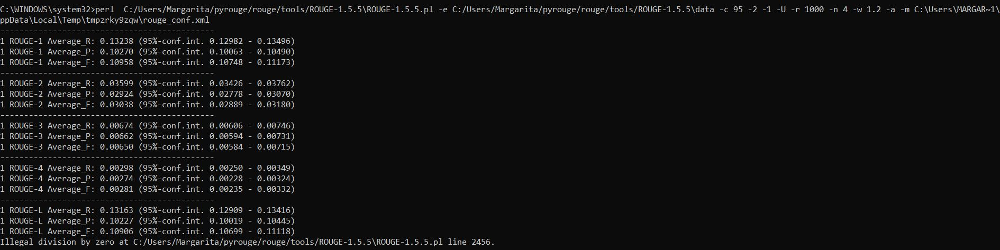

In [189]:
display(Image(filename='result_rouge.JPG', width = 1500)) 